In [1]:
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np
import os
from pathlib import Path

In [2]:
data_path = os.path.join(Path(os.getcwd()),'data','otherLanguages')
print(data_path)

C:\Users\C5265284\ClonesInDLCode\data\otherLanguages


In [3]:
def runs(lst):
    "Iterator, chunks repeated values"
    for j,two in enumerate(lst):
        if j == 0:
            one,i = two,0
        if one!=two:
            yield j - i,one
            i = j
        one=two
    yield j - i + 1,two
def cliffsDelta(lst1,lst2): 
    "Returns true if there are more than 'dull' differences"
    m, n = len(lst1), len(lst2)
    lst2 = sorted(lst2)
    j = more = less = 0
    for repeats,x in runs(sorted(lst1)):
        while j <= (n - 1) and lst2[j] <  x: 
            j += 1
        more += j*repeats
        while j <= (n - 1) and lst2[j] == x: 
            j += 1
        less += (n - j)*repeats
    d= (more - less) / (m*n) 
    return abs(d)

In [4]:
def without_hue(plot, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 4 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()

In [5]:
def add_percentage(plot, feature):
    #total = len(feature)
    for p in ax.patches:
        percentage = '{:.11}%'.format(p.get_height())
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()

In [6]:
def get_locc(row):
    startline=row['startline']
    endline = row['endline']
    return endline - startline + 1

In [7]:
def update_granularity(row):
    granularity=row['granularity']
    if 'block' in granularity:
        return 'Block'
    elif 'function' in granularity:
        return 'Function'

In [8]:
def set_granularity(row):
    granularity=row['granularity']
    if 'block' in granularity:
        return 'b'
    elif 'function' in granularity:
        return 'f'

In [9]:
#load preprocessed clones dl + traditional
all_clones = pd.read_csv('data/otherLanguages/cleanClones/all_dl_trad_clones.csv')
all_clones.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21


In [10]:
dl_categorized = pd.read_csv("data/clone_data/dl_class_categorized.csv")
dl_categorized.head()

,repoName,classid,g,similarity,files,startlines,endlines,nb_fragment,granularity,clone_type,project_type,category
0,BerryNet,1,b,100,{'../clone_code/dl/BerryNet/utils/snapshot-but...,"{58, 21}","{24, 61}",2,Block,type 1,Deep Learning,1
1,BerryNet,1,f,100,{'../clone_code/dl/BerryNet/utils/snapshot-but...,"{8, 11}","{11, 14}",2,Function,type 1,Deep Learning,1
2,BerryNet,2,b,100,{'../clone_code/dl/BerryNet/inference/detect_m...,"{66, 67, 68, 108, 76, 61}","{69, 70, 78, 110, 63}",6,Block,type 1,Deep Learning,1
3,BerryNet,2,f,100,{'../clone_code/dl/BerryNet/utils/snapshot-but...,"{57, 20}","{24, 61}",2,Function,type 1,Deep Learning,1
4,BerryNet,3,b,100,{'../clone_code/dl/BerryNet/inference/detect_m...,"{132, 104, 215, 121, 156}","{235, 142, 177, 153, 125}",5,Block,type 1,Deep Learning,1


## Prepare to categorize

In [12]:
clones_by_class_files = all_clones.groupby(['repoName','classid','granularity','clone_type'])['file'].apply(set).reset_index(name='files')
clones_by_class = pd.merge(all_clones, clones_by_class_files, how='left', on=['repoName','classid','granularity','clone_type'])
clones_by_class.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,files
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,{/tmpstore/bimus/repositories/csharp/SharpNet/...
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,{/tmpstore/bimus/repositories/csharp/SharpNet/...
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,{/tmpstore/bimus/repositories/csharp/SharpNet/...
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,{/tmpstore/bimus/repositories/csharp/SharpNet/...
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,{/tmpstore/bimus/repositories/csharp/KelpNet/K...


In [ ]:
type(clones_by_class['files'][0])

In [ ]:
dl_type3_class_clean = pd.read_csv(os.path.join(data_path,'dl_type3_by_class_clean.csv'))
stList = list(dl_type3_class_clean['startlines'].unique())
stcount = [len(x.split(',')) for x in stList]
# print (stcount)
dl_type3_class_clean = dl_type3_class_clean[dl_type3_class_clean['classid']==12]
dl_type3_class_clean = dl_type3_class_clean[dl_type3_class_clean['repoName']=='ConvNetSharp']
dl_type3_class_clean.head()

## Classify granularities

In [9]:
def get_category_name(row):
    if row['category']==0:
        return 'Same file'
    elif  row['category']==1:
        return 'Same directory'
    elif row['category']==2:
        return 'Different directories'

In [10]:
def find_between( inputStr, firstSubstr, lastSubstr ):
    '''
    find between firstSubstr and lastSubstr in inputStr  STARTING FROM THE LEFT
        http://stackoverflow.com/questions/3368969/find-string-between-two-substrings
            above also has a func that does this FROM THE RIGHT   
    '''
    start, end = (-1,-1)
    try:
        start = inputStr.index( firstSubstr ) + len( firstSubstr )
    except ValueError:
        print( '    ValueError: ')
        print("firstSubstr=%s  -  "%( firstSubstr ))
        print( sys.exc_info()[1])

    try:
        end = inputStr.index( lastSubstr, start )       
    except ValueError:
        print('ValueError: ')

    return inputStr[start:end] 

In [11]:
def classify_clone(row):
    if files.count('clone_code')<2: #files is of type set so duplicated value will be deleted and we will have just one file
#         print(files)
        return 0
    else:
        file1=find_between(files.split(',')[0], 'dl/','.pyindent')
        file2 = find_between(files.split(',')[1], 'dl/','.pyindent')
        directory1 = file1.split('/')[-2]
        directory2 = file2.split('/')[-2]
        if file1 == file2:
            print('F1:{} F2:{}'.format(file1,file2))
            return 0 #Same file
        
        elif directory1 == directory2:
            print('D1:{} D2:{}'.format(directory1, directory2))
            return 1 # Same directory
        else:
            print('D1:{} D2:{}'.format(directory1, directory2))
            return 2 # Different directory

In [12]:
def classify_clone_new(row):
    files = row['files']
    flist =[]
    cat = 0
    if 'set' not in str(type(files)):
        files=files.replace(' ','').replace('{','').replace('}','').replace('\'','')
        flist = set(files.split(','))
#         print (flist)
        fset = set(flist)
    else:
        fset = files
        flist = list(files)
    if len(fset)<2: #files is of type set so duplicated value will be deleted and we will have just one file
#         print('same file:{}'.format(fset))
        cat=0
    else:
        dlist = [x[0:x.rindex('/')] for x in flist]
#         print(dlist)
        dset = set(dlist)
        if len(dset)<2:
#             print('Same directory:{}'.format(dset))
            cat = 1 #Same file
        else:
#             print('Different directory:{}'.format(dset))
            cat = 2 # Same directory
    print (cat)
    return cat

In [14]:
clones_by_class_cat = clones_by_class
clones_by_class_cat['category'] = clones_by_class_cat.apply(classify_clone_new, axis=1)
clones_by_class_cat.head(10)

2
2
1
1
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
1
1
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
0
0
0
0
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
2
2
1
1
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
0
0
0
0
0
0
2
2
0
0
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0


2
2
2
2
2
2
2
2
2
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
1
1
1
1
1
1
2
2
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
0
0
0
0
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
1
1
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
2
2
2
0
0
1
1
1
1
1
1
1
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
2
2
2
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
2
2
2
2
2
2
2
2
1
1
1
1
2
2
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
0
0
0
0
0
0
1
1
0
0
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
2
2
2
1
1
2
2
2
2
2
2
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
2
2
2
2
2
2
2
2
1
1
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
0
0
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
1
1
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
1
1
1
1
1
1
1
1
1
0
0
1
1
0
0
2
2
2
2
2
2
1
1
2
2
1
1
1
1
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
0
0
0
0
2
2
1
1
1
1
2
2
2
2
1
1
2
2
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
2
2
2
2
1
1
2
2
2
2
1
1
2
2
2
1
1
1
1
1
1
1
1
1
1
0
0
0
0
2
2
2
2
0
0
0
0
0
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
0
0
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
0
0
0
0
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
2
2
0
0
0
2
2
1
1
1
1
1
1
1


0
0
0
0
1
1
1
2
2
0
0
2
2
0
0
2
2
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
1
1
1


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
0
0
0
0
2
2
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
2
2
0
0
0
0
0
0
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
2
2
2
0
0
0
0
0
0
2
2
2
2
1
1
1
2
2
2
2
1
1
1
1
1
1
1
0
0
2
2
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
0
0
1
1
0
0
2
2
2
0
0
1
1
1
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
0
0
0
0
2
2
2
2
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2


2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
1
1
1
1
1
1
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
0
0
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
0
0
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
0
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
2
2
2
2
2
2
2
1
1
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
2
2
1
1
1
1
1
1
1
1
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
0
0
0
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
0
0
0
0
0
0
2
2
2
2
0
0
2
2
2
2
2
2
0
0
2
2
2
2
0
0
2
2
1
1
1
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
0
0
2
2
2
2
0
0
1
1
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
2
2
2
2
0
0
0
0
0
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
1
1
0
0
2
2
2
2
2
0
0
1
1
2
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
1
1
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
0
0
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
0
0
0
0
1
1
0
0
0
1
1
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
1
1
1
1
1
1
1
1
1
1
2
2
2
2
1
1
2
2
2
2
2
2
2
2
1
1
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
2
2
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
2
2
1
1
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
2
2
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
0
0
0
2
2
2
2
2
2
2
2
1
1
2
2
1
1
2
2
2
1
1
2
2
2
2
2
2
0
0
2
2
0
0
2
2
2
2
1
1
2
2
2
2
1
1
1
1
2
2
1
1
1
1
1
1
0
0
1
1
0
0
2
2
2
2
1
1
1
1
1
1
1
1
0
0
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
0
0
1
1
0
0
0
0
0
0
0
0
2
2
1
1
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
1
1
2
2
1
1
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
2
2
0
0
0
0
2
2
2
2
1
1
2
2
2
0
0
1
1
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
1
1
2


2
2
1
1
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
1
1
0
0
1
1
2
2
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
2
2
2
2
2
2
2
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
2
2
2
2
1
1
2
2
1
1
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
1
1
2
2
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
2
2
2
0
0
0
0
0
0
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
2
2
0
0
0
0
0
0
1
1
2
2
2
2
1
1
1
1
2
2
2
2
2
2
1
1
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
2
2
2
0
0
1
1
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
2
2
2
2
0
0
1
1
1
1
1
1
1
2
2
0
0
1
1
1
1
2
2
0
0
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
1
1
0
0
2
2
2
2
1
1
0
0
0
0
0
0
2
2
2
2
2
2
1
1
0
0
0
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
1
1
1
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
1
1
1
1
1
1
0
0
0
0
0
0
1


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
0
0
0
0
1
1
1
1
0
0
0
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
1
1
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
2
2
2
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
2
2
2
2
2
2
2
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
1
1
2
2
2
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
1
1
0
0
2
2
1
1
0
0
2
2
0
0
1
1
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
1
1
1
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
2
2
2
2
2
2
0
0
1
1
1
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
1
1
0
0
0
0
0


1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
0
0
0
0
2
2
2
2
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
0
0
0
2
2
0
0
0
0
1
1
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
2
2
2
0
0
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
0
0
0
0
2
2
2
2
0
0
0
0
0
0
2
2


0
2
2
0
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
1
1
1
1
1
2
2
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
2
2
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
1
1
2
2
2
2
2
2
2
2
1
1
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
0
0
0
0
0
0
1
1
1
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
1
1
1
1
1
1
1
0


0
0
0
2
2
1
1
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
1
1
1
1
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
2
2
2
2
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
0
0
1
1
1
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
2
2
1
1
1
0
0
0
0
2
2
2
2
0
0
0
0
2
2
2
2
2
1
1
1
1
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
2
2
2
2
2
2
1
1
0
0
0
0
0
0
1
1
0
0
0
0
2
2
2
2
0
0
2
2
0
0
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
0
0
0
0
0
2
2
0
0
2
2
2
2
0
0
1
1
0
0
1
1
0
0
0
0
0
0
0
0
1
1
0
0
2
2
2
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
2
2
1
1
2
2
2
2
1
1
0
0
1
1
1
1
1
1
1
1
1
2
2
2
2
2
1
1
1
1
1
1
0
0
0
0
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
0
0
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
0
0
0
0
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
2
2
2
2
2
2
2
2
0
0
0
1
1
0
0
1
1
1
1
1
1
2
2
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
1
1
1
1
1
1
1
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
1
1
0
0
0
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
2
2
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1


0
0
0
0
1
1
2
2
2
2
2
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
2
2
2
0
0
1
1
1
1
0
0
0
0
2
2
2
2
2
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
0
0
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
2
2
1
1
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
2
2
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
2
2
2
2
2
2
2
1
1
1
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
2
2
0
0
0
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2


0
0
2
2
2
2
2
2
2
2
2
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
2
2
2
1
1
1
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
0
0
2
2
2
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0


2
2
0
0
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
0
0
2
2
0
0
0
2
2
2
2
2
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
1
1
2
2
2
0
0
2
2
2
2
2
2
2
2
1
1
2
2
0
0
0
0
0
0
0
0
1
1
1
2
2
0
0
2
2
2
2
2
1
1
1
1
2
2
2
2
2
0
0
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
2
2
0
0
0
0
0
0
2
2
0
0
2
2
2
2
0
0
2
2
0
0
1
1
0
0
2
2
0
0
0
0
0
2
2
2
1
1
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
2
2
0
0
1
1
1
1
0
0
2
2
0
0
2
2
0
0
0
0
0
0
0
2
2
2
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
0
0
1
1
1
0
0
0
0
1
1
2
2
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0


2
2
2
2
2
1
1
1
1
1
1
2
2
2
0
0
2
2
0
0
0
0
2
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
1
1
1
1
0
0
0
1
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
1
1
1
0
0
1
1
0
0
0
0
2
2
2
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
1
1
1
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
1
1
2
2
2
2
2
2
0
0
0
0
0
0
0
0
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2


1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
1
1
1
1
1
1
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
1
1
1
1
1
2
2
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


2
2
2
0
0
2
2
2
2
0
0
1
1
1
1
2
2
2
2
1
1
2
2
1
1
1
1
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
1
1
1
1
1
1
2
2
0
0
1
1
1
1
1
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


1
1
1
0
0
0
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
0
0
0
1
1
1
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
2
2
2
2
2
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
0
0
0
1
1
2
2
2
2
2
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
1
1
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0


2
2
2
2
2
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
2
2
2
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
2
2
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
2
2
2
2
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
2
2
2
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
0
0
2
2
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
2
2
1
1
1
1
1
1
1
1
1
2
2
2
2
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
0
0
0
0
0
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
1
1
2
2
2
2
2
2
2
1
1
2
2
2
2
1
1
0
0
1
1
1
1
0
0
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
2
2
2
1
1
1
1
2
2
2
2
1
1
1
1
2
2
2
2
2
2
2
2
0
0
1
1
0
0
1
1
0
0
0
2
2
0
0
0
0
1
1
1
0
0
2
2
1
1
1
1
0
0
2
2
0
0
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
1
1
1
1
0
0
0
0
2
2
2
0
0
1
1
1


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
2
2
1
1
1
1
1
1
1
1
1
1
0
0
0
1
1
1
1
0
0
2
2
1
1
1
1
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
0
0
0
1
1
1
0
0
0
0
0
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
1
1
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
1
1
1
1
1
1
1
1
2
2
2
2
2
1
1
1
1
1
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
1
1
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
0
0
0
0
2
2
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
1
1
0
0
0
0
0
0
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
1
1
1
1
0
0
0
2
2
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
1
1
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
1
1
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
0
0
0
0
2
2
2
2
2
0
0
2
2
2
2
2
2
2
0
0
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
1
1
2
2
2
2
2
2
2
2
0
0
2
2
0
0
2
2
2
2
2
2
0
0
1
1
1
2
2
1
1
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
0
0
2
2
2
1
1
2
2
0
0
0
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
1
1
1
1
1
1
1
1
1
1
1
2
2
0
0
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
2
0
0
0
0
2
2
2
2
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
1
1
1
0
0
0
0
0
0
0
0
0
0
0
1
1


,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,files,category
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,{/tmpstore/bimus/repositories/csharp/SharpNet/...,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,{/tmpstore/bimus/repositories/csharp/SharpNet/...,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,{/tmpstore/bimus/repositories/csharp/SharpNet/...,1
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,{/tmpstore/bimus/repositories/csharp/SharpNet/...,1
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2
5,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,715.0,100,Block,csharp,b,Type 1,Deep Learning,21,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2
6,KelpNet,2,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,43,60,157.0,100,Block,csharp,b,Type 1,Deep Learning,18,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2
7,KelpNet,2,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,43,60,774.0,100,Block,csharp,b,Type 1,Deep Learning,18,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2
8,KelpNet,3,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,35,39,174.0,100,Block,csharp,b,Type 1,Deep Learning,5,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2
9,KelpNet,3,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,35,39,184.0,100,Block,csharp,b,Type 1,Deep Learning,5,{/tmpstore/bimus/repositories/csharp/KelpNet/K...,2


In [16]:
clones_by_class_cat=clones_by_class_cat.drop(columns='files')

In [17]:
clones_by_class_cat.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2


In [18]:
clones_by_class_cat.to_csv('data/otherLanguages/cleanClones/all_clones_by_class_categorized.csv', index=False)

In [19]:
clones_by_class_cat_cols = clones_by_class_cat[['repoName','classid','granularity','clone_type','language','project_type','category']]
clones_by_class_cat_cols.head()

,repoName,classid,granularity,clone_type,language,project_type,category
0,SharpNet,1,Function,Type 1,csharp,Deep Learning,2
1,SharpNet,1,Function,Type 1,csharp,Deep Learning,2
2,SharpNet,2,Function,Type 1,csharp,Deep Learning,1
3,SharpNet,2,Function,Type 1,csharp,Deep Learning,1
4,KelpNet,1,Block,Type 1,csharp,Deep Learning,2


In [13]:
clones_by_class_cat_cols.to_csv('data/otherLanguages/cleanClones/all_clones_by_class_categorized_cols.csv', index=False)

NameError: name 'clones_by_class_cat_cols' is not defined

In [14]:
clones_by_class_cat = pd.read_csv('data/otherLanguages/cleanClones/all_clones_by_class_categorized.csv')

In [15]:
clones_by_class_cat.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2


## Update category

In [26]:
all_clones['category'] = np.nan
all_clones.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,NaN
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,NaN
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,NaN
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,NaN
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,NaN


In [52]:
clones_by_class_cat_cols_ndup=clones_by_class_cat_cols.drop_duplicates()
clones_by_class_cat_cols_ndup.head()

,repoName,classid,granularity,clone_type,language,project_type,category
0,SharpNet,1,Function,Type 1,csharp,Deep Learning,2
2,SharpNet,2,Function,Type 1,csharp,Deep Learning,1
4,KelpNet,1,Block,Type 1,csharp,Deep Learning,2
6,KelpNet,2,Block,Type 1,csharp,Deep Learning,2
8,KelpNet,3,Block,Type 1,csharp,Deep Learning,2


In [15]:
all_clones_cat.head()

NameError: name 'all_clones_cat' is not defined

In [63]:
# i = 0
for index1, row1 in clones_by_class_cat_cols_ndup.iterrows():
    rn = row1.repoName
    cid= row1.classid
    gran= row1.granularity
    c_type= row1.clone_type
    cat = int(row1.category)
    print('{} {} {} {}'.format(rn, cid, gran, c_type, cat))
    qstr = "repoName ==\'" + rn +"\' and classid=="+ str(cid)+ " and granularity=='"+ gran + "' and clone_type=='"+ row1.clone_type+"'"
#     print(qstr)
    index_list = all_clones_cat.query(qstr).index
#     print(index_list)
    all_clones_cat['category'].iloc[index_list]= str(cat)
#     all_clones_cat.loc[all_clones_cat.repoName == row1.repoName and all_clones_cat.classid == row1.classid, "category"] = row1.category
#     i = i + 1
#     if i>5:
#         break
all_clones_cat.head()

SharpNet 1 Function Type 1
SharpNet 2 Function Type 1
KelpNet 1 Block Type 1
KelpNet 2 Block Type 1
KelpNet 3 Block Type 1
KelpNet 4 Block Type 1
KelpNet 5 Block Type 1
KelpNet 6 Block Type 1
KelpNet 7 Block Type 1
KelpNet 8 Block Type 1
KelpNet 9 Block Type 1
KelpNet 10 Block Type 1
KelpNet 11 Block Type 1
KelpNet 12 Block Type 1
KelpNet 13 Block Type 1
KelpNet 14 Block Type 1
KelpNet 15 Block Type 1
KelpNet 16 Block Type 1
KelpNet 17 Block Type 1
KelpNet 18 Block Type 1
KelpNet 19 Block Type 1
KelpNet 20 Block Type 1
KelpNet 21 Block Type 1
KelpNet 22 Block Type 1
KelpNet 23 Block Type 1
KelpNet 24 Block Type 1
SiaNet 1 Block Type 1
SiaNet 2 Block Type 1
SiaNet 3 Block Type 1
SiaNet 4 Block Type 1
SiaNet 5 Block Type 1
SiaNet 6 Block Type 1
SiaNet 7 Block Type 1
SiaNet 8 Block Type 1
SiaNet 9 Block Type 1
SiaNet 10 Block Type 1
SiaNet 11 Block Type 1
SiaNet 12 Block Type 1
SiaNet 13 Block Type 1
SiaNet 14 Block Type 1
SiaNet 15 Block Type 1
SiaNet 16 Block Type 1
SiaNet 17 Block Type

SiaNet 325 Block Type 1
SiaNet 326 Block Type 1
SiaNet 327 Block Type 1
SiaNet 328 Block Type 1
SiaNet 329 Block Type 1
SiaNet 330 Block Type 1
SiaNet 331 Block Type 1
SiaNet 332 Block Type 1
SiaNet 333 Block Type 1
SiaNet 334 Block Type 1
SiaNet 335 Block Type 1
SiaNet 336 Block Type 1
SiaNet 337 Block Type 1
SiaNet 338 Block Type 1
SiaNet 339 Block Type 1
SiaNet 340 Block Type 1
SiaNet 341 Block Type 1
SiaNet 342 Block Type 1
SiaNet 343 Block Type 1
SiaNet 344 Block Type 1
SiaNet 345 Block Type 1
SiaNet 346 Block Type 1
SiaNet 347 Block Type 1
SiaNet 348 Block Type 1
SiaNet 349 Block Type 1
SiaNet 350 Block Type 1
SiaNet 351 Block Type 1
SiaNet 352 Block Type 1
SiaNet 353 Block Type 1
SiaNet 354 Block Type 1
SiaNet 355 Block Type 1
SiaNet 356 Block Type 1
SiaNet 357 Block Type 1
SiaNet 358 Block Type 1
SiaNet 359 Block Type 1
SiaNet 360 Block Type 1
SiaNet 361 Block Type 1
SiaNet 362 Block Type 1
SiaNet 363 Block Type 1
SiaNet 364 Block Type 1
SiaNet 365 Block Type 1
SiaNet 366 Block

MyCaffe 14 Block Type 1
MyCaffe 15 Block Type 1
MyCaffe 16 Block Type 1
MyCaffe 17 Block Type 1
MyCaffe 18 Block Type 1
MyCaffe 19 Block Type 1
MyCaffe 20 Block Type 1
MyCaffe 21 Block Type 1
MyCaffe 22 Block Type 1
MyCaffe 23 Block Type 1
MyCaffe 24 Block Type 1
MyCaffe 25 Block Type 1
MyCaffe 26 Block Type 1
MyCaffe 27 Block Type 1
MyCaffe 28 Block Type 1
MyCaffe 29 Block Type 1
MyCaffe 30 Block Type 1
MyCaffe 31 Block Type 1
MyCaffe 32 Block Type 1
MyCaffe 33 Block Type 1
MyCaffe 34 Block Type 1
MyCaffe 35 Block Type 1
MyCaffe 36 Block Type 1
MyCaffe 37 Block Type 1
MyCaffe 38 Block Type 1
MyCaffe 39 Block Type 1
MyCaffe 40 Block Type 1
MyCaffe 41 Block Type 1
MyCaffe 42 Block Type 1
MyCaffe 43 Block Type 1
MyCaffe 44 Block Type 1
MyCaffe 45 Block Type 1
MyCaffe 46 Block Type 1
MyCaffe 47 Block Type 1
MyCaffe 48 Block Type 1
MyCaffe 49 Block Type 1
MyCaffe 50 Block Type 1
MyCaffe 51 Block Type 1
MyCaffe 52 Block Type 1
MyCaffe 53 Block Type 1
MyCaffe 54 Block Type 1
MyCaffe 55 Block

MyCaffe 350 Block Type 1
MyCaffe 351 Block Type 1
MyCaffe 352 Block Type 1
MyCaffe 353 Block Type 1
MyCaffe 354 Block Type 1
MyCaffe 355 Block Type 1
MyCaffe 356 Block Type 1
MyCaffe 357 Block Type 1
MyCaffe 358 Block Type 1
MyCaffe 359 Block Type 1
MyCaffe 360 Block Type 1
MyCaffe 361 Block Type 1
MyCaffe 362 Block Type 1
MyCaffe 363 Block Type 1
MyCaffe 364 Block Type 1
MyCaffe 365 Block Type 1
MyCaffe 366 Block Type 1
MyCaffe 367 Block Type 1
MyCaffe 368 Block Type 1
MyCaffe 369 Block Type 1
MyCaffe 370 Block Type 1
MyCaffe 371 Block Type 1
MyCaffe 372 Block Type 1
MyCaffe 373 Block Type 1
MyCaffe 374 Block Type 1
MyCaffe 375 Block Type 1
MyCaffe 376 Block Type 1
MyCaffe 377 Block Type 1
MyCaffe 378 Block Type 1
MyCaffe 379 Block Type 1
MyCaffe 380 Block Type 1
MyCaffe 381 Block Type 1
MyCaffe 382 Block Type 1
MyCaffe 383 Block Type 1
MyCaffe 384 Block Type 1
MyCaffe 385 Block Type 1
MyCaffe 386 Block Type 1
MyCaffe 387 Block Type 1
MyCaffe 388 Block Type 1
MyCaffe 389 Block Type 1


TensorShader 59 Function Type 1
TensorShader 60 Function Type 1
TensorShader 61 Function Type 1
TensorShader 62 Function Type 1
TensorShader 63 Function Type 1
TensorShader 64 Function Type 1
TensorShader 65 Function Type 1
TensorShader 66 Function Type 1
TensorShader 67 Function Type 1
TensorShader 68 Function Type 1
TensorShader 69 Function Type 1
TensorShader 70 Function Type 1
keras-sharp 1 Block Type 1
keras-sharp 2 Block Type 1
keras-sharp 3 Block Type 1
keras-sharp 4 Block Type 1
keras-sharp 5 Block Type 1
keras-sharp 6 Block Type 1
keras-sharp 7 Block Type 1
keras-sharp 8 Block Type 1
keras-sharp 9 Block Type 1
keras-sharp 10 Block Type 1
keras-sharp 11 Block Type 1
SiaNet 1 Function Type 1
SiaNet 2 Function Type 1
SiaNet 3 Function Type 1
SiaNet 4 Function Type 1
SiaNet 5 Function Type 1
SiaNet 6 Function Type 1
SiaNet 7 Function Type 1
SiaNet 8 Function Type 1
SiaNet 9 Function Type 1
SiaNet 10 Function Type 1
SiaNet 11 Function Type 1
SiaNet 12 Function Type 1
SiaNet 13 Func

TensorShader 6 Block Type 1
TensorShader 7 Block Type 1
TensorShader 8 Block Type 1
TensorShader 9 Block Type 1
TensorShader 10 Block Type 1
TensorShader 11 Block Type 1
TensorShader 12 Block Type 1
TensorShader 13 Block Type 1
TensorShader 14 Block Type 1
TensorShader 15 Block Type 1
TensorShader 16 Block Type 1
TensorShader 17 Block Type 1
TensorShader 18 Block Type 1
TensorShader 19 Block Type 1
TensorShader 20 Block Type 1
TensorShader 21 Block Type 1
TensorShader 22 Block Type 1
TensorShader 23 Block Type 1
TensorShader 24 Block Type 1
TensorShader 25 Block Type 1
TensorShader 26 Block Type 1
TensorShader 27 Block Type 1
TensorShader 28 Block Type 1
TensorShader 29 Block Type 1
TensorShader 30 Block Type 1
TensorShader 31 Block Type 1
TensorShader 32 Block Type 1
TensorShader 33 Block Type 1
TensorShader 34 Block Type 1
TensorShader 35 Block Type 1
TensorShader 36 Block Type 1
TensorShader 37 Block Type 1
TensorShader 38 Block Type 1
TensorShader 39 Block Type 1
TensorShader 40 Bl

deeplearning4j 107 Block Type 1
deeplearning4j 108 Block Type 1
deeplearning4j 109 Block Type 1
deeplearning4j 110 Block Type 1
deeplearning4j 111 Block Type 1
deeplearning4j 112 Block Type 1
deeplearning4j 113 Block Type 1
deeplearning4j 114 Block Type 1
deeplearning4j 115 Block Type 1
deeplearning4j 116 Block Type 1
deeplearning4j 117 Block Type 1
deeplearning4j 118 Block Type 1
deeplearning4j 119 Block Type 1
deeplearning4j 120 Block Type 1
deeplearning4j 121 Block Type 1
deeplearning4j 122 Block Type 1
deeplearning4j 123 Block Type 1
deeplearning4j 124 Block Type 1
deeplearning4j 125 Block Type 1
deeplearning4j 126 Block Type 1
deeplearning4j 127 Block Type 1
deeplearning4j 128 Block Type 1
deeplearning4j 129 Block Type 1
deeplearning4j 130 Block Type 1
deeplearning4j 131 Block Type 1
deeplearning4j 132 Block Type 1
deeplearning4j 133 Block Type 1
deeplearning4j 134 Block Type 1
deeplearning4j 135 Block Type 1
deeplearning4j 136 Block Type 1
deeplearning4j 137 Block Type 1
deeplear

deeplearning4j 367 Block Type 1
deeplearning4j 368 Block Type 1
deeplearning4j 369 Block Type 1
deeplearning4j 370 Block Type 1
deeplearning4j 371 Block Type 1
deeplearning4j 372 Block Type 1
deeplearning4j 373 Block Type 1
deeplearning4j 374 Block Type 1
deeplearning4j 375 Block Type 1
deeplearning4j 376 Block Type 1
deeplearning4j 377 Block Type 1
deeplearning4j 378 Block Type 1
deeplearning4j 379 Block Type 1
deeplearning4j 380 Block Type 1
deeplearning4j 381 Block Type 1
deeplearning4j 382 Block Type 1
deeplearning4j 383 Block Type 1
deeplearning4j 384 Block Type 1
deeplearning4j 385 Block Type 1
deeplearning4j 386 Block Type 1
deeplearning4j 387 Block Type 1
deeplearning4j 388 Block Type 1
deeplearning4j 389 Block Type 1
deeplearning4j 390 Block Type 1
deeplearning4j 391 Block Type 1
deeplearning4j 392 Block Type 1
deeplearning4j 393 Block Type 1
deeplearning4j 394 Block Type 1
deeplearning4j 395 Block Type 1
deeplearning4j 396 Block Type 1
deeplearning4j 397 Block Type 1
deeplear

deeplearning4j 625 Block Type 1
deeplearning4j 626 Block Type 1
deeplearning4j 627 Block Type 1
deeplearning4j 628 Block Type 1
deeplearning4j 629 Block Type 1
deeplearning4j 630 Block Type 1
deeplearning4j 631 Block Type 1
deeplearning4j 632 Block Type 1
deeplearning4j 633 Block Type 1
deeplearning4j 634 Block Type 1
deeplearning4j 635 Block Type 1
deeplearning4j 636 Block Type 1
deeplearning4j 637 Block Type 1
deeplearning4j 638 Block Type 1
deeplearning4j 639 Block Type 1
deeplearning4j 640 Block Type 1
deeplearning4j 641 Block Type 1
deeplearning4j 642 Block Type 1
deeplearning4j 643 Block Type 1
deeplearning4j 644 Block Type 1
deeplearning4j 645 Block Type 1
deeplearning4j 646 Block Type 1
deeplearning4j 647 Block Type 1
deeplearning4j 648 Block Type 1
deeplearning4j 649 Block Type 1
deeplearning4j 650 Block Type 1
deeplearning4j 651 Block Type 1
deeplearning4j 652 Block Type 1
deeplearning4j 653 Block Type 1
deeplearning4j 654 Block Type 1
deeplearning4j 655 Block Type 1
deeplear

deeplearning4j 885 Block Type 1
deeplearning4j 886 Block Type 1
deeplearning4j 887 Block Type 1
deeplearning4j 888 Block Type 1
deeplearning4j 889 Block Type 1
deeplearning4j 890 Block Type 1
deeplearning4j 891 Block Type 1
deeplearning4j 892 Block Type 1
deeplearning4j 893 Block Type 1
deeplearning4j 894 Block Type 1
deeplearning4j 895 Block Type 1
deeplearning4j 896 Block Type 1
deeplearning4j 897 Block Type 1
deeplearning4j 898 Block Type 1
deeplearning4j 899 Block Type 1
deeplearning4j 900 Block Type 1
deeplearning4j 901 Block Type 1
deeplearning4j 902 Block Type 1
deeplearning4j 903 Block Type 1
deeplearning4j 904 Block Type 1
deeplearning4j 905 Block Type 1
deeplearning4j 906 Block Type 1
deeplearning4j 907 Block Type 1
deeplearning4j 908 Block Type 1
deeplearning4j 909 Block Type 1
deeplearning4j 910 Block Type 1
deeplearning4j 911 Block Type 1
deeplearning4j 912 Block Type 1
deeplearning4j 913 Block Type 1
deeplearning4j 914 Block Type 1
deeplearning4j 915 Block Type 1
deeplear

deeplearning4j 1142 Block Type 1
deeplearning4j 1143 Block Type 1
deeplearning4j 1144 Block Type 1
deeplearning4j 1145 Block Type 1
deeplearning4j 1146 Block Type 1
deeplearning4j 1147 Block Type 1
deeplearning4j 1148 Block Type 1
deeplearning4j 1149 Block Type 1
deeplearning4j 1150 Block Type 1
deeplearning4j 1151 Block Type 1
deeplearning4j 1152 Block Type 1
deeplearning4j 1153 Block Type 1
deeplearning4j 1154 Block Type 1
deeplearning4j 1155 Block Type 1
deeplearning4j 1156 Block Type 1
deeplearning4j 1157 Block Type 1
deeplearning4j 1158 Block Type 1
deeplearning4j 1159 Block Type 1
deeplearning4j 1160 Block Type 1
deeplearning4j 1161 Block Type 1
deeplearning4j 1162 Block Type 1
deeplearning4j 1163 Block Type 1
deeplearning4j 1164 Block Type 1
deeplearning4j 1165 Block Type 1
deeplearning4j 1166 Block Type 1
deeplearning4j 1167 Block Type 1
deeplearning4j 1168 Block Type 1
deeplearning4j 1169 Block Type 1
deeplearning4j 1170 Block Type 1
deeplearning4j 1171 Block Type 1
deeplearni

neuralnetworks 47 Function Type 1
neuralnetworks 48 Function Type 1
neuralnetworks 49 Function Type 1
neuralnetworks 50 Function Type 1
neuralnetworks 51 Function Type 1
neuralnetworks 52 Function Type 1
neuralnetworks 53 Function Type 1
neuralnetworks 54 Function Type 1
neuralnetworks 55 Function Type 1
neuralnetworks 56 Function Type 1
neuralnetworks 57 Function Type 1
neuralnetworks 58 Function Type 1
neuralnetworks 59 Function Type 1
neuralnetworks 60 Function Type 1
neuralnetworks 61 Function Type 1
neuralnetworks 62 Function Type 1
neuralnetworks 63 Function Type 1
neuralnetworks 64 Function Type 1
neuralnetworks 65 Function Type 1
neuralnetworks 66 Function Type 1
neuralnetworks 67 Function Type 1
neuralnetworks 68 Function Type 1
neuralnetworks 69 Function Type 1
neuralnetworks 70 Function Type 1
neuralnetworks 71 Function Type 1
neuralnetworks 72 Function Type 1
neuralnetworks 73 Function Type 1
neuralnetworks 74 Function Type 1
neuralnetworks 75 Function Type 1
neuralnetworks

DeepDriver 104 Function Type 1
DeepDriver 105 Function Type 1
DeepDriver 106 Function Type 1
DeepDriver 107 Function Type 1
DeepDriver 108 Function Type 1
DeepDriver 109 Function Type 1
DeepDriver 110 Function Type 1
DeepDriver 111 Function Type 1
DeepDriver 112 Function Type 1
DeepDriver 113 Function Type 1
DeepDriver 114 Function Type 1
DeepDriver 115 Function Type 1
DeepDriver 116 Function Type 1
DeepDriver 117 Function Type 1
DeepDriver 118 Function Type 1
DeepDriver 119 Function Type 1
DeepDriver 120 Function Type 1
DeepDriver 121 Function Type 1
DeepDriver 122 Function Type 1
DeepDriver 123 Function Type 1
djl 1 Function Type 1
djl 2 Function Type 1
djl 3 Function Type 1
djl 4 Function Type 1
djl 5 Function Type 1
djl 6 Function Type 1
djl 7 Function Type 1
djl 8 Function Type 1
djl 9 Function Type 1
djl 10 Function Type 1
djl 11 Function Type 1
djl 12 Function Type 1
djl 13 Function Type 1
djl 14 Function Type 1
djl 15 Function Type 1
djl 16 Function Type 1
djl 17 Function Type 

deeplearning4j 115 Function Type 1
deeplearning4j 116 Function Type 1
deeplearning4j 117 Function Type 1
deeplearning4j 118 Function Type 1
deeplearning4j 119 Function Type 1
deeplearning4j 120 Function Type 1
deeplearning4j 121 Function Type 1
deeplearning4j 122 Function Type 1
deeplearning4j 123 Function Type 1
deeplearning4j 124 Function Type 1
deeplearning4j 125 Function Type 1
deeplearning4j 126 Function Type 1
deeplearning4j 127 Function Type 1
deeplearning4j 128 Function Type 1
deeplearning4j 129 Function Type 1
deeplearning4j 130 Function Type 1
deeplearning4j 131 Function Type 1
deeplearning4j 132 Function Type 1
deeplearning4j 133 Function Type 1
deeplearning4j 134 Function Type 1
deeplearning4j 135 Function Type 1
deeplearning4j 136 Function Type 1
deeplearning4j 137 Function Type 1
deeplearning4j 138 Function Type 1
deeplearning4j 139 Function Type 1
deeplearning4j 140 Function Type 1
deeplearning4j 141 Function Type 1
deeplearning4j 142 Function Type 1
deeplearning4j 143 F

deeplearning4j 355 Function Type 1
deeplearning4j 356 Function Type 1
deeplearning4j 357 Function Type 1
deeplearning4j 358 Function Type 1
deeplearning4j 359 Function Type 1
deeplearning4j 360 Function Type 1
deeplearning4j 361 Function Type 1
deeplearning4j 362 Function Type 1
deeplearning4j 363 Function Type 1
deeplearning4j 364 Function Type 1
deeplearning4j 365 Function Type 1
deeplearning4j 366 Function Type 1
deeplearning4j 367 Function Type 1
deeplearning4j 368 Function Type 1
deeplearning4j 369 Function Type 1
deeplearning4j 370 Function Type 1
deeplearning4j 371 Function Type 1
deeplearning4j 372 Function Type 1
deeplearning4j 373 Function Type 1
deeplearning4j 374 Function Type 1
deeplearning4j 375 Function Type 1
deeplearning4j 376 Function Type 1
deeplearning4j 377 Function Type 1
deeplearning4j 378 Function Type 1
deeplearning4j 379 Function Type 1
deeplearning4j 380 Function Type 1
deeplearning4j 381 Function Type 1
deeplearning4j 382 Function Type 1
deeplearning4j 383 F

deeplearning4j 591 Function Type 1
deeplearning4j 592 Function Type 1
deeplearning4j 593 Function Type 1
deeplearning4j 594 Function Type 1
deeplearning4j 595 Function Type 1
deeplearning4j 596 Function Type 1
deeplearning4j 597 Function Type 1
deeplearning4j 598 Function Type 1
deeplearning4j 599 Function Type 1
deeplearning4j 600 Function Type 1
deeplearning4j 601 Function Type 1
deeplearning4j 602 Function Type 1
DeepDriver 1 Block Type 1
DeepDriver 2 Block Type 1
DeepDriver 3 Block Type 1
DeepDriver 4 Block Type 1
DeepDriver 5 Block Type 1
DeepDriver 6 Block Type 1
DeepDriver 7 Block Type 1
DeepDriver 8 Block Type 1
DeepDriver 9 Block Type 1
DeepDriver 10 Block Type 1
DeepDriver 11 Block Type 1
DeepDriver 12 Block Type 1
DeepDriver 13 Block Type 1
DeepDriver 14 Block Type 1
DeepDriver 15 Block Type 1
DeepDriver 16 Block Type 1
DeepDriver 17 Block Type 1
DeepDriver 18 Block Type 1
DeepDriver 19 Block Type 1
DeepDriver 20 Block Type 1
DeepDriver 21 Block Type 1
DeepDriver 22 Block Ty

neuralnetworks 53 Block Type 1
neuralnetworks 54 Block Type 1
neuralnetworks 55 Block Type 1
neuralnetworks 56 Block Type 1
neuralnetworks 57 Block Type 1
neuralnetworks 58 Block Type 1
neuralnetworks 59 Block Type 1
neuralnetworks 60 Block Type 1
neuralnetworks 61 Block Type 1
neuralnetworks 62 Block Type 1
neuralnetworks 63 Block Type 1
neuralnetworks 64 Block Type 1
neuralnetworks 65 Block Type 1
neuralnetworks 66 Block Type 1
neuralnetworks 67 Block Type 1
neuralnetworks 68 Block Type 1
neuralnetworks 69 Block Type 1
neuralnetworks 70 Block Type 1
neuralnetworks 71 Block Type 1
neuralnetworks 72 Block Type 1
neuralnetworks 73 Block Type 1
neuralnetworks 74 Block Type 1
neuralnetworks 75 Block Type 1
neuralnetworks 76 Block Type 1
neuralnetworks 77 Block Type 1
neuralnetworks 78 Block Type 1
neuralnetworks 79 Block Type 1
neuralnetworks 80 Block Type 1
neuralnetworks 81 Block Type 1
neuralnetworks 82 Block Type 1
neuralnetworks 83 Block Type 1
neuralnetworks 84 Block Type 1
neuralne

neuralnetworks 317 Block Type 1
neuralnetworks 318 Block Type 1
neuralnetworks 319 Block Type 1
neuralnetworks 320 Block Type 1
neuralnetworks 321 Block Type 1
neuralnetworks 322 Block Type 1
neuralnetworks 323 Block Type 1
neuralnetworks 324 Block Type 1
neuralnetworks 325 Block Type 1
neuralnetworks 326 Block Type 1
neuralnetworks 327 Block Type 1
neuralnetworks 328 Block Type 1
neuralnetworks 329 Block Type 1
neuralnetworks 330 Block Type 1
neuralnetworks 331 Block Type 1
neuralnetworks 332 Block Type 1
neuralnetworks 333 Block Type 1
neuralnetworks 334 Block Type 1
neuralnetworks 335 Block Type 1
neuralnetworks 336 Block Type 1
neuralnetworks 337 Block Type 1
neuralnetworks 338 Block Type 1
neuralnetworks 339 Block Type 1
neuralnetworks 340 Block Type 1
neuralnetworks 341 Block Type 1
neuralnetworks 342 Block Type 1
neuralnetworks 343 Block Type 1
neuralnetworks 344 Block Type 1
neuralnetworks 345 Block Type 1
neuralnetworks 346 Block Type 1
neuralnetworks 347 Block Type 1
neuralne

knime-deeplearning 191 Block Type 1
knime-deeplearning 192 Block Type 1
knime-deeplearning 193 Block Type 1
knime-deeplearning 194 Block Type 1
knime-deeplearning 195 Block Type 1
knime-deeplearning 196 Block Type 1
knime-deeplearning 197 Block Type 1
knime-deeplearning 198 Block Type 1
knime-deeplearning 199 Block Type 1
knime-deeplearning 200 Block Type 1
knime-deeplearning 201 Block Type 1
knime-deeplearning 1 Function Type 1
knime-deeplearning 2 Function Type 1
knime-deeplearning 3 Function Type 1
knime-deeplearning 4 Function Type 1
knime-deeplearning 5 Function Type 1
knime-deeplearning 6 Function Type 1
knime-deeplearning 7 Function Type 1
knime-deeplearning 8 Function Type 1
knime-deeplearning 9 Function Type 1
knime-deeplearning 10 Function Type 1
knime-deeplearning 11 Function Type 1
knime-deeplearning 12 Function Type 1
knime-deeplearning 13 Function Type 1
knime-deeplearning 14 Function Type 1
knime-deeplearning 15 Function Type 1
knime-deeplearning 16 Function Type 1
knime

MyCaffe 61 Function Type 2
MyCaffe 62 Function Type 2
MyCaffe 63 Function Type 2
MyCaffe 64 Function Type 2
MyCaffe 66 Function Type 2
MyCaffe 70 Function Type 2
MyCaffe 71 Function Type 2
MyCaffe 72 Function Type 2
MyCaffe 73 Function Type 2
MyCaffe 74 Function Type 2
MyCaffe 75 Function Type 2
MyCaffe 76 Function Type 2
MyCaffe 77 Function Type 2
MyCaffe 78 Function Type 2
MyCaffe 79 Function Type 2
MyCaffe 80 Function Type 2
MyCaffe 81 Function Type 2
MyCaffe 82 Function Type 2
MyCaffe 83 Function Type 2
MyCaffe 84 Function Type 2
MyCaffe 87 Function Type 2
MyCaffe 88 Function Type 2
MyCaffe 90 Function Type 2
MyCaffe 91 Function Type 2
MyCaffe 92 Function Type 2
MyCaffe 93 Function Type 2
MyCaffe 94 Function Type 2
MyCaffe 95 Function Type 2
MyCaffe 96 Function Type 2
MyCaffe 97 Function Type 2
MyCaffe 98 Function Type 2
MyCaffe 99 Function Type 2
MyCaffe 100 Function Type 2
MyCaffe 102 Function Type 2
MyCaffe 103 Function Type 2
MyCaffe 104 Function Type 2
MyCaffe 105 Function Typ

TensorShader 39 Function Type 2
TensorShader 40 Function Type 2
TensorShader 41 Function Type 2
TensorShader 42 Function Type 2
TensorShader 43 Function Type 2
TensorShader 44 Function Type 2
TensorShader 45 Function Type 2
TensorShader 46 Function Type 2
TensorShader 49 Function Type 2
TensorShader 50 Function Type 2
TensorShader 51 Function Type 2
TensorShader 53 Function Type 2
TensorShader 54 Function Type 2
TensorShader 55 Function Type 2
TensorShader 56 Function Type 2
TensorShader 58 Function Type 2
TensorShader 59 Function Type 2
TensorShader 60 Function Type 2
TensorShader 61 Function Type 2
TensorShader 62 Function Type 2
TensorShader 63 Function Type 2
TensorShader 65 Function Type 2
TensorShader 66 Function Type 2
TensorShader 67 Function Type 2
TensorShader 68 Function Type 2
TensorShader 69 Function Type 2
TensorShader 71 Function Type 2
TensorShader 72 Function Type 2
TensorShader 73 Function Type 2
TensorShader 74 Function Type 2
TensorShader 75 Function Type 2
TensorSh

MyCaffe 53 Block Type 2
MyCaffe 54 Block Type 2
MyCaffe 55 Block Type 2
MyCaffe 56 Block Type 2
MyCaffe 57 Block Type 2
MyCaffe 58 Block Type 2
MyCaffe 59 Block Type 2
MyCaffe 60 Block Type 2
MyCaffe 61 Block Type 2
MyCaffe 62 Block Type 2
MyCaffe 63 Block Type 2
MyCaffe 64 Block Type 2
MyCaffe 66 Block Type 2
MyCaffe 67 Block Type 2
MyCaffe 68 Block Type 2
MyCaffe 69 Block Type 2
MyCaffe 70 Block Type 2
MyCaffe 73 Block Type 2
MyCaffe 75 Block Type 2
MyCaffe 76 Block Type 2
MyCaffe 77 Block Type 2
MyCaffe 78 Block Type 2
MyCaffe 79 Block Type 2
MyCaffe 80 Block Type 2
MyCaffe 81 Block Type 2
MyCaffe 82 Block Type 2
MyCaffe 83 Block Type 2
MyCaffe 86 Block Type 2
MyCaffe 87 Block Type 2
MyCaffe 88 Block Type 2
MyCaffe 89 Block Type 2
MyCaffe 90 Block Type 2
MyCaffe 91 Block Type 2
MyCaffe 93 Block Type 2
MyCaffe 95 Block Type 2
MyCaffe 96 Block Type 2
MyCaffe 98 Block Type 2
MyCaffe 101 Block Type 2
MyCaffe 105 Block Type 2
MyCaffe 106 Block Type 2
MyCaffe 107 Block Type 2
MyCaffe 108 

MyCaffe 642 Block Type 2
MyCaffe 644 Block Type 2
MyCaffe 645 Block Type 2
MyCaffe 648 Block Type 2
MyCaffe 649 Block Type 2
MyCaffe 653 Block Type 2
MyCaffe 655 Block Type 2
MyCaffe 656 Block Type 2
MyCaffe 657 Block Type 2
MyCaffe 658 Block Type 2
MyCaffe 659 Block Type 2
MyCaffe 660 Block Type 2
MyCaffe 661 Block Type 2
MyCaffe 662 Block Type 2
MyCaffe 663 Block Type 2
MyCaffe 664 Block Type 2
MyCaffe 665 Block Type 2
MyCaffe 666 Block Type 2
MyCaffe 669 Block Type 2
MyCaffe 671 Block Type 2
MyCaffe 672 Block Type 2
MyCaffe 673 Block Type 2
MyCaffe 674 Block Type 2
MyCaffe 675 Block Type 2
MyCaffe 676 Block Type 2
MyCaffe 677 Block Type 2
MyCaffe 678 Block Type 2
MyCaffe 679 Block Type 2
MyCaffe 680 Block Type 2
MyCaffe 681 Block Type 2
MyCaffe 682 Block Type 2
MyCaffe 683 Block Type 2
MyCaffe 684 Block Type 2
MyCaffe 685 Block Type 2
MyCaffe 686 Block Type 2
MyCaffe 687 Block Type 2
MyCaffe 689 Block Type 2
MyCaffe 691 Block Type 2
MyCaffe 694 Block Type 2
MyCaffe 695 Block Type 2


TensorShader 83 Block Type 2
TensorShader 84 Block Type 2
TensorShader 85 Block Type 2
TensorShader 86 Block Type 2
TensorShader 87 Block Type 2
TensorShader 88 Block Type 2
TensorShader 90 Block Type 2
TensorShader 91 Block Type 2
TensorShader 93 Block Type 2
TensorShader 95 Block Type 2
TensorShader 96 Block Type 2
TensorShader 97 Block Type 2
TensorShader 98 Block Type 2
TensorShader 100 Block Type 2
TensorShader 101 Block Type 2
TensorShader 102 Block Type 2
TensorShader 111 Block Type 2
TensorShader 117 Block Type 2
TensorShader 118 Block Type 2
TensorShader 119 Block Type 2
TensorShader 120 Block Type 2
TensorShader 121 Block Type 2
TensorShader 122 Block Type 2
TensorShader 124 Block Type 2
TensorShader 125 Block Type 2
TensorShader 126 Block Type 2
TensorShader 127 Block Type 2
TensorShader 128 Block Type 2
TensorShader 129 Block Type 2
TensorShader 130 Block Type 2
TensorShader 131 Block Type 2
TensorShader 132 Block Type 2
TensorShader 133 Block Type 2
TensorShader 134 Block 

TensorShader 428 Block Type 2
TensorShader 429 Block Type 2
TensorShader 430 Block Type 2
TensorShader 431 Block Type 2
TensorShader 432 Block Type 2
TensorShader 433 Block Type 2
TensorShader 434 Block Type 2
TensorShader 435 Block Type 2
TensorShader 436 Block Type 2
TensorShader 437 Block Type 2
TensorShader 438 Block Type 2
TensorShader 439 Block Type 2
TensorShader 440 Block Type 2
TensorShader 441 Block Type 2
TensorShader 442 Block Type 2
TensorShader 443 Block Type 2
TensorShader 444 Block Type 2
TensorShader 445 Block Type 2
TensorShader 446 Block Type 2
TensorShader 447 Block Type 2
TensorShader 448 Block Type 2
TensorShader 449 Block Type 2
TensorShader 450 Block Type 2
TensorShader 452 Block Type 2
TensorShader 453 Block Type 2
TensorShader 455 Block Type 2
TensorShader 456 Block Type 2
TensorShader 457 Block Type 2
TensorShader 458 Block Type 2
TensorShader 459 Block Type 2
TensorShader 461 Block Type 2
TensorShader 462 Block Type 2
TensorShader 463 Block Type 2
TensorShad

SiaNet 212 Function Type 2
SiaNet 213 Function Type 2
SiaNet 214 Function Type 2
SiaNet 216 Function Type 2
SiaNet 217 Function Type 2
SiaNet 218 Function Type 2
SiaNet 219 Function Type 2
SiaNet 220 Function Type 2
SiaNet 221 Function Type 2
SiaNet 222 Function Type 2
SiaNet 223 Function Type 2
SiaNet 224 Function Type 2
SiaNet 225 Function Type 2
SiaNet 226 Function Type 2
SiaNet 227 Function Type 2
SiaNet 228 Function Type 2
SiaNet 229 Function Type 2
SiaNet 230 Function Type 2
SiaNet 231 Function Type 2
SiaNet 232 Function Type 2
SiaNet 233 Function Type 2
SiaNet 235 Function Type 2
SiaNet 236 Function Type 2
SiaNet 237 Function Type 2
SiaNet 238 Function Type 2
SiaNet 239 Function Type 2
SiaNet 240 Function Type 2
SiaNet 249 Function Type 2
SiaNet 253 Function Type 2
SiaNet 263 Function Type 2
SiaNet 266 Function Type 2
SiaNet 267 Function Type 2
SiaNet 271 Function Type 2
SiaNet 272 Function Type 2
SiaNet 274 Function Type 2
SiaNet 276 Function Type 2
SiaNet 277 Function Type 2
S

SiaNet 37 Block Type 2
SiaNet 38 Block Type 2
SiaNet 39 Block Type 2
SiaNet 40 Block Type 2
SiaNet 41 Block Type 2
SiaNet 42 Block Type 2
SiaNet 43 Block Type 2
SiaNet 45 Block Type 2
SiaNet 46 Block Type 2
SiaNet 48 Block Type 2
SiaNet 49 Block Type 2
SiaNet 50 Block Type 2
SiaNet 52 Block Type 2
SiaNet 53 Block Type 2
SiaNet 54 Block Type 2
SiaNet 55 Block Type 2
SiaNet 56 Block Type 2
SiaNet 57 Block Type 2
SiaNet 58 Block Type 2
SiaNet 59 Block Type 2
SiaNet 60 Block Type 2
SiaNet 63 Block Type 2
SiaNet 67 Block Type 2
SiaNet 68 Block Type 2
SiaNet 69 Block Type 2
SiaNet 70 Block Type 2
SiaNet 71 Block Type 2
SiaNet 72 Block Type 2
SiaNet 74 Block Type 2
SiaNet 75 Block Type 2
SiaNet 76 Block Type 2
SiaNet 77 Block Type 2
SiaNet 78 Block Type 2
SiaNet 79 Block Type 2
SiaNet 80 Block Type 2
SiaNet 81 Block Type 2
SiaNet 82 Block Type 2
SiaNet 83 Block Type 2
SiaNet 84 Block Type 2
SiaNet 85 Block Type 2
SiaNet 86 Block Type 2
SiaNet 91 Block Type 2
SiaNet 92 Block Type 2
SiaNet 93 B

SANNet 47 Function Type 2
SANNet 49 Function Type 2
SANNet 50 Function Type 2
SANNet 51 Function Type 2
SANNet 52 Function Type 2
SANNet 53 Function Type 2
SANNet 54 Function Type 2
SANNet 55 Function Type 2
SANNet 56 Function Type 2
SANNet 57 Function Type 2
SANNet 59 Function Type 2
SANNet 60 Function Type 2
SANNet 61 Function Type 2
SANNet 62 Function Type 2
SANNet 63 Function Type 2
djl 1 Block Type 2
djl 2 Block Type 2
djl 4 Block Type 2
djl 5 Block Type 2
djl 6 Block Type 2
djl 7 Block Type 2
djl 8 Block Type 2
djl 9 Block Type 2
djl 10 Block Type 2
djl 11 Block Type 2
djl 12 Block Type 2
djl 13 Block Type 2
djl 14 Block Type 2
djl 17 Block Type 2
djl 18 Block Type 2
djl 19 Block Type 2
djl 20 Block Type 2
djl 21 Block Type 2
djl 22 Block Type 2
djl 23 Block Type 2
djl 24 Block Type 2
djl 25 Block Type 2
djl 26 Block Type 2
djl 27 Block Type 2
djl 28 Block Type 2
djl 31 Block Type 2
djl 34 Block Type 2
djl 35 Block Type 2
djl 36 Block Type 2
djl 37 Block Type 2
djl 38 Block Type 

neuralnetworks 191 Block Type 2
neuralnetworks 192 Block Type 2
neuralnetworks 193 Block Type 2
neuralnetworks 194 Block Type 2
neuralnetworks 195 Block Type 2
neuralnetworks 196 Block Type 2
neuralnetworks 197 Block Type 2
neuralnetworks 198 Block Type 2
neuralnetworks 200 Block Type 2
neuralnetworks 201 Block Type 2
neuralnetworks 202 Block Type 2
neuralnetworks 203 Block Type 2
neuralnetworks 204 Block Type 2
neuralnetworks 206 Block Type 2
neuralnetworks 207 Block Type 2
neuralnetworks 208 Block Type 2
neuralnetworks 209 Block Type 2
neuralnetworks 210 Block Type 2
neuralnetworks 211 Block Type 2
neuralnetworks 212 Block Type 2
neuralnetworks 213 Block Type 2
neuralnetworks 214 Block Type 2
neuralnetworks 215 Block Type 2
neuralnetworks 216 Block Type 2
neuralnetworks 217 Block Type 2
neuralnetworks 218 Block Type 2
neuralnetworks 219 Block Type 2
neuralnetworks 220 Block Type 2
neuralnetworks 221 Block Type 2
neuralnetworks 222 Block Type 2
neuralnetworks 223 Block Type 2
neuralne

neuralnetworks 28 Function Type 2
neuralnetworks 29 Function Type 2
neuralnetworks 30 Function Type 2
neuralnetworks 31 Function Type 2
neuralnetworks 32 Function Type 2
neuralnetworks 33 Function Type 2
neuralnetworks 34 Function Type 2
neuralnetworks 35 Function Type 2
neuralnetworks 36 Function Type 2
neuralnetworks 37 Function Type 2
neuralnetworks 38 Function Type 2
neuralnetworks 39 Function Type 2
neuralnetworks 40 Function Type 2
neuralnetworks 41 Function Type 2
neuralnetworks 42 Function Type 2
neuralnetworks 43 Function Type 2
neuralnetworks 44 Function Type 2
neuralnetworks 45 Function Type 2
neuralnetworks 46 Function Type 2
neuralnetworks 47 Function Type 2
neuralnetworks 48 Function Type 2
neuralnetworks 49 Function Type 2
neuralnetworks 50 Function Type 2
neuralnetworks 51 Function Type 2
neuralnetworks 52 Function Type 2
neuralnetworks 53 Function Type 2
neuralnetworks 54 Function Type 2
neuralnetworks 55 Function Type 2
neuralnetworks 56 Function Type 2
neuralnetworks

neuralnetworks 278 Function Type 2
neuralnetworks 279 Function Type 2
neuralnetworks 280 Function Type 2
neuralnetworks 281 Function Type 2
neuralnetworks 282 Function Type 2
neuralnetworks 283 Function Type 2
neuralnetworks 284 Function Type 2
neuralnetworks 285 Function Type 2
neuralnetworks 286 Function Type 2
neuralnetworks 287 Function Type 2
neuralnetworks 288 Function Type 2
neuralnetworks 289 Function Type 2
neuralnetworks 290 Function Type 2
neuralnetworks 291 Function Type 2
neuralnetworks 292 Function Type 2
neuralnetworks 293 Function Type 2
neuralnetworks 294 Function Type 2
neuralnetworks 296 Function Type 2
neuralnetworks 297 Function Type 2
neuralnetworks 298 Function Type 2
neuralnetworks 299 Function Type 2
neuralnetworks 300 Function Type 2
neuralnetworks 301 Function Type 2
neuralnetworks 302 Function Type 2
neuralnetworks 303 Function Type 2
neuralnetworks 304 Function Type 2
neuralnetworks 305 Function Type 2
neuralnetworks 306 Function Type 2
neuralnetworks 307 F

DeepDriver 175 Block Type 2
DeepDriver 190 Block Type 2
DeepDriver 197 Block Type 2
DeepDriver 199 Block Type 2
DeepDriver 208 Block Type 2
DeepDriver 209 Block Type 2
DeepDriver 210 Block Type 2
DeepDriver 212 Block Type 2
DeepDriver 213 Block Type 2
DeepDriver 214 Block Type 2
DeepDriver 218 Block Type 2
DeepDriver 219 Block Type 2
DeepDriver 220 Block Type 2
DeepDriver 221 Block Type 2
DeepDriver 222 Block Type 2
DeepDriver 233 Block Type 2
DeepDriver 239 Block Type 2
DeepDriver 257 Block Type 2
DeepDriver 258 Block Type 2
DeepDriver 259 Block Type 2
DeepDriver 263 Block Type 2
DeepDriver 264 Block Type 2
DeepDriver 265 Block Type 2
DeepDriver 266 Block Type 2
DeepDriver 267 Block Type 2
DeepDriver 268 Block Type 2
DeepDriver 271 Block Type 2
DeepDriver 272 Block Type 2
DeepDriver 274 Block Type 2
DeepDriver 275 Block Type 2
DeepDriver 277 Block Type 2
DeepDriver 279 Block Type 2
DeepDriver 280 Block Type 2
DeepDriver 283 Block Type 2
DeepDriver 289 Block Type 2
DeepDriver 290 Block

deeplearning4j 394 Block Type 2
deeplearning4j 400 Block Type 2
deeplearning4j 401 Block Type 2
deeplearning4j 402 Block Type 2
deeplearning4j 403 Block Type 2
deeplearning4j 404 Block Type 2
deeplearning4j 405 Block Type 2
deeplearning4j 408 Block Type 2
deeplearning4j 409 Block Type 2
deeplearning4j 411 Block Type 2
deeplearning4j 412 Block Type 2
deeplearning4j 413 Block Type 2
deeplearning4j 415 Block Type 2
deeplearning4j 417 Block Type 2
deeplearning4j 419 Block Type 2
deeplearning4j 420 Block Type 2
deeplearning4j 421 Block Type 2
deeplearning4j 422 Block Type 2
deeplearning4j 423 Block Type 2
deeplearning4j 425 Block Type 2
deeplearning4j 426 Block Type 2
deeplearning4j 427 Block Type 2
deeplearning4j 432 Block Type 2
deeplearning4j 435 Block Type 2
deeplearning4j 436 Block Type 2
deeplearning4j 437 Block Type 2
deeplearning4j 438 Block Type 2
deeplearning4j 439 Block Type 2
deeplearning4j 440 Block Type 2
deeplearning4j 441 Block Type 2
deeplearning4j 442 Block Type 2
deeplear

deeplearning4j 827 Block Type 2
deeplearning4j 830 Block Type 2
deeplearning4j 834 Block Type 2
deeplearning4j 835 Block Type 2
deeplearning4j 836 Block Type 2
deeplearning4j 839 Block Type 2
deeplearning4j 840 Block Type 2
deeplearning4j 841 Block Type 2
deeplearning4j 842 Block Type 2
deeplearning4j 843 Block Type 2
deeplearning4j 844 Block Type 2
deeplearning4j 845 Block Type 2
deeplearning4j 847 Block Type 2
deeplearning4j 848 Block Type 2
deeplearning4j 849 Block Type 2
deeplearning4j 851 Block Type 2
deeplearning4j 852 Block Type 2
deeplearning4j 855 Block Type 2
deeplearning4j 856 Block Type 2
deeplearning4j 857 Block Type 2
deeplearning4j 858 Block Type 2
deeplearning4j 859 Block Type 2
deeplearning4j 860 Block Type 2
deeplearning4j 862 Block Type 2
deeplearning4j 865 Block Type 2
deeplearning4j 866 Block Type 2
deeplearning4j 867 Block Type 2
deeplearning4j 869 Block Type 2
deeplearning4j 870 Block Type 2
deeplearning4j 871 Block Type 2
deeplearning4j 872 Block Type 2
deeplear

deeplearning4j 1257 Block Type 2
deeplearning4j 1258 Block Type 2
deeplearning4j 1259 Block Type 2
deeplearning4j 1260 Block Type 2
deeplearning4j 1261 Block Type 2
deeplearning4j 1262 Block Type 2
deeplearning4j 1263 Block Type 2
deeplearning4j 1264 Block Type 2
deeplearning4j 1265 Block Type 2
deeplearning4j 1266 Block Type 2
deeplearning4j 1267 Block Type 2
deeplearning4j 1268 Block Type 2
deeplearning4j 1269 Block Type 2
deeplearning4j 1270 Block Type 2
deeplearning4j 1271 Block Type 2
deeplearning4j 1272 Block Type 2
deeplearning4j 1273 Block Type 2
deeplearning4j 1274 Block Type 2
deeplearning4j 1275 Block Type 2
deeplearning4j 1277 Block Type 2
deeplearning4j 1278 Block Type 2
deeplearning4j 1279 Block Type 2
deeplearning4j 1280 Block Type 2
deeplearning4j 1281 Block Type 2
deeplearning4j 1282 Block Type 2
deeplearning4j 1283 Block Type 2
deeplearning4j 1284 Block Type 2
deeplearning4j 1285 Block Type 2
deeplearning4j 1286 Block Type 2
deeplearning4j 1287 Block Type 2
deeplearni

deeplearning4j 1712 Block Type 2
deeplearning4j 1713 Block Type 2
deeplearning4j 1714 Block Type 2
deeplearning4j 1715 Block Type 2
deeplearning4j 1718 Block Type 2
deeplearning4j 1719 Block Type 2
deeplearning4j 1720 Block Type 2
deeplearning4j 1722 Block Type 2
deeplearning4j 1723 Block Type 2
deeplearning4j 1724 Block Type 2
deeplearning4j 1729 Block Type 2
deeplearning4j 1733 Block Type 2
deeplearning4j 1736 Block Type 2
deeplearning4j 1738 Block Type 2
deeplearning4j 1741 Block Type 2
deeplearning4j 1742 Block Type 2
deeplearning4j 1743 Block Type 2
deeplearning4j 1744 Block Type 2
deeplearning4j 1745 Block Type 2
deeplearning4j 1746 Block Type 2
deeplearning4j 1748 Block Type 2
deeplearning4j 1753 Block Type 2
deeplearning4j 1754 Block Type 2
deeplearning4j 1755 Block Type 2
deeplearning4j 1756 Block Type 2
deeplearning4j 1757 Block Type 2
deeplearning4j 1759 Block Type 2
deeplearning4j 1760 Block Type 2
deeplearning4j 1761 Block Type 2
deeplearning4j 1764 Block Type 2
deeplearni

deeplearning4j 57 Function Type 2
deeplearning4j 58 Function Type 2
deeplearning4j 60 Function Type 2
deeplearning4j 63 Function Type 2
deeplearning4j 64 Function Type 2
deeplearning4j 65 Function Type 2
deeplearning4j 66 Function Type 2
deeplearning4j 67 Function Type 2
deeplearning4j 68 Function Type 2
deeplearning4j 69 Function Type 2
deeplearning4j 70 Function Type 2
deeplearning4j 71 Function Type 2
deeplearning4j 72 Function Type 2
deeplearning4j 73 Function Type 2
deeplearning4j 74 Function Type 2
deeplearning4j 75 Function Type 2
deeplearning4j 76 Function Type 2
deeplearning4j 81 Function Type 2
deeplearning4j 82 Function Type 2
deeplearning4j 85 Function Type 2
deeplearning4j 86 Function Type 2
deeplearning4j 87 Function Type 2
deeplearning4j 88 Function Type 2
deeplearning4j 89 Function Type 2
deeplearning4j 90 Function Type 2
deeplearning4j 91 Function Type 2
deeplearning4j 92 Function Type 2
deeplearning4j 93 Function Type 2
deeplearning4j 94 Function Type 2
deeplearning4j

deeplearning4j 404 Function Type 2
deeplearning4j 405 Function Type 2
deeplearning4j 406 Function Type 2
deeplearning4j 407 Function Type 2
deeplearning4j 408 Function Type 2
deeplearning4j 409 Function Type 2
deeplearning4j 410 Function Type 2
deeplearning4j 411 Function Type 2
deeplearning4j 414 Function Type 2
deeplearning4j 417 Function Type 2
deeplearning4j 418 Function Type 2
deeplearning4j 419 Function Type 2
deeplearning4j 420 Function Type 2
deeplearning4j 422 Function Type 2
deeplearning4j 423 Function Type 2
deeplearning4j 424 Function Type 2
deeplearning4j 425 Function Type 2
deeplearning4j 426 Function Type 2
deeplearning4j 427 Function Type 2
deeplearning4j 430 Function Type 2
deeplearning4j 431 Function Type 2
deeplearning4j 432 Function Type 2
deeplearning4j 452 Function Type 2
deeplearning4j 453 Function Type 2
deeplearning4j 456 Function Type 2
deeplearning4j 457 Function Type 2
deeplearning4j 458 Function Type 2
deeplearning4j 459 Function Type 2
deeplearning4j 460 F

deeplearning4j 768 Function Type 2
deeplearning4j 772 Function Type 2
deeplearning4j 773 Function Type 2
deeplearning4j 774 Function Type 2
deeplearning4j 775 Function Type 2
deeplearning4j 776 Function Type 2
deeplearning4j 777 Function Type 2
deeplearning4j 778 Function Type 2
deeplearning4j 779 Function Type 2
deeplearning4j 780 Function Type 2
deeplearning4j 781 Function Type 2
deeplearning4j 782 Function Type 2
deeplearning4j 783 Function Type 2
deeplearning4j 784 Function Type 2
deeplearning4j 787 Function Type 2
deeplearning4j 788 Function Type 2
deeplearning4j 789 Function Type 2
deeplearning4j 790 Function Type 2
deeplearning4j 791 Function Type 2
deeplearning4j 792 Function Type 2
deeplearning4j 793 Function Type 2
deeplearning4j 794 Function Type 2
deeplearning4j 795 Function Type 2
deeplearning4j 796 Function Type 2
deeplearning4j 797 Function Type 2
deeplearning4j 799 Function Type 2
deeplearning4j 800 Function Type 2
deeplearning4j 801 Function Type 2
deeplearning4j 802 F

deeplearning4j 1085 Function Type 2
deeplearning4j 1086 Function Type 2
deeplearning4j 1087 Function Type 2
deeplearning4j 1088 Function Type 2
deeplearning4j 1089 Function Type 2
deeplearning4j 1090 Function Type 2
deeplearning4j 1091 Function Type 2
deeplearning4j 1092 Function Type 2
deeplearning4j 1093 Function Type 2
deeplearning4j 1094 Function Type 2
deeplearning4j 1095 Function Type 2
deeplearning4j 1096 Function Type 2
deeplearning4j 1097 Function Type 2
deeplearning4j 1098 Function Type 2
deeplearning4j 1099 Function Type 2
deeplearning4j 1100 Function Type 2
deeplearning4j 1101 Function Type 2
deeplearning4j 1102 Function Type 2
deeplearning4j 1103 Function Type 2
deeplearning4j 1104 Function Type 2
deeplearning4j 1105 Function Type 2
deeplearning4j 1106 Function Type 2
deeplearning4j 1107 Function Type 2
deeplearning4j 1108 Function Type 2
deeplearning4j 1109 Function Type 2
deeplearning4j 1110 Function Type 2
deeplearning4j 1111 Function Type 2
deeplearning4j 1112 Function

knime-deeplearning 107 Function Type 2
knime-deeplearning 111 Function Type 2
knime-deeplearning 114 Function Type 2
knime-deeplearning 116 Function Type 2
knime-deeplearning 117 Function Type 2
knime-deeplearning 156 Function Type 2
knime-deeplearning 157 Function Type 2
knime-deeplearning 158 Function Type 2
knime-deeplearning 159 Function Type 2
knime-deeplearning 161 Function Type 2
knime-deeplearning 162 Function Type 2
knime-deeplearning 163 Function Type 2
knime-deeplearning 165 Function Type 2
knime-deeplearning 167 Function Type 2
knime-deeplearning 168 Function Type 2
knime-deeplearning 169 Function Type 2
knime-deeplearning 170 Function Type 2
knime-deeplearning 172 Function Type 2
knime-deeplearning 173 Function Type 2
knime-deeplearning 174 Function Type 2
knime-deeplearning 175 Function Type 2
knime-deeplearning 177 Function Type 2
knime-deeplearning 178 Function Type 2
knime-deeplearning 180 Function Type 2
knime-deeplearning 181 Function Type 2
knime-deeplearning 182 Fu

keras-sharp 1 Block Type 3
keras-sharp 3 Block Type 3
keras-sharp 4 Block Type 3
keras-sharp 5 Block Type 3
keras-sharp 6 Block Type 3
keras-sharp 8 Block Type 3
keras-sharp 9 Block Type 3
keras-sharp 11 Block Type 3
keras-sharp 12 Block Type 3
keras-sharp 13 Block Type 3
keras-sharp 14 Block Type 3
keras-sharp 17 Block Type 3
keras-sharp 19 Block Type 3
keras-sharp 20 Block Type 3
keras-sharp 21 Block Type 3
keras-sharp 22 Block Type 3
keras-sharp 23 Block Type 3
keras-sharp 24 Block Type 3
keras-sharp 25 Block Type 3
keras-sharp 26 Block Type 3
keras-sharp 27 Block Type 3
keras-sharp 28 Block Type 3
keras-sharp 29 Block Type 3
keras-sharp 30 Block Type 3
keras-sharp 31 Block Type 3
keras-sharp 32 Block Type 3
keras-sharp 34 Block Type 3
keras-sharp 35 Block Type 3
keras-sharp 36 Block Type 3
keras-sharp 39 Block Type 3
keras-sharp 40 Block Type 3
keras-sharp 41 Block Type 3
keras-sharp 42 Block Type 3
keras-sharp 43 Block Type 3
keras-sharp 45 Block Type 3
keras-sharp 46 Block Type 3

SiaNet 326 Function Type 3
SiaNet 327 Function Type 3
SiaNet 328 Function Type 3
SiaNet 329 Function Type 3
SiaNet 330 Function Type 3
SiaNet 331 Function Type 3
SiaNet 332 Function Type 3
SiaNet 333 Function Type 3
SiaNet 334 Function Type 3
SiaNet 335 Function Type 3
SiaNet 336 Function Type 3
SiaNet 337 Function Type 3
SiaNet 338 Function Type 3
SiaNet 339 Function Type 3
SiaNet 340 Function Type 3
SiaNet 341 Function Type 3
SiaNet 342 Function Type 3
SiaNet 343 Function Type 3
SiaNet 344 Function Type 3
SiaNet 345 Function Type 3
SiaNet 346 Function Type 3
SiaNet 347 Function Type 3
SiaNet 348 Function Type 3
SiaNet 349 Function Type 3
SiaNet 350 Function Type 3
SiaNet 351 Function Type 3
SiaNet 352 Function Type 3
SiaNet 353 Function Type 3
SiaNet 354 Function Type 3
SiaNet 355 Function Type 3
SiaNet 356 Function Type 3
SiaNet 357 Function Type 3
SiaNet 358 Function Type 3
SiaNet 359 Function Type 3
SiaNet 360 Function Type 3
SiaNet 361 Function Type 3
SiaNet 362 Function Type 3
S

SiaNet 636 Function Type 3
SiaNet 637 Function Type 3
SiaNet 638 Function Type 3
SiaNet 639 Function Type 3
SiaNet 640 Function Type 3
SiaNet 641 Function Type 3
SiaNet 642 Function Type 3
SiaNet 643 Function Type 3
SiaNet 644 Function Type 3
SiaNet 645 Function Type 3
SiaNet 646 Function Type 3
SiaNet 647 Function Type 3
SiaNet 648 Function Type 3
SiaNet 649 Function Type 3
SiaNet 650 Function Type 3
SiaNet 651 Function Type 3
SiaNet 652 Function Type 3
SiaNet 655 Function Type 3
SiaNet 656 Function Type 3
SiaNet 657 Function Type 3
SiaNet 658 Function Type 3
SiaNet 659 Function Type 3
SiaNet 660 Function Type 3
SiaNet 661 Function Type 3
SiaNet 662 Function Type 3
SiaNet 663 Function Type 3
SiaNet 664 Function Type 3
SiaNet 665 Function Type 3
SiaNet 666 Function Type 3
SiaNet 667 Function Type 3
SiaNet 668 Function Type 3
SiaNet 669 Function Type 3
SiaNet 670 Function Type 3
SiaNet 671 Function Type 3
SiaNet 672 Function Type 3
SiaNet 673 Function Type 3
SiaNet 674 Function Type 3
S

SiaNet 951 Function Type 3
SiaNet 954 Function Type 3
SiaNet 955 Function Type 3
SiaNet 957 Function Type 3
SiaNet 958 Function Type 3
SiaNet 960 Function Type 3
SiaNet 961 Function Type 3
SiaNet 962 Function Type 3
NeuralNetwork.NET 1 Function Type 3
NeuralNetwork.NET 2 Function Type 3
NeuralNetwork.NET 3 Function Type 3
NeuralNetwork.NET 4 Function Type 3
NeuralNetwork.NET 5 Function Type 3
NeuralNetwork.NET 7 Function Type 3
NeuralNetwork.NET 8 Function Type 3
NeuralNetwork.NET 9 Function Type 3
NeuralNetwork.NET 10 Function Type 3
NeuralNetwork.NET 11 Function Type 3
NeuralNetwork.NET 12 Function Type 3
NeuralNetwork.NET 13 Function Type 3
NeuralNetwork.NET 14 Function Type 3
NeuralNetwork.NET 15 Function Type 3
NeuralNetwork.NET 16 Function Type 3
NeuralNetwork.NET 17 Function Type 3
NeuralNetwork.NET 18 Function Type 3
NeuralNetwork.NET 19 Function Type 3
NeuralNetwork.NET 20 Function Type 3
NeuralNetwork.NET 21 Function Type 3
NeuralNetwork.NET 22 Function Type 3
NeuralNetwork.N

SiaNet 319 Block Type 3
SiaNet 320 Block Type 3
SiaNet 321 Block Type 3
SiaNet 322 Block Type 3
SiaNet 323 Block Type 3
SiaNet 324 Block Type 3
SiaNet 325 Block Type 3
SiaNet 326 Block Type 3
SiaNet 327 Block Type 3
SiaNet 328 Block Type 3
SiaNet 329 Block Type 3
SiaNet 330 Block Type 3
SiaNet 331 Block Type 3
SiaNet 332 Block Type 3
SiaNet 333 Block Type 3
SiaNet 334 Block Type 3
SiaNet 335 Block Type 3
SiaNet 336 Block Type 3
SiaNet 337 Block Type 3
SiaNet 338 Block Type 3
SiaNet 339 Block Type 3
SiaNet 340 Block Type 3
SiaNet 341 Block Type 3
SiaNet 342 Block Type 3
SiaNet 343 Block Type 3
SiaNet 345 Block Type 3
SiaNet 346 Block Type 3
SiaNet 347 Block Type 3
SiaNet 348 Block Type 3
SiaNet 349 Block Type 3
SiaNet 350 Block Type 3
SiaNet 351 Block Type 3
SiaNet 352 Block Type 3
SiaNet 353 Block Type 3
SiaNet 354 Block Type 3
SiaNet 355 Block Type 3
SiaNet 356 Block Type 3
SiaNet 357 Block Type 3
SiaNet 358 Block Type 3
SiaNet 359 Block Type 3
SiaNet 360 Block Type 3
SiaNet 361 Block

RNNSharp 19 Function Type 3
CeNiN 1 Block Type 3
CeNiN 3 Block Type 3
CeNiN 5 Block Type 3
TensorShader 1 Block Type 3
TensorShader 2 Block Type 3
TensorShader 3 Block Type 3
TensorShader 4 Block Type 3
TensorShader 5 Block Type 3
TensorShader 6 Block Type 3
TensorShader 7 Block Type 3
TensorShader 8 Block Type 3
TensorShader 9 Block Type 3
TensorShader 10 Block Type 3
TensorShader 11 Block Type 3
TensorShader 13 Block Type 3
TensorShader 14 Block Type 3
TensorShader 16 Block Type 3
TensorShader 17 Block Type 3
TensorShader 18 Block Type 3
TensorShader 19 Block Type 3
TensorShader 20 Block Type 3
TensorShader 21 Block Type 3
TensorShader 22 Block Type 3
TensorShader 23 Block Type 3
TensorShader 24 Block Type 3
TensorShader 25 Block Type 3
TensorShader 26 Block Type 3
TensorShader 28 Block Type 3
TensorShader 30 Block Type 3
TensorShader 31 Block Type 3
TensorShader 33 Block Type 3
TensorShader 34 Block Type 3
TensorShader 35 Block Type 3
TensorShader 37 Block Type 3
TensorShader 38 Blo

TensorShader 303 Block Type 3
TensorShader 304 Block Type 3
TensorShader 305 Block Type 3
TensorShader 306 Block Type 3
TensorShader 307 Block Type 3
TensorShader 308 Block Type 3
TensorShader 309 Block Type 3
TensorShader 310 Block Type 3
TensorShader 312 Block Type 3
TensorShader 313 Block Type 3
TensorShader 314 Block Type 3
TensorShader 316 Block Type 3
TensorShader 317 Block Type 3
TensorShader 318 Block Type 3
TensorShader 319 Block Type 3
TensorShader 320 Block Type 3
TensorShader 321 Block Type 3
TensorShader 322 Block Type 3
TensorShader 323 Block Type 3
TensorShader 324 Block Type 3
TensorShader 325 Block Type 3
TensorShader 326 Block Type 3
TensorShader 327 Block Type 3
TensorShader 328 Block Type 3
TensorShader 329 Block Type 3
TensorShader 330 Block Type 3
TensorShader 331 Block Type 3
TensorShader 332 Block Type 3
TensorShader 333 Block Type 3
TensorShader 334 Block Type 3
TensorShader 335 Block Type 3
TensorShader 336 Block Type 3
TensorShader 337 Block Type 3
TensorShad

MyCaffe 213 Function Type 3
MyCaffe 214 Function Type 3
MyCaffe 215 Function Type 3
MyCaffe 216 Function Type 3
MyCaffe 217 Function Type 3
MyCaffe 218 Function Type 3
MyCaffe 219 Function Type 3
MyCaffe 220 Function Type 3
MyCaffe 221 Function Type 3
MyCaffe 222 Function Type 3
MyCaffe 223 Function Type 3
MyCaffe 224 Function Type 3
MyCaffe 226 Function Type 3
MyCaffe 227 Function Type 3
MyCaffe 228 Function Type 3
MyCaffe 229 Function Type 3
MyCaffe 230 Function Type 3
MyCaffe 231 Function Type 3
MyCaffe 232 Function Type 3
MyCaffe 233 Function Type 3
MyCaffe 234 Function Type 3
MyCaffe 235 Function Type 3
MyCaffe 236 Function Type 3
MyCaffe 237 Function Type 3
MyCaffe 238 Function Type 3
MyCaffe 239 Function Type 3
MyCaffe 240 Function Type 3
MyCaffe 241 Function Type 3
MyCaffe 242 Function Type 3
MyCaffe 243 Function Type 3
MyCaffe 244 Function Type 3
MyCaffe 245 Function Type 3
MyCaffe 246 Function Type 3
MyCaffe 247 Function Type 3
MyCaffe 248 Function Type 3
MyCaffe 249 Function

MyCaffe 591 Function Type 3
MyCaffe 592 Function Type 3
MyCaffe 593 Function Type 3
MyCaffe 594 Function Type 3
MyCaffe 596 Function Type 3
MyCaffe 597 Function Type 3
MyCaffe 598 Function Type 3
MyCaffe 600 Function Type 3
FaceONNX 1 Function Type 3
FaceONNX 2 Function Type 3
FaceONNX 3 Function Type 3
FaceONNX 4 Function Type 3
FaceONNX 5 Function Type 3
FaceONNX 6 Function Type 3
FaceONNX 8 Function Type 3
FaceONNX 12 Function Type 3
FaceONNX 15 Function Type 3
FaceONNX 16 Function Type 3
FaceONNX 19 Function Type 3
FaceONNX 24 Function Type 3
FaceONNX 25 Function Type 3
FaceONNX 26 Function Type 3
KelpNet 1 Function Type 3
KelpNet 2 Function Type 3
KelpNet 4 Function Type 3
KelpNet 8 Function Type 3
KelpNet 9 Function Type 3
KelpNet 11 Function Type 3
KelpNet 12 Function Type 3
KelpNet 13 Function Type 3
KelpNet 14 Function Type 3
KelpNet 16 Function Type 3
KelpNet 18 Function Type 3
KelpNet 20 Function Type 3
KelpNet 21 Function Type 3
KelpNet 22 Function Type 3
KelpNet 24 Functio

ConvNetSharp 11 Block Type 3
ConvNetSharp 13 Block Type 3
ConvNetSharp 15 Block Type 3
ConvNetSharp 16 Block Type 3
ConvNetSharp 17 Block Type 3
ConvNetSharp 18 Block Type 3
ConvNetSharp 19 Block Type 3
ConvNetSharp 20 Block Type 3
ConvNetSharp 21 Block Type 3
ConvNetSharp 22 Block Type 3
ConvNetSharp 23 Block Type 3
ConvNetSharp 24 Block Type 3
ConvNetSharp 25 Block Type 3
ConvNetSharp 26 Block Type 3
ConvNetSharp 28 Block Type 3
ConvNetSharp 29 Block Type 3
ConvNetSharp 31 Block Type 3
ConvNetSharp 32 Block Type 3
ConvNetSharp 33 Block Type 3
ConvNetSharp 34 Block Type 3
ConvNetSharp 35 Block Type 3
ConvNetSharp 36 Block Type 3
ConvNetSharp 37 Block Type 3
ConvNetSharp 38 Block Type 3
ConvNetSharp 42 Block Type 3
ConvNetSharp 43 Block Type 3
ConvNetSharp 44 Block Type 3
ConvNetSharp 45 Block Type 3
ConvNetSharp 46 Block Type 3
ConvNetSharp 47 Block Type 3
ConvNetSharp 48 Block Type 3
ConvNetSharp 49 Block Type 3
ConvNetSharp 50 Block Type 3
ConvNetSharp 51 Block Type 3
ConvNetSharp 5

TensorShader 108 Function Type 3
TensorShader 109 Function Type 3
TensorShader 110 Function Type 3
TensorShader 111 Function Type 3
TensorShader 112 Function Type 3
TensorShader 113 Function Type 3
TensorShader 114 Function Type 3
TensorShader 115 Function Type 3
TensorShader 116 Function Type 3
TensorShader 117 Function Type 3
TensorShader 118 Function Type 3
TensorShader 120 Function Type 3
TensorShader 121 Function Type 3
TensorShader 122 Function Type 3
TensorShader 123 Function Type 3
TensorShader 124 Function Type 3
TensorShader 125 Function Type 3
TensorShader 126 Function Type 3
TensorShader 127 Function Type 3
TensorShader 128 Function Type 3
TensorShader 129 Function Type 3
TensorShader 131 Function Type 3
TensorShader 132 Function Type 3
TensorShader 134 Function Type 3
TensorShader 135 Function Type 3
TensorShader 138 Function Type 3
TensorShader 139 Function Type 3
TensorShader 140 Function Type 3
TensorShader 141 Function Type 3
TensorShader 142 Function Type 3
TensorShad

MyCaffe 14 Block Type 3
MyCaffe 15 Block Type 3
MyCaffe 16 Block Type 3
MyCaffe 17 Block Type 3
MyCaffe 18 Block Type 3
MyCaffe 19 Block Type 3
MyCaffe 20 Block Type 3
MyCaffe 21 Block Type 3
MyCaffe 23 Block Type 3
MyCaffe 24 Block Type 3
MyCaffe 25 Block Type 3
MyCaffe 26 Block Type 3
MyCaffe 27 Block Type 3
MyCaffe 28 Block Type 3
MyCaffe 29 Block Type 3
MyCaffe 30 Block Type 3
MyCaffe 31 Block Type 3
MyCaffe 33 Block Type 3
MyCaffe 34 Block Type 3
MyCaffe 35 Block Type 3
MyCaffe 36 Block Type 3
MyCaffe 37 Block Type 3
MyCaffe 38 Block Type 3
MyCaffe 39 Block Type 3
MyCaffe 40 Block Type 3
MyCaffe 41 Block Type 3
MyCaffe 42 Block Type 3
MyCaffe 43 Block Type 3
MyCaffe 44 Block Type 3
MyCaffe 45 Block Type 3
MyCaffe 46 Block Type 3
MyCaffe 47 Block Type 3
MyCaffe 48 Block Type 3
MyCaffe 49 Block Type 3
MyCaffe 50 Block Type 3
MyCaffe 52 Block Type 3
MyCaffe 53 Block Type 3
MyCaffe 54 Block Type 3
MyCaffe 56 Block Type 3
MyCaffe 57 Block Type 3
MyCaffe 58 Block Type 3
MyCaffe 61 Block

MyCaffe 427 Block Type 3
MyCaffe 428 Block Type 3
MyCaffe 429 Block Type 3
MyCaffe 430 Block Type 3
MyCaffe 431 Block Type 3
MyCaffe 433 Block Type 3
MyCaffe 434 Block Type 3
MyCaffe 435 Block Type 3
MyCaffe 436 Block Type 3
MyCaffe 438 Block Type 3
MyCaffe 440 Block Type 3
MyCaffe 441 Block Type 3
MyCaffe 442 Block Type 3
MyCaffe 443 Block Type 3
MyCaffe 445 Block Type 3
MyCaffe 447 Block Type 3
MyCaffe 449 Block Type 3
MyCaffe 450 Block Type 3
MyCaffe 453 Block Type 3
MyCaffe 454 Block Type 3
MyCaffe 455 Block Type 3
MyCaffe 456 Block Type 3
MyCaffe 457 Block Type 3
MyCaffe 458 Block Type 3
MyCaffe 459 Block Type 3
MyCaffe 460 Block Type 3
MyCaffe 461 Block Type 3
MyCaffe 462 Block Type 3
MyCaffe 463 Block Type 3
MyCaffe 464 Block Type 3
MyCaffe 465 Block Type 3
MyCaffe 466 Block Type 3
MyCaffe 467 Block Type 3
MyCaffe 469 Block Type 3
MyCaffe 470 Block Type 3
MyCaffe 471 Block Type 3
MyCaffe 472 Block Type 3
MyCaffe 473 Block Type 3
MyCaffe 476 Block Type 3
MyCaffe 477 Block Type 3


MyCaffe 887 Block Type 3
MyCaffe 888 Block Type 3
MyCaffe 889 Block Type 3
MyCaffe 890 Block Type 3
MyCaffe 891 Block Type 3
MyCaffe 892 Block Type 3
MyCaffe 893 Block Type 3
MyCaffe 894 Block Type 3
MyCaffe 895 Block Type 3
MyCaffe 896 Block Type 3
MyCaffe 897 Block Type 3
MyCaffe 899 Block Type 3
MyCaffe 900 Block Type 3
MyCaffe 901 Block Type 3
MyCaffe 902 Block Type 3
MyCaffe 903 Block Type 3
MyCaffe 904 Block Type 3
MyCaffe 906 Block Type 3
MyCaffe 907 Block Type 3
MyCaffe 908 Block Type 3
MyCaffe 909 Block Type 3
MyCaffe 910 Block Type 3
MyCaffe 911 Block Type 3
MyCaffe 912 Block Type 3
MyCaffe 913 Block Type 3
MyCaffe 914 Block Type 3
MyCaffe 915 Block Type 3
MyCaffe 916 Block Type 3
MyCaffe 917 Block Type 3
MyCaffe 920 Block Type 3
MyCaffe 921 Block Type 3
MyCaffe 922 Block Type 3
MyCaffe 923 Block Type 3
MyCaffe 924 Block Type 3
MyCaffe 925 Block Type 3
MyCaffe 926 Block Type 3
MyCaffe 927 Block Type 3
MyCaffe 928 Block Type 3
MyCaffe 929 Block Type 3
MyCaffe 930 Block Type 3


Seq2SeqSharp 109 Block Type 3
Seq2SeqSharp 110 Block Type 3
Seq2SeqSharp 111 Block Type 3
Seq2SeqSharp 112 Block Type 3
Seq2SeqSharp 115 Block Type 3
Seq2SeqSharp 116 Block Type 3
Seq2SeqSharp 117 Block Type 3
Seq2SeqSharp 118 Block Type 3
Seq2SeqSharp 119 Block Type 3
Seq2SeqSharp 120 Block Type 3
Seq2SeqSharp 121 Block Type 3
Seq2SeqSharp 122 Block Type 3
Seq2SeqSharp 123 Block Type 3
Seq2SeqSharp 124 Block Type 3
Seq2SeqSharp 125 Block Type 3
Seq2SeqSharp 126 Block Type 3
Seq2SeqSharp 127 Block Type 3
Seq2SeqSharp 128 Block Type 3
Seq2SeqSharp 129 Block Type 3
Seq2SeqSharp 130 Block Type 3
Seq2SeqSharp 131 Block Type 3
Seq2SeqSharp 133 Block Type 3
Seq2SeqSharp 134 Block Type 3
Seq2SeqSharp 135 Block Type 3
Seq2SeqSharp 136 Block Type 3
Seq2SeqSharp 137 Block Type 3
Seq2SeqSharp 138 Block Type 3
Seq2SeqSharp 139 Block Type 3
Seq2SeqSharp 140 Block Type 3
Seq2SeqSharp 141 Block Type 3
Seq2SeqSharp 142 Block Type 3
Seq2SeqSharp 143 Block Type 3
Seq2SeqSharp 144 Block Type 3
Seq2SeqSha

SANNet 88 Block Type 3
SANNet 89 Block Type 3
SANNet 90 Block Type 3
SANNet 91 Block Type 3
SANNet 92 Block Type 3
SANNet 93 Block Type 3
SANNet 94 Block Type 3
SANNet 95 Block Type 3
SANNet 96 Block Type 3
SANNet 97 Block Type 3
SANNet 101 Block Type 3
SANNet 102 Block Type 3
SANNet 103 Block Type 3
SANNet 104 Block Type 3
SANNet 106 Block Type 3
SANNet 108 Block Type 3
djl 1 Block Type 3
djl 2 Block Type 3
djl 3 Block Type 3
djl 4 Block Type 3
djl 5 Block Type 3
djl 6 Block Type 3
djl 7 Block Type 3
djl 8 Block Type 3
djl 9 Block Type 3
djl 10 Block Type 3
djl 11 Block Type 3
djl 12 Block Type 3
djl 13 Block Type 3
djl 14 Block Type 3
djl 15 Block Type 3
djl 16 Block Type 3
djl 17 Block Type 3
djl 18 Block Type 3
djl 19 Block Type 3
djl 20 Block Type 3
djl 21 Block Type 3
djl 22 Block Type 3
djl 23 Block Type 3
djl 24 Block Type 3
djl 25 Block Type 3
djl 26 Block Type 3
djl 27 Block Type 3
djl 28 Block Type 3
djl 29 Block Type 3
djl 31 Block Type 3
djl 32 Block Type 3
djl 33 Block Ty

deeplearning4j 60 Block Type 3
deeplearning4j 62 Block Type 3
deeplearning4j 63 Block Type 3
deeplearning4j 64 Block Type 3
deeplearning4j 65 Block Type 3
deeplearning4j 66 Block Type 3
deeplearning4j 68 Block Type 3
deeplearning4j 69 Block Type 3
deeplearning4j 70 Block Type 3
deeplearning4j 71 Block Type 3
deeplearning4j 72 Block Type 3
deeplearning4j 73 Block Type 3
deeplearning4j 74 Block Type 3
deeplearning4j 75 Block Type 3
deeplearning4j 76 Block Type 3
deeplearning4j 77 Block Type 3
deeplearning4j 78 Block Type 3
deeplearning4j 79 Block Type 3
deeplearning4j 80 Block Type 3
deeplearning4j 81 Block Type 3
deeplearning4j 82 Block Type 3
deeplearning4j 83 Block Type 3
deeplearning4j 84 Block Type 3
deeplearning4j 85 Block Type 3
deeplearning4j 86 Block Type 3
deeplearning4j 87 Block Type 3
deeplearning4j 88 Block Type 3
deeplearning4j 89 Block Type 3
deeplearning4j 90 Block Type 3
deeplearning4j 91 Block Type 3
deeplearning4j 95 Block Type 3
deeplearning4j 97 Block Type 3
deeplear

deeplearning4j 393 Block Type 3
deeplearning4j 394 Block Type 3
deeplearning4j 395 Block Type 3
deeplearning4j 396 Block Type 3
deeplearning4j 397 Block Type 3
deeplearning4j 398 Block Type 3
deeplearning4j 399 Block Type 3
deeplearning4j 400 Block Type 3
deeplearning4j 402 Block Type 3
deeplearning4j 403 Block Type 3
deeplearning4j 404 Block Type 3
deeplearning4j 405 Block Type 3
deeplearning4j 407 Block Type 3
deeplearning4j 408 Block Type 3
deeplearning4j 409 Block Type 3
deeplearning4j 410 Block Type 3
deeplearning4j 411 Block Type 3
deeplearning4j 412 Block Type 3
deeplearning4j 413 Block Type 3
deeplearning4j 414 Block Type 3
deeplearning4j 416 Block Type 3
deeplearning4j 417 Block Type 3
deeplearning4j 418 Block Type 3
deeplearning4j 419 Block Type 3
deeplearning4j 420 Block Type 3
deeplearning4j 421 Block Type 3
deeplearning4j 422 Block Type 3
deeplearning4j 423 Block Type 3
deeplearning4j 424 Block Type 3
deeplearning4j 425 Block Type 3
deeplearning4j 427 Block Type 3
deeplear

deeplearning4j 695 Block Type 3
deeplearning4j 696 Block Type 3
deeplearning4j 697 Block Type 3
deeplearning4j 698 Block Type 3
deeplearning4j 699 Block Type 3
deeplearning4j 700 Block Type 3
deeplearning4j 701 Block Type 3
deeplearning4j 702 Block Type 3
deeplearning4j 703 Block Type 3
deeplearning4j 704 Block Type 3
deeplearning4j 705 Block Type 3
deeplearning4j 706 Block Type 3
deeplearning4j 707 Block Type 3
deeplearning4j 708 Block Type 3
deeplearning4j 711 Block Type 3
deeplearning4j 713 Block Type 3
deeplearning4j 715 Block Type 3
deeplearning4j 721 Block Type 3
deeplearning4j 724 Block Type 3
deeplearning4j 726 Block Type 3
deeplearning4j 727 Block Type 3
deeplearning4j 728 Block Type 3
deeplearning4j 742 Block Type 3
deeplearning4j 743 Block Type 3
deeplearning4j 744 Block Type 3
deeplearning4j 745 Block Type 3
deeplearning4j 751 Block Type 3
deeplearning4j 753 Block Type 3
deeplearning4j 754 Block Type 3
deeplearning4j 755 Block Type 3
deeplearning4j 756 Block Type 3
deeplear

deeplearning4j 1025 Block Type 3
deeplearning4j 1026 Block Type 3
deeplearning4j 1027 Block Type 3
deeplearning4j 1028 Block Type 3
deeplearning4j 1030 Block Type 3
deeplearning4j 1031 Block Type 3
deeplearning4j 1032 Block Type 3
deeplearning4j 1033 Block Type 3
deeplearning4j 1035 Block Type 3
deeplearning4j 1036 Block Type 3
deeplearning4j 1038 Block Type 3
deeplearning4j 1039 Block Type 3
deeplearning4j 1040 Block Type 3
deeplearning4j 1041 Block Type 3
deeplearning4j 1042 Block Type 3
deeplearning4j 1043 Block Type 3
deeplearning4j 1045 Block Type 3
deeplearning4j 1046 Block Type 3
deeplearning4j 1047 Block Type 3
deeplearning4j 1048 Block Type 3
deeplearning4j 1049 Block Type 3
deeplearning4j 1050 Block Type 3
deeplearning4j 1051 Block Type 3
deeplearning4j 1052 Block Type 3
deeplearning4j 1054 Block Type 3
deeplearning4j 1055 Block Type 3
deeplearning4j 1056 Block Type 3
deeplearning4j 1058 Block Type 3
deeplearning4j 1060 Block Type 3
deeplearning4j 1061 Block Type 3
deeplearni

deeplearning4j 1367 Block Type 3
deeplearning4j 1368 Block Type 3
deeplearning4j 1370 Block Type 3
deeplearning4j 1371 Block Type 3
deeplearning4j 1373 Block Type 3
deeplearning4j 1374 Block Type 3
deeplearning4j 1375 Block Type 3
deeplearning4j 1376 Block Type 3
deeplearning4j 1377 Block Type 3
deeplearning4j 1378 Block Type 3
deeplearning4j 1380 Block Type 3
deeplearning4j 1381 Block Type 3
deeplearning4j 1382 Block Type 3
deeplearning4j 1383 Block Type 3
deeplearning4j 1384 Block Type 3
deeplearning4j 1387 Block Type 3
deeplearning4j 1388 Block Type 3
deeplearning4j 1390 Block Type 3
deeplearning4j 1391 Block Type 3
deeplearning4j 1392 Block Type 3
deeplearning4j 1393 Block Type 3
deeplearning4j 1394 Block Type 3
deeplearning4j 1395 Block Type 3
deeplearning4j 1396 Block Type 3
deeplearning4j 1397 Block Type 3
deeplearning4j 1400 Block Type 3
deeplearning4j 1401 Block Type 3
deeplearning4j 1402 Block Type 3
deeplearning4j 1403 Block Type 3
deeplearning4j 1404 Block Type 3
deeplearni

deeplearning4j 1671 Block Type 3
deeplearning4j 1672 Block Type 3
deeplearning4j 1673 Block Type 3
deeplearning4j 1674 Block Type 3
deeplearning4j 1675 Block Type 3
deeplearning4j 1676 Block Type 3
deeplearning4j 1677 Block Type 3
deeplearning4j 1678 Block Type 3
deeplearning4j 1679 Block Type 3
deeplearning4j 1680 Block Type 3
deeplearning4j 1681 Block Type 3
deeplearning4j 1682 Block Type 3
deeplearning4j 1683 Block Type 3
deeplearning4j 1684 Block Type 3
deeplearning4j 1685 Block Type 3
deeplearning4j 1686 Block Type 3
deeplearning4j 1687 Block Type 3
deeplearning4j 1688 Block Type 3
deeplearning4j 1689 Block Type 3
deeplearning4j 1690 Block Type 3
deeplearning4j 1691 Block Type 3
deeplearning4j 1692 Block Type 3
deeplearning4j 1693 Block Type 3
deeplearning4j 1694 Block Type 3
deeplearning4j 1695 Block Type 3
deeplearning4j 1696 Block Type 3
deeplearning4j 1697 Block Type 3
deeplearning4j 1698 Block Type 3
deeplearning4j 1699 Block Type 3
deeplearning4j 1700 Block Type 3
deeplearni

deeplearning4j 1960 Block Type 3
deeplearning4j 1962 Block Type 3
deeplearning4j 1963 Block Type 3
deeplearning4j 1964 Block Type 3
deeplearning4j 1965 Block Type 3
deeplearning4j 1966 Block Type 3
deeplearning4j 1967 Block Type 3
deeplearning4j 1968 Block Type 3
deeplearning4j 1970 Block Type 3
deeplearning4j 1972 Block Type 3
deeplearning4j 1973 Block Type 3
deeplearning4j 1975 Block Type 3
deeplearning4j 1976 Block Type 3
deeplearning4j 1977 Block Type 3
deeplearning4j 1979 Block Type 3
deeplearning4j 1980 Block Type 3
deeplearning4j 1981 Block Type 3
deeplearning4j 1982 Block Type 3
deeplearning4j 1983 Block Type 3
deeplearning4j 1984 Block Type 3
deeplearning4j 1985 Block Type 3
deeplearning4j 1986 Block Type 3
deeplearning4j 1987 Block Type 3
deeplearning4j 1988 Block Type 3
deeplearning4j 1989 Block Type 3
deeplearning4j 1991 Block Type 3
deeplearning4j 1992 Block Type 3
deeplearning4j 1995 Block Type 3
deeplearning4j 1996 Block Type 3
deeplearning4j 1997 Block Type 3
deeplearni

deeplearning4j 2289 Block Type 3
deeplearning4j 2291 Block Type 3
deeplearning4j 2293 Block Type 3
deeplearning4j 2294 Block Type 3
deeplearning4j 2298 Block Type 3
deeplearning4j 2299 Block Type 3
deeplearning4j 2300 Block Type 3
deeplearning4j 2301 Block Type 3
deeplearning4j 2302 Block Type 3
deeplearning4j 2303 Block Type 3
deeplearning4j 2304 Block Type 3
deeplearning4j 2305 Block Type 3
deeplearning4j 2308 Block Type 3
deeplearning4j 2309 Block Type 3
deeplearning4j 2310 Block Type 3
deeplearning4j 2311 Block Type 3
deeplearning4j 2312 Block Type 3
deeplearning4j 2313 Block Type 3
deeplearning4j 2315 Block Type 3
deeplearning4j 2316 Block Type 3
deeplearning4j 2317 Block Type 3
deeplearning4j 2318 Block Type 3
deeplearning4j 2319 Block Type 3
deeplearning4j 2323 Block Type 3
deeplearning4j 2324 Block Type 3
deeplearning4j 2330 Block Type 3
deeplearning4j 2331 Block Type 3
deeplearning4j 2332 Block Type 3
deeplearning4j 2333 Block Type 3
deeplearning4j 2334 Block Type 3
deeplearni

deeplearning4j 2610 Block Type 3
deeplearning4j 2611 Block Type 3
deeplearning4j 2612 Block Type 3
deeplearning4j 2613 Block Type 3
deeplearning4j 2614 Block Type 3
deeplearning4j 2615 Block Type 3
deeplearning4j 2616 Block Type 3
deeplearning4j 2617 Block Type 3
deeplearning4j 2618 Block Type 3
deeplearning4j 2619 Block Type 3
deeplearning4j 2620 Block Type 3
deeplearning4j 2621 Block Type 3
deeplearning4j 2623 Block Type 3
deeplearning4j 2624 Block Type 3
deeplearning4j 2625 Block Type 3
deeplearning4j 2626 Block Type 3
deeplearning4j 2627 Block Type 3
deeplearning4j 2628 Block Type 3
deeplearning4j 2629 Block Type 3
deeplearning4j 2630 Block Type 3
deeplearning4j 2631 Block Type 3
deeplearning4j 2632 Block Type 3
deeplearning4j 2633 Block Type 3
deeplearning4j 2634 Block Type 3
deeplearning4j 2635 Block Type 3
deeplearning4j 2636 Block Type 3
deeplearning4j 2637 Block Type 3
deeplearning4j 2639 Block Type 3
deeplearning4j 2640 Block Type 3
deeplearning4j 2641 Block Type 3
deeplearni

deeplearning4j 2901 Block Type 3
deeplearning4j 2902 Block Type 3
deeplearning4j 2904 Block Type 3
deeplearning4j 2905 Block Type 3
deeplearning4j 2906 Block Type 3
deeplearning4j 2907 Block Type 3
deeplearning4j 2909 Block Type 3
deeplearning4j 2910 Block Type 3
deeplearning4j 2911 Block Type 3
deeplearning4j 2912 Block Type 3
deeplearning4j 2913 Block Type 3
deeplearning4j 2915 Block Type 3
deeplearning4j 2916 Block Type 3
deeplearning4j 2917 Block Type 3
deeplearning4j 2918 Block Type 3
deeplearning4j 2919 Block Type 3
deeplearning4j 2920 Block Type 3
deeplearning4j 2921 Block Type 3
deeplearning4j 2922 Block Type 3
deeplearning4j 2923 Block Type 3
deeplearning4j 2925 Block Type 3
deeplearning4j 2926 Block Type 3
deeplearning4j 2927 Block Type 3
deeplearning4j 2928 Block Type 3
deeplearning4j 2929 Block Type 3
deeplearning4j 2930 Block Type 3
deeplearning4j 2931 Block Type 3
deeplearning4j 2932 Block Type 3
deeplearning4j 2933 Block Type 3
deeplearning4j 2935 Block Type 3
deeplearni

knime-deeplearning 2 Block Type 3
knime-deeplearning 3 Block Type 3
knime-deeplearning 4 Block Type 3
knime-deeplearning 5 Block Type 3
knime-deeplearning 6 Block Type 3
knime-deeplearning 8 Block Type 3
knime-deeplearning 9 Block Type 3
knime-deeplearning 10 Block Type 3
knime-deeplearning 11 Block Type 3
knime-deeplearning 16 Block Type 3
knime-deeplearning 18 Block Type 3
knime-deeplearning 20 Block Type 3
knime-deeplearning 21 Block Type 3
knime-deeplearning 23 Block Type 3
knime-deeplearning 24 Block Type 3
knime-deeplearning 25 Block Type 3
knime-deeplearning 28 Block Type 3
knime-deeplearning 29 Block Type 3
knime-deeplearning 30 Block Type 3
knime-deeplearning 31 Block Type 3
knime-deeplearning 32 Block Type 3
knime-deeplearning 33 Block Type 3
knime-deeplearning 34 Block Type 3
knime-deeplearning 35 Block Type 3
knime-deeplearning 36 Block Type 3
knime-deeplearning 37 Block Type 3
knime-deeplearning 38 Block Type 3
knime-deeplearning 39 Block Type 3
knime-deeplearning 40 Block

knime-deeplearning 56 Function Type 3
knime-deeplearning 57 Function Type 3
knime-deeplearning 58 Function Type 3
knime-deeplearning 59 Function Type 3
knime-deeplearning 60 Function Type 3
knime-deeplearning 61 Function Type 3
knime-deeplearning 62 Function Type 3
knime-deeplearning 63 Function Type 3
knime-deeplearning 64 Function Type 3
knime-deeplearning 65 Function Type 3
knime-deeplearning 67 Function Type 3
knime-deeplearning 68 Function Type 3
knime-deeplearning 69 Function Type 3
knime-deeplearning 70 Function Type 3
knime-deeplearning 71 Function Type 3
knime-deeplearning 72 Function Type 3
knime-deeplearning 73 Function Type 3
knime-deeplearning 74 Function Type 3
knime-deeplearning 75 Function Type 3
knime-deeplearning 77 Function Type 3
knime-deeplearning 78 Function Type 3
knime-deeplearning 79 Function Type 3
knime-deeplearning 80 Function Type 3
knime-deeplearning 83 Function Type 3
knime-deeplearning 84 Function Type 3
knime-deeplearning 85 Function Type 3
knime-deeple

DeepDriver 165 Block Type 3
DeepDriver 166 Block Type 3
DeepDriver 167 Block Type 3
DeepDriver 168 Block Type 3
DeepDriver 169 Block Type 3
DeepDriver 170 Block Type 3
DeepDriver 171 Block Type 3
DeepDriver 172 Block Type 3
DeepDriver 173 Block Type 3
DeepDriver 174 Block Type 3
DeepDriver 175 Block Type 3
DeepDriver 176 Block Type 3
DeepDriver 180 Block Type 3
DeepDriver 187 Block Type 3
DeepDriver 188 Block Type 3
DeepDriver 191 Block Type 3
DeepDriver 192 Block Type 3
DeepDriver 197 Block Type 3
DeepDriver 199 Block Type 3
DeepDriver 200 Block Type 3
DeepDriver 204 Block Type 3
DeepDriver 205 Block Type 3
DeepDriver 206 Block Type 3
DeepDriver 208 Block Type 3
DeepDriver 209 Block Type 3
DeepDriver 213 Block Type 3
DeepDriver 214 Block Type 3
DeepDriver 215 Block Type 3
DeepDriver 217 Block Type 3
DeepDriver 218 Block Type 3
DeepDriver 219 Block Type 3
DeepDriver 221 Block Type 3
DeepDriver 223 Block Type 3
DeepDriver 224 Block Type 3
DeepDriver 225 Block Type 3
DeepDriver 227 Block

neuralnetworks 228 Block Type 3
neuralnetworks 229 Block Type 3
neuralnetworks 230 Block Type 3
neuralnetworks 231 Block Type 3
neuralnetworks 232 Block Type 3
neuralnetworks 233 Block Type 3
neuralnetworks 234 Block Type 3
neuralnetworks 235 Block Type 3
neuralnetworks 236 Block Type 3
neuralnetworks 237 Block Type 3
neuralnetworks 238 Block Type 3
neuralnetworks 239 Block Type 3
neuralnetworks 240 Block Type 3
neuralnetworks 241 Block Type 3
neuralnetworks 242 Block Type 3
neuralnetworks 243 Block Type 3
neuralnetworks 244 Block Type 3
neuralnetworks 246 Block Type 3
neuralnetworks 247 Block Type 3
neuralnetworks 248 Block Type 3
neuralnetworks 249 Block Type 3
neuralnetworks 250 Block Type 3
neuralnetworks 251 Block Type 3
neuralnetworks 252 Block Type 3
neuralnetworks 255 Block Type 3
neuralnetworks 256 Block Type 3
neuralnetworks 257 Block Type 3
neuralnetworks 258 Block Type 3
neuralnetworks 259 Block Type 3
neuralnetworks 260 Block Type 3
neuralnetworks 262 Block Type 3
neuralne

deeplearning4j 207 Function Type 3
deeplearning4j 208 Function Type 3
deeplearning4j 209 Function Type 3
deeplearning4j 211 Function Type 3
deeplearning4j 214 Function Type 3
deeplearning4j 217 Function Type 3
deeplearning4j 218 Function Type 3
deeplearning4j 221 Function Type 3
deeplearning4j 222 Function Type 3
deeplearning4j 223 Function Type 3
deeplearning4j 224 Function Type 3
deeplearning4j 225 Function Type 3
deeplearning4j 226 Function Type 3
deeplearning4j 227 Function Type 3
deeplearning4j 228 Function Type 3
deeplearning4j 229 Function Type 3
deeplearning4j 230 Function Type 3
deeplearning4j 231 Function Type 3
deeplearning4j 233 Function Type 3
deeplearning4j 234 Function Type 3
deeplearning4j 235 Function Type 3
deeplearning4j 236 Function Type 3
deeplearning4j 237 Function Type 3
deeplearning4j 238 Function Type 3
deeplearning4j 241 Function Type 3
deeplearning4j 242 Function Type 3
deeplearning4j 243 Function Type 3
deeplearning4j 244 Function Type 3
deeplearning4j 245 F

deeplearning4j 490 Function Type 3
deeplearning4j 491 Function Type 3
deeplearning4j 492 Function Type 3
deeplearning4j 493 Function Type 3
deeplearning4j 494 Function Type 3
deeplearning4j 495 Function Type 3
deeplearning4j 496 Function Type 3
deeplearning4j 497 Function Type 3
deeplearning4j 498 Function Type 3
deeplearning4j 500 Function Type 3
deeplearning4j 501 Function Type 3
deeplearning4j 502 Function Type 3
deeplearning4j 503 Function Type 3
deeplearning4j 504 Function Type 3
deeplearning4j 505 Function Type 3
deeplearning4j 506 Function Type 3
deeplearning4j 508 Function Type 3
deeplearning4j 509 Function Type 3
deeplearning4j 510 Function Type 3
deeplearning4j 511 Function Type 3
deeplearning4j 512 Function Type 3
deeplearning4j 513 Function Type 3
deeplearning4j 514 Function Type 3
deeplearning4j 515 Function Type 3
deeplearning4j 516 Function Type 3
deeplearning4j 517 Function Type 3
deeplearning4j 518 Function Type 3
deeplearning4j 519 Function Type 3
deeplearning4j 520 F

deeplearning4j 824 Function Type 3
deeplearning4j 825 Function Type 3
deeplearning4j 826 Function Type 3
deeplearning4j 827 Function Type 3
deeplearning4j 828 Function Type 3
deeplearning4j 829 Function Type 3
deeplearning4j 830 Function Type 3
deeplearning4j 831 Function Type 3
deeplearning4j 832 Function Type 3
deeplearning4j 833 Function Type 3
deeplearning4j 836 Function Type 3
deeplearning4j 837 Function Type 3
deeplearning4j 838 Function Type 3
deeplearning4j 839 Function Type 3
deeplearning4j 840 Function Type 3
deeplearning4j 843 Function Type 3
deeplearning4j 846 Function Type 3
deeplearning4j 847 Function Type 3
deeplearning4j 848 Function Type 3
deeplearning4j 849 Function Type 3
deeplearning4j 850 Function Type 3
deeplearning4j 851 Function Type 3
deeplearning4j 852 Function Type 3
deeplearning4j 857 Function Type 3
deeplearning4j 859 Function Type 3
deeplearning4j 860 Function Type 3
deeplearning4j 861 Function Type 3
deeplearning4j 862 Function Type 3
deeplearning4j 863 F

deeplearning4j 1158 Function Type 3
deeplearning4j 1159 Function Type 3
deeplearning4j 1160 Function Type 3
deeplearning4j 1161 Function Type 3
deeplearning4j 1162 Function Type 3
deeplearning4j 1163 Function Type 3
deeplearning4j 1164 Function Type 3
deeplearning4j 1165 Function Type 3
deeplearning4j 1166 Function Type 3
deeplearning4j 1167 Function Type 3
deeplearning4j 1168 Function Type 3
deeplearning4j 1170 Function Type 3
deeplearning4j 1171 Function Type 3
deeplearning4j 1172 Function Type 3
deeplearning4j 1175 Function Type 3
deeplearning4j 1176 Function Type 3
deeplearning4j 1179 Function Type 3
deeplearning4j 1180 Function Type 3
deeplearning4j 1183 Function Type 3
deeplearning4j 1184 Function Type 3
deeplearning4j 1185 Function Type 3
deeplearning4j 1187 Function Type 3
deeplearning4j 1188 Function Type 3
deeplearning4j 1190 Function Type 3
deeplearning4j 1191 Function Type 3
deeplearning4j 1193 Function Type 3
deeplearning4j 1194 Function Type 3
deeplearning4j 1195 Function

deeplearning4j 1410 Function Type 3
deeplearning4j 1411 Function Type 3
deeplearning4j 1412 Function Type 3
deeplearning4j 1413 Function Type 3
deeplearning4j 1414 Function Type 3
deeplearning4j 1415 Function Type 3
deeplearning4j 1416 Function Type 3
deeplearning4j 1417 Function Type 3
deeplearning4j 1418 Function Type 3
deeplearning4j 1419 Function Type 3
deeplearning4j 1420 Function Type 3
deeplearning4j 1421 Function Type 3
deeplearning4j 1422 Function Type 3
deeplearning4j 1423 Function Type 3
deeplearning4j 1424 Function Type 3
deeplearning4j 1425 Function Type 3
deeplearning4j 1426 Function Type 3
deeplearning4j 1427 Function Type 3
deeplearning4j 1428 Function Type 3
deeplearning4j 1429 Function Type 3
deeplearning4j 1430 Function Type 3
deeplearning4j 1431 Function Type 3
deeplearning4j 1432 Function Type 3
deeplearning4j 1433 Function Type 3
deeplearning4j 1434 Function Type 3
deeplearning4j 1435 Function Type 3
deeplearning4j 1436 Function Type 3
deeplearning4j 1437 Function

deeplearning4j 1700 Function Type 3
deeplearning4j 1701 Function Type 3
deeplearning4j 1702 Function Type 3
deeplearning4j 1703 Function Type 3
deeplearning4j 1704 Function Type 3
deeplearning4j 1705 Function Type 3
deeplearning4j 1706 Function Type 3
deeplearning4j 1707 Function Type 3
deeplearning4j 1708 Function Type 3
deeplearning4j 1709 Function Type 3
deeplearning4j 1711 Function Type 3
deeplearning4j 1712 Function Type 3
deeplearning4j 1713 Function Type 3
deeplearning4j 1714 Function Type 3
deeplearning4j 1717 Function Type 3
deeplearning4j 1718 Function Type 3
deeplearning4j 1719 Function Type 3
deeplearning4j 1721 Function Type 3
deeplearning4j 1722 Function Type 3
deeplearning4j 1723 Function Type 3
deeplearning4j 1724 Function Type 3
deeplearning4j 1725 Function Type 3
deeplearning4j 1726 Function Type 3
deeplearning4j 1727 Function Type 3
deeplearning4j 1730 Function Type 3
deeplearning4j 1731 Function Type 3
deeplearning4j 1732 Function Type 3
deeplearning4j 1734 Function

deeplearning4j 2005 Function Type 3
deeplearning4j 2007 Function Type 3
deeplearning4j 2008 Function Type 3
deeplearning4j 2009 Function Type 3
deeplearning4j 2010 Function Type 3
deeplearning4j 2011 Function Type 3
deeplearning4j 2013 Function Type 3
deeplearning4j 2014 Function Type 3
deeplearning4j 2017 Function Type 3
deeplearning4j 2018 Function Type 3
deeplearning4j 2019 Function Type 3
deeplearning4j 2024 Function Type 3
deeplearning4j 2025 Function Type 3
deeplearning4j 2026 Function Type 3
deeplearning4j 2028 Function Type 3
deeplearning4j 2029 Function Type 3
deeplearning4j 2030 Function Type 3
deeplearning4j 2031 Function Type 3
deeplearning4j 2032 Function Type 3
deeplearning4j 2033 Function Type 3
deeplearning4j 2034 Function Type 3
deeplearning4j 2035 Function Type 3
deeplearning4j 2036 Function Type 3
deeplearning4j 2037 Function Type 3
deeplearning4j 2040 Function Type 3
deeplearning4j 2042 Function Type 3
deeplearning4j 2044 Function Type 3
deeplearning4j 2045 Function

deeplearning4j 2290 Function Type 3
deeplearning4j 2291 Function Type 3
deeplearning4j 2292 Function Type 3
deeplearning4j 2293 Function Type 3
deeplearning4j 2294 Function Type 3
deeplearning4j 2295 Function Type 3
deeplearning4j 2296 Function Type 3
deeplearning4j 2297 Function Type 3
deeplearning4j 2298 Function Type 3
deeplearning4j 2299 Function Type 3
deeplearning4j 2300 Function Type 3
deeplearning4j 2301 Function Type 3
deeplearning4j 2302 Function Type 3
deeplearning4j 2303 Function Type 3
deeplearning4j 2304 Function Type 3
deeplearning4j 2305 Function Type 3
deeplearning4j 2306 Function Type 3
deeplearning4j 2307 Function Type 3
deeplearning4j 2309 Function Type 3
deeplearning4j 2310 Function Type 3
deeplearning4j 2311 Function Type 3
deeplearning4j 2312 Function Type 3
deeplearning4j 2313 Function Type 3
deeplearning4j 2314 Function Type 3
deeplearning4j 2315 Function Type 3
deeplearning4j 2316 Function Type 3
deeplearning4j 2317 Function Type 3
deeplearning4j 2318 Function

deeplearning4j 2556 Function Type 3
deeplearning4j 2558 Function Type 3
deeplearning4j 2559 Function Type 3
deeplearning4j 2560 Function Type 3
deeplearning4j 2561 Function Type 3
deeplearning4j 2562 Function Type 3
deeplearning4j 2563 Function Type 3
deeplearning4j 2564 Function Type 3
deeplearning4j 2565 Function Type 3
deeplearning4j 2566 Function Type 3
deeplearning4j 2567 Function Type 3
deeplearning4j 2568 Function Type 3
deeplearning4j 2569 Function Type 3
deeplearning4j 2570 Function Type 3
deeplearning4j 2571 Function Type 3
deeplearning4j 2572 Function Type 3
deeplearning4j 2573 Function Type 3
deeplearning4j 2574 Function Type 3
deeplearning4j 2575 Function Type 3
deeplearning4j 2576 Function Type 3
deeplearning4j 2577 Function Type 3
deeplearning4j 2578 Function Type 3
deeplearning4j 2579 Function Type 3
deeplearning4j 2580 Function Type 3
deeplearning4j 2581 Function Type 3
deeplearning4j 2582 Function Type 3
deeplearning4j 2583 Function Type 3
deeplearning4j 2585 Function

SANNet 19 Function Type 3
SANNet 20 Function Type 3
SANNet 22 Function Type 3
SANNet 23 Function Type 3
SANNet 25 Function Type 3
SANNet 26 Function Type 3
SANNet 27 Function Type 3
SANNet 29 Function Type 3
SANNet 32 Function Type 3
SANNet 33 Function Type 3
SANNet 34 Function Type 3
SANNet 35 Function Type 3
SANNet 36 Function Type 3
SANNet 37 Function Type 3
SANNet 38 Function Type 3
SANNet 40 Function Type 3
SANNet 41 Function Type 3
SANNet 42 Function Type 3
SANNet 43 Function Type 3
SANNet 44 Function Type 3
SANNet 45 Function Type 3
SANNet 46 Function Type 3
SANNet 47 Function Type 3
SANNet 48 Function Type 3
SANNet 50 Function Type 3
SANNet 51 Function Type 3
SANNet 54 Function Type 3
SANNet 55 Function Type 3
SANNet 56 Function Type 3
SANNet 58 Function Type 3
SANNet 59 Function Type 3
SANNet 60 Function Type 3
SANNet 61 Function Type 3
SANNet 62 Function Type 3
SANNet 64 Function Type 3
SANNet 65 Function Type 3
SANNet 67 Function Type 3
SANNet 68 Function Type 3
SANNet 69 Fu

aspnetboilerplate 20 Block Type 1
aspnetboilerplate 21 Block Type 1
aspnetboilerplate 22 Block Type 1
aspnetboilerplate 23 Block Type 1
aspnetboilerplate 24 Block Type 1
aspnetboilerplate 25 Block Type 1
aspnetboilerplate 26 Block Type 1
aspnetboilerplate 27 Block Type 1
aspnetboilerplate 28 Block Type 1
aspnetboilerplate 29 Block Type 1
aspnetboilerplate 30 Block Type 1
aspnetboilerplate 31 Block Type 1
aspnetboilerplate 32 Block Type 1
aspnetboilerplate 33 Block Type 1
aspnetboilerplate 34 Block Type 1
aspnetboilerplate 35 Block Type 1
aspnetboilerplate 36 Block Type 1
aspnetboilerplate 37 Block Type 1
aspnetboilerplate 38 Block Type 1
aspnetboilerplate 39 Block Type 1
aspnetboilerplate 40 Block Type 1
aspnetboilerplate 41 Block Type 1
aspnetboilerplate 42 Block Type 1
aspnetboilerplate 43 Block Type 1
aspnetboilerplate 44 Block Type 1
aspnetboilerplate 45 Block Type 1
aspnetboilerplate 46 Block Type 1
aspnetboilerplate 47 Block Type 1
aspnetboilerplate 48 Block Type 1
aspnetboilerpl

aspnetboilerplate 261 Block Type 1
aspnetboilerplate 262 Block Type 1
aspnetboilerplate 263 Block Type 1
aspnetboilerplate 264 Block Type 1
aspnetboilerplate 265 Block Type 1
ScreenToGif 1 Function Type 1
ScreenToGif 2 Function Type 1
ScreenToGif 3 Function Type 1
ScreenToGif 4 Function Type 1
ScreenToGif 5 Function Type 1
ScreenToGif 6 Function Type 1
ScreenToGif 7 Function Type 1
ScreenToGif 8 Function Type 1
ScreenToGif 9 Function Type 1
ScreenToGif 10 Function Type 1
ScreenToGif 11 Function Type 1
ScreenToGif 12 Function Type 1
ScreenToGif 13 Function Type 1
ScreenToGif 14 Function Type 1
ScreenToGif 15 Function Type 1
ScreenToGif 16 Function Type 1
ScreenToGif 17 Function Type 1
ScreenToGif 18 Function Type 1
ScreenToGif 19 Function Type 1
ScreenToGif 20 Function Type 1
ScreenToGif 21 Function Type 1
ScreenToGif 22 Function Type 1
ScreenToGif 23 Function Type 1
ScreenToGif 24 Function Type 1
ScreenToGif 25 Function Type 1
ScreenToGif 26 Function Type 1
ScreenToGif 27 Function Type

EntityFramework.Extended 25 Function Type 1
EntityFramework.Extended 26 Function Type 1
EntityFramework.Extended 27 Function Type 1
EntityFramework.Extended 28 Function Type 1
EntityFramework.Extended 29 Function Type 1
EntityFramework.Extended 30 Function Type 1
EntityFramework.Extended 31 Function Type 1
EntityFramework.Extended 32 Function Type 1
EntityFramework.Extended 33 Function Type 1
EntityFramework.Extended 34 Function Type 1
EntityFramework.Extended 35 Function Type 1
EntityFramework.Extended 36 Function Type 1
EntityFramework.Extended 37 Function Type 1
EntityFramework.Extended 38 Function Type 1
EntityFramework.Extended 39 Function Type 1
EntityFramework.Extended 40 Function Type 1
EntityFramework.Extended 41 Function Type 1
EntityFramework.Extended 42 Function Type 1
EntityFramework.Extended 43 Function Type 1
EntityFramework.Extended 44 Function Type 1
EntityFramework.Extended 45 Function Type 1
EntityFramework.Extended 46 Function Type 1
EntityFramework.Extended 47 Func

efcore 276 Block Type 1
efcore 277 Block Type 1
efcore 278 Block Type 1
efcore 279 Block Type 1
efcore 280 Block Type 1
efcore 281 Block Type 1
efcore 282 Block Type 1
efcore 283 Block Type 1
efcore 284 Block Type 1
efcore 285 Block Type 1
efcore 286 Block Type 1
efcore 287 Block Type 1
efcore 288 Block Type 1
efcore 289 Block Type 1
efcore 290 Block Type 1
efcore 291 Block Type 1
efcore 292 Block Type 1
efcore 293 Block Type 1
efcore 294 Block Type 1
efcore 295 Block Type 1
efcore 296 Block Type 1
efcore 297 Block Type 1
efcore 298 Block Type 1
efcore 299 Block Type 1
efcore 300 Block Type 1
efcore 301 Block Type 1
efcore 302 Block Type 1
efcore 303 Block Type 1
efcore 304 Block Type 1
efcore 305 Block Type 1
efcore 306 Block Type 1
efcore 307 Block Type 1
efcore 308 Block Type 1
efcore 309 Block Type 1
efcore 310 Block Type 1
efcore 311 Block Type 1
efcore 312 Block Type 1
efcore 313 Block Type 1
efcore 314 Block Type 1
efcore 315 Block Type 1
efcore 316 Block Type 1
efcore 317 Block

efcore 622 Block Type 1
efcore 623 Block Type 1
efcore 624 Block Type 1
efcore 625 Block Type 1
efcore 626 Block Type 1
efcore 627 Block Type 1
efcore 628 Block Type 1
efcore 629 Block Type 1
efcore 630 Block Type 1
efcore 631 Block Type 1
efcore 632 Block Type 1
efcore 633 Block Type 1
efcore 634 Block Type 1
efcore 635 Block Type 1
efcore 636 Block Type 1
efcore 637 Block Type 1
efcore 638 Block Type 1
efcore 639 Block Type 1
efcore 640 Block Type 1
efcore 641 Block Type 1
efcore 642 Block Type 1
efcore 643 Block Type 1
efcore 644 Block Type 1
efcore 645 Block Type 1
efcore 646 Block Type 1
efcore 647 Block Type 1
efcore 648 Block Type 1
efcore 649 Block Type 1
efcore 650 Block Type 1
efcore 651 Block Type 1
efcore 652 Block Type 1
efcore 653 Block Type 1
efcore 654 Block Type 1
efcore 655 Block Type 1
efcore 656 Block Type 1
efcore 657 Block Type 1
efcore 658 Block Type 1
efcore 659 Block Type 1
efcore 660 Block Type 1
efcore 661 Block Type 1
efcore 662 Block Type 1
efcore 663 Block

efcore 964 Block Type 1
efcore 965 Block Type 1
efcore 966 Block Type 1
efcore 967 Block Type 1
efcore 968 Block Type 1
efcore 969 Block Type 1
efcore 970 Block Type 1
efcore 971 Block Type 1
efcore 972 Block Type 1
efcore 973 Block Type 1
efcore 974 Block Type 1
efcore 975 Block Type 1
efcore 976 Block Type 1
efcore 977 Block Type 1
efcore 978 Block Type 1
efcore 979 Block Type 1
efcore 980 Block Type 1
efcore 981 Block Type 1
efcore 982 Block Type 1
efcore 983 Block Type 1
efcore 984 Block Type 1
efcore 985 Block Type 1
efcore 986 Block Type 1
efcore 987 Block Type 1
efcore 988 Block Type 1
efcore 989 Block Type 1
efcore 990 Block Type 1
efcore 991 Block Type 1
efcore 992 Block Type 1
efcore 993 Block Type 1
efcore 994 Block Type 1
efcore 995 Block Type 1
efcore 996 Block Type 1
efcore 997 Block Type 1
efcore 998 Block Type 1
efcore 999 Block Type 1
efcore 1000 Block Type 1
efcore 1001 Block Type 1
efcore 1002 Block Type 1
efcore 1003 Block Type 1
efcore 1004 Block Type 1
efcore 1005

PowerShell 49 Block Type 1
PowerShell 50 Block Type 1
PowerShell 51 Block Type 1
PowerShell 52 Block Type 1
PowerShell 53 Block Type 1
PowerShell 54 Block Type 1
PowerShell 55 Block Type 1
PowerShell 56 Block Type 1
PowerShell 57 Block Type 1
PowerShell 58 Block Type 1
PowerShell 59 Block Type 1
PowerShell 60 Block Type 1
PowerShell 61 Block Type 1
PowerShell 62 Block Type 1
PowerShell 63 Block Type 1
PowerShell 64 Block Type 1
PowerShell 65 Block Type 1
PowerShell 66 Block Type 1
PowerShell 67 Block Type 1
PowerShell 68 Block Type 1
PowerShell 69 Block Type 1
PowerShell 70 Block Type 1
PowerShell 71 Block Type 1
PowerShell 72 Block Type 1
PowerShell 73 Block Type 1
PowerShell 74 Block Type 1
PowerShell 75 Block Type 1
PowerShell 76 Block Type 1
PowerShell 77 Block Type 1
PowerShell 78 Block Type 1
PowerShell 79 Block Type 1
PowerShell 80 Block Type 1
PowerShell 81 Block Type 1
PowerShell 82 Block Type 1
PowerShell 83 Block Type 1
PowerShell 84 Block Type 1
PowerShell 85 Block Type 1
P

PowerShell 346 Block Type 1
PowerShell 347 Block Type 1
PowerShell 348 Block Type 1
PowerShell 349 Block Type 1
PowerShell 350 Block Type 1
PowerShell 351 Block Type 1
PowerShell 352 Block Type 1
PowerShell 353 Block Type 1
PowerShell 354 Block Type 1
PowerShell 355 Block Type 1
PowerShell 356 Block Type 1
PowerShell 357 Block Type 1
PowerShell 358 Block Type 1
PowerShell 359 Block Type 1
PowerShell 360 Block Type 1
PowerShell 361 Block Type 1
PowerShell 362 Block Type 1
PowerShell 363 Block Type 1
PowerShell 364 Block Type 1
PowerShell 1 Function Type 1
PowerShell 2 Function Type 1
PowerShell 3 Function Type 1
PowerShell 4 Function Type 1
PowerShell 5 Function Type 1
PowerShell 6 Function Type 1
PowerShell 7 Function Type 1
PowerShell 8 Function Type 1
PowerShell 9 Function Type 1
PowerShell 10 Function Type 1
PowerShell 11 Function Type 1
PowerShell 12 Function Type 1
PowerShell 13 Function Type 1
PowerShell 14 Function Type 1
PowerShell 15 Function Type 1
PowerShell 16 Function Type

aspnetboilerplate 115 Function Type 1
MassTransit 1 Function Type 1
MassTransit 2 Function Type 1
MassTransit 3 Function Type 1
MassTransit 4 Function Type 1
MassTransit 5 Function Type 1
MassTransit 6 Function Type 1
MassTransit 7 Function Type 1
MassTransit 8 Function Type 1
MassTransit 9 Function Type 1
MassTransit 10 Function Type 1
MassTransit 11 Function Type 1
MassTransit 12 Function Type 1
MassTransit 13 Function Type 1
MassTransit 14 Function Type 1
MassTransit 15 Function Type 1
MassTransit 16 Function Type 1
MassTransit 17 Function Type 1
MassTransit 18 Function Type 1
MassTransit 19 Function Type 1
MassTransit 20 Function Type 1
MassTransit 21 Function Type 1
MassTransit 22 Function Type 1
MassTransit 23 Function Type 1
MassTransit 24 Function Type 1
MassTransit 25 Function Type 1
MassTransit 26 Function Type 1
MassTransit 27 Function Type 1
MassTransit 28 Function Type 1
MassTransit 29 Function Type 1
MassTransit 30 Function Type 1
MassTransit 31 Function Type 1
MassTransi

MassTransit 262 Function Type 1
MassTransit 263 Function Type 1
MassTransit 264 Function Type 1
MassTransit 265 Function Type 1
MassTransit 266 Function Type 1
MassTransit 267 Function Type 1
MassTransit 268 Function Type 1
MassTransit 269 Function Type 1
MassTransit 270 Function Type 1
MassTransit 271 Function Type 1
MassTransit 272 Function Type 1
MassTransit 273 Function Type 1
MassTransit 274 Function Type 1
MassTransit 275 Function Type 1
MassTransit 276 Function Type 1
MassTransit 277 Function Type 1
MassTransit 278 Function Type 1
MassTransit 279 Function Type 1
MassTransit 280 Function Type 1
MassTransit 281 Function Type 1
MassTransit 282 Function Type 1
MassTransit 283 Function Type 1
MassTransit 284 Function Type 1
MassTransit 285 Function Type 1
MassTransit 286 Function Type 1
MassTransit 287 Function Type 1
MassTransit 288 Function Type 1
MassTransit 289 Function Type 1
MassTransit 290 Function Type 1
MassTransit 291 Function Type 1
MassTransit 292 Function Type 1
MassTran

efcore 170 Function Type 1
efcore 171 Function Type 1
efcore 172 Function Type 1
efcore 173 Function Type 1
efcore 174 Function Type 1
efcore 175 Function Type 1
efcore 176 Function Type 1
efcore 177 Function Type 1
efcore 178 Function Type 1
efcore 179 Function Type 1
efcore 180 Function Type 1
efcore 181 Function Type 1
efcore 182 Function Type 1
efcore 183 Function Type 1
efcore 184 Function Type 1
efcore 185 Function Type 1
efcore 186 Function Type 1
efcore 187 Function Type 1
efcore 188 Function Type 1
efcore 189 Function Type 1
efcore 190 Function Type 1
efcore 191 Function Type 1
efcore 192 Function Type 1
efcore 193 Function Type 1
efcore 194 Function Type 1
efcore 195 Function Type 1
efcore 196 Function Type 1
efcore 197 Function Type 1
efcore 198 Function Type 1
efcore 199 Function Type 1
efcore 200 Function Type 1
efcore 201 Function Type 1
efcore 202 Function Type 1
efcore 203 Function Type 1
efcore 204 Function Type 1
efcore 205 Function Type 1
efcore 206 Function Type 1
e

efcore 478 Function Type 1
efcore 479 Function Type 1
efcore 480 Function Type 1
efcore 481 Function Type 1
efcore 482 Function Type 1
efcore 483 Function Type 1
efcore 484 Function Type 1
efcore 485 Function Type 1
efcore 486 Function Type 1
efcore 487 Function Type 1
efcore 488 Function Type 1
efcore 489 Function Type 1
efcore 490 Function Type 1
efcore 491 Function Type 1
efcore 492 Function Type 1
efcore 493 Function Type 1
efcore 494 Function Type 1
efcore 495 Function Type 1
efcore 496 Function Type 1
efcore 497 Function Type 1
efcore 498 Function Type 1
efcore 499 Function Type 1
efcore 500 Function Type 1
efcore 501 Function Type 1
efcore 502 Function Type 1
efcore 503 Function Type 1
efcore 504 Function Type 1
efcore 505 Function Type 1
efcore 506 Function Type 1
efcore 507 Function Type 1
efcore 508 Function Type 1
efcore 509 Function Type 1
efcore 510 Function Type 1
efcore 511 Function Type 1
efcore 512 Function Type 1
efcore 513 Function Type 1
efcore 514 Function Type 1
e

EntityFramework.Extended 60 Block Type 1
EntityFramework.Extended 61 Block Type 1
EntityFramework.Extended 62 Block Type 1
EntityFramework.Extended 63 Block Type 1
EntityFramework.Extended 64 Block Type 1
EntityFramework.Extended 65 Block Type 1
EntityFramework.Extended 66 Block Type 1
EntityFramework.Extended 67 Block Type 1
EntityFramework.Extended 68 Block Type 1
EntityFramework.Extended 69 Block Type 1
EntityFramework.Extended 70 Block Type 1
EntityFramework.Extended 71 Block Type 1
EntityFramework.Extended 72 Block Type 1
EntityFramework.Extended 73 Block Type 1
EntityFramework.Extended 74 Block Type 1
EntityFramework.Extended 75 Block Type 1
EntityFramework.Extended 76 Block Type 1
EntityFramework.Extended 77 Block Type 1
EntityFramework.Extended 78 Block Type 1
EntityFramework.Extended 79 Block Type 1
EntityFramework.Extended 80 Block Type 1
EntityFramework.Extended 81 Block Type 1
EntityFramework.Extended 82 Block Type 1
EntityFramework.Extended 83 Block Type 1
EntityFramework.

MassTransit 149 Block Type 1
MassTransit 150 Block Type 1
MassTransit 151 Block Type 1
MassTransit 152 Block Type 1
MassTransit 153 Block Type 1
MassTransit 154 Block Type 1
MassTransit 155 Block Type 1
MassTransit 156 Block Type 1
MassTransit 157 Block Type 1
MassTransit 158 Block Type 1
MassTransit 159 Block Type 1
MassTransit 160 Block Type 1
MassTransit 161 Block Type 1
MassTransit 162 Block Type 1
MassTransit 163 Block Type 1
MassTransit 164 Block Type 1
MassTransit 165 Block Type 1
MassTransit 166 Block Type 1
MassTransit 167 Block Type 1
MassTransit 168 Block Type 1
MassTransit 169 Block Type 1
MassTransit 170 Block Type 1
MassTransit 171 Block Type 1
MassTransit 172 Block Type 1
MassTransit 173 Block Type 1
MassTransit 174 Block Type 1
MassTransit 175 Block Type 1
MassTransit 176 Block Type 1
MassTransit 177 Block Type 1
MassTransit 178 Block Type 1
MassTransit 179 Block Type 1
MassTransit 180 Block Type 1
MassTransit 181 Block Type 1
MassTransit 182 Block Type 1
MassTransit 18

MassTransit 435 Block Type 1
MassTransit 436 Block Type 1
MassTransit 437 Block Type 1
MassTransit 438 Block Type 1
MassTransit 439 Block Type 1
MassTransit 440 Block Type 1
MassTransit 441 Block Type 1
MassTransit 442 Block Type 1
MassTransit 443 Block Type 1
MassTransit 444 Block Type 1
MassTransit 445 Block Type 1
MassTransit 446 Block Type 1
MassTransit 447 Block Type 1
MassTransit 448 Block Type 1
MassTransit 449 Block Type 1
MassTransit 450 Block Type 1
MassTransit 451 Block Type 1
MassTransit 452 Block Type 1
MassTransit 453 Block Type 1
MassTransit 454 Block Type 1
MassTransit 455 Block Type 1
MassTransit 456 Block Type 1
MassTransit 457 Block Type 1
MassTransit 458 Block Type 1
MassTransit 459 Block Type 1
MassTransit 460 Block Type 1
MassTransit 461 Block Type 1
MassTransit 462 Block Type 1
MassTransit 463 Block Type 1
MassTransit 464 Block Type 1
MassTransit 465 Block Type 1
MassTransit 466 Block Type 1
MassTransit 467 Block Type 1
MassTransit 468 Block Type 1
MassTransit 46

jellyfin 46 Block Type 1
jellyfin 47 Block Type 1
jellyfin 48 Block Type 1
jellyfin 49 Block Type 1
jellyfin 50 Block Type 1
jellyfin 51 Block Type 1
jellyfin 52 Block Type 1
jellyfin 53 Block Type 1
jellyfin 54 Block Type 1
jellyfin 55 Block Type 1
jellyfin 56 Block Type 1
jellyfin 57 Block Type 1
jellyfin 58 Block Type 1
jellyfin 59 Block Type 1
jellyfin 60 Block Type 1
jellyfin 61 Block Type 1
jellyfin 62 Block Type 1
jellyfin 63 Block Type 1
jellyfin 64 Block Type 1
jellyfin 65 Block Type 1
jellyfin 66 Block Type 1
jellyfin 67 Block Type 1
jellyfin 68 Block Type 1
jellyfin 69 Block Type 1
jellyfin 70 Block Type 1
jellyfin 71 Block Type 1
jellyfin 72 Block Type 1
jellyfin 73 Block Type 1
jellyfin 74 Block Type 1
jellyfin 75 Block Type 1
jellyfin 76 Block Type 1
jellyfin 77 Block Type 1
jellyfin 78 Block Type 1
jellyfin 79 Block Type 1
jellyfin 80 Block Type 1
jellyfin 81 Block Type 1
jellyfin 82 Block Type 1
jellyfin 83 Block Type 1
jellyfin 84 Block Type 1
jellyfin 85 Block Type 1


retrofit 118 Block Type 1
retrofit 119 Block Type 1
retrofit 120 Block Type 1
retrofit 121 Block Type 1
retrofit 122 Block Type 1
retrofit 123 Block Type 1
retrofit 124 Block Type 1
retrofit 125 Block Type 1
retrofit 126 Block Type 1
retrofit 127 Block Type 1
retrofit 128 Block Type 1
retrofit 129 Block Type 1
retrofit 130 Block Type 1
retrofit 131 Block Type 1
retrofit 132 Block Type 1
retrofit 133 Block Type 1
retrofit 134 Block Type 1
retrofit 135 Block Type 1
retrofit 136 Block Type 1
retrofit 137 Block Type 1
retrofit 138 Block Type 1
retrofit 139 Block Type 1
retrofit 140 Block Type 1
retrofit 141 Block Type 1
retrofit 142 Block Type 1
retrofit 143 Block Type 1
retrofit 144 Block Type 1
retrofit 145 Block Type 1
retrofit 146 Block Type 1
retrofit 147 Block Type 1
retrofit 148 Block Type 1
retrofit 149 Block Type 1
retrofit 150 Block Type 1
retrofit 151 Block Type 1
retrofit 152 Block Type 1
retrofit 153 Block Type 1
retrofit 154 Block Type 1
retrofit 155 Block Type 1
retrofit 156

spring-framework 201 Block Type 1
spring-framework 202 Block Type 1
spring-framework 203 Block Type 1
spring-framework 204 Block Type 1
spring-framework 205 Block Type 1
spring-framework 206 Block Type 1
spring-framework 207 Block Type 1
spring-framework 208 Block Type 1
spring-framework 209 Block Type 1
spring-framework 210 Block Type 1
spring-framework 211 Block Type 1
spring-framework 212 Block Type 1
spring-framework 213 Block Type 1
spring-framework 214 Block Type 1
spring-framework 215 Block Type 1
spring-framework 216 Block Type 1
spring-framework 217 Block Type 1
spring-framework 218 Block Type 1
spring-framework 219 Block Type 1
spring-framework 220 Block Type 1
spring-framework 221 Block Type 1
spring-framework 222 Block Type 1
spring-framework 223 Block Type 1
spring-framework 224 Block Type 1
spring-framework 225 Block Type 1
spring-framework 226 Block Type 1
spring-framework 227 Block Type 1
spring-framework 228 Block Type 1
spring-framework 229 Block Type 1
spring-framewo

spring-framework 443 Block Type 1
spring-framework 444 Block Type 1
spring-framework 445 Block Type 1
spring-framework 446 Block Type 1
spring-framework 447 Block Type 1
spring-framework 448 Block Type 1
spring-framework 449 Block Type 1
spring-framework 450 Block Type 1
spring-framework 451 Block Type 1
spring-framework 452 Block Type 1
spring-framework 453 Block Type 1
spring-framework 454 Block Type 1
spring-framework 455 Block Type 1
spring-framework 456 Block Type 1
spring-framework 457 Block Type 1
spring-framework 458 Block Type 1
spring-framework 459 Block Type 1
spring-framework 460 Block Type 1
spring-framework 461 Block Type 1
spring-framework 462 Block Type 1
spring-framework 463 Block Type 1
spring-framework 464 Block Type 1
spring-framework 465 Block Type 1
spring-framework 466 Block Type 1
spring-framework 467 Block Type 1
spring-framework 468 Block Type 1
spring-framework 469 Block Type 1
spring-framework 470 Block Type 1
spring-framework 471 Block Type 1
spring-framewo

spring-framework 686 Block Type 1
spring-framework 687 Block Type 1
spring-framework 688 Block Type 1
spring-framework 689 Block Type 1
spring-framework 690 Block Type 1
spring-framework 691 Block Type 1
spring-framework 692 Block Type 1
spring-framework 693 Block Type 1
spring-framework 694 Block Type 1
spring-framework 695 Block Type 1
spring-framework 696 Block Type 1
spring-framework 697 Block Type 1
spring-framework 698 Block Type 1
spring-framework 699 Block Type 1
spring-framework 700 Block Type 1
spring-framework 701 Block Type 1
spring-framework 702 Block Type 1
spring-framework 703 Block Type 1
spring-framework 704 Block Type 1
spring-framework 705 Block Type 1
spring-framework 706 Block Type 1
spring-framework 707 Block Type 1
spring-framework 708 Block Type 1
spring-framework 709 Block Type 1
spring-framework 710 Block Type 1
spring-framework 711 Block Type 1
spring-framework 712 Block Type 1
spring-framework 713 Block Type 1
spring-framework 714 Block Type 1
spring-framewo

spring-framework 930 Block Type 1
spring-framework 931 Block Type 1
spring-framework 932 Block Type 1
spring-framework 933 Block Type 1
spring-framework 934 Block Type 1
spring-framework 935 Block Type 1
spring-framework 936 Block Type 1
spring-framework 937 Block Type 1
spring-framework 938 Block Type 1
spring-framework 939 Block Type 1
spring-framework 940 Block Type 1
spring-framework 941 Block Type 1
spring-framework 942 Block Type 1
spring-framework 943 Block Type 1
spring-framework 944 Block Type 1
spring-framework 945 Block Type 1
spring-framework 946 Block Type 1
spring-framework 947 Block Type 1
spring-framework 948 Block Type 1
spring-framework 949 Block Type 1
spring-framework 950 Block Type 1
spring-framework 951 Block Type 1
spring-framework 952 Block Type 1
spring-framework 953 Block Type 1
spring-framework 954 Block Type 1
spring-framework 955 Block Type 1
spring-framework 956 Block Type 1
spring-framework 957 Block Type 1
spring-framework 958 Block Type 1
spring-framewo

spring-framework 1168 Block Type 1
spring-framework 1169 Block Type 1
spring-framework 1170 Block Type 1
spring-framework 1171 Block Type 1
spring-framework 1172 Block Type 1
spring-framework 1173 Block Type 1
spring-framework 1174 Block Type 1
spring-framework 1175 Block Type 1
spring-framework 1176 Block Type 1
spring-framework 1177 Block Type 1
spring-framework 1178 Block Type 1
spring-framework 1179 Block Type 1
spring-framework 1180 Block Type 1
spring-framework 1181 Block Type 1
spring-framework 1182 Block Type 1
spring-framework 1183 Block Type 1
spring-framework 1184 Block Type 1
spring-framework 1185 Block Type 1
spring-framework 1186 Block Type 1
spring-framework 1187 Block Type 1
spring-framework 1188 Block Type 1
spring-framework 1189 Block Type 1
spring-framework 1190 Block Type 1
spring-framework 1191 Block Type 1
spring-framework 1192 Block Type 1
spring-framework 1193 Block Type 1
spring-framework 1194 Block Type 1
spring-framework 1195 Block Type 1
spring-framework 119

spring-framework 1409 Block Type 1
spring-framework 1410 Block Type 1
spring-framework 1411 Block Type 1
spring-framework 1412 Block Type 1
spring-framework 1413 Block Type 1
spring-framework 1414 Block Type 1
spring-framework 1415 Block Type 1
spring-framework 1416 Block Type 1
spring-framework 1417 Block Type 1
spring-framework 1418 Block Type 1
spring-framework 1419 Block Type 1
spring-framework 1420 Block Type 1
spring-framework 1421 Block Type 1
spring-framework 1422 Block Type 1
spring-framework 1423 Block Type 1
spring-framework 1424 Block Type 1
spring-framework 1425 Block Type 1
spring-framework 1426 Block Type 1
spring-framework 1427 Block Type 1
spring-framework 1428 Block Type 1
spring-framework 1429 Block Type 1
spring-framework 1430 Block Type 1
spring-framework 1431 Block Type 1
spring-framework 1432 Block Type 1
spring-framework 1433 Block Type 1
spring-framework 1434 Block Type 1
spring-framework 1435 Block Type 1
spring-framework 1436 Block Type 1
spring-framework 143

framework 228 Function Type 1
framework 229 Function Type 1
framework 230 Function Type 1
framework 231 Function Type 1
framework 232 Function Type 1
framework 233 Function Type 1
framework 234 Function Type 1
framework 235 Function Type 1
framework 236 Function Type 1
framework 237 Function Type 1
framework 238 Function Type 1
framework 239 Function Type 1
framework 240 Function Type 1
framework 241 Function Type 1
framework 242 Function Type 1
framework 243 Function Type 1
framework 244 Function Type 1
framework 245 Function Type 1
framework 246 Function Type 1
framework 247 Function Type 1
framework 248 Function Type 1
framework 249 Function Type 1
framework 250 Function Type 1
framework 251 Function Type 1
framework 252 Function Type 1
framework 253 Function Type 1
framework 254 Function Type 1
framework 255 Function Type 1
framework 256 Function Type 1
framework 257 Function Type 1
framework 258 Function Type 1
framework 259 Function Type 1
framework 260 Function Type 1
framework 

framework 505 Function Type 1
framework 506 Function Type 1
framework 507 Function Type 1
framework 508 Function Type 1
framework 509 Function Type 1
framework 510 Function Type 1
framework 511 Function Type 1
framework 512 Function Type 1
framework 513 Function Type 1
framework 514 Function Type 1
framework 515 Function Type 1
framework 516 Function Type 1
framework 517 Function Type 1
framework 518 Function Type 1
framework 519 Function Type 1
framework 520 Function Type 1
framework 521 Function Type 1
framework 522 Function Type 1
framework 523 Function Type 1
framework 524 Function Type 1
framework 525 Function Type 1
framework 526 Function Type 1
framework 527 Function Type 1
framework 528 Function Type 1
framework 529 Function Type 1
framework 530 Function Type 1
framework 531 Function Type 1
framework 532 Function Type 1
framework 533 Function Type 1
framework 534 Function Type 1
framework 535 Function Type 1
framework 536 Function Type 1
framework 537 Function Type 1
framework 

framework 785 Function Type 1
framework 786 Function Type 1
framework 787 Function Type 1
framework 788 Function Type 1
framework 789 Function Type 1
framework 790 Function Type 1
framework 791 Function Type 1
framework 792 Function Type 1
framework 793 Function Type 1
framework 794 Function Type 1
framework 795 Function Type 1
framework 796 Function Type 1
framework 797 Function Type 1
framework 798 Function Type 1
framework 799 Function Type 1
framework 800 Function Type 1
framework 801 Function Type 1
framework 802 Function Type 1
framework 803 Function Type 1
framework 804 Function Type 1
framework 805 Function Type 1
framework 806 Function Type 1
framework 807 Function Type 1
framework 808 Function Type 1
framework 809 Function Type 1
framework 810 Function Type 1
framework 811 Function Type 1
framework 812 Function Type 1
framework 813 Function Type 1
framework 814 Function Type 1
framework 815 Function Type 1
framework 816 Function Type 1
framework 817 Function Type 1
framework 

framework 118 Block Type 1
framework 119 Block Type 1
framework 120 Block Type 1
framework 121 Block Type 1
framework 122 Block Type 1
framework 123 Block Type 1
framework 124 Block Type 1
framework 125 Block Type 1
framework 126 Block Type 1
framework 127 Block Type 1
framework 128 Block Type 1
framework 129 Block Type 1
framework 130 Block Type 1
framework 131 Block Type 1
framework 132 Block Type 1
framework 133 Block Type 1
framework 134 Block Type 1
framework 135 Block Type 1
framework 136 Block Type 1
framework 137 Block Type 1
framework 138 Block Type 1
framework 139 Block Type 1
framework 140 Block Type 1
framework 141 Block Type 1
framework 142 Block Type 1
framework 143 Block Type 1
framework 144 Block Type 1
framework 145 Block Type 1
framework 146 Block Type 1
framework 147 Block Type 1
framework 148 Block Type 1
framework 149 Block Type 1
framework 150 Block Type 1
framework 151 Block Type 1
framework 152 Block Type 1
framework 153 Block Type 1
framework 154 Block Type 1
f

framework 428 Block Type 1
framework 429 Block Type 1
framework 430 Block Type 1
framework 431 Block Type 1
framework 432 Block Type 1
framework 433 Block Type 1
framework 434 Block Type 1
framework 435 Block Type 1
framework 436 Block Type 1
framework 437 Block Type 1
framework 438 Block Type 1
framework 439 Block Type 1
framework 440 Block Type 1
framework 441 Block Type 1
framework 442 Block Type 1
framework 443 Block Type 1
framework 444 Block Type 1
framework 445 Block Type 1
framework 446 Block Type 1
framework 447 Block Type 1
framework 448 Block Type 1
framework 449 Block Type 1
framework 450 Block Type 1
framework 451 Block Type 1
framework 452 Block Type 1
framework 453 Block Type 1
framework 454 Block Type 1
framework 455 Block Type 1
framework 456 Block Type 1
framework 457 Block Type 1
framework 458 Block Type 1
framework 459 Block Type 1
framework 460 Block Type 1
framework 461 Block Type 1
framework 462 Block Type 1
framework 463 Block Type 1
framework 464 Block Type 1
f

framework 734 Block Type 1
framework 735 Block Type 1
framework 736 Block Type 1
framework 737 Block Type 1
framework 738 Block Type 1
framework 739 Block Type 1
framework 740 Block Type 1
framework 741 Block Type 1
framework 742 Block Type 1
framework 743 Block Type 1
framework 744 Block Type 1
framework 745 Block Type 1
framework 746 Block Type 1
framework 747 Block Type 1
framework 748 Block Type 1
framework 749 Block Type 1
framework 750 Block Type 1
framework 751 Block Type 1
framework 752 Block Type 1
framework 753 Block Type 1
framework 754 Block Type 1
framework 755 Block Type 1
framework 756 Block Type 1
framework 757 Block Type 1
framework 758 Block Type 1
framework 759 Block Type 1
framework 760 Block Type 1
framework 761 Block Type 1
framework 762 Block Type 1
framework 763 Block Type 1
framework 764 Block Type 1
framework 765 Block Type 1
framework 766 Block Type 1
framework 767 Block Type 1
framework 768 Block Type 1
framework 769 Block Type 1
framework 770 Block Type 1
f

framework 1042 Block Type 1
framework 1043 Block Type 1
framework 1044 Block Type 1
framework 1045 Block Type 1
framework 1046 Block Type 1
framework 1047 Block Type 1
framework 1048 Block Type 1
framework 1049 Block Type 1
framework 1050 Block Type 1
framework 1051 Block Type 1
framework 1052 Block Type 1
framework 1053 Block Type 1
framework 1054 Block Type 1
framework 1055 Block Type 1
framework 1056 Block Type 1
framework 1057 Block Type 1
framework 1058 Block Type 1
framework 1059 Block Type 1
framework 1060 Block Type 1
framework 1061 Block Type 1
framework 1062 Block Type 1
framework 1063 Block Type 1
framework 1064 Block Type 1
framework 1065 Block Type 1
framework 1066 Block Type 1
framework 1067 Block Type 1
framework 1068 Block Type 1
framework 1069 Block Type 1
framework 1070 Block Type 1
framework 1071 Block Type 1
framework 1072 Block Type 1
framework 1073 Block Type 1
framework 1074 Block Type 1
framework 1075 Block Type 1
framework 1076 Block Type 1
framework 1077 Block

dubbo 40 Function Type 1
dubbo 41 Function Type 1
dubbo 42 Function Type 1
dubbo 43 Function Type 1
dubbo 44 Function Type 1
dubbo 45 Function Type 1
dubbo 46 Function Type 1
dubbo 47 Function Type 1
dubbo 48 Function Type 1
dubbo 49 Function Type 1
dubbo 50 Function Type 1
dubbo 51 Function Type 1
dubbo 52 Function Type 1
dubbo 53 Function Type 1
dubbo 54 Function Type 1
dubbo 55 Function Type 1
dubbo 56 Function Type 1
dubbo 57 Function Type 1
dubbo 58 Function Type 1
dubbo 59 Function Type 1
dubbo 60 Function Type 1
dubbo 61 Function Type 1
dubbo 62 Function Type 1
dubbo 63 Function Type 1
dubbo 64 Function Type 1
dubbo 65 Function Type 1
dubbo 66 Function Type 1
dubbo 67 Function Type 1
dubbo 68 Function Type 1
dubbo 69 Function Type 1
dubbo 70 Function Type 1
dubbo 71 Function Type 1
dubbo 72 Function Type 1
dubbo 73 Function Type 1
dubbo 74 Function Type 1
dubbo 75 Function Type 1
dubbo 76 Function Type 1
dubbo 77 Function Type 1
dubbo 78 Function Type 1
dubbo 79 Function Type 1


dubbo 361 Function Type 1
dubbo 362 Function Type 1
dubbo 363 Function Type 1
dubbo 364 Function Type 1
dubbo 365 Function Type 1
dubbo 366 Function Type 1
dubbo 367 Function Type 1
dubbo 368 Function Type 1
dubbo 369 Function Type 1
dubbo 370 Function Type 1
dubbo 371 Function Type 1
dubbo 372 Function Type 1
dubbo 373 Function Type 1
dubbo 374 Function Type 1
dubbo 375 Function Type 1
dubbo 376 Function Type 1
dubbo 377 Function Type 1
dubbo 378 Function Type 1
dubbo 379 Function Type 1
dubbo 380 Function Type 1
dubbo 381 Function Type 1
dubbo 382 Function Type 1
dubbo 383 Function Type 1
dubbo 384 Function Type 1
dubbo 385 Function Type 1
dubbo 386 Function Type 1
dubbo 387 Function Type 1
dubbo 388 Function Type 1
dubbo 389 Function Type 1
dubbo 390 Function Type 1
dubbo 391 Function Type 1
dubbo 392 Function Type 1
dubbo 393 Function Type 1
dubbo 394 Function Type 1
dubbo 395 Function Type 1
dubbo 396 Function Type 1
dubbo 397 Function Type 1
dubbo 398 Function Type 1
dubbo 399 Fu

spring-framework 108 Function Type 1
spring-framework 109 Function Type 1
spring-framework 110 Function Type 1
spring-framework 111 Function Type 1
spring-framework 112 Function Type 1
spring-framework 113 Function Type 1
spring-framework 114 Function Type 1
spring-framework 115 Function Type 1
spring-framework 116 Function Type 1
spring-framework 117 Function Type 1
spring-framework 118 Function Type 1
spring-framework 119 Function Type 1
spring-framework 120 Function Type 1
spring-framework 121 Function Type 1
spring-framework 122 Function Type 1
spring-framework 123 Function Type 1
spring-framework 124 Function Type 1
spring-framework 125 Function Type 1
spring-framework 126 Function Type 1
spring-framework 127 Function Type 1
spring-framework 128 Function Type 1
spring-framework 129 Function Type 1
spring-framework 130 Function Type 1
spring-framework 131 Function Type 1
spring-framework 132 Function Type 1
spring-framework 133 Function Type 1
spring-framework 134 Function Type 1
s

spring-framework 333 Function Type 1
spring-framework 334 Function Type 1
spring-framework 335 Function Type 1
spring-framework 336 Function Type 1
spring-framework 337 Function Type 1
spring-framework 338 Function Type 1
spring-framework 339 Function Type 1
spring-framework 340 Function Type 1
spring-framework 341 Function Type 1
spring-framework 342 Function Type 1
spring-framework 343 Function Type 1
spring-framework 344 Function Type 1
spring-framework 345 Function Type 1
spring-framework 346 Function Type 1
spring-framework 347 Function Type 1
spring-framework 348 Function Type 1
spring-framework 349 Function Type 1
spring-framework 350 Function Type 1
spring-framework 351 Function Type 1
spring-framework 352 Function Type 1
spring-framework 353 Function Type 1
spring-framework 354 Function Type 1
spring-framework 355 Function Type 1
spring-framework 356 Function Type 1
spring-framework 357 Function Type 1
spring-framework 358 Function Type 1
spring-framework 359 Function Type 1
s

spring-framework 557 Function Type 1
spring-framework 558 Function Type 1
spring-framework 559 Function Type 1
spring-framework 560 Function Type 1
spring-framework 561 Function Type 1
spring-framework 562 Function Type 1
spring-framework 563 Function Type 1
spring-framework 564 Function Type 1
spring-framework 565 Function Type 1
spring-framework 566 Function Type 1
spring-framework 567 Function Type 1
spring-framework 568 Function Type 1
spring-framework 569 Function Type 1
spring-framework 570 Function Type 1
spring-framework 571 Function Type 1
spring-framework 572 Function Type 1
spring-framework 573 Function Type 1
spring-framework 574 Function Type 1
spring-framework 575 Function Type 1
spring-framework 576 Function Type 1
spring-framework 577 Function Type 1
spring-framework 578 Function Type 1
spring-framework 579 Function Type 1
spring-framework 580 Function Type 1
spring-framework 581 Function Type 1
spring-framework 582 Function Type 1
spring-framework 583 Function Type 1
s

spring-framework 786 Function Type 1
spring-framework 787 Function Type 1
spring-framework 788 Function Type 1
spring-framework 789 Function Type 1
spring-framework 790 Function Type 1
spring-framework 791 Function Type 1
spring-framework 792 Function Type 1
spring-framework 793 Function Type 1
spring-framework 794 Function Type 1
spring-framework 795 Function Type 1
spring-framework 796 Function Type 1
spring-framework 797 Function Type 1
spring-framework 798 Function Type 1
spring-framework 799 Function Type 1
spring-framework 800 Function Type 1
spring-framework 801 Function Type 1
spring-framework 802 Function Type 1
spring-framework 803 Function Type 1
spring-framework 804 Function Type 1
spring-framework 805 Function Type 1
spring-framework 806 Function Type 1
spring-framework 807 Function Type 1
spring-framework 808 Function Type 1
spring-framework 809 Function Type 1
spring-framework 810 Function Type 1
spring-framework 811 Function Type 1
spring-framework 812 Function Type 1
s

retrofit 41 Function Type 1
retrofit 42 Function Type 1
retrofit 43 Function Type 1
retrofit 44 Function Type 1
retrofit 45 Function Type 1
retrofit 46 Function Type 1
retrofit 47 Function Type 1
retrofit 48 Function Type 1
retrofit 49 Function Type 1
retrofit 50 Function Type 1
retrofit 51 Function Type 1
retrofit 52 Function Type 1
retrofit 53 Function Type 1
retrofit 54 Function Type 1
retrofit 55 Function Type 1
retrofit 56 Function Type 1
retrofit 57 Function Type 1
retrofit 58 Function Type 1
retrofit 59 Function Type 1
retrofit 60 Function Type 1
retrofit 61 Function Type 1
retrofit 62 Function Type 1
retrofit 63 Function Type 1
retrofit 64 Function Type 1
retrofit 65 Function Type 1
retrofit 66 Function Type 1
retrofit 67 Function Type 1
retrofit 68 Function Type 1
retrofit 69 Function Type 1
retrofit 70 Function Type 1
retrofit 71 Function Type 1
retrofit 72 Function Type 1
retrofit 73 Function Type 1
retrofit 74 Function Type 1
retrofit 75 Function Type 1
retrofit 76 Function

PowerShell 78 Block Type 2
PowerShell 79 Block Type 2
PowerShell 80 Block Type 2
PowerShell 81 Block Type 2
PowerShell 82 Block Type 2
PowerShell 83 Block Type 2
PowerShell 84 Block Type 2
PowerShell 85 Block Type 2
PowerShell 86 Block Type 2
PowerShell 87 Block Type 2
PowerShell 88 Block Type 2
PowerShell 89 Block Type 2
PowerShell 90 Block Type 2
PowerShell 91 Block Type 2
PowerShell 92 Block Type 2
PowerShell 93 Block Type 2
PowerShell 94 Block Type 2
PowerShell 95 Block Type 2
PowerShell 97 Block Type 2
PowerShell 98 Block Type 2
PowerShell 101 Block Type 2
PowerShell 103 Block Type 2
PowerShell 104 Block Type 2
PowerShell 105 Block Type 2
PowerShell 106 Block Type 2
PowerShell 108 Block Type 2
PowerShell 109 Block Type 2
PowerShell 110 Block Type 2
PowerShell 111 Block Type 2
PowerShell 112 Block Type 2
PowerShell 113 Block Type 2
PowerShell 114 Block Type 2
PowerShell 115 Block Type 2
PowerShell 116 Block Type 2
PowerShell 117 Block Type 2
PowerShell 121 Block Type 2
PowerShell 1

PowerShell 477 Block Type 2
PowerShell 479 Block Type 2
PowerShell 480 Block Type 2
PowerShell 481 Block Type 2
PowerShell 482 Block Type 2
PowerShell 483 Block Type 2
PowerShell 484 Block Type 2
PowerShell 486 Block Type 2
PowerShell 489 Block Type 2
PowerShell 491 Block Type 2
PowerShell 492 Block Type 2
PowerShell 493 Block Type 2
PowerShell 494 Block Type 2
PowerShell 495 Block Type 2
PowerShell 497 Block Type 2
PowerShell 498 Block Type 2
PowerShell 499 Block Type 2
PowerShell 501 Block Type 2
PowerShell 502 Block Type 2
PowerShell 503 Block Type 2
PowerShell 504 Block Type 2
PowerShell 505 Block Type 2
PowerShell 506 Block Type 2
PowerShell 507 Block Type 2
PowerShell 510 Block Type 2
PowerShell 512 Block Type 2
PowerShell 513 Block Type 2
PowerShell 515 Block Type 2
PowerShell 516 Block Type 2
PowerShell 517 Block Type 2
PowerShell 519 Block Type 2
PowerShell 520 Block Type 2
PowerShell 521 Block Type 2
PowerShell 522 Block Type 2
PowerShell 525 Block Type 2
PowerShell 526 Block

PowerShell 883 Block Type 2
PowerShell 885 Block Type 2
PowerShell 886 Block Type 2
PowerShell 887 Block Type 2
PowerShell 888 Block Type 2
PowerShell 889 Block Type 2
PowerShell 890 Block Type 2
PowerShell 892 Block Type 2
PowerShell 893 Block Type 2
PowerShell 894 Block Type 2
PowerShell 896 Block Type 2
PowerShell 898 Block Type 2
PowerShell 899 Block Type 2
PowerShell 900 Block Type 2
PowerShell 901 Block Type 2
PowerShell 904 Block Type 2
PowerShell 905 Block Type 2
PowerShell 908 Block Type 2
PowerShell 909 Block Type 2
PowerShell 910 Block Type 2
PowerShell 913 Block Type 2
PowerShell 914 Block Type 2
PowerShell 916 Block Type 2
PowerShell 918 Block Type 2
PowerShell 920 Block Type 2
PowerShell 921 Block Type 2
PowerShell 925 Block Type 2
PowerShell 926 Block Type 2
PowerShell 927 Block Type 2
PowerShell 928 Block Type 2
PowerShell 929 Block Type 2
PowerShell 930 Block Type 2
PowerShell 931 Block Type 2
PowerShell 932 Block Type 2
PowerShell 933 Block Type 2
PowerShell 934 Block

jellyfin 309 Block Type 2
jellyfin 310 Block Type 2
jellyfin 311 Block Type 2
jellyfin 312 Block Type 2
jellyfin 313 Block Type 2
jellyfin 314 Block Type 2
jellyfin 315 Block Type 2
jellyfin 317 Block Type 2
jellyfin 318 Block Type 2
jellyfin 319 Block Type 2
jellyfin 320 Block Type 2
jellyfin 321 Block Type 2
jellyfin 322 Block Type 2
jellyfin 323 Block Type 2
jellyfin 324 Block Type 2
jellyfin 325 Block Type 2
jellyfin 326 Block Type 2
jellyfin 327 Block Type 2
jellyfin 328 Block Type 2
jellyfin 329 Block Type 2
jellyfin 331 Block Type 2
jellyfin 333 Block Type 2
jellyfin 334 Block Type 2
jellyfin 335 Block Type 2
efcore 1 Function Type 2
efcore 2 Function Type 2
efcore 3 Function Type 2
efcore 4 Function Type 2
efcore 5 Function Type 2
efcore 7 Function Type 2
efcore 8 Function Type 2
efcore 9 Function Type 2
efcore 10 Function Type 2
efcore 15 Function Type 2
efcore 16 Function Type 2
efcore 17 Function Type 2
efcore 18 Function Type 2
efcore 20 Function Type 2
efcore 21 Function T

efcore 302 Function Type 2
efcore 303 Function Type 2
efcore 304 Function Type 2
efcore 305 Function Type 2
efcore 306 Function Type 2
efcore 308 Function Type 2
efcore 309 Function Type 2
efcore 310 Function Type 2
efcore 311 Function Type 2
efcore 312 Function Type 2
efcore 313 Function Type 2
efcore 314 Function Type 2
efcore 315 Function Type 2
efcore 316 Function Type 2
efcore 317 Function Type 2
efcore 319 Function Type 2
efcore 320 Function Type 2
efcore 322 Function Type 2
efcore 323 Function Type 2
efcore 325 Function Type 2
efcore 326 Function Type 2
efcore 328 Function Type 2
efcore 329 Function Type 2
efcore 330 Function Type 2
efcore 331 Function Type 2
efcore 332 Function Type 2
efcore 333 Function Type 2
efcore 334 Function Type 2
efcore 335 Function Type 2
efcore 336 Function Type 2
efcore 337 Function Type 2
efcore 338 Function Type 2
efcore 339 Function Type 2
efcore 340 Function Type 2
efcore 341 Function Type 2
efcore 342 Function Type 2
efcore 343 Function Type 2
e

efcore 668 Function Type 2
efcore 669 Function Type 2
efcore 670 Function Type 2
efcore 671 Function Type 2
efcore 672 Function Type 2
efcore 673 Function Type 2
efcore 674 Function Type 2
efcore 675 Function Type 2
efcore 676 Function Type 2
efcore 677 Function Type 2
efcore 678 Function Type 2
efcore 679 Function Type 2
efcore 680 Function Type 2
efcore 681 Function Type 2
efcore 682 Function Type 2
efcore 684 Function Type 2
efcore 689 Function Type 2
efcore 692 Function Type 2
efcore 693 Function Type 2
efcore 694 Function Type 2
efcore 695 Function Type 2
efcore 696 Function Type 2
efcore 697 Function Type 2
efcore 698 Function Type 2
efcore 699 Function Type 2
efcore 700 Function Type 2
efcore 701 Function Type 2
efcore 702 Function Type 2
efcore 703 Function Type 2
efcore 704 Function Type 2
efcore 705 Function Type 2
efcore 706 Function Type 2
efcore 707 Function Type 2
efcore 708 Function Type 2
efcore 709 Function Type 2
efcore 710 Function Type 2
efcore 712 Function Type 2
e

efcore 1341 Function Type 2
efcore 1342 Function Type 2
efcore 1343 Function Type 2
efcore 1344 Function Type 2
efcore 1345 Function Type 2
efcore 1346 Function Type 2
efcore 1347 Function Type 2
efcore 1348 Function Type 2
efcore 1349 Function Type 2
efcore 1350 Function Type 2
efcore 1351 Function Type 2
efcore 1352 Function Type 2
efcore 1353 Function Type 2
efcore 1354 Function Type 2
efcore 1355 Function Type 2
efcore 1356 Function Type 2
efcore 1357 Function Type 2
efcore 1358 Function Type 2
efcore 1359 Function Type 2
efcore 1360 Function Type 2
efcore 1361 Function Type 2
efcore 1362 Function Type 2
efcore 1363 Function Type 2
efcore 1364 Function Type 2
efcore 1365 Function Type 2
efcore 1366 Function Type 2
efcore 1367 Function Type 2
efcore 1378 Function Type 2
efcore 1379 Function Type 2
efcore 1380 Function Type 2
efcore 1381 Function Type 2
efcore 1382 Function Type 2
efcore 1383 Function Type 2
efcore 1384 Function Type 2
efcore 1385 Function Type 2
efcore 1386 Function

efcore 1668 Function Type 2
efcore 1669 Function Type 2
efcore 1670 Function Type 2
efcore 1671 Function Type 2
efcore 1672 Function Type 2
efcore 1673 Function Type 2
efcore 1674 Function Type 2
efcore 1675 Function Type 2
efcore 1676 Function Type 2
efcore 1677 Function Type 2
efcore 1678 Function Type 2
efcore 1679 Function Type 2
efcore 1680 Function Type 2
efcore 1681 Function Type 2
efcore 1682 Function Type 2
efcore 1683 Function Type 2
efcore 1684 Function Type 2
efcore 1685 Function Type 2
efcore 1686 Function Type 2
efcore 1687 Function Type 2
efcore 1688 Function Type 2
efcore 1689 Function Type 2
efcore 1690 Function Type 2
efcore 1691 Function Type 2
efcore 1692 Function Type 2
efcore 1693 Function Type 2
efcore 1694 Function Type 2
efcore 1695 Function Type 2
efcore 1696 Function Type 2
efcore 1697 Function Type 2
efcore 1698 Function Type 2
efcore 1699 Function Type 2
efcore 1700 Function Type 2
efcore 1701 Function Type 2
efcore 1702 Function Type 2
efcore 1703 Function

MassTransit 40 Function Type 2
MassTransit 41 Function Type 2
MassTransit 42 Function Type 2
MassTransit 43 Function Type 2
MassTransit 47 Function Type 2
MassTransit 48 Function Type 2
MassTransit 49 Function Type 2
MassTransit 53 Function Type 2
MassTransit 54 Function Type 2
MassTransit 55 Function Type 2
MassTransit 58 Function Type 2
MassTransit 62 Function Type 2
MassTransit 63 Function Type 2
MassTransit 64 Function Type 2
MassTransit 65 Function Type 2
MassTransit 66 Function Type 2
MassTransit 67 Function Type 2
MassTransit 68 Function Type 2
MassTransit 69 Function Type 2
MassTransit 70 Function Type 2
MassTransit 71 Function Type 2
MassTransit 72 Function Type 2
MassTransit 73 Function Type 2
MassTransit 74 Function Type 2
MassTransit 75 Function Type 2
MassTransit 76 Function Type 2
MassTransit 77 Function Type 2
MassTransit 78 Function Type 2
MassTransit 79 Function Type 2
MassTransit 80 Function Type 2
MassTransit 81 Function Type 2
MassTransit 82 Function Type 2
MassTran

MassTransit 383 Function Type 2
MassTransit 384 Function Type 2
MassTransit 385 Function Type 2
MassTransit 386 Function Type 2
MassTransit 387 Function Type 2
MassTransit 388 Function Type 2
MassTransit 389 Function Type 2
MassTransit 390 Function Type 2
MassTransit 391 Function Type 2
MassTransit 392 Function Type 2
MassTransit 393 Function Type 2
MassTransit 394 Function Type 2
MassTransit 398 Function Type 2
MassTransit 401 Function Type 2
MassTransit 402 Function Type 2
MassTransit 404 Function Type 2
MassTransit 405 Function Type 2
MassTransit 407 Function Type 2
MassTransit 408 Function Type 2
MassTransit 409 Function Type 2
MassTransit 410 Function Type 2
MassTransit 411 Function Type 2
MassTransit 412 Function Type 2
MassTransit 413 Function Type 2
MassTransit 414 Function Type 2
MassTransit 416 Function Type 2
MassTransit 417 Function Type 2
MassTransit 418 Function Type 2
MassTransit 419 Function Type 2
MassTransit 420 Function Type 2
MassTransit 422 Function Type 2
MassTran

ShareX 147 Block Type 2
ShareX 148 Block Type 2
ShareX 150 Block Type 2
ShareX 151 Block Type 2
ShareX 152 Block Type 2
ShareX 154 Block Type 2
ShareX 155 Block Type 2
ShareX 156 Block Type 2
ShareX 157 Block Type 2
ShareX 159 Block Type 2
ShareX 160 Block Type 2
ShareX 161 Block Type 2
ShareX 162 Block Type 2
ShareX 164 Block Type 2
ShareX 165 Block Type 2
ShareX 166 Block Type 2
ShareX 167 Block Type 2
ShareX 168 Block Type 2
ShareX 169 Block Type 2
ShareX 171 Block Type 2
ShareX 173 Block Type 2
ShareX 174 Block Type 2
ShareX 175 Block Type 2
ShareX 179 Block Type 2
ShareX 182 Block Type 2
ShareX 183 Block Type 2
ShareX 185 Block Type 2
ShareX 186 Block Type 2
ShareX 187 Block Type 2
ShareX 189 Block Type 2
ShareX 190 Block Type 2
ShareX 193 Block Type 2
ShareX 194 Block Type 2
ShareX 195 Block Type 2
ShareX 196 Block Type 2
ShareX 197 Block Type 2
ShareX 198 Block Type 2
ShareX 199 Block Type 2
ShareX 200 Block Type 2
ShareX 201 Block Type 2
ShareX 202 Block Type 2
ShareX 203 Block

PowerShell 127 Function Type 2
PowerShell 128 Function Type 2
PowerShell 129 Function Type 2
PowerShell 130 Function Type 2
PowerShell 131 Function Type 2
PowerShell 132 Function Type 2
PowerShell 134 Function Type 2
PowerShell 135 Function Type 2
PowerShell 136 Function Type 2
PowerShell 137 Function Type 2
PowerShell 138 Function Type 2
PowerShell 139 Function Type 2
PowerShell 140 Function Type 2
PowerShell 142 Function Type 2
PowerShell 143 Function Type 2
PowerShell 144 Function Type 2
PowerShell 145 Function Type 2
PowerShell 147 Function Type 2
PowerShell 148 Function Type 2
PowerShell 149 Function Type 2
PowerShell 150 Function Type 2
PowerShell 151 Function Type 2
PowerShell 152 Function Type 2
PowerShell 153 Function Type 2
PowerShell 154 Function Type 2
PowerShell 155 Function Type 2
PowerShell 156 Function Type 2
PowerShell 157 Function Type 2
PowerShell 158 Function Type 2
PowerShell 159 Function Type 2
PowerShell 160 Function Type 2
PowerShell 161 Function Type 2
PowerShe

AspectCore-Framework 4 Block Type 2
AspectCore-Framework 5 Block Type 2
AspectCore-Framework 6 Block Type 2
AspectCore-Framework 7 Block Type 2
AspectCore-Framework 8 Block Type 2
AspectCore-Framework 9 Block Type 2
AspectCore-Framework 10 Block Type 2
AspectCore-Framework 11 Block Type 2
AspectCore-Framework 14 Block Type 2
AspectCore-Framework 15 Block Type 2
AspectCore-Framework 16 Block Type 2
AspectCore-Framework 17 Block Type 2
AspectCore-Framework 18 Block Type 2
AspectCore-Framework 20 Block Type 2
AspectCore-Framework 22 Block Type 2
AspectCore-Framework 24 Block Type 2
AspectCore-Framework 25 Block Type 2
AspectCore-Framework 28 Block Type 2
AspectCore-Framework 29 Block Type 2
AspectCore-Framework 30 Block Type 2
AspectCore-Framework 31 Block Type 2
AspectCore-Framework 32 Block Type 2
AspectCore-Framework 33 Block Type 2
AspectCore-Framework 39 Block Type 2
AspectCore-Framework 40 Block Type 2
AspectCore-Framework 43 Block Type 2
AspectCore-Framework 44 Block Type 2
AspectC

Avalonia 305 Block Type 2
Avalonia 306 Block Type 2
Avalonia 307 Block Type 2
Avalonia 308 Block Type 2
Avalonia 309 Block Type 2
Avalonia 310 Block Type 2
Avalonia 311 Block Type 2
Avalonia 312 Block Type 2
Avalonia 313 Block Type 2
Avalonia 315 Block Type 2
Avalonia 316 Block Type 2
Avalonia 317 Block Type 2
Avalonia 318 Block Type 2
Avalonia 319 Block Type 2
Avalonia 320 Block Type 2
Avalonia 321 Block Type 2
Avalonia 323 Block Type 2
Avalonia 324 Block Type 2
Avalonia 326 Block Type 2
Avalonia 327 Block Type 2
Avalonia 328 Block Type 2
Avalonia 329 Block Type 2
Avalonia 332 Block Type 2
Avalonia 340 Block Type 2
Avalonia 341 Block Type 2
Avalonia 342 Block Type 2
Avalonia 343 Block Type 2
Avalonia 344 Block Type 2
Avalonia 345 Block Type 2
Avalonia 346 Block Type 2
Avalonia 347 Block Type 2
Avalonia 348 Block Type 2
Avalonia 349 Block Type 2
Avalonia 350 Block Type 2
Avalonia 351 Block Type 2
Avalonia 352 Block Type 2
Avalonia 353 Block Type 2
Avalonia 354 Block Type 2
Avalonia 356

Pomelo.EntityFrameworkCore.MySql 29 Function Type 2
Pomelo.EntityFrameworkCore.MySql 30 Function Type 2
Pomelo.EntityFrameworkCore.MySql 31 Function Type 2
Pomelo.EntityFrameworkCore.MySql 32 Function Type 2
Pomelo.EntityFrameworkCore.MySql 33 Function Type 2
Pomelo.EntityFrameworkCore.MySql 34 Function Type 2
Pomelo.EntityFrameworkCore.MySql 35 Function Type 2
Pomelo.EntityFrameworkCore.MySql 36 Function Type 2
Pomelo.EntityFrameworkCore.MySql 38 Function Type 2
Pomelo.EntityFrameworkCore.MySql 40 Function Type 2
Pomelo.EntityFrameworkCore.MySql 41 Function Type 2
Pomelo.EntityFrameworkCore.MySql 42 Function Type 2
Pomelo.EntityFrameworkCore.MySql 43 Function Type 2
Pomelo.EntityFrameworkCore.MySql 44 Function Type 2
Pomelo.EntityFrameworkCore.MySql 45 Function Type 2
Pomelo.EntityFrameworkCore.MySql 53 Function Type 2
Pomelo.EntityFrameworkCore.MySql 54 Function Type 2
Pomelo.EntityFrameworkCore.MySql 55 Function Type 2
Pomelo.EntityFrameworkCore.MySql 56 Function Type 2
Pomelo.Entit

MassTransit 243 Block Type 2
MassTransit 245 Block Type 2
MassTransit 252 Block Type 2
MassTransit 254 Block Type 2
MassTransit 255 Block Type 2
MassTransit 257 Block Type 2
MassTransit 259 Block Type 2
MassTransit 260 Block Type 2
MassTransit 261 Block Type 2
MassTransit 262 Block Type 2
MassTransit 263 Block Type 2
MassTransit 265 Block Type 2
MassTransit 268 Block Type 2
MassTransit 270 Block Type 2
MassTransit 271 Block Type 2
MassTransit 274 Block Type 2
MassTransit 275 Block Type 2
MassTransit 276 Block Type 2
MassTransit 277 Block Type 2
MassTransit 278 Block Type 2
MassTransit 280 Block Type 2
MassTransit 281 Block Type 2
MassTransit 282 Block Type 2
MassTransit 283 Block Type 2
MassTransit 284 Block Type 2
MassTransit 285 Block Type 2
MassTransit 286 Block Type 2
MassTransit 289 Block Type 2
MassTransit 290 Block Type 2
MassTransit 293 Block Type 2
MassTransit 294 Block Type 2
MassTransit 295 Block Type 2
MassTransit 296 Block Type 2
MassTransit 298 Block Type 2
MassTransit 30

MassTransit 749 Block Type 2
MassTransit 750 Block Type 2
MassTransit 751 Block Type 2
MassTransit 754 Block Type 2
MassTransit 755 Block Type 2
MassTransit 758 Block Type 2
MassTransit 759 Block Type 2
MassTransit 760 Block Type 2
MassTransit 761 Block Type 2
MassTransit 762 Block Type 2
MassTransit 763 Block Type 2
MassTransit 764 Block Type 2
MassTransit 765 Block Type 2
MassTransit 770 Block Type 2
MassTransit 774 Block Type 2
MassTransit 777 Block Type 2
MassTransit 778 Block Type 2
MassTransit 779 Block Type 2
MassTransit 783 Block Type 2
MassTransit 786 Block Type 2
MassTransit 799 Block Type 2
MassTransit 801 Block Type 2
MassTransit 802 Block Type 2
MassTransit 808 Block Type 2
MassTransit 810 Block Type 2
MassTransit 811 Block Type 2
MassTransit 812 Block Type 2
MassTransit 813 Block Type 2
MassTransit 814 Block Type 2
MassTransit 839 Block Type 2
MassTransit 840 Block Type 2
MassTransit 841 Block Type 2
MassTransit 843 Block Type 2
MassTransit 846 Block Type 2
MassTransit 84

efcore 267 Block Type 2
efcore 268 Block Type 2
efcore 269 Block Type 2
efcore 270 Block Type 2
efcore 271 Block Type 2
efcore 272 Block Type 2
efcore 273 Block Type 2
efcore 274 Block Type 2
efcore 275 Block Type 2
efcore 276 Block Type 2
efcore 277 Block Type 2
efcore 280 Block Type 2
efcore 281 Block Type 2
efcore 284 Block Type 2
efcore 285 Block Type 2
efcore 287 Block Type 2
efcore 288 Block Type 2
efcore 290 Block Type 2
efcore 291 Block Type 2
efcore 292 Block Type 2
efcore 294 Block Type 2
efcore 295 Block Type 2
efcore 296 Block Type 2
efcore 297 Block Type 2
efcore 298 Block Type 2
efcore 300 Block Type 2
efcore 301 Block Type 2
efcore 302 Block Type 2
efcore 304 Block Type 2
efcore 305 Block Type 2
efcore 307 Block Type 2
efcore 308 Block Type 2
efcore 309 Block Type 2
efcore 310 Block Type 2
efcore 311 Block Type 2
efcore 314 Block Type 2
efcore 315 Block Type 2
efcore 316 Block Type 2
efcore 317 Block Type 2
efcore 319 Block Type 2
efcore 320 Block Type 2
efcore 321 Block

efcore 797 Block Type 2
efcore 805 Block Type 2
efcore 807 Block Type 2
efcore 809 Block Type 2
efcore 810 Block Type 2
efcore 811 Block Type 2
efcore 813 Block Type 2
efcore 815 Block Type 2
efcore 816 Block Type 2
efcore 821 Block Type 2
efcore 824 Block Type 2
efcore 835 Block Type 2
efcore 838 Block Type 2
efcore 848 Block Type 2
efcore 851 Block Type 2
efcore 852 Block Type 2
efcore 853 Block Type 2
efcore 854 Block Type 2
efcore 861 Block Type 2
efcore 862 Block Type 2
efcore 864 Block Type 2
efcore 865 Block Type 2
efcore 866 Block Type 2
efcore 868 Block Type 2
efcore 869 Block Type 2
efcore 870 Block Type 2
efcore 878 Block Type 2
efcore 880 Block Type 2
efcore 885 Block Type 2
efcore 886 Block Type 2
efcore 887 Block Type 2
efcore 888 Block Type 2
efcore 891 Block Type 2
efcore 893 Block Type 2
efcore 897 Block Type 2
efcore 898 Block Type 2
efcore 899 Block Type 2
efcore 900 Block Type 2
efcore 901 Block Type 2
efcore 903 Block Type 2
efcore 904 Block Type 2
efcore 906 Block

efcore 1288 Block Type 2
efcore 1289 Block Type 2
efcore 1290 Block Type 2
efcore 1292 Block Type 2
efcore 1293 Block Type 2
efcore 1296 Block Type 2
efcore 1297 Block Type 2
efcore 1298 Block Type 2
efcore 1299 Block Type 2
efcore 1305 Block Type 2
efcore 1306 Block Type 2
efcore 1307 Block Type 2
efcore 1308 Block Type 2
efcore 1309 Block Type 2
efcore 1310 Block Type 2
efcore 1311 Block Type 2
efcore 1312 Block Type 2
efcore 1313 Block Type 2
efcore 1314 Block Type 2
efcore 1315 Block Type 2
efcore 1316 Block Type 2
efcore 1317 Block Type 2
efcore 1318 Block Type 2
efcore 1319 Block Type 2
efcore 1320 Block Type 2
efcore 1321 Block Type 2
efcore 1322 Block Type 2
efcore 1323 Block Type 2
efcore 1324 Block Type 2
efcore 1325 Block Type 2
efcore 1326 Block Type 2
efcore 1327 Block Type 2
efcore 1328 Block Type 2
efcore 1329 Block Type 2
efcore 1330 Block Type 2
efcore 1331 Block Type 2
efcore 1335 Block Type 2
efcore 1336 Block Type 2
efcore 1337 Block Type 2
efcore 1347 Block Type 2


efcore 2028 Block Type 2
efcore 2029 Block Type 2
efcore 2030 Block Type 2
efcore 2031 Block Type 2
efcore 2032 Block Type 2
efcore 2033 Block Type 2
efcore 2034 Block Type 2
efcore 2035 Block Type 2
efcore 2036 Block Type 2
efcore 2037 Block Type 2
efcore 2038 Block Type 2
efcore 2039 Block Type 2
efcore 2040 Block Type 2
efcore 2041 Block Type 2
efcore 2042 Block Type 2
efcore 2043 Block Type 2
efcore 2044 Block Type 2
efcore 2045 Block Type 2
efcore 2046 Block Type 2
efcore 2048 Block Type 2
efcore 2049 Block Type 2
efcore 2050 Block Type 2
efcore 2055 Block Type 2
efcore 2056 Block Type 2
efcore 2057 Block Type 2
efcore 2058 Block Type 2
efcore 2059 Block Type 2
efcore 2060 Block Type 2
efcore 2071 Block Type 2
efcore 2072 Block Type 2
efcore 2073 Block Type 2
efcore 2074 Block Type 2
efcore 2075 Block Type 2
efcore 2077 Block Type 2
efcore 2078 Block Type 2
efcore 2079 Block Type 2
efcore 2080 Block Type 2
efcore 2081 Block Type 2
efcore 2082 Block Type 2
efcore 2083 Block Type 2


efcore 2428 Block Type 2
efcore 2429 Block Type 2
efcore 2430 Block Type 2
efcore 2431 Block Type 2
efcore 2432 Block Type 2
efcore 2433 Block Type 2
efcore 2434 Block Type 2
efcore 2435 Block Type 2
efcore 2438 Block Type 2
efcore 2439 Block Type 2
efcore 2440 Block Type 2
efcore 2442 Block Type 2
efcore 2443 Block Type 2
efcore 2444 Block Type 2
efcore 2445 Block Type 2
efcore 2446 Block Type 2
efcore 2447 Block Type 2
efcore 2448 Block Type 2
efcore 2449 Block Type 2
efcore 2450 Block Type 2
efcore 2451 Block Type 2
efcore 2452 Block Type 2
efcore 2453 Block Type 2
efcore 2454 Block Type 2
efcore 2455 Block Type 2
efcore 2456 Block Type 2
efcore 2457 Block Type 2
efcore 2459 Block Type 2
efcore 2460 Block Type 2
efcore 2461 Block Type 2
efcore 2462 Block Type 2
efcore 2463 Block Type 2
efcore 2464 Block Type 2
efcore 2465 Block Type 2
efcore 2466 Block Type 2
efcore 2467 Block Type 2
efcore 2468 Block Type 2
efcore 2469 Block Type 2
efcore 2470 Block Type 2
efcore 2471 Block Type 2


Avalonia 267 Function Type 2
Avalonia 268 Function Type 2
Avalonia 269 Function Type 2
Avalonia 270 Function Type 2
Avalonia 271 Function Type 2
Avalonia 272 Function Type 2
Avalonia 273 Function Type 2
Avalonia 274 Function Type 2
Avalonia 275 Function Type 2
Avalonia 276 Function Type 2
Avalonia 277 Function Type 2
Avalonia 278 Function Type 2
Avalonia 279 Function Type 2
Avalonia 280 Function Type 2
Avalonia 281 Function Type 2
Avalonia 282 Function Type 2
Avalonia 283 Function Type 2
Avalonia 284 Function Type 2
Avalonia 285 Function Type 2
Avalonia 286 Function Type 2
Avalonia 287 Function Type 2
Avalonia 288 Function Type 2
Avalonia 289 Function Type 2
Avalonia 290 Function Type 2
Avalonia 291 Function Type 2
Avalonia 292 Function Type 2
Avalonia 293 Function Type 2
Avalonia 294 Function Type 2
Avalonia 295 Function Type 2
Avalonia 296 Function Type 2
Avalonia 297 Function Type 2
Avalonia 298 Function Type 2
Avalonia 299 Function Type 2
Avalonia 300 Function Type 2
Avalonia 301 F

aspnetboilerplate 231 Block Type 2
aspnetboilerplate 233 Block Type 2
aspnetboilerplate 234 Block Type 2
aspnetboilerplate 236 Block Type 2
aspnetboilerplate 237 Block Type 2
aspnetboilerplate 238 Block Type 2
aspnetboilerplate 239 Block Type 2
aspnetboilerplate 240 Block Type 2
aspnetboilerplate 247 Block Type 2
aspnetboilerplate 252 Block Type 2
aspnetboilerplate 253 Block Type 2
aspnetboilerplate 254 Block Type 2
aspnetboilerplate 255 Block Type 2
aspnetboilerplate 264 Block Type 2
aspnetboilerplate 265 Block Type 2
aspnetboilerplate 266 Block Type 2
aspnetboilerplate 267 Block Type 2
aspnetboilerplate 268 Block Type 2
aspnetboilerplate 269 Block Type 2
aspnetboilerplate 270 Block Type 2
aspnetboilerplate 271 Block Type 2
aspnetboilerplate 272 Block Type 2
aspnetboilerplate 273 Block Type 2
aspnetboilerplate 274 Block Type 2
aspnetboilerplate 275 Block Type 2
aspnetboilerplate 276 Block Type 2
aspnetboilerplate 277 Block Type 2
aspnetboilerplate 278 Block Type 2
aspnetboilerplate 27

aspnetboilerplate 9 Function Type 2
aspnetboilerplate 10 Function Type 2
aspnetboilerplate 13 Function Type 2
aspnetboilerplate 14 Function Type 2
aspnetboilerplate 17 Function Type 2
aspnetboilerplate 18 Function Type 2
aspnetboilerplate 19 Function Type 2
aspnetboilerplate 20 Function Type 2
aspnetboilerplate 21 Function Type 2
aspnetboilerplate 22 Function Type 2
aspnetboilerplate 23 Function Type 2
aspnetboilerplate 25 Function Type 2
aspnetboilerplate 26 Function Type 2
aspnetboilerplate 28 Function Type 2
aspnetboilerplate 29 Function Type 2
aspnetboilerplate 30 Function Type 2
aspnetboilerplate 31 Function Type 2
aspnetboilerplate 37 Function Type 2
aspnetboilerplate 38 Function Type 2
aspnetboilerplate 39 Function Type 2
aspnetboilerplate 41 Function Type 2
aspnetboilerplate 45 Function Type 2
aspnetboilerplate 47 Function Type 2
aspnetboilerplate 48 Function Type 2
aspnetboilerplate 49 Function Type 2
aspnetboilerplate 55 Function Type 2
aspnetboilerplate 56 Function Type 2
as

Pomelo.EntityFrameworkCore.MySql 9 Block Type 2
Pomelo.EntityFrameworkCore.MySql 14 Block Type 2
Pomelo.EntityFrameworkCore.MySql 15 Block Type 2
Pomelo.EntityFrameworkCore.MySql 16 Block Type 2
Pomelo.EntityFrameworkCore.MySql 17 Block Type 2
Pomelo.EntityFrameworkCore.MySql 18 Block Type 2
Pomelo.EntityFrameworkCore.MySql 19 Block Type 2
Pomelo.EntityFrameworkCore.MySql 20 Block Type 2
Pomelo.EntityFrameworkCore.MySql 21 Block Type 2
Pomelo.EntityFrameworkCore.MySql 22 Block Type 2
Pomelo.EntityFrameworkCore.MySql 23 Block Type 2
Pomelo.EntityFrameworkCore.MySql 24 Block Type 2
Pomelo.EntityFrameworkCore.MySql 26 Block Type 2
Pomelo.EntityFrameworkCore.MySql 27 Block Type 2
Pomelo.EntityFrameworkCore.MySql 28 Block Type 2
Pomelo.EntityFrameworkCore.MySql 29 Block Type 2
Pomelo.EntityFrameworkCore.MySql 30 Block Type 2
Pomelo.EntityFrameworkCore.MySql 31 Block Type 2
Pomelo.EntityFrameworkCore.MySql 32 Block Type 2
Pomelo.EntityFrameworkCore.MySql 33 Block Type 2
Pomelo.EntityFramewor

spring-framework 179 Block Type 2
spring-framework 180 Block Type 2
spring-framework 182 Block Type 2
spring-framework 183 Block Type 2
spring-framework 184 Block Type 2
spring-framework 185 Block Type 2
spring-framework 186 Block Type 2
spring-framework 187 Block Type 2
spring-framework 188 Block Type 2
spring-framework 189 Block Type 2
spring-framework 190 Block Type 2
spring-framework 191 Block Type 2
spring-framework 192 Block Type 2
spring-framework 193 Block Type 2
spring-framework 194 Block Type 2
spring-framework 195 Block Type 2
spring-framework 196 Block Type 2
spring-framework 197 Block Type 2
spring-framework 198 Block Type 2
spring-framework 199 Block Type 2
spring-framework 200 Block Type 2
spring-framework 201 Block Type 2
spring-framework 202 Block Type 2
spring-framework 203 Block Type 2
spring-framework 204 Block Type 2
spring-framework 205 Block Type 2
spring-framework 206 Block Type 2
spring-framework 207 Block Type 2
spring-framework 208 Block Type 2
spring-framewo

spring-framework 498 Block Type 2
spring-framework 499 Block Type 2
spring-framework 500 Block Type 2
spring-framework 501 Block Type 2
spring-framework 505 Block Type 2
spring-framework 506 Block Type 2
spring-framework 507 Block Type 2
spring-framework 511 Block Type 2
spring-framework 512 Block Type 2
spring-framework 513 Block Type 2
spring-framework 514 Block Type 2
spring-framework 515 Block Type 2
spring-framework 516 Block Type 2
spring-framework 517 Block Type 2
spring-framework 518 Block Type 2
spring-framework 519 Block Type 2
spring-framework 520 Block Type 2
spring-framework 521 Block Type 2
spring-framework 523 Block Type 2
spring-framework 524 Block Type 2
spring-framework 526 Block Type 2
spring-framework 527 Block Type 2
spring-framework 528 Block Type 2
spring-framework 529 Block Type 2
spring-framework 530 Block Type 2
spring-framework 532 Block Type 2
spring-framework 533 Block Type 2
spring-framework 534 Block Type 2
spring-framework 535 Block Type 2
spring-framewo

spring-framework 846 Block Type 2
spring-framework 847 Block Type 2
spring-framework 848 Block Type 2
spring-framework 849 Block Type 2
spring-framework 850 Block Type 2
spring-framework 855 Block Type 2
spring-framework 856 Block Type 2
spring-framework 857 Block Type 2
spring-framework 859 Block Type 2
spring-framework 860 Block Type 2
spring-framework 861 Block Type 2
spring-framework 862 Block Type 2
spring-framework 863 Block Type 2
spring-framework 864 Block Type 2
spring-framework 865 Block Type 2
spring-framework 866 Block Type 2
spring-framework 868 Block Type 2
spring-framework 869 Block Type 2
spring-framework 870 Block Type 2
spring-framework 872 Block Type 2
spring-framework 873 Block Type 2
spring-framework 874 Block Type 2
spring-framework 875 Block Type 2
spring-framework 878 Block Type 2
spring-framework 879 Block Type 2
spring-framework 880 Block Type 2
spring-framework 881 Block Type 2
spring-framework 882 Block Type 2
spring-framework 883 Block Type 2
spring-framewo

spring-framework 1180 Block Type 2
spring-framework 1182 Block Type 2
spring-framework 1183 Block Type 2
spring-framework 1184 Block Type 2
spring-framework 1185 Block Type 2
spring-framework 1186 Block Type 2
spring-framework 1187 Block Type 2
spring-framework 1188 Block Type 2
spring-framework 1189 Block Type 2
spring-framework 1190 Block Type 2
spring-framework 1191 Block Type 2
spring-framework 1192 Block Type 2
spring-framework 1193 Block Type 2
spring-framework 1194 Block Type 2
spring-framework 1195 Block Type 2
spring-framework 1196 Block Type 2
spring-framework 1200 Block Type 2
spring-framework 1201 Block Type 2
spring-framework 1202 Block Type 2
spring-framework 1203 Block Type 2
spring-framework 1204 Block Type 2
spring-framework 1207 Block Type 2
spring-framework 1210 Block Type 2
spring-framework 1211 Block Type 2
spring-framework 1214 Block Type 2
spring-framework 1215 Block Type 2
spring-framework 1216 Block Type 2
spring-framework 1218 Block Type 2
spring-framework 121

spring-framework 1593 Block Type 2
spring-framework 1600 Block Type 2
spring-framework 1622 Block Type 2
spring-framework 1639 Block Type 2
spring-framework 1646 Block Type 2
spring-framework 1656 Block Type 2
spring-framework 1670 Block Type 2
spring-framework 1671 Block Type 2
spring-framework 1710 Block Type 2
spring-framework 1719 Block Type 2
spring-framework 1723 Block Type 2
spring-framework 1725 Block Type 2
spring-framework 1726 Block Type 2
spring-framework 1727 Block Type 2
spring-framework 1728 Block Type 2
spring-framework 1729 Block Type 2
spring-framework 1730 Block Type 2
spring-framework 1732 Block Type 2
spring-framework 1733 Block Type 2
spring-framework 1734 Block Type 2
spring-framework 1735 Block Type 2
spring-framework 1736 Block Type 2
spring-framework 1738 Block Type 2
spring-framework 1739 Block Type 2
spring-framework 1740 Block Type 2
spring-framework 1741 Block Type 2
spring-framework 1742 Block Type 2
spring-framework 1743 Block Type 2
spring-framework 174

spring-framework 2115 Block Type 2
spring-framework 2116 Block Type 2
spring-framework 2119 Block Type 2
spring-framework 2120 Block Type 2
spring-framework 2121 Block Type 2
spring-framework 2128 Block Type 2
spring-framework 2129 Block Type 2
spring-framework 2130 Block Type 2
spring-framework 2131 Block Type 2
spring-framework 2132 Block Type 2
spring-framework 2134 Block Type 2
spring-framework 2135 Block Type 2
spring-framework 2137 Block Type 2
spring-framework 2138 Block Type 2
spring-framework 2139 Block Type 2
spring-framework 2141 Block Type 2
spring-framework 2142 Block Type 2
spring-framework 2143 Block Type 2
spring-framework 2144 Block Type 2
spring-framework 2145 Block Type 2
spring-framework 2153 Block Type 2
spring-framework 2154 Block Type 2
spring-framework 2155 Block Type 2
spring-framework 2158 Block Type 2
spring-framework 2159 Block Type 2
spring-framework 2160 Block Type 2
spring-framework 2161 Block Type 2
spring-framework 2162 Block Type 2
spring-framework 216

spring-framework 2635 Block Type 2
spring-framework 2636 Block Type 2
spring-framework 2637 Block Type 2
spring-framework 2638 Block Type 2
spring-framework 2639 Block Type 2
spring-framework 2641 Block Type 2
spring-framework 2643 Block Type 2
spring-framework 2644 Block Type 2
spring-framework 2645 Block Type 2
spring-framework 2646 Block Type 2
spring-framework 2647 Block Type 2
spring-framework 2648 Block Type 2
spring-framework 2649 Block Type 2
spring-framework 2650 Block Type 2
spring-framework 2651 Block Type 2
spring-framework 2652 Block Type 2
spring-framework 2655 Block Type 2
spring-framework 2656 Block Type 2
spring-framework 2658 Block Type 2
spring-framework 2659 Block Type 2
spring-framework 2660 Block Type 2
spring-framework 2661 Block Type 2
spring-framework 2662 Block Type 2
spring-framework 2664 Block Type 2
spring-framework 2665 Block Type 2
spring-framework 2668 Block Type 2
spring-framework 2669 Block Type 2
spring-framework 2670 Block Type 2
spring-framework 267

dubbo 416 Function Type 2
dubbo 417 Function Type 2
dubbo 418 Function Type 2
dubbo 419 Function Type 2
dubbo 420 Function Type 2
dubbo 421 Function Type 2
dubbo 422 Function Type 2
dubbo 423 Function Type 2
dubbo 424 Function Type 2
dubbo 426 Function Type 2
dubbo 427 Function Type 2
dubbo 428 Function Type 2
dubbo 429 Function Type 2
dubbo 431 Function Type 2
dubbo 432 Function Type 2
dubbo 433 Function Type 2
dubbo 434 Function Type 2
dubbo 435 Function Type 2
dubbo 436 Function Type 2
dubbo 437 Function Type 2
dubbo 438 Function Type 2
dubbo 440 Function Type 2
dubbo 441 Function Type 2
dubbo 442 Function Type 2
dubbo 443 Function Type 2
dubbo 453 Function Type 2
dubbo 454 Function Type 2
dubbo 455 Function Type 2
dubbo 456 Function Type 2
dubbo 457 Function Type 2
dubbo 458 Function Type 2
dubbo 459 Function Type 2
dubbo 460 Function Type 2
dubbo 462 Function Type 2
dubbo 463 Function Type 2
dubbo 465 Function Type 2
dubbo 466 Function Type 2
dubbo 467 Function Type 2
dubbo 469 Fu

okhttp 67 Block Type 2
okhttp 70 Block Type 2
okhttp 71 Block Type 2
okhttp 72 Block Type 2
okhttp 74 Block Type 2
okhttp 75 Block Type 2
okhttp 77 Block Type 2
okhttp 78 Block Type 2
okhttp 85 Block Type 2
okhttp 87 Block Type 2
okhttp 89 Block Type 2
okhttp 90 Block Type 2
okhttp 91 Block Type 2
okhttp 92 Block Type 2
okhttp 93 Block Type 2
okhttp 94 Block Type 2
okhttp 95 Block Type 2
okhttp 96 Block Type 2
okhttp 97 Block Type 2
okhttp 98 Block Type 2
okhttp 99 Block Type 2
okhttp 100 Block Type 2
framework 1 Block Type 2
framework 2 Block Type 2
framework 3 Block Type 2
framework 4 Block Type 2
framework 5 Block Type 2
framework 6 Block Type 2
framework 7 Block Type 2
framework 8 Block Type 2
framework 9 Block Type 2
framework 10 Block Type 2
framework 11 Block Type 2
framework 12 Block Type 2
framework 13 Block Type 2
framework 14 Block Type 2
framework 15 Block Type 2
framework 16 Block Type 2
framework 17 Block Type 2
framework 18 Block Type 2
framework 19 Block Type 2
framewor

framework 861 Block Type 2
framework 862 Block Type 2
framework 863 Block Type 2
framework 864 Block Type 2
framework 865 Block Type 2
framework 866 Block Type 2
framework 867 Block Type 2
framework 869 Block Type 2
framework 870 Block Type 2
framework 872 Block Type 2
framework 873 Block Type 2
framework 875 Block Type 2
framework 877 Block Type 2
framework 878 Block Type 2
framework 880 Block Type 2
framework 881 Block Type 2
framework 882 Block Type 2
framework 887 Block Type 2
framework 888 Block Type 2
framework 889 Block Type 2
framework 890 Block Type 2
framework 891 Block Type 2
framework 892 Block Type 2
framework 893 Block Type 2
framework 894 Block Type 2
framework 896 Block Type 2
framework 897 Block Type 2
framework 898 Block Type 2
framework 899 Block Type 2
framework 900 Block Type 2
framework 901 Block Type 2
framework 902 Block Type 2
framework 903 Block Type 2
framework 904 Block Type 2
framework 905 Block Type 2
framework 907 Block Type 2
framework 908 Block Type 2
f

framework 1333 Block Type 2
framework 1334 Block Type 2
framework 1335 Block Type 2
framework 1336 Block Type 2
framework 1337 Block Type 2
framework 1338 Block Type 2
framework 1339 Block Type 2
framework 1340 Block Type 2
framework 1343 Block Type 2
framework 1344 Block Type 2
framework 1345 Block Type 2
framework 1347 Block Type 2
framework 1348 Block Type 2
framework 1349 Block Type 2
framework 1351 Block Type 2
framework 1352 Block Type 2
framework 1353 Block Type 2
framework 1354 Block Type 2
framework 1355 Block Type 2
framework 1364 Block Type 2
framework 1365 Block Type 2
framework 1366 Block Type 2
framework 1367 Block Type 2
framework 1368 Block Type 2
framework 1370 Block Type 2
framework 1371 Block Type 2
framework 1372 Block Type 2
framework 1373 Block Type 2
framework 1374 Block Type 2
framework 1375 Block Type 2
framework 1380 Block Type 2
framework 1382 Block Type 2
framework 1384 Block Type 2
framework 1385 Block Type 2
framework 1386 Block Type 2
framework 1387 Block

framework 1911 Block Type 2
framework 1912 Block Type 2
framework 1913 Block Type 2
framework 1925 Block Type 2
framework 1928 Block Type 2
framework 1933 Block Type 2
framework 1935 Block Type 2
framework 1937 Block Type 2
framework 1938 Block Type 2
framework 1941 Block Type 2
framework 1942 Block Type 2
framework 1943 Block Type 2
framework 1944 Block Type 2
framework 1949 Block Type 2
framework 1950 Block Type 2
framework 1951 Block Type 2
framework 1952 Block Type 2
framework 1957 Block Type 2
framework 1963 Block Type 2
framework 1964 Block Type 2
framework 1972 Block Type 2
framework 1973 Block Type 2
framework 1975 Block Type 2
framework 1978 Block Type 2
framework 1979 Block Type 2
framework 1980 Block Type 2
framework 1981 Block Type 2
framework 1982 Block Type 2
framework 1983 Block Type 2
framework 1984 Block Type 2
framework 1985 Block Type 2
framework 1986 Block Type 2
framework 1987 Block Type 2
framework 1989 Block Type 2
framework 1996 Block Type 2
framework 2004 Block

spring-framework 269 Function Type 2
spring-framework 270 Function Type 2
spring-framework 271 Function Type 2
spring-framework 272 Function Type 2
spring-framework 273 Function Type 2
spring-framework 274 Function Type 2
spring-framework 276 Function Type 2
spring-framework 277 Function Type 2
spring-framework 278 Function Type 2
spring-framework 279 Function Type 2
spring-framework 280 Function Type 2
spring-framework 281 Function Type 2
spring-framework 283 Function Type 2
spring-framework 285 Function Type 2
spring-framework 286 Function Type 2
spring-framework 288 Function Type 2
spring-framework 294 Function Type 2
spring-framework 303 Function Type 2
spring-framework 308 Function Type 2
spring-framework 309 Function Type 2
spring-framework 310 Function Type 2
spring-framework 311 Function Type 2
spring-framework 312 Function Type 2
spring-framework 313 Function Type 2
spring-framework 314 Function Type 2
spring-framework 315 Function Type 2
spring-framework 316 Function Type 2
s

spring-framework 545 Function Type 2
spring-framework 546 Function Type 2
spring-framework 547 Function Type 2
spring-framework 549 Function Type 2
spring-framework 551 Function Type 2
spring-framework 553 Function Type 2
spring-framework 554 Function Type 2
spring-framework 555 Function Type 2
spring-framework 556 Function Type 2
spring-framework 557 Function Type 2
spring-framework 558 Function Type 2
spring-framework 559 Function Type 2
spring-framework 564 Function Type 2
spring-framework 565 Function Type 2
spring-framework 566 Function Type 2
spring-framework 567 Function Type 2
spring-framework 569 Function Type 2
spring-framework 570 Function Type 2
spring-framework 571 Function Type 2
spring-framework 572 Function Type 2
spring-framework 573 Function Type 2
spring-framework 589 Function Type 2
spring-framework 590 Function Type 2
spring-framework 591 Function Type 2
spring-framework 592 Function Type 2
spring-framework 593 Function Type 2
spring-framework 594 Function Type 2
s

spring-framework 823 Function Type 2
spring-framework 825 Function Type 2
spring-framework 827 Function Type 2
spring-framework 828 Function Type 2
spring-framework 829 Function Type 2
spring-framework 830 Function Type 2
spring-framework 831 Function Type 2
spring-framework 832 Function Type 2
spring-framework 839 Function Type 2
spring-framework 841 Function Type 2
spring-framework 842 Function Type 2
spring-framework 843 Function Type 2
spring-framework 844 Function Type 2
spring-framework 845 Function Type 2
spring-framework 846 Function Type 2
spring-framework 847 Function Type 2
spring-framework 848 Function Type 2
spring-framework 849 Function Type 2
spring-framework 850 Function Type 2
spring-framework 851 Function Type 2
spring-framework 852 Function Type 2
spring-framework 854 Function Type 2
spring-framework 855 Function Type 2
spring-framework 856 Function Type 2
spring-framework 857 Function Type 2
spring-framework 858 Function Type 2
spring-framework 859 Function Type 2
s

spring-framework 1330 Function Type 2
spring-framework 1331 Function Type 2
spring-framework 1332 Function Type 2
spring-framework 1333 Function Type 2
spring-framework 1334 Function Type 2
spring-framework 1335 Function Type 2
spring-framework 1336 Function Type 2
spring-framework 1337 Function Type 2
spring-framework 1338 Function Type 2
spring-framework 1339 Function Type 2
spring-framework 1340 Function Type 2
spring-framework 1341 Function Type 2
spring-framework 1342 Function Type 2
spring-framework 1343 Function Type 2
spring-framework 1344 Function Type 2
spring-framework 1345 Function Type 2
spring-framework 1352 Function Type 2
spring-framework 1355 Function Type 2
spring-framework 1373 Function Type 2
spring-framework 1376 Function Type 2
spring-framework 1384 Function Type 2
spring-framework 1395 Function Type 2
spring-framework 1396 Function Type 2
spring-framework 1397 Function Type 2
spring-framework 1398 Function Type 2
spring-framework 1399 Function Type 2
spring-frame

spring-framework 1707 Function Type 2
spring-framework 1708 Function Type 2
spring-framework 1709 Function Type 2
spring-framework 1710 Function Type 2
spring-framework 1711 Function Type 2
spring-framework 1712 Function Type 2
spring-framework 1713 Function Type 2
spring-framework 1714 Function Type 2
spring-framework 1715 Function Type 2
spring-framework 1716 Function Type 2
spring-framework 1717 Function Type 2
spring-framework 1724 Function Type 2
spring-framework 1728 Function Type 2
spring-framework 1732 Function Type 2
spring-framework 1750 Function Type 2
spring-framework 1752 Function Type 2
spring-framework 1764 Function Type 2
spring-framework 1766 Function Type 2
spring-framework 1767 Function Type 2
spring-framework 1779 Function Type 2
spring-framework 1793 Function Type 2
spring-framework 1800 Function Type 2
spring-framework 1801 Function Type 2
spring-framework 1802 Function Type 2
spring-framework 1803 Function Type 2
spring-framework 1804 Function Type 2
spring-frame

spring-framework 2122 Function Type 2
spring-framework 2123 Function Type 2
spring-framework 2124 Function Type 2
spring-framework 2125 Function Type 2
spring-framework 2126 Function Type 2
spring-framework 2127 Function Type 2
spring-framework 2128 Function Type 2
spring-framework 2129 Function Type 2
spring-framework 2130 Function Type 2
spring-framework 2131 Function Type 2
spring-framework 2132 Function Type 2
spring-framework 2133 Function Type 2
retrofit 1 Function Type 2
retrofit 2 Function Type 2
retrofit 3 Function Type 2
retrofit 4 Function Type 2
retrofit 5 Function Type 2
retrofit 6 Function Type 2
retrofit 7 Function Type 2
retrofit 8 Function Type 2
retrofit 9 Function Type 2
retrofit 13 Function Type 2
retrofit 15 Function Type 2
retrofit 16 Function Type 2
retrofit 17 Function Type 2
retrofit 18 Function Type 2
retrofit 19 Function Type 2
retrofit 20 Function Type 2
retrofit 21 Function Type 2
retrofit 23 Function Type 2
retrofit 26 Function Type 2
retrofit 27 Function 

framework 594 Function Type 2
framework 595 Function Type 2
framework 596 Function Type 2
framework 597 Function Type 2
framework 598 Function Type 2
framework 599 Function Type 2
framework 600 Function Type 2
framework 601 Function Type 2
framework 602 Function Type 2
framework 603 Function Type 2
framework 604 Function Type 2
framework 607 Function Type 2
framework 609 Function Type 2
framework 610 Function Type 2
framework 611 Function Type 2
framework 612 Function Type 2
framework 613 Function Type 2
framework 616 Function Type 2
framework 617 Function Type 2
framework 618 Function Type 2
framework 619 Function Type 2
framework 621 Function Type 2
framework 626 Function Type 2
framework 627 Function Type 2
framework 628 Function Type 2
framework 629 Function Type 2
framework 630 Function Type 2
framework 631 Function Type 2
framework 633 Function Type 2
framework 634 Function Type 2
framework 637 Function Type 2
framework 638 Function Type 2
framework 639 Function Type 2
framework 

framework 1038 Function Type 2
framework 1039 Function Type 2
framework 1042 Function Type 2
framework 1043 Function Type 2
framework 1044 Function Type 2
framework 1045 Function Type 2
framework 1046 Function Type 2
framework 1047 Function Type 2
framework 1048 Function Type 2
framework 1049 Function Type 2
framework 1050 Function Type 2
framework 1051 Function Type 2
framework 1052 Function Type 2
framework 1054 Function Type 2
framework 1055 Function Type 2
framework 1057 Function Type 2
framework 1058 Function Type 2
framework 1059 Function Type 2
framework 1060 Function Type 2
framework 1061 Function Type 2
framework 1063 Function Type 2
framework 1064 Function Type 2
framework 1065 Function Type 2
framework 1066 Function Type 2
framework 1068 Function Type 2
framework 1069 Function Type 2
framework 1070 Function Type 2
framework 1071 Function Type 2
framework 1072 Function Type 2
framework 1073 Function Type 2
framework 1074 Function Type 2
framework 1075 Function Type 2
framewor

retrofit 33 Block Type 2
retrofit 35 Block Type 2
retrofit 36 Block Type 2
retrofit 37 Block Type 2
retrofit 38 Block Type 2
retrofit 39 Block Type 2
retrofit 40 Block Type 2
retrofit 42 Block Type 2
retrofit 46 Block Type 2
retrofit 51 Block Type 2
retrofit 52 Block Type 2
retrofit 53 Block Type 2
retrofit 64 Block Type 2
retrofit 65 Block Type 2
retrofit 66 Block Type 2
retrofit 67 Block Type 2
retrofit 78 Block Type 2
retrofit 79 Block Type 2
retrofit 80 Block Type 2
retrofit 82 Block Type 2
retrofit 83 Block Type 2
retrofit 84 Block Type 2
retrofit 85 Block Type 2
retrofit 86 Block Type 2
retrofit 87 Block Type 2
retrofit 88 Block Type 2
retrofit 89 Block Type 2
retrofit 90 Block Type 2
retrofit 91 Block Type 2
retrofit 92 Block Type 2
retrofit 93 Block Type 2
retrofit 94 Block Type 2
retrofit 95 Block Type 2
retrofit 96 Block Type 2
retrofit 97 Block Type 2
retrofit 98 Block Type 2
retrofit 99 Block Type 2
retrofit 109 Block Type 2
retrofit 117 Block Type 2
retrofit 118 Block Type

Avalonia 61 Block Type 3
Avalonia 62 Block Type 3
Avalonia 63 Block Type 3
Avalonia 64 Block Type 3
Avalonia 65 Block Type 3
Avalonia 66 Block Type 3
Avalonia 67 Block Type 3
Avalonia 68 Block Type 3
Avalonia 69 Block Type 3
Avalonia 70 Block Type 3
Avalonia 71 Block Type 3
Avalonia 72 Block Type 3
Avalonia 73 Block Type 3
Avalonia 74 Block Type 3
Avalonia 75 Block Type 3
Avalonia 76 Block Type 3
Avalonia 79 Block Type 3
Avalonia 80 Block Type 3
Avalonia 81 Block Type 3
Avalonia 82 Block Type 3
Avalonia 83 Block Type 3
Avalonia 84 Block Type 3
Avalonia 85 Block Type 3
Avalonia 86 Block Type 3
Avalonia 87 Block Type 3
Avalonia 88 Block Type 3
Avalonia 89 Block Type 3
Avalonia 90 Block Type 3
Avalonia 91 Block Type 3
Avalonia 92 Block Type 3
Avalonia 93 Block Type 3
Avalonia 94 Block Type 3
Avalonia 95 Block Type 3
Avalonia 96 Block Type 3
Avalonia 97 Block Type 3
Avalonia 98 Block Type 3
Avalonia 99 Block Type 3
Avalonia 100 Block Type 3
Avalonia 101 Block Type 3
Avalonia 103 Block Type

Avalonia 458 Block Type 3
Avalonia 459 Block Type 3
Avalonia 460 Block Type 3
Avalonia 461 Block Type 3
Avalonia 462 Block Type 3
Avalonia 463 Block Type 3
Avalonia 465 Block Type 3
Avalonia 468 Block Type 3
Avalonia 469 Block Type 3
Avalonia 470 Block Type 3
Avalonia 471 Block Type 3
Avalonia 472 Block Type 3
Avalonia 473 Block Type 3
Avalonia 474 Block Type 3
Avalonia 475 Block Type 3
Avalonia 476 Block Type 3
Avalonia 477 Block Type 3
Avalonia 482 Block Type 3
Avalonia 483 Block Type 3
Avalonia 484 Block Type 3
Avalonia 485 Block Type 3
Avalonia 486 Block Type 3
Avalonia 487 Block Type 3
Avalonia 488 Block Type 3
Avalonia 489 Block Type 3
Avalonia 490 Block Type 3
Avalonia 492 Block Type 3
Avalonia 493 Block Type 3
Avalonia 494 Block Type 3
Avalonia 496 Block Type 3
Avalonia 497 Block Type 3
Avalonia 499 Block Type 3
Avalonia 502 Block Type 3
Avalonia 503 Block Type 3
Avalonia 504 Block Type 3
Avalonia 505 Block Type 3
Avalonia 506 Block Type 3
Avalonia 508 Block Type 3
Avalonia 509

Avalonia 848 Block Type 3
Avalonia 849 Block Type 3
Avalonia 850 Block Type 3
Avalonia 851 Block Type 3
Avalonia 852 Block Type 3
Avalonia 853 Block Type 3
Avalonia 854 Block Type 3
Avalonia 855 Block Type 3
Avalonia 856 Block Type 3
Avalonia 857 Block Type 3
Avalonia 858 Block Type 3
Avalonia 859 Block Type 3
Avalonia 860 Block Type 3
Avalonia 861 Block Type 3
Avalonia 862 Block Type 3
Avalonia 863 Block Type 3
Avalonia 864 Block Type 3
Avalonia 866 Block Type 3
Avalonia 868 Block Type 3
Avalonia 869 Block Type 3
Avalonia 870 Block Type 3
Avalonia 871 Block Type 3
Avalonia 872 Block Type 3
Avalonia 873 Block Type 3
Avalonia 874 Block Type 3
Avalonia 875 Block Type 3
Avalonia 876 Block Type 3
Avalonia 877 Block Type 3
Avalonia 878 Block Type 3
Avalonia 879 Block Type 3
Avalonia 880 Block Type 3
Avalonia 881 Block Type 3
Avalonia 882 Block Type 3
Avalonia 883 Block Type 3
Avalonia 884 Block Type 3
Avalonia 885 Block Type 3
Avalonia 886 Block Type 3
Avalonia 887 Block Type 3
Avalonia 888

MassTransit 63 Block Type 3
MassTransit 64 Block Type 3
MassTransit 65 Block Type 3
MassTransit 66 Block Type 3
MassTransit 67 Block Type 3
MassTransit 68 Block Type 3
MassTransit 69 Block Type 3
MassTransit 70 Block Type 3
MassTransit 71 Block Type 3
MassTransit 72 Block Type 3
MassTransit 73 Block Type 3
MassTransit 74 Block Type 3
MassTransit 75 Block Type 3
MassTransit 76 Block Type 3
MassTransit 77 Block Type 3
MassTransit 80 Block Type 3
MassTransit 81 Block Type 3
MassTransit 82 Block Type 3
MassTransit 83 Block Type 3
MassTransit 84 Block Type 3
MassTransit 85 Block Type 3
MassTransit 86 Block Type 3
MassTransit 87 Block Type 3
MassTransit 88 Block Type 3
MassTransit 89 Block Type 3
MassTransit 90 Block Type 3
MassTransit 94 Block Type 3
MassTransit 96 Block Type 3
MassTransit 97 Block Type 3
MassTransit 98 Block Type 3
MassTransit 100 Block Type 3
MassTransit 105 Block Type 3
MassTransit 106 Block Type 3
MassTransit 107 Block Type 3
MassTransit 108 Block Type 3
MassTransit 110

MassTransit 414 Block Type 3
MassTransit 415 Block Type 3
MassTransit 417 Block Type 3
MassTransit 419 Block Type 3
MassTransit 420 Block Type 3
MassTransit 421 Block Type 3
MassTransit 422 Block Type 3
MassTransit 424 Block Type 3
MassTransit 426 Block Type 3
MassTransit 427 Block Type 3
MassTransit 431 Block Type 3
MassTransit 432 Block Type 3
MassTransit 433 Block Type 3
MassTransit 434 Block Type 3
MassTransit 436 Block Type 3
MassTransit 438 Block Type 3
MassTransit 440 Block Type 3
MassTransit 441 Block Type 3
MassTransit 442 Block Type 3
MassTransit 445 Block Type 3
MassTransit 446 Block Type 3
MassTransit 447 Block Type 3
MassTransit 448 Block Type 3
MassTransit 449 Block Type 3
MassTransit 451 Block Type 3
MassTransit 452 Block Type 3
MassTransit 453 Block Type 3
MassTransit 454 Block Type 3
MassTransit 455 Block Type 3
MassTransit 456 Block Type 3
MassTransit 457 Block Type 3
MassTransit 458 Block Type 3
MassTransit 459 Block Type 3
MassTransit 460 Block Type 3
MassTransit 46

MassTransit 786 Block Type 3
MassTransit 787 Block Type 3
MassTransit 789 Block Type 3
MassTransit 792 Block Type 3
MassTransit 793 Block Type 3
MassTransit 796 Block Type 3
MassTransit 798 Block Type 3
MassTransit 799 Block Type 3
MassTransit 803 Block Type 3
MassTransit 804 Block Type 3
MassTransit 805 Block Type 3
MassTransit 806 Block Type 3
MassTransit 810 Block Type 3
MassTransit 813 Block Type 3
MassTransit 814 Block Type 3
MassTransit 815 Block Type 3
MassTransit 816 Block Type 3
MassTransit 820 Block Type 3
MassTransit 824 Block Type 3
MassTransit 828 Block Type 3
MassTransit 829 Block Type 3
MassTransit 830 Block Type 3
MassTransit 833 Block Type 3
MassTransit 836 Block Type 3
MassTransit 837 Block Type 3
MassTransit 838 Block Type 3
MassTransit 840 Block Type 3
MassTransit 842 Block Type 3
MassTransit 843 Block Type 3
MassTransit 845 Block Type 3
MassTransit 846 Block Type 3
MassTransit 847 Block Type 3
MassTransit 848 Block Type 3
MassTransit 849 Block Type 3
MassTransit 85

PowerShell 163 Block Type 3
PowerShell 164 Block Type 3
PowerShell 165 Block Type 3
PowerShell 166 Block Type 3
PowerShell 168 Block Type 3
PowerShell 169 Block Type 3
PowerShell 170 Block Type 3
PowerShell 171 Block Type 3
PowerShell 172 Block Type 3
PowerShell 174 Block Type 3
PowerShell 175 Block Type 3
PowerShell 176 Block Type 3
PowerShell 177 Block Type 3
PowerShell 179 Block Type 3
PowerShell 180 Block Type 3
PowerShell 181 Block Type 3
PowerShell 182 Block Type 3
PowerShell 183 Block Type 3
PowerShell 184 Block Type 3
PowerShell 185 Block Type 3
PowerShell 186 Block Type 3
PowerShell 187 Block Type 3
PowerShell 189 Block Type 3
PowerShell 191 Block Type 3
PowerShell 193 Block Type 3
PowerShell 194 Block Type 3
PowerShell 197 Block Type 3
PowerShell 198 Block Type 3
PowerShell 199 Block Type 3
PowerShell 200 Block Type 3
PowerShell 201 Block Type 3
PowerShell 202 Block Type 3
PowerShell 203 Block Type 3
PowerShell 204 Block Type 3
PowerShell 205 Block Type 3
PowerShell 206 Block

PowerShell 527 Block Type 3
PowerShell 528 Block Type 3
PowerShell 529 Block Type 3
PowerShell 530 Block Type 3
PowerShell 531 Block Type 3
PowerShell 532 Block Type 3
PowerShell 533 Block Type 3
PowerShell 534 Block Type 3
PowerShell 535 Block Type 3
PowerShell 536 Block Type 3
PowerShell 537 Block Type 3
PowerShell 539 Block Type 3
PowerShell 540 Block Type 3
PowerShell 541 Block Type 3
PowerShell 542 Block Type 3
PowerShell 543 Block Type 3
PowerShell 545 Block Type 3
PowerShell 547 Block Type 3
PowerShell 549 Block Type 3
PowerShell 550 Block Type 3
PowerShell 551 Block Type 3
PowerShell 552 Block Type 3
PowerShell 553 Block Type 3
PowerShell 554 Block Type 3
PowerShell 555 Block Type 3
PowerShell 557 Block Type 3
PowerShell 558 Block Type 3
PowerShell 559 Block Type 3
PowerShell 560 Block Type 3
PowerShell 561 Block Type 3
PowerShell 562 Block Type 3
PowerShell 563 Block Type 3
PowerShell 564 Block Type 3
PowerShell 567 Block Type 3
PowerShell 568 Block Type 3
PowerShell 569 Block

PowerShell 870 Block Type 3
PowerShell 871 Block Type 3
PowerShell 872 Block Type 3
PowerShell 873 Block Type 3
PowerShell 875 Block Type 3
PowerShell 876 Block Type 3
PowerShell 877 Block Type 3
PowerShell 878 Block Type 3
PowerShell 880 Block Type 3
PowerShell 881 Block Type 3
PowerShell 882 Block Type 3
PowerShell 883 Block Type 3
PowerShell 884 Block Type 3
PowerShell 885 Block Type 3
PowerShell 886 Block Type 3
PowerShell 887 Block Type 3
PowerShell 888 Block Type 3
PowerShell 890 Block Type 3
PowerShell 891 Block Type 3
PowerShell 892 Block Type 3
PowerShell 893 Block Type 3
PowerShell 894 Block Type 3
PowerShell 895 Block Type 3
PowerShell 897 Block Type 3
PowerShell 898 Block Type 3
PowerShell 899 Block Type 3
PowerShell 900 Block Type 3
PowerShell 902 Block Type 3
PowerShell 903 Block Type 3
PowerShell 905 Block Type 3
PowerShell 906 Block Type 3
PowerShell 907 Block Type 3
PowerShell 908 Block Type 3
PowerShell 909 Block Type 3
PowerShell 910 Block Type 3
PowerShell 911 Block

Pomelo.EntityFrameworkCore.MySql 35 Function Type 3
Pomelo.EntityFrameworkCore.MySql 36 Function Type 3
Pomelo.EntityFrameworkCore.MySql 37 Function Type 3
Pomelo.EntityFrameworkCore.MySql 38 Function Type 3
Pomelo.EntityFrameworkCore.MySql 39 Function Type 3
Pomelo.EntityFrameworkCore.MySql 43 Function Type 3
Pomelo.EntityFrameworkCore.MySql 45 Function Type 3
Pomelo.EntityFrameworkCore.MySql 46 Function Type 3
Pomelo.EntityFrameworkCore.MySql 47 Function Type 3
Pomelo.EntityFrameworkCore.MySql 48 Function Type 3
Pomelo.EntityFrameworkCore.MySql 49 Function Type 3
Pomelo.EntityFrameworkCore.MySql 51 Function Type 3
Pomelo.EntityFrameworkCore.MySql 52 Function Type 3
Pomelo.EntityFrameworkCore.MySql 53 Function Type 3
Pomelo.EntityFrameworkCore.MySql 55 Function Type 3
Pomelo.EntityFrameworkCore.MySql 56 Function Type 3
Pomelo.EntityFrameworkCore.MySql 58 Function Type 3
Pomelo.EntityFrameworkCore.MySql 60 Function Type 3
Pomelo.EntityFrameworkCore.MySql 62 Function Type 3
Pomelo.Entit

shadowsocks-windows 14 Block Type 3
shadowsocks-windows 15 Block Type 3
shadowsocks-windows 16 Block Type 3
shadowsocks-windows 17 Block Type 3
shadowsocks-windows 18 Block Type 3
shadowsocks-windows 19 Block Type 3
shadowsocks-windows 20 Block Type 3
shadowsocks-windows 21 Block Type 3
shadowsocks-windows 22 Block Type 3
shadowsocks-windows 23 Block Type 3
shadowsocks-windows 24 Block Type 3
shadowsocks-windows 25 Block Type 3
shadowsocks-windows 26 Block Type 3
shadowsocks-windows 27 Block Type 3
shadowsocks-windows 29 Block Type 3
shadowsocks-windows 30 Block Type 3
shadowsocks-windows 31 Block Type 3
shadowsocks-windows 32 Block Type 3
shadowsocks-windows 33 Block Type 3
shadowsocks-windows 34 Block Type 3
shadowsocks-windows 35 Block Type 3
shadowsocks-windows 36 Block Type 3
shadowsocks-windows 37 Block Type 3
PowerShell 1 Function Type 3
PowerShell 3 Function Type 3
PowerShell 4 Function Type 3
PowerShell 5 Function Type 3
PowerShell 6 Function Type 3
PowerShell 7 Function Type 

PowerShell 324 Function Type 3
PowerShell 325 Function Type 3
PowerShell 326 Function Type 3
PowerShell 327 Function Type 3
PowerShell 328 Function Type 3
PowerShell 329 Function Type 3
PowerShell 330 Function Type 3
PowerShell 331 Function Type 3
PowerShell 332 Function Type 3
PowerShell 333 Function Type 3
PowerShell 334 Function Type 3
PowerShell 335 Function Type 3
PowerShell 336 Function Type 3
PowerShell 337 Function Type 3
PowerShell 338 Function Type 3
PowerShell 340 Function Type 3
PowerShell 341 Function Type 3
PowerShell 342 Function Type 3
PowerShell 343 Function Type 3
PowerShell 344 Function Type 3
PowerShell 347 Function Type 3
PowerShell 348 Function Type 3
PowerShell 349 Function Type 3
PowerShell 350 Function Type 3
PowerShell 351 Function Type 3
PowerShell 352 Function Type 3
PowerShell 353 Function Type 3
PowerShell 354 Function Type 3
PowerShell 355 Function Type 3
PowerShell 356 Function Type 3
PowerShell 357 Function Type 3
PowerShell 358 Function Type 3
PowerShe

PowerShell 639 Function Type 3
PowerShell 640 Function Type 3
PowerShell 641 Function Type 3
PowerShell 642 Function Type 3
PowerShell 643 Function Type 3
PowerShell 644 Function Type 3
PowerShell 646 Function Type 3
PowerShell 647 Function Type 3
PowerShell 648 Function Type 3
PowerShell 649 Function Type 3
PowerShell 650 Function Type 3
PowerShell 653 Function Type 3
PowerShell 654 Function Type 3
PowerShell 655 Function Type 3
PowerShell 656 Function Type 3
PowerShell 657 Function Type 3
PowerShell 658 Function Type 3
PowerShell 659 Function Type 3
PowerShell 660 Function Type 3
PowerShell 661 Function Type 3
PowerShell 664 Function Type 3
PowerShell 665 Function Type 3
PowerShell 666 Function Type 3
PowerShell 667 Function Type 3
PowerShell 669 Function Type 3
PowerShell 670 Function Type 3
PowerShell 672 Function Type 3
PowerShell 673 Function Type 3
PowerShell 674 Function Type 3
PowerShell 675 Function Type 3
PowerShell 676 Function Type 3
PowerShell 679 Function Type 3
PowerShe

Pomelo.EntityFrameworkCore.MySql 179 Block Type 3
Pomelo.EntityFrameworkCore.MySql 180 Block Type 3
Pomelo.EntityFrameworkCore.MySql 181 Block Type 3
Pomelo.EntityFrameworkCore.MySql 182 Block Type 3
Pomelo.EntityFrameworkCore.MySql 183 Block Type 3
Pomelo.EntityFrameworkCore.MySql 184 Block Type 3
Pomelo.EntityFrameworkCore.MySql 185 Block Type 3
Pomelo.EntityFrameworkCore.MySql 186 Block Type 3
Pomelo.EntityFrameworkCore.MySql 187 Block Type 3
Pomelo.EntityFrameworkCore.MySql 189 Block Type 3
Pomelo.EntityFrameworkCore.MySql 190 Block Type 3
Pomelo.EntityFrameworkCore.MySql 192 Block Type 3
Pomelo.EntityFrameworkCore.MySql 195 Block Type 3
Pomelo.EntityFrameworkCore.MySql 196 Block Type 3
Pomelo.EntityFrameworkCore.MySql 197 Block Type 3
Pomelo.EntityFrameworkCore.MySql 198 Block Type 3
Pomelo.EntityFrameworkCore.MySql 199 Block Type 3
Pomelo.EntityFrameworkCore.MySql 200 Block Type 3
Pomelo.EntityFrameworkCore.MySql 201 Block Type 3
Pomelo.EntityFrameworkCore.MySql 202 Block Type 3


efcore 46 Block Type 3
efcore 47 Block Type 3
efcore 48 Block Type 3
efcore 49 Block Type 3
efcore 50 Block Type 3
efcore 51 Block Type 3
efcore 52 Block Type 3
efcore 53 Block Type 3
efcore 54 Block Type 3
efcore 55 Block Type 3
efcore 57 Block Type 3
efcore 58 Block Type 3
efcore 59 Block Type 3
efcore 60 Block Type 3
efcore 61 Block Type 3
efcore 62 Block Type 3
efcore 63 Block Type 3
efcore 64 Block Type 3
efcore 65 Block Type 3
efcore 66 Block Type 3
efcore 67 Block Type 3
efcore 68 Block Type 3
efcore 69 Block Type 3
efcore 70 Block Type 3
efcore 71 Block Type 3
efcore 72 Block Type 3
efcore 73 Block Type 3
efcore 74 Block Type 3
efcore 75 Block Type 3
efcore 76 Block Type 3
efcore 77 Block Type 3
efcore 78 Block Type 3
efcore 79 Block Type 3
efcore 80 Block Type 3
efcore 81 Block Type 3
efcore 82 Block Type 3
efcore 83 Block Type 3
efcore 84 Block Type 3
efcore 85 Block Type 3
efcore 86 Block Type 3
efcore 87 Block Type 3
efcore 88 Block Type 3
efcore 89 Block Type 3
efcore 90 B

efcore 449 Block Type 3
efcore 450 Block Type 3
efcore 451 Block Type 3
efcore 452 Block Type 3
efcore 453 Block Type 3
efcore 454 Block Type 3
efcore 456 Block Type 3
efcore 457 Block Type 3
efcore 458 Block Type 3
efcore 459 Block Type 3
efcore 460 Block Type 3
efcore 461 Block Type 3
efcore 463 Block Type 3
efcore 464 Block Type 3
efcore 465 Block Type 3
efcore 466 Block Type 3
efcore 467 Block Type 3
efcore 468 Block Type 3
efcore 469 Block Type 3
efcore 472 Block Type 3
efcore 473 Block Type 3
efcore 474 Block Type 3
efcore 475 Block Type 3
efcore 476 Block Type 3
efcore 477 Block Type 3
efcore 478 Block Type 3
efcore 479 Block Type 3
efcore 480 Block Type 3
efcore 481 Block Type 3
efcore 482 Block Type 3
efcore 483 Block Type 3
efcore 484 Block Type 3
efcore 485 Block Type 3
efcore 486 Block Type 3
efcore 487 Block Type 3
efcore 489 Block Type 3
efcore 490 Block Type 3
efcore 491 Block Type 3
efcore 492 Block Type 3
efcore 493 Block Type 3
efcore 494 Block Type 3
efcore 495 Block

efcore 834 Block Type 3
efcore 835 Block Type 3
efcore 836 Block Type 3
efcore 837 Block Type 3
efcore 838 Block Type 3
efcore 839 Block Type 3
efcore 840 Block Type 3
efcore 841 Block Type 3
efcore 842 Block Type 3
efcore 843 Block Type 3
efcore 844 Block Type 3
efcore 845 Block Type 3
efcore 846 Block Type 3
efcore 847 Block Type 3
efcore 848 Block Type 3
efcore 849 Block Type 3
efcore 850 Block Type 3
efcore 851 Block Type 3
efcore 852 Block Type 3
efcore 853 Block Type 3
efcore 854 Block Type 3
efcore 855 Block Type 3
efcore 856 Block Type 3
efcore 857 Block Type 3
efcore 858 Block Type 3
efcore 859 Block Type 3
efcore 861 Block Type 3
efcore 862 Block Type 3
efcore 863 Block Type 3
efcore 864 Block Type 3
efcore 865 Block Type 3
efcore 866 Block Type 3
efcore 867 Block Type 3
efcore 868 Block Type 3
efcore 869 Block Type 3
efcore 870 Block Type 3
efcore 871 Block Type 3
efcore 872 Block Type 3
efcore 873 Block Type 3
efcore 874 Block Type 3
efcore 875 Block Type 3
efcore 876 Block

efcore 1208 Block Type 3
efcore 1209 Block Type 3
efcore 1210 Block Type 3
efcore 1211 Block Type 3
efcore 1212 Block Type 3
efcore 1213 Block Type 3
efcore 1214 Block Type 3
efcore 1216 Block Type 3
efcore 1217 Block Type 3
efcore 1219 Block Type 3
efcore 1221 Block Type 3
efcore 1223 Block Type 3
efcore 1224 Block Type 3
efcore 1225 Block Type 3
efcore 1226 Block Type 3
efcore 1227 Block Type 3
efcore 1228 Block Type 3
efcore 1229 Block Type 3
efcore 1230 Block Type 3
efcore 1231 Block Type 3
efcore 1232 Block Type 3
efcore 1233 Block Type 3
efcore 1234 Block Type 3
efcore 1235 Block Type 3
efcore 1236 Block Type 3
efcore 1237 Block Type 3
efcore 1238 Block Type 3
efcore 1239 Block Type 3
efcore 1240 Block Type 3
efcore 1241 Block Type 3
efcore 1242 Block Type 3
efcore 1243 Block Type 3
efcore 1244 Block Type 3
efcore 1245 Block Type 3
efcore 1247 Block Type 3
efcore 1248 Block Type 3
efcore 1249 Block Type 3
efcore 1250 Block Type 3
efcore 1251 Block Type 3
efcore 1252 Block Type 3


efcore 1635 Block Type 3
efcore 1636 Block Type 3
efcore 1637 Block Type 3
efcore 1639 Block Type 3
efcore 1641 Block Type 3
efcore 1642 Block Type 3
efcore 1644 Block Type 3
efcore 1645 Block Type 3
efcore 1646 Block Type 3
efcore 1647 Block Type 3
efcore 1649 Block Type 3
efcore 1652 Block Type 3
efcore 1653 Block Type 3
efcore 1655 Block Type 3
efcore 1656 Block Type 3
efcore 1657 Block Type 3
efcore 1658 Block Type 3
efcore 1659 Block Type 3
efcore 1660 Block Type 3
efcore 1661 Block Type 3
efcore 1662 Block Type 3
efcore 1663 Block Type 3
efcore 1664 Block Type 3
efcore 1667 Block Type 3
efcore 1668 Block Type 3
efcore 1669 Block Type 3
efcore 1670 Block Type 3
efcore 1671 Block Type 3
efcore 1672 Block Type 3
efcore 1673 Block Type 3
efcore 1675 Block Type 3
efcore 1677 Block Type 3
efcore 1678 Block Type 3
efcore 1680 Block Type 3
efcore 1681 Block Type 3
efcore 1682 Block Type 3
efcore 1683 Block Type 3
efcore 1684 Block Type 3
efcore 1685 Block Type 3
efcore 1687 Block Type 3


efcore 2066 Block Type 3
efcore 2067 Block Type 3
efcore 2068 Block Type 3
efcore 2069 Block Type 3
efcore 2071 Block Type 3
efcore 2072 Block Type 3
efcore 2073 Block Type 3
efcore 2075 Block Type 3
efcore 2076 Block Type 3
efcore 2077 Block Type 3
efcore 2078 Block Type 3
efcore 2079 Block Type 3
efcore 2080 Block Type 3
efcore 2081 Block Type 3
efcore 2082 Block Type 3
efcore 2083 Block Type 3
efcore 2084 Block Type 3
efcore 2085 Block Type 3
efcore 2086 Block Type 3
efcore 2087 Block Type 3
efcore 2088 Block Type 3
efcore 2089 Block Type 3
efcore 2090 Block Type 3
efcore 2091 Block Type 3
efcore 2092 Block Type 3
efcore 2093 Block Type 3
efcore 2094 Block Type 3
efcore 2095 Block Type 3
efcore 2096 Block Type 3
efcore 2097 Block Type 3
efcore 2098 Block Type 3
efcore 2099 Block Type 3
efcore 2100 Block Type 3
efcore 2101 Block Type 3
efcore 2102 Block Type 3
efcore 2103 Block Type 3
efcore 2104 Block Type 3
efcore 2105 Block Type 3
efcore 2107 Block Type 3
efcore 2108 Block Type 3


efcore 2459 Block Type 3
efcore 2460 Block Type 3
efcore 2461 Block Type 3
efcore 2462 Block Type 3
efcore 2463 Block Type 3
efcore 2464 Block Type 3
efcore 2466 Block Type 3
efcore 2467 Block Type 3
efcore 2468 Block Type 3
efcore 2469 Block Type 3
efcore 2470 Block Type 3
efcore 2471 Block Type 3
efcore 2472 Block Type 3
efcore 2473 Block Type 3
efcore 2474 Block Type 3
efcore 2476 Block Type 3
efcore 2477 Block Type 3
efcore 2478 Block Type 3
efcore 2479 Block Type 3
efcore 2480 Block Type 3
efcore 2482 Block Type 3
efcore 2483 Block Type 3
efcore 2486 Block Type 3
efcore 2487 Block Type 3
efcore 2488 Block Type 3
efcore 2489 Block Type 3
efcore 2490 Block Type 3
efcore 2491 Block Type 3
efcore 2492 Block Type 3
efcore 2493 Block Type 3
efcore 2494 Block Type 3
efcore 2495 Block Type 3
efcore 2497 Block Type 3
efcore 2498 Block Type 3
efcore 2499 Block Type 3
efcore 2500 Block Type 3
efcore 2501 Block Type 3
efcore 2502 Block Type 3
efcore 2503 Block Type 3
efcore 2504 Block Type 3


Avalonia 127 Function Type 3
Avalonia 129 Function Type 3
Avalonia 130 Function Type 3
Avalonia 131 Function Type 3
Avalonia 133 Function Type 3
Avalonia 134 Function Type 3
Avalonia 135 Function Type 3
Avalonia 140 Function Type 3
Avalonia 141 Function Type 3
Avalonia 142 Function Type 3
Avalonia 143 Function Type 3
Avalonia 144 Function Type 3
Avalonia 145 Function Type 3
Avalonia 146 Function Type 3
Avalonia 147 Function Type 3
Avalonia 149 Function Type 3
Avalonia 150 Function Type 3
Avalonia 152 Function Type 3
Avalonia 153 Function Type 3
Avalonia 155 Function Type 3
Avalonia 158 Function Type 3
Avalonia 159 Function Type 3
Avalonia 162 Function Type 3
Avalonia 163 Function Type 3
Avalonia 164 Function Type 3
Avalonia 166 Function Type 3
Avalonia 167 Function Type 3
Avalonia 168 Function Type 3
Avalonia 169 Function Type 3
Avalonia 170 Function Type 3
Avalonia 171 Function Type 3
Avalonia 172 Function Type 3
Avalonia 173 Function Type 3
Avalonia 174 Function Type 3
Avalonia 177 F

Avalonia 508 Function Type 3
Avalonia 509 Function Type 3
Avalonia 510 Function Type 3
Avalonia 512 Function Type 3
Avalonia 513 Function Type 3
Avalonia 514 Function Type 3
Avalonia 515 Function Type 3
Avalonia 516 Function Type 3
Avalonia 517 Function Type 3
Avalonia 518 Function Type 3
Avalonia 519 Function Type 3
Avalonia 521 Function Type 3
Avalonia 522 Function Type 3
Avalonia 523 Function Type 3
Avalonia 524 Function Type 3
Avalonia 525 Function Type 3
Avalonia 526 Function Type 3
Avalonia 527 Function Type 3
Avalonia 528 Function Type 3
Avalonia 529 Function Type 3
Avalonia 530 Function Type 3
Avalonia 531 Function Type 3
Avalonia 532 Function Type 3
Avalonia 534 Function Type 3
Avalonia 535 Function Type 3
Avalonia 536 Function Type 3
Avalonia 538 Function Type 3
Avalonia 540 Function Type 3
Avalonia 542 Function Type 3
Avalonia 543 Function Type 3
Avalonia 544 Function Type 3
Avalonia 545 Function Type 3
Avalonia 546 Function Type 3
Avalonia 547 Function Type 3
Avalonia 548 F

Avalonia 821 Function Type 3
Avalonia 822 Function Type 3
Avalonia 823 Function Type 3
Avalonia 824 Function Type 3
Avalonia 825 Function Type 3
Avalonia 828 Function Type 3
Avalonia 829 Function Type 3
Avalonia 830 Function Type 3
Avalonia 831 Function Type 3
Avalonia 832 Function Type 3
Avalonia 833 Function Type 3
Avalonia 834 Function Type 3
Avalonia 835 Function Type 3
Avalonia 836 Function Type 3
Avalonia 837 Function Type 3
Avalonia 838 Function Type 3
Avalonia 839 Function Type 3
Avalonia 840 Function Type 3
Avalonia 841 Function Type 3
Avalonia 842 Function Type 3
Avalonia 843 Function Type 3
Avalonia 844 Function Type 3
Avalonia 845 Function Type 3
Avalonia 846 Function Type 3
Avalonia 847 Function Type 3
Avalonia 849 Function Type 3
Avalonia 850 Function Type 3
Avalonia 851 Function Type 3
Avalonia 852 Function Type 3
Avalonia 853 Function Type 3
Avalonia 854 Function Type 3
Avalonia 855 Function Type 3
Avalonia 856 Function Type 3
Avalonia 857 Function Type 3
Avalonia 858 F

Dapper 40 Function Type 3
Dapper 41 Function Type 3
EntityFramework.Extended 1 Function Type 3
EntityFramework.Extended 2 Function Type 3
EntityFramework.Extended 3 Function Type 3
EntityFramework.Extended 4 Function Type 3
EntityFramework.Extended 5 Function Type 3
EntityFramework.Extended 6 Function Type 3
EntityFramework.Extended 7 Function Type 3
EntityFramework.Extended 8 Function Type 3
EntityFramework.Extended 10 Function Type 3
EntityFramework.Extended 11 Function Type 3
EntityFramework.Extended 12 Function Type 3
EntityFramework.Extended 14 Function Type 3
EntityFramework.Extended 16 Function Type 3
EntityFramework.Extended 17 Function Type 3
EntityFramework.Extended 19 Function Type 3
EntityFramework.Extended 20 Function Type 3
EntityFramework.Extended 21 Function Type 3
EntityFramework.Extended 22 Function Type 3
EntityFramework.Extended 23 Function Type 3
EntityFramework.Extended 24 Function Type 3
EntityFramework.Extended 26 Function Type 3
EntityFramework.Extended 27 Func

ShareX 317 Block Type 3
ShareX 319 Block Type 3
ShareX 321 Block Type 3
ShareX 322 Block Type 3
ShareX 323 Block Type 3
ShareX 324 Block Type 3
ShareX 325 Block Type 3
ShareX 326 Block Type 3
ShareX 327 Block Type 3
ShareX 329 Block Type 3
ShareX 330 Block Type 3
ShareX 331 Block Type 3
ShareX 333 Block Type 3
ShareX 334 Block Type 3
ShareX 335 Block Type 3
ShareX 336 Block Type 3
ShareX 337 Block Type 3
ShareX 338 Block Type 3
ShareX 339 Block Type 3
ShareX 340 Block Type 3
MassTransit 1 Function Type 3
MassTransit 2 Function Type 3
MassTransit 3 Function Type 3
MassTransit 4 Function Type 3
MassTransit 5 Function Type 3
MassTransit 6 Function Type 3
MassTransit 7 Function Type 3
MassTransit 8 Function Type 3
MassTransit 9 Function Type 3
MassTransit 10 Function Type 3
MassTransit 11 Function Type 3
MassTransit 12 Function Type 3
MassTransit 16 Function Type 3
MassTransit 17 Function Type 3
MassTransit 18 Function Type 3
MassTransit 19 Function Type 3
MassTransit 20 Function Type 3
Ma

MassTransit 325 Function Type 3
MassTransit 326 Function Type 3
MassTransit 327 Function Type 3
MassTransit 328 Function Type 3
MassTransit 329 Function Type 3
MassTransit 330 Function Type 3
MassTransit 331 Function Type 3
MassTransit 332 Function Type 3
MassTransit 334 Function Type 3
MassTransit 335 Function Type 3
MassTransit 337 Function Type 3
MassTransit 338 Function Type 3
MassTransit 339 Function Type 3
MassTransit 340 Function Type 3
MassTransit 341 Function Type 3
MassTransit 343 Function Type 3
MassTransit 344 Function Type 3
MassTransit 345 Function Type 3
MassTransit 346 Function Type 3
MassTransit 347 Function Type 3
MassTransit 348 Function Type 3
MassTransit 351 Function Type 3
MassTransit 352 Function Type 3
MassTransit 353 Function Type 3
MassTransit 354 Function Type 3
MassTransit 355 Function Type 3
MassTransit 356 Function Type 3
MassTransit 359 Function Type 3
MassTransit 360 Function Type 3
MassTransit 361 Function Type 3
MassTransit 362 Function Type 3
MassTran

MassTransit 688 Function Type 3
MassTransit 689 Function Type 3
MassTransit 690 Function Type 3
MassTransit 691 Function Type 3
MassTransit 692 Function Type 3
MassTransit 693 Function Type 3
MassTransit 695 Function Type 3
MassTransit 698 Function Type 3
MassTransit 701 Function Type 3
MassTransit 703 Function Type 3
MassTransit 704 Function Type 3
MassTransit 706 Function Type 3
MassTransit 707 Function Type 3
MassTransit 708 Function Type 3
MassTransit 709 Function Type 3
MassTransit 710 Function Type 3
MassTransit 711 Function Type 3
MassTransit 712 Function Type 3
MassTransit 713 Function Type 3
MassTransit 714 Function Type 3
MassTransit 715 Function Type 3
MassTransit 717 Function Type 3
MassTransit 718 Function Type 3
MassTransit 720 Function Type 3
MassTransit 721 Function Type 3
MassTransit 722 Function Type 3
MassTransit 723 Function Type 3
MassTransit 724 Function Type 3
MassTransit 725 Function Type 3
MassTransit 726 Function Type 3
MassTransit 727 Function Type 3
MassTran

ShareX 86 Function Type 3
ShareX 87 Function Type 3
ShareX 89 Function Type 3
ShareX 90 Function Type 3
ShareX 92 Function Type 3
ShareX 93 Function Type 3
ShareX 94 Function Type 3
ShareX 95 Function Type 3
ShareX 96 Function Type 3
ShareX 97 Function Type 3
ShareX 98 Function Type 3
ShareX 101 Function Type 3
ShareX 103 Function Type 3
ShareX 104 Function Type 3
ShareX 105 Function Type 3
ShareX 106 Function Type 3
ShareX 107 Function Type 3
ShareX 109 Function Type 3
ShareX 110 Function Type 3
ShareX 111 Function Type 3
ShareX 112 Function Type 3
ShareX 113 Function Type 3
ShareX 114 Function Type 3
ShareX 115 Function Type 3
ShareX 116 Function Type 3
ShareX 117 Function Type 3
ShareX 118 Function Type 3
ShareX 119 Function Type 3
ShareX 122 Function Type 3
ShareX 123 Function Type 3
ShareX 124 Function Type 3
ShareX 125 Function Type 3
ShareX 126 Function Type 3
ShareX 127 Function Type 3
ShareX 129 Function Type 3
ShareX 130 Function Type 3
ShareX 131 Function Type 3
ShareX 132 F

ScreenToGif 251 Block Type 3
ScreenToGif 252 Block Type 3
ScreenToGif 253 Block Type 3
ScreenToGif 254 Block Type 3
ScreenToGif 255 Block Type 3
ScreenToGif 256 Block Type 3
ScreenToGif 257 Block Type 3
ScreenToGif 258 Block Type 3
ScreenToGif 259 Block Type 3
ScreenToGif 261 Block Type 3
ScreenToGif 262 Block Type 3
ScreenToGif 263 Block Type 3
ScreenToGif 264 Block Type 3
ScreenToGif 265 Block Type 3
ScreenToGif 266 Block Type 3
ScreenToGif 267 Block Type 3
ScreenToGif 268 Block Type 3
ScreenToGif 269 Block Type 3
ScreenToGif 270 Block Type 3
ScreenToGif 271 Block Type 3
ScreenToGif 273 Block Type 3
ScreenToGif 274 Block Type 3
ScreenToGif 276 Block Type 3
ScreenToGif 277 Block Type 3
ScreenToGif 279 Block Type 3
ScreenToGif 280 Block Type 3
ScreenToGif 281 Block Type 3
ScreenToGif 282 Block Type 3
ScreenToGif 283 Block Type 3
ScreenToGif 284 Block Type 3
ScreenToGif 285 Block Type 3
ScreenToGif 286 Block Type 3
ScreenToGif 288 Block Type 3
ScreenToGif 289 Block Type 3
ScreenToGif 29

aspnetboilerplate 171 Block Type 3
aspnetboilerplate 172 Block Type 3
aspnetboilerplate 173 Block Type 3
aspnetboilerplate 174 Block Type 3
aspnetboilerplate 175 Block Type 3
aspnetboilerplate 176 Block Type 3
aspnetboilerplate 177 Block Type 3
aspnetboilerplate 178 Block Type 3
aspnetboilerplate 179 Block Type 3
aspnetboilerplate 180 Block Type 3
aspnetboilerplate 181 Block Type 3
aspnetboilerplate 182 Block Type 3
aspnetboilerplate 183 Block Type 3
aspnetboilerplate 184 Block Type 3
aspnetboilerplate 185 Block Type 3
aspnetboilerplate 186 Block Type 3
aspnetboilerplate 187 Block Type 3
aspnetboilerplate 188 Block Type 3
aspnetboilerplate 189 Block Type 3
aspnetboilerplate 190 Block Type 3
aspnetboilerplate 191 Block Type 3
aspnetboilerplate 192 Block Type 3
aspnetboilerplate 193 Block Type 3
aspnetboilerplate 195 Block Type 3
aspnetboilerplate 196 Block Type 3
aspnetboilerplate 197 Block Type 3
aspnetboilerplate 198 Block Type 3
aspnetboilerplate 200 Block Type 3
aspnetboilerplate 20

aspnetboilerplate 458 Block Type 3
aspnetboilerplate 459 Block Type 3
aspnetboilerplate 460 Block Type 3
aspnetboilerplate 461 Block Type 3
aspnetboilerplate 462 Block Type 3
aspnetboilerplate 463 Block Type 3
aspnetboilerplate 464 Block Type 3
aspnetboilerplate 465 Block Type 3
aspnetboilerplate 466 Block Type 3
aspnetboilerplate 467 Block Type 3
aspnetboilerplate 468 Block Type 3
aspnetboilerplate 469 Block Type 3
aspnetboilerplate 470 Block Type 3
aspnetboilerplate 471 Block Type 3
aspnetboilerplate 472 Block Type 3
aspnetboilerplate 475 Block Type 3
aspnetboilerplate 476 Block Type 3
aspnetboilerplate 477 Block Type 3
aspnetboilerplate 479 Block Type 3
aspnetboilerplate 480 Block Type 3
aspnetboilerplate 481 Block Type 3
aspnetboilerplate 483 Block Type 3
aspnetboilerplate 484 Block Type 3
aspnetboilerplate 486 Block Type 3
aspnetboilerplate 487 Block Type 3
aspnetboilerplate 488 Block Type 3
aspnetboilerplate 489 Block Type 3
aspnetboilerplate 490 Block Type 3
aspnetboilerplate 49

efcore 39 Function Type 3
efcore 40 Function Type 3
efcore 41 Function Type 3
efcore 42 Function Type 3
efcore 43 Function Type 3
efcore 45 Function Type 3
efcore 46 Function Type 3
efcore 47 Function Type 3
efcore 48 Function Type 3
efcore 49 Function Type 3
efcore 50 Function Type 3
efcore 51 Function Type 3
efcore 52 Function Type 3
efcore 53 Function Type 3
efcore 54 Function Type 3
efcore 55 Function Type 3
efcore 56 Function Type 3
efcore 57 Function Type 3
efcore 59 Function Type 3
efcore 60 Function Type 3
efcore 61 Function Type 3
efcore 62 Function Type 3
efcore 63 Function Type 3
efcore 64 Function Type 3
efcore 65 Function Type 3
efcore 66 Function Type 3
efcore 67 Function Type 3
efcore 68 Function Type 3
efcore 69 Function Type 3
efcore 70 Function Type 3
efcore 71 Function Type 3
efcore 72 Function Type 3
efcore 73 Function Type 3
efcore 74 Function Type 3
efcore 75 Function Type 3
efcore 76 Function Type 3
efcore 77 Function Type 3
efcore 78 Function Type 3
efcore 79 Fu

efcore 400 Function Type 3
efcore 401 Function Type 3
efcore 402 Function Type 3
efcore 403 Function Type 3
efcore 404 Function Type 3
efcore 405 Function Type 3
efcore 406 Function Type 3
efcore 407 Function Type 3
efcore 409 Function Type 3
efcore 410 Function Type 3
efcore 411 Function Type 3
efcore 412 Function Type 3
efcore 414 Function Type 3
efcore 415 Function Type 3
efcore 416 Function Type 3
efcore 417 Function Type 3
efcore 418 Function Type 3
efcore 419 Function Type 3
efcore 420 Function Type 3
efcore 421 Function Type 3
efcore 422 Function Type 3
efcore 423 Function Type 3
efcore 424 Function Type 3
efcore 425 Function Type 3
efcore 426 Function Type 3
efcore 429 Function Type 3
efcore 430 Function Type 3
efcore 431 Function Type 3
efcore 432 Function Type 3
efcore 433 Function Type 3
efcore 434 Function Type 3
efcore 435 Function Type 3
efcore 436 Function Type 3
efcore 437 Function Type 3
efcore 438 Function Type 3
efcore 439 Function Type 3
efcore 440 Function Type 3
e

efcore 743 Function Type 3
efcore 744 Function Type 3
efcore 745 Function Type 3
efcore 746 Function Type 3
efcore 747 Function Type 3
efcore 748 Function Type 3
efcore 749 Function Type 3
efcore 750 Function Type 3
efcore 751 Function Type 3
efcore 752 Function Type 3
efcore 753 Function Type 3
efcore 754 Function Type 3
efcore 755 Function Type 3
efcore 756 Function Type 3
efcore 757 Function Type 3
efcore 758 Function Type 3
efcore 759 Function Type 3
efcore 760 Function Type 3
efcore 761 Function Type 3
efcore 762 Function Type 3
efcore 763 Function Type 3
efcore 764 Function Type 3
efcore 767 Function Type 3
efcore 768 Function Type 3
efcore 770 Function Type 3
efcore 771 Function Type 3
efcore 773 Function Type 3
efcore 774 Function Type 3
efcore 775 Function Type 3
efcore 776 Function Type 3
efcore 777 Function Type 3
efcore 778 Function Type 3
efcore 779 Function Type 3
efcore 781 Function Type 3
efcore 782 Function Type 3
efcore 783 Function Type 3
efcore 784 Function Type 3
e

efcore 1105 Function Type 3
efcore 1106 Function Type 3
efcore 1110 Function Type 3
efcore 1111 Function Type 3
efcore 1112 Function Type 3
efcore 1113 Function Type 3
efcore 1114 Function Type 3
efcore 1115 Function Type 3
efcore 1118 Function Type 3
efcore 1121 Function Type 3
efcore 1123 Function Type 3
efcore 1124 Function Type 3
efcore 1125 Function Type 3
efcore 1126 Function Type 3
efcore 1127 Function Type 3
efcore 1128 Function Type 3
efcore 1130 Function Type 3
efcore 1131 Function Type 3
efcore 1132 Function Type 3
efcore 1133 Function Type 3
efcore 1134 Function Type 3
efcore 1135 Function Type 3
efcore 1136 Function Type 3
efcore 1138 Function Type 3
efcore 1139 Function Type 3
efcore 1140 Function Type 3
efcore 1141 Function Type 3
efcore 1142 Function Type 3
efcore 1143 Function Type 3
efcore 1144 Function Type 3
efcore 1145 Function Type 3
efcore 1148 Function Type 3
efcore 1149 Function Type 3
efcore 1151 Function Type 3
efcore 1152 Function Type 3
efcore 1153 Function

efcore 1513 Function Type 3
efcore 1514 Function Type 3
efcore 1515 Function Type 3
efcore 1516 Function Type 3
efcore 1517 Function Type 3
efcore 1518 Function Type 3
efcore 1519 Function Type 3
efcore 1520 Function Type 3
efcore 1521 Function Type 3
efcore 1522 Function Type 3
efcore 1523 Function Type 3
efcore 1524 Function Type 3
efcore 1526 Function Type 3
efcore 1527 Function Type 3
efcore 1528 Function Type 3
efcore 1529 Function Type 3
efcore 1530 Function Type 3
efcore 1532 Function Type 3
efcore 1533 Function Type 3
efcore 1534 Function Type 3
efcore 1535 Function Type 3
efcore 1536 Function Type 3
efcore 1537 Function Type 3
efcore 1538 Function Type 3
efcore 1539 Function Type 3
efcore 1540 Function Type 3
efcore 1541 Function Type 3
efcore 1542 Function Type 3
efcore 1543 Function Type 3
efcore 1544 Function Type 3
efcore 1545 Function Type 3
efcore 1546 Function Type 3
efcore 1547 Function Type 3
efcore 1549 Function Type 3
efcore 1551 Function Type 3
efcore 1552 Function

efcore 1860 Function Type 3
efcore 1862 Function Type 3
efcore 1863 Function Type 3
efcore 1864 Function Type 3
efcore 1865 Function Type 3
efcore 1868 Function Type 3
efcore 1869 Function Type 3
efcore 1870 Function Type 3
efcore 1871 Function Type 3
efcore 1872 Function Type 3
efcore 1873 Function Type 3
efcore 1874 Function Type 3
efcore 1875 Function Type 3
efcore 1876 Function Type 3
efcore 1877 Function Type 3
efcore 1878 Function Type 3
efcore 1879 Function Type 3
efcore 1880 Function Type 3
efcore 1881 Function Type 3
efcore 1882 Function Type 3
efcore 1883 Function Type 3
efcore 1884 Function Type 3
efcore 1885 Function Type 3
efcore 1886 Function Type 3
efcore 1887 Function Type 3
efcore 1888 Function Type 3
efcore 1889 Function Type 3
efcore 1891 Function Type 3
efcore 1893 Function Type 3
efcore 1894 Function Type 3
efcore 1895 Function Type 3
efcore 1896 Function Type 3
efcore 1897 Function Type 3
efcore 1898 Function Type 3
efcore 1899 Function Type 3
efcore 1900 Function

efcore 2228 Function Type 3
efcore 2229 Function Type 3
efcore 2230 Function Type 3
efcore 2231 Function Type 3
efcore 2232 Function Type 3
efcore 2234 Function Type 3
efcore 2237 Function Type 3
efcore 2238 Function Type 3
efcore 2240 Function Type 3
efcore 2241 Function Type 3
efcore 2242 Function Type 3
efcore 2243 Function Type 3
efcore 2245 Function Type 3
efcore 2246 Function Type 3
efcore 2247 Function Type 3
efcore 2248 Function Type 3
efcore 2249 Function Type 3
efcore 2250 Function Type 3
efcore 2251 Function Type 3
efcore 2252 Function Type 3
efcore 2253 Function Type 3
efcore 2254 Function Type 3
efcore 2255 Function Type 3
efcore 2256 Function Type 3
efcore 2257 Function Type 3
efcore 2258 Function Type 3
efcore 2259 Function Type 3
efcore 2260 Function Type 3
efcore 2261 Function Type 3
efcore 2262 Function Type 3
efcore 2263 Function Type 3
efcore 2264 Function Type 3
efcore 2265 Function Type 3
efcore 2266 Function Type 3
efcore 2267 Function Type 3
efcore 2268 Function

jellyfin 208 Block Type 3
jellyfin 210 Block Type 3
jellyfin 211 Block Type 3
jellyfin 212 Block Type 3
jellyfin 213 Block Type 3
jellyfin 214 Block Type 3
jellyfin 215 Block Type 3
jellyfin 216 Block Type 3
jellyfin 217 Block Type 3
jellyfin 218 Block Type 3
jellyfin 219 Block Type 3
jellyfin 221 Block Type 3
jellyfin 222 Block Type 3
jellyfin 223 Block Type 3
jellyfin 224 Block Type 3
jellyfin 225 Block Type 3
jellyfin 227 Block Type 3
jellyfin 229 Block Type 3
jellyfin 230 Block Type 3
jellyfin 232 Block Type 3
jellyfin 233 Block Type 3
jellyfin 234 Block Type 3
jellyfin 235 Block Type 3
jellyfin 236 Block Type 3
jellyfin 237 Block Type 3
jellyfin 238 Block Type 3
jellyfin 239 Block Type 3
jellyfin 240 Block Type 3
jellyfin 241 Block Type 3
jellyfin 242 Block Type 3
jellyfin 243 Block Type 3
jellyfin 244 Block Type 3
jellyfin 245 Block Type 3
jellyfin 246 Block Type 3
jellyfin 248 Block Type 3
jellyfin 249 Block Type 3
jellyfin 250 Block Type 3
jellyfin 251 Block Type 3
jellyfin 252

aspnetboilerplate 98 Function Type 3
aspnetboilerplate 99 Function Type 3
aspnetboilerplate 100 Function Type 3
aspnetboilerplate 101 Function Type 3
aspnetboilerplate 102 Function Type 3
aspnetboilerplate 103 Function Type 3
aspnetboilerplate 108 Function Type 3
aspnetboilerplate 110 Function Type 3
aspnetboilerplate 113 Function Type 3
aspnetboilerplate 114 Function Type 3
aspnetboilerplate 115 Function Type 3
aspnetboilerplate 116 Function Type 3
aspnetboilerplate 117 Function Type 3
aspnetboilerplate 119 Function Type 3
aspnetboilerplate 120 Function Type 3
aspnetboilerplate 121 Function Type 3
aspnetboilerplate 122 Function Type 3
aspnetboilerplate 123 Function Type 3
aspnetboilerplate 124 Function Type 3
aspnetboilerplate 125 Function Type 3
aspnetboilerplate 126 Function Type 3
aspnetboilerplate 127 Function Type 3
aspnetboilerplate 128 Function Type 3
aspnetboilerplate 129 Function Type 3
aspnetboilerplate 130 Function Type 3
aspnetboilerplate 131 Function Type 3
aspnetboilerpl

aspnetboilerplate 386 Function Type 3
aspnetboilerplate 387 Function Type 3
aspnetboilerplate 388 Function Type 3
aspnetboilerplate 390 Function Type 3
aspnetboilerplate 391 Function Type 3
aspnetboilerplate 392 Function Type 3
aspnetboilerplate 393 Function Type 3
aspnetboilerplate 394 Function Type 3
aspnetboilerplate 395 Function Type 3
aspnetboilerplate 396 Function Type 3
aspnetboilerplate 397 Function Type 3
aspnetboilerplate 398 Function Type 3
aspnetboilerplate 399 Function Type 3
aspnetboilerplate 400 Function Type 3
aspnetboilerplate 401 Function Type 3
aspnetboilerplate 402 Function Type 3
aspnetboilerplate 403 Function Type 3
aspnetboilerplate 404 Function Type 3
aspnetboilerplate 405 Function Type 3
aspnetboilerplate 407 Function Type 3
aspnetboilerplate 408 Function Type 3
aspnetboilerplate 410 Function Type 3
aspnetboilerplate 412 Function Type 3
aspnetboilerplate 413 Function Type 3
aspnetboilerplate 414 Function Type 3
aspnetboilerplate 415 Function Type 3
aspnetboiler

framework 134 Function Type 3
framework 135 Function Type 3
framework 136 Function Type 3
framework 137 Function Type 3
framework 139 Function Type 3
framework 140 Function Type 3
framework 142 Function Type 3
framework 144 Function Type 3
framework 145 Function Type 3
framework 146 Function Type 3
framework 149 Function Type 3
framework 151 Function Type 3
framework 153 Function Type 3
framework 154 Function Type 3
framework 155 Function Type 3
framework 156 Function Type 3
framework 161 Function Type 3
framework 162 Function Type 3
framework 163 Function Type 3
framework 170 Function Type 3
framework 174 Function Type 3
framework 177 Function Type 3
framework 178 Function Type 3
framework 180 Function Type 3
framework 183 Function Type 3
framework 184 Function Type 3
framework 185 Function Type 3
framework 187 Function Type 3
framework 189 Function Type 3
framework 190 Function Type 3
framework 191 Function Type 3
framework 192 Function Type 3
framework 195 Function Type 3
framework 

framework 749 Function Type 3
framework 753 Function Type 3
framework 758 Function Type 3
framework 760 Function Type 3
framework 761 Function Type 3
framework 762 Function Type 3
framework 766 Function Type 3
framework 767 Function Type 3
framework 770 Function Type 3
framework 771 Function Type 3
framework 773 Function Type 3
framework 774 Function Type 3
framework 775 Function Type 3
framework 776 Function Type 3
framework 777 Function Type 3
framework 778 Function Type 3
framework 779 Function Type 3
framework 780 Function Type 3
framework 781 Function Type 3
framework 782 Function Type 3
framework 783 Function Type 3
framework 784 Function Type 3
framework 785 Function Type 3
framework 786 Function Type 3
framework 788 Function Type 3
framework 789 Function Type 3
framework 791 Function Type 3
framework 792 Function Type 3
framework 795 Function Type 3
framework 797 Function Type 3
framework 798 Function Type 3
framework 799 Function Type 3
framework 800 Function Type 3
framework 

framework 1153 Function Type 3
framework 1154 Function Type 3
framework 1156 Function Type 3
framework 1157 Function Type 3
framework 1158 Function Type 3
framework 1160 Function Type 3
framework 1161 Function Type 3
framework 1162 Function Type 3
framework 1163 Function Type 3
framework 1164 Function Type 3
framework 1165 Function Type 3
framework 1166 Function Type 3
framework 1167 Function Type 3
framework 1169 Function Type 3
framework 1170 Function Type 3
framework 1171 Function Type 3
framework 1172 Function Type 3
framework 1173 Function Type 3
framework 1174 Function Type 3
framework 1175 Function Type 3
framework 1176 Function Type 3
framework 1177 Function Type 3
framework 1178 Function Type 3
framework 1179 Function Type 3
framework 1180 Function Type 3
framework 1181 Function Type 3
framework 1182 Function Type 3
framework 1183 Function Type 3
framework 1184 Function Type 3
framework 1185 Function Type 3
framework 1187 Function Type 3
framework 1188 Function Type 3
framewor

framework 1497 Function Type 3
framework 1498 Function Type 3
framework 1499 Function Type 3
framework 1500 Function Type 3
framework 1501 Function Type 3
framework 1502 Function Type 3
framework 1504 Function Type 3
framework 1505 Function Type 3
framework 1506 Function Type 3
framework 1507 Function Type 3
framework 1508 Function Type 3
framework 1509 Function Type 3
framework 1512 Function Type 3
framework 1513 Function Type 3
framework 1514 Function Type 3
framework 1515 Function Type 3
framework 1517 Function Type 3
framework 1518 Function Type 3
framework 1519 Function Type 3
framework 1521 Function Type 3
framework 1522 Function Type 3
framework 1526 Function Type 3
framework 1527 Function Type 3
framework 1528 Function Type 3
framework 1529 Function Type 3
framework 1532 Function Type 3
framework 1533 Function Type 3
framework 1534 Function Type 3
framework 1535 Function Type 3
framework 1536 Function Type 3
framework 1537 Function Type 3
framework 1538 Function Type 3
framewor

framework 1879 Function Type 3
framework 1881 Function Type 3
framework 1882 Function Type 3
framework 1885 Function Type 3
framework 1886 Function Type 3
framework 1887 Function Type 3
framework 1888 Function Type 3
framework 1889 Function Type 3
framework 1890 Function Type 3
framework 1891 Function Type 3
framework 1892 Function Type 3
framework 1893 Function Type 3
framework 1894 Function Type 3
framework 1895 Function Type 3
framework 1896 Function Type 3
framework 1897 Function Type 3
framework 1898 Function Type 3
framework 1900 Function Type 3
framework 1901 Function Type 3
framework 1902 Function Type 3
framework 1903 Function Type 3
framework 1904 Function Type 3
framework 1905 Function Type 3
framework 1906 Function Type 3
framework 1908 Function Type 3
framework 1909 Function Type 3
framework 1913 Function Type 3
framework 1914 Function Type 3
framework 1917 Function Type 3
framework 1918 Function Type 3
framework 1920 Function Type 3
framework 1921 Function Type 3
framewor

framework 2249 Function Type 3
framework 2250 Function Type 3
framework 2251 Function Type 3
framework 2252 Function Type 3
framework 2253 Function Type 3
framework 2254 Function Type 3
framework 2256 Function Type 3
framework 2258 Function Type 3
framework 2259 Function Type 3
framework 2260 Function Type 3
framework 2261 Function Type 3
framework 2262 Function Type 3
framework 2263 Function Type 3
framework 2264 Function Type 3
framework 2265 Function Type 3
framework 2267 Function Type 3
framework 2268 Function Type 3
framework 2269 Function Type 3
framework 2270 Function Type 3
framework 2271 Function Type 3
framework 2274 Function Type 3
framework 2275 Function Type 3
framework 2276 Function Type 3
framework 2277 Function Type 3
framework 2278 Function Type 3
framework 2279 Function Type 3
framework 2280 Function Type 3
framework 2281 Function Type 3
framework 2282 Function Type 3
framework 2283 Function Type 3
framework 2284 Function Type 3
framework 2285 Function Type 3
framewor

dubbo 437 Function Type 3
dubbo 438 Function Type 3
dubbo 439 Function Type 3
dubbo 440 Function Type 3
dubbo 441 Function Type 3
dubbo 442 Function Type 3
dubbo 443 Function Type 3
dubbo 444 Function Type 3
dubbo 445 Function Type 3
dubbo 448 Function Type 3
dubbo 450 Function Type 3
dubbo 451 Function Type 3
dubbo 452 Function Type 3
dubbo 453 Function Type 3
dubbo 454 Function Type 3
dubbo 455 Function Type 3
dubbo 456 Function Type 3
dubbo 457 Function Type 3
dubbo 458 Function Type 3
dubbo 459 Function Type 3
dubbo 463 Function Type 3
dubbo 464 Function Type 3
dubbo 465 Function Type 3
dubbo 466 Function Type 3
dubbo 467 Function Type 3
dubbo 468 Function Type 3
dubbo 469 Function Type 3
dubbo 470 Function Type 3
dubbo 474 Function Type 3
dubbo 476 Function Type 3
dubbo 477 Function Type 3
dubbo 478 Function Type 3
dubbo 482 Function Type 3
dubbo 483 Function Type 3
dubbo 484 Function Type 3
dubbo 486 Function Type 3
dubbo 487 Function Type 3
dubbo 488 Function Type 3
dubbo 489 Fu

dubbo 856 Function Type 3
dubbo 857 Function Type 3
dubbo 858 Function Type 3
dubbo 859 Function Type 3
dubbo 860 Function Type 3
dubbo 861 Function Type 3
dubbo 862 Function Type 3
dubbo 863 Function Type 3
dubbo 866 Function Type 3
dubbo 867 Function Type 3
dubbo 868 Function Type 3
dubbo 870 Function Type 3
dubbo 873 Function Type 3
dubbo 874 Function Type 3
dubbo 875 Function Type 3
dubbo 876 Function Type 3
dubbo 880 Function Type 3
dubbo 881 Function Type 3
dubbo 882 Function Type 3
dubbo 883 Function Type 3
dubbo 897 Function Type 3
dubbo 898 Function Type 3
dubbo 900 Function Type 3
dubbo 901 Function Type 3
dubbo 903 Function Type 3
dubbo 904 Function Type 3
dubbo 905 Function Type 3
dubbo 906 Function Type 3
dubbo 907 Function Type 3
dubbo 908 Function Type 3
dubbo 909 Function Type 3
dubbo 910 Function Type 3
dubbo 911 Function Type 3
dubbo 912 Function Type 3
dubbo 913 Function Type 3
dubbo 914 Function Type 3
dubbo 915 Function Type 3
dubbo 916 Function Type 3
dubbo 917 Fu

retrofit 12 Function Type 3
retrofit 14 Function Type 3
retrofit 16 Function Type 3
retrofit 17 Function Type 3
retrofit 18 Function Type 3
retrofit 20 Function Type 3
retrofit 21 Function Type 3
retrofit 22 Function Type 3
retrofit 23 Function Type 3
retrofit 24 Function Type 3
retrofit 25 Function Type 3
retrofit 26 Function Type 3
retrofit 27 Function Type 3
retrofit 28 Function Type 3
retrofit 29 Function Type 3
retrofit 30 Function Type 3
retrofit 31 Function Type 3
retrofit 34 Function Type 3
retrofit 35 Function Type 3
retrofit 36 Function Type 3
retrofit 37 Function Type 3
retrofit 50 Function Type 3
retrofit 51 Function Type 3
retrofit 54 Function Type 3
retrofit 55 Function Type 3
retrofit 57 Function Type 3
retrofit 58 Function Type 3
retrofit 59 Function Type 3
retrofit 60 Function Type 3
retrofit 61 Function Type 3
retrofit 62 Function Type 3
retrofit 63 Function Type 3
retrofit 64 Function Type 3
retrofit 65 Function Type 3
retrofit 66 Function Type 3
retrofit 67 Function

spring-framework 199 Function Type 3
spring-framework 200 Function Type 3
spring-framework 201 Function Type 3
spring-framework 202 Function Type 3
spring-framework 203 Function Type 3
spring-framework 204 Function Type 3
spring-framework 205 Function Type 3
spring-framework 206 Function Type 3
spring-framework 207 Function Type 3
spring-framework 208 Function Type 3
spring-framework 209 Function Type 3
spring-framework 210 Function Type 3
spring-framework 211 Function Type 3
spring-framework 213 Function Type 3
spring-framework 214 Function Type 3
spring-framework 215 Function Type 3
spring-framework 216 Function Type 3
spring-framework 218 Function Type 3
spring-framework 219 Function Type 3
spring-framework 222 Function Type 3
spring-framework 223 Function Type 3
spring-framework 224 Function Type 3
spring-framework 225 Function Type 3
spring-framework 226 Function Type 3
spring-framework 227 Function Type 3
spring-framework 228 Function Type 3
spring-framework 229 Function Type 3
s

spring-framework 471 Function Type 3
spring-framework 472 Function Type 3
spring-framework 473 Function Type 3
spring-framework 474 Function Type 3
spring-framework 475 Function Type 3
spring-framework 476 Function Type 3
spring-framework 477 Function Type 3
spring-framework 478 Function Type 3
spring-framework 479 Function Type 3
spring-framework 482 Function Type 3
spring-framework 483 Function Type 3
spring-framework 484 Function Type 3
spring-framework 486 Function Type 3
spring-framework 487 Function Type 3
spring-framework 488 Function Type 3
spring-framework 489 Function Type 3
spring-framework 490 Function Type 3
spring-framework 491 Function Type 3
spring-framework 492 Function Type 3
spring-framework 493 Function Type 3
spring-framework 494 Function Type 3
spring-framework 495 Function Type 3
spring-framework 496 Function Type 3
spring-framework 497 Function Type 3
spring-framework 498 Function Type 3
spring-framework 499 Function Type 3
spring-framework 500 Function Type 3
s

spring-framework 758 Function Type 3
spring-framework 759 Function Type 3
spring-framework 760 Function Type 3
spring-framework 761 Function Type 3
spring-framework 762 Function Type 3
spring-framework 763 Function Type 3
spring-framework 764 Function Type 3
spring-framework 765 Function Type 3
spring-framework 766 Function Type 3
spring-framework 767 Function Type 3
spring-framework 768 Function Type 3
spring-framework 769 Function Type 3
spring-framework 770 Function Type 3
spring-framework 771 Function Type 3
spring-framework 772 Function Type 3
spring-framework 773 Function Type 3
spring-framework 774 Function Type 3
spring-framework 776 Function Type 3
spring-framework 777 Function Type 3
spring-framework 778 Function Type 3
spring-framework 779 Function Type 3
spring-framework 780 Function Type 3
spring-framework 781 Function Type 3
spring-framework 782 Function Type 3
spring-framework 783 Function Type 3
spring-framework 784 Function Type 3
spring-framework 785 Function Type 3
s

spring-framework 1024 Function Type 3
spring-framework 1025 Function Type 3
spring-framework 1026 Function Type 3
spring-framework 1027 Function Type 3
spring-framework 1028 Function Type 3
spring-framework 1029 Function Type 3
spring-framework 1030 Function Type 3
spring-framework 1031 Function Type 3
spring-framework 1032 Function Type 3
spring-framework 1033 Function Type 3
spring-framework 1034 Function Type 3
spring-framework 1035 Function Type 3
spring-framework 1036 Function Type 3
spring-framework 1037 Function Type 3
spring-framework 1038 Function Type 3
spring-framework 1039 Function Type 3
spring-framework 1040 Function Type 3
spring-framework 1041 Function Type 3
spring-framework 1042 Function Type 3
spring-framework 1043 Function Type 3
spring-framework 1045 Function Type 3
spring-framework 1049 Function Type 3
spring-framework 1050 Function Type 3
spring-framework 1051 Function Type 3
spring-framework 1052 Function Type 3
spring-framework 1053 Function Type 3
spring-frame

spring-framework 1287 Function Type 3
spring-framework 1288 Function Type 3
spring-framework 1289 Function Type 3
spring-framework 1290 Function Type 3
spring-framework 1291 Function Type 3
spring-framework 1293 Function Type 3
spring-framework 1294 Function Type 3
spring-framework 1295 Function Type 3
spring-framework 1296 Function Type 3
spring-framework 1299 Function Type 3
spring-framework 1300 Function Type 3
spring-framework 1301 Function Type 3
spring-framework 1302 Function Type 3
spring-framework 1303 Function Type 3
spring-framework 1304 Function Type 3
spring-framework 1305 Function Type 3
spring-framework 1306 Function Type 3
spring-framework 1308 Function Type 3
spring-framework 1309 Function Type 3
spring-framework 1310 Function Type 3
spring-framework 1311 Function Type 3
spring-framework 1312 Function Type 3
spring-framework 1313 Function Type 3
spring-framework 1314 Function Type 3
spring-framework 1315 Function Type 3
spring-framework 1316 Function Type 3
spring-frame

spring-framework 1556 Function Type 3
spring-framework 1558 Function Type 3
spring-framework 1559 Function Type 3
spring-framework 1561 Function Type 3
spring-framework 1562 Function Type 3
spring-framework 1563 Function Type 3
spring-framework 1564 Function Type 3
spring-framework 1565 Function Type 3
spring-framework 1566 Function Type 3
spring-framework 1567 Function Type 3
spring-framework 1568 Function Type 3
spring-framework 1571 Function Type 3
spring-framework 1572 Function Type 3
spring-framework 1573 Function Type 3
spring-framework 1574 Function Type 3
spring-framework 1576 Function Type 3
spring-framework 1577 Function Type 3
spring-framework 1578 Function Type 3
spring-framework 1579 Function Type 3
spring-framework 1580 Function Type 3
spring-framework 1581 Function Type 3
spring-framework 1582 Function Type 3
spring-framework 1583 Function Type 3
spring-framework 1584 Function Type 3
spring-framework 1585 Function Type 3
spring-framework 1586 Function Type 3
spring-frame

spring-framework 1832 Function Type 3
spring-framework 1833 Function Type 3
spring-framework 1835 Function Type 3
spring-framework 1838 Function Type 3
spring-framework 1839 Function Type 3
spring-framework 1840 Function Type 3
spring-framework 1841 Function Type 3
spring-framework 1842 Function Type 3
spring-framework 1843 Function Type 3
spring-framework 1844 Function Type 3
spring-framework 1845 Function Type 3
spring-framework 1847 Function Type 3
spring-framework 1848 Function Type 3
spring-framework 1849 Function Type 3
spring-framework 1850 Function Type 3
spring-framework 1851 Function Type 3
spring-framework 1852 Function Type 3
spring-framework 1853 Function Type 3
spring-framework 1854 Function Type 3
spring-framework 1855 Function Type 3
spring-framework 1856 Function Type 3
spring-framework 1859 Function Type 3
spring-framework 1860 Function Type 3
spring-framework 1861 Function Type 3
spring-framework 1862 Function Type 3
spring-framework 1863 Function Type 3
spring-frame

spring-framework 2102 Function Type 3
spring-framework 2104 Function Type 3
spring-framework 2105 Function Type 3
spring-framework 2106 Function Type 3
spring-framework 2109 Function Type 3
spring-framework 2110 Function Type 3
spring-framework 2111 Function Type 3
spring-framework 2112 Function Type 3
spring-framework 2113 Function Type 3
spring-framework 2114 Function Type 3
spring-framework 2115 Function Type 3
spring-framework 2116 Function Type 3
spring-framework 2117 Function Type 3
spring-framework 2118 Function Type 3
spring-framework 2124 Function Type 3
spring-framework 2125 Function Type 3
spring-framework 2126 Function Type 3
spring-framework 2127 Function Type 3
spring-framework 2128 Function Type 3
spring-framework 2129 Function Type 3
spring-framework 2130 Function Type 3
spring-framework 2131 Function Type 3
spring-framework 2132 Function Type 3
spring-framework 2134 Function Type 3
spring-framework 2135 Function Type 3
spring-framework 2136 Function Type 3
spring-frame

spring-framework 2421 Function Type 3
spring-framework 2427 Function Type 3
spring-framework 2434 Function Type 3
spring-framework 2435 Function Type 3
spring-framework 2444 Function Type 3
spring-framework 2451 Function Type 3
spring-framework 2458 Function Type 3
spring-framework 2465 Function Type 3
spring-framework 2472 Function Type 3
spring-framework 2473 Function Type 3
spring-framework 2475 Function Type 3
spring-framework 2476 Function Type 3
spring-framework 2477 Function Type 3
spring-framework 2479 Function Type 3
spring-framework 2480 Function Type 3
spring-framework 2481 Function Type 3
spring-framework 2482 Function Type 3
spring-framework 2485 Function Type 3
spring-framework 2486 Function Type 3
spring-framework 2487 Function Type 3
spring-framework 2488 Function Type 3
spring-framework 2489 Function Type 3
spring-framework 2490 Function Type 3
spring-framework 2491 Function Type 3
spring-framework 2493 Function Type 3
spring-framework 2494 Function Type 3
spring-frame

spring-framework 2745 Function Type 3
spring-framework 2746 Function Type 3
spring-framework 2747 Function Type 3
spring-framework 2748 Function Type 3
spring-framework 2749 Function Type 3
spring-framework 2750 Function Type 3
spring-framework 2751 Function Type 3
spring-framework 2752 Function Type 3
spring-framework 2753 Function Type 3
spring-framework 2754 Function Type 3
spring-framework 2755 Function Type 3
spring-framework 2756 Function Type 3
spring-framework 2757 Function Type 3
spring-framework 2758 Function Type 3
spring-framework 2759 Function Type 3
spring-framework 2761 Function Type 3
spring-framework 2762 Function Type 3
spring-framework 2764 Function Type 3
spring-framework 2765 Function Type 3
spring-framework 2766 Function Type 3
spring-framework 2767 Function Type 3
spring-framework 2768 Function Type 3
spring-framework 2769 Function Type 3
spring-framework 2770 Function Type 3
spring-framework 2772 Function Type 3
spring-framework 2773 Function Type 3
spring-frame

spring-framework 3015 Function Type 3
spring-framework 3016 Function Type 3
spring-framework 3017 Function Type 3
spring-framework 3018 Function Type 3
spring-framework 3019 Function Type 3
spring-framework 3020 Function Type 3
spring-framework 3021 Function Type 3
spring-framework 3022 Function Type 3
spring-framework 3024 Function Type 3
spring-framework 3025 Function Type 3
spring-framework 3026 Function Type 3
spring-framework 3027 Function Type 3
spring-framework 3028 Function Type 3
spring-framework 3029 Function Type 3
spring-framework 3030 Function Type 3
spring-framework 3031 Function Type 3
spring-framework 3033 Function Type 3
spring-framework 3035 Function Type 3
spring-framework 3036 Function Type 3
spring-framework 3037 Function Type 3
spring-framework 3038 Function Type 3
spring-framework 3039 Function Type 3
spring-framework 3040 Function Type 3
spring-framework 3041 Function Type 3
spring-framework 3042 Function Type 3
spring-framework 3044 Function Type 3
spring-frame

spring-framework 3262 Function Type 3
spring-framework 3263 Function Type 3
spring-framework 3265 Function Type 3
spring-framework 3266 Function Type 3
spring-framework 3267 Function Type 3
spring-framework 3268 Function Type 3
spring-framework 3269 Function Type 3
spring-framework 3270 Function Type 3
spring-framework 3271 Function Type 3
spring-framework 3272 Function Type 3
spring-framework 3273 Function Type 3
spring-framework 3274 Function Type 3
spring-framework 3275 Function Type 3
spring-framework 3276 Function Type 3
spring-framework 3277 Function Type 3
spring-framework 3279 Function Type 3
spring-framework 3280 Function Type 3
spring-framework 3281 Function Type 3
spring-framework 3282 Function Type 3
spring-framework 3283 Function Type 3
spring-framework 3284 Function Type 3
spring-framework 3285 Function Type 3
spring-framework 3286 Function Type 3
spring-framework 3287 Function Type 3
spring-framework 3288 Function Type 3
spring-framework 3289 Function Type 3
spring-frame

spring-framework 3629 Function Type 3
spring-framework 3630 Function Type 3
spring-framework 3631 Function Type 3
spring-framework 3632 Function Type 3
spring-framework 3633 Function Type 3
spring-framework 3634 Function Type 3
spring-framework 3635 Function Type 3
spring-framework 3636 Function Type 3
spring-framework 3638 Function Type 3
spring-framework 3639 Function Type 3
spring-framework 3640 Function Type 3
spring-framework 3641 Function Type 3
spring-framework 3642 Function Type 3
spring-framework 3643 Function Type 3
spring-framework 3644 Function Type 3
spring-framework 3647 Function Type 3
spring-framework 3649 Function Type 3
spring-framework 3650 Function Type 3
spring-framework 3651 Function Type 3
spring-framework 3652 Function Type 3
spring-framework 3655 Function Type 3
spring-framework 3656 Function Type 3
spring-framework 3657 Function Type 3
spring-framework 3658 Function Type 3
spring-framework 3659 Function Type 3
spring-framework 3660 Function Type 3
spring-frame

spring-framework 3889 Function Type 3
spring-framework 3890 Function Type 3
spring-framework 3891 Function Type 3
spring-framework 3892 Function Type 3
spring-framework 3893 Function Type 3
spring-framework 3894 Function Type 3
spring-framework 3895 Function Type 3
spring-framework 3897 Function Type 3
spring-framework 3898 Function Type 3
spring-framework 3899 Function Type 3
spring-framework 3900 Function Type 3
spring-framework 3902 Function Type 3
spring-framework 3903 Function Type 3
spring-framework 3904 Function Type 3
spring-framework 3905 Function Type 3
spring-framework 3906 Function Type 3
spring-framework 3910 Function Type 3
spring-framework 3911 Function Type 3
spring-framework 3912 Function Type 3
spring-framework 3913 Function Type 3
spring-framework 3915 Function Type 3
spring-framework 3916 Function Type 3
spring-framework 3917 Function Type 3
spring-framework 3918 Function Type 3
spring-framework 3919 Function Type 3
spring-framework 3920 Function Type 3
spring-frame

spring-framework 4146 Function Type 3
spring-framework 4147 Function Type 3
spring-framework 4151 Function Type 3
spring-framework 4152 Function Type 3
spring-framework 4153 Function Type 3
spring-framework 4154 Function Type 3
spring-framework 4155 Function Type 3
spring-framework 4157 Function Type 3
spring-framework 4158 Function Type 3
spring-framework 4159 Function Type 3
spring-framework 4160 Function Type 3
spring-framework 4161 Function Type 3
spring-framework 4162 Function Type 3
spring-framework 4163 Function Type 3
spring-framework 4164 Function Type 3
spring-framework 4165 Function Type 3
spring-framework 4166 Function Type 3
spring-framework 4167 Function Type 3
spring-framework 4168 Function Type 3
spring-framework 4169 Function Type 3
spring-framework 4170 Function Type 3
spring-framework 4171 Function Type 3
spring-framework 4172 Function Type 3
spring-framework 4173 Function Type 3
spring-framework 4175 Function Type 3
spring-framework 4176 Function Type 3
spring-frame

framework 181 Block Type 3
framework 182 Block Type 3
framework 183 Block Type 3
framework 189 Block Type 3
framework 192 Block Type 3
framework 194 Block Type 3
framework 195 Block Type 3
framework 197 Block Type 3
framework 198 Block Type 3
framework 199 Block Type 3
framework 202 Block Type 3
framework 203 Block Type 3
framework 204 Block Type 3
framework 206 Block Type 3
framework 208 Block Type 3
framework 209 Block Type 3
framework 210 Block Type 3
framework 211 Block Type 3
framework 212 Block Type 3
framework 213 Block Type 3
framework 214 Block Type 3
framework 215 Block Type 3
framework 216 Block Type 3
framework 217 Block Type 3
framework 218 Block Type 3
framework 219 Block Type 3
framework 220 Block Type 3
framework 221 Block Type 3
framework 222 Block Type 3
framework 223 Block Type 3
framework 224 Block Type 3
framework 225 Block Type 3
framework 226 Block Type 3
framework 228 Block Type 3
framework 229 Block Type 3
framework 230 Block Type 3
framework 231 Block Type 3
f

framework 774 Block Type 3
framework 775 Block Type 3
framework 776 Block Type 3
framework 777 Block Type 3
framework 778 Block Type 3
framework 779 Block Type 3
framework 780 Block Type 3
framework 781 Block Type 3
framework 782 Block Type 3
framework 783 Block Type 3
framework 785 Block Type 3
framework 786 Block Type 3
framework 787 Block Type 3
framework 788 Block Type 3
framework 790 Block Type 3
framework 791 Block Type 3
framework 792 Block Type 3
framework 793 Block Type 3
framework 794 Block Type 3
framework 796 Block Type 3
framework 797 Block Type 3
framework 798 Block Type 3
framework 799 Block Type 3
framework 800 Block Type 3
framework 801 Block Type 3
framework 802 Block Type 3
framework 803 Block Type 3
framework 804 Block Type 3
framework 805 Block Type 3
framework 806 Block Type 3
framework 807 Block Type 3
framework 808 Block Type 3
framework 809 Block Type 3
framework 810 Block Type 3
framework 811 Block Type 3
framework 812 Block Type 3
framework 818 Block Type 3
f

framework 1182 Block Type 3
framework 1183 Block Type 3
framework 1184 Block Type 3
framework 1185 Block Type 3
framework 1186 Block Type 3
framework 1187 Block Type 3
framework 1188 Block Type 3
framework 1189 Block Type 3
framework 1190 Block Type 3
framework 1191 Block Type 3
framework 1192 Block Type 3
framework 1193 Block Type 3
framework 1194 Block Type 3
framework 1195 Block Type 3
framework 1196 Block Type 3
framework 1197 Block Type 3
framework 1198 Block Type 3
framework 1200 Block Type 3
framework 1201 Block Type 3
framework 1202 Block Type 3
framework 1203 Block Type 3
framework 1204 Block Type 3
framework 1205 Block Type 3
framework 1206 Block Type 3
framework 1207 Block Type 3
framework 1209 Block Type 3
framework 1210 Block Type 3
framework 1211 Block Type 3
framework 1212 Block Type 3
framework 1213 Block Type 3
framework 1214 Block Type 3
framework 1215 Block Type 3
framework 1216 Block Type 3
framework 1217 Block Type 3
framework 1218 Block Type 3
framework 1219 Block

framework 1542 Block Type 3
framework 1543 Block Type 3
framework 1544 Block Type 3
framework 1550 Block Type 3
framework 1551 Block Type 3
framework 1552 Block Type 3
framework 1553 Block Type 3
framework 1554 Block Type 3
framework 1555 Block Type 3
framework 1556 Block Type 3
framework 1557 Block Type 3
framework 1558 Block Type 3
framework 1559 Block Type 3
framework 1560 Block Type 3
framework 1561 Block Type 3
framework 1562 Block Type 3
framework 1565 Block Type 3
framework 1566 Block Type 3
framework 1567 Block Type 3
framework 1568 Block Type 3
framework 1569 Block Type 3
framework 1570 Block Type 3
framework 1571 Block Type 3
framework 1574 Block Type 3
framework 1575 Block Type 3
framework 1577 Block Type 3
framework 1578 Block Type 3
framework 1579 Block Type 3
framework 1580 Block Type 3
framework 1581 Block Type 3
framework 1582 Block Type 3
framework 1583 Block Type 3
framework 1588 Block Type 3
framework 1593 Block Type 3
framework 1595 Block Type 3
framework 1598 Block

framework 1969 Block Type 3
framework 1970 Block Type 3
framework 1973 Block Type 3
framework 1974 Block Type 3
framework 1975 Block Type 3
framework 1976 Block Type 3
framework 1977 Block Type 3
framework 1979 Block Type 3
framework 1981 Block Type 3
framework 1983 Block Type 3
framework 1984 Block Type 3
framework 1985 Block Type 3
framework 1993 Block Type 3
framework 1994 Block Type 3
framework 1995 Block Type 3
framework 1996 Block Type 3
framework 1997 Block Type 3
framework 2000 Block Type 3
framework 2002 Block Type 3
framework 2003 Block Type 3
framework 2004 Block Type 3
framework 2005 Block Type 3
framework 2010 Block Type 3
framework 2011 Block Type 3
framework 2012 Block Type 3
framework 2016 Block Type 3
framework 2017 Block Type 3
framework 2018 Block Type 3
framework 2019 Block Type 3
framework 2020 Block Type 3
framework 2021 Block Type 3
framework 2022 Block Type 3
framework 2023 Block Type 3
framework 2028 Block Type 3
framework 2029 Block Type 3
framework 2032 Block

spring-framework 84 Block Type 3
spring-framework 85 Block Type 3
spring-framework 86 Block Type 3
spring-framework 87 Block Type 3
spring-framework 88 Block Type 3
spring-framework 89 Block Type 3
spring-framework 90 Block Type 3
spring-framework 91 Block Type 3
spring-framework 92 Block Type 3
spring-framework 93 Block Type 3
spring-framework 94 Block Type 3
spring-framework 95 Block Type 3
spring-framework 96 Block Type 3
spring-framework 97 Block Type 3
spring-framework 98 Block Type 3
spring-framework 99 Block Type 3
spring-framework 100 Block Type 3
spring-framework 102 Block Type 3
spring-framework 103 Block Type 3
spring-framework 104 Block Type 3
spring-framework 105 Block Type 3
spring-framework 115 Block Type 3
spring-framework 118 Block Type 3
spring-framework 119 Block Type 3
spring-framework 121 Block Type 3
spring-framework 123 Block Type 3
spring-framework 124 Block Type 3
spring-framework 125 Block Type 3
spring-framework 130 Block Type 3
spring-framework 131 Block Typ

spring-framework 384 Block Type 3
spring-framework 385 Block Type 3
spring-framework 386 Block Type 3
spring-framework 387 Block Type 3
spring-framework 388 Block Type 3
spring-framework 389 Block Type 3
spring-framework 390 Block Type 3
spring-framework 391 Block Type 3
spring-framework 392 Block Type 3
spring-framework 393 Block Type 3
spring-framework 394 Block Type 3
spring-framework 395 Block Type 3
spring-framework 396 Block Type 3
spring-framework 397 Block Type 3
spring-framework 398 Block Type 3
spring-framework 399 Block Type 3
spring-framework 400 Block Type 3
spring-framework 401 Block Type 3
spring-framework 402 Block Type 3
spring-framework 403 Block Type 3
spring-framework 404 Block Type 3
spring-framework 405 Block Type 3
spring-framework 407 Block Type 3
spring-framework 408 Block Type 3
spring-framework 409 Block Type 3
spring-framework 412 Block Type 3
spring-framework 415 Block Type 3
spring-framework 416 Block Type 3
spring-framework 417 Block Type 3
spring-framewo

spring-framework 683 Block Type 3
spring-framework 684 Block Type 3
spring-framework 685 Block Type 3
spring-framework 686 Block Type 3
spring-framework 687 Block Type 3
spring-framework 688 Block Type 3
spring-framework 689 Block Type 3
spring-framework 690 Block Type 3
spring-framework 691 Block Type 3
spring-framework 692 Block Type 3
spring-framework 694 Block Type 3
spring-framework 695 Block Type 3
spring-framework 696 Block Type 3
spring-framework 697 Block Type 3
spring-framework 698 Block Type 3
spring-framework 699 Block Type 3
spring-framework 700 Block Type 3
spring-framework 701 Block Type 3
spring-framework 702 Block Type 3
spring-framework 703 Block Type 3
spring-framework 704 Block Type 3
spring-framework 705 Block Type 3
spring-framework 706 Block Type 3
spring-framework 707 Block Type 3
spring-framework 708 Block Type 3
spring-framework 709 Block Type 3
spring-framework 710 Block Type 3
spring-framework 711 Block Type 3
spring-framework 712 Block Type 3
spring-framewo

spring-framework 971 Block Type 3
spring-framework 972 Block Type 3
spring-framework 974 Block Type 3
spring-framework 975 Block Type 3
spring-framework 976 Block Type 3
spring-framework 977 Block Type 3
spring-framework 978 Block Type 3
spring-framework 979 Block Type 3
spring-framework 980 Block Type 3
spring-framework 981 Block Type 3
spring-framework 982 Block Type 3
spring-framework 983 Block Type 3
spring-framework 984 Block Type 3
spring-framework 985 Block Type 3
spring-framework 986 Block Type 3
spring-framework 987 Block Type 3
spring-framework 988 Block Type 3
spring-framework 989 Block Type 3
spring-framework 990 Block Type 3
spring-framework 991 Block Type 3
spring-framework 992 Block Type 3
spring-framework 993 Block Type 3
spring-framework 994 Block Type 3
spring-framework 995 Block Type 3
spring-framework 996 Block Type 3
spring-framework 997 Block Type 3
spring-framework 998 Block Type 3
spring-framework 999 Block Type 3
spring-framework 1000 Block Type 3
spring-framew

spring-framework 1239 Block Type 3
spring-framework 1241 Block Type 3
spring-framework 1242 Block Type 3
spring-framework 1243 Block Type 3
spring-framework 1244 Block Type 3
spring-framework 1245 Block Type 3
spring-framework 1246 Block Type 3
spring-framework 1247 Block Type 3
spring-framework 1248 Block Type 3
spring-framework 1250 Block Type 3
spring-framework 1251 Block Type 3
spring-framework 1253 Block Type 3
spring-framework 1254 Block Type 3
spring-framework 1255 Block Type 3
spring-framework 1256 Block Type 3
spring-framework 1257 Block Type 3
spring-framework 1258 Block Type 3
spring-framework 1262 Block Type 3
spring-framework 1263 Block Type 3
spring-framework 1264 Block Type 3
spring-framework 1266 Block Type 3
spring-framework 1269 Block Type 3
spring-framework 1270 Block Type 3
spring-framework 1271 Block Type 3
spring-framework 1272 Block Type 3
spring-framework 1273 Block Type 3
spring-framework 1274 Block Type 3
spring-framework 1275 Block Type 3
spring-framework 127

spring-framework 1527 Block Type 3
spring-framework 1528 Block Type 3
spring-framework 1529 Block Type 3
spring-framework 1530 Block Type 3
spring-framework 1531 Block Type 3
spring-framework 1532 Block Type 3
spring-framework 1534 Block Type 3
spring-framework 1535 Block Type 3
spring-framework 1536 Block Type 3
spring-framework 1537 Block Type 3
spring-framework 1538 Block Type 3
spring-framework 1539 Block Type 3
spring-framework 1540 Block Type 3
spring-framework 1541 Block Type 3
spring-framework 1544 Block Type 3
spring-framework 1545 Block Type 3
spring-framework 1546 Block Type 3
spring-framework 1547 Block Type 3
spring-framework 1548 Block Type 3
spring-framework 1549 Block Type 3
spring-framework 1550 Block Type 3
spring-framework 1551 Block Type 3
spring-framework 1552 Block Type 3
spring-framework 1554 Block Type 3
spring-framework 1555 Block Type 3
spring-framework 1556 Block Type 3
spring-framework 1558 Block Type 3
spring-framework 1559 Block Type 3
spring-framework 156

spring-framework 1808 Block Type 3
spring-framework 1809 Block Type 3
spring-framework 1810 Block Type 3
spring-framework 1811 Block Type 3
spring-framework 1812 Block Type 3
spring-framework 1813 Block Type 3
spring-framework 1814 Block Type 3
spring-framework 1815 Block Type 3
spring-framework 1816 Block Type 3
spring-framework 1818 Block Type 3
spring-framework 1819 Block Type 3
spring-framework 1821 Block Type 3
spring-framework 1822 Block Type 3
spring-framework 1823 Block Type 3
spring-framework 1824 Block Type 3
spring-framework 1826 Block Type 3
spring-framework 1827 Block Type 3
spring-framework 1828 Block Type 3
spring-framework 1829 Block Type 3
spring-framework 1830 Block Type 3
spring-framework 1831 Block Type 3
spring-framework 1832 Block Type 3
spring-framework 1833 Block Type 3
spring-framework 1834 Block Type 3
spring-framework 1837 Block Type 3
spring-framework 1838 Block Type 3
spring-framework 1839 Block Type 3
spring-framework 1841 Block Type 3
spring-framework 184

spring-framework 2105 Block Type 3
spring-framework 2106 Block Type 3
spring-framework 2107 Block Type 3
spring-framework 2108 Block Type 3
spring-framework 2109 Block Type 3
spring-framework 2110 Block Type 3
spring-framework 2111 Block Type 3
spring-framework 2112 Block Type 3
spring-framework 2113 Block Type 3
spring-framework 2114 Block Type 3
spring-framework 2115 Block Type 3
spring-framework 2116 Block Type 3
spring-framework 2117 Block Type 3
spring-framework 2118 Block Type 3
spring-framework 2119 Block Type 3
spring-framework 2120 Block Type 3
spring-framework 2121 Block Type 3
spring-framework 2122 Block Type 3
spring-framework 2125 Block Type 3
spring-framework 2126 Block Type 3
spring-framework 2127 Block Type 3
spring-framework 2128 Block Type 3
spring-framework 2129 Block Type 3
spring-framework 2130 Block Type 3
spring-framework 2133 Block Type 3
spring-framework 2134 Block Type 3
spring-framework 2135 Block Type 3
spring-framework 2136 Block Type 3
spring-framework 213

spring-framework 2450 Block Type 3
spring-framework 2451 Block Type 3
spring-framework 2452 Block Type 3
spring-framework 2453 Block Type 3
spring-framework 2454 Block Type 3
spring-framework 2455 Block Type 3
spring-framework 2456 Block Type 3
spring-framework 2457 Block Type 3
spring-framework 2458 Block Type 3
spring-framework 2459 Block Type 3
spring-framework 2461 Block Type 3
spring-framework 2462 Block Type 3
spring-framework 2463 Block Type 3
spring-framework 2464 Block Type 3
spring-framework 2465 Block Type 3
spring-framework 2466 Block Type 3
spring-framework 2467 Block Type 3
spring-framework 2468 Block Type 3
spring-framework 2469 Block Type 3
spring-framework 2470 Block Type 3
spring-framework 2471 Block Type 3
spring-framework 2472 Block Type 3
spring-framework 2473 Block Type 3
spring-framework 2474 Block Type 3
spring-framework 2475 Block Type 3
spring-framework 2476 Block Type 3
spring-framework 2477 Block Type 3
spring-framework 2478 Block Type 3
spring-framework 247

spring-framework 2734 Block Type 3
spring-framework 2735 Block Type 3
spring-framework 2736 Block Type 3
spring-framework 2737 Block Type 3
spring-framework 2738 Block Type 3
spring-framework 2739 Block Type 3
spring-framework 2740 Block Type 3
spring-framework 2741 Block Type 3
spring-framework 2742 Block Type 3
spring-framework 2743 Block Type 3
spring-framework 2744 Block Type 3
spring-framework 2745 Block Type 3
spring-framework 2746 Block Type 3
spring-framework 2747 Block Type 3
spring-framework 2748 Block Type 3
spring-framework 2749 Block Type 3
spring-framework 2750 Block Type 3
spring-framework 2751 Block Type 3
spring-framework 2752 Block Type 3
spring-framework 2753 Block Type 3
spring-framework 2754 Block Type 3
spring-framework 2755 Block Type 3
spring-framework 2756 Block Type 3
spring-framework 2757 Block Type 3
spring-framework 2758 Block Type 3
spring-framework 2759 Block Type 3
spring-framework 2760 Block Type 3
spring-framework 2762 Block Type 3
spring-framework 276

spring-framework 3006 Block Type 3
spring-framework 3007 Block Type 3
spring-framework 3008 Block Type 3
spring-framework 3009 Block Type 3
spring-framework 3010 Block Type 3
spring-framework 3011 Block Type 3
spring-framework 3012 Block Type 3
spring-framework 3013 Block Type 3
spring-framework 3014 Block Type 3
spring-framework 3015 Block Type 3
spring-framework 3016 Block Type 3
spring-framework 3017 Block Type 3
spring-framework 3018 Block Type 3
spring-framework 3019 Block Type 3
spring-framework 3021 Block Type 3
spring-framework 3022 Block Type 3
spring-framework 3023 Block Type 3
spring-framework 3024 Block Type 3
spring-framework 3025 Block Type 3
spring-framework 3026 Block Type 3
spring-framework 3027 Block Type 3
spring-framework 3028 Block Type 3
spring-framework 3029 Block Type 3
spring-framework 3030 Block Type 3
spring-framework 3032 Block Type 3
spring-framework 3033 Block Type 3
spring-framework 3034 Block Type 3
spring-framework 3035 Block Type 3
spring-framework 303

spring-framework 3355 Block Type 3
spring-framework 3356 Block Type 3
spring-framework 3357 Block Type 3
spring-framework 3358 Block Type 3
spring-framework 3359 Block Type 3
spring-framework 3360 Block Type 3
spring-framework 3361 Block Type 3
spring-framework 3363 Block Type 3
spring-framework 3364 Block Type 3
spring-framework 3365 Block Type 3
spring-framework 3366 Block Type 3
spring-framework 3367 Block Type 3
spring-framework 3368 Block Type 3
spring-framework 3369 Block Type 3
spring-framework 3370 Block Type 3
spring-framework 3372 Block Type 3
spring-framework 3374 Block Type 3
spring-framework 3376 Block Type 3
spring-framework 3377 Block Type 3
spring-framework 3380 Block Type 3
spring-framework 3381 Block Type 3
spring-framework 3382 Block Type 3
spring-framework 3383 Block Type 3
spring-framework 3384 Block Type 3
spring-framework 3385 Block Type 3
spring-framework 3386 Block Type 3
spring-framework 3387 Block Type 3
spring-framework 3388 Block Type 3
spring-framework 338

spring-framework 3623 Block Type 3
spring-framework 3624 Block Type 3
spring-framework 3625 Block Type 3
spring-framework 3626 Block Type 3
spring-framework 3627 Block Type 3
spring-framework 3628 Block Type 3
spring-framework 3632 Block Type 3
spring-framework 3633 Block Type 3
spring-framework 3634 Block Type 3
spring-framework 3636 Block Type 3
spring-framework 3637 Block Type 3
spring-framework 3638 Block Type 3
spring-framework 3639 Block Type 3
spring-framework 3640 Block Type 3
spring-framework 3641 Block Type 3
spring-framework 3642 Block Type 3
spring-framework 3643 Block Type 3
spring-framework 3644 Block Type 3
spring-framework 3645 Block Type 3
spring-framework 3646 Block Type 3
spring-framework 3647 Block Type 3
spring-framework 3648 Block Type 3
spring-framework 3649 Block Type 3
spring-framework 3650 Block Type 3
spring-framework 3651 Block Type 3
spring-framework 3652 Block Type 3
spring-framework 3653 Block Type 3
spring-framework 3654 Block Type 3
spring-framework 365

spring-framework 3892 Block Type 3
spring-framework 3893 Block Type 3
spring-framework 3894 Block Type 3
spring-framework 3895 Block Type 3
spring-framework 3896 Block Type 3
spring-framework 3897 Block Type 3
spring-framework 3898 Block Type 3
spring-framework 3899 Block Type 3
okhttp 10 Function Type 3
okhttp 19 Function Type 3
okhttp 23 Function Type 3
okhttp 26 Function Type 3
okhttp 28 Function Type 3
okhttp 29 Function Type 3
okhttp 30 Function Type 3
okhttp 31 Function Type 3
okhttp 32 Function Type 3
okhttp 33 Function Type 3
okhttp 36 Function Type 3
okhttp 37 Function Type 3
okhttp 38 Function Type 3
okhttp 39 Function Type 3
okhttp 40 Function Type 3
okhttp 41 Function Type 3
okhttp 42 Function Type 3
okhttp 43 Function Type 3
okhttp 44 Function Type 3
okhttp 45 Function Type 3
okhttp 46 Function Type 3
okhttp 47 Function Type 3
okhttp 48 Function Type 3
okhttp 49 Function Type 3
okhttp 50 Function Type 3
okhttp 51 Function Type 3
okhttp 52 Function Type 3
okhttp 53 Function

okhttp 189 Block Type 3
okhttp 190 Block Type 3
okhttp 191 Block Type 3
okhttp 192 Block Type 3
okhttp 193 Block Type 3
okhttp 194 Block Type 3
okhttp 195 Block Type 3
okhttp 196 Block Type 3
okhttp 197 Block Type 3
okhttp 198 Block Type 3
okhttp 199 Block Type 3
okhttp 200 Block Type 3
okhttp 201 Block Type 3
okhttp 202 Block Type 3
okhttp 203 Block Type 3
okhttp 204 Block Type 3
okhttp 205 Block Type 3
okhttp 206 Block Type 3
okhttp 207 Block Type 3
okhttp 208 Block Type 3
okhttp 209 Block Type 3
okhttp 210 Block Type 3
okhttp 211 Block Type 3
okhttp 212 Block Type 3
okhttp 213 Block Type 3
okhttp 214 Block Type 3
okhttp 215 Block Type 3
okhttp 216 Block Type 3
okhttp 217 Block Type 3
okhttp 218 Block Type 3
okhttp 219 Block Type 3
okhttp 220 Block Type 3
okhttp 221 Block Type 3
okhttp 222 Block Type 3
okhttp 223 Block Type 3
okhttp 224 Block Type 3
okhttp 225 Block Type 3
okhttp 228 Block Type 3
okhttp 229 Block Type 3
okhttp 231 Block Type 3
okhttp 232 Block Type 3
okhttp 233 Block

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2


In [64]:
all_clones_cat_bk = all_clones_cat.copy()

## Update number of fragment counts

In [65]:
all_clones_cat['nb_fragment'] = np.nan
all_clones_cat.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,NaN
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,NaN
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,NaN
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,NaN
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,NaN


In [68]:
# i = 0
n_class = clones_by_class_cat_cols_ndup.shape[0]
for index1, row1 in clones_by_class_cat_cols_ndup.iterrows():
    rn = row1.repoName
    cid= row1.classid
    gran= row1.granularity
    c_type= row1.clone_type
    cat = int(row1.category)
    print('Class {}/{} :{} {} {} {}'.format(index1, n_class, rn, cid, gran, c_type, cat))
    qstr = "repoName ==\'" + rn +"\' and classid=="+ str(cid)+ " and granularity=='"+ gran + "' and clone_type=='"+ row1.clone_type+"'"
#     print(qstr)
    index_list = all_clones_cat.query(qstr).index
#     print(index_list)
    all_clones_cat['nb_fragment'].iloc[index_list]=str(len(index_list))
#     all_clones_cat.loc[all_clones_cat.repoName == row1.repoName and all_clones_cat.classid == row1.classid, "category"] = row1.category
#     i = i + 1
#     if i>5:
#         break
all_clones_cat.head()

Class 0/68404 :SharpNet 1 Function Type 1
Class 2/68404 :SharpNet 2 Function Type 1
Class 4/68404 :KelpNet 1 Block Type 1
Class 6/68404 :KelpNet 2 Block Type 1
Class 8/68404 :KelpNet 3 Block Type 1
Class 13/68404 :KelpNet 4 Block Type 1
Class 15/68404 :KelpNet 5 Block Type 1
Class 17/68404 :KelpNet 6 Block Type 1
Class 19/68404 :KelpNet 7 Block Type 1
Class 21/68404 :KelpNet 8 Block Type 1
Class 23/68404 :KelpNet 9 Block Type 1
Class 25/68404 :KelpNet 10 Block Type 1
Class 28/68404 :KelpNet 11 Block Type 1
Class 30/68404 :KelpNet 12 Block Type 1
Class 32/68404 :KelpNet 13 Block Type 1
Class 34/68404 :KelpNet 14 Block Type 1
Class 36/68404 :KelpNet 15 Block Type 1
Class 38/68404 :KelpNet 16 Block Type 1
Class 40/68404 :KelpNet 17 Block Type 1
Class 42/68404 :KelpNet 18 Block Type 1
Class 44/68404 :KelpNet 19 Block Type 1
Class 46/68404 :KelpNet 20 Block Type 1
Class 48/68404 :KelpNet 21 Block Type 1
Class 52/68404 :KelpNet 22 Block Type 1
Class 54/68404 :KelpNet 23 Block Type 1
Class 56

Class 467/68404 :SiaNet 181 Block Type 1
Class 469/68404 :SiaNet 182 Block Type 1
Class 471/68404 :SiaNet 183 Block Type 1
Class 473/68404 :SiaNet 184 Block Type 1
Class 475/68404 :SiaNet 185 Block Type 1
Class 477/68404 :SiaNet 186 Block Type 1
Class 479/68404 :SiaNet 187 Block Type 1
Class 481/68404 :SiaNet 188 Block Type 1
Class 483/68404 :SiaNet 189 Block Type 1
Class 485/68404 :SiaNet 190 Block Type 1
Class 487/68404 :SiaNet 191 Block Type 1
Class 489/68404 :SiaNet 192 Block Type 1
Class 491/68404 :SiaNet 193 Block Type 1
Class 493/68404 :SiaNet 194 Block Type 1
Class 495/68404 :SiaNet 195 Block Type 1
Class 497/68404 :SiaNet 196 Block Type 1
Class 499/68404 :SiaNet 197 Block Type 1
Class 501/68404 :SiaNet 198 Block Type 1
Class 503/68404 :SiaNet 199 Block Type 1
Class 505/68404 :SiaNet 200 Block Type 1
Class 507/68404 :SiaNet 201 Block Type 1
Class 509/68404 :SiaNet 202 Block Type 1
Class 511/68404 :SiaNet 203 Block Type 1
Class 513/68404 :SiaNet 204 Block Type 1
Class 515/68404 

Class 4983/68404 :SiaNet 381 Block Type 1
Class 4985/68404 :SiaNet 382 Block Type 1
Class 4987/68404 :SiaNet 383 Block Type 1
Class 4989/68404 :SiaNet 384 Block Type 1
Class 4991/68404 :SiaNet 385 Block Type 1
Class 4993/68404 :SiaNet 386 Block Type 1
Class 4996/68404 :SiaNet 387 Block Type 1
Class 5049/68404 :SiaNet 388 Block Type 1
Class 5060/68404 :SiaNet 389 Block Type 1
Class 5062/68404 :SiaNet 390 Block Type 1
Class 5073/68404 :SiaNet 391 Block Type 1
Class 5084/68404 :SiaNet 392 Block Type 1
Class 5086/68404 :SiaNet 393 Block Type 1
Class 5088/68404 :SiaNet 394 Block Type 1
Class 5090/68404 :SiaNet 395 Block Type 1
Class 5100/68404 :SiaNet 396 Block Type 1
Class 5110/68404 :SiaNet 397 Block Type 1
Class 5120/68404 :SiaNet 398 Block Type 1
Class 5130/68404 :SiaNet 399 Block Type 1
Class 5139/68404 :SiaNet 400 Block Type 1
Class 5141/68404 :SiaNet 401 Block Type 1
Class 5143/68404 :SiaNet 402 Block Type 1
Class 5145/68404 :SiaNet 403 Block Type 1
Class 5147/68404 :SiaNet 404 Block

Class 5653/68404 :Vortex 9 Block Type 1
Class 5655/68404 :Seq2SeqSharp 1 Block Type 1
Class 5657/68404 :Seq2SeqSharp 2 Block Type 1
Class 5659/68404 :Seq2SeqSharp 3 Block Type 1
Class 5661/68404 :Seq2SeqSharp 4 Block Type 1
Class 5663/68404 :Seq2SeqSharp 5 Block Type 1
Class 5667/68404 :Seq2SeqSharp 6 Block Type 1
Class 5669/68404 :Seq2SeqSharp 7 Block Type 1
Class 5671/68404 :Seq2SeqSharp 8 Block Type 1
Class 5674/68404 :Seq2SeqSharp 9 Block Type 1
Class 5676/68404 :Seq2SeqSharp 10 Block Type 1
Class 5678/68404 :Seq2SeqSharp 11 Block Type 1
Class 5680/68404 :Seq2SeqSharp 12 Block Type 1
Class 5683/68404 :Seq2SeqSharp 13 Block Type 1
Class 5685/68404 :Seq2SeqSharp 14 Block Type 1
Class 5687/68404 :Seq2SeqSharp 15 Block Type 1
Class 5693/68404 :Seq2SeqSharp 16 Block Type 1
Class 5695/68404 :Seq2SeqSharp 17 Block Type 1
Class 5697/68404 :Seq2SeqSharp 18 Block Type 1
Class 5699/68404 :Seq2SeqSharp 19 Block Type 1
Class 5703/68404 :Seq2SeqSharp 20 Block Type 1
Class 5705/68404 :Seq2SeqShar

Class 6166/68404 :MyCaffe 140 Block Type 1
Class 6170/68404 :MyCaffe 141 Block Type 1
Class 6172/68404 :MyCaffe 142 Block Type 1
Class 6174/68404 :MyCaffe 143 Block Type 1
Class 6176/68404 :MyCaffe 144 Block Type 1
Class 6178/68404 :MyCaffe 145 Block Type 1
Class 6180/68404 :MyCaffe 146 Block Type 1
Class 6183/68404 :MyCaffe 147 Block Type 1
Class 6185/68404 :MyCaffe 148 Block Type 1
Class 6187/68404 :MyCaffe 149 Block Type 1
Class 6189/68404 :MyCaffe 150 Block Type 1
Class 6191/68404 :MyCaffe 151 Block Type 1
Class 6199/68404 :MyCaffe 152 Block Type 1
Class 6201/68404 :MyCaffe 153 Block Type 1
Class 6203/68404 :MyCaffe 154 Block Type 1
Class 6205/68404 :MyCaffe 155 Block Type 1
Class 6207/68404 :MyCaffe 156 Block Type 1
Class 6209/68404 :MyCaffe 157 Block Type 1
Class 6217/68404 :MyCaffe 158 Block Type 1
Class 6219/68404 :MyCaffe 159 Block Type 1
Class 6221/68404 :MyCaffe 160 Block Type 1
Class 6223/68404 :MyCaffe 161 Block Type 1
Class 6227/68404 :MyCaffe 162 Block Type 1
Class 6229/

Class 6768/68404 :MyCaffe 331 Block Type 1
Class 6770/68404 :MyCaffe 332 Block Type 1
Class 6772/68404 :MyCaffe 333 Block Type 1
Class 6774/68404 :MyCaffe 334 Block Type 1
Class 6776/68404 :MyCaffe 335 Block Type 1
Class 6778/68404 :MyCaffe 336 Block Type 1
Class 6780/68404 :MyCaffe 337 Block Type 1
Class 6782/68404 :MyCaffe 338 Block Type 1
Class 6785/68404 :MyCaffe 339 Block Type 1
Class 6787/68404 :MyCaffe 340 Block Type 1
Class 6789/68404 :MyCaffe 341 Block Type 1
Class 6792/68404 :MyCaffe 342 Block Type 1
Class 6795/68404 :MyCaffe 343 Block Type 1
Class 6798/68404 :MyCaffe 344 Block Type 1
Class 6800/68404 :MyCaffe 345 Block Type 1
Class 6802/68404 :MyCaffe 346 Block Type 1
Class 6804/68404 :MyCaffe 347 Block Type 1
Class 6806/68404 :MyCaffe 348 Block Type 1
Class 6808/68404 :MyCaffe 349 Block Type 1
Class 6810/68404 :MyCaffe 350 Block Type 1
Class 6814/68404 :MyCaffe 351 Block Type 1
Class 6819/68404 :MyCaffe 352 Block Type 1
Class 6821/68404 :MyCaffe 353 Block Type 1
Class 6823/

Class 7228/68404 :ConvNetSharp 4 Block Type 1
Class 7232/68404 :ConvNetSharp 5 Block Type 1
Class 7236/68404 :ConvNetSharp 6 Block Type 1
Class 7240/68404 :ConvNetSharp 7 Block Type 1
Class 7242/68404 :ConvNetSharp 8 Block Type 1
Class 7246/68404 :ConvNetSharp 9 Block Type 1
Class 7250/68404 :ConvNetSharp 10 Block Type 1
Class 7252/68404 :ConvNetSharp 11 Block Type 1
Class 7256/68404 :ConvNetSharp 12 Block Type 1
Class 7260/68404 :ConvNetSharp 13 Block Type 1
Class 7264/68404 :ConvNetSharp 14 Block Type 1
Class 7268/68404 :ConvNetSharp 15 Block Type 1
Class 7272/68404 :ConvNetSharp 16 Block Type 1
Class 7274/68404 :ConvNetSharp 17 Block Type 1
Class 7276/68404 :ConvNetSharp 18 Block Type 1
Class 7278/68404 :ConvNetSharp 19 Block Type 1
Class 7280/68404 :ConvNetSharp 20 Block Type 1
Class 7282/68404 :ConvNetSharp 21 Block Type 1
Class 7284/68404 :ConvNetSharp 22 Block Type 1
Class 7286/68404 :ConvNetSharp 23 Block Type 1
Class 7288/68404 :ConvNetSharp 24 Block Type 1
Class 7290/68404 :C

Class 7784/68404 :SiaNet 23 Function Type 1
Class 7787/68404 :SiaNet 24 Function Type 1
Class 7790/68404 :SiaNet 25 Function Type 1
Class 7793/68404 :SiaNet 26 Function Type 1
Class 7796/68404 :SiaNet 27 Function Type 1
Class 7799/68404 :SiaNet 28 Function Type 1
Class 7802/68404 :SiaNet 29 Function Type 1
Class 7805/68404 :SiaNet 30 Function Type 1
Class 7808/68404 :SiaNet 31 Function Type 1
Class 7811/68404 :SiaNet 32 Function Type 1
Class 7814/68404 :SiaNet 33 Function Type 1
Class 7819/68404 :SiaNet 34 Function Type 1
Class 7824/68404 :SiaNet 35 Function Type 1
Class 7829/68404 :SiaNet 36 Function Type 1
Class 7834/68404 :SiaNet 37 Function Type 1
Class 7839/68404 :SiaNet 38 Function Type 1
Class 7844/68404 :SiaNet 39 Function Type 1
Class 7849/68404 :SiaNet 40 Function Type 1
Class 7854/68404 :SiaNet 41 Function Type 1
Class 7859/68404 :SiaNet 42 Function Type 1
Class 7861/68404 :SiaNet 43 Function Type 1
Class 7863/68404 :SiaNet 44 Function Type 1
Class 7912/68404 :SiaNet 45 Func

Class 11301/68404 :SiaNet 207 Function Type 1
Class 11303/68404 :SiaNet 208 Function Type 1
Class 11305/68404 :SiaNet 209 Function Type 1
Class 11307/68404 :SiaNet 210 Function Type 1
Class 11309/68404 :SiaNet 211 Function Type 1
Class 11311/68404 :SiaNet 212 Function Type 1
Class 11313/68404 :SiaNet 213 Function Type 1
Class 11315/68404 :SiaNet 214 Function Type 1
Class 11317/68404 :SiaNet 215 Function Type 1
Class 11319/68404 :SiaNet 216 Function Type 1
Class 11321/68404 :SiaNet 217 Function Type 1
Class 11323/68404 :SiaNet 218 Function Type 1
Class 11325/68404 :SiaNet 219 Function Type 1
Class 11327/68404 :SiaNet 220 Function Type 1
Class 11329/68404 :SiaNet 221 Function Type 1
Class 11331/68404 :SiaNet 222 Function Type 1
Class 11333/68404 :SiaNet 223 Function Type 1
Class 11335/68404 :SiaNet 224 Function Type 1
Class 11337/68404 :SiaNet 225 Function Type 1
Class 11339/68404 :SiaNet 226 Function Type 1
Class 11341/68404 :SiaNet 227 Function Type 1
Class 11343/68404 :SiaNet 228 Func

Class 11876/68404 :TensorShader 103 Block Type 1
Class 11879/68404 :TensorShader 104 Block Type 1
Class 11882/68404 :TensorShader 105 Block Type 1
Class 11884/68404 :TensorShader 106 Block Type 1
Class 11886/68404 :TensorShader 107 Block Type 1
Class 11889/68404 :TensorShader 108 Block Type 1
Class 11891/68404 :TensorShader 109 Block Type 1
Class 11895/68404 :TensorShader 110 Block Type 1
Class 11899/68404 :TensorShader 111 Block Type 1
Class 11901/68404 :TensorShader 112 Block Type 1
Class 11904/68404 :TensorShader 113 Block Type 1
Class 11908/68404 :TensorShader 114 Block Type 1
Class 11913/68404 :TensorShader 115 Block Type 1
Class 11915/68404 :TensorShader 116 Block Type 1
Class 11917/68404 :TensorShader 117 Block Type 1
Class 11919/68404 :TensorShader 118 Block Type 1
Class 11921/68404 :TensorShader 119 Block Type 1
Class 11927/68404 :TensorShader 120 Block Type 1
Class 11929/68404 :TensorShader 121 Block Type 1
Class 11931/68404 :TensorShader 122 Block Type 1
Class 11933/68404 :T

Class 12376/68404 :deeplearning4j 93 Block Type 1
Class 12378/68404 :deeplearning4j 94 Block Type 1
Class 12380/68404 :deeplearning4j 95 Block Type 1
Class 12382/68404 :deeplearning4j 96 Block Type 1
Class 12384/68404 :deeplearning4j 97 Block Type 1
Class 12386/68404 :deeplearning4j 98 Block Type 1
Class 12388/68404 :deeplearning4j 99 Block Type 1
Class 12390/68404 :deeplearning4j 100 Block Type 1
Class 12392/68404 :deeplearning4j 101 Block Type 1
Class 12394/68404 :deeplearning4j 102 Block Type 1
Class 12396/68404 :deeplearning4j 103 Block Type 1
Class 12398/68404 :deeplearning4j 104 Block Type 1
Class 12400/68404 :deeplearning4j 105 Block Type 1
Class 12402/68404 :deeplearning4j 106 Block Type 1
Class 12404/68404 :deeplearning4j 107 Block Type 1
Class 12406/68404 :deeplearning4j 108 Block Type 1
Class 12408/68404 :deeplearning4j 109 Block Type 1
Class 12410/68404 :deeplearning4j 110 Block Type 1
Class 12412/68404 :deeplearning4j 111 Block Type 1
Class 12414/68404 :deeplearning4j 112 

Class 12787/68404 :deeplearning4j 255 Block Type 1
Class 12789/68404 :deeplearning4j 256 Block Type 1
Class 12791/68404 :deeplearning4j 257 Block Type 1
Class 12793/68404 :deeplearning4j 258 Block Type 1
Class 12795/68404 :deeplearning4j 259 Block Type 1
Class 12797/68404 :deeplearning4j 260 Block Type 1
Class 12799/68404 :deeplearning4j 261 Block Type 1
Class 12801/68404 :deeplearning4j 262 Block Type 1
Class 12803/68404 :deeplearning4j 263 Block Type 1
Class 12805/68404 :deeplearning4j 264 Block Type 1
Class 12807/68404 :deeplearning4j 265 Block Type 1
Class 12809/68404 :deeplearning4j 266 Block Type 1
Class 12811/68404 :deeplearning4j 267 Block Type 1
Class 12813/68404 :deeplearning4j 268 Block Type 1
Class 12815/68404 :deeplearning4j 269 Block Type 1
Class 12817/68404 :deeplearning4j 270 Block Type 1
Class 12819/68404 :deeplearning4j 271 Block Type 1
Class 12821/68404 :deeplearning4j 272 Block Type 1
Class 12823/68404 :deeplearning4j 273 Block Type 1
Class 12825/68404 :deeplearning

Class 13161/68404 :deeplearning4j 416 Block Type 1
Class 13163/68404 :deeplearning4j 417 Block Type 1
Class 13165/68404 :deeplearning4j 418 Block Type 1
Class 13168/68404 :deeplearning4j 419 Block Type 1
Class 13170/68404 :deeplearning4j 420 Block Type 1
Class 13176/68404 :deeplearning4j 421 Block Type 1
Class 13178/68404 :deeplearning4j 422 Block Type 1
Class 13182/68404 :deeplearning4j 423 Block Type 1
Class 13184/68404 :deeplearning4j 424 Block Type 1
Class 13186/68404 :deeplearning4j 425 Block Type 1
Class 13188/68404 :deeplearning4j 426 Block Type 1
Class 13191/68404 :deeplearning4j 427 Block Type 1
Class 13193/68404 :deeplearning4j 428 Block Type 1
Class 13195/68404 :deeplearning4j 429 Block Type 1
Class 13198/68404 :deeplearning4j 430 Block Type 1
Class 13200/68404 :deeplearning4j 431 Block Type 1
Class 13206/68404 :deeplearning4j 432 Block Type 1
Class 13209/68404 :deeplearning4j 433 Block Type 1
Class 13211/68404 :deeplearning4j 434 Block Type 1
Class 13213/68404 :deeplearning

Class 13541/68404 :deeplearning4j 583 Block Type 1
Class 13543/68404 :deeplearning4j 584 Block Type 1
Class 13547/68404 :deeplearning4j 585 Block Type 1
Class 13549/68404 :deeplearning4j 586 Block Type 1
Class 13551/68404 :deeplearning4j 587 Block Type 1
Class 13553/68404 :deeplearning4j 588 Block Type 1
Class 13555/68404 :deeplearning4j 589 Block Type 1
Class 13557/68404 :deeplearning4j 590 Block Type 1
Class 13559/68404 :deeplearning4j 591 Block Type 1
Class 13561/68404 :deeplearning4j 592 Block Type 1
Class 13563/68404 :deeplearning4j 593 Block Type 1
Class 13565/68404 :deeplearning4j 594 Block Type 1
Class 13567/68404 :deeplearning4j 595 Block Type 1
Class 13569/68404 :deeplearning4j 596 Block Type 1
Class 13571/68404 :deeplearning4j 597 Block Type 1
Class 13573/68404 :deeplearning4j 598 Block Type 1
Class 13575/68404 :deeplearning4j 599 Block Type 1
Class 13577/68404 :deeplearning4j 600 Block Type 1
Class 13579/68404 :deeplearning4j 601 Block Type 1
Class 13581/68404 :deeplearning

Class 14325/68404 :deeplearning4j 747 Block Type 1
Class 14330/68404 :deeplearning4j 748 Block Type 1
Class 14335/68404 :deeplearning4j 749 Block Type 1
Class 14337/68404 :deeplearning4j 750 Block Type 1
Class 14352/68404 :deeplearning4j 751 Block Type 1
Class 14354/68404 :deeplearning4j 752 Block Type 1
Class 14356/68404 :deeplearning4j 753 Block Type 1
Class 14358/68404 :deeplearning4j 754 Block Type 1
Class 14360/68404 :deeplearning4j 755 Block Type 1
Class 14362/68404 :deeplearning4j 756 Block Type 1
Class 14364/68404 :deeplearning4j 757 Block Type 1
Class 14366/68404 :deeplearning4j 758 Block Type 1
Class 14368/68404 :deeplearning4j 759 Block Type 1
Class 14370/68404 :deeplearning4j 760 Block Type 1
Class 14372/68404 :deeplearning4j 761 Block Type 1
Class 14374/68404 :deeplearning4j 762 Block Type 1
Class 14376/68404 :deeplearning4j 763 Block Type 1
Class 14380/68404 :deeplearning4j 764 Block Type 1
Class 14382/68404 :deeplearning4j 765 Block Type 1
Class 14386/68404 :deeplearning

Class 14806/68404 :deeplearning4j 913 Block Type 1
Class 14808/68404 :deeplearning4j 914 Block Type 1
Class 14810/68404 :deeplearning4j 915 Block Type 1
Class 14812/68404 :deeplearning4j 916 Block Type 1
Class 14814/68404 :deeplearning4j 917 Block Type 1
Class 14816/68404 :deeplearning4j 918 Block Type 1
Class 14818/68404 :deeplearning4j 919 Block Type 1
Class 14822/68404 :deeplearning4j 920 Block Type 1
Class 14824/68404 :deeplearning4j 921 Block Type 1
Class 14826/68404 :deeplearning4j 922 Block Type 1
Class 14828/68404 :deeplearning4j 923 Block Type 1
Class 14830/68404 :deeplearning4j 924 Block Type 1
Class 14832/68404 :deeplearning4j 925 Block Type 1
Class 14834/68404 :deeplearning4j 926 Block Type 1
Class 14836/68404 :deeplearning4j 927 Block Type 1
Class 14839/68404 :deeplearning4j 928 Block Type 1
Class 14841/68404 :deeplearning4j 929 Block Type 1
Class 14843/68404 :deeplearning4j 930 Block Type 1
Class 14845/68404 :deeplearning4j 931 Block Type 1
Class 14847/68404 :deeplearning

Class 15259/68404 :deeplearning4j 1074 Block Type 1
Class 15261/68404 :deeplearning4j 1075 Block Type 1
Class 15263/68404 :deeplearning4j 1076 Block Type 1
Class 15265/68404 :deeplearning4j 1077 Block Type 1
Class 15267/68404 :deeplearning4j 1078 Block Type 1
Class 15269/68404 :deeplearning4j 1079 Block Type 1
Class 15271/68404 :deeplearning4j 1080 Block Type 1
Class 15273/68404 :deeplearning4j 1081 Block Type 1
Class 15275/68404 :deeplearning4j 1082 Block Type 1
Class 15277/68404 :deeplearning4j 1083 Block Type 1
Class 15279/68404 :deeplearning4j 1084 Block Type 1
Class 15281/68404 :deeplearning4j 1085 Block Type 1
Class 15283/68404 :deeplearning4j 1086 Block Type 1
Class 15285/68404 :deeplearning4j 1087 Block Type 1
Class 15289/68404 :deeplearning4j 1088 Block Type 1
Class 15293/68404 :deeplearning4j 1089 Block Type 1
Class 15295/68404 :deeplearning4j 1090 Block Type 1
Class 15297/68404 :deeplearning4j 1091 Block Type 1
Class 15299/68404 :deeplearning4j 1092 Block Type 1
Class 15301/

Class 15634/68404 :deeplearning4j 1236 Block Type 1
Class 15638/68404 :deeplearning4j 1237 Block Type 1
Class 15642/68404 :deeplearning4j 1238 Block Type 1
Class 15646/68404 :deeplearning4j 1239 Block Type 1
Class 15650/68404 :deeplearning4j 1240 Block Type 1
Class 15654/68404 :deeplearning4j 1241 Block Type 1
Class 15658/68404 :deeplearning4j 1242 Block Type 1
Class 15662/68404 :deeplearning4j 1243 Block Type 1
Class 15666/68404 :deeplearning4j 1244 Block Type 1
Class 15670/68404 :deeplearning4j 1245 Block Type 1
Class 15672/68404 :deeplearning4j 1246 Block Type 1
Class 15674/68404 :deeplearning4j 1247 Block Type 1
Class 15676/68404 :deeplearning4j 1248 Block Type 1
Class 15680/68404 :deeplearning4j 1249 Block Type 1
Class 15684/68404 :deeplearning4j 1250 Block Type 1
Class 15691/68404 :deeplearning4j 1251 Block Type 1
Class 15693/68404 :deeplearning4j 1252 Block Type 1
Class 15695/68404 :deeplearning4j 1253 Block Type 1
Class 15697/68404 :deeplearning4j 1254 Block Type 1
Class 15700/

Class 16128/68404 :neuralnetworks 53 Function Type 1
Class 16130/68404 :neuralnetworks 54 Function Type 1
Class 16132/68404 :neuralnetworks 55 Function Type 1
Class 16134/68404 :neuralnetworks 56 Function Type 1
Class 16136/68404 :neuralnetworks 57 Function Type 1
Class 16138/68404 :neuralnetworks 58 Function Type 1
Class 16140/68404 :neuralnetworks 59 Function Type 1
Class 16142/68404 :neuralnetworks 60 Function Type 1
Class 16144/68404 :neuralnetworks 61 Function Type 1
Class 16146/68404 :neuralnetworks 62 Function Type 1
Class 16148/68404 :neuralnetworks 63 Function Type 1
Class 16150/68404 :neuralnetworks 64 Function Type 1
Class 16152/68404 :neuralnetworks 65 Function Type 1
Class 16154/68404 :neuralnetworks 66 Function Type 1
Class 16156/68404 :neuralnetworks 67 Function Type 1
Class 16158/68404 :neuralnetworks 68 Function Type 1
Class 16160/68404 :neuralnetworks 69 Function Type 1
Class 16162/68404 :neuralnetworks 70 Function Type 1
Class 16164/68404 :neuralnetworks 71 Function 

Class 16552/68404 :DeepDriver 17 Function Type 1
Class 16554/68404 :DeepDriver 18 Function Type 1
Class 16557/68404 :DeepDriver 19 Function Type 1
Class 16559/68404 :DeepDriver 20 Function Type 1
Class 16561/68404 :DeepDriver 21 Function Type 1
Class 16563/68404 :DeepDriver 22 Function Type 1
Class 16565/68404 :DeepDriver 23 Function Type 1
Class 16567/68404 :DeepDriver 24 Function Type 1
Class 16569/68404 :DeepDriver 25 Function Type 1
Class 16571/68404 :DeepDriver 26 Function Type 1
Class 16573/68404 :DeepDriver 27 Function Type 1
Class 16575/68404 :DeepDriver 28 Function Type 1
Class 16577/68404 :DeepDriver 29 Function Type 1
Class 16579/68404 :DeepDriver 30 Function Type 1
Class 16581/68404 :DeepDriver 31 Function Type 1
Class 16583/68404 :DeepDriver 32 Function Type 1
Class 16585/68404 :DeepDriver 33 Function Type 1
Class 16587/68404 :DeepDriver 34 Function Type 1
Class 16589/68404 :DeepDriver 35 Function Type 1
Class 16591/68404 :DeepDriver 36 Function Type 1
Class 16593/68404 :D

Class 16978/68404 :SANNet 39 Block Type 1
Class 16981/68404 :SANNet 40 Block Type 1
Class 16984/68404 :SANNet 41 Block Type 1
Class 16987/68404 :SANNet 42 Block Type 1
Class 16990/68404 :SANNet 43 Block Type 1
Class 16992/68404 :SANNet 44 Block Type 1
Class 16995/68404 :SANNet 45 Block Type 1
Class 16997/68404 :djl 1 Block Type 1
Class 16999/68404 :djl 2 Block Type 1
Class 17001/68404 :djl 3 Block Type 1
Class 17003/68404 :djl 4 Block Type 1
Class 17005/68404 :djl 5 Block Type 1
Class 17008/68404 :djl 6 Block Type 1
Class 17015/68404 :djl 7 Block Type 1
Class 17017/68404 :djl 8 Block Type 1
Class 17019/68404 :djl 9 Block Type 1
Class 17021/68404 :djl 10 Block Type 1
Class 17028/68404 :djl 11 Block Type 1
Class 17030/68404 :djl 12 Block Type 1
Class 17032/68404 :djl 13 Block Type 1
Class 17034/68404 :djl 14 Block Type 1
Class 17036/68404 :djl 15 Block Type 1
Class 17039/68404 :djl 16 Block Type 1
Class 17041/68404 :djl 17 Block Type 1
Class 17044/68404 :djl 18 Block Type 1
Class 17055/6

Class 17476/68404 :deeplearning4j 86 Function Type 1
Class 17478/68404 :deeplearning4j 87 Function Type 1
Class 17481/68404 :deeplearning4j 88 Function Type 1
Class 17483/68404 :deeplearning4j 89 Function Type 1
Class 17485/68404 :deeplearning4j 90 Function Type 1
Class 17487/68404 :deeplearning4j 91 Function Type 1
Class 17489/68404 :deeplearning4j 92 Function Type 1
Class 17491/68404 :deeplearning4j 93 Function Type 1
Class 17493/68404 :deeplearning4j 94 Function Type 1
Class 17495/68404 :deeplearning4j 95 Function Type 1
Class 17497/68404 :deeplearning4j 96 Function Type 1
Class 17499/68404 :deeplearning4j 97 Function Type 1
Class 17501/68404 :deeplearning4j 98 Function Type 1
Class 17503/68404 :deeplearning4j 99 Function Type 1
Class 17505/68404 :deeplearning4j 100 Function Type 1
Class 17507/68404 :deeplearning4j 101 Function Type 1
Class 17509/68404 :deeplearning4j 102 Function Type 1
Class 17511/68404 :deeplearning4j 103 Function Type 1
Class 17513/68404 :deeplearning4j 104 Func

Class 17802/68404 :deeplearning4j 238 Function Type 1
Class 17806/68404 :deeplearning4j 239 Function Type 1
Class 17808/68404 :deeplearning4j 240 Function Type 1
Class 17810/68404 :deeplearning4j 241 Function Type 1
Class 17812/68404 :deeplearning4j 242 Function Type 1
Class 17815/68404 :deeplearning4j 243 Function Type 1
Class 17817/68404 :deeplearning4j 244 Function Type 1
Class 17819/68404 :deeplearning4j 245 Function Type 1
Class 17821/68404 :deeplearning4j 246 Function Type 1
Class 17823/68404 :deeplearning4j 247 Function Type 1
Class 17825/68404 :deeplearning4j 248 Function Type 1
Class 17827/68404 :deeplearning4j 249 Function Type 1
Class 17831/68404 :deeplearning4j 250 Function Type 1
Class 17834/68404 :deeplearning4j 251 Function Type 1
Class 17837/68404 :deeplearning4j 252 Function Type 1
Class 17839/68404 :deeplearning4j 253 Function Type 1
Class 17841/68404 :deeplearning4j 254 Function Type 1
Class 17844/68404 :deeplearning4j 255 Function Type 1
Class 17846/68404 :deeplearn

Class 18188/68404 :deeplearning4j 396 Function Type 1
Class 18190/68404 :deeplearning4j 397 Function Type 1
Class 18195/68404 :deeplearning4j 398 Function Type 1
Class 18197/68404 :deeplearning4j 399 Function Type 1
Class 18199/68404 :deeplearning4j 400 Function Type 1
Class 18201/68404 :deeplearning4j 401 Function Type 1
Class 18203/68404 :deeplearning4j 402 Function Type 1
Class 18205/68404 :deeplearning4j 403 Function Type 1
Class 18207/68404 :deeplearning4j 404 Function Type 1
Class 18209/68404 :deeplearning4j 405 Function Type 1
Class 18224/68404 :deeplearning4j 406 Function Type 1
Class 18226/68404 :deeplearning4j 407 Function Type 1
Class 18228/68404 :deeplearning4j 408 Function Type 1
Class 18230/68404 :deeplearning4j 409 Function Type 1
Class 18232/68404 :deeplearning4j 410 Function Type 1
Class 18234/68404 :deeplearning4j 411 Function Type 1
Class 18236/68404 :deeplearning4j 412 Function Type 1
Class 18238/68404 :deeplearning4j 413 Function Type 1
Class 18240/68404 :deeplearn

Class 18624/68404 :deeplearning4j 548 Function Type 1
Class 18626/68404 :deeplearning4j 549 Function Type 1
Class 18628/68404 :deeplearning4j 550 Function Type 1
Class 18630/68404 :deeplearning4j 551 Function Type 1
Class 18632/68404 :deeplearning4j 552 Function Type 1
Class 18634/68404 :deeplearning4j 553 Function Type 1
Class 18636/68404 :deeplearning4j 554 Function Type 1
Class 18638/68404 :deeplearning4j 555 Function Type 1
Class 18640/68404 :deeplearning4j 556 Function Type 1
Class 18642/68404 :deeplearning4j 557 Function Type 1
Class 18644/68404 :deeplearning4j 558 Function Type 1
Class 18646/68404 :deeplearning4j 559 Function Type 1
Class 18648/68404 :deeplearning4j 560 Function Type 1
Class 18650/68404 :deeplearning4j 561 Function Type 1
Class 18652/68404 :deeplearning4j 562 Function Type 1
Class 18654/68404 :deeplearning4j 563 Function Type 1
Class 18656/68404 :deeplearning4j 564 Function Type 1
Class 18658/68404 :deeplearning4j 565 Function Type 1
Class 18660/68404 :deeplearn

Class 18986/68404 :DeepDriver 115 Block Type 1
Class 18988/68404 :DeepDriver 116 Block Type 1
Class 18990/68404 :DeepDriver 117 Block Type 1
Class 18992/68404 :DeepDriver 118 Block Type 1
Class 18994/68404 :DeepDriver 119 Block Type 1
Class 18996/68404 :DeepDriver 120 Block Type 1
Class 18998/68404 :DeepDriver 121 Block Type 1
Class 19000/68404 :DeepDriver 122 Block Type 1
Class 19003/68404 :DeepDriver 123 Block Type 1
Class 19005/68404 :DeepDriver 124 Block Type 1
Class 19012/68404 :DeepDriver 125 Block Type 1
Class 19015/68404 :DeepDriver 126 Block Type 1
Class 19017/68404 :DeepDriver 127 Block Type 1
Class 19020/68404 :DeepDriver 128 Block Type 1
Class 19023/68404 :DeepDriver 129 Block Type 1
Class 19027/68404 :DeepDriver 130 Block Type 1
Class 19029/68404 :DeepDriver 131 Block Type 1
Class 19031/68404 :DeepDriver 132 Block Type 1
Class 19034/68404 :DeepDriver 133 Block Type 1
Class 19036/68404 :DeepDriver 134 Block Type 1
Class 19041/68404 :DeepDriver 135 Block Type 1
Class 19043/6

Class 19653/68404 :neuralnetworks 61 Block Type 1
Class 19657/68404 :neuralnetworks 62 Block Type 1
Class 19659/68404 :neuralnetworks 63 Block Type 1
Class 19661/68404 :neuralnetworks 64 Block Type 1
Class 19663/68404 :neuralnetworks 65 Block Type 1
Class 19665/68404 :neuralnetworks 66 Block Type 1
Class 19667/68404 :neuralnetworks 67 Block Type 1
Class 19669/68404 :neuralnetworks 68 Block Type 1
Class 19671/68404 :neuralnetworks 69 Block Type 1
Class 19673/68404 :neuralnetworks 70 Block Type 1
Class 19675/68404 :neuralnetworks 71 Block Type 1
Class 19677/68404 :neuralnetworks 72 Block Type 1
Class 19679/68404 :neuralnetworks 73 Block Type 1
Class 19681/68404 :neuralnetworks 74 Block Type 1
Class 19683/68404 :neuralnetworks 75 Block Type 1
Class 19685/68404 :neuralnetworks 76 Block Type 1
Class 19687/68404 :neuralnetworks 77 Block Type 1
Class 19691/68404 :neuralnetworks 78 Block Type 1
Class 19693/68404 :neuralnetworks 79 Block Type 1
Class 19695/68404 :neuralnetworks 80 Block Type 1


Class 20108/68404 :neuralnetworks 224 Block Type 1
Class 20110/68404 :neuralnetworks 225 Block Type 1
Class 20112/68404 :neuralnetworks 226 Block Type 1
Class 20115/68404 :neuralnetworks 227 Block Type 1
Class 20118/68404 :neuralnetworks 228 Block Type 1
Class 20121/68404 :neuralnetworks 229 Block Type 1
Class 20124/68404 :neuralnetworks 230 Block Type 1
Class 20126/68404 :neuralnetworks 231 Block Type 1
Class 20128/68404 :neuralnetworks 232 Block Type 1
Class 20130/68404 :neuralnetworks 233 Block Type 1
Class 20132/68404 :neuralnetworks 234 Block Type 1
Class 20135/68404 :neuralnetworks 235 Block Type 1
Class 20138/68404 :neuralnetworks 236 Block Type 1
Class 20140/68404 :neuralnetworks 237 Block Type 1
Class 20142/68404 :neuralnetworks 238 Block Type 1
Class 20144/68404 :neuralnetworks 239 Block Type 1
Class 20146/68404 :neuralnetworks 240 Block Type 1
Class 20148/68404 :neuralnetworks 241 Block Type 1
Class 20150/68404 :neuralnetworks 242 Block Type 1
Class 20152/68404 :neuralnetwor

Class 20569/68404 :knime-deeplearning 23 Block Type 1
Class 20575/68404 :knime-deeplearning 24 Block Type 1
Class 20577/68404 :knime-deeplearning 25 Block Type 1
Class 20579/68404 :knime-deeplearning 26 Block Type 1
Class 20583/68404 :knime-deeplearning 27 Block Type 1
Class 20585/68404 :knime-deeplearning 28 Block Type 1
Class 20587/68404 :knime-deeplearning 29 Block Type 1
Class 20589/68404 :knime-deeplearning 30 Block Type 1
Class 20591/68404 :knime-deeplearning 31 Block Type 1
Class 20593/68404 :knime-deeplearning 32 Block Type 1
Class 20595/68404 :knime-deeplearning 33 Block Type 1
Class 20597/68404 :knime-deeplearning 34 Block Type 1
Class 20600/68404 :knime-deeplearning 35 Block Type 1
Class 20604/68404 :knime-deeplearning 36 Block Type 1
Class 20608/68404 :knime-deeplearning 37 Block Type 1
Class 20610/68404 :knime-deeplearning 38 Block Type 1
Class 20612/68404 :knime-deeplearning 39 Block Type 1
Class 20614/68404 :knime-deeplearning 40 Block Type 1
Class 20617/68404 :knime-dee

Class 20936/68404 :knime-deeplearning 174 Block Type 1
Class 20938/68404 :knime-deeplearning 175 Block Type 1
Class 20940/68404 :knime-deeplearning 176 Block Type 1
Class 20942/68404 :knime-deeplearning 177 Block Type 1
Class 20944/68404 :knime-deeplearning 178 Block Type 1
Class 20946/68404 :knime-deeplearning 179 Block Type 1
Class 20948/68404 :knime-deeplearning 180 Block Type 1
Class 20950/68404 :knime-deeplearning 181 Block Type 1
Class 20952/68404 :knime-deeplearning 182 Block Type 1
Class 20954/68404 :knime-deeplearning 183 Block Type 1
Class 20956/68404 :knime-deeplearning 184 Block Type 1
Class 20959/68404 :knime-deeplearning 185 Block Type 1
Class 20961/68404 :knime-deeplearning 186 Block Type 1
Class 20969/68404 :knime-deeplearning 187 Block Type 1
Class 20972/68404 :knime-deeplearning 188 Block Type 1
Class 20979/68404 :knime-deeplearning 189 Block Type 1
Class 20992/68404 :knime-deeplearning 190 Block Type 1
Class 20999/68404 :knime-deeplearning 191 Block Type 1
Class 2101

Class 21321/68404 :knime-deeplearning 122 Function Type 1
Class 21323/68404 :knime-deeplearning 123 Function Type 1
Class 21325/68404 :knime-deeplearning 124 Function Type 1
Class 21327/68404 :knime-deeplearning 125 Function Type 1
Class 21329/68404 :knime-deeplearning 126 Function Type 1
Class 21331/68404 :knime-deeplearning 127 Function Type 1
Class 21333/68404 :knime-deeplearning 128 Function Type 1
Class 21335/68404 :knime-deeplearning 129 Function Type 1
Class 21337/68404 :knime-deeplearning 130 Function Type 1
Class 21339/68404 :knime-deeplearning 131 Function Type 1
Class 21341/68404 :knime-deeplearning 132 Function Type 1
Class 21343/68404 :knime-deeplearning 133 Function Type 1
Class 21345/68404 :knime-deeplearning 134 Function Type 1
Class 21347/68404 :knime-deeplearning 135 Function Type 1
Class 21349/68404 :knime-deeplearning 136 Function Type 1
Class 21351/68404 :knime-deeplearning 137 Function Type 1
Class 21353/68404 :knime-deeplearning 138 Function Type 1
Class 21355/68

Class 22596/68404 :MyCaffe 140 Function Type 2
Class 22600/68404 :MyCaffe 141 Function Type 2
Class 22603/68404 :MyCaffe 142 Function Type 2
Class 22605/68404 :MyCaffe 143 Function Type 2
Class 22607/68404 :MyCaffe 144 Function Type 2
Class 22609/68404 :MyCaffe 145 Function Type 2
Class 22611/68404 :MyCaffe 146 Function Type 2
Class 22620/68404 :MyCaffe 147 Function Type 2
Class 22623/68404 :MyCaffe 148 Function Type 2
Class 22625/68404 :MyCaffe 149 Function Type 2
Class 22627/68404 :MyCaffe 150 Function Type 2
Class 22629/68404 :MyCaffe 151 Function Type 2
Class 22631/68404 :MyCaffe 152 Function Type 2
Class 22659/68404 :MyCaffe 153 Function Type 2
Class 22689/68404 :MyCaffe 154 Function Type 2
Class 22691/68404 :MyCaffe 155 Function Type 2
Class 22693/68404 :MyCaffe 156 Function Type 2
Class 22695/68404 :MyCaffe 158 Function Type 2
Class 22698/68404 :MyCaffe 159 Function Type 2
Class 22701/68404 :MyCaffe 160 Function Type 2
Class 22714/68404 :MyCaffe 161 Function Type 2
Class 22727/6

Class 23442/68404 :MyCaffe 382 Function Type 2
Class 23450/68404 :MyCaffe 383 Function Type 2
Class 23457/68404 :MyCaffe 384 Function Type 2
Class 23461/68404 :MyCaffe 385 Function Type 2
Class 23466/68404 :MyCaffe 386 Function Type 2
Class 23469/68404 :MyCaffe 387 Function Type 2
Class 23473/68404 :MyCaffe 388 Function Type 2
Class 23476/68404 :MyCaffe 391 Function Type 2
Class 23478/68404 :MyCaffe 393 Function Type 2
Class 23480/68404 :MyCaffe 394 Function Type 2
Class 23482/68404 :Vortex 1 Block Type 2
Class 23484/68404 :Vortex 2 Block Type 2
Class 23495/68404 :Vortex 4 Block Type 2
Class 23497/68404 :Vortex 5 Block Type 2
Class 23499/68404 :Vortex 6 Block Type 2
Class 23501/68404 :Vortex 7 Block Type 2
Class 23509/68404 :Vortex 8 Block Type 2
Class 23511/68404 :Vortex 10 Block Type 2
Class 23513/68404 :Vortex 12 Block Type 2
Class 23515/68404 :Vortex 16 Block Type 2
Class 23518/68404 :TensorShader 2 Function Type 2
Class 23522/68404 :TensorShader 3 Function Type 2
Class 23526/68404

Class 24608/68404 :TensorShader 184 Function Type 2
Class 24610/68404 :TensorShader 185 Function Type 2
Class 24612/68404 :TensorShader 187 Function Type 2
Class 24614/68404 :TensorShader 188 Function Type 2
Class 24618/68404 :TensorShader 189 Function Type 2
Class 24620/68404 :TensorShader 190 Function Type 2
Class 24622/68404 :TensorShader 191 Function Type 2
Class 24624/68404 :TensorShader 192 Function Type 2
Class 24626/68404 :TensorShader 193 Function Type 2
Class 24632/68404 :TensorShader 194 Function Type 2
Class 24641/68404 :TensorShader 195 Function Type 2
Class 24643/68404 :TensorShader 196 Function Type 2
Class 24646/68404 :TensorShader 197 Function Type 2
Class 24650/68404 :TensorShader 199 Function Type 2
Class 24652/68404 :TensorShader 200 Function Type 2
Class 24657/68404 :TensorShader 205 Function Type 2
Class 24659/68404 :TensorShader 206 Function Type 2
Class 24661/68404 :TensorShader 207 Function Type 2
Class 24663/68404 :TensorShader 208 Function Type 2
Class 24665/

Class 25083/68404 :MyCaffe 82 Block Type 2
Class 25087/68404 :MyCaffe 83 Block Type 2
Class 25089/68404 :MyCaffe 86 Block Type 2
Class 25091/68404 :MyCaffe 87 Block Type 2
Class 25094/68404 :MyCaffe 88 Block Type 2
Class 25097/68404 :MyCaffe 89 Block Type 2
Class 25111/68404 :MyCaffe 90 Block Type 2
Class 25118/68404 :MyCaffe 91 Block Type 2
Class 25120/68404 :MyCaffe 93 Block Type 2
Class 25127/68404 :MyCaffe 95 Block Type 2
Class 25129/68404 :MyCaffe 96 Block Type 2
Class 25134/68404 :MyCaffe 98 Block Type 2
Class 25136/68404 :MyCaffe 101 Block Type 2
Class 25142/68404 :MyCaffe 105 Block Type 2
Class 25150/68404 :MyCaffe 106 Block Type 2
Class 25152/68404 :MyCaffe 107 Block Type 2
Class 25156/68404 :MyCaffe 108 Block Type 2
Class 25158/68404 :MyCaffe 109 Block Type 2
Class 25161/68404 :MyCaffe 110 Block Type 2
Class 25163/68404 :MyCaffe 111 Block Type 2
Class 25168/68404 :MyCaffe 112 Block Type 2
Class 25170/68404 :MyCaffe 113 Block Type 2
Class 25172/68404 :MyCaffe 114 Block Type 2


Class 27390/68404 :MyCaffe 377 Block Type 2
Class 27392/68404 :MyCaffe 378 Block Type 2
Class 27394/68404 :MyCaffe 379 Block Type 2
Class 27396/68404 :MyCaffe 380 Block Type 2
Class 27398/68404 :MyCaffe 382 Block Type 2
Class 27407/68404 :MyCaffe 383 Block Type 2
Class 27417/68404 :MyCaffe 386 Block Type 2
Class 27420/68404 :MyCaffe 387 Block Type 2
Class 27422/68404 :MyCaffe 388 Block Type 2
Class 27424/68404 :MyCaffe 389 Block Type 2
Class 27426/68404 :MyCaffe 390 Block Type 2
Class 27428/68404 :MyCaffe 391 Block Type 2
Class 27430/68404 :MyCaffe 393 Block Type 2
Class 27458/68404 :MyCaffe 394 Block Type 2
Class 27488/68404 :MyCaffe 395 Block Type 2
Class 27490/68404 :MyCaffe 396 Block Type 2
Class 27492/68404 :MyCaffe 397 Block Type 2
Class 27494/68404 :MyCaffe 399 Block Type 2
Class 27496/68404 :MyCaffe 400 Block Type 2
Class 27499/68404 :MyCaffe 401 Block Type 2
Class 27502/68404 :MyCaffe 402 Block Type 2
Class 27515/68404 :MyCaffe 403 Block Type 2
Class 27528/68404 :MyCaffe 404 B

Class 28174/68404 :MyCaffe 737 Block Type 2
Class 28176/68404 :MyCaffe 738 Block Type 2
Class 28178/68404 :MyCaffe 739 Block Type 2
Class 28180/68404 :MyCaffe 740 Block Type 2
Class 28182/68404 :MyCaffe 741 Block Type 2
Class 28184/68404 :MyCaffe 742 Block Type 2
Class 28187/68404 :MyCaffe 743 Block Type 2
Class 28190/68404 :MyCaffe 744 Block Type 2
Class 28192/68404 :MyCaffe 745 Block Type 2
Class 28194/68404 :MyCaffe 748 Block Type 2
Class 28197/68404 :MyCaffe 750 Block Type 2
Class 28200/68404 :MyCaffe 751 Block Type 2
Class 28203/68404 :MyCaffe 752 Block Type 2
Class 28205/68404 :MyCaffe 754 Block Type 2
Class 28208/68404 :MyCaffe 755 Block Type 2
Class 28210/68404 :MyCaffe 758 Block Type 2
Class 28214/68404 :MyCaffe 759 Block Type 2
Class 28217/68404 :MyCaffe 760 Block Type 2
Class 28220/68404 :MyCaffe 761 Block Type 2
Class 28222/68404 :MyCaffe 762 Block Type 2
Class 28224/68404 :MyCaffe 763 Block Type 2
Class 28226/68404 :MyCaffe 764 Block Type 2
Class 28228/68404 :MyCaffe 765 B

Class 28841/68404 :NeuralNetwork.NET 6 Function Type 2
Class 28843/68404 :TensorShader 7 Block Type 2
Class 28847/68404 :TensorShader 9 Block Type 2
Class 28851/68404 :TensorShader 10 Block Type 2
Class 28859/68404 :TensorShader 11 Block Type 2
Class 28862/68404 :TensorShader 12 Block Type 2
Class 28866/68404 :TensorShader 14 Block Type 2
Class 28873/68404 :TensorShader 16 Block Type 2
Class 28875/68404 :TensorShader 17 Block Type 2
Class 28877/68404 :TensorShader 18 Block Type 2
Class 28880/68404 :TensorShader 19 Block Type 2
Class 28883/68404 :TensorShader 20 Block Type 2
Class 28888/68404 :TensorShader 23 Block Type 2
Class 28891/68404 :TensorShader 24 Block Type 2
Class 28899/68404 :TensorShader 25 Block Type 2
Class 28907/68404 :TensorShader 27 Block Type 2
Class 28915/68404 :TensorShader 28 Block Type 2
Class 28922/68404 :TensorShader 29 Block Type 2
Class 28929/68404 :TensorShader 31 Block Type 2
Class 28939/68404 :TensorShader 32 Block Type 2
Class 28941/68404 :TensorShader 35 

Class 30027/68404 :TensorShader 240 Block Type 2
Class 30029/68404 :TensorShader 241 Block Type 2
Class 30035/68404 :TensorShader 242 Block Type 2
Class 30044/68404 :TensorShader 243 Block Type 2
Class 30047/68404 :TensorShader 244 Block Type 2
Class 30052/68404 :TensorShader 245 Block Type 2
Class 30056/68404 :TensorShader 247 Block Type 2
Class 30058/68404 :TensorShader 250 Block Type 2
Class 30063/68404 :TensorShader 255 Block Type 2
Class 30065/68404 :TensorShader 257 Block Type 2
Class 30067/68404 :TensorShader 259 Block Type 2
Class 30069/68404 :TensorShader 260 Block Type 2
Class 30071/68404 :TensorShader 261 Block Type 2
Class 30073/68404 :TensorShader 263 Block Type 2
Class 30075/68404 :TensorShader 264 Block Type 2
Class 30077/68404 :TensorShader 265 Block Type 2
Class 30081/68404 :TensorShader 266 Block Type 2
Class 30083/68404 :TensorShader 267 Block Type 2
Class 30085/68404 :TensorShader 268 Block Type 2
Class 30087/68404 :TensorShader 269 Block Type 2
Class 30089/68404 :T

Class 30541/68404 :TensorShader 437 Block Type 2
Class 30543/68404 :TensorShader 438 Block Type 2
Class 30545/68404 :TensorShader 439 Block Type 2
Class 30547/68404 :TensorShader 440 Block Type 2
Class 30549/68404 :TensorShader 441 Block Type 2
Class 30551/68404 :TensorShader 442 Block Type 2
Class 30554/68404 :TensorShader 443 Block Type 2
Class 30557/68404 :TensorShader 444 Block Type 2
Class 30560/68404 :TensorShader 445 Block Type 2
Class 30563/68404 :TensorShader 446 Block Type 2
Class 30565/68404 :TensorShader 447 Block Type 2
Class 30567/68404 :TensorShader 448 Block Type 2
Class 30569/68404 :TensorShader 449 Block Type 2
Class 30571/68404 :TensorShader 450 Block Type 2
Class 30611/68404 :TensorShader 452 Block Type 2
Class 30613/68404 :TensorShader 453 Block Type 2
Class 30617/68404 :TensorShader 455 Block Type 2
Class 30619/68404 :TensorShader 456 Block Type 2
Class 30621/68404 :TensorShader 457 Block Type 2
Class 30623/68404 :TensorShader 458 Block Type 2
Class 30625/68404 :T

Class 31180/68404 :SiaNet 96 Function Type 2
Class 31182/68404 :SiaNet 97 Function Type 2
Class 31184/68404 :SiaNet 98 Function Type 2
Class 31186/68404 :SiaNet 99 Function Type 2
Class 31188/68404 :SiaNet 100 Function Type 2
Class 31190/68404 :SiaNet 101 Function Type 2
Class 31192/68404 :SiaNet 102 Function Type 2
Class 31194/68404 :SiaNet 103 Function Type 2
Class 31196/68404 :SiaNet 104 Function Type 2
Class 31200/68404 :SiaNet 105 Function Type 2
Class 31202/68404 :SiaNet 106 Function Type 2
Class 31204/68404 :SiaNet 107 Function Type 2
Class 31208/68404 :SiaNet 108 Function Type 2
Class 31210/68404 :SiaNet 109 Function Type 2
Class 31212/68404 :SiaNet 110 Function Type 2
Class 31214/68404 :SiaNet 111 Function Type 2
Class 31216/68404 :SiaNet 112 Function Type 2
Class 31218/68404 :SiaNet 113 Function Type 2
Class 31222/68404 :SiaNet 114 Function Type 2
Class 31224/68404 :SiaNet 115 Function Type 2
Class 31226/68404 :SiaNet 116 Function Type 2
Class 31228/68404 :SiaNet 117 Function

Class 33589/68404 :SiaNet 344 Function Type 2
Class 33591/68404 :SiaNet 345 Function Type 2
Class 33593/68404 :SiaNet 348 Function Type 2
Class 33595/68404 :SiaNet 349 Function Type 2
Class 33597/68404 :SiaNet 352 Function Type 2
Class 33599/68404 :SiaNet 353 Function Type 2
Class 33601/68404 :SiaNet 354 Function Type 2
Class 33701/68404 :SiaNet 355 Function Type 2
Class 33801/68404 :SiaNet 358 Function Type 2
Class 33803/68404 :SiaNet 359 Function Type 2
Class 33806/68404 :SiaNet 360 Function Type 2
Class 33809/68404 :SiaNet 361 Function Type 2
Class 33811/68404 :SiaNet 362 Function Type 2
Class 33813/68404 :SiaNet 363 Function Type 2
Class 33815/68404 :SiaNet 364 Function Type 2
Class 33817/68404 :SiaNet 365 Function Type 2
Class 33819/68404 :SiaNet 366 Function Type 2
Class 33821/68404 :SiaNet 375 Function Type 2
Class 33823/68404 :SiaNet 376 Function Type 2
Class 33825/68404 :SiaNet 377 Function Type 2
Class 33831/68404 :SiaNet 378 Function Type 2
Class 33834/68404 :SiaNet 379 Func

Class 34315/68404 :SharpNet 3 Block Type 2
Class 34317/68404 :SharpNet 5 Block Type 2
Class 34319/68404 :SharpNet 6 Block Type 2
Class 34321/68404 :SharpNet 7 Block Type 2
Class 34324/68404 :SharpNet 8 Block Type 2
Class 34327/68404 :SharpNet 10 Block Type 2
Class 34329/68404 :SharpNet 11 Block Type 2
Class 34331/68404 :SharpNet 12 Block Type 2
Class 34334/68404 :SharpNet 13 Block Type 2
Class 34336/68404 :SharpNet 14 Block Type 2
Class 34340/68404 :SharpNet 15 Block Type 2
Class 34342/68404 :SharpNet 16 Block Type 2
Class 34348/68404 :SharpNet 17 Block Type 2
Class 34350/68404 :SharpNet 18 Block Type 2
Class 34352/68404 :SharpNet 19 Block Type 2
Class 34354/68404 :SharpNet 21 Block Type 2
Class 34356/68404 :SharpNet 22 Block Type 2
Class 34358/68404 :SharpNet 23 Block Type 2
Class 34360/68404 :SharpNet 24 Block Type 2
Class 34365/68404 :SharpNet 26 Block Type 2
Class 34367/68404 :SharpNet 27 Block Type 2
Class 34369/68404 :SharpNet 28 Block Type 2
Class 34371/68404 :SharpNet 29 Block 

Class 35850/68404 :SiaNet 233 Block Type 2
Class 35853/68404 :SiaNet 234 Block Type 2
Class 35856/68404 :SiaNet 235 Block Type 2
Class 35859/68404 :SiaNet 236 Block Type 2
Class 35862/68404 :SiaNet 237 Block Type 2
Class 35864/68404 :SiaNet 238 Block Type 2
Class 35871/68404 :SiaNet 239 Block Type 2
Class 35914/68404 :SiaNet 240 Block Type 2
Class 35957/68404 :SiaNet 242 Block Type 2
Class 36000/68404 :SiaNet 243 Block Type 2
Class 36043/68404 :SiaNet 244 Block Type 2
Class 36045/68404 :SiaNet 245 Block Type 2
Class 36047/68404 :SiaNet 270 Block Type 2
Class 36050/68404 :SiaNet 283 Block Type 2
Class 36053/68404 :SiaNet 284 Block Type 2
Class 36055/68404 :SiaNet 285 Block Type 2
Class 36057/68404 :SiaNet 286 Block Type 2
Class 36059/68404 :SiaNet 287 Block Type 2
Class 36061/68404 :SiaNet 288 Block Type 2
Class 36063/68404 :SiaNet 289 Block Type 2
Class 36065/68404 :SiaNet 298 Block Type 2
Class 36074/68404 :SiaNet 303 Block Type 2
Class 36076/68404 :SiaNet 308 Block Type 2
Class 36086

Class 38364/68404 :SANNet 28 Function Type 2
Class 38366/68404 :SANNet 29 Function Type 2
Class 38368/68404 :SANNet 31 Function Type 2
Class 38370/68404 :SANNet 33 Function Type 2
Class 38372/68404 :SANNet 34 Function Type 2
Class 38383/68404 :SANNet 35 Function Type 2
Class 38385/68404 :SANNet 36 Function Type 2
Class 38390/68404 :SANNet 37 Function Type 2
Class 38395/68404 :SANNet 38 Function Type 2
Class 38397/68404 :SANNet 39 Function Type 2
Class 38401/68404 :SANNet 40 Function Type 2
Class 38403/68404 :SANNet 42 Function Type 2
Class 38406/68404 :SANNet 43 Function Type 2
Class 38408/68404 :SANNet 44 Function Type 2
Class 38410/68404 :SANNet 45 Function Type 2
Class 38412/68404 :SANNet 46 Function Type 2
Class 38414/68404 :SANNet 47 Function Type 2
Class 38416/68404 :SANNet 49 Function Type 2
Class 38431/68404 :SANNet 50 Function Type 2
Class 38434/68404 :SANNet 51 Function Type 2
Class 38436/68404 :SANNet 52 Function Type 2
Class 38439/68404 :SANNet 53 Function Type 2
Class 3844

Class 39381/68404 :neuralnetworks 56 Block Type 2
Class 39383/68404 :neuralnetworks 57 Block Type 2
Class 39386/68404 :neuralnetworks 58 Block Type 2
Class 39388/68404 :neuralnetworks 59 Block Type 2
Class 39390/68404 :neuralnetworks 60 Block Type 2
Class 39401/68404 :neuralnetworks 61 Block Type 2
Class 39412/68404 :neuralnetworks 62 Block Type 2
Class 39434/68404 :neuralnetworks 63 Block Type 2
Class 39456/68404 :neuralnetworks 64 Block Type 2
Class 39478/68404 :neuralnetworks 65 Block Type 2
Class 39489/68404 :neuralnetworks 66 Block Type 2
Class 39500/68404 :neuralnetworks 67 Block Type 2
Class 39511/68404 :neuralnetworks 68 Block Type 2
Class 39513/68404 :neuralnetworks 69 Block Type 2
Class 39524/68404 :neuralnetworks 70 Block Type 2
Class 39535/68404 :neuralnetworks 71 Block Type 2
Class 39537/68404 :neuralnetworks 72 Block Type 2
Class 39547/68404 :neuralnetworks 73 Block Type 2
Class 39551/68404 :neuralnetworks 74 Block Type 2
Class 39558/68404 :neuralnetworks 75 Block Type 2


Class 40674/68404 :neuralnetworks 233 Block Type 2
Class 40676/68404 :neuralnetworks 234 Block Type 2
Class 40678/68404 :neuralnetworks 235 Block Type 2
Class 40680/68404 :neuralnetworks 236 Block Type 2
Class 40682/68404 :neuralnetworks 237 Block Type 2
Class 40685/68404 :neuralnetworks 238 Block Type 2
Class 40687/68404 :neuralnetworks 239 Block Type 2
Class 40690/68404 :neuralnetworks 240 Block Type 2
Class 40693/68404 :neuralnetworks 241 Block Type 2
Class 40695/68404 :neuralnetworks 242 Block Type 2
Class 40700/68404 :neuralnetworks 243 Block Type 2
Class 40705/68404 :neuralnetworks 244 Block Type 2
Class 40707/68404 :neuralnetworks 245 Block Type 2
Class 40718/68404 :neuralnetworks 246 Block Type 2
Class 40727/68404 :neuralnetworks 247 Block Type 2
Class 40734/68404 :neuralnetworks 248 Block Type 2
Class 40736/68404 :neuralnetworks 249 Block Type 2
Class 40741/68404 :neuralnetworks 250 Block Type 2
Class 40746/68404 :neuralnetworks 251 Block Type 2
Class 40750/68404 :neuralnetwor

Class 41370/68404 :neuralnetworks 431 Block Type 2
Class 41372/68404 :neuralnetworks 433 Block Type 2
Class 41375/68404 :neuralnetworks 434 Block Type 2
Class 41377/68404 :neuralnetworks 435 Block Type 2
Class 41379/68404 :neuralnetworks 436 Block Type 2
Class 41381/68404 :neuralnetworks 437 Block Type 2
Class 41383/68404 :neuralnetworks 438 Block Type 2
Class 41385/68404 :neuralnetworks 439 Block Type 2
Class 41387/68404 :neuralnetworks 440 Block Type 2
Class 41389/68404 :neuralnetworks 442 Block Type 2
Class 41391/68404 :neuralnetworks 444 Block Type 2
Class 41393/68404 :neuralnetworks 447 Block Type 2
Class 41395/68404 :neuralnetworks 460 Block Type 2
Class 41403/68404 :neuralnetworks 461 Block Type 2
Class 41405/68404 :neuralnetworks 464 Block Type 2
Class 41407/68404 :neuralnetworks 467 Block Type 2
Class 41410/68404 :neuralnetworks 469 Block Type 2
Class 41413/68404 :neuralnetworks 470 Block Type 2
Class 41415/68404 :neuralnetworks 480 Block Type 2
Class 41417/68404 :neuralnetwor

Class 42471/68404 :neuralnetworks 129 Function Type 2
Class 42473/68404 :neuralnetworks 130 Function Type 2
Class 42475/68404 :neuralnetworks 131 Function Type 2
Class 42477/68404 :neuralnetworks 132 Function Type 2
Class 42479/68404 :neuralnetworks 133 Function Type 2
Class 42481/68404 :neuralnetworks 134 Function Type 2
Class 42483/68404 :neuralnetworks 135 Function Type 2
Class 42485/68404 :neuralnetworks 136 Function Type 2
Class 42487/68404 :neuralnetworks 137 Function Type 2
Class 42489/68404 :neuralnetworks 138 Function Type 2
Class 42491/68404 :neuralnetworks 139 Function Type 2
Class 42493/68404 :neuralnetworks 140 Function Type 2
Class 42495/68404 :neuralnetworks 141 Function Type 2
Class 42497/68404 :neuralnetworks 142 Function Type 2
Class 42499/68404 :neuralnetworks 143 Function Type 2
Class 42502/68404 :neuralnetworks 144 Function Type 2
Class 42510/68404 :neuralnetworks 145 Function Type 2
Class 42513/68404 :neuralnetworks 146 Function Type 2
Class 42516/68404 :neuralnet

Class 43139/68404 :neuralnetworks 291 Function Type 2
Class 43142/68404 :neuralnetworks 292 Function Type 2
Class 43145/68404 :neuralnetworks 293 Function Type 2
Class 43147/68404 :neuralnetworks 294 Function Type 2
Class 43149/68404 :neuralnetworks 296 Function Type 2
Class 43151/68404 :neuralnetworks 297 Function Type 2
Class 43153/68404 :neuralnetworks 298 Function Type 2
Class 43155/68404 :neuralnetworks 299 Function Type 2
Class 43157/68404 :neuralnetworks 300 Function Type 2
Class 43161/68404 :neuralnetworks 301 Function Type 2
Class 43163/68404 :neuralnetworks 302 Function Type 2
Class 43165/68404 :neuralnetworks 303 Function Type 2
Class 43167/68404 :neuralnetworks 304 Function Type 2
Class 43169/68404 :neuralnetworks 305 Function Type 2
Class 43172/68404 :neuralnetworks 306 Function Type 2
Class 43174/68404 :neuralnetworks 307 Function Type 2
Class 43176/68404 :neuralnetworks 308 Function Type 2
Class 43180/68404 :neuralnetworks 309 Function Type 2
Class 43185/68404 :neuralnet

Class 43668/68404 :DeepDriver 73 Function Type 2
Class 43670/68404 :DeepDriver 75 Function Type 2
Class 43672/68404 :DeepDriver 77 Function Type 2
Class 43674/68404 :DeepDriver 84 Function Type 2
Class 43676/68404 :DeepDriver 85 Function Type 2
Class 43678/68404 :DeepDriver 87 Function Type 2
Class 43680/68404 :DeepDriver 88 Function Type 2
Class 43687/68404 :DeepDriver 102 Function Type 2
Class 43689/68404 :DeepDriver 103 Function Type 2
Class 43691/68404 :DeepDriver 123 Function Type 2
Class 43693/68404 :DeepDriver 124 Function Type 2
Class 43695/68404 :DeepDriver 125 Function Type 2
Class 43697/68404 :DeepDriver 126 Function Type 2
Class 43699/68404 :DeepDriver 127 Function Type 2
Class 43701/68404 :DeepDriver 145 Function Type 2
Class 43705/68404 :DeepDriver 165 Function Type 2
Class 43707/68404 :DeepDriver 166 Function Type 2
Class 43709/68404 :DeepDriver 167 Function Type 2
Class 43712/68404 :DeepDriver 168 Function Type 2
Class 43715/68404 :DeepDriver 169 Function Type 2
Class 4

Class 44312/68404 :deeplearning4j 56 Block Type 2
Class 44315/68404 :deeplearning4j 57 Block Type 2
Class 44318/68404 :deeplearning4j 58 Block Type 2
Class 44334/68404 :deeplearning4j 59 Block Type 2
Class 44336/68404 :deeplearning4j 60 Block Type 2
Class 44340/68404 :deeplearning4j 62 Block Type 2
Class 44342/68404 :deeplearning4j 63 Block Type 2
Class 44345/68404 :deeplearning4j 64 Block Type 2
Class 44347/68404 :deeplearning4j 65 Block Type 2
Class 44352/68404 :deeplearning4j 66 Block Type 2
Class 44354/68404 :deeplearning4j 67 Block Type 2
Class 44357/68404 :deeplearning4j 69 Block Type 2
Class 44359/68404 :deeplearning4j 70 Block Type 2
Class 44366/68404 :deeplearning4j 74 Block Type 2
Class 44393/68404 :deeplearning4j 75 Block Type 2
Class 44397/68404 :deeplearning4j 78 Block Type 2
Class 44399/68404 :deeplearning4j 79 Block Type 2
Class 44401/68404 :deeplearning4j 80 Block Type 2
Class 44406/68404 :deeplearning4j 81 Block Type 2
Class 44408/68404 :deeplearning4j 82 Block Type 2


Class 44952/68404 :deeplearning4j 333 Block Type 2
Class 44954/68404 :deeplearning4j 335 Block Type 2
Class 44956/68404 :deeplearning4j 336 Block Type 2
Class 44968/68404 :deeplearning4j 338 Block Type 2
Class 44970/68404 :deeplearning4j 339 Block Type 2
Class 44972/68404 :deeplearning4j 340 Block Type 2
Class 44975/68404 :deeplearning4j 341 Block Type 2
Class 44978/68404 :deeplearning4j 342 Block Type 2
Class 44981/68404 :deeplearning4j 343 Block Type 2
Class 44983/68404 :deeplearning4j 344 Block Type 2
Class 44985/68404 :deeplearning4j 345 Block Type 2
Class 44987/68404 :deeplearning4j 347 Block Type 2
Class 44989/68404 :deeplearning4j 348 Block Type 2
Class 44991/68404 :deeplearning4j 350 Block Type 2
Class 44994/68404 :deeplearning4j 351 Block Type 2
Class 44999/68404 :deeplearning4j 353 Block Type 2
Class 45001/68404 :deeplearning4j 355 Block Type 2
Class 45005/68404 :deeplearning4j 357 Block Type 2
Class 45008/68404 :deeplearning4j 358 Block Type 2
Class 45010/68404 :deeplearning

Class 45464/68404 :deeplearning4j 620 Block Type 2
Class 45466/68404 :deeplearning4j 621 Block Type 2
Class 45468/68404 :deeplearning4j 622 Block Type 2
Class 45470/68404 :deeplearning4j 623 Block Type 2
Class 45476/68404 :deeplearning4j 625 Block Type 2
Class 45479/68404 :deeplearning4j 627 Block Type 2
Class 45482/68404 :deeplearning4j 629 Block Type 2
Class 45485/68404 :deeplearning4j 631 Block Type 2
Class 45487/68404 :deeplearning4j 632 Block Type 2
Class 45489/68404 :deeplearning4j 636 Block Type 2
Class 45492/68404 :deeplearning4j 641 Block Type 2
Class 45494/68404 :deeplearning4j 644 Block Type 2
Class 45496/68404 :deeplearning4j 645 Block Type 2
Class 45499/68404 :deeplearning4j 646 Block Type 2
Class 45501/68404 :deeplearning4j 648 Block Type 2
Class 45504/68404 :deeplearning4j 650 Block Type 2
Class 45511/68404 :deeplearning4j 653 Block Type 2
Class 45516/68404 :deeplearning4j 654 Block Type 2
Class 45519/68404 :deeplearning4j 655 Block Type 2
Class 45522/68404 :deeplearning

Class 45969/68404 :deeplearning4j 913 Block Type 2
Class 45971/68404 :deeplearning4j 914 Block Type 2
Class 45973/68404 :deeplearning4j 915 Block Type 2
Class 45975/68404 :deeplearning4j 916 Block Type 2
Class 45977/68404 :deeplearning4j 917 Block Type 2
Class 45979/68404 :deeplearning4j 918 Block Type 2
Class 45981/68404 :deeplearning4j 919 Block Type 2
Class 45983/68404 :deeplearning4j 920 Block Type 2
Class 45985/68404 :deeplearning4j 921 Block Type 2
Class 45987/68404 :deeplearning4j 923 Block Type 2
Class 45990/68404 :deeplearning4j 924 Block Type 2
Class 45992/68404 :deeplearning4j 926 Block Type 2
Class 45994/68404 :deeplearning4j 929 Block Type 2
Class 45998/68404 :deeplearning4j 938 Block Type 2
Class 46002/68404 :deeplearning4j 947 Block Type 2
Class 46005/68404 :deeplearning4j 949 Block Type 2
Class 46007/68404 :deeplearning4j 950 Block Type 2
Class 46009/68404 :deeplearning4j 951 Block Type 2
Class 46011/68404 :deeplearning4j 952 Block Type 2
Class 46013/68404 :deeplearning

Class 46539/68404 :deeplearning4j 1192 Block Type 2
Class 46544/68404 :deeplearning4j 1193 Block Type 2
Class 46546/68404 :deeplearning4j 1194 Block Type 2
Class 46550/68404 :deeplearning4j 1195 Block Type 2
Class 46554/68404 :deeplearning4j 1197 Block Type 2
Class 46556/68404 :deeplearning4j 1198 Block Type 2
Class 46559/68404 :deeplearning4j 1200 Block Type 2
Class 46566/68404 :deeplearning4j 1201 Block Type 2
Class 46568/68404 :deeplearning4j 1202 Block Type 2
Class 46571/68404 :deeplearning4j 1203 Block Type 2
Class 46575/68404 :deeplearning4j 1206 Block Type 2
Class 46583/68404 :deeplearning4j 1208 Block Type 2
Class 46585/68404 :deeplearning4j 1209 Block Type 2
Class 46587/68404 :deeplearning4j 1211 Block Type 2
Class 46589/68404 :deeplearning4j 1212 Block Type 2
Class 46591/68404 :deeplearning4j 1215 Block Type 2
Class 46608/68404 :deeplearning4j 1216 Block Type 2
Class 46610/68404 :deeplearning4j 1218 Block Type 2
Class 46613/68404 :deeplearning4j 1219 Block Type 2
Class 46630/

Class 47465/68404 :deeplearning4j 1434 Block Type 2
Class 47471/68404 :deeplearning4j 1435 Block Type 2
Class 47474/68404 :deeplearning4j 1437 Block Type 2
Class 47483/68404 :deeplearning4j 1438 Block Type 2
Class 47485/68404 :deeplearning4j 1439 Block Type 2
Class 47487/68404 :deeplearning4j 1440 Block Type 2
Class 47489/68404 :deeplearning4j 1441 Block Type 2
Class 47493/68404 :deeplearning4j 1442 Block Type 2
Class 47497/68404 :deeplearning4j 1444 Block Type 2
Class 47501/68404 :deeplearning4j 1445 Block Type 2
Class 47507/68404 :deeplearning4j 1446 Block Type 2
Class 47515/68404 :deeplearning4j 1447 Block Type 2
Class 47522/68404 :deeplearning4j 1448 Block Type 2
Class 47526/68404 :deeplearning4j 1449 Block Type 2
Class 47533/68404 :deeplearning4j 1450 Block Type 2
Class 47537/68404 :deeplearning4j 1455 Block Type 2
Class 47539/68404 :deeplearning4j 1456 Block Type 2
Class 47546/68404 :deeplearning4j 1458 Block Type 2
Class 47548/68404 :deeplearning4j 1459 Block Type 2
Class 47550/

Class 48014/68404 :deeplearning4j 1742 Block Type 2
Class 48016/68404 :deeplearning4j 1743 Block Type 2
Class 48018/68404 :deeplearning4j 1744 Block Type 2
Class 48020/68404 :deeplearning4j 1745 Block Type 2
Class 48022/68404 :deeplearning4j 1746 Block Type 2
Class 48024/68404 :deeplearning4j 1748 Block Type 2
Class 48030/68404 :deeplearning4j 1753 Block Type 2
Class 48032/68404 :deeplearning4j 1754 Block Type 2
Class 48034/68404 :deeplearning4j 1755 Block Type 2
Class 48036/68404 :deeplearning4j 1756 Block Type 2
Class 48048/68404 :deeplearning4j 1757 Block Type 2
Class 48061/68404 :deeplearning4j 1759 Block Type 2
Class 48064/68404 :deeplearning4j 1760 Block Type 2
Class 48066/68404 :deeplearning4j 1761 Block Type 2
Class 48069/68404 :deeplearning4j 1764 Block Type 2
Class 48072/68404 :deeplearning4j 1765 Block Type 2
Class 48074/68404 :deeplearning4j 1766 Block Type 2
Class 48079/68404 :deeplearning4j 1767 Block Type 2
Class 48081/68404 :deeplearning4j 1768 Block Type 2
Class 48083/

Class 48478/68404 :deeplearning4j 2045 Block Type 2
Class 48480/68404 :deeplearning4j 2047 Block Type 2
Class 48482/68404 :deeplearning4j 2050 Block Type 2
Class 48484/68404 :deeplearning4j 2051 Block Type 2
Class 48486/68404 :deeplearning4j 2052 Block Type 2
Class 48488/68404 :deeplearning4j 2053 Block Type 2
Class 48491/68404 :deeplearning4j 2054 Block Type 2
Class 48493/68404 :deeplearning4j 2056 Block Type 2
Class 48495/68404 :deeplearning4j 2057 Block Type 2
Class 48497/68404 :deeplearning4j 2059 Block Type 2
Class 48499/68404 :deeplearning4j 2060 Block Type 2
Class 48501/68404 :deeplearning4j 2061 Block Type 2
Class 48503/68404 :deeplearning4j 2062 Block Type 2
Class 48507/68404 :deeplearning4j 2063 Block Type 2
Class 48509/68404 :deeplearning4j 2064 Block Type 2
Class 48512/68404 :deeplearning4j 2067 Block Type 2
Class 48514/68404 :deeplearning4j 2068 Block Type 2
Class 48522/68404 :deeplearning4j 2071 Block Type 2
Class 48524/68404 :deeplearning4j 2075 Block Type 2
Class 48528/

Class 48927/68404 :deeplearning4j 167 Function Type 2
Class 48931/68404 :deeplearning4j 179 Function Type 2
Class 48933/68404 :deeplearning4j 180 Function Type 2
Class 48937/68404 :deeplearning4j 181 Function Type 2
Class 48941/68404 :deeplearning4j 183 Function Type 2
Class 48944/68404 :deeplearning4j 187 Function Type 2
Class 48946/68404 :deeplearning4j 188 Function Type 2
Class 48948/68404 :deeplearning4j 189 Function Type 2
Class 48950/68404 :deeplearning4j 190 Function Type 2
Class 48952/68404 :deeplearning4j 191 Function Type 2
Class 48955/68404 :deeplearning4j 193 Function Type 2
Class 48958/68404 :deeplearning4j 194 Function Type 2
Class 48961/68404 :deeplearning4j 195 Function Type 2
Class 48964/68404 :deeplearning4j 197 Function Type 2
Class 48970/68404 :deeplearning4j 198 Function Type 2
Class 48974/68404 :deeplearning4j 202 Function Type 2
Class 48976/68404 :deeplearning4j 203 Function Type 2
Class 48978/68404 :deeplearning4j 204 Function Type 2
Class 48980/68404 :deeplearn

Class 49413/68404 :deeplearning4j 390 Function Type 2
Class 49415/68404 :deeplearning4j 391 Function Type 2
Class 49421/68404 :deeplearning4j 392 Function Type 2
Class 49423/68404 :deeplearning4j 396 Function Type 2
Class 49428/68404 :deeplearning4j 397 Function Type 2
Class 49430/68404 :deeplearning4j 398 Function Type 2
Class 49433/68404 :deeplearning4j 399 Function Type 2
Class 49435/68404 :deeplearning4j 400 Function Type 2
Class 49437/68404 :deeplearning4j 401 Function Type 2
Class 49439/68404 :deeplearning4j 402 Function Type 2
Class 49441/68404 :deeplearning4j 404 Function Type 2
Class 49443/68404 :deeplearning4j 405 Function Type 2
Class 49445/68404 :deeplearning4j 406 Function Type 2
Class 49449/68404 :deeplearning4j 407 Function Type 2
Class 49451/68404 :deeplearning4j 408 Function Type 2
Class 49453/68404 :deeplearning4j 409 Function Type 2
Class 49455/68404 :deeplearning4j 410 Function Type 2
Class 49457/68404 :deeplearning4j 411 Function Type 2
Class 49461/68404 :deeplearn

Class 50221/68404 :deeplearning4j 657 Function Type 2
Class 50223/68404 :deeplearning4j 658 Function Type 2
Class 50225/68404 :deeplearning4j 659 Function Type 2
Class 50227/68404 :deeplearning4j 660 Function Type 2
Class 50229/68404 :deeplearning4j 661 Function Type 2
Class 50231/68404 :deeplearning4j 662 Function Type 2
Class 50233/68404 :deeplearning4j 663 Function Type 2
Class 50235/68404 :deeplearning4j 664 Function Type 2
Class 50239/68404 :deeplearning4j 665 Function Type 2
Class 50245/68404 :deeplearning4j 666 Function Type 2
Class 50247/68404 :deeplearning4j 667 Function Type 2
Class 50249/68404 :deeplearning4j 668 Function Type 2
Class 50251/68404 :deeplearning4j 673 Function Type 2
Class 50253/68404 :deeplearning4j 674 Function Type 2
Class 50255/68404 :deeplearning4j 675 Function Type 2
Class 50257/68404 :deeplearning4j 676 Function Type 2
Class 50259/68404 :deeplearning4j 680 Function Type 2
Class 50263/68404 :deeplearning4j 681 Function Type 2
Class 50267/68404 :deeplearn

Class 50970/68404 :deeplearning4j 851 Function Type 2
Class 50972/68404 :deeplearning4j 852 Function Type 2
Class 50974/68404 :deeplearning4j 854 Function Type 2
Class 50977/68404 :deeplearning4j 856 Function Type 2
Class 50979/68404 :deeplearning4j 857 Function Type 2
Class 50981/68404 :deeplearning4j 859 Function Type 2
Class 50983/68404 :deeplearning4j 860 Function Type 2
Class 50985/68404 :deeplearning4j 861 Function Type 2
Class 50987/68404 :deeplearning4j 862 Function Type 2
Class 50989/68404 :deeplearning4j 864 Function Type 2
Class 50993/68404 :deeplearning4j 865 Function Type 2
Class 50995/68404 :deeplearning4j 866 Function Type 2
Class 51003/68404 :deeplearning4j 867 Function Type 2
Class 51013/68404 :deeplearning4j 868 Function Type 2
Class 51021/68404 :deeplearning4j 869 Function Type 2
Class 51023/68404 :deeplearning4j 870 Function Type 2
Class 51025/68404 :deeplearning4j 871 Function Type 2
Class 51027/68404 :deeplearning4j 872 Function Type 2
Class 51031/68404 :deeplearn

Class 51445/68404 :deeplearning4j 1070 Function Type 2
Class 51449/68404 :deeplearning4j 1071 Function Type 2
Class 51451/68404 :deeplearning4j 1072 Function Type 2
Class 51454/68404 :deeplearning4j 1073 Function Type 2
Class 51456/68404 :deeplearning4j 1074 Function Type 2
Class 51458/68404 :deeplearning4j 1075 Function Type 2
Class 51460/68404 :deeplearning4j 1076 Function Type 2
Class 51462/68404 :deeplearning4j 1077 Function Type 2
Class 51464/68404 :deeplearning4j 1078 Function Type 2
Class 51466/68404 :deeplearning4j 1079 Function Type 2
Class 51472/68404 :deeplearning4j 1080 Function Type 2
Class 51475/68404 :deeplearning4j 1081 Function Type 2
Class 51477/68404 :deeplearning4j 1082 Function Type 2
Class 51479/68404 :deeplearning4j 1083 Function Type 2
Class 51481/68404 :deeplearning4j 1084 Function Type 2
Class 51483/68404 :deeplearning4j 1085 Function Type 2
Class 51485/68404 :deeplearning4j 1086 Function Type 2
Class 51487/68404 :deeplearning4j 1087 Function Type 2
Class 5148

Class 51789/68404 :deeplearning4j 1253 Function Type 2
Class 51791/68404 :deeplearning4j 1254 Function Type 2
Class 51793/68404 :deeplearning4j 1257 Function Type 2
Class 51795/68404 :deeplearning4j 1258 Function Type 2
Class 51799/68404 :deeplearning4j 1259 Function Type 2
Class 51801/68404 :deeplearning4j 1260 Function Type 2
Class 51803/68404 :deeplearning4j 1261 Function Type 2
Class 51809/68404 :deeplearning4j 1264 Function Type 2
Class 51811/68404 :deeplearning4j 1265 Function Type 2
Class 51813/68404 :deeplearning4j 1266 Function Type 2
Class 51815/68404 :deeplearning4j 1270 Function Type 2
Class 51817/68404 :deeplearning4j 1271 Function Type 2
Class 51819/68404 :deeplearning4j 1273 Function Type 2
Class 51821/68404 :deeplearning4j 1274 Function Type 2
Class 51823/68404 :deeplearning4j 1276 Function Type 2
Class 51825/68404 :deeplearning4j 1277 Function Type 2
Class 51827/68404 :deeplearning4j 1278 Function Type 2
Class 51829/68404 :deeplearning4j 1279 Function Type 2
Class 5183

Class 52227/68404 :knime-deeplearning 264 Function Type 2
Class 52229/68404 :knime-deeplearning 1 Block Type 2
Class 52231/68404 :knime-deeplearning 2 Block Type 2
Class 52238/68404 :knime-deeplearning 3 Block Type 2
Class 52263/68404 :knime-deeplearning 4 Block Type 2
Class 52266/68404 :knime-deeplearning 5 Block Type 2
Class 52270/68404 :knime-deeplearning 6 Block Type 2
Class 52274/68404 :knime-deeplearning 7 Block Type 2
Class 52281/68404 :knime-deeplearning 8 Block Type 2
Class 52288/68404 :knime-deeplearning 9 Block Type 2
Class 52292/68404 :knime-deeplearning 10 Block Type 2
Class 52296/68404 :knime-deeplearning 11 Block Type 2
Class 52300/68404 :knime-deeplearning 12 Block Type 2
Class 52306/68404 :knime-deeplearning 13 Block Type 2
Class 52309/68404 :knime-deeplearning 14 Block Type 2
Class 52313/68404 :knime-deeplearning 15 Block Type 2
Class 52317/68404 :knime-deeplearning 16 Block Type 2
Class 52319/68404 :knime-deeplearning 17 Block Type 2
Class 52322/68404 :knime-deeplear

Class 52776/68404 :SANNet 30 Block Type 2
Class 52778/68404 :SANNet 31 Block Type 2
Class 52780/68404 :SANNet 32 Block Type 2
Class 52782/68404 :SANNet 34 Block Type 2
Class 52785/68404 :SANNet 36 Block Type 2
Class 52787/68404 :SANNet 37 Block Type 2
Class 52789/68404 :SANNet 38 Block Type 2
Class 52791/68404 :SANNet 39 Block Type 2
Class 52793/68404 :SANNet 42 Block Type 2
Class 52805/68404 :SANNet 44 Block Type 2
Class 52810/68404 :SANNet 45 Block Type 2
Class 52815/68404 :SANNet 46 Block Type 2
Class 52817/68404 :SANNet 48 Block Type 2
Class 52822/68404 :SANNet 49 Block Type 2
Class 52824/68404 :SANNet 50 Block Type 2
Class 52827/68404 :SANNet 51 Block Type 2
Class 52830/68404 :SANNet 52 Block Type 2
Class 52832/68404 :SANNet 53 Block Type 2
Class 52834/68404 :SANNet 54 Block Type 2
Class 52836/68404 :SANNet 57 Block Type 2
Class 52838/68404 :SANNet 59 Block Type 2
Class 52853/68404 :SANNet 60 Block Type 2
Class 52856/68404 :SANNet 61 Block Type 2
Class 52858/68404 :SANNet 62 Block

Class 55457/68404 :SiaNet 149 Function Type 3
Class 55461/68404 :SiaNet 150 Function Type 3
Class 55463/68404 :SiaNet 151 Function Type 3
Class 55465/68404 :SiaNet 152 Function Type 3
Class 55467/68404 :SiaNet 153 Function Type 3
Class 55469/68404 :SiaNet 154 Function Type 3
Class 55471/68404 :SiaNet 155 Function Type 3
Class 55479/68404 :SiaNet 156 Function Type 3
Class 55481/68404 :SiaNet 157 Function Type 3
Class 55483/68404 :SiaNet 158 Function Type 3
Class 55487/68404 :SiaNet 159 Function Type 3
Class 55491/68404 :SiaNet 160 Function Type 3
Class 55493/68404 :SiaNet 161 Function Type 3
Class 55495/68404 :SiaNet 162 Function Type 3
Class 55499/68404 :SiaNet 163 Function Type 3
Class 55501/68404 :SiaNet 164 Function Type 3
Class 55503/68404 :SiaNet 165 Function Type 3
Class 55507/68404 :SiaNet 166 Function Type 3
Class 55509/68404 :SiaNet 167 Function Type 3
Class 55511/68404 :SiaNet 168 Function Type 3
Class 55515/68404 :SiaNet 169 Function Type 3
Class 55517/68404 :SiaNet 170 Func

Class 59271/68404 :SiaNet 351 Function Type 3
Class 59273/68404 :SiaNet 352 Function Type 3
Class 59275/68404 :SiaNet 353 Function Type 3
Class 59279/68404 :SiaNet 354 Function Type 3
Class 59281/68404 :SiaNet 355 Function Type 3
Class 59283/68404 :SiaNet 356 Function Type 3
Class 59285/68404 :SiaNet 357 Function Type 3
Class 59287/68404 :SiaNet 358 Function Type 3
Class 59291/68404 :SiaNet 359 Function Type 3
Class 59293/68404 :SiaNet 360 Function Type 3
Class 59295/68404 :SiaNet 361 Function Type 3
Class 59297/68404 :SiaNet 362 Function Type 3
Class 59299/68404 :SiaNet 363 Function Type 3
Class 59313/68404 :SiaNet 364 Function Type 3
Class 59317/68404 :SiaNet 365 Function Type 3
Class 59319/68404 :SiaNet 366 Function Type 3
Class 59321/68404 :SiaNet 367 Function Type 3
Class 59323/68404 :SiaNet 368 Function Type 3
Class 59327/68404 :SiaNet 369 Function Type 3
Class 59329/68404 :SiaNet 370 Function Type 3
Class 59331/68404 :SiaNet 371 Function Type 3
Class 59333/68404 :SiaNet 372 Func

Class 62330/68404 :SiaNet 535 Function Type 3
Class 62342/68404 :SiaNet 536 Function Type 3
Class 62366/68404 :SiaNet 537 Function Type 3
Class 62378/68404 :SiaNet 538 Function Type 3
Class 62426/68404 :SiaNet 539 Function Type 3
Class 62452/68404 :SiaNet 540 Function Type 3
Class 62487/68404 :SiaNet 541 Function Type 3
Class 62580/68404 :SiaNet 542 Function Type 3
Class 62596/68404 :SiaNet 543 Function Type 3
Class 62612/68404 :SiaNet 544 Function Type 3
Class 62624/68404 :SiaNet 545 Function Type 3
Class 62642/68404 :SiaNet 546 Function Type 3
Class 62658/68404 :SiaNet 547 Function Type 3
Class 62674/68404 :SiaNet 548 Function Type 3
Class 62690/68404 :SiaNet 549 Function Type 3
Class 62702/68404 :SiaNet 550 Function Type 3
Class 62737/68404 :SiaNet 551 Function Type 3
Class 62767/68404 :SiaNet 552 Function Type 3
Class 62790/68404 :SiaNet 553 Function Type 3
Class 62813/68404 :SiaNet 554 Function Type 3
Class 62844/68404 :SiaNet 555 Function Type 3
Class 62856/68404 :SiaNet 556 Func

Class 64802/68404 :SiaNet 720 Function Type 3
Class 64804/68404 :SiaNet 721 Function Type 3
Class 64806/68404 :SiaNet 722 Function Type 3
Class 64809/68404 :SiaNet 723 Function Type 3
Class 64812/68404 :SiaNet 724 Function Type 3
Class 64816/68404 :SiaNet 725 Function Type 3
Class 64818/68404 :SiaNet 726 Function Type 3
Class 64820/68404 :SiaNet 727 Function Type 3
Class 64824/68404 :SiaNet 728 Function Type 3
Class 64836/68404 :SiaNet 729 Function Type 3
Class 64840/68404 :SiaNet 730 Function Type 3
Class 64844/68404 :SiaNet 732 Function Type 3
Class 64853/68404 :SiaNet 733 Function Type 3
Class 64865/68404 :SiaNet 734 Function Type 3
Class 64877/68404 :SiaNet 735 Function Type 3
Class 64880/68404 :SiaNet 736 Function Type 3
Class 64883/68404 :SiaNet 737 Function Type 3
Class 64887/68404 :SiaNet 738 Function Type 3
Class 64899/68404 :SiaNet 739 Function Type 3
Class 64903/68404 :SiaNet 740 Function Type 3
Class 64907/68404 :SiaNet 741 Function Type 3
Class 64915/68404 :SiaNet 742 Func

Class 66025/68404 :SiaNet 903 Function Type 3
Class 66028/68404 :SiaNet 904 Function Type 3
Class 66030/68404 :SiaNet 905 Function Type 3
Class 66033/68404 :SiaNet 906 Function Type 3
Class 66038/68404 :SiaNet 907 Function Type 3
Class 66042/68404 :SiaNet 908 Function Type 3
Class 66046/68404 :SiaNet 909 Function Type 3
Class 66051/68404 :SiaNet 910 Function Type 3
Class 66053/68404 :SiaNet 911 Function Type 3
Class 66055/68404 :SiaNet 912 Function Type 3
Class 66061/68404 :SiaNet 913 Function Type 3
Class 66071/68404 :SiaNet 914 Function Type 3
Class 66073/68404 :SiaNet 915 Function Type 3
Class 66075/68404 :SiaNet 916 Function Type 3
Class 66080/68404 :SiaNet 917 Function Type 3
Class 66082/68404 :SiaNet 918 Function Type 3
Class 66086/68404 :SiaNet 919 Function Type 3
Class 66111/68404 :SiaNet 920 Function Type 3
Class 66115/68404 :SiaNet 921 Function Type 3
Class 66117/68404 :SiaNet 922 Function Type 3
Class 66122/68404 :SiaNet 923 Function Type 3
Class 66124/68404 :SiaNet 924 Func

Class 68439/68404 :SiaNet 84 Block Type 3
Class 68442/68404 :SiaNet 86 Block Type 3
Class 68444/68404 :SiaNet 87 Block Type 3
Class 68447/68404 :SiaNet 88 Block Type 3
Class 68450/68404 :SiaNet 89 Block Type 3
Class 68452/68404 :SiaNet 90 Block Type 3
Class 68463/68404 :SiaNet 91 Block Type 3
Class 68469/68404 :SiaNet 93 Block Type 3
Class 68471/68404 :SiaNet 94 Block Type 3
Class 68476/68404 :SiaNet 95 Block Type 3
Class 68479/68404 :SiaNet 96 Block Type 3
Class 68481/68404 :SiaNet 97 Block Type 3
Class 68490/68404 :SiaNet 98 Block Type 3
Class 68492/68404 :SiaNet 99 Block Type 3
Class 68498/68404 :SiaNet 100 Block Type 3
Class 68509/68404 :SiaNet 101 Block Type 3
Class 68516/68404 :SiaNet 102 Block Type 3
Class 68518/68404 :SiaNet 103 Block Type 3
Class 68520/68404 :SiaNet 104 Block Type 3
Class 68522/68404 :SiaNet 105 Block Type 3
Class 68524/68404 :SiaNet 106 Block Type 3
Class 68526/68404 :SiaNet 107 Block Type 3
Class 68528/68404 :SiaNet 108 Block Type 3
Class 68532/68404 :SiaNet

Class 74981/68404 :SiaNet 320 Block Type 3
Class 74989/68404 :SiaNet 321 Block Type 3
Class 74993/68404 :SiaNet 322 Block Type 3
Class 75001/68404 :SiaNet 323 Block Type 3
Class 75009/68404 :SiaNet 324 Block Type 3
Class 75017/68404 :SiaNet 325 Block Type 3
Class 75025/68404 :SiaNet 326 Block Type 3
Class 75033/68404 :SiaNet 327 Block Type 3
Class 75037/68404 :SiaNet 328 Block Type 3
Class 75045/68404 :SiaNet 329 Block Type 3
Class 75053/68404 :SiaNet 330 Block Type 3
Class 75061/68404 :SiaNet 331 Block Type 3
Class 75077/68404 :SiaNet 332 Block Type 3
Class 75093/68404 :SiaNet 333 Block Type 3
Class 75109/68404 :SiaNet 334 Block Type 3
Class 75117/68404 :SiaNet 335 Block Type 3
Class 75129/68404 :SiaNet 336 Block Type 3
Class 75133/68404 :SiaNet 337 Block Type 3
Class 75137/68404 :SiaNet 338 Block Type 3
Class 75141/68404 :SiaNet 339 Block Type 3
Class 75145/68404 :SiaNet 340 Block Type 3
Class 75149/68404 :SiaNet 341 Block Type 3
Class 75157/68404 :SiaNet 342 Block Type 3
Class 75165

Class 81214/68404 :SiaNet 521 Block Type 3
Class 81217/68404 :SiaNet 522 Block Type 3
Class 81219/68404 :SiaNet 523 Block Type 3
Class 81248/68404 :SiaNet 524 Block Type 3
Class 81277/68404 :SiaNet 525 Block Type 3
Class 81332/68404 :SiaNet 526 Block Type 3
Class 81375/68404 :SiaNet 527 Block Type 3
Class 81457/68404 :SiaNet 528 Block Type 3
Class 81489/68404 :SiaNet 529 Block Type 3
Class 81566/68404 :SiaNet 530 Block Type 3
Class 81627/68404 :SiaNet 531 Block Type 3
Class 81630/68404 :SiaNet 532 Block Type 3
Class 81665/68404 :SiaNet 533 Block Type 3
Class 81697/68404 :SiaNet 534 Block Type 3
Class 81726/68404 :SiaNet 535 Block Type 3
Class 81917/68404 :SiaNet 536 Block Type 3
Class 81919/68404 :SiaNet 537 Block Type 3
Class 81937/68404 :SiaNet 538 Block Type 3
Class 81954/68404 :SiaNet 539 Block Type 3
Class 82061/68404 :SiaNet 540 Block Type 3
Class 82078/68404 :SiaNet 541 Block Type 3
Class 82085/68404 :SiaNet 542 Block Type 3
Class 82095/68404 :SiaNet 543 Block Type 3
Class 82101

Class 83548/68404 :TensorShader 49 Block Type 3
Class 83560/68404 :TensorShader 50 Block Type 3
Class 83786/68404 :TensorShader 51 Block Type 3
Class 83971/68404 :TensorShader 52 Block Type 3
Class 83973/68404 :TensorShader 53 Block Type 3
Class 83975/68404 :TensorShader 54 Block Type 3
Class 83977/68404 :TensorShader 56 Block Type 3
Class 83980/68404 :TensorShader 58 Block Type 3
Class 83982/68404 :TensorShader 59 Block Type 3
Class 84026/68404 :TensorShader 60 Block Type 3
Class 84028/68404 :TensorShader 61 Block Type 3
Class 84034/68404 :TensorShader 62 Block Type 3
Class 84054/68404 :TensorShader 63 Block Type 3
Class 84058/68404 :TensorShader 64 Block Type 3
Class 84062/68404 :TensorShader 65 Block Type 3
Class 84066/68404 :TensorShader 66 Block Type 3
Class 84070/68404 :TensorShader 67 Block Type 3
Class 84074/68404 :TensorShader 68 Block Type 3
Class 84078/68404 :TensorShader 69 Block Type 3
Class 84080/68404 :TensorShader 70 Block Type 3
Class 84085/68404 :TensorShader 72 Block

Class 85320/68404 :TensorShader 231 Block Type 3
Class 85322/68404 :TensorShader 232 Block Type 3
Class 85324/68404 :TensorShader 233 Block Type 3
Class 85357/68404 :TensorShader 234 Block Type 3
Class 85384/68404 :TensorShader 235 Block Type 3
Class 85386/68404 :TensorShader 236 Block Type 3
Class 85388/68404 :TensorShader 237 Block Type 3
Class 85390/68404 :TensorShader 238 Block Type 3
Class 85397/68404 :TensorShader 239 Block Type 3
Class 85403/68404 :TensorShader 240 Block Type 3
Class 85405/68404 :TensorShader 241 Block Type 3
Class 85408/68404 :TensorShader 242 Block Type 3
Class 85415/68404 :TensorShader 243 Block Type 3
Class 85420/68404 :TensorShader 244 Block Type 3
Class 85422/68404 :TensorShader 245 Block Type 3
Class 85424/68404 :TensorShader 246 Block Type 3
Class 85426/68404 :TensorShader 247 Block Type 3
Class 85428/68404 :TensorShader 248 Block Type 3
Class 85438/68404 :TensorShader 249 Block Type 3
Class 85475/68404 :TensorShader 252 Block Type 3
Class 85505/68404 :T

Class 87014/68404 :TensorShader 412 Block Type 3
Class 87016/68404 :TensorShader 413 Block Type 3
Class 87019/68404 :TensorShader 414 Block Type 3
Class 87021/68404 :TensorShader 415 Block Type 3
Class 87023/68404 :TensorShader 418 Block Type 3
Class 87026/68404 :TensorShader 419 Block Type 3
Class 87035/68404 :TensorShader 420 Block Type 3
Class 87037/68404 :TensorShader 421 Block Type 3
Class 87046/68404 :TensorShader 422 Block Type 3
Class 87049/68404 :TensorShader 423 Block Type 3
Class 87051/68404 :TensorShader 424 Block Type 3
Class 87053/68404 :TensorShader 425 Block Type 3
Class 87055/68404 :TensorShader 426 Block Type 3
Class 87059/68404 :TensorShader 427 Block Type 3
Class 87061/68404 :TensorShader 428 Block Type 3
Class 87063/68404 :MyCaffe 1 Function Type 3
Class 87094/68404 :MyCaffe 2 Function Type 3
Class 87101/68404 :MyCaffe 3 Function Type 3
Class 87103/68404 :MyCaffe 4 Function Type 3
Class 87106/68404 :MyCaffe 6 Function Type 3
Class 87109/68404 :MyCaffe 8 Function Ty

Class 88950/68404 :MyCaffe 205 Function Type 3
Class 89069/68404 :MyCaffe 206 Function Type 3
Class 89072/68404 :MyCaffe 207 Function Type 3
Class 89074/68404 :MyCaffe 208 Function Type 3
Class 89077/68404 :MyCaffe 209 Function Type 3
Class 89079/68404 :MyCaffe 210 Function Type 3
Class 89081/68404 :MyCaffe 211 Function Type 3
Class 89083/68404 :MyCaffe 212 Function Type 3
Class 89087/68404 :MyCaffe 213 Function Type 3
Class 89171/68404 :MyCaffe 214 Function Type 3
Class 89173/68404 :MyCaffe 215 Function Type 3
Class 89175/68404 :MyCaffe 216 Function Type 3
Class 89177/68404 :MyCaffe 217 Function Type 3
Class 89179/68404 :MyCaffe 218 Function Type 3
Class 89181/68404 :MyCaffe 219 Function Type 3
Class 89183/68404 :MyCaffe 220 Function Type 3
Class 89185/68404 :MyCaffe 221 Function Type 3
Class 89187/68404 :MyCaffe 222 Function Type 3
Class 89189/68404 :MyCaffe 223 Function Type 3
Class 89194/68404 :MyCaffe 224 Function Type 3
Class 89196/68404 :MyCaffe 226 Function Type 3
Class 89201/6

Class 89753/68404 :MyCaffe 402 Function Type 3
Class 89755/68404 :MyCaffe 403 Function Type 3
Class 89757/68404 :MyCaffe 404 Function Type 3
Class 89759/68404 :MyCaffe 405 Function Type 3
Class 89761/68404 :MyCaffe 406 Function Type 3
Class 89764/68404 :MyCaffe 407 Function Type 3
Class 89766/68404 :MyCaffe 408 Function Type 3
Class 89769/68404 :MyCaffe 409 Function Type 3
Class 89771/68404 :MyCaffe 410 Function Type 3
Class 89774/68404 :MyCaffe 411 Function Type 3
Class 89777/68404 :MyCaffe 412 Function Type 3
Class 89783/68404 :MyCaffe 413 Function Type 3
Class 89785/68404 :MyCaffe 414 Function Type 3
Class 89788/68404 :MyCaffe 415 Function Type 3
Class 89790/68404 :MyCaffe 416 Function Type 3
Class 89792/68404 :MyCaffe 417 Function Type 3
Class 89796/68404 :MyCaffe 419 Function Type 3
Class 89799/68404 :MyCaffe 420 Function Type 3
Class 89803/68404 :MyCaffe 421 Function Type 3
Class 89809/68404 :MyCaffe 425 Function Type 3
Class 89814/68404 :MyCaffe 426 Function Type 3
Class 89822/6

Class 90689/68404 :KelpNet 50 Function Type 3
Class 90691/68404 :KelpNet 51 Function Type 3
Class 90694/68404 :KelpNet 53 Function Type 3
Class 90696/68404 :KelpNet 54 Function Type 3
Class 90699/68404 :KelpNet 55 Function Type 3
Class 90702/68404 :KelpNet 56 Function Type 3
Class 90710/68404 :RNNSharp 1 Block Type 3
Class 90713/68404 :RNNSharp 2 Block Type 3
Class 90715/68404 :RNNSharp 3 Block Type 3
Class 90717/68404 :RNNSharp 4 Block Type 3
Class 90741/68404 :RNNSharp 5 Block Type 3
Class 90745/68404 :RNNSharp 6 Block Type 3
Class 90747/68404 :RNNSharp 7 Block Type 3
Class 90749/68404 :RNNSharp 8 Block Type 3
Class 90752/68404 :RNNSharp 9 Block Type 3
Class 90756/68404 :RNNSharp 10 Block Type 3
Class 90759/68404 :RNNSharp 11 Block Type 3
Class 90761/68404 :RNNSharp 12 Block Type 3
Class 90763/68404 :RNNSharp 13 Block Type 3
Class 90765/68404 :RNNSharp 14 Block Type 3
Class 90767/68404 :RNNSharp 16 Block Type 3
Class 90769/68404 :RNNSharp 17 Block Type 3
Class 90773/68404 :RNNSharp 1

Class 91271/68404 :SharpNet 49 Function Type 3
Class 91273/68404 :SharpNet 51 Function Type 3
Class 91275/68404 :SharpNet 52 Function Type 3
Class 91277/68404 :SharpNet 53 Function Type 3
Class 91279/68404 :SharpNet 54 Function Type 3
Class 91281/68404 :SharpNet 55 Function Type 3
Class 91283/68404 :SharpNet 56 Function Type 3
Class 91285/68404 :SharpNet 57 Function Type 3
Class 91288/68404 :SharpNet 58 Function Type 3
Class 91290/68404 :SharpNet 60 Function Type 3
Class 91292/68404 :SharpNet 61 Function Type 3
Class 91294/68404 :SharpNet 62 Function Type 3
Class 91296/68404 :SharpNet 63 Function Type 3
Class 91298/68404 :SharpNet 64 Function Type 3
Class 91300/68404 :SharpNet 65 Function Type 3
Class 91302/68404 :SharpNet 66 Function Type 3
Class 91305/68404 :SharpNet 67 Function Type 3
Class 91311/68404 :SharpNet 68 Function Type 3
Class 91313/68404 :SharpNet 69 Function Type 3
Class 91315/68404 :SharpNet 71 Function Type 3
Class 91317/68404 :SharpNet 72 Function Type 3
Class 91319/6

Class 91988/68404 :NeuralNetwork.NET 4 Block Type 3
Class 91990/68404 :NeuralNetwork.NET 5 Block Type 3
Class 91992/68404 :NeuralNetwork.NET 6 Block Type 3
Class 91994/68404 :NeuralNetwork.NET 7 Block Type 3
Class 91996/68404 :NeuralNetwork.NET 8 Block Type 3
Class 92003/68404 :NeuralNetwork.NET 9 Block Type 3
Class 92005/68404 :NeuralNetwork.NET 10 Block Type 3
Class 92008/68404 :NeuralNetwork.NET 11 Block Type 3
Class 92012/68404 :NeuralNetwork.NET 12 Block Type 3
Class 92014/68404 :NeuralNetwork.NET 13 Block Type 3
Class 92016/68404 :NeuralNetwork.NET 14 Block Type 3
Class 92019/68404 :NeuralNetwork.NET 15 Block Type 3
Class 92021/68404 :NeuralNetwork.NET 16 Block Type 3
Class 92023/68404 :NeuralNetwork.NET 17 Block Type 3
Class 92032/68404 :NeuralNetwork.NET 18 Block Type 3
Class 92034/68404 :NeuralNetwork.NET 19 Block Type 3
Class 92038/68404 :NeuralNetwork.NET 20 Block Type 3
Class 92040/68404 :NeuralNetwork.NET 21 Block Type 3
Class 92043/68404 :NeuralNetwork.NET 22 Block Type 3

Class 93900/68404 :TensorShader 116 Function Type 3
Class 93902/68404 :TensorShader 117 Function Type 3
Class 93904/68404 :TensorShader 118 Function Type 3
Class 93911/68404 :TensorShader 120 Function Type 3
Class 93915/68404 :TensorShader 121 Function Type 3
Class 93918/68404 :TensorShader 122 Function Type 3
Class 93920/68404 :TensorShader 123 Function Type 3
Class 93923/68404 :TensorShader 124 Function Type 3
Class 93927/68404 :TensorShader 125 Function Type 3
Class 93946/68404 :TensorShader 126 Function Type 3
Class 93949/68404 :TensorShader 127 Function Type 3
Class 93954/68404 :TensorShader 128 Function Type 3
Class 93960/68404 :TensorShader 129 Function Type 3
Class 93990/68404 :TensorShader 131 Function Type 3
Class 93992/68404 :TensorShader 132 Function Type 3
Class 93994/68404 :TensorShader 134 Function Type 3
Class 94004/68404 :TensorShader 135 Function Type 3
Class 94041/68404 :TensorShader 138 Function Type 3
Class 94046/68404 :TensorShader 139 Function Type 3
Class 94048/

Class 94911/68404 :Seq2SeqSharp 9 Function Type 3
Class 94913/68404 :Seq2SeqSharp 10 Function Type 3
Class 94916/68404 :Seq2SeqSharp 11 Function Type 3
Class 94932/68404 :Seq2SeqSharp 12 Function Type 3
Class 94934/68404 :Seq2SeqSharp 13 Function Type 3
Class 94937/68404 :Seq2SeqSharp 14 Function Type 3
Class 94939/68404 :Seq2SeqSharp 15 Function Type 3
Class 94942/68404 :Seq2SeqSharp 17 Function Type 3
Class 94949/68404 :Seq2SeqSharp 20 Function Type 3
Class 94951/68404 :Seq2SeqSharp 21 Function Type 3
Class 94953/68404 :Seq2SeqSharp 22 Function Type 3
Class 94955/68404 :Seq2SeqSharp 24 Function Type 3
Class 94957/68404 :Seq2SeqSharp 25 Function Type 3
Class 94959/68404 :Seq2SeqSharp 26 Function Type 3
Class 94961/68404 :Seq2SeqSharp 27 Function Type 3
Class 94963/68404 :Seq2SeqSharp 28 Function Type 3
Class 94965/68404 :Seq2SeqSharp 29 Function Type 3
Class 94967/68404 :Seq2SeqSharp 30 Function Type 3
Class 94970/68404 :Seq2SeqSharp 31 Function Type 3
Class 94973/68404 :Seq2SeqSharp 

Class 97878/68404 :MyCaffe 124 Block Type 3
Class 97881/68404 :MyCaffe 125 Block Type 3
Class 97891/68404 :MyCaffe 126 Block Type 3
Class 97893/68404 :MyCaffe 127 Block Type 3
Class 97928/68404 :MyCaffe 128 Block Type 3
Class 97932/68404 :MyCaffe 129 Block Type 3
Class 97943/68404 :MyCaffe 130 Block Type 3
Class 97952/68404 :MyCaffe 131 Block Type 3
Class 97954/68404 :MyCaffe 132 Block Type 3
Class 97956/68404 :MyCaffe 133 Block Type 3
Class 97958/68404 :MyCaffe 134 Block Type 3
Class 97960/68404 :MyCaffe 135 Block Type 3
Class 97962/68404 :MyCaffe 136 Block Type 3
Class 97964/68404 :MyCaffe 137 Block Type 3
Class 97966/68404 :MyCaffe 138 Block Type 3
Class 97974/68404 :MyCaffe 140 Block Type 3
Class 97976/68404 :MyCaffe 141 Block Type 3
Class 97978/68404 :MyCaffe 142 Block Type 3
Class 97981/68404 :MyCaffe 143 Block Type 3
Class 97983/68404 :MyCaffe 144 Block Type 3
Class 97986/68404 :MyCaffe 145 Block Type 3
Class 97988/68404 :MyCaffe 146 Block Type 3
Class 97992/68404 :MyCaffe 147 B

Class 99814/68404 :MyCaffe 363 Block Type 3
Class 99816/68404 :MyCaffe 364 Block Type 3
Class 99818/68404 :MyCaffe 365 Block Type 3
Class 99822/68404 :MyCaffe 366 Block Type 3
Class 99911/68404 :MyCaffe 367 Block Type 3
Class 99913/68404 :MyCaffe 368 Block Type 3
Class 99915/68404 :MyCaffe 369 Block Type 3
Class 99917/68404 :MyCaffe 370 Block Type 3
Class 99921/68404 :MyCaffe 371 Block Type 3
Class 99923/68404 :MyCaffe 372 Block Type 3
Class 99926/68404 :MyCaffe 373 Block Type 3
Class 99928/68404 :MyCaffe 374 Block Type 3
Class 99931/68404 :MyCaffe 375 Block Type 3
Class 99933/68404 :MyCaffe 376 Block Type 3
Class 99935/68404 :MyCaffe 377 Block Type 3
Class 99937/68404 :MyCaffe 378 Block Type 3
Class 99939/68404 :MyCaffe 379 Block Type 3
Class 99944/68404 :MyCaffe 380 Block Type 3
Class 99946/68404 :MyCaffe 382 Block Type 3
Class 99949/68404 :MyCaffe 383 Block Type 3
Class 99951/68404 :MyCaffe 384 Block Type 3
Class 99953/68404 :MyCaffe 385 Block Type 3
Class 99958/68404 :MyCaffe 386 B

Class 100695/68404 :MyCaffe 587 Block Type 3
Class 100697/68404 :MyCaffe 588 Block Type 3
Class 100699/68404 :MyCaffe 589 Block Type 3
Class 100701/68404 :MyCaffe 591 Block Type 3
Class 100703/68404 :MyCaffe 595 Block Type 3
Class 100705/68404 :MyCaffe 597 Block Type 3
Class 100707/68404 :MyCaffe 598 Block Type 3
Class 100709/68404 :MyCaffe 599 Block Type 3
Class 100711/68404 :MyCaffe 600 Block Type 3
Class 100717/68404 :MyCaffe 601 Block Type 3
Class 100722/68404 :MyCaffe 602 Block Type 3
Class 100724/68404 :MyCaffe 604 Block Type 3
Class 100727/68404 :MyCaffe 605 Block Type 3
Class 100729/68404 :MyCaffe 607 Block Type 3
Class 100732/68404 :MyCaffe 608 Block Type 3
Class 100734/68404 :MyCaffe 609 Block Type 3
Class 100736/68404 :MyCaffe 610 Block Type 3
Class 100738/68404 :MyCaffe 611 Block Type 3
Class 100740/68404 :MyCaffe 612 Block Type 3
Class 100742/68404 :MyCaffe 613 Block Type 3
Class 100744/68404 :MyCaffe 614 Block Type 3
Class 100747/68404 :MyCaffe 615 Block Type 3
Class 1007

Class 101359/68404 :MyCaffe 847 Block Type 3
Class 101361/68404 :MyCaffe 848 Block Type 3
Class 101365/68404 :MyCaffe 850 Block Type 3
Class 101367/68404 :MyCaffe 855 Block Type 3
Class 101371/68404 :MyCaffe 856 Block Type 3
Class 101373/68404 :MyCaffe 857 Block Type 3
Class 101375/68404 :MyCaffe 858 Block Type 3
Class 101377/68404 :MyCaffe 860 Block Type 3
Class 101379/68404 :MyCaffe 863 Block Type 3
Class 101381/68404 :MyCaffe 866 Block Type 3
Class 101383/68404 :MyCaffe 868 Block Type 3
Class 101385/68404 :MyCaffe 869 Block Type 3
Class 101387/68404 :MyCaffe 870 Block Type 3
Class 101389/68404 :MyCaffe 873 Block Type 3
Class 101391/68404 :MyCaffe 874 Block Type 3
Class 101393/68404 :MyCaffe 875 Block Type 3
Class 101396/68404 :MyCaffe 876 Block Type 3
Class 101398/68404 :MyCaffe 877 Block Type 3
Class 101400/68404 :MyCaffe 879 Block Type 3
Class 101402/68404 :MyCaffe 880 Block Type 3
Class 101405/68404 :MyCaffe 881 Block Type 3
Class 101407/68404 :MyCaffe 882 Block Type 3
Class 1014

Class 101932/68404 :SharpNet 76 Block Type 3
Class 101940/68404 :SharpNet 77 Block Type 3
Class 101942/68404 :SharpNet 78 Block Type 3
Class 101944/68404 :SharpNet 79 Block Type 3
Class 101948/68404 :SharpNet 80 Block Type 3
Class 101950/68404 :SharpNet 82 Block Type 3
Class 101952/68404 :SharpNet 83 Block Type 3
Class 101959/68404 :SharpNet 84 Block Type 3
Class 101964/68404 :SharpNet 85 Block Type 3
Class 101966/68404 :SharpNet 86 Block Type 3
Class 101974/68404 :SharpNet 87 Block Type 3
Class 101976/68404 :SharpNet 88 Block Type 3
Class 101978/68404 :SharpNet 89 Block Type 3
Class 101980/68404 :SharpNet 90 Block Type 3
Class 101982/68404 :SharpNet 91 Block Type 3
Class 101984/68404 :SharpNet 92 Block Type 3
Class 101986/68404 :SharpNet 93 Block Type 3
Class 101988/68404 :SharpNet 94 Block Type 3
Class 101990/68404 :SharpNet 95 Block Type 3
Class 101992/68404 :SharpNet 96 Block Type 3
Class 101994/68404 :SharpNet 97 Block Type 3
Class 101996/68404 :SharpNet 98 Block Type 3
Class 1019

Class 102620/68404 :Seq2SeqSharp 122 Block Type 3
Class 102622/68404 :Seq2SeqSharp 123 Block Type 3
Class 102624/68404 :Seq2SeqSharp 124 Block Type 3
Class 102626/68404 :Seq2SeqSharp 125 Block Type 3
Class 102634/68404 :Seq2SeqSharp 126 Block Type 3
Class 102637/68404 :Seq2SeqSharp 127 Block Type 3
Class 102641/68404 :Seq2SeqSharp 128 Block Type 3
Class 102643/68404 :Seq2SeqSharp 129 Block Type 3
Class 102645/68404 :Seq2SeqSharp 130 Block Type 3
Class 102647/68404 :Seq2SeqSharp 131 Block Type 3
Class 102649/68404 :Seq2SeqSharp 133 Block Type 3
Class 102651/68404 :Seq2SeqSharp 134 Block Type 3
Class 102653/68404 :Seq2SeqSharp 135 Block Type 3
Class 102655/68404 :Seq2SeqSharp 136 Block Type 3
Class 102657/68404 :Seq2SeqSharp 137 Block Type 3
Class 102659/68404 :Seq2SeqSharp 138 Block Type 3
Class 102669/68404 :Seq2SeqSharp 139 Block Type 3
Class 102672/68404 :Seq2SeqSharp 140 Block Type 3
Class 102674/68404 :Seq2SeqSharp 141 Block Type 3
Class 102679/68404 :Seq2SeqSharp 142 Block Type 3


Class 103389/68404 :djl 194 Function Type 3
Class 103391/68404 :djl 195 Function Type 3
Class 103393/68404 :djl 197 Function Type 3
Class 103396/68404 :djl 198 Function Type 3
Class 103401/68404 :djl 199 Function Type 3
Class 103403/68404 :djl 200 Function Type 3
Class 103405/68404 :djl 202 Function Type 3
Class 103408/68404 :djl 203 Function Type 3
Class 103425/68404 :djl 204 Function Type 3
Class 103434/68404 :djl 205 Function Type 3
Class 103436/68404 :djl 206 Function Type 3
Class 103441/68404 :djl 207 Function Type 3
Class 103446/68404 :djl 208 Function Type 3
Class 103449/68404 :djl 209 Function Type 3
Class 103451/68404 :djl 210 Function Type 3
Class 103453/68404 :djl 211 Function Type 3
Class 103455/68404 :djl 212 Function Type 3
Class 103459/68404 :djl 213 Function Type 3
Class 103461/68404 :djl 214 Function Type 3
Class 103463/68404 :djl 215 Function Type 3
Class 103465/68404 :djl 216 Function Type 3
Class 103467/68404 :djl 217 Function Type 3
Class 103469/68404 :djl 218 Func

Class 104777/68404 :djl 42 Block Type 3
Class 104781/68404 :djl 43 Block Type 3
Class 104784/68404 :djl 44 Block Type 3
Class 104787/68404 :djl 45 Block Type 3
Class 104790/68404 :djl 48 Block Type 3
Class 104794/68404 :djl 49 Block Type 3
Class 104796/68404 :djl 50 Block Type 3
Class 104801/68404 :djl 53 Block Type 3
Class 104803/68404 :djl 54 Block Type 3
Class 104805/68404 :djl 55 Block Type 3
Class 104815/68404 :djl 56 Block Type 3
Class 104817/68404 :djl 57 Block Type 3
Class 104819/68404 :djl 58 Block Type 3
Class 104821/68404 :djl 59 Block Type 3
Class 104823/68404 :djl 60 Block Type 3
Class 104826/68404 :djl 61 Block Type 3
Class 104828/68404 :djl 62 Block Type 3
Class 104830/68404 :djl 63 Block Type 3
Class 104834/68404 :djl 64 Block Type 3
Class 104839/68404 :djl 65 Block Type 3
Class 104841/68404 :djl 67 Block Type 3
Class 104844/68404 :djl 68 Block Type 3
Class 104851/68404 :djl 69 Block Type 3
Class 104853/68404 :djl 70 Block Type 3
Class 104863/68404 :djl 71 Block Type 3


Class 105488/68404 :djl 281 Block Type 3
Class 105490/68404 :djl 282 Block Type 3
Class 105492/68404 :djl 283 Block Type 3
Class 105494/68404 :djl 284 Block Type 3
Class 105496/68404 :djl 285 Block Type 3
Class 105498/68404 :djl 287 Block Type 3
Class 105504/68404 :djl 288 Block Type 3
Class 105509/68404 :djl 289 Block Type 3
Class 105511/68404 :djl 290 Block Type 3
Class 105513/68404 :djl 291 Block Type 3
Class 105515/68404 :djl 292 Block Type 3
Class 105517/68404 :djl 293 Block Type 3
Class 105519/68404 :djl 294 Block Type 3
Class 105521/68404 :djl 295 Block Type 3
Class 105524/68404 :djl 296 Block Type 3
Class 105526/68404 :djl 297 Block Type 3
Class 105528/68404 :djl 298 Block Type 3
Class 105530/68404 :djl 300 Block Type 3
Class 105532/68404 :djl 301 Block Type 3
Class 105534/68404 :djl 302 Block Type 3
Class 105536/68404 :djl 303 Block Type 3
Class 105538/68404 :djl 304 Block Type 3
Class 105545/68404 :djl 305 Block Type 3
Class 105547/68404 :djl 306 Block Type 3
Class 105559/684

Class 112349/68404 :deeplearning4j 139 Block Type 3
Class 112355/68404 :deeplearning4j 140 Block Type 3
Class 112359/68404 :deeplearning4j 141 Block Type 3
Class 112388/68404 :deeplearning4j 143 Block Type 3
Class 112395/68404 :deeplearning4j 144 Block Type 3
Class 112410/68404 :deeplearning4j 145 Block Type 3
Class 112413/68404 :deeplearning4j 146 Block Type 3
Class 112415/68404 :deeplearning4j 148 Block Type 3
Class 112417/68404 :deeplearning4j 149 Block Type 3
Class 112419/68404 :deeplearning4j 152 Block Type 3
Class 112432/68404 :deeplearning4j 153 Block Type 3
Class 112440/68404 :deeplearning4j 155 Block Type 3
Class 112443/68404 :deeplearning4j 156 Block Type 3
Class 112447/68404 :deeplearning4j 157 Block Type 3
Class 112462/68404 :deeplearning4j 159 Block Type 3
Class 112464/68404 :deeplearning4j 160 Block Type 3
Class 112466/68404 :deeplearning4j 161 Block Type 3
Class 112468/68404 :deeplearning4j 162 Block Type 3
Class 112470/68404 :deeplearning4j 163 Block Type 3
Class 112472

Class 112981/68404 :deeplearning4j 344 Block Type 3
Class 112984/68404 :deeplearning4j 345 Block Type 3
Class 112992/68404 :deeplearning4j 346 Block Type 3
Class 112996/68404 :deeplearning4j 351 Block Type 3
Class 113003/68404 :deeplearning4j 352 Block Type 3
Class 113009/68404 :deeplearning4j 353 Block Type 3
Class 113011/68404 :deeplearning4j 354 Block Type 3
Class 113013/68404 :deeplearning4j 355 Block Type 3
Class 113016/68404 :deeplearning4j 357 Block Type 3
Class 113018/68404 :deeplearning4j 358 Block Type 3
Class 113020/68404 :deeplearning4j 359 Block Type 3
Class 113023/68404 :deeplearning4j 360 Block Type 3
Class 113025/68404 :deeplearning4j 361 Block Type 3
Class 113028/68404 :deeplearning4j 362 Block Type 3
Class 113030/68404 :deeplearning4j 363 Block Type 3
Class 113032/68404 :deeplearning4j 366 Block Type 3
Class 113040/68404 :deeplearning4j 368 Block Type 3
Class 113043/68404 :deeplearning4j 374 Block Type 3
Class 113046/68404 :deeplearning4j 376 Block Type 3
Class 113058

Class 113575/68404 :deeplearning4j 539 Block Type 3
Class 113577/68404 :deeplearning4j 540 Block Type 3
Class 113579/68404 :deeplearning4j 542 Block Type 3
Class 113581/68404 :deeplearning4j 543 Block Type 3
Class 113583/68404 :deeplearning4j 544 Block Type 3
Class 113585/68404 :deeplearning4j 545 Block Type 3
Class 113587/68404 :deeplearning4j 546 Block Type 3
Class 113589/68404 :deeplearning4j 547 Block Type 3
Class 113591/68404 :deeplearning4j 548 Block Type 3
Class 113594/68404 :deeplearning4j 549 Block Type 3
Class 113597/68404 :deeplearning4j 550 Block Type 3
Class 113601/68404 :deeplearning4j 551 Block Type 3
Class 113603/68404 :deeplearning4j 552 Block Type 3
Class 113633/68404 :deeplearning4j 553 Block Type 3
Class 113635/68404 :deeplearning4j 555 Block Type 3
Class 113638/68404 :deeplearning4j 557 Block Type 3
Class 113640/68404 :deeplearning4j 558 Block Type 3
Class 113644/68404 :deeplearning4j 559 Block Type 3
Class 113647/68404 :deeplearning4j 560 Block Type 3
Class 113651

Class 114060/68404 :deeplearning4j 755 Block Type 3
Class 114062/68404 :deeplearning4j 756 Block Type 3
Class 114065/68404 :deeplearning4j 757 Block Type 3
Class 114067/68404 :deeplearning4j 759 Block Type 3
Class 114071/68404 :deeplearning4j 760 Block Type 3
Class 114073/68404 :deeplearning4j 761 Block Type 3
Class 114077/68404 :deeplearning4j 762 Block Type 3
Class 114081/68404 :deeplearning4j 764 Block Type 3
Class 114083/68404 :deeplearning4j 765 Block Type 3
Class 114087/68404 :deeplearning4j 766 Block Type 3
Class 114090/68404 :deeplearning4j 767 Block Type 3
Class 114094/68404 :deeplearning4j 768 Block Type 3
Class 114102/68404 :deeplearning4j 769 Block Type 3
Class 114105/68404 :deeplearning4j 770 Block Type 3
Class 114112/68404 :deeplearning4j 771 Block Type 3
Class 114123/68404 :deeplearning4j 772 Block Type 3
Class 114125/68404 :deeplearning4j 773 Block Type 3
Class 114127/68404 :deeplearning4j 774 Block Type 3
Class 114139/68404 :deeplearning4j 775 Block Type 3
Class 114141

Class 114589/68404 :deeplearning4j 944 Block Type 3
Class 114593/68404 :deeplearning4j 945 Block Type 3
Class 114599/68404 :deeplearning4j 947 Block Type 3
Class 114602/68404 :deeplearning4j 949 Block Type 3
Class 114605/68404 :deeplearning4j 950 Block Type 3
Class 114607/68404 :deeplearning4j 951 Block Type 3
Class 114609/68404 :deeplearning4j 952 Block Type 3
Class 114611/68404 :deeplearning4j 953 Block Type 3
Class 114613/68404 :deeplearning4j 954 Block Type 3
Class 114616/68404 :deeplearning4j 957 Block Type 3
Class 114618/68404 :deeplearning4j 958 Block Type 3
Class 114621/68404 :deeplearning4j 959 Block Type 3
Class 114623/68404 :deeplearning4j 960 Block Type 3
Class 114625/68404 :deeplearning4j 961 Block Type 3
Class 114627/68404 :deeplearning4j 962 Block Type 3
Class 114629/68404 :deeplearning4j 963 Block Type 3
Class 114633/68404 :deeplearning4j 964 Block Type 3
Class 114635/68404 :deeplearning4j 965 Block Type 3
Class 114637/68404 :deeplearning4j 966 Block Type 3
Class 114639

Class 115113/68404 :deeplearning4j 1147 Block Type 3
Class 115122/68404 :deeplearning4j 1148 Block Type 3
Class 115124/68404 :deeplearning4j 1149 Block Type 3
Class 115126/68404 :deeplearning4j 1150 Block Type 3
Class 115128/68404 :deeplearning4j 1151 Block Type 3
Class 115132/68404 :deeplearning4j 1152 Block Type 3
Class 115134/68404 :deeplearning4j 1153 Block Type 3
Class 115140/68404 :deeplearning4j 1154 Block Type 3
Class 115151/68404 :deeplearning4j 1155 Block Type 3
Class 115153/68404 :deeplearning4j 1156 Block Type 3
Class 115155/68404 :deeplearning4j 1157 Block Type 3
Class 115157/68404 :deeplearning4j 1158 Block Type 3
Class 115164/68404 :deeplearning4j 1160 Block Type 3
Class 115166/68404 :deeplearning4j 1161 Block Type 3
Class 115168/68404 :deeplearning4j 1162 Block Type 3
Class 115170/68404 :deeplearning4j 1165 Block Type 3
Class 115172/68404 :deeplearning4j 1166 Block Type 3
Class 115176/68404 :deeplearning4j 1167 Block Type 3
Class 115179/68404 :deeplearning4j 1170 Block 

Class 115542/68404 :deeplearning4j 1360 Block Type 3
Class 115544/68404 :deeplearning4j 1361 Block Type 3
Class 115546/68404 :deeplearning4j 1362 Block Type 3
Class 115548/68404 :deeplearning4j 1363 Block Type 3
Class 115550/68404 :deeplearning4j 1364 Block Type 3
Class 115552/68404 :deeplearning4j 1365 Block Type 3
Class 115554/68404 :deeplearning4j 1367 Block Type 3
Class 115556/68404 :deeplearning4j 1368 Block Type 3
Class 115561/68404 :deeplearning4j 1370 Block Type 3
Class 115564/68404 :deeplearning4j 1371 Block Type 3
Class 115567/68404 :deeplearning4j 1373 Block Type 3
Class 115569/68404 :deeplearning4j 1374 Block Type 3
Class 115571/68404 :deeplearning4j 1375 Block Type 3
Class 115573/68404 :deeplearning4j 1376 Block Type 3
Class 115577/68404 :deeplearning4j 1377 Block Type 3
Class 115580/68404 :deeplearning4j 1378 Block Type 3
Class 115583/68404 :deeplearning4j 1380 Block Type 3
Class 115585/68404 :deeplearning4j 1381 Block Type 3
Class 115587/68404 :deeplearning4j 1382 Block 

Class 116169/68404 :deeplearning4j 1569 Block Type 3
Class 116171/68404 :deeplearning4j 1570 Block Type 3
Class 116326/68404 :deeplearning4j 1571 Block Type 3
Class 116374/68404 :deeplearning4j 1572 Block Type 3
Class 116398/68404 :deeplearning4j 1573 Block Type 3
Class 116404/68404 :deeplearning4j 1574 Block Type 3
Class 116407/68404 :deeplearning4j 1575 Block Type 3
Class 116415/68404 :deeplearning4j 1576 Block Type 3
Class 116419/68404 :deeplearning4j 1577 Block Type 3
Class 116440/68404 :deeplearning4j 1578 Block Type 3
Class 116442/68404 :deeplearning4j 1579 Block Type 3
Class 116445/68404 :deeplearning4j 1580 Block Type 3
Class 116447/68404 :deeplearning4j 1581 Block Type 3
Class 116453/68404 :deeplearning4j 1582 Block Type 3
Class 116457/68404 :deeplearning4j 1583 Block Type 3
Class 116459/68404 :deeplearning4j 1584 Block Type 3
Class 116461/68404 :deeplearning4j 1585 Block Type 3
Class 116463/68404 :deeplearning4j 1586 Block Type 3
Class 116465/68404 :deeplearning4j 1587 Block 

Class 116940/68404 :deeplearning4j 1733 Block Type 3
Class 116943/68404 :deeplearning4j 1734 Block Type 3
Class 116945/68404 :deeplearning4j 1735 Block Type 3
Class 116948/68404 :deeplearning4j 1736 Block Type 3
Class 116951/68404 :deeplearning4j 1737 Block Type 3
Class 116954/68404 :deeplearning4j 1738 Block Type 3
Class 116958/68404 :deeplearning4j 1739 Block Type 3
Class 116960/68404 :deeplearning4j 1740 Block Type 3
Class 116962/68404 :deeplearning4j 1741 Block Type 3
Class 116964/68404 :deeplearning4j 1742 Block Type 3
Class 116966/68404 :deeplearning4j 1743 Block Type 3
Class 116968/68404 :deeplearning4j 1744 Block Type 3
Class 116970/68404 :deeplearning4j 1745 Block Type 3
Class 116973/68404 :deeplearning4j 1746 Block Type 3
Class 116979/68404 :deeplearning4j 1748 Block Type 3
Class 116993/68404 :deeplearning4j 1749 Block Type 3
Class 116995/68404 :deeplearning4j 1750 Block Type 3
Class 117000/68404 :deeplearning4j 1751 Block Type 3
Class 117002/68404 :deeplearning4j 1753 Block 

Class 117639/68404 :deeplearning4j 1918 Block Type 3
Class 117644/68404 :deeplearning4j 1919 Block Type 3
Class 117646/68404 :deeplearning4j 1921 Block Type 3
Class 117651/68404 :deeplearning4j 1923 Block Type 3
Class 117653/68404 :deeplearning4j 1924 Block Type 3
Class 117657/68404 :deeplearning4j 1925 Block Type 3
Class 117660/68404 :deeplearning4j 1926 Block Type 3
Class 117662/68404 :deeplearning4j 1927 Block Type 3
Class 117664/68404 :deeplearning4j 1928 Block Type 3
Class 117669/68404 :deeplearning4j 1930 Block Type 3
Class 117673/68404 :deeplearning4j 1931 Block Type 3
Class 117675/68404 :deeplearning4j 1932 Block Type 3
Class 117711/68404 :deeplearning4j 1933 Block Type 3
Class 117713/68404 :deeplearning4j 1935 Block Type 3
Class 117716/68404 :deeplearning4j 1936 Block Type 3
Class 117718/68404 :deeplearning4j 1937 Block Type 3
Class 117720/68404 :deeplearning4j 1938 Block Type 3
Class 117722/68404 :deeplearning4j 1939 Block Type 3
Class 117724/68404 :deeplearning4j 1942 Block 

Class 118157/68404 :deeplearning4j 2118 Block Type 3
Class 118161/68404 :deeplearning4j 2119 Block Type 3
Class 118164/68404 :deeplearning4j 2120 Block Type 3
Class 118166/68404 :deeplearning4j 2121 Block Type 3
Class 118168/68404 :deeplearning4j 2123 Block Type 3
Class 118170/68404 :deeplearning4j 2125 Block Type 3
Class 118172/68404 :deeplearning4j 2126 Block Type 3
Class 118175/68404 :deeplearning4j 2127 Block Type 3
Class 118177/68404 :deeplearning4j 2128 Block Type 3
Class 118179/68404 :deeplearning4j 2129 Block Type 3
Class 118187/68404 :deeplearning4j 2131 Block Type 3
Class 118208/68404 :deeplearning4j 2132 Block Type 3
Class 118210/68404 :deeplearning4j 2133 Block Type 3
Class 118212/68404 :deeplearning4j 2134 Block Type 3
Class 118214/68404 :deeplearning4j 2135 Block Type 3
Class 118216/68404 :deeplearning4j 2136 Block Type 3
Class 118218/68404 :deeplearning4j 2137 Block Type 3
Class 118220/68404 :deeplearning4j 2138 Block Type 3
Class 118222/68404 :deeplearning4j 2139 Block 

Class 118671/68404 :deeplearning4j 2338 Block Type 3
Class 118673/68404 :deeplearning4j 2339 Block Type 3
Class 118676/68404 :deeplearning4j 2340 Block Type 3
Class 118678/68404 :deeplearning4j 2341 Block Type 3
Class 118680/68404 :deeplearning4j 2344 Block Type 3
Class 118682/68404 :deeplearning4j 2345 Block Type 3
Class 118685/68404 :deeplearning4j 2346 Block Type 3
Class 118697/68404 :deeplearning4j 2347 Block Type 3
Class 118701/68404 :deeplearning4j 2348 Block Type 3
Class 118703/68404 :deeplearning4j 2349 Block Type 3
Class 118705/68404 :deeplearning4j 2350 Block Type 3
Class 118707/68404 :deeplearning4j 2351 Block Type 3
Class 118709/68404 :deeplearning4j 2352 Block Type 3
Class 118711/68404 :deeplearning4j 2353 Block Type 3
Class 118718/68404 :deeplearning4j 2354 Block Type 3
Class 118721/68404 :deeplearning4j 2355 Block Type 3
Class 118723/68404 :deeplearning4j 2356 Block Type 3
Class 118727/68404 :deeplearning4j 2357 Block Type 3
Class 118729/68404 :deeplearning4j 2358 Block 

Class 119136/68404 :deeplearning4j 2536 Block Type 3
Class 119138/68404 :deeplearning4j 2538 Block Type 3
Class 119140/68404 :deeplearning4j 2539 Block Type 3
Class 119142/68404 :deeplearning4j 2540 Block Type 3
Class 119145/68404 :deeplearning4j 2541 Block Type 3
Class 119159/68404 :deeplearning4j 2543 Block Type 3
Class 119161/68404 :deeplearning4j 2544 Block Type 3
Class 119164/68404 :deeplearning4j 2545 Block Type 3
Class 119166/68404 :deeplearning4j 2546 Block Type 3
Class 119168/68404 :deeplearning4j 2547 Block Type 3
Class 119170/68404 :deeplearning4j 2548 Block Type 3
Class 119173/68404 :deeplearning4j 2549 Block Type 3
Class 119175/68404 :deeplearning4j 2551 Block Type 3
Class 119181/68404 :deeplearning4j 2552 Block Type 3
Class 119185/68404 :deeplearning4j 2553 Block Type 3
Class 119188/68404 :deeplearning4j 2554 Block Type 3
Class 119190/68404 :deeplearning4j 2555 Block Type 3
Class 119193/68404 :deeplearning4j 2556 Block Type 3
Class 119195/68404 :deeplearning4j 2557 Block 

Class 119608/68404 :deeplearning4j 2724 Block Type 3
Class 119610/68404 :deeplearning4j 2725 Block Type 3
Class 119612/68404 :deeplearning4j 2726 Block Type 3
Class 119614/68404 :deeplearning4j 2727 Block Type 3
Class 119616/68404 :deeplearning4j 2728 Block Type 3
Class 119618/68404 :deeplearning4j 2729 Block Type 3
Class 119620/68404 :deeplearning4j 2730 Block Type 3
Class 119623/68404 :deeplearning4j 2731 Block Type 3
Class 119625/68404 :deeplearning4j 2732 Block Type 3
Class 119627/68404 :deeplearning4j 2733 Block Type 3
Class 119629/68404 :deeplearning4j 2734 Block Type 3
Class 119633/68404 :deeplearning4j 2735 Block Type 3
Class 119635/68404 :deeplearning4j 2736 Block Type 3
Class 119638/68404 :deeplearning4j 2737 Block Type 3
Class 119640/68404 :deeplearning4j 2738 Block Type 3
Class 119643/68404 :deeplearning4j 2739 Block Type 3
Class 119647/68404 :deeplearning4j 2740 Block Type 3
Class 119651/68404 :deeplearning4j 2742 Block Type 3
Class 119653/68404 :deeplearning4j 2744 Block 

Class 120107/68404 :deeplearning4j 2901 Block Type 3
Class 120109/68404 :deeplearning4j 2902 Block Type 3
Class 120111/68404 :deeplearning4j 2904 Block Type 3
Class 120113/68404 :deeplearning4j 2905 Block Type 3
Class 120117/68404 :deeplearning4j 2906 Block Type 3
Class 120119/68404 :deeplearning4j 2907 Block Type 3
Class 120121/68404 :deeplearning4j 2909 Block Type 3
Class 120125/68404 :deeplearning4j 2910 Block Type 3
Class 120127/68404 :deeplearning4j 2911 Block Type 3
Class 120129/68404 :deeplearning4j 2912 Block Type 3
Class 120131/68404 :deeplearning4j 2913 Block Type 3
Class 120133/68404 :deeplearning4j 2915 Block Type 3
Class 120135/68404 :deeplearning4j 2916 Block Type 3
Class 120137/68404 :deeplearning4j 2917 Block Type 3
Class 120139/68404 :deeplearning4j 2918 Block Type 3
Class 120147/68404 :deeplearning4j 2919 Block Type 3
Class 120149/68404 :deeplearning4j 2920 Block Type 3
Class 120152/68404 :deeplearning4j 2921 Block Type 3
Class 120154/68404 :deeplearning4j 2922 Block 

Class 122768/68404 :neuralnetworks 113 Function Type 3
Class 122775/68404 :neuralnetworks 114 Function Type 3
Class 122786/68404 :neuralnetworks 116 Function Type 3
Class 122790/68404 :neuralnetworks 117 Function Type 3
Class 122796/68404 :neuralnetworks 118 Function Type 3
Class 122798/68404 :neuralnetworks 119 Function Type 3
Class 122800/68404 :neuralnetworks 120 Function Type 3
Class 122802/68404 :neuralnetworks 125 Function Type 3
Class 122804/68404 :neuralnetworks 126 Function Type 3
Class 122806/68404 :neuralnetworks 127 Function Type 3
Class 122808/68404 :neuralnetworks 128 Function Type 3
Class 122810/68404 :neuralnetworks 129 Function Type 3
Class 122812/68404 :neuralnetworks 130 Function Type 3
Class 122815/68404 :neuralnetworks 131 Function Type 3
Class 122817/68404 :neuralnetworks 132 Function Type 3
Class 122819/68404 :neuralnetworks 133 Function Type 3
Class 122823/68404 :neuralnetworks 136 Function Type 3
Class 122826/68404 :neuralnetworks 137 Function Type 3
Class 1228

Class 123846/68404 :knime-deeplearning 80 Block Type 3
Class 123848/68404 :knime-deeplearning 82 Block Type 3
Class 123851/68404 :knime-deeplearning 83 Block Type 3
Class 123855/68404 :knime-deeplearning 84 Block Type 3
Class 123858/68404 :knime-deeplearning 85 Block Type 3
Class 123863/68404 :knime-deeplearning 86 Block Type 3
Class 123894/68404 :knime-deeplearning 87 Block Type 3
Class 123896/68404 :knime-deeplearning 88 Block Type 3
Class 123898/68404 :knime-deeplearning 89 Block Type 3
Class 123909/68404 :knime-deeplearning 90 Block Type 3
Class 123911/68404 :knime-deeplearning 91 Block Type 3
Class 123913/68404 :knime-deeplearning 92 Block Type 3
Class 123919/68404 :knime-deeplearning 93 Block Type 3
Class 123921/68404 :knime-deeplearning 94 Block Type 3
Class 123923/68404 :knime-deeplearning 95 Block Type 3
Class 123926/68404 :knime-deeplearning 96 Block Type 3
Class 123929/68404 :knime-deeplearning 97 Block Type 3
Class 123933/68404 :knime-deeplearning 98 Block Type 3
Class 1239

Class 124749/68404 :knime-deeplearning 38 Function Type 3
Class 124751/68404 :knime-deeplearning 39 Function Type 3
Class 124755/68404 :knime-deeplearning 40 Function Type 3
Class 124757/68404 :knime-deeplearning 41 Function Type 3
Class 124759/68404 :knime-deeplearning 42 Function Type 3
Class 124762/68404 :knime-deeplearning 43 Function Type 3
Class 124766/68404 :knime-deeplearning 44 Function Type 3
Class 124768/68404 :knime-deeplearning 45 Function Type 3
Class 124770/68404 :knime-deeplearning 46 Function Type 3
Class 124773/68404 :knime-deeplearning 48 Function Type 3
Class 124775/68404 :knime-deeplearning 52 Function Type 3
Class 124777/68404 :knime-deeplearning 53 Function Type 3
Class 124783/68404 :knime-deeplearning 54 Function Type 3
Class 124786/68404 :knime-deeplearning 55 Function Type 3
Class 124789/68404 :knime-deeplearning 56 Function Type 3
Class 124809/68404 :knime-deeplearning 57 Function Type 3
Class 124811/68404 :knime-deeplearning 58 Function Type 3
Class 124814/6

Class 125643/68404 :DeepDriver 17 Block Type 3
Class 125668/68404 :DeepDriver 18 Block Type 3
Class 125671/68404 :DeepDriver 19 Block Type 3
Class 125696/68404 :DeepDriver 20 Block Type 3
Class 125698/68404 :DeepDriver 22 Block Type 3
Class 125700/68404 :DeepDriver 23 Block Type 3
Class 125702/68404 :DeepDriver 24 Block Type 3
Class 125707/68404 :DeepDriver 26 Block Type 3
Class 125711/68404 :DeepDriver 27 Block Type 3
Class 125714/68404 :DeepDriver 28 Block Type 3
Class 125719/68404 :DeepDriver 29 Block Type 3
Class 125721/68404 :DeepDriver 31 Block Type 3
Class 125723/68404 :DeepDriver 32 Block Type 3
Class 125725/68404 :DeepDriver 33 Block Type 3
Class 125727/68404 :DeepDriver 34 Block Type 3
Class 125730/68404 :DeepDriver 36 Block Type 3
Class 125732/68404 :DeepDriver 37 Block Type 3
Class 125747/68404 :DeepDriver 39 Block Type 3
Class 125752/68404 :DeepDriver 40 Block Type 3
Class 125756/68404 :DeepDriver 41 Block Type 3
Class 125762/68404 :DeepDriver 42 Block Type 3
Class 125766/

Class 126391/68404 :DeepDriver 259 Block Type 3
Class 126393/68404 :DeepDriver 260 Block Type 3
Class 126403/68404 :DeepDriver 261 Block Type 3
Class 126428/68404 :DeepDriver 262 Block Type 3
Class 126430/68404 :DeepDriver 266 Block Type 3
Class 126432/68404 :DeepDriver 271 Block Type 3
Class 126436/68404 :DeepDriver 275 Block Type 3
Class 126451/68404 :DeepDriver 276 Block Type 3
Class 126453/68404 :DeepDriver 277 Block Type 3
Class 126458/68404 :DeepDriver 278 Block Type 3
Class 126461/68404 :DeepDriver 280 Block Type 3
Class 126463/68404 :DeepDriver 281 Block Type 3
Class 126465/68404 :DeepDriver 282 Block Type 3
Class 126473/68404 :DeepDriver 283 Block Type 3
Class 126476/68404 :DeepDriver 284 Block Type 3
Class 126483/68404 :DeepDriver 285 Block Type 3
Class 126486/68404 :DeepDriver 286 Block Type 3
Class 126488/68404 :DeepDriver 287 Block Type 3
Class 126490/68404 :DeepDriver 288 Block Type 3
Class 126492/68404 :DeepDriver 289 Block Type 3
Class 126495/68404 :DeepDriver 290 Block

Class 129792/68404 :neuralnetworks 150 Block Type 3
Class 129800/68404 :neuralnetworks 151 Block Type 3
Class 129802/68404 :neuralnetworks 152 Block Type 3
Class 129805/68404 :neuralnetworks 153 Block Type 3
Class 129807/68404 :neuralnetworks 154 Block Type 3
Class 129809/68404 :neuralnetworks 155 Block Type 3
Class 129898/68404 :neuralnetworks 157 Block Type 3
Class 129900/68404 :neuralnetworks 158 Block Type 3
Class 129908/68404 :neuralnetworks 159 Block Type 3
Class 129910/68404 :neuralnetworks 161 Block Type 3
Class 129912/68404 :neuralnetworks 162 Block Type 3
Class 129924/68404 :neuralnetworks 163 Block Type 3
Class 129935/68404 :neuralnetworks 165 Block Type 3
Class 129939/68404 :neuralnetworks 166 Block Type 3
Class 129945/68404 :neuralnetworks 167 Block Type 3
Class 129947/68404 :neuralnetworks 168 Block Type 3
Class 129965/68404 :neuralnetworks 169 Block Type 3
Class 129967/68404 :neuralnetworks 170 Block Type 3
Class 129978/68404 :neuralnetworks 173 Block Type 3
Class 129980

Class 131501/68404 :deeplearning4j 27 Function Type 3
Class 131503/68404 :deeplearning4j 28 Function Type 3
Class 131507/68404 :deeplearning4j 29 Function Type 3
Class 131527/68404 :deeplearning4j 30 Function Type 3
Class 131529/68404 :deeplearning4j 31 Function Type 3
Class 131544/68404 :deeplearning4j 32 Function Type 3
Class 131548/68404 :deeplearning4j 33 Function Type 3
Class 131550/68404 :deeplearning4j 34 Function Type 3
Class 131552/68404 :deeplearning4j 35 Function Type 3
Class 131554/68404 :deeplearning4j 37 Function Type 3
Class 131556/68404 :deeplearning4j 38 Function Type 3
Class 131568/68404 :deeplearning4j 39 Function Type 3
Class 131581/68404 :deeplearning4j 40 Function Type 3
Class 131583/68404 :deeplearning4j 41 Function Type 3
Class 131585/68404 :deeplearning4j 43 Function Type 3
Class 131587/68404 :deeplearning4j 45 Function Type 3
Class 131589/68404 :deeplearning4j 46 Function Type 3
Class 131591/68404 :deeplearning4j 47 Function Type 3
Class 131596/68404 :deeplear

Class 132353/68404 :deeplearning4j 225 Function Type 3
Class 132359/68404 :deeplearning4j 226 Function Type 3
Class 132365/68404 :deeplearning4j 227 Function Type 3
Class 132367/68404 :deeplearning4j 228 Function Type 3
Class 132372/68404 :deeplearning4j 229 Function Type 3
Class 132374/68404 :deeplearning4j 230 Function Type 3
Class 132376/68404 :deeplearning4j 231 Function Type 3
Class 132378/68404 :deeplearning4j 233 Function Type 3
Class 132380/68404 :deeplearning4j 234 Function Type 3
Class 132382/68404 :deeplearning4j 235 Function Type 3
Class 132384/68404 :deeplearning4j 236 Function Type 3
Class 132387/68404 :deeplearning4j 237 Function Type 3
Class 132389/68404 :deeplearning4j 238 Function Type 3
Class 132391/68404 :deeplearning4j 241 Function Type 3
Class 132395/68404 :deeplearning4j 242 Function Type 3
Class 132397/68404 :deeplearning4j 243 Function Type 3
Class 132399/68404 :deeplearning4j 244 Function Type 3
Class 132401/68404 :deeplearning4j 245 Function Type 3
Class 1324

Class 132957/68404 :deeplearning4j 406 Function Type 3
Class 132961/68404 :deeplearning4j 407 Function Type 3
Class 132964/68404 :deeplearning4j 408 Function Type 3
Class 132966/68404 :deeplearning4j 409 Function Type 3
Class 132968/68404 :deeplearning4j 410 Function Type 3
Class 132970/68404 :deeplearning4j 411 Function Type 3
Class 132973/68404 :deeplearning4j 412 Function Type 3
Class 132976/68404 :deeplearning4j 413 Function Type 3
Class 132978/68404 :deeplearning4j 414 Function Type 3
Class 132983/68404 :deeplearning4j 415 Function Type 3
Class 132985/68404 :deeplearning4j 416 Function Type 3
Class 132987/68404 :deeplearning4j 417 Function Type 3
Class 132989/68404 :deeplearning4j 418 Function Type 3
Class 132991/68404 :deeplearning4j 419 Function Type 3
Class 132993/68404 :deeplearning4j 420 Function Type 3
Class 132995/68404 :deeplearning4j 421 Function Type 3
Class 132997/68404 :deeplearning4j 422 Function Type 3
Class 132999/68404 :deeplearning4j 423 Function Type 3
Class 1330

Class 133473/68404 :deeplearning4j 615 Function Type 3
Class 133481/68404 :deeplearning4j 616 Function Type 3
Class 133484/68404 :deeplearning4j 617 Function Type 3
Class 133491/68404 :deeplearning4j 618 Function Type 3
Class 133503/68404 :deeplearning4j 619 Function Type 3
Class 133505/68404 :deeplearning4j 620 Function Type 3
Class 133507/68404 :deeplearning4j 621 Function Type 3
Class 133509/68404 :deeplearning4j 622 Function Type 3
Class 133513/68404 :deeplearning4j 623 Function Type 3
Class 133515/68404 :deeplearning4j 627 Function Type 3
Class 133517/68404 :deeplearning4j 629 Function Type 3
Class 133519/68404 :deeplearning4j 631 Function Type 3
Class 133521/68404 :deeplearning4j 632 Function Type 3
Class 133523/68404 :deeplearning4j 633 Function Type 3
Class 133525/68404 :deeplearning4j 635 Function Type 3
Class 133529/68404 :deeplearning4j 638 Function Type 3
Class 133531/68404 :deeplearning4j 639 Function Type 3
Class 133533/68404 :deeplearning4j 640 Function Type 3
Class 1335

Class 134030/68404 :deeplearning4j 807 Function Type 3
Class 134032/68404 :deeplearning4j 809 Function Type 3
Class 134037/68404 :deeplearning4j 812 Function Type 3
Class 134040/68404 :deeplearning4j 813 Function Type 3
Class 134042/68404 :deeplearning4j 814 Function Type 3
Class 134044/68404 :deeplearning4j 816 Function Type 3
Class 134048/68404 :deeplearning4j 817 Function Type 3
Class 134051/68404 :deeplearning4j 818 Function Type 3
Class 134053/68404 :deeplearning4j 820 Function Type 3
Class 134055/68404 :deeplearning4j 822 Function Type 3
Class 134064/68404 :deeplearning4j 823 Function Type 3
Class 134068/68404 :deeplearning4j 824 Function Type 3
Class 134072/68404 :deeplearning4j 825 Function Type 3
Class 134074/68404 :deeplearning4j 826 Function Type 3
Class 134076/68404 :deeplearning4j 827 Function Type 3
Class 134078/68404 :deeplearning4j 828 Function Type 3
Class 134081/68404 :deeplearning4j 829 Function Type 3
Class 134085/68404 :deeplearning4j 830 Function Type 3
Class 1340

Class 134511/68404 :deeplearning4j 1030 Function Type 3
Class 134513/68404 :deeplearning4j 1033 Function Type 3
Class 134516/68404 :deeplearning4j 1034 Function Type 3
Class 134519/68404 :deeplearning4j 1035 Function Type 3
Class 134521/68404 :deeplearning4j 1039 Function Type 3
Class 134524/68404 :deeplearning4j 1041 Function Type 3
Class 134526/68404 :deeplearning4j 1043 Function Type 3
Class 134528/68404 :deeplearning4j 1047 Function Type 3
Class 134530/68404 :deeplearning4j 1048 Function Type 3
Class 134532/68404 :deeplearning4j 1049 Function Type 3
Class 134534/68404 :deeplearning4j 1050 Function Type 3
Class 134536/68404 :deeplearning4j 1051 Function Type 3
Class 134538/68404 :deeplearning4j 1052 Function Type 3
Class 134540/68404 :deeplearning4j 1053 Function Type 3
Class 134542/68404 :deeplearning4j 1054 Function Type 3
Class 134547/68404 :deeplearning4j 1055 Function Type 3
Class 134549/68404 :deeplearning4j 1057 Function Type 3
Class 134553/68404 :deeplearning4j 1058 Function

Class 135174/68404 :deeplearning4j 1229 Function Type 3
Class 135196/68404 :deeplearning4j 1230 Function Type 3
Class 135207/68404 :deeplearning4j 1231 Function Type 3
Class 135211/68404 :deeplearning4j 1232 Function Type 3
Class 135213/68404 :deeplearning4j 1233 Function Type 3
Class 135215/68404 :deeplearning4j 1234 Function Type 3
Class 135219/68404 :deeplearning4j 1235 Function Type 3
Class 135221/68404 :deeplearning4j 1236 Function Type 3
Class 135225/68404 :deeplearning4j 1237 Function Type 3
Class 135227/68404 :deeplearning4j 1238 Function Type 3
Class 135229/68404 :deeplearning4j 1239 Function Type 3
Class 135236/68404 :deeplearning4j 1240 Function Type 3
Class 135238/68404 :deeplearning4j 1241 Function Type 3
Class 135240/68404 :deeplearning4j 1242 Function Type 3
Class 135247/68404 :deeplearning4j 1243 Function Type 3
Class 135249/68404 :deeplearning4j 1244 Function Type 3
Class 135251/68404 :deeplearning4j 1245 Function Type 3
Class 135253/68404 :deeplearning4j 1246 Function

Class 135696/68404 :deeplearning4j 1385 Function Type 3
Class 135698/68404 :deeplearning4j 1386 Function Type 3
Class 135702/68404 :deeplearning4j 1387 Function Type 3
Class 135704/68404 :deeplearning4j 1388 Function Type 3
Class 135708/68404 :deeplearning4j 1389 Function Type 3
Class 135710/68404 :deeplearning4j 1390 Function Type 3
Class 135712/68404 :deeplearning4j 1391 Function Type 3
Class 135714/68404 :deeplearning4j 1392 Function Type 3
Class 135716/68404 :deeplearning4j 1393 Function Type 3
Class 135720/68404 :deeplearning4j 1394 Function Type 3
Class 135722/68404 :deeplearning4j 1395 Function Type 3
Class 135726/68404 :deeplearning4j 1396 Function Type 3
Class 135728/68404 :deeplearning4j 1397 Function Type 3
Class 135730/68404 :deeplearning4j 1398 Function Type 3
Class 135732/68404 :deeplearning4j 1399 Function Type 3
Class 135734/68404 :deeplearning4j 1400 Function Type 3
Class 135736/68404 :deeplearning4j 1401 Function Type 3
Class 135738/68404 :deeplearning4j 1402 Function

Class 136564/68404 :deeplearning4j 1562 Function Type 3
Class 136567/68404 :deeplearning4j 1563 Function Type 3
Class 136569/68404 :deeplearning4j 1564 Function Type 3
Class 136571/68404 :deeplearning4j 1565 Function Type 3
Class 136574/68404 :deeplearning4j 1566 Function Type 3
Class 136576/68404 :deeplearning4j 1567 Function Type 3
Class 136581/68404 :deeplearning4j 1568 Function Type 3
Class 136583/68404 :deeplearning4j 1569 Function Type 3
Class 136585/68404 :deeplearning4j 1570 Function Type 3
Class 136587/68404 :deeplearning4j 1571 Function Type 3
Class 136589/68404 :deeplearning4j 1572 Function Type 3
Class 136593/68404 :deeplearning4j 1573 Function Type 3
Class 136595/68404 :deeplearning4j 1574 Function Type 3
Class 136597/68404 :deeplearning4j 1575 Function Type 3
Class 136602/68404 :deeplearning4j 1576 Function Type 3
Class 136604/68404 :deeplearning4j 1577 Function Type 3
Class 136606/68404 :deeplearning4j 1578 Function Type 3
Class 136608/68404 :deeplearning4j 1579 Function

Class 137162/68404 :deeplearning4j 1755 Function Type 3
Class 137166/68404 :deeplearning4j 1758 Function Type 3
Class 137168/68404 :deeplearning4j 1759 Function Type 3
Class 137172/68404 :deeplearning4j 1760 Function Type 3
Class 137174/68404 :deeplearning4j 1762 Function Type 3
Class 137181/68404 :deeplearning4j 1763 Function Type 3
Class 137183/68404 :deeplearning4j 1764 Function Type 3
Class 137185/68404 :deeplearning4j 1765 Function Type 3
Class 137187/68404 :deeplearning4j 1766 Function Type 3
Class 137189/68404 :deeplearning4j 1767 Function Type 3
Class 137191/68404 :deeplearning4j 1768 Function Type 3
Class 137193/68404 :deeplearning4j 1769 Function Type 3
Class 137199/68404 :deeplearning4j 1770 Function Type 3
Class 137201/68404 :deeplearning4j 1771 Function Type 3
Class 137203/68404 :deeplearning4j 1772 Function Type 3
Class 137205/68404 :deeplearning4j 1773 Function Type 3
Class 137208/68404 :deeplearning4j 1774 Function Type 3
Class 137210/68404 :deeplearning4j 1776 Function

Class 137622/68404 :deeplearning4j 1955 Function Type 3
Class 137624/68404 :deeplearning4j 1956 Function Type 3
Class 137626/68404 :deeplearning4j 1957 Function Type 3
Class 137628/68404 :deeplearning4j 1958 Function Type 3
Class 137630/68404 :deeplearning4j 1959 Function Type 3
Class 137634/68404 :deeplearning4j 1961 Function Type 3
Class 137643/68404 :deeplearning4j 1962 Function Type 3
Class 137645/68404 :deeplearning4j 1963 Function Type 3
Class 137652/68404 :deeplearning4j 1964 Function Type 3
Class 137654/68404 :deeplearning4j 1965 Function Type 3
Class 137665/68404 :deeplearning4j 1966 Function Type 3
Class 137669/68404 :deeplearning4j 1967 Function Type 3
Class 137674/68404 :deeplearning4j 1968 Function Type 3
Class 137679/68404 :deeplearning4j 1970 Function Type 3
Class 137681/68404 :deeplearning4j 1972 Function Type 3
Class 137684/68404 :deeplearning4j 1974 Function Type 3
Class 137686/68404 :deeplearning4j 1975 Function Type 3
Class 137688/68404 :deeplearning4j 1976 Function

Class 138105/68404 :deeplearning4j 2153 Function Type 3
Class 138107/68404 :deeplearning4j 2154 Function Type 3
Class 138122/68404 :deeplearning4j 2155 Function Type 3
Class 138128/68404 :deeplearning4j 2156 Function Type 3
Class 138130/68404 :deeplearning4j 2157 Function Type 3
Class 138133/68404 :deeplearning4j 2158 Function Type 3
Class 138135/68404 :deeplearning4j 2159 Function Type 3
Class 138137/68404 :deeplearning4j 2160 Function Type 3
Class 138140/68404 :deeplearning4j 2161 Function Type 3
Class 138142/68404 :deeplearning4j 2162 Function Type 3
Class 138144/68404 :deeplearning4j 2163 Function Type 3
Class 138146/68404 :deeplearning4j 2164 Function Type 3
Class 138148/68404 :deeplearning4j 2165 Function Type 3
Class 138150/68404 :deeplearning4j 2168 Function Type 3
Class 138152/68404 :deeplearning4j 2169 Function Type 3
Class 138154/68404 :deeplearning4j 2170 Function Type 3
Class 138156/68404 :deeplearning4j 2171 Function Type 3
Class 138158/68404 :deeplearning4j 2172 Function

Class 138568/68404 :deeplearning4j 2317 Function Type 3
Class 138570/68404 :deeplearning4j 2318 Function Type 3
Class 138574/68404 :deeplearning4j 2319 Function Type 3
Class 138576/68404 :deeplearning4j 2320 Function Type 3
Class 138578/68404 :deeplearning4j 2321 Function Type 3
Class 138580/68404 :deeplearning4j 2323 Function Type 3
Class 138589/68404 :deeplearning4j 2324 Function Type 3
Class 138592/68404 :deeplearning4j 2325 Function Type 3
Class 138594/68404 :deeplearning4j 2326 Function Type 3
Class 138596/68404 :deeplearning4j 2327 Function Type 3
Class 138602/68404 :deeplearning4j 2328 Function Type 3
Class 138604/68404 :deeplearning4j 2329 Function Type 3
Class 138611/68404 :deeplearning4j 2330 Function Type 3
Class 138613/68404 :deeplearning4j 2331 Function Type 3
Class 138623/68404 :deeplearning4j 2332 Function Type 3
Class 138630/68404 :deeplearning4j 2335 Function Type 3
Class 138632/68404 :deeplearning4j 2338 Function Type 3
Class 138636/68404 :deeplearning4j 2342 Function

Class 139046/68404 :deeplearning4j 2490 Function Type 3
Class 139053/68404 :deeplearning4j 2491 Function Type 3
Class 139060/68404 :deeplearning4j 2492 Function Type 3
Class 139067/68404 :deeplearning4j 2493 Function Type 3
Class 139069/68404 :deeplearning4j 2494 Function Type 3
Class 139071/68404 :deeplearning4j 2495 Function Type 3
Class 139078/68404 :deeplearning4j 2496 Function Type 3
Class 139080/68404 :deeplearning4j 2497 Function Type 3
Class 139082/68404 :deeplearning4j 2498 Function Type 3
Class 139084/68404 :deeplearning4j 2499 Function Type 3
Class 139086/68404 :deeplearning4j 2501 Function Type 3
Class 139089/68404 :deeplearning4j 2504 Function Type 3
Class 139092/68404 :deeplearning4j 2505 Function Type 3
Class 139097/68404 :deeplearning4j 2506 Function Type 3
Class 139100/68404 :deeplearning4j 2507 Function Type 3
Class 139102/68404 :deeplearning4j 2508 Function Type 3
Class 139104/68404 :deeplearning4j 2509 Function Type 3
Class 139106/68404 :deeplearning4j 2514 Function

Class 139517/68404 :DeepDriver 9 Function Type 3
Class 139519/68404 :DeepDriver 10 Function Type 3
Class 139523/68404 :DeepDriver 11 Function Type 3
Class 139527/68404 :DeepDriver 12 Function Type 3
Class 139529/68404 :DeepDriver 13 Function Type 3
Class 139531/68404 :DeepDriver 14 Function Type 3
Class 139535/68404 :DeepDriver 16 Function Type 3
Class 139547/68404 :DeepDriver 17 Function Type 3
Class 139549/68404 :DeepDriver 19 Function Type 3
Class 139551/68404 :DeepDriver 21 Function Type 3
Class 139581/68404 :DeepDriver 22 Function Type 3
Class 139584/68404 :DeepDriver 24 Function Type 3
Class 139586/68404 :DeepDriver 25 Function Type 3
Class 139589/68404 :DeepDriver 26 Function Type 3
Class 139591/68404 :DeepDriver 27 Function Type 3
Class 139595/68404 :DeepDriver 28 Function Type 3
Class 139619/68404 :DeepDriver 29 Function Type 3
Class 139621/68404 :DeepDriver 30 Function Type 3
Class 139623/68404 :DeepDriver 31 Function Type 3
Class 139629/68404 :DeepDriver 32 Function Type 3
C

Class 140191/68404 :SANNet 38 Function Type 3
Class 140193/68404 :SANNet 40 Function Type 3
Class 140195/68404 :SANNet 41 Function Type 3
Class 140197/68404 :SANNet 42 Function Type 3
Class 140200/68404 :SANNet 43 Function Type 3
Class 140202/68404 :SANNet 44 Function Type 3
Class 140204/68404 :SANNet 45 Function Type 3
Class 140206/68404 :SANNet 46 Function Type 3
Class 140208/68404 :SANNet 47 Function Type 3
Class 140212/68404 :SANNet 48 Function Type 3
Class 140215/68404 :SANNet 50 Function Type 3
Class 140217/68404 :SANNet 51 Function Type 3
Class 140219/68404 :SANNet 54 Function Type 3
Class 140230/68404 :SANNet 55 Function Type 3
Class 140242/68404 :SANNet 56 Function Type 3
Class 140244/68404 :SANNet 58 Function Type 3
Class 140246/68404 :SANNet 59 Function Type 3
Class 140248/68404 :SANNet 60 Function Type 3
Class 140253/68404 :SANNet 61 Function Type 3
Class 140257/68404 :SANNet 62 Function Type 3
Class 140268/68404 :SANNet 64 Function Type 3
Class 140270/68404 :SANNet 65 Func

Class 140657/68404 :Avalonia 104 Block Type 1
Class 140659/68404 :Avalonia 105 Block Type 1
Class 140661/68404 :Avalonia 106 Block Type 1
Class 140663/68404 :Avalonia 107 Block Type 1
Class 140665/68404 :Avalonia 108 Block Type 1
Class 140667/68404 :Avalonia 109 Block Type 1
Class 140670/68404 :Avalonia 110 Block Type 1
Class 140672/68404 :Avalonia 111 Block Type 1
Class 140674/68404 :Avalonia 112 Block Type 1
Class 140676/68404 :Avalonia 113 Block Type 1
Class 140678/68404 :Avalonia 114 Block Type 1
Class 140680/68404 :Avalonia 115 Block Type 1
Class 140682/68404 :Avalonia 116 Block Type 1
Class 140684/68404 :Avalonia 117 Block Type 1
Class 140686/68404 :Avalonia 118 Block Type 1
Class 140688/68404 :Avalonia 119 Block Type 1
Class 140690/68404 :Avalonia 120 Block Type 1
Class 140692/68404 :Avalonia 121 Block Type 1
Class 140694/68404 :Avalonia 122 Block Type 1
Class 140696/68404 :Avalonia 123 Block Type 1
Class 140698/68404 :Avalonia 124 Block Type 1
Class 140700/68404 :Avalonia 125 B

Class 141041/68404 :aspnetboilerplate 77 Block Type 1
Class 141043/68404 :aspnetboilerplate 78 Block Type 1
Class 141045/68404 :aspnetboilerplate 79 Block Type 1
Class 141047/68404 :aspnetboilerplate 80 Block Type 1
Class 141050/68404 :aspnetboilerplate 81 Block Type 1
Class 141053/68404 :aspnetboilerplate 82 Block Type 1
Class 141055/68404 :aspnetboilerplate 83 Block Type 1
Class 141057/68404 :aspnetboilerplate 84 Block Type 1
Class 141059/68404 :aspnetboilerplate 85 Block Type 1
Class 141061/68404 :aspnetboilerplate 86 Block Type 1
Class 141063/68404 :aspnetboilerplate 87 Block Type 1
Class 141065/68404 :aspnetboilerplate 88 Block Type 1
Class 141067/68404 :aspnetboilerplate 89 Block Type 1
Class 141069/68404 :aspnetboilerplate 90 Block Type 1
Class 141072/68404 :aspnetboilerplate 91 Block Type 1
Class 141075/68404 :aspnetboilerplate 92 Block Type 1
Class 141078/68404 :aspnetboilerplate 93 Block Type 1
Class 141081/68404 :aspnetboilerplate 94 Block Type 1
Class 141084/68404 :aspnetbo

Class 141386/68404 :aspnetboilerplate 231 Block Type 1
Class 141388/68404 :aspnetboilerplate 232 Block Type 1
Class 141390/68404 :aspnetboilerplate 233 Block Type 1
Class 141392/68404 :aspnetboilerplate 234 Block Type 1
Class 141394/68404 :aspnetboilerplate 235 Block Type 1
Class 141398/68404 :aspnetboilerplate 236 Block Type 1
Class 141400/68404 :aspnetboilerplate 237 Block Type 1
Class 141402/68404 :aspnetboilerplate 238 Block Type 1
Class 141404/68404 :aspnetboilerplate 239 Block Type 1
Class 141406/68404 :aspnetboilerplate 240 Block Type 1
Class 141408/68404 :aspnetboilerplate 241 Block Type 1
Class 141410/68404 :aspnetboilerplate 242 Block Type 1
Class 141412/68404 :aspnetboilerplate 243 Block Type 1
Class 141414/68404 :aspnetboilerplate 244 Block Type 1
Class 141416/68404 :aspnetboilerplate 245 Block Type 1
Class 141418/68404 :aspnetboilerplate 246 Block Type 1
Class 141420/68404 :aspnetboilerplate 247 Block Type 1
Class 141422/68404 :aspnetboilerplate 248 Block Type 1
Class 1414

Class 141793/68404 :ScreenToGif 69 Block Type 1
Class 141795/68404 :ScreenToGif 70 Block Type 1
Class 141797/68404 :ScreenToGif 71 Block Type 1
Class 141799/68404 :ScreenToGif 72 Block Type 1
Class 141801/68404 :ScreenToGif 73 Block Type 1
Class 141803/68404 :ScreenToGif 74 Block Type 1
Class 141805/68404 :ScreenToGif 75 Block Type 1
Class 141807/68404 :ScreenToGif 76 Block Type 1
Class 141809/68404 :ScreenToGif 77 Block Type 1
Class 141811/68404 :ScreenToGif 78 Block Type 1
Class 141813/68404 :ScreenToGif 79 Block Type 1
Class 141815/68404 :ScreenToGif 80 Block Type 1
Class 141817/68404 :ScreenToGif 81 Block Type 1
Class 141819/68404 :ScreenToGif 82 Block Type 1
Class 141821/68404 :ScreenToGif 83 Block Type 1
Class 141823/68404 :ScreenToGif 84 Block Type 1
Class 141825/68404 :ScreenToGif 85 Block Type 1
Class 141827/68404 :ScreenToGif 86 Block Type 1
Class 141829/68404 :ScreenToGif 87 Block Type 1
Class 141831/68404 :ScreenToGif 88 Block Type 1
Class 141833/68404 :ScreenToGif 89 Block

Class 142142/68404 :EntityFramework.Extended 54 Function Type 1
Class 142144/68404 :EntityFramework.Extended 55 Function Type 1
Class 142146/68404 :EntityFramework.Extended 56 Function Type 1
Class 142148/68404 :EntityFramework.Extended 57 Function Type 1
Class 142150/68404 :EntityFramework.Extended 58 Function Type 1
Class 142152/68404 :EntityFramework.Extended 59 Function Type 1
Class 142154/68404 :EntityFramework.Extended 60 Function Type 1
Class 142156/68404 :EntityFramework.Extended 61 Function Type 1
Class 142158/68404 :EntityFramework.Extended 62 Function Type 1
Class 142160/68404 :EntityFramework.Extended 63 Function Type 1
Class 142162/68404 :EntityFramework.Extended 64 Function Type 1
Class 142164/68404 :EntityFramework.Extended 65 Function Type 1
Class 142166/68404 :efcore 1 Block Type 1
Class 142168/68404 :efcore 2 Block Type 1
Class 142176/68404 :efcore 3 Block Type 1
Class 142180/68404 :efcore 4 Block Type 1
Class 142182/68404 :efcore 5 Block Type 1
Class 142185/68404 :ef

Class 142605/68404 :efcore 179 Block Type 1
Class 142607/68404 :efcore 180 Block Type 1
Class 142609/68404 :efcore 181 Block Type 1
Class 142611/68404 :efcore 182 Block Type 1
Class 142613/68404 :efcore 183 Block Type 1
Class 142615/68404 :efcore 184 Block Type 1
Class 142617/68404 :efcore 185 Block Type 1
Class 142619/68404 :efcore 186 Block Type 1
Class 142621/68404 :efcore 187 Block Type 1
Class 142624/68404 :efcore 188 Block Type 1
Class 142627/68404 :efcore 189 Block Type 1
Class 142629/68404 :efcore 190 Block Type 1
Class 142631/68404 :efcore 191 Block Type 1
Class 142633/68404 :efcore 192 Block Type 1
Class 142635/68404 :efcore 193 Block Type 1
Class 142637/68404 :efcore 194 Block Type 1
Class 142639/68404 :efcore 195 Block Type 1
Class 142641/68404 :efcore 196 Block Type 1
Class 142644/68404 :efcore 197 Block Type 1
Class 142646/68404 :efcore 198 Block Type 1
Class 142648/68404 :efcore 199 Block Type 1
Class 142651/68404 :efcore 200 Block Type 1
Class 142660/68404 :efcore 201 B

Class 143029/68404 :efcore 369 Block Type 1
Class 143031/68404 :efcore 370 Block Type 1
Class 143033/68404 :efcore 371 Block Type 1
Class 143035/68404 :efcore 372 Block Type 1
Class 143037/68404 :efcore 373 Block Type 1
Class 143039/68404 :efcore 374 Block Type 1
Class 143041/68404 :efcore 375 Block Type 1
Class 143043/68404 :efcore 376 Block Type 1
Class 143045/68404 :efcore 377 Block Type 1
Class 143047/68404 :efcore 378 Block Type 1
Class 143049/68404 :efcore 379 Block Type 1
Class 143051/68404 :efcore 380 Block Type 1
Class 143053/68404 :efcore 381 Block Type 1
Class 143055/68404 :efcore 382 Block Type 1
Class 143057/68404 :efcore 383 Block Type 1
Class 143059/68404 :efcore 384 Block Type 1
Class 143061/68404 :efcore 385 Block Type 1
Class 143063/68404 :efcore 386 Block Type 1
Class 143065/68404 :efcore 387 Block Type 1
Class 143067/68404 :efcore 388 Block Type 1
Class 143069/68404 :efcore 389 Block Type 1
Class 143071/68404 :efcore 390 Block Type 1
Class 143073/68404 :efcore 391 B

Class 143504/68404 :efcore 558 Block Type 1
Class 143507/68404 :efcore 559 Block Type 1
Class 143510/68404 :efcore 560 Block Type 1
Class 143513/68404 :efcore 561 Block Type 1
Class 143515/68404 :efcore 562 Block Type 1
Class 143517/68404 :efcore 563 Block Type 1
Class 143519/68404 :efcore 564 Block Type 1
Class 143521/68404 :efcore 565 Block Type 1
Class 143524/68404 :efcore 566 Block Type 1
Class 143526/68404 :efcore 567 Block Type 1
Class 143528/68404 :efcore 568 Block Type 1
Class 143530/68404 :efcore 569 Block Type 1
Class 143532/68404 :efcore 570 Block Type 1
Class 143534/68404 :efcore 571 Block Type 1
Class 143536/68404 :efcore 572 Block Type 1
Class 143538/68404 :efcore 573 Block Type 1
Class 143541/68404 :efcore 574 Block Type 1
Class 143543/68404 :efcore 575 Block Type 1
Class 143546/68404 :efcore 576 Block Type 1
Class 143548/68404 :efcore 577 Block Type 1
Class 143550/68404 :efcore 578 Block Type 1
Class 143552/68404 :efcore 579 Block Type 1
Class 143554/68404 :efcore 580 B

Class 143968/68404 :efcore 747 Block Type 1
Class 143970/68404 :efcore 748 Block Type 1
Class 143972/68404 :efcore 749 Block Type 1
Class 143974/68404 :efcore 750 Block Type 1
Class 143976/68404 :efcore 751 Block Type 1
Class 143978/68404 :efcore 752 Block Type 1
Class 143980/68404 :efcore 753 Block Type 1
Class 143982/68404 :efcore 754 Block Type 1
Class 143984/68404 :efcore 755 Block Type 1
Class 143986/68404 :efcore 756 Block Type 1
Class 143988/68404 :efcore 757 Block Type 1
Class 143990/68404 :efcore 758 Block Type 1
Class 143992/68404 :efcore 759 Block Type 1
Class 143994/68404 :efcore 760 Block Type 1
Class 143996/68404 :efcore 761 Block Type 1
Class 143998/68404 :efcore 762 Block Type 1
Class 144000/68404 :efcore 763 Block Type 1
Class 144002/68404 :efcore 764 Block Type 1
Class 144004/68404 :efcore 765 Block Type 1
Class 144006/68404 :efcore 766 Block Type 1
Class 144008/68404 :efcore 767 Block Type 1
Class 144010/68404 :efcore 768 Block Type 1
Class 144012/68404 :efcore 769 B

Class 144368/68404 :efcore 938 Block Type 1
Class 144370/68404 :efcore 939 Block Type 1
Class 144374/68404 :efcore 940 Block Type 1
Class 144378/68404 :efcore 941 Block Type 1
Class 144382/68404 :efcore 942 Block Type 1
Class 144386/68404 :efcore 943 Block Type 1
Class 144390/68404 :efcore 944 Block Type 1
Class 144392/68404 :efcore 945 Block Type 1
Class 144396/68404 :efcore 946 Block Type 1
Class 144398/68404 :efcore 947 Block Type 1
Class 144400/68404 :efcore 948 Block Type 1
Class 144404/68404 :efcore 949 Block Type 1
Class 144408/68404 :efcore 950 Block Type 1
Class 144410/68404 :efcore 951 Block Type 1
Class 144414/68404 :efcore 952 Block Type 1
Class 144418/68404 :efcore 953 Block Type 1
Class 144422/68404 :efcore 954 Block Type 1
Class 144426/68404 :efcore 955 Block Type 1
Class 144428/68404 :efcore 956 Block Type 1
Class 144430/68404 :efcore 957 Block Type 1
Class 144434/68404 :efcore 958 Block Type 1
Class 144438/68404 :efcore 959 Block Type 1
Class 144442/68404 :efcore 960 B

Class 144780/68404 :efcore 1125 Block Type 1
Class 144782/68404 :efcore 1126 Block Type 1
Class 144784/68404 :efcore 1127 Block Type 1
Class 144786/68404 :efcore 1128 Block Type 1
Class 144788/68404 :efcore 1129 Block Type 1
Class 144790/68404 :efcore 1130 Block Type 1
Class 144792/68404 :efcore 1131 Block Type 1
Class 144794/68404 :efcore 1132 Block Type 1
Class 144796/68404 :efcore 1133 Block Type 1
Class 144798/68404 :efcore 1134 Block Type 1
Class 144800/68404 :efcore 1135 Block Type 1
Class 144802/68404 :efcore 1136 Block Type 1
Class 144805/68404 :efcore 1137 Block Type 1
Class 144819/68404 :efcore 1138 Block Type 1
Class 144825/68404 :efcore 1139 Block Type 1
Class 144831/68404 :efcore 1140 Block Type 1
Class 144833/68404 :efcore 1141 Block Type 1
Class 144847/68404 :efcore 1142 Block Type 1
Class 144853/68404 :efcore 1143 Block Type 1
Class 144859/68404 :efcore 1144 Block Type 1
Class 144861/68404 :efcore 1145 Block Type 1
Class 144865/68404 :efcore 1146 Block Type 1
Class 1448

Class 145328/68404 :PowerShell 58 Block Type 1
Class 145330/68404 :PowerShell 59 Block Type 1
Class 145332/68404 :PowerShell 60 Block Type 1
Class 145334/68404 :PowerShell 61 Block Type 1
Class 145336/68404 :PowerShell 62 Block Type 1
Class 145338/68404 :PowerShell 63 Block Type 1
Class 145340/68404 :PowerShell 64 Block Type 1
Class 145342/68404 :PowerShell 65 Block Type 1
Class 145344/68404 :PowerShell 66 Block Type 1
Class 145346/68404 :PowerShell 67 Block Type 1
Class 145348/68404 :PowerShell 68 Block Type 1
Class 145351/68404 :PowerShell 69 Block Type 1
Class 145353/68404 :PowerShell 70 Block Type 1
Class 145355/68404 :PowerShell 71 Block Type 1
Class 145357/68404 :PowerShell 72 Block Type 1
Class 145361/68404 :PowerShell 73 Block Type 1
Class 145363/68404 :PowerShell 74 Block Type 1
Class 145366/68404 :PowerShell 75 Block Type 1
Class 145368/68404 :PowerShell 76 Block Type 1
Class 145370/68404 :PowerShell 77 Block Type 1
Class 145374/68404 :PowerShell 78 Block Type 1
Class 145376/

Class 145773/68404 :PowerShell 231 Block Type 1
Class 145775/68404 :PowerShell 232 Block Type 1
Class 145777/68404 :PowerShell 233 Block Type 1
Class 145779/68404 :PowerShell 234 Block Type 1
Class 145781/68404 :PowerShell 235 Block Type 1
Class 145783/68404 :PowerShell 236 Block Type 1
Class 145785/68404 :PowerShell 237 Block Type 1
Class 145787/68404 :PowerShell 238 Block Type 1
Class 145789/68404 :PowerShell 239 Block Type 1
Class 145791/68404 :PowerShell 240 Block Type 1
Class 145795/68404 :PowerShell 241 Block Type 1
Class 145803/68404 :PowerShell 242 Block Type 1
Class 145807/68404 :PowerShell 243 Block Type 1
Class 145809/68404 :PowerShell 244 Block Type 1
Class 145811/68404 :PowerShell 245 Block Type 1
Class 145813/68404 :PowerShell 246 Block Type 1
Class 145815/68404 :PowerShell 247 Block Type 1
Class 145817/68404 :PowerShell 248 Block Type 1
Class 145820/68404 :PowerShell 249 Block Type 1
Class 145823/68404 :PowerShell 250 Block Type 1
Class 145825/68404 :PowerShell 251 Block

Class 146248/68404 :PowerShell 42 Function Type 1
Class 146250/68404 :PowerShell 43 Function Type 1
Class 146252/68404 :PowerShell 44 Function Type 1
Class 146254/68404 :PowerShell 45 Function Type 1
Class 146256/68404 :PowerShell 46 Function Type 1
Class 146258/68404 :PowerShell 47 Function Type 1
Class 146260/68404 :PowerShell 48 Function Type 1
Class 146262/68404 :PowerShell 49 Function Type 1
Class 146265/68404 :PowerShell 50 Function Type 1
Class 146267/68404 :PowerShell 51 Function Type 1
Class 146269/68404 :PowerShell 52 Function Type 1
Class 146271/68404 :PowerShell 53 Function Type 1
Class 146273/68404 :PowerShell 54 Function Type 1
Class 146275/68404 :PowerShell 55 Function Type 1
Class 146277/68404 :PowerShell 56 Function Type 1
Class 146279/68404 :PowerShell 57 Function Type 1
Class 146281/68404 :PowerShell 58 Function Type 1
Class 146283/68404 :PowerShell 59 Function Type 1
Class 146285/68404 :PowerShell 60 Function Type 1
Class 146288/68404 :AspectCore-Framework 1 Functio

Class 146666/68404 :aspnetboilerplate 81 Function Type 1
Class 146668/68404 :aspnetboilerplate 82 Function Type 1
Class 146670/68404 :aspnetboilerplate 83 Function Type 1
Class 146672/68404 :aspnetboilerplate 84 Function Type 1
Class 146674/68404 :aspnetboilerplate 85 Function Type 1
Class 146676/68404 :aspnetboilerplate 86 Function Type 1
Class 146678/68404 :aspnetboilerplate 87 Function Type 1
Class 146680/68404 :aspnetboilerplate 88 Function Type 1
Class 146682/68404 :aspnetboilerplate 89 Function Type 1
Class 146684/68404 :aspnetboilerplate 90 Function Type 1
Class 146686/68404 :aspnetboilerplate 91 Function Type 1
Class 146688/68404 :aspnetboilerplate 92 Function Type 1
Class 146690/68404 :aspnetboilerplate 93 Function Type 1
Class 146692/68404 :aspnetboilerplate 94 Function Type 1
Class 146694/68404 :aspnetboilerplate 95 Function Type 1
Class 146696/68404 :aspnetboilerplate 96 Function Type 1
Class 146699/68404 :aspnetboilerplate 97 Function Type 1
Class 146701/68404 :aspnetboile

Class 147035/68404 :MassTransit 126 Function Type 1
Class 147038/68404 :MassTransit 127 Function Type 1
Class 147041/68404 :MassTransit 128 Function Type 1
Class 147044/68404 :MassTransit 129 Function Type 1
Class 147046/68404 :MassTransit 130 Function Type 1
Class 147061/68404 :MassTransit 131 Function Type 1
Class 147064/68404 :MassTransit 132 Function Type 1
Class 147066/68404 :MassTransit 133 Function Type 1
Class 147076/68404 :MassTransit 134 Function Type 1
Class 147080/68404 :MassTransit 135 Function Type 1
Class 147083/68404 :MassTransit 136 Function Type 1
Class 147085/68404 :MassTransit 137 Function Type 1
Class 147087/68404 :MassTransit 138 Function Type 1
Class 147089/68404 :MassTransit 139 Function Type 1
Class 147091/68404 :MassTransit 140 Function Type 1
Class 147093/68404 :MassTransit 141 Function Type 1
Class 147100/68404 :MassTransit 142 Function Type 1
Class 147103/68404 :MassTransit 143 Function Type 1
Class 147105/68404 :MassTransit 144 Function Type 1
Class 147107

Class 147437/68404 :MassTransit 287 Function Type 1
Class 147439/68404 :MassTransit 288 Function Type 1
Class 147441/68404 :MassTransit 289 Function Type 1
Class 147443/68404 :MassTransit 290 Function Type 1
Class 147445/68404 :MassTransit 291 Function Type 1
Class 147447/68404 :MassTransit 292 Function Type 1
Class 147449/68404 :MassTransit 293 Function Type 1
Class 147451/68404 :MassTransit 294 Function Type 1
Class 147453/68404 :MassTransit 295 Function Type 1
Class 147455/68404 :MassTransit 296 Function Type 1
Class 147459/68404 :MassTransit 297 Function Type 1
Class 147461/68404 :MassTransit 298 Function Type 1
Class 147463/68404 :MassTransit 299 Function Type 1
Class 147465/68404 :MassTransit 300 Function Type 1
Class 147467/68404 :Pomelo.EntityFrameworkCore.MySql 1 Block Type 1
Class 147471/68404 :Pomelo.EntityFrameworkCore.MySql 2 Block Type 1
Class 147473/68404 :Pomelo.EntityFrameworkCore.MySql 3 Block Type 1
Class 147475/68404 :Pomelo.EntityFrameworkCore.MySql 4 Block Type 1


Class 147779/68404 :efcore 85 Function Type 1
Class 147781/68404 :efcore 86 Function Type 1
Class 147783/68404 :efcore 87 Function Type 1
Class 147785/68404 :efcore 88 Function Type 1
Class 147787/68404 :efcore 89 Function Type 1
Class 147789/68404 :efcore 90 Function Type 1
Class 147791/68404 :efcore 91 Function Type 1
Class 147793/68404 :efcore 92 Function Type 1
Class 147795/68404 :efcore 93 Function Type 1
Class 147797/68404 :efcore 94 Function Type 1
Class 147799/68404 :efcore 95 Function Type 1
Class 147801/68404 :efcore 96 Function Type 1
Class 147803/68404 :efcore 97 Function Type 1
Class 147805/68404 :efcore 98 Function Type 1
Class 147807/68404 :efcore 99 Function Type 1
Class 147809/68404 :efcore 100 Function Type 1
Class 147811/68404 :efcore 101 Function Type 1
Class 147813/68404 :efcore 102 Function Type 1
Class 147815/68404 :efcore 103 Function Type 1
Class 147817/68404 :efcore 104 Function Type 1
Class 147819/68404 :efcore 105 Function Type 1
Class 147821/68404 :efcore 1

Class 148143/68404 :efcore 264 Function Type 1
Class 148145/68404 :efcore 265 Function Type 1
Class 148147/68404 :efcore 266 Function Type 1
Class 148149/68404 :efcore 267 Function Type 1
Class 148151/68404 :efcore 268 Function Type 1
Class 148153/68404 :efcore 269 Function Type 1
Class 148155/68404 :efcore 270 Function Type 1
Class 148157/68404 :efcore 271 Function Type 1
Class 148159/68404 :efcore 272 Function Type 1
Class 148161/68404 :efcore 273 Function Type 1
Class 148163/68404 :efcore 274 Function Type 1
Class 148165/68404 :efcore 275 Function Type 1
Class 148167/68404 :efcore 276 Function Type 1
Class 148169/68404 :efcore 277 Function Type 1
Class 148171/68404 :efcore 278 Function Type 1
Class 148173/68404 :efcore 279 Function Type 1
Class 148175/68404 :efcore 280 Function Type 1
Class 148177/68404 :efcore 281 Function Type 1
Class 148179/68404 :efcore 282 Function Type 1
Class 148181/68404 :efcore 283 Function Type 1
Class 148183/68404 :efcore 284 Function Type 1
Class 148185/

Class 148525/68404 :efcore 446 Function Type 1
Class 148529/68404 :efcore 447 Function Type 1
Class 148533/68404 :efcore 448 Function Type 1
Class 148537/68404 :efcore 449 Function Type 1
Class 148541/68404 :efcore 450 Function Type 1
Class 148545/68404 :efcore 451 Function Type 1
Class 148547/68404 :efcore 452 Function Type 1
Class 148551/68404 :efcore 453 Function Type 1
Class 148553/68404 :efcore 454 Function Type 1
Class 148555/68404 :efcore 455 Function Type 1
Class 148559/68404 :efcore 456 Function Type 1
Class 148563/68404 :efcore 457 Function Type 1
Class 148565/68404 :efcore 458 Function Type 1
Class 148569/68404 :efcore 459 Function Type 1
Class 148573/68404 :efcore 460 Function Type 1
Class 148577/68404 :efcore 461 Function Type 1
Class 148581/68404 :efcore 462 Function Type 1
Class 148583/68404 :efcore 463 Function Type 1
Class 148585/68404 :efcore 464 Function Type 1
Class 148589/68404 :efcore 465 Function Type 1
Class 148593/68404 :efcore 466 Function Type 1
Class 148597/

Class 148923/68404 :Avalonia 10 Function Type 1
Class 148925/68404 :Avalonia 11 Function Type 1
Class 148928/68404 :Avalonia 12 Function Type 1
Class 148931/68404 :Avalonia 13 Function Type 1
Class 148934/68404 :Avalonia 14 Function Type 1
Class 148936/68404 :Avalonia 15 Function Type 1
Class 148938/68404 :Avalonia 16 Function Type 1
Class 148940/68404 :Avalonia 17 Function Type 1
Class 148942/68404 :Avalonia 18 Function Type 1
Class 148944/68404 :Avalonia 19 Function Type 1
Class 148946/68404 :Avalonia 20 Function Type 1
Class 148948/68404 :Avalonia 21 Function Type 1
Class 148950/68404 :Avalonia 22 Function Type 1
Class 148952/68404 :Avalonia 23 Function Type 1
Class 148954/68404 :Avalonia 24 Function Type 1
Class 148956/68404 :Avalonia 25 Function Type 1
Class 148958/68404 :Avalonia 26 Function Type 1
Class 148961/68404 :Avalonia 27 Function Type 1
Class 148963/68404 :Avalonia 28 Function Type 1
Class 148965/68404 :Avalonia 29 Function Type 1
Class 148967/68404 :Avalonia 30 Function

Class 149244/68404 :EntityFramework.Extended 91 Block Type 1
Class 149246/68404 :LockstepFramework 1 Block Type 1
Class 149248/68404 :LockstepFramework 2 Block Type 1
Class 149250/68404 :LockstepFramework 3 Block Type 1
Class 149252/68404 :LockstepFramework 4 Block Type 1
Class 149256/68404 :LockstepFramework 5 Block Type 1
Class 149258/68404 :LockstepFramework 6 Block Type 1
Class 149260/68404 :LockstepFramework 7 Block Type 1
Class 149262/68404 :LockstepFramework 8 Block Type 1
Class 149264/68404 :LockstepFramework 9 Block Type 1
Class 149266/68404 :LockstepFramework 10 Block Type 1
Class 149268/68404 :LockstepFramework 11 Block Type 1
Class 149270/68404 :LockstepFramework 12 Block Type 1
Class 149272/68404 :LockstepFramework 13 Block Type 1
Class 149274/68404 :LockstepFramework 14 Block Type 1
Class 149277/68404 :LockstepFramework 15 Block Type 1
Class 149279/68404 :ShareX 1 Block Type 1
Class 149281/68404 :ShareX 2 Block Type 1
Class 149283/68404 :ShareX 3 Block Type 1
Class 149363

Class 149752/68404 :MassTransit 75 Block Type 1
Class 149755/68404 :MassTransit 76 Block Type 1
Class 149758/68404 :MassTransit 77 Block Type 1
Class 149760/68404 :MassTransit 78 Block Type 1
Class 149764/68404 :MassTransit 79 Block Type 1
Class 149769/68404 :MassTransit 80 Block Type 1
Class 149771/68404 :MassTransit 81 Block Type 1
Class 149773/68404 :MassTransit 82 Block Type 1
Class 149775/68404 :MassTransit 83 Block Type 1
Class 149777/68404 :MassTransit 84 Block Type 1
Class 149779/68404 :MassTransit 85 Block Type 1
Class 149781/68404 :MassTransit 86 Block Type 1
Class 149783/68404 :MassTransit 87 Block Type 1
Class 149785/68404 :MassTransit 88 Block Type 1
Class 149788/68404 :MassTransit 89 Block Type 1
Class 149791/68404 :MassTransit 90 Block Type 1
Class 149793/68404 :MassTransit 91 Block Type 1
Class 149795/68404 :MassTransit 92 Block Type 1
Class 149798/68404 :MassTransit 93 Block Type 1
Class 149800/68404 :MassTransit 94 Block Type 1
Class 149802/68404 :MassTransit 95 Block

Class 150192/68404 :MassTransit 244 Block Type 1
Class 150194/68404 :MassTransit 245 Block Type 1
Class 150197/68404 :MassTransit 246 Block Type 1
Class 150201/68404 :MassTransit 247 Block Type 1
Class 150208/68404 :MassTransit 248 Block Type 1
Class 150210/68404 :MassTransit 249 Block Type 1
Class 150212/68404 :MassTransit 250 Block Type 1
Class 150214/68404 :MassTransit 251 Block Type 1
Class 150216/68404 :MassTransit 252 Block Type 1
Class 150218/68404 :MassTransit 253 Block Type 1
Class 150220/68404 :MassTransit 254 Block Type 1
Class 150222/68404 :MassTransit 255 Block Type 1
Class 150224/68404 :MassTransit 256 Block Type 1
Class 150226/68404 :MassTransit 257 Block Type 1
Class 150228/68404 :MassTransit 258 Block Type 1
Class 150230/68404 :MassTransit 259 Block Type 1
Class 150232/68404 :MassTransit 260 Block Type 1
Class 150234/68404 :MassTransit 261 Block Type 1
Class 150236/68404 :MassTransit 262 Block Type 1
Class 150238/68404 :MassTransit 263 Block Type 1
Class 150240/68404 :

Class 150697/68404 :MassTransit 412 Block Type 1
Class 150699/68404 :MassTransit 413 Block Type 1
Class 150701/68404 :MassTransit 414 Block Type 1
Class 150703/68404 :MassTransit 415 Block Type 1
Class 150707/68404 :MassTransit 416 Block Type 1
Class 150712/68404 :MassTransit 417 Block Type 1
Class 150719/68404 :MassTransit 418 Block Type 1
Class 150721/68404 :MassTransit 419 Block Type 1
Class 150723/68404 :MassTransit 420 Block Type 1
Class 150727/68404 :MassTransit 421 Block Type 1
Class 150731/68404 :MassTransit 422 Block Type 1
Class 150733/68404 :MassTransit 423 Block Type 1
Class 150735/68404 :MassTransit 424 Block Type 1
Class 150737/68404 :MassTransit 425 Block Type 1
Class 150739/68404 :MassTransit 426 Block Type 1
Class 150745/68404 :MassTransit 427 Block Type 1
Class 150747/68404 :MassTransit 428 Block Type 1
Class 150749/68404 :MassTransit 429 Block Type 1
Class 150751/68404 :MassTransit 430 Block Type 1
Class 150753/68404 :MassTransit 431 Block Type 1
Class 150756/68404 :

Class 151134/68404 :MassTransit 585 Block Type 1
Class 151136/68404 :MassTransit 586 Block Type 1
Class 151138/68404 :MassTransit 587 Block Type 1
Class 151140/68404 :MassTransit 588 Block Type 1
Class 151142/68404 :MassTransit 589 Block Type 1
Class 151144/68404 :MassTransit 590 Block Type 1
Class 151146/68404 :MassTransit 591 Block Type 1
Class 151151/68404 :MassTransit 592 Block Type 1
Class 151153/68404 :MassTransit 593 Block Type 1
Class 151155/68404 :MassTransit 594 Block Type 1
Class 151157/68404 :MassTransit 595 Block Type 1
Class 151159/68404 :MassTransit 596 Block Type 1
Class 151161/68404 :MassTransit 597 Block Type 1
Class 151163/68404 :MassTransit 598 Block Type 1
Class 151165/68404 :MassTransit 599 Block Type 1
Class 151167/68404 :MassTransit 600 Block Type 1
Class 151169/68404 :MassTransit 601 Block Type 1
Class 151172/68404 :MassTransit 602 Block Type 1
Class 151174/68404 :MassTransit 603 Block Type 1
Class 151176/68404 :MassTransit 604 Block Type 1
Class 151178/68404 :

Class 151578/68404 :jellyfin 83 Block Type 1
Class 151580/68404 :jellyfin 84 Block Type 1
Class 151582/68404 :jellyfin 85 Block Type 1
Class 151584/68404 :jellyfin 86 Block Type 1
Class 151586/68404 :jellyfin 87 Block Type 1
Class 151588/68404 :jellyfin 88 Block Type 1
Class 151592/68404 :jellyfin 89 Block Type 1
Class 151597/68404 :jellyfin 90 Block Type 1
Class 151602/68404 :jellyfin 91 Block Type 1
Class 151604/68404 :jellyfin 92 Block Type 1
Class 151607/68404 :jellyfin 93 Block Type 1
Class 151609/68404 :jellyfin 94 Block Type 1
Class 151613/68404 :jellyfin 95 Block Type 1
Class 151615/68404 :jellyfin 96 Block Type 1
Class 151617/68404 :jellyfin 97 Block Type 1
Class 151619/68404 :jellyfin 98 Block Type 1
Class 151621/68404 :jellyfin 99 Block Type 1
Class 151623/68404 :jellyfin 100 Block Type 1
Class 151625/68404 :jellyfin 101 Block Type 1
Class 151627/68404 :jellyfin 102 Block Type 1
Class 151629/68404 :jellyfin 103 Block Type 1
Class 151631/68404 :jellyfin 104 Block Type 1
Class

Class 152081/68404 :retrofit 17 Block Type 1
Class 152085/68404 :retrofit 18 Block Type 1
Class 152109/68404 :retrofit 19 Block Type 1
Class 152113/68404 :retrofit 20 Block Type 1
Class 152115/68404 :retrofit 21 Block Type 1
Class 152117/68404 :retrofit 22 Block Type 1
Class 152119/68404 :retrofit 23 Block Type 1
Class 152121/68404 :retrofit 24 Block Type 1
Class 152123/68404 :retrofit 25 Block Type 1
Class 152125/68404 :retrofit 26 Block Type 1
Class 152127/68404 :retrofit 27 Block Type 1
Class 152129/68404 :retrofit 28 Block Type 1
Class 152131/68404 :retrofit 29 Block Type 1
Class 152153/68404 :retrofit 30 Block Type 1
Class 152155/68404 :retrofit 31 Block Type 1
Class 152157/68404 :retrofit 32 Block Type 1
Class 152159/68404 :retrofit 33 Block Type 1
Class 152168/68404 :retrofit 34 Block Type 1
Class 152179/68404 :retrofit 35 Block Type 1
Class 152182/68404 :retrofit 36 Block Type 1
Class 152185/68404 :retrofit 37 Block Type 1
Class 152188/68404 :retrofit 38 Block Type 1
Class 1521

Class 152578/68404 :spring-framework 21 Block Type 1
Class 152580/68404 :spring-framework 22 Block Type 1
Class 152584/68404 :spring-framework 23 Block Type 1
Class 152586/68404 :spring-framework 24 Block Type 1
Class 152588/68404 :spring-framework 25 Block Type 1
Class 152590/68404 :spring-framework 26 Block Type 1
Class 152592/68404 :spring-framework 27 Block Type 1
Class 152594/68404 :spring-framework 28 Block Type 1
Class 152596/68404 :spring-framework 29 Block Type 1
Class 152598/68404 :spring-framework 30 Block Type 1
Class 152600/68404 :spring-framework 31 Block Type 1
Class 152602/68404 :spring-framework 32 Block Type 1
Class 152604/68404 :spring-framework 33 Block Type 1
Class 152606/68404 :spring-framework 34 Block Type 1
Class 152608/68404 :spring-framework 35 Block Type 1
Class 152610/68404 :spring-framework 36 Block Type 1
Class 152612/68404 :spring-framework 37 Block Type 1
Class 152614/68404 :spring-framework 38 Block Type 1
Class 152616/68404 :spring-framework 39 Block 

Class 152933/68404 :spring-framework 181 Block Type 1
Class 152935/68404 :spring-framework 182 Block Type 1
Class 152937/68404 :spring-framework 183 Block Type 1
Class 152939/68404 :spring-framework 184 Block Type 1
Class 152941/68404 :spring-framework 185 Block Type 1
Class 152943/68404 :spring-framework 186 Block Type 1
Class 152945/68404 :spring-framework 187 Block Type 1
Class 152947/68404 :spring-framework 188 Block Type 1
Class 152949/68404 :spring-framework 189 Block Type 1
Class 152951/68404 :spring-framework 190 Block Type 1
Class 152955/68404 :spring-framework 191 Block Type 1
Class 152957/68404 :spring-framework 192 Block Type 1
Class 152959/68404 :spring-framework 193 Block Type 1
Class 152961/68404 :spring-framework 194 Block Type 1
Class 152963/68404 :spring-framework 195 Block Type 1
Class 152965/68404 :spring-framework 196 Block Type 1
Class 152967/68404 :spring-framework 197 Block Type 1
Class 152969/68404 :spring-framework 198 Block Type 1
Class 152971/68404 :spring-f

Class 153274/68404 :spring-framework 335 Block Type 1
Class 153276/68404 :spring-framework 336 Block Type 1
Class 153278/68404 :spring-framework 337 Block Type 1
Class 153280/68404 :spring-framework 338 Block Type 1
Class 153282/68404 :spring-framework 339 Block Type 1
Class 153284/68404 :spring-framework 340 Block Type 1
Class 153286/68404 :spring-framework 341 Block Type 1
Class 153288/68404 :spring-framework 342 Block Type 1
Class 153291/68404 :spring-framework 343 Block Type 1
Class 153293/68404 :spring-framework 344 Block Type 1
Class 153295/68404 :spring-framework 345 Block Type 1
Class 153297/68404 :spring-framework 346 Block Type 1
Class 153299/68404 :spring-framework 347 Block Type 1
Class 153301/68404 :spring-framework 348 Block Type 1
Class 153305/68404 :spring-framework 349 Block Type 1
Class 153307/68404 :spring-framework 350 Block Type 1
Class 153309/68404 :spring-framework 351 Block Type 1
Class 153311/68404 :spring-framework 352 Block Type 1
Class 153313/68404 :spring-f

Class 153655/68404 :spring-framework 488 Block Type 1
Class 153657/68404 :spring-framework 489 Block Type 1
Class 153659/68404 :spring-framework 490 Block Type 1
Class 153661/68404 :spring-framework 491 Block Type 1
Class 153663/68404 :spring-framework 492 Block Type 1
Class 153665/68404 :spring-framework 493 Block Type 1
Class 153669/68404 :spring-framework 494 Block Type 1
Class 153671/68404 :spring-framework 495 Block Type 1
Class 153673/68404 :spring-framework 496 Block Type 1
Class 153675/68404 :spring-framework 497 Block Type 1
Class 153677/68404 :spring-framework 498 Block Type 1
Class 153679/68404 :spring-framework 499 Block Type 1
Class 153681/68404 :spring-framework 500 Block Type 1
Class 153683/68404 :spring-framework 501 Block Type 1
Class 153687/68404 :spring-framework 502 Block Type 1
Class 153689/68404 :spring-framework 503 Block Type 1
Class 153691/68404 :spring-framework 504 Block Type 1
Class 153693/68404 :spring-framework 505 Block Type 1
Class 153695/68404 :spring-f

Class 154033/68404 :spring-framework 646 Block Type 1
Class 154036/68404 :spring-framework 647 Block Type 1
Class 154039/68404 :spring-framework 648 Block Type 1
Class 154041/68404 :spring-framework 649 Block Type 1
Class 154044/68404 :spring-framework 650 Block Type 1
Class 154047/68404 :spring-framework 651 Block Type 1
Class 154050/68404 :spring-framework 652 Block Type 1
Class 154053/68404 :spring-framework 653 Block Type 1
Class 154055/68404 :spring-framework 654 Block Type 1
Class 154057/68404 :spring-framework 655 Block Type 1
Class 154059/68404 :spring-framework 656 Block Type 1
Class 154061/68404 :spring-framework 657 Block Type 1
Class 154063/68404 :spring-framework 658 Block Type 1
Class 154066/68404 :spring-framework 659 Block Type 1
Class 154069/68404 :spring-framework 660 Block Type 1
Class 154072/68404 :spring-framework 661 Block Type 1
Class 154074/68404 :spring-framework 662 Block Type 1
Class 154077/68404 :spring-framework 663 Block Type 1
Class 154079/68404 :spring-f

Class 154378/68404 :spring-framework 802 Block Type 1
Class 154380/68404 :spring-framework 803 Block Type 1
Class 154382/68404 :spring-framework 804 Block Type 1
Class 154384/68404 :spring-framework 805 Block Type 1
Class 154386/68404 :spring-framework 806 Block Type 1
Class 154388/68404 :spring-framework 807 Block Type 1
Class 154390/68404 :spring-framework 808 Block Type 1
Class 154392/68404 :spring-framework 809 Block Type 1
Class 154394/68404 :spring-framework 810 Block Type 1
Class 154396/68404 :spring-framework 811 Block Type 1
Class 154398/68404 :spring-framework 812 Block Type 1
Class 154400/68404 :spring-framework 813 Block Type 1
Class 154402/68404 :spring-framework 814 Block Type 1
Class 154404/68404 :spring-framework 815 Block Type 1
Class 154406/68404 :spring-framework 816 Block Type 1
Class 154408/68404 :spring-framework 817 Block Type 1
Class 154410/68404 :spring-framework 818 Block Type 1
Class 154412/68404 :spring-framework 819 Block Type 1
Class 154414/68404 :spring-f

Class 154742/68404 :spring-framework 959 Block Type 1
Class 154745/68404 :spring-framework 960 Block Type 1
Class 154747/68404 :spring-framework 961 Block Type 1
Class 154751/68404 :spring-framework 962 Block Type 1
Class 154753/68404 :spring-framework 963 Block Type 1
Class 154755/68404 :spring-framework 964 Block Type 1
Class 154757/68404 :spring-framework 965 Block Type 1
Class 154759/68404 :spring-framework 966 Block Type 1
Class 154761/68404 :spring-framework 967 Block Type 1
Class 154763/68404 :spring-framework 968 Block Type 1
Class 154769/68404 :spring-framework 969 Block Type 1
Class 154771/68404 :spring-framework 970 Block Type 1
Class 154773/68404 :spring-framework 971 Block Type 1
Class 154775/68404 :spring-framework 972 Block Type 1
Class 154777/68404 :spring-framework 973 Block Type 1
Class 154779/68404 :spring-framework 974 Block Type 1
Class 154781/68404 :spring-framework 975 Block Type 1
Class 154783/68404 :spring-framework 976 Block Type 1
Class 154785/68404 :spring-f

Class 155076/68404 :spring-framework 1114 Block Type 1
Class 155078/68404 :spring-framework 1115 Block Type 1
Class 155080/68404 :spring-framework 1116 Block Type 1
Class 155084/68404 :spring-framework 1117 Block Type 1
Class 155087/68404 :spring-framework 1118 Block Type 1
Class 155089/68404 :spring-framework 1119 Block Type 1
Class 155091/68404 :spring-framework 1120 Block Type 1
Class 155093/68404 :spring-framework 1121 Block Type 1
Class 155095/68404 :spring-framework 1122 Block Type 1
Class 155097/68404 :spring-framework 1123 Block Type 1
Class 155099/68404 :spring-framework 1124 Block Type 1
Class 155101/68404 :spring-framework 1125 Block Type 1
Class 155103/68404 :spring-framework 1126 Block Type 1
Class 155105/68404 :spring-framework 1127 Block Type 1
Class 155107/68404 :spring-framework 1128 Block Type 1
Class 155109/68404 :spring-framework 1129 Block Type 1
Class 155111/68404 :spring-framework 1130 Block Type 1
Class 155113/68404 :spring-framework 1131 Block Type 1
Class 1551

Class 155401/68404 :spring-framework 1270 Block Type 1
Class 155403/68404 :spring-framework 1271 Block Type 1
Class 155405/68404 :spring-framework 1272 Block Type 1
Class 155407/68404 :spring-framework 1273 Block Type 1
Class 155409/68404 :spring-framework 1274 Block Type 1
Class 155411/68404 :spring-framework 1275 Block Type 1
Class 155413/68404 :spring-framework 1276 Block Type 1
Class 155415/68404 :spring-framework 1277 Block Type 1
Class 155420/68404 :spring-framework 1278 Block Type 1
Class 155422/68404 :spring-framework 1279 Block Type 1
Class 155424/68404 :spring-framework 1280 Block Type 1
Class 155427/68404 :spring-framework 1281 Block Type 1
Class 155429/68404 :spring-framework 1282 Block Type 1
Class 155431/68404 :spring-framework 1283 Block Type 1
Class 155433/68404 :spring-framework 1284 Block Type 1
Class 155435/68404 :spring-framework 1285 Block Type 1
Class 155437/68404 :spring-framework 1286 Block Type 1
Class 155439/68404 :spring-framework 1287 Block Type 1
Class 1554

Class 155745/68404 :spring-framework 1423 Block Type 1
Class 155747/68404 :spring-framework 1424 Block Type 1
Class 155749/68404 :spring-framework 1425 Block Type 1
Class 155751/68404 :spring-framework 1426 Block Type 1
Class 155753/68404 :spring-framework 1427 Block Type 1
Class 155755/68404 :spring-framework 1428 Block Type 1
Class 155757/68404 :spring-framework 1429 Block Type 1
Class 155759/68404 :spring-framework 1430 Block Type 1
Class 155761/68404 :spring-framework 1431 Block Type 1
Class 155764/68404 :spring-framework 1432 Block Type 1
Class 155766/68404 :spring-framework 1433 Block Type 1
Class 155768/68404 :spring-framework 1434 Block Type 1
Class 155771/68404 :spring-framework 1435 Block Type 1
Class 155773/68404 :spring-framework 1436 Block Type 1
Class 155775/68404 :spring-framework 1437 Block Type 1
Class 155778/68404 :spring-framework 1438 Block Type 1
Class 155781/68404 :spring-framework 1439 Block Type 1
Class 155783/68404 :spring-framework 1440 Block Type 1
Class 1557

Class 156089/68404 :framework 136 Function Type 1
Class 156091/68404 :framework 137 Function Type 1
Class 156093/68404 :framework 138 Function Type 1
Class 156095/68404 :framework 139 Function Type 1
Class 156097/68404 :framework 140 Function Type 1
Class 156099/68404 :framework 141 Function Type 1
Class 156101/68404 :framework 142 Function Type 1
Class 156103/68404 :framework 143 Function Type 1
Class 156105/68404 :framework 144 Function Type 1
Class 156107/68404 :framework 145 Function Type 1
Class 156109/68404 :framework 146 Function Type 1
Class 156111/68404 :framework 147 Function Type 1
Class 156113/68404 :framework 148 Function Type 1
Class 156115/68404 :framework 149 Function Type 1
Class 156117/68404 :framework 150 Function Type 1
Class 156119/68404 :framework 151 Function Type 1
Class 156121/68404 :framework 152 Function Type 1
Class 156123/68404 :framework 153 Function Type 1
Class 156125/68404 :framework 154 Function Type 1
Class 156127/68404 :framework 155 Function Type 1


Class 156436/68404 :framework 302 Function Type 1
Class 156438/68404 :framework 303 Function Type 1
Class 156440/68404 :framework 304 Function Type 1
Class 156442/68404 :framework 305 Function Type 1
Class 156444/68404 :framework 306 Function Type 1
Class 156446/68404 :framework 307 Function Type 1
Class 156448/68404 :framework 308 Function Type 1
Class 156450/68404 :framework 309 Function Type 1
Class 156452/68404 :framework 310 Function Type 1
Class 156454/68404 :framework 311 Function Type 1
Class 156456/68404 :framework 312 Function Type 1
Class 156458/68404 :framework 313 Function Type 1
Class 156460/68404 :framework 314 Function Type 1
Class 156462/68404 :framework 315 Function Type 1
Class 156464/68404 :framework 316 Function Type 1
Class 156466/68404 :framework 317 Function Type 1
Class 156468/68404 :framework 318 Function Type 1
Class 156470/68404 :framework 319 Function Type 1
Class 156472/68404 :framework 320 Function Type 1
Class 156474/68404 :framework 321 Function Type 1


Class 156779/68404 :framework 472 Function Type 1
Class 156781/68404 :framework 473 Function Type 1
Class 156783/68404 :framework 474 Function Type 1
Class 156785/68404 :framework 475 Function Type 1
Class 156787/68404 :framework 476 Function Type 1
Class 156789/68404 :framework 477 Function Type 1
Class 156791/68404 :framework 478 Function Type 1
Class 156793/68404 :framework 479 Function Type 1
Class 156795/68404 :framework 480 Function Type 1
Class 156797/68404 :framework 481 Function Type 1
Class 156799/68404 :framework 482 Function Type 1
Class 156801/68404 :framework 483 Function Type 1
Class 156803/68404 :framework 484 Function Type 1
Class 156805/68404 :framework 485 Function Type 1
Class 156807/68404 :framework 486 Function Type 1
Class 156809/68404 :framework 487 Function Type 1
Class 156811/68404 :framework 488 Function Type 1
Class 156813/68404 :framework 489 Function Type 1
Class 156815/68404 :framework 490 Function Type 1
Class 156817/68404 :framework 491 Function Type 1


Class 157127/68404 :framework 637 Function Type 1
Class 157130/68404 :framework 638 Function Type 1
Class 157137/68404 :framework 639 Function Type 1
Class 157144/68404 :framework 640 Function Type 1
Class 157151/68404 :framework 641 Function Type 1
Class 157153/68404 :framework 642 Function Type 1
Class 157162/68404 :framework 643 Function Type 1
Class 157164/68404 :framework 644 Function Type 1
Class 157166/68404 :framework 645 Function Type 1
Class 157168/68404 :framework 646 Function Type 1
Class 157170/68404 :framework 647 Function Type 1
Class 157172/68404 :framework 648 Function Type 1
Class 157174/68404 :framework 649 Function Type 1
Class 157176/68404 :framework 650 Function Type 1
Class 157178/68404 :framework 651 Function Type 1
Class 157180/68404 :framework 652 Function Type 1
Class 157182/68404 :framework 653 Function Type 1
Class 157184/68404 :framework 654 Function Type 1
Class 157186/68404 :framework 655 Function Type 1
Class 157188/68404 :framework 656 Function Type 1


Class 157492/68404 :framework 804 Function Type 1
Class 157494/68404 :framework 805 Function Type 1
Class 157496/68404 :framework 806 Function Type 1
Class 157498/68404 :framework 807 Function Type 1
Class 157500/68404 :framework 808 Function Type 1
Class 157502/68404 :framework 809 Function Type 1
Class 157505/68404 :framework 810 Function Type 1
Class 157508/68404 :framework 811 Function Type 1
Class 157510/68404 :framework 812 Function Type 1
Class 157512/68404 :framework 813 Function Type 1
Class 157514/68404 :framework 814 Function Type 1
Class 157516/68404 :framework 815 Function Type 1
Class 157518/68404 :framework 816 Function Type 1
Class 157520/68404 :framework 817 Function Type 1
Class 157522/68404 :framework 818 Function Type 1
Class 157524/68404 :framework 819 Function Type 1
Class 157529/68404 :framework 820 Function Type 1
Class 157531/68404 :framework 821 Function Type 1
Class 157533/68404 :framework 822 Function Type 1
Class 157535/68404 :framework 823 Function Type 1


Class 157850/68404 :framework 12 Block Type 1
Class 157852/68404 :framework 13 Block Type 1
Class 157854/68404 :framework 14 Block Type 1
Class 157856/68404 :framework 15 Block Type 1
Class 157858/68404 :framework 16 Block Type 1
Class 157860/68404 :framework 17 Block Type 1
Class 157862/68404 :framework 18 Block Type 1
Class 157864/68404 :framework 19 Block Type 1
Class 157869/68404 :framework 20 Block Type 1
Class 157871/68404 :framework 21 Block Type 1
Class 157873/68404 :framework 22 Block Type 1
Class 157877/68404 :framework 23 Block Type 1
Class 157882/68404 :framework 24 Block Type 1
Class 157884/68404 :framework 25 Block Type 1
Class 157886/68404 :framework 26 Block Type 1
Class 157891/68404 :framework 27 Block Type 1
Class 157893/68404 :framework 28 Block Type 1
Class 157895/68404 :framework 29 Block Type 1
Class 157897/68404 :framework 30 Block Type 1
Class 157899/68404 :framework 31 Block Type 1
Class 157901/68404 :framework 32 Block Type 1
Class 157903/68404 :framework 33 B

Class 158246/68404 :framework 195 Block Type 1
Class 158248/68404 :framework 196 Block Type 1
Class 158250/68404 :framework 197 Block Type 1
Class 158252/68404 :framework 198 Block Type 1
Class 158254/68404 :framework 199 Block Type 1
Class 158256/68404 :framework 200 Block Type 1
Class 158258/68404 :framework 201 Block Type 1
Class 158260/68404 :framework 202 Block Type 1
Class 158262/68404 :framework 203 Block Type 1
Class 158264/68404 :framework 204 Block Type 1
Class 158266/68404 :framework 205 Block Type 1
Class 158268/68404 :framework 206 Block Type 1
Class 158270/68404 :framework 207 Block Type 1
Class 158272/68404 :framework 208 Block Type 1
Class 158274/68404 :framework 209 Block Type 1
Class 158276/68404 :framework 210 Block Type 1
Class 158278/68404 :framework 211 Block Type 1
Class 158280/68404 :framework 212 Block Type 1
Class 158282/68404 :framework 213 Block Type 1
Class 158284/68404 :framework 214 Block Type 1
Class 158286/68404 :framework 215 Block Type 1
Class 158288/

Class 158627/68404 :framework 376 Block Type 1
Class 158629/68404 :framework 377 Block Type 1
Class 158631/68404 :framework 378 Block Type 1
Class 158633/68404 :framework 379 Block Type 1
Class 158635/68404 :framework 380 Block Type 1
Class 158637/68404 :framework 381 Block Type 1
Class 158639/68404 :framework 382 Block Type 1
Class 158641/68404 :framework 383 Block Type 1
Class 158643/68404 :framework 384 Block Type 1
Class 158645/68404 :framework 385 Block Type 1
Class 158647/68404 :framework 386 Block Type 1
Class 158649/68404 :framework 387 Block Type 1
Class 158651/68404 :framework 388 Block Type 1
Class 158653/68404 :framework 389 Block Type 1
Class 158655/68404 :framework 390 Block Type 1
Class 158657/68404 :framework 391 Block Type 1
Class 158659/68404 :framework 392 Block Type 1
Class 158661/68404 :framework 393 Block Type 1
Class 158663/68404 :framework 394 Block Type 1
Class 158665/68404 :framework 395 Block Type 1
Class 158667/68404 :framework 396 Block Type 1
Class 158669/

Class 158992/68404 :framework 557 Block Type 1
Class 158994/68404 :framework 558 Block Type 1
Class 158996/68404 :framework 559 Block Type 1
Class 158998/68404 :framework 560 Block Type 1
Class 159000/68404 :framework 561 Block Type 1
Class 159002/68404 :framework 562 Block Type 1
Class 159004/68404 :framework 563 Block Type 1
Class 159006/68404 :framework 564 Block Type 1
Class 159008/68404 :framework 565 Block Type 1
Class 159010/68404 :framework 566 Block Type 1
Class 159012/68404 :framework 567 Block Type 1
Class 159014/68404 :framework 568 Block Type 1
Class 159016/68404 :framework 569 Block Type 1
Class 159018/68404 :framework 570 Block Type 1
Class 159020/68404 :framework 571 Block Type 1
Class 159022/68404 :framework 572 Block Type 1
Class 159024/68404 :framework 573 Block Type 1
Class 159026/68404 :framework 574 Block Type 1
Class 159028/68404 :framework 575 Block Type 1
Class 159030/68404 :framework 576 Block Type 1
Class 159032/68404 :framework 577 Block Type 1
Class 159034/

Class 159359/68404 :framework 732 Block Type 1
Class 159361/68404 :framework 733 Block Type 1
Class 159363/68404 :framework 734 Block Type 1
Class 159365/68404 :framework 735 Block Type 1
Class 159367/68404 :framework 736 Block Type 1
Class 159369/68404 :framework 737 Block Type 1
Class 159371/68404 :framework 738 Block Type 1
Class 159373/68404 :framework 739 Block Type 1
Class 159375/68404 :framework 740 Block Type 1
Class 159377/68404 :framework 741 Block Type 1
Class 159379/68404 :framework 742 Block Type 1
Class 159381/68404 :framework 743 Block Type 1
Class 159383/68404 :framework 744 Block Type 1
Class 159385/68404 :framework 745 Block Type 1
Class 159387/68404 :framework 746 Block Type 1
Class 159389/68404 :framework 747 Block Type 1
Class 159391/68404 :framework 748 Block Type 1
Class 159393/68404 :framework 749 Block Type 1
Class 159395/68404 :framework 750 Block Type 1
Class 159397/68404 :framework 751 Block Type 1
Class 159399/68404 :framework 752 Block Type 1
Class 159401/

Class 159760/68404 :framework 907 Block Type 1
Class 159762/68404 :framework 908 Block Type 1
Class 159764/68404 :framework 909 Block Type 1
Class 159766/68404 :framework 910 Block Type 1
Class 159769/68404 :framework 911 Block Type 1
Class 159771/68404 :framework 912 Block Type 1
Class 159773/68404 :framework 913 Block Type 1
Class 159775/68404 :framework 914 Block Type 1
Class 159777/68404 :framework 915 Block Type 1
Class 159779/68404 :framework 916 Block Type 1
Class 159781/68404 :framework 917 Block Type 1
Class 159783/68404 :framework 918 Block Type 1
Class 159785/68404 :framework 919 Block Type 1
Class 159787/68404 :framework 920 Block Type 1
Class 159789/68404 :framework 921 Block Type 1
Class 159791/68404 :framework 922 Block Type 1
Class 159793/68404 :framework 923 Block Type 1
Class 159795/68404 :framework 924 Block Type 1
Class 159797/68404 :framework 925 Block Type 1
Class 159799/68404 :framework 926 Block Type 1
Class 159801/68404 :framework 927 Block Type 1
Class 159803/

Class 160125/68404 :framework 1081 Block Type 1
Class 160127/68404 :framework 1082 Block Type 1
Class 160129/68404 :framework 1083 Block Type 1
Class 160131/68404 :framework 1084 Block Type 1
Class 160133/68404 :framework 1085 Block Type 1
Class 160135/68404 :framework 1086 Block Type 1
Class 160137/68404 :framework 1087 Block Type 1
Class 160139/68404 :framework 1088 Block Type 1
Class 160141/68404 :framework 1089 Block Type 1
Class 160144/68404 :framework 1090 Block Type 1
Class 160146/68404 :framework 1091 Block Type 1
Class 160148/68404 :framework 1092 Block Type 1
Class 160150/68404 :framework 1093 Block Type 1
Class 160153/68404 :framework 1094 Block Type 1
Class 160155/68404 :framework 1095 Block Type 1
Class 160157/68404 :framework 1096 Block Type 1
Class 160159/68404 :framework 1097 Block Type 1
Class 160161/68404 :framework 1098 Block Type 1
Class 160163/68404 :framework 1099 Block Type 1
Class 160165/68404 :framework 1100 Block Type 1
Class 160167/68404 :framework 1101 Block

Class 160492/68404 :framework 1253 Block Type 1
Class 160494/68404 :framework 1254 Block Type 1
Class 160496/68404 :framework 1255 Block Type 1
Class 160498/68404 :framework 1256 Block Type 1
Class 160500/68404 :framework 1257 Block Type 1
Class 160502/68404 :framework 1258 Block Type 1
Class 160504/68404 :framework 1259 Block Type 1
Class 160507/68404 :framework 1260 Block Type 1
Class 160509/68404 :framework 1261 Block Type 1
Class 160511/68404 :framework 1262 Block Type 1
Class 160513/68404 :framework 1263 Block Type 1
Class 160515/68404 :framework 1264 Block Type 1
Class 160517/68404 :framework 1265 Block Type 1
Class 160519/68404 :framework 1266 Block Type 1
Class 160521/68404 :framework 1267 Block Type 1
Class 160523/68404 :framework 1268 Block Type 1
Class 160525/68404 :framework 1269 Block Type 1
Class 160529/68404 :framework 1270 Block Type 1
Class 160531/68404 :framework 1271 Block Type 1
Class 160533/68404 :framework 1272 Block Type 1
Class 160536/68404 :framework 1273 Block

Class 160909/68404 :dubbo 133 Function Type 1
Class 160911/68404 :dubbo 134 Function Type 1
Class 160913/68404 :dubbo 135 Function Type 1
Class 160915/68404 :dubbo 136 Function Type 1
Class 160917/68404 :dubbo 137 Function Type 1
Class 160919/68404 :dubbo 138 Function Type 1
Class 160921/68404 :dubbo 139 Function Type 1
Class 160923/68404 :dubbo 140 Function Type 1
Class 160925/68404 :dubbo 141 Function Type 1
Class 160927/68404 :dubbo 142 Function Type 1
Class 160929/68404 :dubbo 143 Function Type 1
Class 160931/68404 :dubbo 144 Function Type 1
Class 160933/68404 :dubbo 145 Function Type 1
Class 160935/68404 :dubbo 146 Function Type 1
Class 160937/68404 :dubbo 147 Function Type 1
Class 160939/68404 :dubbo 148 Function Type 1
Class 160941/68404 :dubbo 149 Function Type 1
Class 160945/68404 :dubbo 150 Function Type 1
Class 160947/68404 :dubbo 151 Function Type 1
Class 160949/68404 :dubbo 152 Function Type 1
Class 160951/68404 :dubbo 153 Function Type 1
Class 160953/68404 :dubbo 154 Func

Class 161346/68404 :dubbo 313 Function Type 1
Class 161348/68404 :dubbo 314 Function Type 1
Class 161350/68404 :dubbo 315 Function Type 1
Class 161352/68404 :dubbo 316 Function Type 1
Class 161355/68404 :dubbo 317 Function Type 1
Class 161401/68404 :dubbo 318 Function Type 1
Class 161424/68404 :dubbo 319 Function Type 1
Class 161446/68404 :dubbo 320 Function Type 1
Class 161455/68404 :dubbo 321 Function Type 1
Class 161464/68404 :dubbo 322 Function Type 1
Class 161473/68404 :dubbo 323 Function Type 1
Class 161495/68404 :dubbo 324 Function Type 1
Class 161500/68404 :dubbo 325 Function Type 1
Class 161505/68404 :dubbo 326 Function Type 1
Class 161508/68404 :dubbo 327 Function Type 1
Class 161510/68404 :dubbo 328 Function Type 1
Class 161512/68404 :dubbo 329 Function Type 1
Class 161514/68404 :dubbo 330 Function Type 1
Class 161516/68404 :dubbo 331 Function Type 1
Class 161518/68404 :dubbo 332 Function Type 1
Class 161520/68404 :dubbo 333 Function Type 1
Class 161524/68404 :dubbo 334 Func

Class 161912/68404 :dubbo 499 Function Type 1
Class 161914/68404 :dubbo 500 Function Type 1
Class 161916/68404 :dubbo 501 Function Type 1
Class 161918/68404 :dubbo 502 Function Type 1
Class 161920/68404 :dubbo 503 Function Type 1
Class 161922/68404 :dubbo 504 Function Type 1
Class 161925/68404 :dubbo 505 Function Type 1
Class 161928/68404 :dubbo 506 Function Type 1
Class 161930/68404 :dubbo 507 Function Type 1
Class 161932/68404 :dubbo 508 Function Type 1
Class 161934/68404 :dubbo 509 Function Type 1
Class 161936/68404 :dubbo 510 Function Type 1
Class 161938/68404 :dubbo 511 Function Type 1
Class 161940/68404 :dubbo 512 Function Type 1
Class 161942/68404 :dubbo 513 Function Type 1
Class 161944/68404 :dubbo 514 Function Type 1
Class 161946/68404 :dubbo 515 Function Type 1
Class 161948/68404 :dubbo 516 Function Type 1
Class 161950/68404 :dubbo 517 Function Type 1
Class 161952/68404 :dubbo 518 Function Type 1
Class 161954/68404 :dubbo 519 Function Type 1
Class 161956/68404 :dubbo 520 Func

Class 162234/68404 :spring-framework 118 Function Type 1
Class 162236/68404 :spring-framework 119 Function Type 1
Class 162238/68404 :spring-framework 120 Function Type 1
Class 162240/68404 :spring-framework 121 Function Type 1
Class 162242/68404 :spring-framework 122 Function Type 1
Class 162244/68404 :spring-framework 123 Function Type 1
Class 162246/68404 :spring-framework 124 Function Type 1
Class 162248/68404 :spring-framework 125 Function Type 1
Class 162250/68404 :spring-framework 126 Function Type 1
Class 162252/68404 :spring-framework 127 Function Type 1
Class 162254/68404 :spring-framework 128 Function Type 1
Class 162256/68404 :spring-framework 129 Function Type 1
Class 162258/68404 :spring-framework 130 Function Type 1
Class 162260/68404 :spring-framework 131 Function Type 1
Class 162262/68404 :spring-framework 132 Function Type 1
Class 162266/68404 :spring-framework 133 Function Type 1
Class 162268/68404 :spring-framework 134 Function Type 1
Class 162270/68404 :spring-fram

Class 162577/68404 :spring-framework 268 Function Type 1
Class 162579/68404 :spring-framework 269 Function Type 1
Class 162581/68404 :spring-framework 270 Function Type 1
Class 162583/68404 :spring-framework 271 Function Type 1
Class 162585/68404 :spring-framework 272 Function Type 1
Class 162589/68404 :spring-framework 273 Function Type 1
Class 162591/68404 :spring-framework 274 Function Type 1
Class 162593/68404 :spring-framework 275 Function Type 1
Class 162595/68404 :spring-framework 276 Function Type 1
Class 162597/68404 :spring-framework 277 Function Type 1
Class 162599/68404 :spring-framework 278 Function Type 1
Class 162601/68404 :spring-framework 279 Function Type 1
Class 162603/68404 :spring-framework 280 Function Type 1
Class 162605/68404 :spring-framework 281 Function Type 1
Class 162607/68404 :spring-framework 282 Function Type 1
Class 162609/68404 :spring-framework 283 Function Type 1
Class 162611/68404 :spring-framework 284 Function Type 1
Class 162613/68404 :spring-fram

Class 162927/68404 :spring-framework 418 Function Type 1
Class 162929/68404 :spring-framework 419 Function Type 1
Class 162931/68404 :spring-framework 420 Function Type 1
Class 162933/68404 :spring-framework 421 Function Type 1
Class 162935/68404 :spring-framework 422 Function Type 1
Class 162937/68404 :spring-framework 423 Function Type 1
Class 162939/68404 :spring-framework 424 Function Type 1
Class 162941/68404 :spring-framework 425 Function Type 1
Class 162943/68404 :spring-framework 426 Function Type 1
Class 162945/68404 :spring-framework 427 Function Type 1
Class 162947/68404 :spring-framework 428 Function Type 1
Class 162949/68404 :spring-framework 429 Function Type 1
Class 162951/68404 :spring-framework 430 Function Type 1
Class 162953/68404 :spring-framework 431 Function Type 1
Class 162955/68404 :spring-framework 432 Function Type 1
Class 162957/68404 :spring-framework 433 Function Type 1
Class 162959/68404 :spring-framework 434 Function Type 1
Class 162961/68404 :spring-fram

Class 163228/68404 :spring-framework 566 Function Type 1
Class 163231/68404 :spring-framework 567 Function Type 1
Class 163234/68404 :spring-framework 568 Function Type 1
Class 163238/68404 :spring-framework 569 Function Type 1
Class 163240/68404 :spring-framework 570 Function Type 1
Class 163242/68404 :spring-framework 571 Function Type 1
Class 163244/68404 :spring-framework 572 Function Type 1
Class 163246/68404 :spring-framework 573 Function Type 1
Class 163248/68404 :spring-framework 574 Function Type 1
Class 163250/68404 :spring-framework 575 Function Type 1
Class 163252/68404 :spring-framework 576 Function Type 1
Class 163254/68404 :spring-framework 577 Function Type 1
Class 163256/68404 :spring-framework 578 Function Type 1
Class 163258/68404 :spring-framework 579 Function Type 1
Class 163260/68404 :spring-framework 580 Function Type 1
Class 163262/68404 :spring-framework 581 Function Type 1
Class 163264/68404 :spring-framework 582 Function Type 1
Class 163266/68404 :spring-fram

Class 163564/68404 :spring-framework 713 Function Type 1
Class 163566/68404 :spring-framework 714 Function Type 1
Class 163568/68404 :spring-framework 715 Function Type 1
Class 163570/68404 :spring-framework 716 Function Type 1
Class 163573/68404 :spring-framework 717 Function Type 1
Class 163577/68404 :spring-framework 718 Function Type 1
Class 163579/68404 :spring-framework 719 Function Type 1
Class 163581/68404 :spring-framework 720 Function Type 1
Class 163583/68404 :spring-framework 721 Function Type 1
Class 163585/68404 :spring-framework 722 Function Type 1
Class 163587/68404 :spring-framework 723 Function Type 1
Class 163589/68404 :spring-framework 724 Function Type 1
Class 163591/68404 :spring-framework 725 Function Type 1
Class 163593/68404 :spring-framework 726 Function Type 1
Class 163595/68404 :spring-framework 727 Function Type 1
Class 163597/68404 :spring-framework 728 Function Type 1
Class 163599/68404 :spring-framework 729 Function Type 1
Class 163601/68404 :spring-fram

Class 163861/68404 :spring-framework 859 Function Type 1
Class 163863/68404 :spring-framework 860 Function Type 1
Class 163865/68404 :spring-framework 861 Function Type 1
Class 163867/68404 :spring-framework 862 Function Type 1
Class 163869/68404 :spring-framework 863 Function Type 1
Class 163871/68404 :spring-framework 864 Function Type 1
Class 163873/68404 :spring-framework 865 Function Type 1
Class 163875/68404 :spring-framework 866 Function Type 1
Class 163877/68404 :spring-framework 867 Function Type 1
Class 163879/68404 :spring-framework 868 Function Type 1
Class 163881/68404 :spring-framework 869 Function Type 1
Class 163883/68404 :spring-framework 870 Function Type 1
Class 163885/68404 :spring-framework 871 Function Type 1
Class 163887/68404 :spring-framework 872 Function Type 1
Class 163889/68404 :spring-framework 873 Function Type 1
Class 163891/68404 :spring-framework 874 Function Type 1
Class 163893/68404 :spring-framework 875 Function Type 1
Class 163895/68404 :spring-fram

Class 164243/68404 :retrofit 32 Function Type 1
Class 164246/68404 :retrofit 33 Function Type 1
Class 164249/68404 :retrofit 34 Function Type 1
Class 164252/68404 :retrofit 35 Function Type 1
Class 164255/68404 :retrofit 36 Function Type 1
Class 164258/68404 :retrofit 37 Function Type 1
Class 164260/68404 :retrofit 38 Function Type 1
Class 164262/68404 :retrofit 39 Function Type 1
Class 164264/68404 :retrofit 40 Function Type 1
Class 164266/68404 :retrofit 41 Function Type 1
Class 164268/68404 :retrofit 42 Function Type 1
Class 164270/68404 :retrofit 43 Function Type 1
Class 164272/68404 :retrofit 44 Function Type 1
Class 164274/68404 :retrofit 45 Function Type 1
Class 164276/68404 :retrofit 46 Function Type 1
Class 164278/68404 :retrofit 47 Function Type 1
Class 164280/68404 :retrofit 48 Function Type 1
Class 164282/68404 :retrofit 49 Function Type 1
Class 164284/68404 :retrofit 50 Function Type 1
Class 164286/68404 :retrofit 51 Function Type 1
Class 164288/68404 :retrofit 52 Function

Class 164614/68404 :okhttp 40 Block Type 1
Class 164616/68404 :okhttp 41 Block Type 1
Class 164621/68404 :okhttp 42 Block Type 1
Class 164623/68404 :okhttp 43 Block Type 1
Class 164625/68404 :okhttp 44 Block Type 1
Class 164627/68404 :okhttp 45 Block Type 1
Class 164629/68404 :okhttp 46 Block Type 1
Class 164631/68404 :okhttp 47 Block Type 1
Class 164633/68404 :okhttp 48 Block Type 1
Class 164635/68404 :okhttp 49 Block Type 1
Class 164637/68404 :okhttp 50 Block Type 1
Class 164639/68404 :okhttp 51 Block Type 1
Class 164641/68404 :okhttp 52 Block Type 1
Class 164643/68404 :okhttp 53 Block Type 1
Class 164645/68404 :okhttp 54 Block Type 1
Class 164647/68404 :okhttp 55 Block Type 1
Class 164649/68404 :Dapper 1 Function Type 2
Class 164651/68404 :Dapper 3 Function Type 2
Class 164653/68404 :Dapper 4 Function Type 2
Class 164657/68404 :Dapper 5 Function Type 2
Class 164661/68404 :Dapper 6 Function Type 2
Class 164663/68404 :Dapper 7 Function Type 2
Class 164665/68404 :Dapper 8 Function Type

Class 165253/68404 :PowerShell 126 Block Type 2
Class 165256/68404 :PowerShell 127 Block Type 2
Class 165258/68404 :PowerShell 128 Block Type 2
Class 165260/68404 :PowerShell 129 Block Type 2
Class 165262/68404 :PowerShell 130 Block Type 2
Class 165265/68404 :PowerShell 131 Block Type 2
Class 165267/68404 :PowerShell 132 Block Type 2
Class 165271/68404 :PowerShell 136 Block Type 2
Class 165283/68404 :PowerShell 138 Block Type 2
Class 165286/68404 :PowerShell 144 Block Type 2
Class 165294/68404 :PowerShell 145 Block Type 2
Class 165296/68404 :PowerShell 146 Block Type 2
Class 165308/68404 :PowerShell 148 Block Type 2
Class 165310/68404 :PowerShell 150 Block Type 2
Class 165313/68404 :PowerShell 151 Block Type 2
Class 165325/68404 :PowerShell 152 Block Type 2
Class 165327/68404 :PowerShell 153 Block Type 2
Class 165329/68404 :PowerShell 155 Block Type 2
Class 165331/68404 :PowerShell 156 Block Type 2
Class 165334/68404 :PowerShell 157 Block Type 2
Class 165336/68404 :PowerShell 158 Block

Class 165814/68404 :PowerShell 383 Block Type 2
Class 165816/68404 :PowerShell 384 Block Type 2
Class 165822/68404 :PowerShell 385 Block Type 2
Class 165824/68404 :PowerShell 386 Block Type 2
Class 165827/68404 :PowerShell 387 Block Type 2
Class 165829/68404 :PowerShell 388 Block Type 2
Class 165831/68404 :PowerShell 389 Block Type 2
Class 165833/68404 :PowerShell 390 Block Type 2
Class 165835/68404 :PowerShell 391 Block Type 2
Class 165839/68404 :PowerShell 392 Block Type 2
Class 165846/68404 :PowerShell 393 Block Type 2
Class 165849/68404 :PowerShell 394 Block Type 2
Class 165851/68404 :PowerShell 395 Block Type 2
Class 165854/68404 :PowerShell 397 Block Type 2
Class 165856/68404 :PowerShell 398 Block Type 2
Class 165859/68404 :PowerShell 399 Block Type 2
Class 165861/68404 :PowerShell 400 Block Type 2
Class 165863/68404 :PowerShell 401 Block Type 2
Class 165865/68404 :PowerShell 402 Block Type 2
Class 165867/68404 :PowerShell 404 Block Type 2
Class 165870/68404 :PowerShell 405 Block

Class 166288/68404 :PowerShell 596 Block Type 2
Class 166290/68404 :PowerShell 599 Block Type 2
Class 166292/68404 :PowerShell 600 Block Type 2
Class 166294/68404 :PowerShell 601 Block Type 2
Class 166297/68404 :PowerShell 602 Block Type 2
Class 166299/68404 :PowerShell 603 Block Type 2
Class 166302/68404 :PowerShell 604 Block Type 2
Class 166304/68404 :PowerShell 605 Block Type 2
Class 166326/68404 :PowerShell 606 Block Type 2
Class 166328/68404 :PowerShell 607 Block Type 2
Class 166330/68404 :PowerShell 608 Block Type 2
Class 166335/68404 :PowerShell 609 Block Type 2
Class 166341/68404 :PowerShell 610 Block Type 2
Class 166343/68404 :PowerShell 611 Block Type 2
Class 166345/68404 :PowerShell 612 Block Type 2
Class 166350/68404 :PowerShell 618 Block Type 2
Class 166352/68404 :PowerShell 619 Block Type 2
Class 166355/68404 :PowerShell 621 Block Type 2
Class 166364/68404 :PowerShell 622 Block Type 2
Class 166367/68404 :PowerShell 624 Block Type 2
Class 166369/68404 :PowerShell 628 Block

Class 166855/68404 :PowerShell 837 Block Type 2
Class 166865/68404 :PowerShell 838 Block Type 2
Class 166867/68404 :PowerShell 839 Block Type 2
Class 166869/68404 :PowerShell 841 Block Type 2
Class 166871/68404 :PowerShell 842 Block Type 2
Class 166873/68404 :PowerShell 843 Block Type 2
Class 166879/68404 :PowerShell 844 Block Type 2
Class 166881/68404 :PowerShell 845 Block Type 2
Class 166885/68404 :PowerShell 846 Block Type 2
Class 166887/68404 :PowerShell 848 Block Type 2
Class 166891/68404 :PowerShell 849 Block Type 2
Class 166896/68404 :PowerShell 850 Block Type 2
Class 166898/68404 :PowerShell 851 Block Type 2
Class 166900/68404 :PowerShell 852 Block Type 2
Class 166902/68404 :PowerShell 854 Block Type 2
Class 166904/68404 :PowerShell 855 Block Type 2
Class 166906/68404 :PowerShell 856 Block Type 2
Class 166912/68404 :PowerShell 857 Block Type 2
Class 166920/68404 :PowerShell 859 Block Type 2
Class 166922/68404 :PowerShell 867 Block Type 2
Class 166924/68404 :PowerShell 870 Block

Class 167448/68404 :jellyfin 54 Block Type 2
Class 167453/68404 :jellyfin 55 Block Type 2
Class 167455/68404 :jellyfin 56 Block Type 2
Class 167457/68404 :jellyfin 57 Block Type 2
Class 167459/68404 :jellyfin 58 Block Type 2
Class 167461/68404 :jellyfin 59 Block Type 2
Class 167464/68404 :jellyfin 62 Block Type 2
Class 167470/68404 :jellyfin 63 Block Type 2
Class 167472/68404 :jellyfin 66 Block Type 2
Class 167475/68404 :jellyfin 67 Block Type 2
Class 167477/68404 :jellyfin 68 Block Type 2
Class 167479/68404 :jellyfin 69 Block Type 2
Class 167482/68404 :jellyfin 71 Block Type 2
Class 167485/68404 :jellyfin 72 Block Type 2
Class 167489/68404 :jellyfin 73 Block Type 2
Class 167492/68404 :jellyfin 74 Block Type 2
Class 167507/68404 :jellyfin 75 Block Type 2
Class 167509/68404 :jellyfin 76 Block Type 2
Class 167511/68404 :jellyfin 78 Block Type 2
Class 167513/68404 :jellyfin 80 Block Type 2
Class 167516/68404 :jellyfin 81 Block Type 2
Class 167519/68404 :jellyfin 82 Block Type 2
Class 1675

Class 167962/68404 :jellyfin 322 Block Type 2
Class 167964/68404 :jellyfin 323 Block Type 2
Class 167966/68404 :jellyfin 324 Block Type 2
Class 167968/68404 :jellyfin 325 Block Type 2
Class 167970/68404 :jellyfin 326 Block Type 2
Class 167972/68404 :jellyfin 327 Block Type 2
Class 167974/68404 :jellyfin 328 Block Type 2
Class 167976/68404 :jellyfin 329 Block Type 2
Class 167978/68404 :jellyfin 331 Block Type 2
Class 167980/68404 :jellyfin 333 Block Type 2
Class 167982/68404 :jellyfin 334 Block Type 2
Class 167984/68404 :jellyfin 335 Block Type 2
Class 167986/68404 :efcore 1 Function Type 2
Class 167994/68404 :efcore 2 Function Type 2
Class 167997/68404 :efcore 3 Function Type 2
Class 167999/68404 :efcore 4 Function Type 2
Class 168001/68404 :efcore 5 Function Type 2
Class 168003/68404 :efcore 7 Function Type 2
Class 168015/68404 :efcore 8 Function Type 2
Class 168026/68404 :efcore 9 Function Type 2
Class 168032/68404 :efcore 10 Function Type 2
Class 168036/68404 :efcore 15 Function Typ

Class 168543/68404 :efcore 185 Function Type 2
Class 168546/68404 :efcore 186 Function Type 2
Class 168550/68404 :efcore 187 Function Type 2
Class 168552/68404 :efcore 188 Function Type 2
Class 168554/68404 :efcore 189 Function Type 2
Class 168557/68404 :efcore 190 Function Type 2
Class 168561/68404 :efcore 191 Function Type 2
Class 168564/68404 :efcore 192 Function Type 2
Class 168566/68404 :efcore 193 Function Type 2
Class 168568/68404 :efcore 194 Function Type 2
Class 168570/68404 :efcore 195 Function Type 2
Class 168572/68404 :efcore 196 Function Type 2
Class 168574/68404 :efcore 197 Function Type 2
Class 168576/68404 :efcore 198 Function Type 2
Class 168578/68404 :efcore 199 Function Type 2
Class 168586/68404 :efcore 200 Function Type 2
Class 168589/68404 :efcore 201 Function Type 2
Class 168591/68404 :efcore 202 Function Type 2
Class 168593/68404 :efcore 203 Function Type 2
Class 168595/68404 :efcore 204 Function Type 2
Class 168597/68404 :efcore 205 Function Type 2
Class 168599/

Class 169425/68404 :efcore 374 Function Type 2
Class 169429/68404 :efcore 375 Function Type 2
Class 169433/68404 :efcore 376 Function Type 2
Class 169437/68404 :efcore 377 Function Type 2
Class 169439/68404 :efcore 378 Function Type 2
Class 169441/68404 :efcore 379 Function Type 2
Class 169443/68404 :efcore 380 Function Type 2
Class 169445/68404 :efcore 381 Function Type 2
Class 169451/68404 :efcore 382 Function Type 2
Class 169453/68404 :efcore 383 Function Type 2
Class 169458/68404 :efcore 384 Function Type 2
Class 169463/68404 :efcore 385 Function Type 2
Class 169465/68404 :efcore 386 Function Type 2
Class 169470/68404 :efcore 387 Function Type 2
Class 169472/68404 :efcore 388 Function Type 2
Class 169474/68404 :efcore 389 Function Type 2
Class 169476/68404 :efcore 390 Function Type 2
Class 169478/68404 :efcore 391 Function Type 2
Class 169481/68404 :efcore 392 Function Type 2
Class 169483/68404 :efcore 393 Function Type 2
Class 169485/68404 :efcore 394 Function Type 2
Class 169487/

Class 169988/68404 :efcore 604 Function Type 2
Class 169990/68404 :efcore 605 Function Type 2
Class 169992/68404 :efcore 606 Function Type 2
Class 169994/68404 :efcore 607 Function Type 2
Class 169996/68404 :efcore 608 Function Type 2
Class 169998/68404 :efcore 609 Function Type 2
Class 170001/68404 :efcore 610 Function Type 2
Class 170004/68404 :efcore 611 Function Type 2
Class 170007/68404 :efcore 612 Function Type 2
Class 170009/68404 :efcore 613 Function Type 2
Class 170011/68404 :efcore 614 Function Type 2
Class 170013/68404 :efcore 615 Function Type 2
Class 170015/68404 :efcore 616 Function Type 2
Class 170018/68404 :efcore 617 Function Type 2
Class 170020/68404 :efcore 618 Function Type 2
Class 170022/68404 :efcore 619 Function Type 2
Class 170024/68404 :efcore 620 Function Type 2
Class 170026/68404 :efcore 621 Function Type 2
Class 170028/68404 :efcore 622 Function Type 2
Class 170030/68404 :efcore 623 Function Type 2
Class 170032/68404 :efcore 624 Function Type 2
Class 170034/

Class 170468/68404 :efcore 806 Function Type 2
Class 170471/68404 :efcore 807 Function Type 2
Class 170473/68404 :efcore 808 Function Type 2
Class 170475/68404 :efcore 809 Function Type 2
Class 170477/68404 :efcore 810 Function Type 2
Class 170479/68404 :efcore 811 Function Type 2
Class 170481/68404 :efcore 812 Function Type 2
Class 170483/68404 :efcore 813 Function Type 2
Class 170486/68404 :efcore 814 Function Type 2
Class 170488/68404 :efcore 815 Function Type 2
Class 170490/68404 :efcore 816 Function Type 2
Class 170493/68404 :efcore 817 Function Type 2
Class 170495/68404 :efcore 818 Function Type 2
Class 170499/68404 :efcore 819 Function Type 2
Class 170501/68404 :efcore 820 Function Type 2
Class 170503/68404 :efcore 824 Function Type 2
Class 170505/68404 :efcore 825 Function Type 2
Class 170507/68404 :efcore 846 Function Type 2
Class 170509/68404 :efcore 851 Function Type 2
Class 170511/68404 :efcore 857 Function Type 2
Class 170515/68404 :efcore 862 Function Type 2
Class 170517/

Class 170944/68404 :efcore 1295 Function Type 2
Class 170947/68404 :efcore 1296 Function Type 2
Class 170949/68404 :efcore 1297 Function Type 2
Class 170951/68404 :efcore 1298 Function Type 2
Class 170953/68404 :efcore 1299 Function Type 2
Class 170955/68404 :efcore 1300 Function Type 2
Class 170957/68404 :efcore 1301 Function Type 2
Class 170959/68404 :efcore 1302 Function Type 2
Class 170961/68404 :efcore 1303 Function Type 2
Class 170965/68404 :efcore 1307 Function Type 2
Class 170969/68404 :efcore 1309 Function Type 2
Class 170973/68404 :efcore 1315 Function Type 2
Class 170975/68404 :efcore 1338 Function Type 2
Class 170977/68404 :efcore 1339 Function Type 2
Class 170979/68404 :efcore 1340 Function Type 2
Class 170981/68404 :efcore 1341 Function Type 2
Class 170983/68404 :efcore 1342 Function Type 2
Class 170985/68404 :efcore 1343 Function Type 2
Class 170987/68404 :efcore 1344 Function Type 2
Class 170989/68404 :efcore 1345 Function Type 2
Class 170991/68404 :efcore 1346 Function

Class 171347/68404 :efcore 1527 Function Type 2
Class 171349/68404 :efcore 1528 Function Type 2
Class 171351/68404 :efcore 1529 Function Type 2
Class 171355/68404 :efcore 1530 Function Type 2
Class 171357/68404 :efcore 1531 Function Type 2
Class 171361/68404 :efcore 1532 Function Type 2
Class 171363/68404 :efcore 1533 Function Type 2
Class 171365/68404 :efcore 1534 Function Type 2
Class 171367/68404 :efcore 1535 Function Type 2
Class 171369/68404 :efcore 1536 Function Type 2
Class 171373/68404 :efcore 1537 Function Type 2
Class 171376/68404 :efcore 1538 Function Type 2
Class 171378/68404 :efcore 1539 Function Type 2
Class 171380/68404 :efcore 1540 Function Type 2
Class 171383/68404 :efcore 1541 Function Type 2
Class 171386/68404 :efcore 1542 Function Type 2
Class 171388/68404 :efcore 1543 Function Type 2
Class 171390/68404 :efcore 1544 Function Type 2
Class 171392/68404 :efcore 1545 Function Type 2
Class 171394/68404 :efcore 1546 Function Type 2
Class 171396/68404 :efcore 1547 Function

Class 171772/68404 :efcore 1703 Function Type 2
Class 171774/68404 :efcore 1704 Function Type 2
Class 171776/68404 :efcore 1705 Function Type 2
Class 171778/68404 :efcore 1706 Function Type 2
Class 171780/68404 :efcore 1707 Function Type 2
Class 171782/68404 :efcore 1708 Function Type 2
Class 171784/68404 :efcore 1709 Function Type 2
Class 171786/68404 :efcore 1710 Function Type 2
Class 171788/68404 :efcore 1711 Function Type 2
Class 171792/68404 :efcore 1712 Function Type 2
Class 171796/68404 :efcore 1713 Function Type 2
Class 171800/68404 :efcore 1714 Function Type 2
Class 171802/68404 :efcore 1715 Function Type 2
Class 171806/68404 :efcore 1716 Function Type 2
Class 171808/68404 :efcore 1717 Function Type 2
Class 171810/68404 :efcore 1718 Function Type 2
Class 171812/68404 :efcore 1719 Function Type 2
Class 171814/68404 :efcore 1721 Function Type 2
Class 171816/68404 :efcore 1723 Function Type 2
Class 171818/68404 :efcore 1724 Function Type 2
Class 171820/68404 :efcore 1725 Function

Class 172207/68404 :ScreenToGif 156 Block Type 2
Class 172209/68404 :ScreenToGif 157 Block Type 2
Class 172212/68404 :ScreenToGif 158 Block Type 2
Class 172215/68404 :ScreenToGif 162 Block Type 2
Class 172217/68404 :ScreenToGif 163 Block Type 2
Class 172219/68404 :ScreenToGif 165 Block Type 2
Class 172221/68404 :ScreenToGif 166 Block Type 2
Class 172223/68404 :ScreenToGif 167 Block Type 2
Class 172225/68404 :ScreenToGif 168 Block Type 2
Class 172227/68404 :ScreenToGif 169 Block Type 2
Class 172229/68404 :ScreenToGif 170 Block Type 2
Class 172231/68404 :ScreenToGif 173 Block Type 2
Class 172233/68404 :ScreenToGif 174 Block Type 2
Class 172242/68404 :ScreenToGif 175 Block Type 2
Class 172246/68404 :ScreenToGif 176 Block Type 2
Class 172248/68404 :ScreenToGif 177 Block Type 2
Class 172250/68404 :ScreenToGif 182 Block Type 2
Class 172252/68404 :ScreenToGif 183 Block Type 2
Class 172254/68404 :ScreenToGif 184 Block Type 2
Class 172256/68404 :ScreenToGif 185 Block Type 2
Class 172259/68404 :

Class 172649/68404 :MassTransit 134 Function Type 2
Class 172652/68404 :MassTransit 135 Function Type 2
Class 172655/68404 :MassTransit 136 Function Type 2
Class 172657/68404 :MassTransit 137 Function Type 2
Class 172659/68404 :MassTransit 138 Function Type 2
Class 172661/68404 :MassTransit 142 Function Type 2
Class 172663/68404 :MassTransit 143 Function Type 2
Class 172665/68404 :MassTransit 144 Function Type 2
Class 172667/68404 :MassTransit 145 Function Type 2
Class 172669/68404 :MassTransit 146 Function Type 2
Class 172671/68404 :MassTransit 147 Function Type 2
Class 172673/68404 :MassTransit 148 Function Type 2
Class 172675/68404 :MassTransit 149 Function Type 2
Class 172677/68404 :MassTransit 150 Function Type 2
Class 172679/68404 :MassTransit 151 Function Type 2
Class 172681/68404 :MassTransit 152 Function Type 2
Class 172683/68404 :MassTransit 153 Function Type 2
Class 172685/68404 :MassTransit 154 Function Type 2
Class 172687/68404 :MassTransit 155 Function Type 2
Class 172689

Class 173110/68404 :MassTransit 358 Function Type 2
Class 173113/68404 :MassTransit 359 Function Type 2
Class 173115/68404 :MassTransit 360 Function Type 2
Class 173117/68404 :MassTransit 361 Function Type 2
Class 173119/68404 :MassTransit 362 Function Type 2
Class 173121/68404 :MassTransit 364 Function Type 2
Class 173123/68404 :MassTransit 365 Function Type 2
Class 173125/68404 :MassTransit 366 Function Type 2
Class 173127/68404 :MassTransit 367 Function Type 2
Class 173129/68404 :MassTransit 369 Function Type 2
Class 173132/68404 :MassTransit 370 Function Type 2
Class 173134/68404 :MassTransit 371 Function Type 2
Class 173136/68404 :MassTransit 372 Function Type 2
Class 173138/68404 :MassTransit 373 Function Type 2
Class 173140/68404 :MassTransit 377 Function Type 2
Class 173142/68404 :MassTransit 378 Function Type 2
Class 173144/68404 :MassTransit 379 Function Type 2
Class 173146/68404 :MassTransit 380 Function Type 2
Class 173148/68404 :MassTransit 381 Function Type 2
Class 173150

Class 173580/68404 :MassTransit 651 Function Type 2
Class 173583/68404 :MassTransit 652 Function Type 2
Class 173585/68404 :MassTransit 653 Function Type 2
Class 173587/68404 :MassTransit 655 Function Type 2
Class 173591/68404 :MassTransit 658 Function Type 2
Class 173593/68404 :MassTransit 659 Function Type 2
Class 173597/68404 :MassTransit 662 Function Type 2
Class 173599/68404 :MassTransit 663 Function Type 2
Class 173602/68404 :MassTransit 664 Function Type 2
Class 173604/68404 :MassTransit 667 Function Type 2
Class 173608/68404 :MassTransit 669 Function Type 2
Class 173610/68404 :MassTransit 670 Function Type 2
Class 173612/68404 :MassTransit 672 Function Type 2
Class 173614/68404 :MassTransit 673 Function Type 2
Class 173616/68404 :MassTransit 674 Function Type 2
Class 173618/68404 :MassTransit 676 Function Type 2
Class 173620/68404 :MassTransit 677 Function Type 2
Class 173622/68404 :MassTransit 678 Function Type 2
Class 173624/68404 :MassTransit 679 Function Type 2
Class 173628

Class 174146/68404 :ShareX 201 Block Type 2
Class 174148/68404 :ShareX 202 Block Type 2
Class 174156/68404 :ShareX 203 Block Type 2
Class 174162/68404 :ShareX 204 Block Type 2
Class 174164/68404 :ShareX 205 Block Type 2
Class 174168/68404 :ShareX 206 Block Type 2
Class 174170/68404 :ShareX 207 Block Type 2
Class 174172/68404 :ShareX 208 Block Type 2
Class 174174/68404 :ShareX 209 Block Type 2
Class 174176/68404 :ShareX 210 Block Type 2
Class 174178/68404 :ShareX 211 Block Type 2
Class 174180/68404 :ShareX 212 Block Type 2
Class 174182/68404 :ShareX 213 Block Type 2
Class 174184/68404 :ShareX 214 Block Type 2
Class 174188/68404 :ShareX 215 Block Type 2
Class 174190/68404 :ShareX 216 Block Type 2
Class 174193/68404 :ShareX 217 Block Type 2
Class 174196/68404 :ShareX 218 Block Type 2
Class 174198/68404 :ShareX 219 Block Type 2
Class 174200/68404 :ShareX 220 Block Type 2
Class 174202/68404 :ShareX 221 Block Type 2
Class 174204/68404 :ShareX 222 Block Type 2
Class 174206/68404 :ShareX 225 B

Class 174649/68404 :PowerShell 24 Function Type 2
Class 174651/68404 :PowerShell 25 Function Type 2
Class 174654/68404 :PowerShell 26 Function Type 2
Class 174656/68404 :PowerShell 28 Function Type 2
Class 174658/68404 :PowerShell 29 Function Type 2
Class 174660/68404 :PowerShell 30 Function Type 2
Class 174662/68404 :PowerShell 31 Function Type 2
Class 174664/68404 :PowerShell 32 Function Type 2
Class 174670/68404 :PowerShell 33 Function Type 2
Class 174672/68404 :PowerShell 34 Function Type 2
Class 174674/68404 :PowerShell 36 Function Type 2
Class 174679/68404 :PowerShell 37 Function Type 2
Class 174681/68404 :PowerShell 38 Function Type 2
Class 174684/68404 :PowerShell 43 Function Type 2
Class 174686/68404 :PowerShell 45 Function Type 2
Class 174688/68404 :PowerShell 46 Function Type 2
Class 174690/68404 :PowerShell 48 Function Type 2
Class 174692/68404 :PowerShell 49 Function Type 2
Class 174694/68404 :PowerShell 50 Function Type 2
Class 174696/68404 :PowerShell 51 Function Type 2


Class 175066/68404 :PowerShell 220 Function Type 2
Class 175068/68404 :PowerShell 221 Function Type 2
Class 175070/68404 :PowerShell 222 Function Type 2
Class 175076/68404 :PowerShell 223 Function Type 2
Class 175078/68404 :PowerShell 224 Function Type 2
Class 175085/68404 :PowerShell 225 Function Type 2
Class 175087/68404 :PowerShell 226 Function Type 2
Class 175093/68404 :PowerShell 227 Function Type 2
Class 175096/68404 :PowerShell 228 Function Type 2
Class 175099/68404 :PowerShell 229 Function Type 2
Class 175101/68404 :PowerShell 230 Function Type 2
Class 175104/68404 :PowerShell 231 Function Type 2
Class 175111/68404 :PowerShell 232 Function Type 2
Class 175116/68404 :PowerShell 235 Function Type 2
Class 175121/68404 :PowerShell 237 Function Type 2
Class 175123/68404 :PowerShell 238 Function Type 2
Class 175125/68404 :PowerShell 239 Function Type 2
Class 175130/68404 :PowerShell 242 Function Type 2
Class 175135/68404 :PowerShell 243 Function Type 2
Class 175137/68404 :PowerShell 

Class 175514/68404 :LockstepFramework 37 Block Type 2
Class 175516/68404 :LockstepFramework 39 Block Type 2
Class 175518/68404 :LockstepFramework 40 Block Type 2
Class 175520/68404 :LockstepFramework 41 Block Type 2
Class 175522/68404 :LockstepFramework 42 Block Type 2
Class 175525/68404 :LockstepFramework 43 Block Type 2
Class 175527/68404 :LockstepFramework 44 Block Type 2
Class 175529/68404 :LockstepFramework 45 Block Type 2
Class 175531/68404 :LockstepFramework 46 Block Type 2
Class 175533/68404 :LockstepFramework 47 Block Type 2
Class 175535/68404 :LockstepFramework 48 Block Type 2
Class 175537/68404 :LockstepFramework 49 Block Type 2
Class 175539/68404 :LockstepFramework 53 Block Type 2
Class 175541/68404 :LockstepFramework 54 Block Type 2
Class 175543/68404 :LockstepFramework 55 Block Type 2
Class 175545/68404 :LockstepFramework 58 Block Type 2
Class 175547/68404 :LockstepFramework 59 Block Type 2
Class 175549/68404 :LockstepFramework 60 Block Type 2
Class 175551/68404 :Lockstep

Class 176013/68404 :Avalonia 112 Block Type 2
Class 176015/68404 :Avalonia 113 Block Type 2
Class 176018/68404 :Avalonia 114 Block Type 2
Class 176020/68404 :Avalonia 115 Block Type 2
Class 176029/68404 :Avalonia 117 Block Type 2
Class 176031/68404 :Avalonia 119 Block Type 2
Class 176033/68404 :Avalonia 120 Block Type 2
Class 176035/68404 :Avalonia 121 Block Type 2
Class 176037/68404 :Avalonia 122 Block Type 2
Class 176040/68404 :Avalonia 123 Block Type 2
Class 176042/68404 :Avalonia 124 Block Type 2
Class 176047/68404 :Avalonia 125 Block Type 2
Class 176051/68404 :Avalonia 126 Block Type 2
Class 176053/68404 :Avalonia 127 Block Type 2
Class 176055/68404 :Avalonia 129 Block Type 2
Class 176057/68404 :Avalonia 130 Block Type 2
Class 176059/68404 :Avalonia 131 Block Type 2
Class 176061/68404 :Avalonia 132 Block Type 2
Class 176064/68404 :Avalonia 135 Block Type 2
Class 176068/68404 :Avalonia 136 Block Type 2
Class 176070/68404 :Avalonia 137 Block Type 2
Class 176072/68404 :Avalonia 138 B

Class 176460/68404 :Avalonia 346 Block Type 2
Class 176462/68404 :Avalonia 347 Block Type 2
Class 176467/68404 :Avalonia 348 Block Type 2
Class 176469/68404 :Avalonia 349 Block Type 2
Class 176472/68404 :Avalonia 350 Block Type 2
Class 176474/68404 :Avalonia 351 Block Type 2
Class 176476/68404 :Avalonia 352 Block Type 2
Class 176479/68404 :Avalonia 353 Block Type 2
Class 176481/68404 :Avalonia 354 Block Type 2
Class 176483/68404 :Avalonia 356 Block Type 2
Class 176485/68404 :Avalonia 358 Block Type 2
Class 176489/68404 :Avalonia 362 Block Type 2
Class 176491/68404 :Avalonia 363 Block Type 2
Class 176493/68404 :Avalonia 364 Block Type 2
Class 176495/68404 :Avalonia 365 Block Type 2
Class 176497/68404 :Avalonia 367 Block Type 2
Class 176499/68404 :Avalonia 369 Block Type 2
Class 176503/68404 :Avalonia 370 Block Type 2
Class 176506/68404 :Avalonia 371 Block Type 2
Class 176508/68404 :Avalonia 373 Block Type 2
Class 176512/68404 :Avalonia 374 Block Type 2
Class 176514/68404 :Avalonia 375 B

Class 176899/68404 :Avalonia 602 Block Type 2
Class 176901/68404 :Avalonia 603 Block Type 2
Class 176909/68404 :Avalonia 604 Block Type 2
Class 176913/68404 :Avalonia 605 Block Type 2
Class 176915/68404 :Avalonia 606 Block Type 2
Class 176917/68404 :Avalonia 607 Block Type 2
Class 176919/68404 :Avalonia 608 Block Type 2
Class 176921/68404 :Avalonia 609 Block Type 2
Class 176924/68404 :Avalonia 610 Block Type 2
Class 176926/68404 :Avalonia 611 Block Type 2
Class 176929/68404 :Avalonia 612 Block Type 2
Class 176932/68404 :Avalonia 613 Block Type 2
Class 176934/68404 :Avalonia 614 Block Type 2
Class 176937/68404 :Avalonia 615 Block Type 2
Class 176939/68404 :Avalonia 616 Block Type 2
Class 176942/68404 :Avalonia 617 Block Type 2
Class 176944/68404 :Avalonia 618 Block Type 2
Class 176946/68404 :Avalonia 619 Block Type 2
Class 176948/68404 :Avalonia 620 Block Type 2
Class 176950/68404 :Avalonia 621 Block Type 2
Class 176953/68404 :Avalonia 622 Block Type 2
Class 176955/68404 :Avalonia 623 B

Class 177266/68404 :Pomelo.EntityFrameworkCore.MySql 98 Function Type 2
Class 177269/68404 :Pomelo.EntityFrameworkCore.MySql 101 Function Type 2
Class 177271/68404 :Pomelo.EntityFrameworkCore.MySql 102 Function Type 2
Class 177273/68404 :Pomelo.EntityFrameworkCore.MySql 103 Function Type 2
Class 177275/68404 :Pomelo.EntityFrameworkCore.MySql 104 Function Type 2
Class 177277/68404 :Pomelo.EntityFrameworkCore.MySql 105 Function Type 2
Class 177279/68404 :MassTransit 4 Block Type 2
Class 177284/68404 :MassTransit 6 Block Type 2
Class 177286/68404 :MassTransit 8 Block Type 2
Class 177288/68404 :MassTransit 9 Block Type 2
Class 177293/68404 :MassTransit 10 Block Type 2
Class 177295/68404 :MassTransit 11 Block Type 2
Class 177298/68404 :MassTransit 12 Block Type 2
Class 177300/68404 :MassTransit 13 Block Type 2
Class 177303/68404 :MassTransit 14 Block Type 2
Class 177305/68404 :MassTransit 15 Block Type 2
Class 177307/68404 :MassTransit 16 Block Type 2
Class 177312/68404 :MassTransit 17 Bloc

Class 177930/68404 :MassTransit 232 Block Type 2
Class 177933/68404 :MassTransit 233 Block Type 2
Class 177935/68404 :MassTransit 234 Block Type 2
Class 177937/68404 :MassTransit 235 Block Type 2
Class 177939/68404 :MassTransit 236 Block Type 2
Class 177948/68404 :MassTransit 238 Block Type 2
Class 177951/68404 :MassTransit 239 Block Type 2
Class 177958/68404 :MassTransit 240 Block Type 2
Class 177961/68404 :MassTransit 241 Block Type 2
Class 177963/68404 :MassTransit 242 Block Type 2
Class 177965/68404 :MassTransit 243 Block Type 2
Class 177976/68404 :MassTransit 245 Block Type 2
Class 177983/68404 :MassTransit 252 Block Type 2
Class 177995/68404 :MassTransit 254 Block Type 2
Class 177997/68404 :MassTransit 255 Block Type 2
Class 178001/68404 :MassTransit 257 Block Type 2
Class 178003/68404 :MassTransit 259 Block Type 2
Class 178006/68404 :MassTransit 260 Block Type 2
Class 178015/68404 :MassTransit 261 Block Type 2
Class 178017/68404 :MassTransit 262 Block Type 2
Class 178021/68404 :

Class 178473/68404 :MassTransit 530 Block Type 2
Class 178475/68404 :MassTransit 536 Block Type 2
Class 178478/68404 :MassTransit 537 Block Type 2
Class 178480/68404 :MassTransit 538 Block Type 2
Class 178482/68404 :MassTransit 539 Block Type 2
Class 178484/68404 :MassTransit 540 Block Type 2
Class 178489/68404 :MassTransit 543 Block Type 2
Class 178495/68404 :MassTransit 546 Block Type 2
Class 178497/68404 :MassTransit 547 Block Type 2
Class 178504/68404 :MassTransit 548 Block Type 2
Class 178506/68404 :MassTransit 550 Block Type 2
Class 178508/68404 :MassTransit 551 Block Type 2
Class 178510/68404 :MassTransit 552 Block Type 2
Class 178513/68404 :MassTransit 553 Block Type 2
Class 178515/68404 :MassTransit 555 Block Type 2
Class 178517/68404 :MassTransit 556 Block Type 2
Class 178525/68404 :MassTransit 557 Block Type 2
Class 178527/68404 :MassTransit 559 Block Type 2
Class 178529/68404 :MassTransit 560 Block Type 2
Class 178531/68404 :MassTransit 561 Block Type 2
Class 178533/68404 :

Class 179000/68404 :MassTransit 875 Block Type 2
Class 179002/68404 :MassTransit 879 Block Type 2
Class 179006/68404 :MassTransit 881 Block Type 2
Class 179010/68404 :MassTransit 914 Block Type 2
Class 179014/68404 :MassTransit 921 Block Type 2
Class 179016/68404 :MassTransit 922 Block Type 2
Class 179019/68404 :MassTransit 923 Block Type 2
Class 179023/68404 :MassTransit 925 Block Type 2
Class 179027/68404 :MassTransit 928 Block Type 2
Class 179030/68404 :MassTransit 929 Block Type 2
Class 179032/68404 :MassTransit 932 Block Type 2
Class 179036/68404 :MassTransit 935 Block Type 2
Class 179038/68404 :MassTransit 938 Block Type 2
Class 179041/68404 :MassTransit 941 Block Type 2
Class 179043/68404 :MassTransit 942 Block Type 2
Class 179045/68404 :MassTransit 947 Block Type 2
Class 179047/68404 :MassTransit 952 Block Type 2
Class 179049/68404 :MassTransit 953 Block Type 2
Class 179051/68404 :MassTransit 956 Block Type 2
Class 179055/68404 :MassTransit 961 Block Type 2
Class 179058/68404 :

Class 179823/68404 :efcore 149 Block Type 2
Class 179825/68404 :efcore 150 Block Type 2
Class 179828/68404 :efcore 151 Block Type 2
Class 179830/68404 :efcore 152 Block Type 2
Class 179832/68404 :efcore 153 Block Type 2
Class 179834/68404 :efcore 154 Block Type 2
Class 179837/68404 :efcore 156 Block Type 2
Class 179840/68404 :efcore 158 Block Type 2
Class 179844/68404 :efcore 159 Block Type 2
Class 179846/68404 :efcore 160 Block Type 2
Class 179883/68404 :efcore 161 Block Type 2
Class 179885/68404 :efcore 162 Block Type 2
Class 179887/68404 :efcore 163 Block Type 2
Class 179891/68404 :efcore 164 Block Type 2
Class 179893/68404 :efcore 165 Block Type 2
Class 179895/68404 :efcore 166 Block Type 2
Class 179897/68404 :efcore 168 Block Type 2
Class 179899/68404 :efcore 169 Block Type 2
Class 179902/68404 :efcore 170 Block Type 2
Class 179904/68404 :efcore 171 Block Type 2
Class 179906/68404 :efcore 172 Block Type 2
Class 179909/68404 :efcore 173 Block Type 2
Class 179911/68404 :efcore 174 B

Class 180383/68404 :efcore 387 Block Type 2
Class 180385/68404 :efcore 388 Block Type 2
Class 180387/68404 :efcore 389 Block Type 2
Class 180389/68404 :efcore 390 Block Type 2
Class 180391/68404 :efcore 391 Block Type 2
Class 180393/68404 :efcore 392 Block Type 2
Class 180395/68404 :efcore 393 Block Type 2
Class 180397/68404 :efcore 395 Block Type 2
Class 180399/68404 :efcore 396 Block Type 2
Class 180401/68404 :efcore 397 Block Type 2
Class 180403/68404 :efcore 398 Block Type 2
Class 180405/68404 :efcore 399 Block Type 2
Class 180407/68404 :efcore 401 Block Type 2
Class 180409/68404 :efcore 402 Block Type 2
Class 180414/68404 :efcore 404 Block Type 2
Class 180416/68404 :efcore 405 Block Type 2
Class 180418/68404 :efcore 406 Block Type 2
Class 180420/68404 :efcore 408 Block Type 2
Class 180422/68404 :efcore 410 Block Type 2
Class 180425/68404 :efcore 411 Block Type 2
Class 180427/68404 :efcore 413 Block Type 2
Class 180429/68404 :efcore 414 Block Type 2
Class 180432/68404 :efcore 415 B

Class 181298/68404 :efcore 657 Block Type 2
Class 181300/68404 :efcore 658 Block Type 2
Class 181302/68404 :efcore 659 Block Type 2
Class 181304/68404 :efcore 660 Block Type 2
Class 181306/68404 :efcore 661 Block Type 2
Class 181308/68404 :efcore 662 Block Type 2
Class 181310/68404 :efcore 663 Block Type 2
Class 181312/68404 :efcore 664 Block Type 2
Class 181314/68404 :efcore 673 Block Type 2
Class 181316/68404 :efcore 674 Block Type 2
Class 181318/68404 :efcore 678 Block Type 2
Class 181325/68404 :efcore 680 Block Type 2
Class 181328/68404 :efcore 681 Block Type 2
Class 181330/68404 :efcore 682 Block Type 2
Class 181334/68404 :efcore 683 Block Type 2
Class 181337/68404 :efcore 688 Block Type 2
Class 181344/68404 :efcore 689 Block Type 2
Class 181346/68404 :efcore 690 Block Type 2
Class 181348/68404 :efcore 694 Block Type 2
Class 181350/68404 :efcore 733 Block Type 2
Class 181352/68404 :efcore 734 Block Type 2
Class 181354/68404 :efcore 739 Block Type 2
Class 181356/68404 :efcore 741 B

Class 181962/68404 :efcore 1017 Block Type 2
Class 181964/68404 :efcore 1018 Block Type 2
Class 181966/68404 :efcore 1019 Block Type 2
Class 181968/68404 :efcore 1020 Block Type 2
Class 181970/68404 :efcore 1021 Block Type 2
Class 181972/68404 :efcore 1022 Block Type 2
Class 181974/68404 :efcore 1023 Block Type 2
Class 181976/68404 :efcore 1030 Block Type 2
Class 181978/68404 :efcore 1034 Block Type 2
Class 181985/68404 :efcore 1035 Block Type 2
Class 181991/68404 :efcore 1036 Block Type 2
Class 181993/68404 :efcore 1037 Block Type 2
Class 182005/68404 :efcore 1038 Block Type 2
Class 182007/68404 :efcore 1039 Block Type 2
Class 182012/68404 :efcore 1044 Block Type 2
Class 182015/68404 :efcore 1045 Block Type 2
Class 182018/68404 :efcore 1046 Block Type 2
Class 182021/68404 :efcore 1047 Block Type 2
Class 182025/68404 :efcore 1048 Block Type 2
Class 182027/68404 :efcore 1049 Block Type 2
Class 182029/68404 :efcore 1050 Block Type 2
Class 182031/68404 :efcore 1055 Block Type 2
Class 1820

Class 182645/68404 :efcore 1244 Block Type 2
Class 182648/68404 :efcore 1245 Block Type 2
Class 182650/68404 :efcore 1246 Block Type 2
Class 182653/68404 :efcore 1247 Block Type 2
Class 182655/68404 :efcore 1248 Block Type 2
Class 182657/68404 :efcore 1264 Block Type 2
Class 182659/68404 :efcore 1265 Block Type 2
Class 182661/68404 :efcore 1266 Block Type 2
Class 182663/68404 :efcore 1267 Block Type 2
Class 182665/68404 :efcore 1268 Block Type 2
Class 182667/68404 :efcore 1269 Block Type 2
Class 182671/68404 :efcore 1271 Block Type 2
Class 182673/68404 :efcore 1273 Block Type 2
Class 182675/68404 :efcore 1274 Block Type 2
Class 182677/68404 :efcore 1275 Block Type 2
Class 182679/68404 :efcore 1276 Block Type 2
Class 182681/68404 :efcore 1277 Block Type 2
Class 182683/68404 :efcore 1278 Block Type 2
Class 182685/68404 :efcore 1279 Block Type 2
Class 182687/68404 :efcore 1280 Block Type 2
Class 182689/68404 :efcore 1281 Block Type 2
Class 182691/68404 :efcore 1282 Block Type 2
Class 1826

Class 183173/68404 :efcore 1773 Block Type 2
Class 183175/68404 :efcore 1774 Block Type 2
Class 183177/68404 :efcore 1775 Block Type 2
Class 183179/68404 :efcore 1776 Block Type 2
Class 183181/68404 :efcore 1777 Block Type 2
Class 183183/68404 :efcore 1778 Block Type 2
Class 183185/68404 :efcore 1779 Block Type 2
Class 183187/68404 :efcore 1780 Block Type 2
Class 183189/68404 :efcore 1781 Block Type 2
Class 183191/68404 :efcore 1782 Block Type 2
Class 183193/68404 :efcore 1783 Block Type 2
Class 183195/68404 :efcore 1784 Block Type 2
Class 183197/68404 :efcore 1785 Block Type 2
Class 183200/68404 :efcore 1786 Block Type 2
Class 183203/68404 :efcore 1787 Block Type 2
Class 183207/68404 :efcore 1788 Block Type 2
Class 183211/68404 :efcore 1789 Block Type 2
Class 183216/68404 :efcore 1790 Block Type 2
Class 183220/68404 :efcore 1791 Block Type 2
Class 183222/68404 :efcore 1792 Block Type 2
Class 183225/68404 :efcore 1793 Block Type 2
Class 183227/68404 :efcore 1794 Block Type 2
Class 1832

Class 183656/68404 :efcore 2049 Block Type 2
Class 183658/68404 :efcore 2050 Block Type 2
Class 183660/68404 :efcore 2055 Block Type 2
Class 183662/68404 :efcore 2056 Block Type 2
Class 183665/68404 :efcore 2057 Block Type 2
Class 183670/68404 :efcore 2058 Block Type 2
Class 183672/68404 :efcore 2059 Block Type 2
Class 183674/68404 :efcore 2060 Block Type 2
Class 183676/68404 :efcore 2071 Block Type 2
Class 183678/68404 :efcore 2072 Block Type 2
Class 183680/68404 :efcore 2073 Block Type 2
Class 183682/68404 :efcore 2074 Block Type 2
Class 183684/68404 :efcore 2075 Block Type 2
Class 183686/68404 :efcore 2077 Block Type 2
Class 183688/68404 :efcore 2078 Block Type 2
Class 183690/68404 :efcore 2079 Block Type 2
Class 183692/68404 :efcore 2080 Block Type 2
Class 183694/68404 :efcore 2081 Block Type 2
Class 183698/68404 :efcore 2082 Block Type 2
Class 183700/68404 :efcore 2083 Block Type 2
Class 183702/68404 :efcore 2084 Block Type 2
Class 183704/68404 :efcore 2085 Block Type 2
Class 1837

Class 184144/68404 :efcore 2286 Block Type 2
Class 184146/68404 :efcore 2287 Block Type 2
Class 184148/68404 :efcore 2291 Block Type 2
Class 184153/68404 :efcore 2292 Block Type 2
Class 184155/68404 :efcore 2293 Block Type 2
Class 184157/68404 :efcore 2294 Block Type 2
Class 184159/68404 :efcore 2295 Block Type 2
Class 184161/68404 :efcore 2297 Block Type 2
Class 184163/68404 :efcore 2298 Block Type 2
Class 184165/68404 :efcore 2299 Block Type 2
Class 184167/68404 :efcore 2300 Block Type 2
Class 184169/68404 :efcore 2301 Block Type 2
Class 184171/68404 :efcore 2302 Block Type 2
Class 184174/68404 :efcore 2303 Block Type 2
Class 184177/68404 :efcore 2304 Block Type 2
Class 184180/68404 :efcore 2305 Block Type 2
Class 184183/68404 :efcore 2306 Block Type 2
Class 184186/68404 :efcore 2307 Block Type 2
Class 184188/68404 :efcore 2309 Block Type 2
Class 184191/68404 :efcore 2310 Block Type 2
Class 184193/68404 :efcore 2311 Block Type 2
Class 184195/68404 :efcore 2312 Block Type 2
Class 1841

Class 184604/68404 :efcore 2494 Block Type 2
Class 184606/68404 :efcore 2495 Block Type 2
Class 184608/68404 :efcore 2496 Block Type 2
Class 184610/68404 :efcore 2497 Block Type 2
Class 184612/68404 :efcore 2498 Block Type 2
Class 184614/68404 :efcore 2499 Block Type 2
Class 184616/68404 :efcore 2500 Block Type 2
Class 184618/68404 :efcore 2501 Block Type 2
Class 184620/68404 :efcore 2502 Block Type 2
Class 184622/68404 :efcore 2503 Block Type 2
Class 184624/68404 :efcore 2504 Block Type 2
Class 184626/68404 :efcore 2505 Block Type 2
Class 184628/68404 :efcore 2506 Block Type 2
Class 184630/68404 :efcore 2507 Block Type 2
Class 184632/68404 :efcore 2508 Block Type 2
Class 184634/68404 :efcore 2511 Block Type 2
Class 184636/68404 :efcore 2512 Block Type 2
Class 184638/68404 :efcore 2513 Block Type 2
Class 184640/68404 :efcore 2514 Block Type 2
Class 184642/68404 :efcore 2515 Block Type 2
Class 184644/68404 :efcore 2516 Block Type 2
Class 184646/68404 :efcore 2517 Block Type 2
Class 1846

Class 185011/68404 :Avalonia 199 Function Type 2
Class 185013/68404 :Avalonia 200 Function Type 2
Class 185016/68404 :Avalonia 202 Function Type 2
Class 185018/68404 :Avalonia 203 Function Type 2
Class 185021/68404 :Avalonia 204 Function Type 2
Class 185023/68404 :Avalonia 205 Function Type 2
Class 185025/68404 :Avalonia 206 Function Type 2
Class 185027/68404 :Avalonia 207 Function Type 2
Class 185029/68404 :Avalonia 208 Function Type 2
Class 185034/68404 :Avalonia 209 Function Type 2
Class 185036/68404 :Avalonia 210 Function Type 2
Class 185040/68404 :Avalonia 211 Function Type 2
Class 185042/68404 :Avalonia 212 Function Type 2
Class 185044/68404 :Avalonia 213 Function Type 2
Class 185046/68404 :Avalonia 214 Function Type 2
Class 185049/68404 :Avalonia 215 Function Type 2
Class 185056/68404 :Avalonia 216 Function Type 2
Class 185058/68404 :Avalonia 217 Function Type 2
Class 185060/68404 :Avalonia 218 Function Type 2
Class 185062/68404 :Avalonia 219 Function Type 2
Class 185064/68404 :

Class 185398/68404 :EntityFramework.Extended 24 Block Type 2
Class 185400/68404 :EntityFramework.Extended 29 Block Type 2
Class 185404/68404 :EntityFramework.Extended 30 Block Type 2
Class 185408/68404 :EntityFramework.Extended 31 Block Type 2
Class 185416/68404 :EntityFramework.Extended 32 Block Type 2
Class 185424/68404 :EntityFramework.Extended 33 Block Type 2
Class 185432/68404 :EntityFramework.Extended 34 Block Type 2
Class 185440/68404 :EntityFramework.Extended 35 Block Type 2
Class 185448/68404 :EntityFramework.Extended 36 Block Type 2
Class 185456/68404 :EntityFramework.Extended 37 Block Type 2
Class 185464/68404 :EntityFramework.Extended 60 Block Type 2
Class 185470/68404 :EntityFramework.Extended 61 Block Type 2
Class 185474/68404 :EntityFramework.Extended 66 Block Type 2
Class 185478/68404 :EntityFramework.Extended 69 Block Type 2
Class 185482/68404 :EntityFramework.Extended 76 Block Type 2
Class 185484/68404 :aspnetboilerplate 11 Block Type 2
Class 185487/68404 :aspnetboile

Class 185992/68404 :aspnetboilerplate 252 Block Type 2
Class 185994/68404 :aspnetboilerplate 253 Block Type 2
Class 185996/68404 :aspnetboilerplate 254 Block Type 2
Class 185998/68404 :aspnetboilerplate 255 Block Type 2
Class 186000/68404 :aspnetboilerplate 264 Block Type 2
Class 186002/68404 :aspnetboilerplate 265 Block Type 2
Class 186004/68404 :aspnetboilerplate 266 Block Type 2
Class 186006/68404 :aspnetboilerplate 267 Block Type 2
Class 186018/68404 :aspnetboilerplate 268 Block Type 2
Class 186028/68404 :aspnetboilerplate 269 Block Type 2
Class 186030/68404 :aspnetboilerplate 270 Block Type 2
Class 186032/68404 :aspnetboilerplate 271 Block Type 2
Class 186034/68404 :aspnetboilerplate 272 Block Type 2
Class 186036/68404 :aspnetboilerplate 273 Block Type 2
Class 186038/68404 :aspnetboilerplate 274 Block Type 2
Class 186050/68404 :aspnetboilerplate 275 Block Type 2
Class 186061/68404 :aspnetboilerplate 276 Block Type 2
Class 186063/68404 :aspnetboilerplate 277 Block Type 2
Class 1860

Class 186390/68404 :ShareX 12 Function Type 2
Class 186392/68404 :ShareX 13 Function Type 2
Class 186394/68404 :ShareX 14 Function Type 2
Class 186396/68404 :ShareX 15 Function Type 2
Class 186400/68404 :ShareX 16 Function Type 2
Class 186402/68404 :ShareX 17 Function Type 2
Class 186404/68404 :ShareX 18 Function Type 2
Class 186406/68404 :ShareX 19 Function Type 2
Class 186408/68404 :ShareX 20 Function Type 2
Class 186410/68404 :ShareX 21 Function Type 2
Class 186413/68404 :ShareX 22 Function Type 2
Class 186417/68404 :ShareX 23 Function Type 2
Class 186419/68404 :ShareX 24 Function Type 2
Class 186421/68404 :ShareX 25 Function Type 2
Class 186428/68404 :ShareX 26 Function Type 2
Class 186430/68404 :ShareX 27 Function Type 2
Class 186433/68404 :ShareX 29 Function Type 2
Class 186435/68404 :ShareX 30 Function Type 2
Class 186438/68404 :ShareX 33 Function Type 2
Class 186440/68404 :ShareX 34 Function Type 2
Class 186443/68404 :ShareX 35 Function Type 2
Class 186446/68404 :ShareX 36 Func

Class 186852/68404 :aspnetboilerplate 111 Function Type 2
Class 186857/68404 :aspnetboilerplate 112 Function Type 2
Class 186860/68404 :aspnetboilerplate 113 Function Type 2
Class 186862/68404 :aspnetboilerplate 114 Function Type 2
Class 186866/68404 :aspnetboilerplate 115 Function Type 2
Class 186871/68404 :aspnetboilerplate 119 Function Type 2
Class 186875/68404 :aspnetboilerplate 126 Function Type 2
Class 186879/68404 :aspnetboilerplate 130 Function Type 2
Class 186881/68404 :aspnetboilerplate 132 Function Type 2
Class 186883/68404 :aspnetboilerplate 133 Function Type 2
Class 186885/68404 :aspnetboilerplate 134 Function Type 2
Class 186887/68404 :aspnetboilerplate 144 Function Type 2
Class 186889/68404 :aspnetboilerplate 145 Function Type 2
Class 186891/68404 :aspnetboilerplate 147 Function Type 2
Class 186893/68404 :aspnetboilerplate 148 Function Type 2
Class 186895/68404 :aspnetboilerplate 149 Function Type 2
Class 186897/68404 :aspnetboilerplate 150 Function Type 2
Class 186899/6

Class 187211/68404 :AspectCore-Framework 51 Function Type 2
Class 187213/68404 :Pomelo.EntityFrameworkCore.MySql 1 Block Type 2
Class 187219/68404 :Pomelo.EntityFrameworkCore.MySql 2 Block Type 2
Class 187221/68404 :Pomelo.EntityFrameworkCore.MySql 3 Block Type 2
Class 187225/68404 :Pomelo.EntityFrameworkCore.MySql 4 Block Type 2
Class 187227/68404 :Pomelo.EntityFrameworkCore.MySql 5 Block Type 2
Class 187237/68404 :Pomelo.EntityFrameworkCore.MySql 7 Block Type 2
Class 187239/68404 :Pomelo.EntityFrameworkCore.MySql 8 Block Type 2
Class 187241/68404 :Pomelo.EntityFrameworkCore.MySql 9 Block Type 2
Class 187243/68404 :Pomelo.EntityFrameworkCore.MySql 14 Block Type 2
Class 187245/68404 :Pomelo.EntityFrameworkCore.MySql 15 Block Type 2
Class 187247/68404 :Pomelo.EntityFrameworkCore.MySql 16 Block Type 2
Class 187251/68404 :Pomelo.EntityFrameworkCore.MySql 17 Block Type 2
Class 187253/68404 :Pomelo.EntityFrameworkCore.MySql 18 Block Type 2
Class 187256/68404 :Pomelo.EntityFrameworkCore.MySq

Class 187769/68404 :spring-framework 51 Block Type 2
Class 187776/68404 :spring-framework 52 Block Type 2
Class 187794/68404 :spring-framework 53 Block Type 2
Class 187796/68404 :spring-framework 55 Block Type 2
Class 187835/68404 :spring-framework 57 Block Type 2
Class 187838/68404 :spring-framework 58 Block Type 2
Class 187841/68404 :spring-framework 59 Block Type 2
Class 187860/68404 :spring-framework 60 Block Type 2
Class 187866/68404 :spring-framework 61 Block Type 2
Class 187877/68404 :spring-framework 62 Block Type 2
Class 187879/68404 :spring-framework 63 Block Type 2
Class 187883/68404 :spring-framework 64 Block Type 2
Class 187885/68404 :spring-framework 65 Block Type 2
Class 187893/68404 :spring-framework 66 Block Type 2
Class 187895/68404 :spring-framework 67 Block Type 2
Class 187900/68404 :spring-framework 68 Block Type 2
Class 187911/68404 :spring-framework 70 Block Type 2
Class 187922/68404 :spring-framework 72 Block Type 2
Class 187927/68404 :spring-framework 73 Block 

Class 188479/68404 :spring-framework 265 Block Type 2
Class 188481/68404 :spring-framework 266 Block Type 2
Class 188483/68404 :spring-framework 267 Block Type 2
Class 188485/68404 :spring-framework 268 Block Type 2
Class 188489/68404 :spring-framework 269 Block Type 2
Class 188491/68404 :spring-framework 272 Block Type 2
Class 188493/68404 :spring-framework 274 Block Type 2
Class 188495/68404 :spring-framework 275 Block Type 2
Class 188497/68404 :spring-framework 276 Block Type 2
Class 188500/68404 :spring-framework 277 Block Type 2
Class 188502/68404 :spring-framework 278 Block Type 2
Class 188505/68404 :spring-framework 279 Block Type 2
Class 188508/68404 :spring-framework 280 Block Type 2
Class 188510/68404 :spring-framework 281 Block Type 2
Class 188513/68404 :spring-framework 282 Block Type 2
Class 188515/68404 :spring-framework 285 Block Type 2
Class 188517/68404 :spring-framework 286 Block Type 2
Class 188519/68404 :spring-framework 287 Block Type 2
Class 188523/68404 :spring-f

Class 188972/68404 :spring-framework 478 Block Type 2
Class 188975/68404 :spring-framework 480 Block Type 2
Class 188977/68404 :spring-framework 481 Block Type 2
Class 188979/68404 :spring-framework 482 Block Type 2
Class 188981/68404 :spring-framework 485 Block Type 2
Class 188984/68404 :spring-framework 486 Block Type 2
Class 188986/68404 :spring-framework 487 Block Type 2
Class 188988/68404 :spring-framework 488 Block Type 2
Class 188990/68404 :spring-framework 489 Block Type 2
Class 188992/68404 :spring-framework 491 Block Type 2
Class 188996/68404 :spring-framework 492 Block Type 2
Class 188998/68404 :spring-framework 493 Block Type 2
Class 189001/68404 :spring-framework 495 Block Type 2
Class 189003/68404 :spring-framework 496 Block Type 2
Class 189014/68404 :spring-framework 497 Block Type 2
Class 189018/68404 :spring-framework 498 Block Type 2
Class 189020/68404 :spring-framework 499 Block Type 2
Class 189022/68404 :spring-framework 500 Block Type 2
Class 189025/68404 :spring-f

Class 189381/68404 :spring-framework 680 Block Type 2
Class 189383/68404 :spring-framework 681 Block Type 2
Class 189385/68404 :spring-framework 682 Block Type 2
Class 189387/68404 :spring-framework 684 Block Type 2
Class 189389/68404 :spring-framework 685 Block Type 2
Class 189391/68404 :spring-framework 686 Block Type 2
Class 189393/68404 :spring-framework 687 Block Type 2
Class 189395/68404 :spring-framework 688 Block Type 2
Class 189397/68404 :spring-framework 689 Block Type 2
Class 189399/68404 :spring-framework 691 Block Type 2
Class 189401/68404 :spring-framework 692 Block Type 2
Class 189404/68404 :spring-framework 693 Block Type 2
Class 189406/68404 :spring-framework 694 Block Type 2
Class 189408/68404 :spring-framework 695 Block Type 2
Class 189410/68404 :spring-framework 696 Block Type 2
Class 189412/68404 :spring-framework 697 Block Type 2
Class 189414/68404 :spring-framework 698 Block Type 2
Class 189416/68404 :spring-framework 703 Block Type 2
Class 189418/68404 :spring-f

Class 189807/68404 :spring-framework 907 Block Type 2
Class 189809/68404 :spring-framework 908 Block Type 2
Class 189811/68404 :spring-framework 913 Block Type 2
Class 189813/68404 :spring-framework 914 Block Type 2
Class 189815/68404 :spring-framework 915 Block Type 2
Class 189817/68404 :spring-framework 916 Block Type 2
Class 189819/68404 :spring-framework 917 Block Type 2
Class 189821/68404 :spring-framework 919 Block Type 2
Class 189823/68404 :spring-framework 920 Block Type 2
Class 189826/68404 :spring-framework 921 Block Type 2
Class 189828/68404 :spring-framework 922 Block Type 2
Class 189830/68404 :spring-framework 923 Block Type 2
Class 189832/68404 :spring-framework 924 Block Type 2
Class 189834/68404 :spring-framework 925 Block Type 2
Class 189837/68404 :spring-framework 926 Block Type 2
Class 189839/68404 :spring-framework 927 Block Type 2
Class 189841/68404 :spring-framework 930 Block Type 2
Class 189843/68404 :spring-framework 932 Block Type 2
Class 189845/68404 :spring-f

Class 190173/68404 :spring-framework 1104 Block Type 2
Class 190176/68404 :spring-framework 1105 Block Type 2
Class 190179/68404 :spring-framework 1106 Block Type 2
Class 190182/68404 :spring-framework 1108 Block Type 2
Class 190184/68404 :spring-framework 1109 Block Type 2
Class 190187/68404 :spring-framework 1112 Block Type 2
Class 190191/68404 :spring-framework 1115 Block Type 2
Class 190193/68404 :spring-framework 1116 Block Type 2
Class 190195/68404 :spring-framework 1117 Block Type 2
Class 190207/68404 :spring-framework 1122 Block Type 2
Class 190212/68404 :spring-framework 1123 Block Type 2
Class 190217/68404 :spring-framework 1124 Block Type 2
Class 190222/68404 :spring-framework 1125 Block Type 2
Class 190227/68404 :spring-framework 1126 Block Type 2
Class 190229/68404 :spring-framework 1127 Block Type 2
Class 190232/68404 :spring-framework 1128 Block Type 2
Class 190235/68404 :spring-framework 1130 Block Type 2
Class 190237/68404 :spring-framework 1131 Block Type 2
Class 1902

Class 190642/68404 :spring-framework 1352 Block Type 2
Class 190644/68404 :spring-framework 1354 Block Type 2
Class 190646/68404 :spring-framework 1355 Block Type 2
Class 190648/68404 :spring-framework 1356 Block Type 2
Class 190651/68404 :spring-framework 1357 Block Type 2
Class 190655/68404 :spring-framework 1362 Block Type 2
Class 190658/68404 :spring-framework 1377 Block Type 2
Class 190661/68404 :spring-framework 1378 Block Type 2
Class 190664/68404 :spring-framework 1380 Block Type 2
Class 190666/68404 :spring-framework 1384 Block Type 2
Class 190684/68404 :spring-framework 1389 Block Type 2
Class 190694/68404 :spring-framework 1391 Block Type 2
Class 190698/68404 :spring-framework 1396 Block Type 2
Class 190701/68404 :spring-framework 1410 Block Type 2
Class 190703/68404 :spring-framework 1411 Block Type 2
Class 190705/68404 :spring-framework 1412 Block Type 2
Class 190708/68404 :spring-framework 1414 Block Type 2
Class 190710/68404 :spring-framework 1415 Block Type 2
Class 1907

Class 191067/68404 :spring-framework 1742 Block Type 2
Class 191070/68404 :spring-framework 1743 Block Type 2
Class 191072/68404 :spring-framework 1744 Block Type 2
Class 191078/68404 :spring-framework 1745 Block Type 2
Class 191080/68404 :spring-framework 1747 Block Type 2
Class 191084/68404 :spring-framework 1748 Block Type 2
Class 191089/68404 :spring-framework 1755 Block Type 2
Class 191092/68404 :spring-framework 1756 Block Type 2
Class 191094/68404 :spring-framework 1757 Block Type 2
Class 191096/68404 :spring-framework 1758 Block Type 2
Class 191098/68404 :spring-framework 1759 Block Type 2
Class 191103/68404 :spring-framework 1760 Block Type 2
Class 191105/68404 :spring-framework 1761 Block Type 2
Class 191111/68404 :spring-framework 1762 Block Type 2
Class 191114/68404 :spring-framework 1763 Block Type 2
Class 191123/68404 :spring-framework 1764 Block Type 2
Class 191125/68404 :spring-framework 1765 Block Type 2
Class 191137/68404 :spring-framework 1766 Block Type 2
Class 1911

Class 191493/68404 :spring-framework 2008 Block Type 2
Class 191495/68404 :spring-framework 2009 Block Type 2
Class 191497/68404 :spring-framework 2010 Block Type 2
Class 191499/68404 :spring-framework 2011 Block Type 2
Class 191501/68404 :spring-framework 2012 Block Type 2
Class 191503/68404 :spring-framework 2013 Block Type 2
Class 191505/68404 :spring-framework 2014 Block Type 2
Class 191507/68404 :spring-framework 2015 Block Type 2
Class 191509/68404 :spring-framework 2016 Block Type 2
Class 191512/68404 :spring-framework 2017 Block Type 2
Class 191515/68404 :spring-framework 2018 Block Type 2
Class 191519/68404 :spring-framework 2019 Block Type 2
Class 191521/68404 :spring-framework 2020 Block Type 2
Class 191523/68404 :spring-framework 2022 Block Type 2
Class 191526/68404 :spring-framework 2025 Block Type 2
Class 191528/68404 :spring-framework 2026 Block Type 2
Class 191531/68404 :spring-framework 2028 Block Type 2
Class 191533/68404 :spring-framework 2031 Block Type 2
Class 1915

Class 191856/68404 :spring-framework 2348 Block Type 2
Class 191858/68404 :spring-framework 2354 Block Type 2
Class 191860/68404 :spring-framework 2355 Block Type 2
Class 191862/68404 :spring-framework 2363 Block Type 2
Class 191864/68404 :spring-framework 2372 Block Type 2
Class 191866/68404 :spring-framework 2375 Block Type 2
Class 191869/68404 :spring-framework 2380 Block Type 2
Class 191871/68404 :spring-framework 2382 Block Type 2
Class 191873/68404 :spring-framework 2409 Block Type 2
Class 191875/68404 :spring-framework 2415 Block Type 2
Class 191877/68404 :spring-framework 2416 Block Type 2
Class 191879/68404 :spring-framework 2418 Block Type 2
Class 191881/68404 :spring-framework 2420 Block Type 2
Class 191883/68404 :spring-framework 2423 Block Type 2
Class 191885/68404 :spring-framework 2430 Block Type 2
Class 191889/68404 :spring-framework 2431 Block Type 2
Class 191893/68404 :spring-framework 2432 Block Type 2
Class 191896/68404 :spring-framework 2435 Block Type 2
Class 1918

Class 192211/68404 :spring-framework 2643 Block Type 2
Class 192213/68404 :spring-framework 2644 Block Type 2
Class 192215/68404 :spring-framework 2645 Block Type 2
Class 192220/68404 :spring-framework 2646 Block Type 2
Class 192223/68404 :spring-framework 2647 Block Type 2
Class 192225/68404 :spring-framework 2648 Block Type 2
Class 192227/68404 :spring-framework 2649 Block Type 2
Class 192229/68404 :spring-framework 2650 Block Type 2
Class 192231/68404 :spring-framework 2651 Block Type 2
Class 192233/68404 :spring-framework 2652 Block Type 2
Class 192235/68404 :spring-framework 2655 Block Type 2
Class 192237/68404 :spring-framework 2656 Block Type 2
Class 192239/68404 :spring-framework 2658 Block Type 2
Class 192241/68404 :spring-framework 2659 Block Type 2
Class 192243/68404 :spring-framework 2660 Block Type 2
Class 192247/68404 :spring-framework 2661 Block Type 2
Class 192249/68404 :spring-framework 2662 Block Type 2
Class 192253/68404 :spring-framework 2664 Block Type 2
Class 1922

Class 192774/68404 :dubbo 217 Function Type 2
Class 192779/68404 :dubbo 218 Function Type 2
Class 192784/68404 :dubbo 219 Function Type 2
Class 192786/68404 :dubbo 221 Function Type 2
Class 192790/68404 :dubbo 222 Function Type 2
Class 192796/68404 :dubbo 223 Function Type 2
Class 192798/68404 :dubbo 224 Function Type 2
Class 192803/68404 :dubbo 225 Function Type 2
Class 192806/68404 :dubbo 226 Function Type 2
Class 192808/68404 :dubbo 227 Function Type 2
Class 192810/68404 :dubbo 228 Function Type 2
Class 192814/68404 :dubbo 229 Function Type 2
Class 192816/68404 :dubbo 230 Function Type 2
Class 192818/68404 :dubbo 231 Function Type 2
Class 192824/68404 :dubbo 232 Function Type 2
Class 192826/68404 :dubbo 233 Function Type 2
Class 192828/68404 :dubbo 234 Function Type 2
Class 192831/68404 :dubbo 235 Function Type 2
Class 192833/68404 :dubbo 236 Function Type 2
Class 192835/68404 :dubbo 237 Function Type 2
Class 192837/68404 :dubbo 238 Function Type 2
Class 192839/68404 :dubbo 239 Func

Class 193302/68404 :dubbo 504 Function Type 2
Class 193306/68404 :dubbo 506 Function Type 2
Class 193308/68404 :dubbo 507 Function Type 2
Class 193310/68404 :dubbo 508 Function Type 2
Class 193312/68404 :dubbo 509 Function Type 2
Class 193314/68404 :dubbo 510 Function Type 2
Class 193317/68404 :dubbo 523 Function Type 2
Class 193319/68404 :dubbo 524 Function Type 2
Class 193321/68404 :dubbo 525 Function Type 2
Class 193323/68404 :dubbo 527 Function Type 2
Class 193328/68404 :dubbo 528 Function Type 2
Class 193330/68404 :dubbo 530 Function Type 2
Class 193332/68404 :dubbo 532 Function Type 2
Class 193334/68404 :dubbo 534 Function Type 2
Class 193336/68404 :dubbo 536 Function Type 2
Class 193338/68404 :dubbo 537 Function Type 2
Class 193340/68404 :dubbo 543 Function Type 2
Class 193342/68404 :dubbo 545 Function Type 2
Class 193344/68404 :dubbo 548 Function Type 2
Class 193346/68404 :dubbo 549 Function Type 2
Class 193348/68404 :dubbo 550 Function Type 2
Class 193350/68404 :dubbo 551 Func

Class 194262/68404 :MPAndroidChart 56 Block Type 2
Class 194264/68404 :MPAndroidChart 57 Block Type 2
Class 194266/68404 :MPAndroidChart 58 Block Type 2
Class 194268/68404 :MPAndroidChart 59 Block Type 2
Class 194270/68404 :MPAndroidChart 60 Block Type 2
Class 194272/68404 :MPAndroidChart 61 Block Type 2
Class 194274/68404 :MPAndroidChart 62 Block Type 2
Class 194276/68404 :MPAndroidChart 64 Block Type 2
Class 194278/68404 :MPAndroidChart 66 Block Type 2
Class 194280/68404 :MPAndroidChart 69 Block Type 2
Class 194282/68404 :MPAndroidChart 70 Block Type 2
Class 194284/68404 :MPAndroidChart 71 Block Type 2
Class 194286/68404 :MPAndroidChart 72 Block Type 2
Class 194289/68404 :MPAndroidChart 73 Block Type 2
Class 194291/68404 :MPAndroidChart 74 Block Type 2
Class 194293/68404 :MPAndroidChart 77 Block Type 2
Class 194295/68404 :MPAndroidChart 78 Block Type 2
Class 194297/68404 :MPAndroidChart 79 Block Type 2
Class 194299/68404 :MPAndroidChart 80 Block Type 2
Class 194301/68404 :MPAndroidCh

Class 194878/68404 :framework 141 Block Type 2
Class 194880/68404 :framework 142 Block Type 2
Class 194882/68404 :framework 143 Block Type 2
Class 194886/68404 :framework 146 Block Type 2
Class 194890/68404 :framework 153 Block Type 2
Class 194894/68404 :framework 157 Block Type 2
Class 194898/68404 :framework 158 Block Type 2
Class 194902/68404 :framework 166 Block Type 2
Class 194904/68404 :framework 167 Block Type 2
Class 194906/68404 :framework 171 Block Type 2
Class 194909/68404 :framework 172 Block Type 2
Class 194913/68404 :framework 175 Block Type 2
Class 194916/68404 :framework 193 Block Type 2
Class 194918/68404 :framework 195 Block Type 2
Class 194922/68404 :framework 196 Block Type 2
Class 194924/68404 :framework 197 Block Type 2
Class 194926/68404 :framework 199 Block Type 2
Class 194929/68404 :framework 200 Block Type 2
Class 194932/68404 :framework 202 Block Type 2
Class 194934/68404 :framework 203 Block Type 2
Class 194937/68404 :framework 205 Block Type 2
Class 194939/

Class 195449/68404 :framework 822 Block Type 2
Class 195451/68404 :framework 828 Block Type 2
Class 195453/68404 :framework 830 Block Type 2
Class 195457/68404 :framework 841 Block Type 2
Class 195459/68404 :framework 842 Block Type 2
Class 195461/68404 :framework 843 Block Type 2
Class 195463/68404 :framework 844 Block Type 2
Class 195465/68404 :framework 845 Block Type 2
Class 195467/68404 :framework 846 Block Type 2
Class 195469/68404 :framework 847 Block Type 2
Class 195471/68404 :framework 848 Block Type 2
Class 195475/68404 :framework 849 Block Type 2
Class 195479/68404 :framework 850 Block Type 2
Class 195486/68404 :framework 851 Block Type 2
Class 195488/68404 :framework 852 Block Type 2
Class 195490/68404 :framework 853 Block Type 2
Class 195494/68404 :framework 854 Block Type 2
Class 195496/68404 :framework 855 Block Type 2
Class 195498/68404 :framework 857 Block Type 2
Class 195504/68404 :framework 859 Block Type 2
Class 195506/68404 :framework 860 Block Type 2
Class 195508/

Class 195946/68404 :framework 1068 Block Type 2
Class 195949/68404 :framework 1069 Block Type 2
Class 195951/68404 :framework 1070 Block Type 2
Class 195953/68404 :framework 1071 Block Type 2
Class 195955/68404 :framework 1076 Block Type 2
Class 195957/68404 :framework 1078 Block Type 2
Class 195959/68404 :framework 1079 Block Type 2
Class 195961/68404 :framework 1080 Block Type 2
Class 195963/68404 :framework 1081 Block Type 2
Class 195965/68404 :framework 1082 Block Type 2
Class 195967/68404 :framework 1087 Block Type 2
Class 195972/68404 :framework 1088 Block Type 2
Class 195974/68404 :framework 1101 Block Type 2
Class 195978/68404 :framework 1102 Block Type 2
Class 195980/68404 :framework 1103 Block Type 2
Class 195982/68404 :framework 1104 Block Type 2
Class 195984/68404 :framework 1105 Block Type 2
Class 195986/68404 :framework 1109 Block Type 2
Class 195988/68404 :framework 1110 Block Type 2
Class 195991/68404 :framework 1113 Block Type 2
Class 195993/68404 :framework 1114 Block

Class 196429/68404 :framework 1389 Block Type 2
Class 196431/68404 :framework 1390 Block Type 2
Class 196433/68404 :framework 1391 Block Type 2
Class 196435/68404 :framework 1393 Block Type 2
Class 196438/68404 :framework 1394 Block Type 2
Class 196440/68404 :framework 1397 Block Type 2
Class 196442/68404 :framework 1398 Block Type 2
Class 196444/68404 :framework 1399 Block Type 2
Class 196446/68404 :framework 1400 Block Type 2
Class 196448/68404 :framework 1402 Block Type 2
Class 196450/68404 :framework 1403 Block Type 2
Class 196453/68404 :framework 1404 Block Type 2
Class 196455/68404 :framework 1405 Block Type 2
Class 196457/68404 :framework 1406 Block Type 2
Class 196459/68404 :framework 1407 Block Type 2
Class 196461/68404 :framework 1410 Block Type 2
Class 196463/68404 :framework 1411 Block Type 2
Class 196465/68404 :framework 1414 Block Type 2
Class 196467/68404 :framework 1417 Block Type 2
Class 196469/68404 :framework 1418 Block Type 2
Class 196471/68404 :framework 1419 Block

Class 196856/68404 :framework 1698 Block Type 2
Class 196858/68404 :framework 1700 Block Type 2
Class 196860/68404 :framework 1701 Block Type 2
Class 196862/68404 :framework 1702 Block Type 2
Class 196865/68404 :framework 1708 Block Type 2
Class 196867/68404 :framework 1718 Block Type 2
Class 196869/68404 :framework 1722 Block Type 2
Class 196871/68404 :framework 1724 Block Type 2
Class 196873/68404 :framework 1729 Block Type 2
Class 196875/68404 :framework 1730 Block Type 2
Class 196878/68404 :framework 1731 Block Type 2
Class 196883/68404 :framework 1732 Block Type 2
Class 196889/68404 :framework 1736 Block Type 2
Class 196891/68404 :framework 1742 Block Type 2
Class 196893/68404 :framework 1747 Block Type 2
Class 196896/68404 :framework 1756 Block Type 2
Class 196901/68404 :framework 1758 Block Type 2
Class 196906/68404 :framework 1760 Block Type 2
Class 196908/68404 :framework 1761 Block Type 2
Class 196911/68404 :framework 1762 Block Type 2
Class 196913/68404 :framework 1766 Block

Class 197320/68404 :spring-framework 54 Function Type 2
Class 197324/68404 :spring-framework 59 Function Type 2
Class 197328/68404 :spring-framework 63 Function Type 2
Class 197332/68404 :spring-framework 84 Function Type 2
Class 197336/68404 :spring-framework 91 Function Type 2
Class 197338/68404 :spring-framework 92 Function Type 2
Class 197340/68404 :spring-framework 95 Function Type 2
Class 197343/68404 :spring-framework 96 Function Type 2
Class 197347/68404 :spring-framework 98 Function Type 2
Class 197349/68404 :spring-framework 99 Function Type 2
Class 197351/68404 :spring-framework 100 Function Type 2
Class 197353/68404 :spring-framework 101 Function Type 2
Class 197356/68404 :spring-framework 102 Function Type 2
Class 197359/68404 :spring-framework 103 Function Type 2
Class 197370/68404 :spring-framework 105 Function Type 2
Class 197372/68404 :spring-framework 106 Function Type 2
Class 197385/68404 :spring-framework 107 Function Type 2
Class 197388/68404 :spring-framework 108 

Class 197776/68404 :spring-framework 265 Function Type 2
Class 197779/68404 :spring-framework 266 Function Type 2
Class 197781/68404 :spring-framework 267 Function Type 2
Class 197783/68404 :spring-framework 268 Function Type 2
Class 197785/68404 :spring-framework 269 Function Type 2
Class 197787/68404 :spring-framework 270 Function Type 2
Class 197789/68404 :spring-framework 271 Function Type 2
Class 197791/68404 :spring-framework 272 Function Type 2
Class 197793/68404 :spring-framework 273 Function Type 2
Class 197795/68404 :spring-framework 274 Function Type 2
Class 197797/68404 :spring-framework 276 Function Type 2
Class 197801/68404 :spring-framework 277 Function Type 2
Class 197805/68404 :spring-framework 278 Function Type 2
Class 197807/68404 :spring-framework 279 Function Type 2
Class 197809/68404 :spring-framework 280 Function Type 2
Class 197822/68404 :spring-framework 281 Function Type 2
Class 197824/68404 :spring-framework 283 Function Type 2
Class 197826/68404 :spring-fram

Class 198143/68404 :spring-framework 451 Function Type 2
Class 198145/68404 :spring-framework 452 Function Type 2
Class 198147/68404 :spring-framework 453 Function Type 2
Class 198149/68404 :spring-framework 454 Function Type 2
Class 198152/68404 :spring-framework 455 Function Type 2
Class 198155/68404 :spring-framework 456 Function Type 2
Class 198157/68404 :spring-framework 457 Function Type 2
Class 198159/68404 :spring-framework 459 Function Type 2
Class 198161/68404 :spring-framework 460 Function Type 2
Class 198163/68404 :spring-framework 461 Function Type 2
Class 198165/68404 :spring-framework 462 Function Type 2
Class 198167/68404 :spring-framework 463 Function Type 2
Class 198169/68404 :spring-framework 464 Function Type 2
Class 198171/68404 :spring-framework 465 Function Type 2
Class 198174/68404 :spring-framework 466 Function Type 2
Class 198177/68404 :spring-framework 467 Function Type 2
Class 198180/68404 :spring-framework 468 Function Type 2
Class 198182/68404 :spring-fram

Class 198529/68404 :spring-framework 646 Function Type 2
Class 198533/68404 :spring-framework 647 Function Type 2
Class 198535/68404 :spring-framework 648 Function Type 2
Class 198537/68404 :spring-framework 650 Function Type 2
Class 198539/68404 :spring-framework 651 Function Type 2
Class 198541/68404 :spring-framework 652 Function Type 2
Class 198543/68404 :spring-framework 653 Function Type 2
Class 198545/68404 :spring-framework 654 Function Type 2
Class 198547/68404 :spring-framework 655 Function Type 2
Class 198549/68404 :spring-framework 656 Function Type 2
Class 198551/68404 :spring-framework 658 Function Type 2
Class 198553/68404 :spring-framework 659 Function Type 2
Class 198555/68404 :spring-framework 660 Function Type 2
Class 198557/68404 :spring-framework 661 Function Type 2
Class 198559/68404 :spring-framework 662 Function Type 2
Class 198561/68404 :spring-framework 663 Function Type 2
Class 198563/68404 :spring-framework 664 Function Type 2
Class 198565/68404 :spring-fram

Class 198890/68404 :spring-framework 818 Function Type 2
Class 198893/68404 :spring-framework 819 Function Type 2
Class 198895/68404 :spring-framework 820 Function Type 2
Class 198897/68404 :spring-framework 821 Function Type 2
Class 198899/68404 :spring-framework 822 Function Type 2
Class 198904/68404 :spring-framework 823 Function Type 2
Class 198909/68404 :spring-framework 825 Function Type 2
Class 198912/68404 :spring-framework 827 Function Type 2
Class 198914/68404 :spring-framework 828 Function Type 2
Class 198916/68404 :spring-framework 829 Function Type 2
Class 198919/68404 :spring-framework 830 Function Type 2
Class 198921/68404 :spring-framework 831 Function Type 2
Class 198923/68404 :spring-framework 832 Function Type 2
Class 198925/68404 :spring-framework 839 Function Type 2
Class 198927/68404 :spring-framework 841 Function Type 2
Class 198941/68404 :spring-framework 842 Function Type 2
Class 198947/68404 :spring-framework 843 Function Type 2
Class 198950/68404 :spring-fram

Class 199310/68404 :spring-framework 1099 Function Type 2
Class 199312/68404 :spring-framework 1100 Function Type 2
Class 199314/68404 :spring-framework 1101 Function Type 2
Class 199316/68404 :spring-framework 1102 Function Type 2
Class 199318/68404 :spring-framework 1103 Function Type 2
Class 199320/68404 :spring-framework 1104 Function Type 2
Class 199324/68404 :spring-framework 1105 Function Type 2
Class 199326/68404 :spring-framework 1106 Function Type 2
Class 199328/68404 :spring-framework 1107 Function Type 2
Class 199330/68404 :spring-framework 1109 Function Type 2
Class 199334/68404 :spring-framework 1110 Function Type 2
Class 199336/68404 :spring-framework 1111 Function Type 2
Class 199338/68404 :spring-framework 1112 Function Type 2
Class 199340/68404 :spring-framework 1113 Function Type 2
Class 199342/68404 :spring-framework 1114 Function Type 2
Class 199344/68404 :spring-framework 1118 Function Type 2
Class 199347/68404 :spring-framework 1119 Function Type 2
Class 199349/6

Class 199672/68404 :spring-framework 1478 Function Type 2
Class 199676/68404 :spring-framework 1479 Function Type 2
Class 199678/68404 :spring-framework 1480 Function Type 2
Class 199680/68404 :spring-framework 1481 Function Type 2
Class 199683/68404 :spring-framework 1482 Function Type 2
Class 199685/68404 :spring-framework 1483 Function Type 2
Class 199687/68404 :spring-framework 1485 Function Type 2
Class 199689/68404 :spring-framework 1486 Function Type 2
Class 199691/68404 :spring-framework 1487 Function Type 2
Class 199694/68404 :spring-framework 1488 Function Type 2
Class 199696/68404 :spring-framework 1489 Function Type 2
Class 199698/68404 :spring-framework 1490 Function Type 2
Class 199700/68404 :spring-framework 1491 Function Type 2
Class 199702/68404 :spring-framework 1492 Function Type 2
Class 199704/68404 :spring-framework 1493 Function Type 2
Class 199706/68404 :spring-framework 1494 Function Type 2
Class 199708/68404 :spring-framework 1495 Function Type 2
Class 199711/6

Class 200016/68404 :spring-framework 1686 Function Type 2
Class 200018/68404 :spring-framework 1687 Function Type 2
Class 200020/68404 :spring-framework 1688 Function Type 2
Class 200022/68404 :spring-framework 1689 Function Type 2
Class 200024/68404 :spring-framework 1690 Function Type 2
Class 200026/68404 :spring-framework 1691 Function Type 2
Class 200028/68404 :spring-framework 1692 Function Type 2
Class 200030/68404 :spring-framework 1697 Function Type 2
Class 200036/68404 :spring-framework 1705 Function Type 2
Class 200039/68404 :spring-framework 1707 Function Type 2
Class 200041/68404 :spring-framework 1708 Function Type 2
Class 200043/68404 :spring-framework 1709 Function Type 2
Class 200045/68404 :spring-framework 1710 Function Type 2
Class 200047/68404 :spring-framework 1711 Function Type 2
Class 200049/68404 :spring-framework 1712 Function Type 2
Class 200052/68404 :spring-framework 1713 Function Type 2
Class 200061/68404 :spring-framework 1714 Function Type 2
Class 200063/6

Class 200375/68404 :spring-framework 2011 Function Type 2
Class 200379/68404 :spring-framework 2012 Function Type 2
Class 200381/68404 :spring-framework 2013 Function Type 2
Class 200386/68404 :spring-framework 2014 Function Type 2
Class 200388/68404 :spring-framework 2015 Function Type 2
Class 200390/68404 :spring-framework 2016 Function Type 2
Class 200395/68404 :spring-framework 2017 Function Type 2
Class 200399/68404 :spring-framework 2018 Function Type 2
Class 200401/68404 :spring-framework 2019 Function Type 2
Class 200403/68404 :spring-framework 2020 Function Type 2
Class 200405/68404 :spring-framework 2021 Function Type 2
Class 200407/68404 :spring-framework 2024 Function Type 2
Class 200409/68404 :spring-framework 2025 Function Type 2
Class 200411/68404 :spring-framework 2026 Function Type 2
Class 200413/68404 :spring-framework 2027 Function Type 2
Class 200415/68404 :spring-framework 2029 Function Type 2
Class 200417/68404 :spring-framework 2030 Function Type 2
Class 200419/6

Class 200879/68404 :retrofit 96 Function Type 2
Class 200891/68404 :retrofit 106 Function Type 2
Class 200897/68404 :retrofit 114 Function Type 2
Class 200899/68404 :retrofit 115 Function Type 2
Class 200903/68404 :retrofit 116 Function Type 2
Class 200905/68404 :retrofit 117 Function Type 2
Class 200909/68404 :retrofit 118 Function Type 2
Class 200911/68404 :retrofit 122 Function Type 2
Class 200913/68404 :retrofit 126 Function Type 2
Class 200915/68404 :retrofit 128 Function Type 2
Class 200917/68404 :retrofit 129 Function Type 2
Class 200919/68404 :retrofit 131 Function Type 2
Class 200921/68404 :retrofit 132 Function Type 2
Class 200923/68404 :retrofit 133 Function Type 2
Class 200925/68404 :retrofit 134 Function Type 2
Class 200927/68404 :retrofit 137 Function Type 2
Class 200929/68404 :retrofit 138 Function Type 2
Class 200933/68404 :retrofit 139 Function Type 2
Class 200935/68404 :retrofit 140 Function Type 2
Class 200939/68404 :retrofit 141 Function Type 2
Class 200941/68404 :r

Class 201355/68404 :framework 231 Function Type 2
Class 201358/68404 :framework 232 Function Type 2
Class 201360/68404 :framework 233 Function Type 2
Class 201362/68404 :framework 234 Function Type 2
Class 201364/68404 :framework 235 Function Type 2
Class 201366/68404 :framework 238 Function Type 2
Class 201368/68404 :framework 239 Function Type 2
Class 201371/68404 :framework 240 Function Type 2
Class 201373/68404 :framework 241 Function Type 2
Class 201376/68404 :framework 250 Function Type 2
Class 201380/68404 :framework 253 Function Type 2
Class 201382/68404 :framework 254 Function Type 2
Class 201386/68404 :framework 268 Function Type 2
Class 201388/68404 :framework 271 Function Type 2
Class 201392/68404 :framework 272 Function Type 2
Class 201396/68404 :framework 275 Function Type 2
Class 201398/68404 :framework 285 Function Type 2
Class 201402/68404 :framework 286 Function Type 2
Class 201406/68404 :framework 296 Function Type 2
Class 201414/68404 :framework 313 Function Type 2


Class 201791/68404 :framework 825 Function Type 2
Class 201794/68404 :framework 826 Function Type 2
Class 201796/68404 :framework 827 Function Type 2
Class 201798/68404 :framework 828 Function Type 2
Class 201800/68404 :framework 829 Function Type 2
Class 201802/68404 :framework 830 Function Type 2
Class 201804/68404 :framework 831 Function Type 2
Class 201806/68404 :framework 832 Function Type 2
Class 201808/68404 :framework 833 Function Type 2
Class 201810/68404 :framework 834 Function Type 2
Class 201814/68404 :framework 835 Function Type 2
Class 201817/68404 :framework 836 Function Type 2
Class 201819/68404 :framework 837 Function Type 2
Class 201821/68404 :framework 838 Function Type 2
Class 201823/68404 :framework 839 Function Type 2
Class 201827/68404 :framework 840 Function Type 2
Class 201830/68404 :framework 841 Function Type 2
Class 201832/68404 :framework 842 Function Type 2
Class 201834/68404 :framework 843 Function Type 2
Class 201836/68404 :framework 844 Function Type 2


Class 202238/68404 :framework 1063 Function Type 2
Class 202240/68404 :framework 1064 Function Type 2
Class 202242/68404 :framework 1065 Function Type 2
Class 202244/68404 :framework 1066 Function Type 2
Class 202246/68404 :framework 1068 Function Type 2
Class 202248/68404 :framework 1069 Function Type 2
Class 202250/68404 :framework 1070 Function Type 2
Class 202252/68404 :framework 1071 Function Type 2
Class 202254/68404 :framework 1072 Function Type 2
Class 202256/68404 :framework 1073 Function Type 2
Class 202258/68404 :framework 1074 Function Type 2
Class 202260/68404 :framework 1075 Function Type 2
Class 202262/68404 :framework 1076 Function Type 2
Class 202264/68404 :framework 1077 Function Type 2
Class 202266/68404 :framework 1078 Function Type 2
Class 202268/68404 :framework 1080 Function Type 2
Class 202270/68404 :framework 1081 Function Type 2
Class 202272/68404 :framework 1082 Function Type 2
Class 202276/68404 :framework 1083 Function Type 2
Class 202278/68404 :framework 1

Class 202638/68404 :framework 1418 Function Type 2
Class 202640/68404 :framework 1419 Function Type 2
Class 202642/68404 :framework 1420 Function Type 2
Class 202646/68404 :framework 1425 Function Type 2
Class 202649/68404 :framework 1426 Function Type 2
Class 202651/68404 :framework 1427 Function Type 2
Class 202653/68404 :framework 1430 Function Type 2
Class 202655/68404 :framework 1431 Function Type 2
Class 202657/68404 :framework 1436 Function Type 2
Class 202659/68404 :framework 1437 Function Type 2
Class 202661/68404 :framework 1447 Function Type 2
Class 202663/68404 :framework 1448 Function Type 2
Class 202665/68404 :framework 1450 Function Type 2
Class 202675/68404 :framework 1453 Function Type 2
Class 202677/68404 :framework 1454 Function Type 2
Class 202679/68404 :framework 1455 Function Type 2
Class 202681/68404 :framework 1456 Function Type 2
Class 202683/68404 :framework 1457 Function Type 2
Class 202685/68404 :framework 1458 Function Type 2
Class 202687/68404 :framework 1

Class 203262/68404 :LockstepFramework 7 Function Type 3
Class 203268/68404 :LockstepFramework 8 Function Type 3
Class 203270/68404 :LockstepFramework 9 Function Type 3
Class 203274/68404 :LockstepFramework 11 Function Type 3
Class 203276/68404 :LockstepFramework 12 Function Type 3
Class 203287/68404 :LockstepFramework 13 Function Type 3
Class 203290/68404 :LockstepFramework 14 Function Type 3
Class 203293/68404 :LockstepFramework 15 Function Type 3
Class 203297/68404 :LockstepFramework 16 Function Type 3
Class 203299/68404 :LockstepFramework 17 Function Type 3
Class 203301/68404 :LockstepFramework 18 Function Type 3
Class 203303/68404 :LockstepFramework 19 Function Type 3
Class 203306/68404 :LockstepFramework 21 Function Type 3
Class 203308/68404 :LockstepFramework 23 Function Type 3
Class 203310/68404 :LockstepFramework 24 Function Type 3
Class 203313/68404 :LockstepFramework 25 Function Type 3
Class 203315/68404 :LockstepFramework 27 Function Type 3
Class 203317/68404 :LockstepFramew

Class 206341/68404 :Avalonia 7 Block Type 3
Class 206343/68404 :Avalonia 9 Block Type 3
Class 206345/68404 :Avalonia 12 Block Type 3
Class 206347/68404 :Avalonia 16 Block Type 3
Class 206350/68404 :Avalonia 18 Block Type 3
Class 206355/68404 :Avalonia 19 Block Type 3
Class 206357/68404 :Avalonia 20 Block Type 3
Class 206372/68404 :Avalonia 22 Block Type 3
Class 206374/68404 :Avalonia 23 Block Type 3
Class 206376/68404 :Avalonia 25 Block Type 3
Class 206378/68404 :Avalonia 26 Block Type 3
Class 206383/68404 :Avalonia 28 Block Type 3
Class 206385/68404 :Avalonia 29 Block Type 3
Class 206387/68404 :Avalonia 30 Block Type 3
Class 206391/68404 :Avalonia 31 Block Type 3
Class 206393/68404 :Avalonia 32 Block Type 3
Class 206395/68404 :Avalonia 33 Block Type 3
Class 206402/68404 :Avalonia 34 Block Type 3
Class 206408/68404 :Avalonia 35 Block Type 3
Class 206415/68404 :Avalonia 36 Block Type 3
Class 206417/68404 :Avalonia 37 Block Type 3
Class 206419/68404 :Avalonia 40 Block Type 3
Class 206423

Class 206871/68404 :Avalonia 223 Block Type 3
Class 206873/68404 :Avalonia 224 Block Type 3
Class 206879/68404 :Avalonia 225 Block Type 3
Class 206881/68404 :Avalonia 226 Block Type 3
Class 206886/68404 :Avalonia 227 Block Type 3
Class 206888/68404 :Avalonia 231 Block Type 3
Class 206898/68404 :Avalonia 232 Block Type 3
Class 206900/68404 :Avalonia 233 Block Type 3
Class 206902/68404 :Avalonia 234 Block Type 3
Class 206904/68404 :Avalonia 235 Block Type 3
Class 206906/68404 :Avalonia 236 Block Type 3
Class 206908/68404 :Avalonia 237 Block Type 3
Class 206914/68404 :Avalonia 238 Block Type 3
Class 206916/68404 :Avalonia 239 Block Type 3
Class 206918/68404 :Avalonia 240 Block Type 3
Class 206920/68404 :Avalonia 242 Block Type 3
Class 206932/68404 :Avalonia 244 Block Type 3
Class 206936/68404 :Avalonia 245 Block Type 3
Class 206939/68404 :Avalonia 246 Block Type 3
Class 206941/68404 :Avalonia 248 Block Type 3
Class 206943/68404 :Avalonia 249 Block Type 3
Class 206945/68404 :Avalonia 250 B

Class 207398/68404 :Avalonia 463 Block Type 3
Class 207400/68404 :Avalonia 465 Block Type 3
Class 207402/68404 :Avalonia 468 Block Type 3
Class 207404/68404 :Avalonia 469 Block Type 3
Class 207406/68404 :Avalonia 470 Block Type 3
Class 207408/68404 :Avalonia 471 Block Type 3
Class 207410/68404 :Avalonia 472 Block Type 3
Class 207412/68404 :Avalonia 473 Block Type 3
Class 207414/68404 :Avalonia 474 Block Type 3
Class 207416/68404 :Avalonia 475 Block Type 3
Class 207419/68404 :Avalonia 476 Block Type 3
Class 207421/68404 :Avalonia 477 Block Type 3
Class 207424/68404 :Avalonia 482 Block Type 3
Class 207426/68404 :Avalonia 483 Block Type 3
Class 207428/68404 :Avalonia 484 Block Type 3
Class 207431/68404 :Avalonia 485 Block Type 3
Class 207433/68404 :Avalonia 486 Block Type 3
Class 207435/68404 :Avalonia 487 Block Type 3
Class 207437/68404 :Avalonia 488 Block Type 3
Class 207439/68404 :Avalonia 489 Block Type 3
Class 207441/68404 :Avalonia 490 Block Type 3
Class 207443/68404 :Avalonia 492 B

Class 207981/68404 :Avalonia 700 Block Type 3
Class 207983/68404 :Avalonia 701 Block Type 3
Class 207985/68404 :Avalonia 702 Block Type 3
Class 207991/68404 :Avalonia 703 Block Type 3
Class 207995/68404 :Avalonia 704 Block Type 3
Class 208003/68404 :Avalonia 705 Block Type 3
Class 208005/68404 :Avalonia 706 Block Type 3
Class 208007/68404 :Avalonia 707 Block Type 3
Class 208020/68404 :Avalonia 708 Block Type 3
Class 208022/68404 :Avalonia 709 Block Type 3
Class 208028/68404 :Avalonia 710 Block Type 3
Class 208032/68404 :Avalonia 711 Block Type 3
Class 208034/68404 :Avalonia 712 Block Type 3
Class 208038/68404 :Avalonia 713 Block Type 3
Class 208040/68404 :Avalonia 714 Block Type 3
Class 208042/68404 :Avalonia 715 Block Type 3
Class 208046/68404 :Avalonia 716 Block Type 3
Class 208049/68404 :Avalonia 717 Block Type 3
Class 208051/68404 :Avalonia 718 Block Type 3
Class 208053/68404 :Avalonia 719 Block Type 3
Class 208057/68404 :Avalonia 721 Block Type 3
Class 208059/68404 :Avalonia 723 B

Class 208640/68404 :Avalonia 899 Block Type 3
Class 208654/68404 :Avalonia 900 Block Type 3
Class 208656/68404 :Avalonia 901 Block Type 3
Class 208659/68404 :Avalonia 902 Block Type 3
Class 208661/68404 :Avalonia 903 Block Type 3
Class 208663/68404 :Avalonia 904 Block Type 3
Class 208666/68404 :Avalonia 905 Block Type 3
Class 208668/68404 :Avalonia 907 Block Type 3
Class 208670/68404 :Avalonia 908 Block Type 3
Class 208672/68404 :Avalonia 909 Block Type 3
Class 208674/68404 :Avalonia 910 Block Type 3
Class 208676/68404 :Avalonia 911 Block Type 3
Class 208745/68404 :Avalonia 912 Block Type 3
Class 208748/68404 :Avalonia 913 Block Type 3
Class 208755/68404 :Avalonia 914 Block Type 3
Class 208758/68404 :Avalonia 915 Block Type 3
Class 208760/68404 :Avalonia 916 Block Type 3
Class 208763/68404 :Avalonia 917 Block Type 3
Class 208767/68404 :Avalonia 918 Block Type 3
Class 208769/68404 :Avalonia 919 Block Type 3
Class 208772/68404 :Avalonia 920 Block Type 3
Class 208777/68404 :Avalonia 921 B

Class 209423/68404 :Avalonia 1089 Block Type 3
Class 209425/68404 :Avalonia 1090 Block Type 3
Class 209427/68404 :Avalonia 1091 Block Type 3
Class 209429/68404 :Avalonia 1092 Block Type 3
Class 209431/68404 :Avalonia 1093 Block Type 3
Class 209434/68404 :Avalonia 1094 Block Type 3
Class 209439/68404 :Avalonia 1095 Block Type 3
Class 209441/68404 :Avalonia 1096 Block Type 3
Class 209444/68404 :Avalonia 1097 Block Type 3
Class 209446/68404 :Avalonia 1098 Block Type 3
Class 209448/68404 :Avalonia 1099 Block Type 3
Class 209450/68404 :Avalonia 1100 Block Type 3
Class 209452/68404 :Avalonia 1102 Block Type 3
Class 209454/68404 :Avalonia 1103 Block Type 3
Class 209456/68404 :Avalonia 1104 Block Type 3
Class 209458/68404 :Avalonia 1105 Block Type 3
Class 209460/68404 :Avalonia 1106 Block Type 3
Class 209462/68404 :Avalonia 1107 Block Type 3
Class 209466/68404 :Avalonia 1108 Block Type 3
Class 209468/68404 :Avalonia 1109 Block Type 3
Class 209470/68404 :Avalonia 1110 Block Type 3
Class 209473/

Class 212214/68404 :MassTransit 190 Block Type 3
Class 212217/68404 :MassTransit 191 Block Type 3
Class 212219/68404 :MassTransit 192 Block Type 3
Class 212221/68404 :MassTransit 193 Block Type 3
Class 212226/68404 :MassTransit 194 Block Type 3
Class 212231/68404 :MassTransit 195 Block Type 3
Class 212238/68404 :MassTransit 196 Block Type 3
Class 212241/68404 :MassTransit 198 Block Type 3
Class 212251/68404 :MassTransit 199 Block Type 3
Class 212253/68404 :MassTransit 200 Block Type 3
Class 212259/68404 :MassTransit 201 Block Type 3
Class 212262/68404 :MassTransit 202 Block Type 3
Class 212264/68404 :MassTransit 203 Block Type 3
Class 212274/68404 :MassTransit 204 Block Type 3
Class 212278/68404 :MassTransit 205 Block Type 3
Class 212283/68404 :MassTransit 206 Block Type 3
Class 212287/68404 :MassTransit 207 Block Type 3
Class 212289/68404 :MassTransit 208 Block Type 3
Class 212293/68404 :MassTransit 209 Block Type 3
Class 212299/68404 :MassTransit 210 Block Type 3
Class 212301/68404 :

Class 212945/68404 :MassTransit 388 Block Type 3
Class 212947/68404 :MassTransit 389 Block Type 3
Class 212950/68404 :MassTransit 391 Block Type 3
Class 212961/68404 :MassTransit 392 Block Type 3
Class 212969/68404 :MassTransit 393 Block Type 3
Class 212972/68404 :MassTransit 394 Block Type 3
Class 212974/68404 :MassTransit 395 Block Type 3
Class 212976/68404 :MassTransit 396 Block Type 3
Class 212978/68404 :MassTransit 397 Block Type 3
Class 212981/68404 :MassTransit 398 Block Type 3
Class 212984/68404 :MassTransit 399 Block Type 3
Class 212986/68404 :MassTransit 400 Block Type 3
Class 212990/68404 :MassTransit 401 Block Type 3
Class 212992/68404 :MassTransit 402 Block Type 3
Class 212996/68404 :MassTransit 403 Block Type 3
Class 212998/68404 :MassTransit 404 Block Type 3
Class 213001/68404 :MassTransit 405 Block Type 3
Class 213003/68404 :MassTransit 408 Block Type 3
Class 213024/68404 :MassTransit 410 Block Type 3
Class 213029/68404 :MassTransit 411 Block Type 3
Class 213033/68404 :

Class 213540/68404 :MassTransit 611 Block Type 3
Class 213542/68404 :MassTransit 612 Block Type 3
Class 213544/68404 :MassTransit 615 Block Type 3
Class 213546/68404 :MassTransit 616 Block Type 3
Class 213548/68404 :MassTransit 617 Block Type 3
Class 213550/68404 :MassTransit 618 Block Type 3
Class 213552/68404 :MassTransit 621 Block Type 3
Class 213554/68404 :MassTransit 622 Block Type 3
Class 213558/68404 :MassTransit 624 Block Type 3
Class 213562/68404 :MassTransit 627 Block Type 3
Class 213565/68404 :MassTransit 628 Block Type 3
Class 213567/68404 :MassTransit 629 Block Type 3
Class 213570/68404 :MassTransit 632 Block Type 3
Class 213598/68404 :MassTransit 633 Block Type 3
Class 213600/68404 :MassTransit 634 Block Type 3
Class 213621/68404 :MassTransit 636 Block Type 3
Class 213623/68404 :MassTransit 637 Block Type 3
Class 213657/68404 :MassTransit 638 Block Type 3
Class 213676/68404 :MassTransit 639 Block Type 3
Class 213684/68404 :MassTransit 640 Block Type 3
Class 213690/68404 :

Class 214449/68404 :MassTransit 853 Block Type 3
Class 214451/68404 :MassTransit 854 Block Type 3
Class 214453/68404 :MassTransit 855 Block Type 3
Class 214455/68404 :MassTransit 856 Block Type 3
Class 214457/68404 :MassTransit 857 Block Type 3
Class 214459/68404 :MassTransit 859 Block Type 3
Class 214461/68404 :MassTransit 860 Block Type 3
Class 214463/68404 :MassTransit 861 Block Type 3
Class 214465/68404 :MassTransit 862 Block Type 3
Class 214468/68404 :MassTransit 863 Block Type 3
Class 214470/68404 :MassTransit 864 Block Type 3
Class 214472/68404 :MassTransit 866 Block Type 3
Class 214475/68404 :MassTransit 867 Block Type 3
Class 214477/68404 :MassTransit 868 Block Type 3
Class 214491/68404 :MassTransit 869 Block Type 3
Class 214496/68404 :MassTransit 870 Block Type 3
Class 214498/68404 :MassTransit 871 Block Type 3
Class 214501/68404 :MassTransit 872 Block Type 3
Class 214520/68404 :MassTransit 873 Block Type 3
Class 214522/68404 :MassTransit 875 Block Type 3
Class 214527/68404 :

Class 220120/68404 :PowerShell 63 Block Type 3
Class 220122/68404 :PowerShell 64 Block Type 3
Class 220127/68404 :PowerShell 65 Block Type 3
Class 220129/68404 :PowerShell 66 Block Type 3
Class 220131/68404 :PowerShell 68 Block Type 3
Class 220135/68404 :PowerShell 69 Block Type 3
Class 220138/68404 :PowerShell 70 Block Type 3
Class 220140/68404 :PowerShell 71 Block Type 3
Class 220142/68404 :PowerShell 72 Block Type 3
Class 220144/68404 :PowerShell 73 Block Type 3
Class 220148/68404 :PowerShell 75 Block Type 3
Class 220150/68404 :PowerShell 76 Block Type 3
Class 220152/68404 :PowerShell 77 Block Type 3
Class 220162/68404 :PowerShell 79 Block Type 3
Class 220165/68404 :PowerShell 80 Block Type 3
Class 220167/68404 :PowerShell 81 Block Type 3
Class 220169/68404 :PowerShell 82 Block Type 3
Class 220171/68404 :PowerShell 83 Block Type 3
Class 220175/68404 :PowerShell 84 Block Type 3
Class 220177/68404 :PowerShell 86 Block Type 3
Class 220180/68404 :PowerShell 87 Block Type 3
Class 220183/

Class 220802/68404 :PowerShell 279 Block Type 3
Class 220804/68404 :PowerShell 280 Block Type 3
Class 220806/68404 :PowerShell 281 Block Type 3
Class 220808/68404 :PowerShell 282 Block Type 3
Class 220811/68404 :PowerShell 283 Block Type 3
Class 220813/68404 :PowerShell 284 Block Type 3
Class 220815/68404 :PowerShell 286 Block Type 3
Class 220822/68404 :PowerShell 287 Block Type 3
Class 220824/68404 :PowerShell 288 Block Type 3
Class 220826/68404 :PowerShell 290 Block Type 3
Class 220828/68404 :PowerShell 291 Block Type 3
Class 220830/68404 :PowerShell 293 Block Type 3
Class 220837/68404 :PowerShell 294 Block Type 3
Class 220839/68404 :PowerShell 295 Block Type 3
Class 220841/68404 :PowerShell 297 Block Type 3
Class 220843/68404 :PowerShell 298 Block Type 3
Class 220845/68404 :PowerShell 299 Block Type 3
Class 220847/68404 :PowerShell 300 Block Type 3
Class 220849/68404 :PowerShell 301 Block Type 3
Class 220852/68404 :PowerShell 302 Block Type 3
Class 220855/68404 :PowerShell 303 Block

Class 221528/68404 :PowerShell 487 Block Type 3
Class 221530/68404 :PowerShell 488 Block Type 3
Class 221532/68404 :PowerShell 489 Block Type 3
Class 221534/68404 :PowerShell 490 Block Type 3
Class 221536/68404 :PowerShell 492 Block Type 3
Class 221539/68404 :PowerShell 493 Block Type 3
Class 221550/68404 :PowerShell 494 Block Type 3
Class 221552/68404 :PowerShell 495 Block Type 3
Class 221554/68404 :PowerShell 496 Block Type 3
Class 221556/68404 :PowerShell 498 Block Type 3
Class 221558/68404 :PowerShell 499 Block Type 3
Class 221560/68404 :PowerShell 501 Block Type 3
Class 221562/68404 :PowerShell 502 Block Type 3
Class 221565/68404 :PowerShell 503 Block Type 3
Class 221567/68404 :PowerShell 506 Block Type 3
Class 221569/68404 :PowerShell 509 Block Type 3
Class 221572/68404 :PowerShell 510 Block Type 3
Class 221574/68404 :PowerShell 511 Block Type 3
Class 221576/68404 :PowerShell 512 Block Type 3
Class 221581/68404 :PowerShell 513 Block Type 3
Class 221583/68404 :PowerShell 514 Block

Class 222010/68404 :PowerShell 696 Block Type 3
Class 222012/68404 :PowerShell 697 Block Type 3
Class 222018/68404 :PowerShell 698 Block Type 3
Class 222022/68404 :PowerShell 699 Block Type 3
Class 222024/68404 :PowerShell 700 Block Type 3
Class 222026/68404 :PowerShell 701 Block Type 3
Class 222028/68404 :PowerShell 702 Block Type 3
Class 222032/68404 :PowerShell 703 Block Type 3
Class 222035/68404 :PowerShell 705 Block Type 3
Class 222037/68404 :PowerShell 706 Block Type 3
Class 222039/68404 :PowerShell 707 Block Type 3
Class 222042/68404 :PowerShell 708 Block Type 3
Class 222044/68404 :PowerShell 709 Block Type 3
Class 222046/68404 :PowerShell 710 Block Type 3
Class 222048/68404 :PowerShell 712 Block Type 3
Class 222050/68404 :PowerShell 713 Block Type 3
Class 222055/68404 :PowerShell 714 Block Type 3
Class 222058/68404 :PowerShell 715 Block Type 3
Class 222060/68404 :PowerShell 716 Block Type 3
Class 222063/68404 :PowerShell 717 Block Type 3
Class 222068/68404 :PowerShell 719 Block

Class 222693/68404 :PowerShell 894 Block Type 3
Class 222695/68404 :PowerShell 895 Block Type 3
Class 222697/68404 :PowerShell 897 Block Type 3
Class 222699/68404 :PowerShell 898 Block Type 3
Class 222701/68404 :PowerShell 899 Block Type 3
Class 222708/68404 :PowerShell 900 Block Type 3
Class 222710/68404 :PowerShell 902 Block Type 3
Class 222712/68404 :PowerShell 903 Block Type 3
Class 222715/68404 :PowerShell 905 Block Type 3
Class 222717/68404 :PowerShell 906 Block Type 3
Class 222719/68404 :PowerShell 907 Block Type 3
Class 222721/68404 :PowerShell 908 Block Type 3
Class 222723/68404 :PowerShell 909 Block Type 3
Class 222725/68404 :PowerShell 910 Block Type 3
Class 222730/68404 :PowerShell 911 Block Type 3
Class 222733/68404 :PowerShell 912 Block Type 3
Class 222738/68404 :PowerShell 913 Block Type 3
Class 222740/68404 :PowerShell 914 Block Type 3
Class 222743/68404 :PowerShell 915 Block Type 3
Class 222745/68404 :PowerShell 916 Block Type 3
Class 222751/68404 :PowerShell 917 Block

Class 223227/68404 :PowerShell 1107 Block Type 3
Class 223229/68404 :PowerShell 1108 Block Type 3
Class 223231/68404 :PowerShell 1109 Block Type 3
Class 223233/68404 :PowerShell 1110 Block Type 3
Class 223235/68404 :PowerShell 1112 Block Type 3
Class 223246/68404 :PowerShell 1114 Block Type 3
Class 223248/68404 :PowerShell 1115 Block Type 3
Class 223250/68404 :PowerShell 1116 Block Type 3
Class 223252/68404 :PowerShell 1117 Block Type 3
Class 223256/68404 :PowerShell 1119 Block Type 3
Class 223258/68404 :PowerShell 1120 Block Type 3
Class 223260/68404 :PowerShell 1124 Block Type 3
Class 223262/68404 :PowerShell 1125 Block Type 3
Class 223264/68404 :PowerShell 1126 Block Type 3
Class 223267/68404 :PowerShell 1127 Block Type 3
Class 223269/68404 :PowerShell 1128 Block Type 3
Class 223272/68404 :PowerShell 1129 Block Type 3
Class 223275/68404 :PowerShell 1130 Block Type 3
Class 223277/68404 :PowerShell 1131 Block Type 3
Class 223279/68404 :PowerShell 1132 Block Type 3
Class 223281/68404 :

Class 223768/68404 :Pomelo.EntityFrameworkCore.MySql 117 Function Type 3
Class 223775/68404 :Pomelo.EntityFrameworkCore.MySql 118 Function Type 3
Class 223782/68404 :Pomelo.EntityFrameworkCore.MySql 119 Function Type 3
Class 223787/68404 :Pomelo.EntityFrameworkCore.MySql 120 Function Type 3
Class 223805/68404 :Pomelo.EntityFrameworkCore.MySql 121 Function Type 3
Class 223808/68404 :Pomelo.EntityFrameworkCore.MySql 122 Function Type 3
Class 223817/68404 :Pomelo.EntityFrameworkCore.MySql 123 Function Type 3
Class 223820/68404 :Pomelo.EntityFrameworkCore.MySql 134 Function Type 3
Class 223826/68404 :Pomelo.EntityFrameworkCore.MySql 135 Function Type 3
Class 223836/68404 :Pomelo.EntityFrameworkCore.MySql 136 Function Type 3
Class 223844/68404 :Pomelo.EntityFrameworkCore.MySql 137 Function Type 3
Class 223846/68404 :Pomelo.EntityFrameworkCore.MySql 138 Function Type 3
Class 223848/68404 :Pomelo.EntityFrameworkCore.MySql 140 Function Type 3
Class 223850/68404 :Pomelo.EntityFrameworkCore.MySq

Class 224381/68404 :shadowsocks-windows 13 Block Type 3
Class 224384/68404 :shadowsocks-windows 14 Block Type 3
Class 224386/68404 :shadowsocks-windows 15 Block Type 3
Class 224390/68404 :shadowsocks-windows 16 Block Type 3
Class 224394/68404 :shadowsocks-windows 17 Block Type 3
Class 224397/68404 :shadowsocks-windows 18 Block Type 3
Class 224400/68404 :shadowsocks-windows 19 Block Type 3
Class 224404/68404 :shadowsocks-windows 20 Block Type 3
Class 224406/68404 :shadowsocks-windows 21 Block Type 3
Class 224409/68404 :shadowsocks-windows 22 Block Type 3
Class 224411/68404 :shadowsocks-windows 23 Block Type 3
Class 224413/68404 :shadowsocks-windows 24 Block Type 3
Class 224415/68404 :shadowsocks-windows 25 Block Type 3
Class 224419/68404 :shadowsocks-windows 26 Block Type 3
Class 224422/68404 :shadowsocks-windows 27 Block Type 3
Class 224427/68404 :shadowsocks-windows 29 Block Type 3
Class 224434/68404 :shadowsocks-windows 30 Block Type 3
Class 224436/68404 :shadowsocks-windows 31 Block

Class 225110/68404 :PowerShell 180 Function Type 3
Class 225130/68404 :PowerShell 184 Function Type 3
Class 225132/68404 :PowerShell 185 Function Type 3
Class 225134/68404 :PowerShell 186 Function Type 3
Class 225136/68404 :PowerShell 192 Function Type 3
Class 225138/68404 :PowerShell 193 Function Type 3
Class 225140/68404 :PowerShell 194 Function Type 3
Class 225144/68404 :PowerShell 195 Function Type 3
Class 225146/68404 :PowerShell 196 Function Type 3
Class 225148/68404 :PowerShell 197 Function Type 3
Class 225150/68404 :PowerShell 198 Function Type 3
Class 225152/68404 :PowerShell 199 Function Type 3
Class 225154/68404 :PowerShell 200 Function Type 3
Class 225156/68404 :PowerShell 201 Function Type 3
Class 225165/68404 :PowerShell 202 Function Type 3
Class 225167/68404 :PowerShell 204 Function Type 3
Class 225169/68404 :PowerShell 205 Function Type 3
Class 225172/68404 :PowerShell 206 Function Type 3
Class 225178/68404 :PowerShell 207 Function Type 3
Class 225180/68404 :PowerShell 

Class 225702/68404 :PowerShell 396 Function Type 3
Class 225704/68404 :PowerShell 397 Function Type 3
Class 225707/68404 :PowerShell 398 Function Type 3
Class 225710/68404 :PowerShell 399 Function Type 3
Class 225712/68404 :PowerShell 400 Function Type 3
Class 225714/68404 :PowerShell 401 Function Type 3
Class 225717/68404 :PowerShell 404 Function Type 3
Class 225721/68404 :PowerShell 405 Function Type 3
Class 225724/68404 :PowerShell 406 Function Type 3
Class 225726/68404 :PowerShell 407 Function Type 3
Class 225728/68404 :PowerShell 408 Function Type 3
Class 225730/68404 :PowerShell 409 Function Type 3
Class 225732/68404 :PowerShell 410 Function Type 3
Class 225734/68404 :PowerShell 411 Function Type 3
Class 225737/68404 :PowerShell 412 Function Type 3
Class 225742/68404 :PowerShell 413 Function Type 3
Class 225744/68404 :PowerShell 414 Function Type 3
Class 225749/68404 :PowerShell 415 Function Type 3
Class 225752/68404 :PowerShell 417 Function Type 3
Class 225761/68404 :PowerShell 

Class 226294/68404 :PowerShell 592 Function Type 3
Class 226301/68404 :PowerShell 593 Function Type 3
Class 226303/68404 :PowerShell 594 Function Type 3
Class 226325/68404 :PowerShell 595 Function Type 3
Class 226329/68404 :PowerShell 596 Function Type 3
Class 226331/68404 :PowerShell 597 Function Type 3
Class 226334/68404 :PowerShell 598 Function Type 3
Class 226336/68404 :PowerShell 599 Function Type 3
Class 226338/68404 :PowerShell 600 Function Type 3
Class 226341/68404 :PowerShell 601 Function Type 3
Class 226343/68404 :PowerShell 602 Function Type 3
Class 226345/68404 :PowerShell 603 Function Type 3
Class 226347/68404 :PowerShell 604 Function Type 3
Class 226349/68404 :PowerShell 605 Function Type 3
Class 226352/68404 :PowerShell 606 Function Type 3
Class 226354/68404 :PowerShell 607 Function Type 3
Class 226357/68404 :PowerShell 608 Function Type 3
Class 226363/68404 :PowerShell 609 Function Type 3
Class 226365/68404 :PowerShell 610 Function Type 3
Class 226367/68404 :PowerShell 

Class 226904/68404 :Pomelo.EntityFrameworkCore.MySql 52 Block Type 3
Class 226906/68404 :Pomelo.EntityFrameworkCore.MySql 54 Block Type 3
Class 226908/68404 :Pomelo.EntityFrameworkCore.MySql 55 Block Type 3
Class 226910/68404 :Pomelo.EntityFrameworkCore.MySql 56 Block Type 3
Class 226912/68404 :Pomelo.EntityFrameworkCore.MySql 57 Block Type 3
Class 226914/68404 :Pomelo.EntityFrameworkCore.MySql 58 Block Type 3
Class 226916/68404 :Pomelo.EntityFrameworkCore.MySql 59 Block Type 3
Class 226919/68404 :Pomelo.EntityFrameworkCore.MySql 60 Block Type 3
Class 226921/68404 :Pomelo.EntityFrameworkCore.MySql 62 Block Type 3
Class 226928/68404 :Pomelo.EntityFrameworkCore.MySql 63 Block Type 3
Class 226931/68404 :Pomelo.EntityFrameworkCore.MySql 64 Block Type 3
Class 226933/68404 :Pomelo.EntityFrameworkCore.MySql 65 Block Type 3
Class 226936/68404 :Pomelo.EntityFrameworkCore.MySql 66 Block Type 3
Class 226938/68404 :Pomelo.EntityFrameworkCore.MySql 68 Block Type 3
Class 226943/68404 :Pomelo.EntityF

Class 227465/68404 :jellyfin 10 Function Type 3
Class 227470/68404 :jellyfin 11 Function Type 3
Class 227472/68404 :jellyfin 12 Function Type 3
Class 227475/68404 :jellyfin 13 Function Type 3
Class 227477/68404 :jellyfin 15 Function Type 3
Class 227494/68404 :jellyfin 16 Function Type 3
Class 227496/68404 :jellyfin 17 Function Type 3
Class 227498/68404 :jellyfin 18 Function Type 3
Class 227500/68404 :jellyfin 19 Function Type 3
Class 227502/68404 :jellyfin 20 Function Type 3
Class 227504/68404 :jellyfin 21 Function Type 3
Class 227506/68404 :jellyfin 22 Function Type 3
Class 227508/68404 :jellyfin 23 Function Type 3
Class 227511/68404 :jellyfin 24 Function Type 3
Class 227515/68404 :jellyfin 25 Function Type 3
Class 227517/68404 :jellyfin 26 Function Type 3
Class 227519/68404 :jellyfin 27 Function Type 3
Class 227521/68404 :jellyfin 28 Function Type 3
Class 227523/68404 :jellyfin 29 Function Type 3
Class 227526/68404 :jellyfin 30 Function Type 3
Class 227530/68404 :jellyfin 31 Function

Class 228047/68404 :jellyfin 220 Function Type 3
Class 228049/68404 :jellyfin 221 Function Type 3
Class 228051/68404 :jellyfin 222 Function Type 3
Class 228054/68404 :jellyfin 223 Function Type 3
Class 228058/68404 :jellyfin 224 Function Type 3
Class 228061/68404 :jellyfin 225 Function Type 3
Class 228074/68404 :jellyfin 226 Function Type 3
Class 228076/68404 :jellyfin 227 Function Type 3
Class 228080/68404 :jellyfin 228 Function Type 3
Class 228098/68404 :jellyfin 229 Function Type 3
Class 228100/68404 :jellyfin 230 Function Type 3
Class 228113/68404 :jellyfin 232 Function Type 3
Class 228115/68404 :jellyfin 233 Function Type 3
Class 228117/68404 :jellyfin 234 Function Type 3
Class 228119/68404 :jellyfin 235 Function Type 3
Class 228121/68404 :jellyfin 236 Function Type 3
Class 228124/68404 :jellyfin 237 Function Type 3
Class 228126/68404 :jellyfin 238 Function Type 3
Class 228128/68404 :jellyfin 239 Function Type 3
Class 228130/68404 :shadowsocks-windows 2 Function Type 3
Class 22813

Class 231377/68404 :efcore 168 Block Type 3
Class 231379/68404 :efcore 169 Block Type 3
Class 231381/68404 :efcore 170 Block Type 3
Class 231390/68404 :efcore 171 Block Type 3
Class 231411/68404 :efcore 172 Block Type 3
Class 231421/68404 :efcore 173 Block Type 3
Class 231440/68404 :efcore 174 Block Type 3
Class 231463/68404 :efcore 175 Block Type 3
Class 231502/68404 :efcore 176 Block Type 3
Class 231504/68404 :efcore 177 Block Type 3
Class 231517/68404 :efcore 178 Block Type 3
Class 231522/68404 :efcore 179 Block Type 3
Class 231528/68404 :efcore 180 Block Type 3
Class 231531/68404 :efcore 181 Block Type 3
Class 231534/68404 :efcore 182 Block Type 3
Class 231540/68404 :efcore 183 Block Type 3
Class 231923/68404 :efcore 184 Block Type 3
Class 231925/68404 :efcore 185 Block Type 3
Class 231927/68404 :efcore 186 Block Type 3
Class 231934/68404 :efcore 187 Block Type 3
Class 231956/68404 :efcore 189 Block Type 3
Class 231959/68404 :efcore 190 Block Type 3
Class 231962/68404 :efcore 191 B

Class 232685/68404 :efcore 395 Block Type 3
Class 232687/68404 :efcore 396 Block Type 3
Class 232689/68404 :efcore 397 Block Type 3
Class 232691/68404 :efcore 398 Block Type 3
Class 232695/68404 :efcore 399 Block Type 3
Class 232698/68404 :efcore 400 Block Type 3
Class 232702/68404 :efcore 401 Block Type 3
Class 232707/68404 :efcore 402 Block Type 3
Class 232709/68404 :efcore 403 Block Type 3
Class 232712/68404 :efcore 404 Block Type 3
Class 232716/68404 :efcore 405 Block Type 3
Class 232719/68404 :efcore 406 Block Type 3
Class 232722/68404 :efcore 407 Block Type 3
Class 232724/68404 :efcore 408 Block Type 3
Class 232729/68404 :efcore 409 Block Type 3
Class 232731/68404 :efcore 410 Block Type 3
Class 232769/68404 :efcore 411 Block Type 3
Class 232786/68404 :efcore 412 Block Type 3
Class 232817/68404 :efcore 413 Block Type 3
Class 232824/68404 :efcore 414 Block Type 3
Class 232832/68404 :efcore 416 Block Type 3
Class 232834/68404 :efcore 418 Block Type 3
Class 232837/68404 :efcore 419 B

Class 234346/68404 :efcore 616 Block Type 3
Class 234348/68404 :efcore 617 Block Type 3
Class 234352/68404 :efcore 618 Block Type 3
Class 234358/68404 :efcore 619 Block Type 3
Class 234361/68404 :efcore 621 Block Type 3
Class 234364/68404 :efcore 622 Block Type 3
Class 234367/68404 :efcore 623 Block Type 3
Class 234370/68404 :efcore 624 Block Type 3
Class 234372/68404 :efcore 625 Block Type 3
Class 234375/68404 :efcore 626 Block Type 3
Class 234377/68404 :efcore 627 Block Type 3
Class 234379/68404 :efcore 628 Block Type 3
Class 234381/68404 :efcore 629 Block Type 3
Class 234383/68404 :efcore 630 Block Type 3
Class 234392/68404 :efcore 631 Block Type 3
Class 234394/68404 :efcore 632 Block Type 3
Class 234396/68404 :efcore 633 Block Type 3
Class 234398/68404 :efcore 634 Block Type 3
Class 234405/68404 :efcore 635 Block Type 3
Class 234409/68404 :efcore 636 Block Type 3
Class 234415/68404 :efcore 637 Block Type 3
Class 234417/68404 :efcore 638 Block Type 3
Class 234421/68404 :efcore 640 B

Class 235157/68404 :efcore 833 Block Type 3
Class 235161/68404 :efcore 834 Block Type 3
Class 235167/68404 :efcore 835 Block Type 3
Class 235169/68404 :efcore 836 Block Type 3
Class 235171/68404 :efcore 837 Block Type 3
Class 235174/68404 :efcore 838 Block Type 3
Class 235192/68404 :efcore 839 Block Type 3
Class 235194/68404 :efcore 840 Block Type 3
Class 235196/68404 :efcore 841 Block Type 3
Class 235200/68404 :efcore 842 Block Type 3
Class 235202/68404 :efcore 843 Block Type 3
Class 235207/68404 :efcore 844 Block Type 3
Class 235212/68404 :efcore 845 Block Type 3
Class 235214/68404 :efcore 846 Block Type 3
Class 235217/68404 :efcore 847 Block Type 3
Class 235219/68404 :efcore 848 Block Type 3
Class 235232/68404 :efcore 849 Block Type 3
Class 235234/68404 :efcore 850 Block Type 3
Class 235237/68404 :efcore 851 Block Type 3
Class 235239/68404 :efcore 852 Block Type 3
Class 235241/68404 :efcore 853 Block Type 3
Class 235243/68404 :efcore 854 Block Type 3
Class 235246/68404 :efcore 855 B

Class 235998/68404 :efcore 1038 Block Type 3
Class 236000/68404 :efcore 1040 Block Type 3
Class 236002/68404 :efcore 1041 Block Type 3
Class 236004/68404 :efcore 1042 Block Type 3
Class 236006/68404 :efcore 1043 Block Type 3
Class 236009/68404 :efcore 1044 Block Type 3
Class 236016/68404 :efcore 1045 Block Type 3
Class 236018/68404 :efcore 1046 Block Type 3
Class 236020/68404 :efcore 1047 Block Type 3
Class 236022/68404 :efcore 1048 Block Type 3
Class 236025/68404 :efcore 1049 Block Type 3
Class 236027/68404 :efcore 1050 Block Type 3
Class 236029/68404 :efcore 1051 Block Type 3
Class 236031/68404 :efcore 1052 Block Type 3
Class 236035/68404 :efcore 1053 Block Type 3
Class 236037/68404 :efcore 1054 Block Type 3
Class 236042/68404 :efcore 1055 Block Type 3
Class 236044/68404 :efcore 1056 Block Type 3
Class 236046/68404 :efcore 1057 Block Type 3
Class 236048/68404 :efcore 1058 Block Type 3
Class 236060/68404 :efcore 1059 Block Type 3
Class 236064/68404 :efcore 1060 Block Type 3
Class 2360

Class 237603/68404 :efcore 1247 Block Type 3
Class 237608/68404 :efcore 1248 Block Type 3
Class 237610/68404 :efcore 1249 Block Type 3
Class 237612/68404 :efcore 1250 Block Type 3
Class 237614/68404 :efcore 1251 Block Type 3
Class 237617/68404 :efcore 1252 Block Type 3
Class 237621/68404 :efcore 1254 Block Type 3
Class 237626/68404 :efcore 1255 Block Type 3
Class 237628/68404 :efcore 1256 Block Type 3
Class 237630/68404 :efcore 1257 Block Type 3
Class 237633/68404 :efcore 1258 Block Type 3
Class 237638/68404 :efcore 1261 Block Type 3
Class 237640/68404 :efcore 1262 Block Type 3
Class 237642/68404 :efcore 1263 Block Type 3
Class 237644/68404 :efcore 1266 Block Type 3
Class 237647/68404 :efcore 1267 Block Type 3
Class 237654/68404 :efcore 1268 Block Type 3
Class 237657/68404 :efcore 1269 Block Type 3
Class 237659/68404 :efcore 1270 Block Type 3
Class 237662/68404 :efcore 1271 Block Type 3
Class 237664/68404 :efcore 1272 Block Type 3
Class 237668/68404 :efcore 1273 Block Type 3
Class 2376

Class 238518/68404 :efcore 1483 Block Type 3
Class 238524/68404 :efcore 1487 Block Type 3
Class 238530/68404 :efcore 1489 Block Type 3
Class 238630/68404 :efcore 1490 Block Type 3
Class 238633/68404 :efcore 1491 Block Type 3
Class 238635/68404 :efcore 1492 Block Type 3
Class 238637/68404 :efcore 1494 Block Type 3
Class 238639/68404 :efcore 1496 Block Type 3
Class 238643/68404 :efcore 1497 Block Type 3
Class 238648/68404 :efcore 1499 Block Type 3
Class 238654/68404 :efcore 1500 Block Type 3
Class 238658/68404 :efcore 1502 Block Type 3
Class 238660/68404 :efcore 1503 Block Type 3
Class 238683/68404 :efcore 1507 Block Type 3
Class 238687/68404 :efcore 1508 Block Type 3
Class 238689/68404 :efcore 1509 Block Type 3
Class 238691/68404 :efcore 1510 Block Type 3
Class 238693/68404 :efcore 1511 Block Type 3
Class 238697/68404 :efcore 1512 Block Type 3
Class 238700/68404 :efcore 1515 Block Type 3
Class 238718/68404 :efcore 1518 Block Type 3
Class 238720/68404 :efcore 1520 Block Type 3
Class 2387

Class 239727/68404 :efcore 1752 Block Type 3
Class 239729/68404 :efcore 1753 Block Type 3
Class 239732/68404 :efcore 1754 Block Type 3
Class 239734/68404 :efcore 1755 Block Type 3
Class 239738/68404 :efcore 1756 Block Type 3
Class 239740/68404 :efcore 1758 Block Type 3
Class 239756/68404 :efcore 1759 Block Type 3
Class 239758/68404 :efcore 1760 Block Type 3
Class 239760/68404 :efcore 1761 Block Type 3
Class 239762/68404 :efcore 1762 Block Type 3
Class 239765/68404 :efcore 1765 Block Type 3
Class 239777/68404 :efcore 1767 Block Type 3
Class 239781/68404 :efcore 1772 Block Type 3
Class 239785/68404 :efcore 1783 Block Type 3
Class 239789/68404 :efcore 1787 Block Type 3
Class 239794/68404 :efcore 1788 Block Type 3
Class 239802/68404 :efcore 1793 Block Type 3
Class 239806/68404 :efcore 1794 Block Type 3
Class 239808/68404 :efcore 1795 Block Type 3
Class 239812/68404 :efcore 1796 Block Type 3
Class 239816/68404 :efcore 1797 Block Type 3
Class 239820/68404 :efcore 1798 Block Type 3
Class 2398

Class 240938/68404 :efcore 1988 Block Type 3
Class 240940/68404 :efcore 1989 Block Type 3
Class 240942/68404 :efcore 1990 Block Type 3
Class 240944/68404 :efcore 1991 Block Type 3
Class 240946/68404 :efcore 1992 Block Type 3
Class 240950/68404 :efcore 1993 Block Type 3
Class 240954/68404 :efcore 1995 Block Type 3
Class 240958/68404 :efcore 1997 Block Type 3
Class 240977/68404 :efcore 1998 Block Type 3
Class 240979/68404 :efcore 1999 Block Type 3
Class 241017/68404 :efcore 2000 Block Type 3
Class 241030/68404 :efcore 2001 Block Type 3
Class 241055/68404 :efcore 2002 Block Type 3
Class 241059/68404 :efcore 2004 Block Type 3
Class 241077/68404 :efcore 2005 Block Type 3
Class 241080/68404 :efcore 2007 Block Type 3
Class 241083/68404 :efcore 2008 Block Type 3
Class 241085/68404 :efcore 2009 Block Type 3
Class 241088/68404 :efcore 2010 Block Type 3
Class 241090/68404 :efcore 2011 Block Type 3
Class 241094/68404 :efcore 2012 Block Type 3
Class 241101/68404 :efcore 2013 Block Type 3
Class 2411

Class 241633/68404 :efcore 2211 Block Type 3
Class 241635/68404 :efcore 2212 Block Type 3
Class 241637/68404 :efcore 2213 Block Type 3
Class 241639/68404 :efcore 2214 Block Type 3
Class 241642/68404 :efcore 2215 Block Type 3
Class 241645/68404 :efcore 2216 Block Type 3
Class 241647/68404 :efcore 2217 Block Type 3
Class 241658/68404 :efcore 2218 Block Type 3
Class 241660/68404 :efcore 2219 Block Type 3
Class 241662/68404 :efcore 2220 Block Type 3
Class 241669/68404 :efcore 2221 Block Type 3
Class 241673/68404 :efcore 2222 Block Type 3
Class 241678/68404 :efcore 2223 Block Type 3
Class 241680/68404 :efcore 2224 Block Type 3
Class 241690/68404 :efcore 2226 Block Type 3
Class 241696/68404 :efcore 2228 Block Type 3
Class 241728/68404 :efcore 2229 Block Type 3
Class 241736/68404 :efcore 2230 Block Type 3
Class 241738/68404 :efcore 2231 Block Type 3
Class 241740/68404 :efcore 2232 Block Type 3
Class 241744/68404 :efcore 2233 Block Type 3
Class 241747/68404 :efcore 2234 Block Type 3
Class 2417

Class 242709/68404 :efcore 2433 Block Type 3
Class 242711/68404 :efcore 2434 Block Type 3
Class 242713/68404 :efcore 2436 Block Type 3
Class 242717/68404 :efcore 2437 Block Type 3
Class 242719/68404 :efcore 2438 Block Type 3
Class 242721/68404 :efcore 2439 Block Type 3
Class 242726/68404 :efcore 2440 Block Type 3
Class 242743/68404 :efcore 2441 Block Type 3
Class 242745/68404 :efcore 2442 Block Type 3
Class 242749/68404 :efcore 2443 Block Type 3
Class 242753/68404 :efcore 2444 Block Type 3
Class 242755/68404 :efcore 2445 Block Type 3
Class 242757/68404 :efcore 2446 Block Type 3
Class 242759/68404 :efcore 2447 Block Type 3
Class 242762/68404 :efcore 2448 Block Type 3
Class 242766/68404 :efcore 2449 Block Type 3
Class 242771/68404 :efcore 2450 Block Type 3
Class 242774/68404 :efcore 2451 Block Type 3
Class 242777/68404 :efcore 2452 Block Type 3
Class 242780/68404 :efcore 2453 Block Type 3
Class 242786/68404 :efcore 2454 Block Type 3
Class 242789/68404 :efcore 2455 Block Type 3
Class 2427

Class 243677/68404 :efcore 2672 Block Type 3
Class 243680/68404 :efcore 2673 Block Type 3
Class 243683/68404 :efcore 2674 Block Type 3
Class 243686/68404 :efcore 2675 Block Type 3
Class 243689/68404 :efcore 2676 Block Type 3
Class 243692/68404 :efcore 2677 Block Type 3
Class 243695/68404 :efcore 2679 Block Type 3
Class 243699/68404 :efcore 2682 Block Type 3
Class 243701/68404 :efcore 2683 Block Type 3
Class 243703/68404 :efcore 2685 Block Type 3
Class 243705/68404 :efcore 2686 Block Type 3
Class 243707/68404 :efcore 2687 Block Type 3
Class 243709/68404 :efcore 2688 Block Type 3
Class 243714/68404 :efcore 2689 Block Type 3
Class 243716/68404 :efcore 2691 Block Type 3
Class 243728/68404 :efcore 2692 Block Type 3
Class 243730/68404 :efcore 2693 Block Type 3
Class 243746/68404 :efcore 2694 Block Type 3
Class 243749/68404 :efcore 2695 Block Type 3
Class 243754/68404 :efcore 2696 Block Type 3
Class 243757/68404 :efcore 2697 Block Type 3
Class 243765/68404 :efcore 2698 Block Type 3
Class 2437

Class 244281/68404 :Avalonia 164 Function Type 3
Class 244285/68404 :Avalonia 166 Function Type 3
Class 244287/68404 :Avalonia 167 Function Type 3
Class 244289/68404 :Avalonia 168 Function Type 3
Class 244292/68404 :Avalonia 169 Function Type 3
Class 244294/68404 :Avalonia 170 Function Type 3
Class 244297/68404 :Avalonia 171 Function Type 3
Class 244299/68404 :Avalonia 172 Function Type 3
Class 244302/68404 :Avalonia 173 Function Type 3
Class 244305/68404 :Avalonia 174 Function Type 3
Class 244307/68404 :Avalonia 177 Function Type 3
Class 244310/68404 :Avalonia 178 Function Type 3
Class 244312/68404 :Avalonia 179 Function Type 3
Class 244317/68404 :Avalonia 181 Function Type 3
Class 244319/68404 :Avalonia 182 Function Type 3
Class 244321/68404 :Avalonia 183 Function Type 3
Class 244323/68404 :Avalonia 184 Function Type 3
Class 244325/68404 :Avalonia 186 Function Type 3
Class 244330/68404 :Avalonia 187 Function Type 3
Class 244333/68404 :Avalonia 188 Function Type 3
Class 244335/68404 :

Class 244727/68404 :Avalonia 404 Function Type 3
Class 244731/68404 :Avalonia 405 Function Type 3
Class 244734/68404 :Avalonia 406 Function Type 3
Class 244739/68404 :Avalonia 407 Function Type 3
Class 244741/68404 :Avalonia 408 Function Type 3
Class 244743/68404 :Avalonia 409 Function Type 3
Class 244745/68404 :Avalonia 411 Function Type 3
Class 244747/68404 :Avalonia 412 Function Type 3
Class 244751/68404 :Avalonia 413 Function Type 3
Class 244754/68404 :Avalonia 414 Function Type 3
Class 244756/68404 :Avalonia 415 Function Type 3
Class 244770/68404 :Avalonia 416 Function Type 3
Class 244772/68404 :Avalonia 417 Function Type 3
Class 244781/68404 :Avalonia 418 Function Type 3
Class 244783/68404 :Avalonia 419 Function Type 3
Class 244787/68404 :Avalonia 420 Function Type 3
Class 244794/68404 :Avalonia 421 Function Type 3
Class 244873/68404 :Avalonia 422 Function Type 3
Class 244875/68404 :Avalonia 423 Function Type 3
Class 244877/68404 :Avalonia 424 Function Type 3
Class 244880/68404 :

Class 245602/68404 :Avalonia 601 Function Type 3
Class 245608/68404 :Avalonia 602 Function Type 3
Class 245611/68404 :Avalonia 604 Function Type 3
Class 245618/68404 :Avalonia 605 Function Type 3
Class 245625/68404 :Avalonia 606 Function Type 3
Class 245629/68404 :Avalonia 607 Function Type 3
Class 245632/68404 :Avalonia 608 Function Type 3
Class 245634/68404 :Avalonia 609 Function Type 3
Class 245636/68404 :Avalonia 610 Function Type 3
Class 245641/68404 :Avalonia 611 Function Type 3
Class 245643/68404 :Avalonia 612 Function Type 3
Class 245645/68404 :Avalonia 613 Function Type 3
Class 245647/68404 :Avalonia 614 Function Type 3
Class 245649/68404 :Avalonia 615 Function Type 3
Class 245651/68404 :Avalonia 616 Function Type 3
Class 245653/68404 :Avalonia 617 Function Type 3
Class 245655/68404 :Avalonia 618 Function Type 3
Class 245657/68404 :Avalonia 621 Function Type 3
Class 245659/68404 :Avalonia 623 Function Type 3
Class 245661/68404 :Avalonia 624 Function Type 3
Class 245663/68404 :

Class 246314/68404 :Avalonia 785 Function Type 3
Class 246316/68404 :Avalonia 786 Function Type 3
Class 246318/68404 :Avalonia 787 Function Type 3
Class 246320/68404 :Avalonia 788 Function Type 3
Class 246324/68404 :Avalonia 789 Function Type 3
Class 246326/68404 :Avalonia 790 Function Type 3
Class 246333/68404 :Avalonia 791 Function Type 3
Class 246339/68404 :Avalonia 792 Function Type 3
Class 246341/68404 :Avalonia 793 Function Type 3
Class 246343/68404 :Avalonia 794 Function Type 3
Class 246345/68404 :Avalonia 795 Function Type 3
Class 246347/68404 :Avalonia 796 Function Type 3
Class 246352/68404 :Avalonia 797 Function Type 3
Class 246354/68404 :Avalonia 798 Function Type 3
Class 246356/68404 :Avalonia 799 Function Type 3
Class 246358/68404 :Avalonia 800 Function Type 3
Class 246360/68404 :Avalonia 801 Function Type 3
Class 246363/68404 :Avalonia 802 Function Type 3
Class 246365/68404 :Avalonia 803 Function Type 3
Class 246368/68404 :Avalonia 804 Function Type 3
Class 246370/68404 :

Class 246930/68404 :ScreenToGif 85 Function Type 3
Class 246935/68404 :ScreenToGif 86 Function Type 3
Class 246937/68404 :ScreenToGif 87 Function Type 3
Class 246939/68404 :ScreenToGif 88 Function Type 3
Class 246941/68404 :ScreenToGif 89 Function Type 3
Class 246943/68404 :ScreenToGif 92 Function Type 3
Class 246945/68404 :ScreenToGif 95 Function Type 3
Class 246947/68404 :ScreenToGif 96 Function Type 3
Class 246953/68404 :ScreenToGif 98 Function Type 3
Class 246955/68404 :ScreenToGif 101 Function Type 3
Class 246957/68404 :ScreenToGif 102 Function Type 3
Class 246959/68404 :ScreenToGif 104 Function Type 3
Class 246961/68404 :ScreenToGif 105 Function Type 3
Class 246963/68404 :ScreenToGif 106 Function Type 3
Class 246966/68404 :ScreenToGif 107 Function Type 3
Class 246968/68404 :ScreenToGif 108 Function Type 3
Class 246972/68404 :ScreenToGif 109 Function Type 3
Class 246975/68404 :ScreenToGif 110 Function Type 3
Class 246981/68404 :ScreenToGif 111 Function Type 3
Class 246983/68404 :S

Class 247335/68404 :EntityFramework.Extended 26 Function Type 3
Class 247337/68404 :EntityFramework.Extended 27 Function Type 3
Class 247339/68404 :EntityFramework.Extended 28 Function Type 3
Class 247341/68404 :EntityFramework.Extended 29 Function Type 3
Class 247343/68404 :EntityFramework.Extended 30 Function Type 3
Class 247345/68404 :EntityFramework.Extended 31 Function Type 3
Class 247347/68404 :EntityFramework.Extended 32 Function Type 3
Class 247349/68404 :EntityFramework.Extended 33 Function Type 3
Class 247351/68404 :EntityFramework.Extended 34 Function Type 3
Class 247355/68404 :EntityFramework.Extended 35 Function Type 3
Class 247358/68404 :EntityFramework.Extended 36 Function Type 3
Class 247360/68404 :EntityFramework.Extended 37 Function Type 3
Class 247364/68404 :EntityFramework.Extended 38 Function Type 3
Class 247366/68404 :EntityFramework.Extended 39 Function Type 3
Class 247369/68404 :EntityFramework.Extended 40 Function Type 3
Class 247371/68404 :EntityFramework.Exte

Class 249582/68404 :ShareX 185 Block Type 3
Class 249586/68404 :ShareX 187 Block Type 3
Class 249589/68404 :ShareX 188 Block Type 3
Class 249592/68404 :ShareX 189 Block Type 3
Class 249594/68404 :ShareX 190 Block Type 3
Class 249596/68404 :ShareX 191 Block Type 3
Class 249600/68404 :ShareX 192 Block Type 3
Class 249604/68404 :ShareX 193 Block Type 3
Class 249610/68404 :ShareX 194 Block Type 3
Class 249612/68404 :ShareX 195 Block Type 3
Class 249615/68404 :ShareX 196 Block Type 3
Class 249617/68404 :ShareX 197 Block Type 3
Class 249620/68404 :ShareX 198 Block Type 3
Class 249622/68404 :ShareX 199 Block Type 3
Class 249625/68404 :ShareX 200 Block Type 3
Class 249635/68404 :ShareX 201 Block Type 3
Class 249638/68404 :ShareX 204 Block Type 3
Class 249642/68404 :ShareX 205 Block Type 3
Class 249644/68404 :ShareX 206 Block Type 3
Class 249648/68404 :ShareX 207 Block Type 3
Class 249650/68404 :ShareX 208 Block Type 3
Class 249652/68404 :ShareX 209 Block Type 3
Class 249654/68404 :ShareX 211 B

Class 250335/68404 :MassTransit 63 Function Type 3
Class 250338/68404 :MassTransit 64 Function Type 3
Class 250342/68404 :MassTransit 65 Function Type 3
Class 250344/68404 :MassTransit 66 Function Type 3
Class 250346/68404 :MassTransit 67 Function Type 3
Class 250349/68404 :MassTransit 70 Function Type 3
Class 250351/68404 :MassTransit 71 Function Type 3
Class 250353/68404 :MassTransit 72 Function Type 3
Class 250356/68404 :MassTransit 73 Function Type 3
Class 250358/68404 :MassTransit 74 Function Type 3
Class 250360/68404 :MassTransit 75 Function Type 3
Class 250365/68404 :MassTransit 76 Function Type 3
Class 250367/68404 :MassTransit 77 Function Type 3
Class 250369/68404 :MassTransit 82 Function Type 3
Class 250371/68404 :MassTransit 84 Function Type 3
Class 250425/68404 :MassTransit 86 Function Type 3
Class 250427/68404 :MassTransit 87 Function Type 3
Class 250429/68404 :MassTransit 91 Function Type 3
Class 250440/68404 :MassTransit 92 Function Type 3
Class 250443/68404 :MassTransit

Class 251011/68404 :MassTransit 279 Function Type 3
Class 251014/68404 :MassTransit 281 Function Type 3
Class 251016/68404 :MassTransit 283 Function Type 3
Class 251018/68404 :MassTransit 284 Function Type 3
Class 251020/68404 :MassTransit 285 Function Type 3
Class 251022/68404 :MassTransit 286 Function Type 3
Class 251031/68404 :MassTransit 287 Function Type 3
Class 251034/68404 :MassTransit 288 Function Type 3
Class 251040/68404 :MassTransit 292 Function Type 3
Class 251045/68404 :MassTransit 293 Function Type 3
Class 251051/68404 :MassTransit 294 Function Type 3
Class 251056/68404 :MassTransit 295 Function Type 3
Class 251060/68404 :MassTransit 296 Function Type 3
Class 251068/68404 :MassTransit 297 Function Type 3
Class 251076/68404 :MassTransit 300 Function Type 3
Class 251078/68404 :MassTransit 301 Function Type 3
Class 251080/68404 :MassTransit 302 Function Type 3
Class 251084/68404 :MassTransit 303 Function Type 3
Class 251087/68404 :MassTransit 304 Function Type 3
Class 251091

Class 251553/68404 :MassTransit 505 Function Type 3
Class 251556/68404 :MassTransit 506 Function Type 3
Class 251559/68404 :MassTransit 508 Function Type 3
Class 251561/68404 :MassTransit 509 Function Type 3
Class 251563/68404 :MassTransit 511 Function Type 3
Class 251566/68404 :MassTransit 513 Function Type 3
Class 251568/68404 :MassTransit 515 Function Type 3
Class 251571/68404 :MassTransit 516 Function Type 3
Class 251573/68404 :MassTransit 517 Function Type 3
Class 251578/68404 :MassTransit 518 Function Type 3
Class 251588/68404 :MassTransit 520 Function Type 3
Class 251593/68404 :MassTransit 521 Function Type 3
Class 251601/68404 :MassTransit 523 Function Type 3
Class 251604/68404 :MassTransit 524 Function Type 3
Class 251610/68404 :MassTransit 526 Function Type 3
Class 251616/68404 :MassTransit 527 Function Type 3
Class 251620/68404 :MassTransit 528 Function Type 3
Class 251622/68404 :MassTransit 529 Function Type 3
Class 251630/68404 :MassTransit 530 Function Type 3
Class 251635

Class 252380/68404 :MassTransit 733 Function Type 3
Class 252383/68404 :MassTransit 736 Function Type 3
Class 252385/68404 :MassTransit 737 Function Type 3
Class 252387/68404 :MassTransit 738 Function Type 3
Class 252389/68404 :MassTransit 740 Function Type 3
Class 252392/68404 :MassTransit 743 Function Type 3
Class 252398/68404 :MassTransit 744 Function Type 3
Class 252401/68404 :MassTransit 745 Function Type 3
Class 252403/68404 :MassTransit 747 Function Type 3
Class 252407/68404 :MassTransit 748 Function Type 3
Class 252409/68404 :MassTransit 749 Function Type 3
Class 252413/68404 :MassTransit 750 Function Type 3
Class 252415/68404 :MassTransit 751 Function Type 3
Class 252428/68404 :MassTransit 752 Function Type 3
Class 252432/68404 :MassTransit 753 Function Type 3
Class 252440/68404 :MassTransit 754 Function Type 3
Class 252451/68404 :MassTransit 755 Function Type 3
Class 252453/68404 :MassTransit 757 Function Type 3
Class 252458/68404 :MassTransit 761 Function Type 3
Class 252471

Class 252939/68404 :MassTransit 957 Function Type 3
Class 252945/68404 :MassTransit 959 Function Type 3
Class 252947/68404 :MassTransit 960 Function Type 3
Class 252949/68404 :ShareX 1 Function Type 3
Class 253289/68404 :ShareX 2 Function Type 3
Class 253291/68404 :ShareX 3 Function Type 3
Class 253295/68404 :ShareX 4 Function Type 3
Class 253297/68404 :ShareX 5 Function Type 3
Class 253324/68404 :ShareX 6 Function Type 3
Class 253329/68404 :ShareX 7 Function Type 3
Class 253331/68404 :ShareX 9 Function Type 3
Class 253338/68404 :ShareX 10 Function Type 3
Class 253342/68404 :ShareX 11 Function Type 3
Class 253344/68404 :ShareX 12 Function Type 3
Class 253346/68404 :ShareX 13 Function Type 3
Class 253348/68404 :ShareX 14 Function Type 3
Class 253350/68404 :ShareX 15 Function Type 3
Class 253352/68404 :ShareX 16 Function Type 3
Class 253354/68404 :ShareX 17 Function Type 3
Class 253356/68404 :ShareX 18 Function Type 3
Class 253359/68404 :ShareX 19 Function Type 3
Class 253361/68404 :Shar

Class 253877/68404 :ScreenToGif 11 Block Type 3
Class 253880/68404 :ScreenToGif 12 Block Type 3
Class 253882/68404 :ScreenToGif 13 Block Type 3
Class 253890/68404 :ScreenToGif 14 Block Type 3
Class 254067/68404 :ScreenToGif 15 Block Type 3
Class 254069/68404 :ScreenToGif 16 Block Type 3
Class 254071/68404 :ScreenToGif 18 Block Type 3
Class 254073/68404 :ScreenToGif 19 Block Type 3
Class 254076/68404 :ScreenToGif 21 Block Type 3
Class 254080/68404 :ScreenToGif 23 Block Type 3
Class 254082/68404 :ScreenToGif 27 Block Type 3
Class 254085/68404 :ScreenToGif 28 Block Type 3
Class 254094/68404 :ScreenToGif 29 Block Type 3
Class 254105/68404 :ScreenToGif 30 Block Type 3
Class 254107/68404 :ScreenToGif 31 Block Type 3
Class 254137/68404 :ScreenToGif 33 Block Type 3
Class 254139/68404 :ScreenToGif 34 Block Type 3
Class 254166/68404 :ScreenToGif 35 Block Type 3
Class 254177/68404 :ScreenToGif 37 Block Type 3
Class 254179/68404 :ScreenToGif 38 Block Type 3
Class 254184/68404 :ScreenToGif 39 Block

Class 254708/68404 :ScreenToGif 226 Block Type 3
Class 254711/68404 :ScreenToGif 227 Block Type 3
Class 254713/68404 :ScreenToGif 228 Block Type 3
Class 254717/68404 :ScreenToGif 229 Block Type 3
Class 254721/68404 :ScreenToGif 230 Block Type 3
Class 254723/68404 :ScreenToGif 231 Block Type 3
Class 254725/68404 :ScreenToGif 233 Block Type 3
Class 254727/68404 :ScreenToGif 234 Block Type 3
Class 254729/68404 :ScreenToGif 235 Block Type 3
Class 254735/68404 :ScreenToGif 236 Block Type 3
Class 254737/68404 :ScreenToGif 237 Block Type 3
Class 254740/68404 :ScreenToGif 238 Block Type 3
Class 254747/68404 :ScreenToGif 239 Block Type 3
Class 254749/68404 :ScreenToGif 240 Block Type 3
Class 254751/68404 :ScreenToGif 242 Block Type 3
Class 254754/68404 :ScreenToGif 244 Block Type 3
Class 254756/68404 :ScreenToGif 245 Block Type 3
Class 254758/68404 :ScreenToGif 246 Block Type 3
Class 254760/68404 :ScreenToGif 247 Block Type 3
Class 254762/68404 :ScreenToGif 248 Block Type 3
Class 254764/68404 :

Class 256268/68404 :aspnetboilerplate 37 Block Type 3
Class 256270/68404 :aspnetboilerplate 38 Block Type 3
Class 256273/68404 :aspnetboilerplate 39 Block Type 3
Class 256275/68404 :aspnetboilerplate 40 Block Type 3
Class 256277/68404 :aspnetboilerplate 43 Block Type 3
Class 256279/68404 :aspnetboilerplate 44 Block Type 3
Class 256284/68404 :aspnetboilerplate 45 Block Type 3
Class 256286/68404 :aspnetboilerplate 46 Block Type 3
Class 256289/68404 :aspnetboilerplate 47 Block Type 3
Class 256291/68404 :aspnetboilerplate 48 Block Type 3
Class 256293/68404 :aspnetboilerplate 49 Block Type 3
Class 256296/68404 :aspnetboilerplate 50 Block Type 3
Class 256299/68404 :aspnetboilerplate 52 Block Type 3
Class 256312/68404 :aspnetboilerplate 53 Block Type 3
Class 256314/68404 :aspnetboilerplate 54 Block Type 3
Class 256318/68404 :aspnetboilerplate 55 Block Type 3
Class 256324/68404 :aspnetboilerplate 56 Block Type 3
Class 256326/68404 :aspnetboilerplate 57 Block Type 3
Class 256370/68404 :aspnetbo

Class 256901/68404 :aspnetboilerplate 215 Block Type 3
Class 256903/68404 :aspnetboilerplate 216 Block Type 3
Class 256905/68404 :aspnetboilerplate 221 Block Type 3
Class 256907/68404 :aspnetboilerplate 222 Block Type 3
Class 256910/68404 :aspnetboilerplate 223 Block Type 3
Class 256913/68404 :aspnetboilerplate 225 Block Type 3
Class 256919/68404 :aspnetboilerplate 227 Block Type 3
Class 256921/68404 :aspnetboilerplate 228 Block Type 3
Class 256941/68404 :aspnetboilerplate 229 Block Type 3
Class 256943/68404 :aspnetboilerplate 230 Block Type 3
Class 256947/68404 :aspnetboilerplate 231 Block Type 3
Class 256949/68404 :aspnetboilerplate 233 Block Type 3
Class 256951/68404 :aspnetboilerplate 234 Block Type 3
Class 256953/68404 :aspnetboilerplate 235 Block Type 3
Class 256957/68404 :aspnetboilerplate 236 Block Type 3
Class 256959/68404 :aspnetboilerplate 238 Block Type 3
Class 256963/68404 :aspnetboilerplate 239 Block Type 3
Class 256967/68404 :aspnetboilerplate 241 Block Type 3
Class 2569

Class 257418/68404 :aspnetboilerplate 408 Block Type 3
Class 257420/68404 :aspnetboilerplate 409 Block Type 3
Class 257423/68404 :aspnetboilerplate 410 Block Type 3
Class 257425/68404 :aspnetboilerplate 411 Block Type 3
Class 257427/68404 :aspnetboilerplate 412 Block Type 3
Class 257429/68404 :aspnetboilerplate 413 Block Type 3
Class 257431/68404 :aspnetboilerplate 414 Block Type 3
Class 257433/68404 :aspnetboilerplate 415 Block Type 3
Class 257437/68404 :aspnetboilerplate 417 Block Type 3
Class 257439/68404 :aspnetboilerplate 418 Block Type 3
Class 257442/68404 :aspnetboilerplate 420 Block Type 3
Class 257444/68404 :aspnetboilerplate 421 Block Type 3
Class 257452/68404 :aspnetboilerplate 422 Block Type 3
Class 257456/68404 :aspnetboilerplate 423 Block Type 3
Class 257461/68404 :aspnetboilerplate 424 Block Type 3
Class 257463/68404 :aspnetboilerplate 425 Block Type 3
Class 257465/68404 :aspnetboilerplate 426 Block Type 3
Class 257467/68404 :aspnetboilerplate 428 Block Type 3
Class 2574

Class 257940/68404 :aspnetboilerplate 588 Block Type 3
Class 257947/68404 :aspnetboilerplate 589 Block Type 3
Class 257951/68404 :aspnetboilerplate 590 Block Type 3
Class 257953/68404 :aspnetboilerplate 591 Block Type 3
Class 257957/68404 :aspnetboilerplate 592 Block Type 3
Class 257961/68404 :aspnetboilerplate 593 Block Type 3
Class 257963/68404 :aspnetboilerplate 594 Block Type 3
Class 257965/68404 :aspnetboilerplate 595 Block Type 3
Class 257967/68404 :aspnetboilerplate 596 Block Type 3
Class 257969/68404 :aspnetboilerplate 597 Block Type 3
Class 257971/68404 :aspnetboilerplate 598 Block Type 3
Class 257973/68404 :aspnetboilerplate 599 Block Type 3
Class 257981/68404 :aspnetboilerplate 600 Block Type 3
Class 257983/68404 :aspnetboilerplate 602 Block Type 3
Class 257987/68404 :aspnetboilerplate 603 Block Type 3
Class 257990/68404 :aspnetboilerplate 604 Block Type 3
Class 257992/68404 :aspnetboilerplate 605 Block Type 3
Class 257994/68404 :aspnetboilerplate 606 Block Type 3
Class 2579

Class 258588/68404 :efcore 68 Function Type 3
Class 258606/68404 :efcore 69 Function Type 3
Class 258609/68404 :efcore 70 Function Type 3
Class 258611/68404 :efcore 71 Function Type 3
Class 258613/68404 :efcore 72 Function Type 3
Class 258615/68404 :efcore 73 Function Type 3
Class 258621/68404 :efcore 74 Function Type 3
Class 258623/68404 :efcore 75 Function Type 3
Class 258625/68404 :efcore 76 Function Type 3
Class 258629/68404 :efcore 77 Function Type 3
Class 258631/68404 :efcore 78 Function Type 3
Class 258633/68404 :efcore 79 Function Type 3
Class 258635/68404 :efcore 80 Function Type 3
Class 258637/68404 :efcore 81 Function Type 3
Class 258639/68404 :efcore 82 Function Type 3
Class 258746/68404 :efcore 83 Function Type 3
Class 258749/68404 :efcore 84 Function Type 3
Class 258752/68404 :efcore 85 Function Type 3
Class 258771/68404 :efcore 86 Function Type 3
Class 258774/68404 :efcore 87 Function Type 3
Class 258801/68404 :efcore 88 Function Type 3
Class 258803/68404 :efcore 89 Func

Class 259536/68404 :efcore 280 Function Type 3
Class 259538/68404 :efcore 281 Function Type 3
Class 259548/68404 :efcore 282 Function Type 3
Class 259550/68404 :efcore 283 Function Type 3
Class 259554/68404 :efcore 284 Function Type 3
Class 259558/68404 :efcore 289 Function Type 3
Class 259560/68404 :efcore 290 Function Type 3
Class 259562/68404 :efcore 291 Function Type 3
Class 259564/68404 :efcore 292 Function Type 3
Class 259566/68404 :efcore 294 Function Type 3
Class 259568/68404 :efcore 295 Function Type 3
Class 259571/68404 :efcore 296 Function Type 3
Class 259573/68404 :efcore 297 Function Type 3
Class 259575/68404 :efcore 298 Function Type 3
Class 259577/68404 :efcore 299 Function Type 3
Class 259579/68404 :efcore 300 Function Type 3
Class 259581/68404 :efcore 301 Function Type 3
Class 259587/68404 :efcore 302 Function Type 3
Class 259589/68404 :efcore 303 Function Type 3
Class 259591/68404 :efcore 304 Function Type 3
Class 259593/68404 :efcore 305 Function Type 3
Class 259595/

Class 261178/68404 :efcore 478 Function Type 3
Class 261182/68404 :efcore 479 Function Type 3
Class 261186/68404 :efcore 481 Function Type 3
Class 261191/68404 :efcore 482 Function Type 3
Class 261193/68404 :efcore 483 Function Type 3
Class 261199/68404 :efcore 484 Function Type 3
Class 261202/68404 :efcore 485 Function Type 3
Class 261204/68404 :efcore 486 Function Type 3
Class 261206/68404 :efcore 487 Function Type 3
Class 261213/68404 :efcore 489 Function Type 3
Class 261215/68404 :efcore 490 Function Type 3
Class 261218/68404 :efcore 491 Function Type 3
Class 261221/68404 :efcore 492 Function Type 3
Class 261223/68404 :efcore 494 Function Type 3
Class 261225/68404 :efcore 495 Function Type 3
Class 261227/68404 :efcore 496 Function Type 3
Class 261233/68404 :efcore 497 Function Type 3
Class 261235/68404 :efcore 498 Function Type 3
Class 261237/68404 :efcore 499 Function Type 3
Class 261253/68404 :efcore 501 Function Type 3
Class 261263/68404 :efcore 502 Function Type 3
Class 261266/

Class 261998/68404 :efcore 680 Function Type 3
Class 262000/68404 :efcore 681 Function Type 3
Class 262003/68404 :efcore 682 Function Type 3
Class 262012/68404 :efcore 683 Function Type 3
Class 262014/68404 :efcore 684 Function Type 3
Class 262016/68404 :efcore 685 Function Type 3
Class 262018/68404 :efcore 686 Function Type 3
Class 262020/68404 :efcore 687 Function Type 3
Class 262022/68404 :efcore 688 Function Type 3
Class 262024/68404 :efcore 689 Function Type 3
Class 262028/68404 :efcore 690 Function Type 3
Class 262033/68404 :efcore 692 Function Type 3
Class 262036/68404 :efcore 693 Function Type 3
Class 262039/68404 :efcore 694 Function Type 3
Class 262041/68404 :efcore 695 Function Type 3
Class 262043/68404 :efcore 698 Function Type 3
Class 262045/68404 :efcore 699 Function Type 3
Class 262047/68404 :efcore 701 Function Type 3
Class 262049/68404 :efcore 702 Function Type 3
Class 262053/68404 :efcore 703 Function Type 3
Class 262055/68404 :efcore 704 Function Type 3
Class 262058/

Class 263208/68404 :efcore 878 Function Type 3
Class 263213/68404 :efcore 880 Function Type 3
Class 263215/68404 :efcore 881 Function Type 3
Class 263231/68404 :efcore 882 Function Type 3
Class 263233/68404 :efcore 885 Function Type 3
Class 263236/68404 :efcore 886 Function Type 3
Class 263239/68404 :efcore 887 Function Type 3
Class 263246/68404 :efcore 888 Function Type 3
Class 263249/68404 :efcore 889 Function Type 3
Class 263251/68404 :efcore 890 Function Type 3
Class 263254/68404 :efcore 891 Function Type 3
Class 263256/68404 :efcore 892 Function Type 3
Class 263260/68404 :efcore 893 Function Type 3
Class 263263/68404 :efcore 894 Function Type 3
Class 263265/68404 :efcore 895 Function Type 3
Class 263268/68404 :efcore 896 Function Type 3
Class 263274/68404 :efcore 897 Function Type 3
Class 263276/68404 :efcore 899 Function Type 3
Class 263283/68404 :efcore 900 Function Type 3
Class 263286/68404 :efcore 901 Function Type 3
Class 263288/68404 :efcore 902 Function Type 3
Class 263291/

Class 264147/68404 :efcore 1094 Function Type 3
Class 264149/68404 :efcore 1096 Function Type 3
Class 264151/68404 :efcore 1098 Function Type 3
Class 264155/68404 :efcore 1099 Function Type 3
Class 264160/68404 :efcore 1102 Function Type 3
Class 264166/68404 :efcore 1103 Function Type 3
Class 264170/68404 :efcore 1105 Function Type 3
Class 264172/68404 :efcore 1106 Function Type 3
Class 264195/68404 :efcore 1110 Function Type 3
Class 264199/68404 :efcore 1111 Function Type 3
Class 264201/68404 :efcore 1112 Function Type 3
Class 264203/68404 :efcore 1113 Function Type 3
Class 264205/68404 :efcore 1114 Function Type 3
Class 264209/68404 :efcore 1115 Function Type 3
Class 264212/68404 :efcore 1118 Function Type 3
Class 264230/68404 :efcore 1121 Function Type 3
Class 264232/68404 :efcore 1123 Function Type 3
Class 264234/68404 :efcore 1124 Function Type 3
Class 264240/68404 :efcore 1125 Function Type 3
Class 264245/68404 :efcore 1126 Function Type 3
Class 264251/68404 :efcore 1127 Function

Class 265203/68404 :efcore 1348 Function Type 3
Class 265205/68404 :efcore 1349 Function Type 3
Class 265210/68404 :efcore 1350 Function Type 3
Class 265220/68404 :efcore 1351 Function Type 3
Class 265224/68404 :efcore 1352 Function Type 3
Class 265234/68404 :efcore 1353 Function Type 3
Class 265236/68404 :efcore 1354 Function Type 3
Class 265238/68404 :efcore 1355 Function Type 3
Class 265240/68404 :efcore 1356 Function Type 3
Class 265243/68404 :efcore 1357 Function Type 3
Class 265245/68404 :efcore 1358 Function Type 3
Class 265249/68404 :efcore 1359 Function Type 3
Class 265251/68404 :efcore 1361 Function Type 3
Class 265267/68404 :efcore 1362 Function Type 3
Class 265269/68404 :efcore 1363 Function Type 3
Class 265271/68404 :efcore 1364 Function Type 3
Class 265273/68404 :efcore 1365 Function Type 3
Class 265276/68404 :efcore 1368 Function Type 3
Class 265288/68404 :efcore 1370 Function Type 3
Class 265292/68404 :efcore 1375 Function Type 3
Class 265296/68404 :efcore 1386 Function

Class 266305/68404 :efcore 1566 Function Type 3
Class 266307/68404 :efcore 1567 Function Type 3
Class 266314/68404 :efcore 1568 Function Type 3
Class 266319/68404 :efcore 1569 Function Type 3
Class 266324/68404 :efcore 1570 Function Type 3
Class 266328/68404 :efcore 1571 Function Type 3
Class 266333/68404 :efcore 1572 Function Type 3
Class 266335/68404 :efcore 1573 Function Type 3
Class 266337/68404 :efcore 1574 Function Type 3
Class 266339/68404 :efcore 1576 Function Type 3
Class 266343/68404 :efcore 1577 Function Type 3
Class 266358/68404 :efcore 1578 Function Type 3
Class 266387/68404 :efcore 1580 Function Type 3
Class 266389/68404 :efcore 1581 Function Type 3
Class 266401/68404 :efcore 1582 Function Type 3
Class 266417/68404 :efcore 1583 Function Type 3
Class 266428/68404 :efcore 1584 Function Type 3
Class 266430/68404 :efcore 1585 Function Type 3
Class 266432/68404 :efcore 1586 Function Type 3
Class 266438/68404 :efcore 1587 Function Type 3
Class 266442/68404 :efcore 1588 Function

Class 267024/68404 :efcore 1778 Function Type 3
Class 267028/68404 :efcore 1779 Function Type 3
Class 267030/68404 :efcore 1780 Function Type 3
Class 267032/68404 :efcore 1781 Function Type 3
Class 267034/68404 :efcore 1782 Function Type 3
Class 267036/68404 :efcore 1783 Function Type 3
Class 267040/68404 :efcore 1785 Function Type 3
Class 267042/68404 :efcore 1788 Function Type 3
Class 267044/68404 :efcore 1789 Function Type 3
Class 267052/68404 :efcore 1790 Function Type 3
Class 267056/68404 :efcore 1791 Function Type 3
Class 267058/68404 :efcore 1792 Function Type 3
Class 267060/68404 :efcore 1793 Function Type 3
Class 267062/68404 :efcore 1794 Function Type 3
Class 267065/68404 :efcore 1795 Function Type 3
Class 267068/68404 :efcore 1796 Function Type 3
Class 267070/68404 :efcore 1797 Function Type 3
Class 267081/68404 :efcore 1798 Function Type 3
Class 267083/68404 :efcore 1799 Function Type 3
Class 267085/68404 :efcore 1800 Function Type 3
Class 267092/68404 :efcore 1801 Function

Class 267984/68404 :efcore 1981 Function Type 3
Class 268008/68404 :efcore 1983 Function Type 3
Class 268010/68404 :efcore 1984 Function Type 3
Class 268012/68404 :efcore 1985 Function Type 3
Class 268014/68404 :efcore 1987 Function Type 3
Class 268017/68404 :efcore 1988 Function Type 3
Class 268021/68404 :efcore 1989 Function Type 3
Class 268023/68404 :efcore 1990 Function Type 3
Class 268025/68404 :efcore 1992 Function Type 3
Class 268042/68404 :efcore 1993 Function Type 3
Class 268045/68404 :efcore 1994 Function Type 3
Class 268047/68404 :efcore 1995 Function Type 3
Class 268051/68404 :efcore 1996 Function Type 3
Class 268055/68404 :efcore 1997 Function Type 3
Class 268057/68404 :efcore 1998 Function Type 3
Class 268059/68404 :efcore 1999 Function Type 3
Class 268061/68404 :efcore 2000 Function Type 3
Class 268064/68404 :efcore 2001 Function Type 3
Class 268068/68404 :efcore 2002 Function Type 3
Class 268073/68404 :efcore 2003 Function Type 3
Class 268076/68404 :efcore 2004 Function

Class 268920/68404 :efcore 2195 Function Type 3
Class 268922/68404 :efcore 2196 Function Type 3
Class 268924/68404 :efcore 2197 Function Type 3
Class 268926/68404 :efcore 2198 Function Type 3
Class 268928/68404 :efcore 2200 Function Type 3
Class 268932/68404 :efcore 2202 Function Type 3
Class 268941/68404 :efcore 2203 Function Type 3
Class 268946/68404 :efcore 2204 Function Type 3
Class 268951/68404 :efcore 2205 Function Type 3
Class 268959/68404 :efcore 2206 Function Type 3
Class 268961/68404 :efcore 2207 Function Type 3
Class 268969/68404 :efcore 2209 Function Type 3
Class 268973/68404 :efcore 2210 Function Type 3
Class 268985/68404 :efcore 2215 Function Type 3
Class 268989/68404 :efcore 2217 Function Type 3
Class 268993/68404 :efcore 2219 Function Type 3
Class 268997/68404 :efcore 2224 Function Type 3
Class 269001/68404 :efcore 2226 Function Type 3
Class 269007/68404 :efcore 2227 Function Type 3
Class 269010/68404 :efcore 2228 Function Type 3
Class 269013/68404 :efcore 2229 Function

Class 270681/68404 :jellyfin 47 Block Type 3
Class 270683/68404 :jellyfin 48 Block Type 3
Class 270687/68404 :jellyfin 49 Block Type 3
Class 270694/68404 :jellyfin 50 Block Type 3
Class 270697/68404 :jellyfin 52 Block Type 3
Class 270704/68404 :jellyfin 53 Block Type 3
Class 270707/68404 :jellyfin 56 Block Type 3
Class 270710/68404 :jellyfin 57 Block Type 3
Class 270714/68404 :jellyfin 58 Block Type 3
Class 270716/68404 :jellyfin 59 Block Type 3
Class 270725/68404 :jellyfin 60 Block Type 3
Class 270727/68404 :jellyfin 61 Block Type 3
Class 270737/68404 :jellyfin 62 Block Type 3
Class 270739/68404 :jellyfin 63 Block Type 3
Class 270742/68404 :jellyfin 64 Block Type 3
Class 270746/68404 :jellyfin 65 Block Type 3
Class 270748/68404 :jellyfin 66 Block Type 3
Class 270751/68404 :jellyfin 67 Block Type 3
Class 270753/68404 :jellyfin 68 Block Type 3
Class 270760/68404 :jellyfin 69 Block Type 3
Class 270762/68404 :jellyfin 70 Block Type 3
Class 270764/68404 :jellyfin 71 Block Type 3
Class 2707

Class 271344/68404 :jellyfin 254 Block Type 3
Class 271346/68404 :jellyfin 255 Block Type 3
Class 271349/68404 :jellyfin 257 Block Type 3
Class 271351/68404 :jellyfin 258 Block Type 3
Class 271353/68404 :jellyfin 259 Block Type 3
Class 271355/68404 :jellyfin 260 Block Type 3
Class 271357/68404 :jellyfin 261 Block Type 3
Class 271360/68404 :jellyfin 262 Block Type 3
Class 271363/68404 :jellyfin 263 Block Type 3
Class 271371/68404 :jellyfin 265 Block Type 3
Class 271373/68404 :jellyfin 266 Block Type 3
Class 271375/68404 :jellyfin 267 Block Type 3
Class 271378/68404 :jellyfin 268 Block Type 3
Class 271380/68404 :jellyfin 269 Block Type 3
Class 271382/68404 :jellyfin 270 Block Type 3
Class 271384/68404 :jellyfin 273 Block Type 3
Class 271386/68404 :jellyfin 274 Block Type 3
Class 271388/68404 :jellyfin 275 Block Type 3
Class 271393/68404 :jellyfin 277 Block Type 3
Class 271401/68404 :jellyfin 278 Block Type 3
Class 271417/68404 :jellyfin 279 Block Type 3
Class 271425/68404 :jellyfin 280 B

Class 271994/68404 :jellyfin 477 Block Type 3
Class 271996/68404 :jellyfin 478 Block Type 3
Class 271998/68404 :jellyfin 479 Block Type 3
Class 272000/68404 :jellyfin 480 Block Type 3
Class 272003/68404 :jellyfin 481 Block Type 3
Class 272005/68404 :jellyfin 482 Block Type 3
Class 272007/68404 :jellyfin 483 Block Type 3
Class 272009/68404 :jellyfin 484 Block Type 3
Class 272011/68404 :aspnetboilerplate 3 Function Type 3
Class 272015/68404 :aspnetboilerplate 4 Function Type 3
Class 272017/68404 :aspnetboilerplate 6 Function Type 3
Class 272019/68404 :aspnetboilerplate 7 Function Type 3
Class 272021/68404 :aspnetboilerplate 8 Function Type 3
Class 272023/68404 :aspnetboilerplate 9 Function Type 3
Class 272025/68404 :aspnetboilerplate 12 Function Type 3
Class 272028/68404 :aspnetboilerplate 13 Function Type 3
Class 272030/68404 :aspnetboilerplate 14 Function Type 3
Class 272032/68404 :aspnetboilerplate 15 Function Type 3
Class 272034/68404 :aspnetboilerplate 16 Function Type 3
Class 27203

Class 272532/68404 :aspnetboilerplate 205 Function Type 3
Class 272536/68404 :aspnetboilerplate 206 Function Type 3
Class 272540/68404 :aspnetboilerplate 208 Function Type 3
Class 272542/68404 :aspnetboilerplate 209 Function Type 3
Class 272544/68404 :aspnetboilerplate 210 Function Type 3
Class 272546/68404 :aspnetboilerplate 211 Function Type 3
Class 272548/68404 :aspnetboilerplate 212 Function Type 3
Class 272552/68404 :aspnetboilerplate 214 Function Type 3
Class 272554/68404 :aspnetboilerplate 216 Function Type 3
Class 272557/68404 :aspnetboilerplate 217 Function Type 3
Class 272559/68404 :aspnetboilerplate 219 Function Type 3
Class 272562/68404 :aspnetboilerplate 221 Function Type 3
Class 272564/68404 :aspnetboilerplate 224 Function Type 3
Class 272566/68404 :aspnetboilerplate 225 Function Type 3
Class 272568/68404 :aspnetboilerplate 240 Function Type 3
Class 272574/68404 :aspnetboilerplate 241 Function Type 3
Class 272629/68404 :aspnetboilerplate 242 Function Type 3
Class 272633/6

Class 272951/68404 :aspnetboilerplate 391 Function Type 3
Class 272954/68404 :aspnetboilerplate 392 Function Type 3
Class 272958/68404 :aspnetboilerplate 393 Function Type 3
Class 272964/68404 :aspnetboilerplate 394 Function Type 3
Class 272966/68404 :aspnetboilerplate 395 Function Type 3
Class 272968/68404 :aspnetboilerplate 396 Function Type 3
Class 272972/68404 :aspnetboilerplate 397 Function Type 3
Class 272976/68404 :aspnetboilerplate 398 Function Type 3
Class 272978/68404 :aspnetboilerplate 399 Function Type 3
Class 272980/68404 :aspnetboilerplate 400 Function Type 3
Class 272988/68404 :aspnetboilerplate 401 Function Type 3
Class 272993/68404 :aspnetboilerplate 402 Function Type 3
Class 272995/68404 :aspnetboilerplate 403 Function Type 3
Class 272997/68404 :aspnetboilerplate 404 Function Type 3
Class 272999/68404 :aspnetboilerplate 405 Function Type 3
Class 273001/68404 :aspnetboilerplate 407 Function Type 3
Class 273009/68404 :aspnetboilerplate 408 Function Type 3
Class 273011/6

Class 274190/68404 :framework 14 Function Type 3
Class 274192/68404 :framework 15 Function Type 3
Class 274343/68404 :framework 16 Function Type 3
Class 274348/68404 :framework 17 Function Type 3
Class 274352/68404 :framework 18 Function Type 3
Class 274355/68404 :framework 19 Function Type 3
Class 274444/68404 :framework 20 Function Type 3
Class 274446/68404 :framework 21 Function Type 3
Class 274450/68404 :framework 22 Function Type 3
Class 274459/68404 :framework 23 Function Type 3
Class 274461/68404 :framework 24 Function Type 3
Class 274463/68404 :framework 25 Function Type 3
Class 274465/68404 :framework 27 Function Type 3
Class 274474/68404 :framework 29 Function Type 3
Class 274479/68404 :framework 30 Function Type 3
Class 274481/68404 :framework 31 Function Type 3
Class 274497/68404 :framework 32 Function Type 3
Class 274499/68404 :framework 33 Function Type 3
Class 274502/68404 :framework 34 Function Type 3
Class 274504/68404 :framework 35 Function Type 3
Class 274507/68404 :

Class 275463/68404 :framework 261 Function Type 3
Class 275465/68404 :framework 262 Function Type 3
Class 275468/68404 :framework 265 Function Type 3
Class 275477/68404 :framework 266 Function Type 3
Class 275479/68404 :framework 267 Function Type 3
Class 275483/68404 :framework 269 Function Type 3
Class 275490/68404 :framework 270 Function Type 3
Class 275492/68404 :framework 271 Function Type 3
Class 275494/68404 :framework 272 Function Type 3
Class 275496/68404 :framework 274 Function Type 3
Class 275498/68404 :framework 276 Function Type 3
Class 275500/68404 :framework 278 Function Type 3
Class 275516/68404 :framework 279 Function Type 3
Class 275518/68404 :framework 281 Function Type 3
Class 275520/68404 :framework 282 Function Type 3
Class 275522/68404 :framework 284 Function Type 3
Class 275524/68404 :framework 285 Function Type 3
Class 275526/68404 :framework 287 Function Type 3
Class 275528/68404 :framework 291 Function Type 3
Class 275543/68404 :framework 292 Function Type 3


Class 275929/68404 :framework 696 Function Type 3
Class 275931/68404 :framework 697 Function Type 3
Class 275933/68404 :framework 698 Function Type 3
Class 275935/68404 :framework 699 Function Type 3
Class 275937/68404 :framework 702 Function Type 3
Class 275942/68404 :framework 703 Function Type 3
Class 275944/68404 :framework 704 Function Type 3
Class 275946/68404 :framework 708 Function Type 3
Class 275950/68404 :framework 710 Function Type 3
Class 275954/68404 :framework 711 Function Type 3
Class 275956/68404 :framework 712 Function Type 3
Class 275960/68404 :framework 714 Function Type 3
Class 275962/68404 :framework 716 Function Type 3
Class 275964/68404 :framework 717 Function Type 3
Class 275966/68404 :framework 718 Function Type 3
Class 275968/68404 :framework 719 Function Type 3
Class 275977/68404 :framework 720 Function Type 3
Class 275979/68404 :framework 723 Function Type 3
Class 275981/68404 :framework 730 Function Type 3
Class 275983/68404 :framework 731 Function Type 3


Class 276486/68404 :framework 950 Function Type 3
Class 276488/68404 :framework 951 Function Type 3
Class 276490/68404 :framework 952 Function Type 3
Class 276492/68404 :framework 955 Function Type 3
Class 276494/68404 :framework 956 Function Type 3
Class 276497/68404 :framework 957 Function Type 3
Class 276500/68404 :framework 958 Function Type 3
Class 276502/68404 :framework 962 Function Type 3
Class 276504/68404 :framework 963 Function Type 3
Class 276507/68404 :framework 964 Function Type 3
Class 276513/68404 :framework 965 Function Type 3
Class 276515/68404 :framework 966 Function Type 3
Class 276517/68404 :framework 969 Function Type 3
Class 276519/68404 :framework 970 Function Type 3
Class 276521/68404 :framework 971 Function Type 3
Class 276523/68404 :framework 972 Function Type 3
Class 276525/68404 :framework 973 Function Type 3
Class 276528/68404 :framework 975 Function Type 3
Class 276530/68404 :framework 976 Function Type 3
Class 276533/68404 :framework 979 Function Type 3


Class 277173/68404 :framework 1179 Function Type 3
Class 277175/68404 :framework 1180 Function Type 3
Class 277179/68404 :framework 1181 Function Type 3
Class 277183/68404 :framework 1182 Function Type 3
Class 277185/68404 :framework 1183 Function Type 3
Class 277187/68404 :framework 1184 Function Type 3
Class 277196/68404 :framework 1185 Function Type 3
Class 277198/68404 :framework 1187 Function Type 3
Class 277200/68404 :framework 1188 Function Type 3
Class 277202/68404 :framework 1189 Function Type 3
Class 277204/68404 :framework 1190 Function Type 3
Class 277208/68404 :framework 1191 Function Type 3
Class 277210/68404 :framework 1192 Function Type 3
Class 277212/68404 :framework 1193 Function Type 3
Class 277214/68404 :framework 1194 Function Type 3
Class 277216/68404 :framework 1195 Function Type 3
Class 277218/68404 :framework 1196 Function Type 3
Class 277220/68404 :framework 1198 Function Type 3
Class 277222/68404 :framework 1199 Function Type 3
Class 277224/68404 :framework 1

Class 277642/68404 :framework 1397 Function Type 3
Class 277644/68404 :framework 1398 Function Type 3
Class 277646/68404 :framework 1399 Function Type 3
Class 277648/68404 :framework 1400 Function Type 3
Class 277650/68404 :framework 1401 Function Type 3
Class 277652/68404 :framework 1402 Function Type 3
Class 277654/68404 :framework 1403 Function Type 3
Class 277657/68404 :framework 1405 Function Type 3
Class 277659/68404 :framework 1410 Function Type 3
Class 277661/68404 :framework 1411 Function Type 3
Class 277663/68404 :framework 1412 Function Type 3
Class 277665/68404 :framework 1413 Function Type 3
Class 277667/68404 :framework 1414 Function Type 3
Class 277669/68404 :framework 1415 Function Type 3
Class 277672/68404 :framework 1416 Function Type 3
Class 277674/68404 :framework 1418 Function Type 3
Class 277677/68404 :framework 1419 Function Type 3
Class 277679/68404 :framework 1420 Function Type 3
Class 277684/68404 :framework 1421 Function Type 3
Class 277689/68404 :framework 1

Class 278136/68404 :framework 1604 Function Type 3
Class 278148/68404 :framework 1607 Function Type 3
Class 278150/68404 :framework 1608 Function Type 3
Class 278152/68404 :framework 1609 Function Type 3
Class 278154/68404 :framework 1610 Function Type 3
Class 278157/68404 :framework 1612 Function Type 3
Class 278159/68404 :framework 1613 Function Type 3
Class 278161/68404 :framework 1615 Function Type 3
Class 278163/68404 :framework 1616 Function Type 3
Class 278165/68404 :framework 1617 Function Type 3
Class 278167/68404 :framework 1618 Function Type 3
Class 278169/68404 :framework 1619 Function Type 3
Class 278171/68404 :framework 1620 Function Type 3
Class 278173/68404 :framework 1621 Function Type 3
Class 278175/68404 :framework 1628 Function Type 3
Class 278178/68404 :framework 1629 Function Type 3
Class 278181/68404 :framework 1634 Function Type 3
Class 278185/68404 :framework 1636 Function Type 3
Class 278187/68404 :framework 1638 Function Type 3
Class 278189/68404 :framework 1

Class 278543/68404 :framework 1850 Function Type 3
Class 278548/68404 :framework 1853 Function Type 3
Class 278551/68404 :framework 1854 Function Type 3
Class 278555/68404 :framework 1855 Function Type 3
Class 278557/68404 :framework 1856 Function Type 3
Class 278560/68404 :framework 1860 Function Type 3
Class 278562/68404 :framework 1861 Function Type 3
Class 278564/68404 :framework 1862 Function Type 3
Class 278568/68404 :framework 1863 Function Type 3
Class 278572/68404 :framework 1866 Function Type 3
Class 278574/68404 :framework 1867 Function Type 3
Class 278576/68404 :framework 1868 Function Type 3
Class 278578/68404 :framework 1871 Function Type 3
Class 278580/68404 :framework 1874 Function Type 3
Class 278582/68404 :framework 1875 Function Type 3
Class 278584/68404 :framework 1876 Function Type 3
Class 278586/68404 :framework 1877 Function Type 3
Class 278588/68404 :framework 1878 Function Type 3
Class 278590/68404 :framework 1879 Function Type 3
Class 278592/68404 :framework 1

Class 278999/68404 :framework 2087 Function Type 3
Class 279002/68404 :framework 2088 Function Type 3
Class 279006/68404 :framework 2089 Function Type 3
Class 279008/68404 :framework 2093 Function Type 3
Class 279010/68404 :framework 2094 Function Type 3
Class 279014/68404 :framework 2095 Function Type 3
Class 279023/68404 :framework 2097 Function Type 3
Class 279027/68404 :framework 2098 Function Type 3
Class 279029/68404 :framework 2099 Function Type 3
Class 279032/68404 :framework 2100 Function Type 3
Class 279036/68404 :framework 2101 Function Type 3
Class 279041/68404 :framework 2102 Function Type 3
Class 279053/68404 :framework 2103 Function Type 3
Class 279056/68404 :framework 2104 Function Type 3
Class 279058/68404 :framework 2106 Function Type 3
Class 279064/68404 :framework 2107 Function Type 3
Class 279068/68404 :framework 2108 Function Type 3
Class 279074/68404 :framework 2109 Function Type 3
Class 279080/68404 :framework 2111 Function Type 3
Class 279082/68404 :framework 2

Class 279486/68404 :framework 2293 Function Type 3
Class 279488/68404 :framework 2294 Function Type 3
Class 279491/68404 :dubbo 2 Function Type 3
Class 279513/68404 :dubbo 3 Function Type 3
Class 279515/68404 :dubbo 4 Function Type 3
Class 279521/68404 :dubbo 5 Function Type 3
Class 279525/68404 :dubbo 6 Function Type 3
Class 279527/68404 :dubbo 7 Function Type 3
Class 279532/68404 :dubbo 8 Function Type 3
Class 279534/68404 :dubbo 9 Function Type 3
Class 279536/68404 :dubbo 10 Function Type 3
Class 279538/68404 :dubbo 11 Function Type 3
Class 279721/68404 :dubbo 12 Function Type 3
Class 279901/68404 :dubbo 14 Function Type 3
Class 279928/68404 :dubbo 15 Function Type 3
Class 279967/68404 :dubbo 16 Function Type 3
Class 279973/68404 :dubbo 17 Function Type 3
Class 279975/68404 :dubbo 19 Function Type 3
Class 279979/68404 :dubbo 20 Function Type 3
Class 279982/68404 :dubbo 21 Function Type 3
Class 279986/68404 :dubbo 22 Function Type 3
Class 279988/68404 :dubbo 23 Function Type 3
Class 

Class 280672/68404 :dubbo 230 Function Type 3
Class 280676/68404 :dubbo 231 Function Type 3
Class 280678/68404 :dubbo 232 Function Type 3
Class 280680/68404 :dubbo 233 Function Type 3
Class 280682/68404 :dubbo 234 Function Type 3
Class 280684/68404 :dubbo 235 Function Type 3
Class 280686/68404 :dubbo 236 Function Type 3
Class 280688/68404 :dubbo 237 Function Type 3
Class 280690/68404 :dubbo 238 Function Type 3
Class 280692/68404 :dubbo 239 Function Type 3
Class 280694/68404 :dubbo 240 Function Type 3
Class 280697/68404 :dubbo 241 Function Type 3
Class 280699/68404 :dubbo 242 Function Type 3
Class 280702/68404 :dubbo 244 Function Type 3
Class 280705/68404 :dubbo 245 Function Type 3
Class 280708/68404 :dubbo 246 Function Type 3
Class 280716/68404 :dubbo 247 Function Type 3
Class 280718/68404 :dubbo 248 Function Type 3
Class 280722/68404 :dubbo 250 Function Type 3
Class 280727/68404 :dubbo 251 Function Type 3
Class 280731/68404 :dubbo 252 Function Type 3
Class 280736/68404 :dubbo 253 Func

Class 281533/68404 :dubbo 557 Function Type 3
Class 281536/68404 :dubbo 558 Function Type 3
Class 281538/68404 :dubbo 559 Function Type 3
Class 281540/68404 :dubbo 560 Function Type 3
Class 281542/68404 :dubbo 561 Function Type 3
Class 281544/68404 :dubbo 562 Function Type 3
Class 281546/68404 :dubbo 563 Function Type 3
Class 281549/68404 :dubbo 564 Function Type 3
Class 281551/68404 :dubbo 565 Function Type 3
Class 281553/68404 :dubbo 566 Function Type 3
Class 281555/68404 :dubbo 567 Function Type 3
Class 281557/68404 :dubbo 568 Function Type 3
Class 281563/68404 :dubbo 569 Function Type 3
Class 281565/68404 :dubbo 570 Function Type 3
Class 281567/68404 :dubbo 571 Function Type 3
Class 281569/68404 :dubbo 572 Function Type 3
Class 281571/68404 :dubbo 573 Function Type 3
Class 281576/68404 :dubbo 574 Function Type 3
Class 281578/68404 :dubbo 575 Function Type 3
Class 281580/68404 :dubbo 576 Function Type 3
Class 281582/68404 :dubbo 577 Function Type 3
Class 281585/68404 :dubbo 578 Func

Class 282033/68404 :dubbo 793 Function Type 3
Class 282035/68404 :dubbo 794 Function Type 3
Class 282037/68404 :dubbo 795 Function Type 3
Class 282040/68404 :dubbo 796 Function Type 3
Class 282042/68404 :dubbo 797 Function Type 3
Class 282045/68404 :dubbo 798 Function Type 3
Class 282047/68404 :dubbo 799 Function Type 3
Class 282049/68404 :dubbo 800 Function Type 3
Class 282051/68404 :dubbo 801 Function Type 3
Class 282059/68404 :dubbo 802 Function Type 3
Class 282061/68404 :dubbo 803 Function Type 3
Class 282063/68404 :dubbo 804 Function Type 3
Class 282066/68404 :dubbo 805 Function Type 3
Class 282068/68404 :dubbo 806 Function Type 3
Class 282070/68404 :dubbo 807 Function Type 3
Class 282073/68404 :dubbo 808 Function Type 3
Class 282076/68404 :dubbo 809 Function Type 3
Class 282079/68404 :dubbo 810 Function Type 3
Class 282081/68404 :dubbo 811 Function Type 3
Class 282083/68404 :dubbo 812 Function Type 3
Class 282085/68404 :dubbo 815 Function Type 3
Class 282087/68404 :dubbo 816 Func

Class 283344/68404 :MPAndroidChart 102 Block Type 3
Class 283346/68404 :MPAndroidChart 103 Block Type 3
Class 283348/68404 :MPAndroidChart 104 Block Type 3
Class 283350/68404 :MPAndroidChart 105 Block Type 3
Class 283352/68404 :MPAndroidChart 106 Block Type 3
Class 283354/68404 :MPAndroidChart 107 Block Type 3
Class 283358/68404 :MPAndroidChart 108 Block Type 3
Class 283360/68404 :MPAndroidChart 110 Block Type 3
Class 283362/68404 :MPAndroidChart 111 Block Type 3
Class 283364/68404 :MPAndroidChart 113 Block Type 3
Class 283366/68404 :MPAndroidChart 114 Block Type 3
Class 283370/68404 :MPAndroidChart 115 Block Type 3
Class 283372/68404 :MPAndroidChart 116 Block Type 3
Class 283375/68404 :MPAndroidChart 117 Block Type 3
Class 283377/68404 :MPAndroidChart 119 Block Type 3
Class 283381/68404 :MPAndroidChart 120 Block Type 3
Class 283384/68404 :MPAndroidChart 121 Block Type 3
Class 283387/68404 :MPAndroidChart 122 Block Type 3
Class 283390/68404 :MPAndroidChart 123 Block Type 3
Class 283392

Class 284692/68404 :retrofit 17 Function Type 3
Class 284696/68404 :retrofit 18 Function Type 3
Class 284699/68404 :retrofit 20 Function Type 3
Class 284702/68404 :retrofit 21 Function Type 3
Class 284708/68404 :retrofit 22 Function Type 3
Class 284789/68404 :retrofit 23 Function Type 3
Class 284836/68404 :retrofit 24 Function Type 3
Class 284842/68404 :retrofit 25 Function Type 3
Class 284855/68404 :retrofit 26 Function Type 3
Class 284868/68404 :retrofit 27 Function Type 3
Class 284877/68404 :retrofit 28 Function Type 3
Class 284898/68404 :retrofit 29 Function Type 3
Class 284909/68404 :retrofit 30 Function Type 3
Class 284929/68404 :retrofit 31 Function Type 3
Class 284936/68404 :retrofit 34 Function Type 3
Class 284950/68404 :retrofit 35 Function Type 3
Class 284956/68404 :retrofit 36 Function Type 3
Class 285011/68404 :retrofit 37 Function Type 3
Class 285014/68404 :retrofit 50 Function Type 3
Class 285020/68404 :retrofit 51 Function Type 3
Class 285023/68404 :retrofit 54 Function

Class 287522/68404 :spring-framework 86 Function Type 3
Class 287524/68404 :spring-framework 87 Function Type 3
Class 287526/68404 :spring-framework 89 Function Type 3
Class 287528/68404 :spring-framework 90 Function Type 3
Class 287530/68404 :spring-framework 91 Function Type 3
Class 287542/68404 :spring-framework 92 Function Type 3
Class 287545/68404 :spring-framework 93 Function Type 3
Class 287548/68404 :spring-framework 94 Function Type 3
Class 287552/68404 :spring-framework 95 Function Type 3
Class 287556/68404 :spring-framework 96 Function Type 3
Class 287558/68404 :spring-framework 97 Function Type 3
Class 287564/68404 :spring-framework 98 Function Type 3
Class 287566/68404 :spring-framework 99 Function Type 3
Class 287569/68404 :spring-framework 100 Function Type 3
Class 287571/68404 :spring-framework 101 Function Type 3
Class 287573/68404 :spring-framework 102 Function Type 3
Class 287575/68404 :spring-framework 103 Function Type 3
Class 287578/68404 :spring-framework 104 Fun

Class 288296/68404 :spring-framework 276 Function Type 3
Class 288299/68404 :spring-framework 277 Function Type 3
Class 288301/68404 :spring-framework 278 Function Type 3
Class 288303/68404 :spring-framework 279 Function Type 3
Class 288305/68404 :spring-framework 280 Function Type 3
Class 288307/68404 :spring-framework 281 Function Type 3
Class 288309/68404 :spring-framework 282 Function Type 3
Class 288311/68404 :spring-framework 283 Function Type 3
Class 288317/68404 :spring-framework 284 Function Type 3
Class 288319/68404 :spring-framework 285 Function Type 3
Class 288321/68404 :spring-framework 286 Function Type 3
Class 288327/68404 :spring-framework 287 Function Type 3
Class 288331/68404 :spring-framework 288 Function Type 3
Class 288335/68404 :spring-framework 289 Function Type 3
Class 288338/68404 :spring-framework 290 Function Type 3
Class 288341/68404 :spring-framework 291 Function Type 3
Class 288343/68404 :spring-framework 292 Function Type 3
Class 288345/68404 :spring-fram

Class 288848/68404 :spring-framework 444 Function Type 3
Class 288851/68404 :spring-framework 445 Function Type 3
Class 288853/68404 :spring-framework 446 Function Type 3
Class 288855/68404 :spring-framework 447 Function Type 3
Class 288857/68404 :spring-framework 448 Function Type 3
Class 288872/68404 :spring-framework 449 Function Type 3
Class 288874/68404 :spring-framework 450 Function Type 3
Class 288878/68404 :spring-framework 451 Function Type 3
Class 288882/68404 :spring-framework 452 Function Type 3
Class 288886/68404 :spring-framework 453 Function Type 3
Class 288888/68404 :spring-framework 454 Function Type 3
Class 288890/68404 :spring-framework 455 Function Type 3
Class 288892/68404 :spring-framework 456 Function Type 3
Class 288894/68404 :spring-framework 457 Function Type 3
Class 288896/68404 :spring-framework 458 Function Type 3
Class 288900/68404 :spring-framework 459 Function Type 3
Class 288902/68404 :spring-framework 461 Function Type 3
Class 288904/68404 :spring-fram

Class 289341/68404 :spring-framework 629 Function Type 3
Class 289343/68404 :spring-framework 630 Function Type 3
Class 289345/68404 :spring-framework 631 Function Type 3
Class 289373/68404 :spring-framework 632 Function Type 3
Class 289379/68404 :spring-framework 633 Function Type 3
Class 289382/68404 :spring-framework 634 Function Type 3
Class 289387/68404 :spring-framework 635 Function Type 3
Class 289390/68404 :spring-framework 636 Function Type 3
Class 289398/68404 :spring-framework 637 Function Type 3
Class 289400/68404 :spring-framework 638 Function Type 3
Class 289404/68404 :spring-framework 639 Function Type 3
Class 289409/68404 :spring-framework 640 Function Type 3
Class 289412/68404 :spring-framework 641 Function Type 3
Class 289415/68404 :spring-framework 643 Function Type 3
Class 289417/68404 :spring-framework 644 Function Type 3
Class 289419/68404 :spring-framework 646 Function Type 3
Class 289421/68404 :spring-framework 647 Function Type 3
Class 289426/68404 :spring-fram

Class 289898/68404 :spring-framework 810 Function Type 3
Class 289900/68404 :spring-framework 811 Function Type 3
Class 289902/68404 :spring-framework 812 Function Type 3
Class 289904/68404 :spring-framework 813 Function Type 3
Class 289906/68404 :spring-framework 814 Function Type 3
Class 289908/68404 :spring-framework 815 Function Type 3
Class 289910/68404 :spring-framework 819 Function Type 3
Class 289912/68404 :spring-framework 821 Function Type 3
Class 289916/68404 :spring-framework 822 Function Type 3
Class 289918/68404 :spring-framework 823 Function Type 3
Class 289921/68404 :spring-framework 824 Function Type 3
Class 289923/68404 :spring-framework 825 Function Type 3
Class 289928/68404 :spring-framework 826 Function Type 3
Class 289937/68404 :spring-framework 827 Function Type 3
Class 289939/68404 :spring-framework 828 Function Type 3
Class 289942/68404 :spring-framework 829 Function Type 3
Class 289947/68404 :spring-framework 831 Function Type 3
Class 289951/68404 :spring-fram

Class 290420/68404 :spring-framework 992 Function Type 3
Class 290423/68404 :spring-framework 993 Function Type 3
Class 290426/68404 :spring-framework 994 Function Type 3
Class 290488/68404 :spring-framework 995 Function Type 3
Class 290490/68404 :spring-framework 996 Function Type 3
Class 290492/68404 :spring-framework 997 Function Type 3
Class 290494/68404 :spring-framework 998 Function Type 3
Class 290496/68404 :spring-framework 999 Function Type 3
Class 290504/68404 :spring-framework 1000 Function Type 3
Class 290506/68404 :spring-framework 1001 Function Type 3
Class 290508/68404 :spring-framework 1004 Function Type 3
Class 290510/68404 :spring-framework 1005 Function Type 3
Class 290520/68404 :spring-framework 1006 Function Type 3
Class 290522/68404 :spring-framework 1007 Function Type 3
Class 290525/68404 :spring-framework 1008 Function Type 3
Class 290527/68404 :spring-framework 1009 Function Type 3
Class 290529/68404 :spring-framework 1010 Function Type 3
Class 290531/68404 :sp

Class 290977/68404 :spring-framework 1164 Function Type 3
Class 290979/68404 :spring-framework 1165 Function Type 3
Class 290981/68404 :spring-framework 1166 Function Type 3
Class 290984/68404 :spring-framework 1167 Function Type 3
Class 290987/68404 :spring-framework 1168 Function Type 3
Class 290989/68404 :spring-framework 1169 Function Type 3
Class 290991/68404 :spring-framework 1170 Function Type 3
Class 290994/68404 :spring-framework 1171 Function Type 3
Class 291000/68404 :spring-framework 1172 Function Type 3
Class 291004/68404 :spring-framework 1173 Function Type 3
Class 291006/68404 :spring-framework 1174 Function Type 3
Class 291010/68404 :spring-framework 1175 Function Type 3
Class 291016/68404 :spring-framework 1176 Function Type 3
Class 291019/68404 :spring-framework 1177 Function Type 3
Class 291022/68404 :spring-framework 1178 Function Type 3
Class 291024/68404 :spring-framework 1179 Function Type 3
Class 291026/68404 :spring-framework 1181 Function Type 3
Class 291029/6

Class 291412/68404 :spring-framework 1336 Function Type 3
Class 291414/68404 :spring-framework 1337 Function Type 3
Class 291416/68404 :spring-framework 1339 Function Type 3
Class 291418/68404 :spring-framework 1341 Function Type 3
Class 291420/68404 :spring-framework 1342 Function Type 3
Class 291424/68404 :spring-framework 1343 Function Type 3
Class 291426/68404 :spring-framework 1344 Function Type 3
Class 291428/68404 :spring-framework 1348 Function Type 3
Class 291430/68404 :spring-framework 1349 Function Type 3
Class 291432/68404 :spring-framework 1351 Function Type 3
Class 291437/68404 :spring-framework 1354 Function Type 3
Class 291441/68404 :spring-framework 1355 Function Type 3
Class 291444/68404 :spring-framework 1356 Function Type 3
Class 291450/68404 :spring-framework 1357 Function Type 3
Class 291452/68404 :spring-framework 1358 Function Type 3
Class 291455/68404 :spring-framework 1359 Function Type 3
Class 291457/68404 :spring-framework 1360 Function Type 3
Class 291459/6

Class 291830/68404 :spring-framework 1521 Function Type 3
Class 291839/68404 :spring-framework 1523 Function Type 3
Class 291842/68404 :spring-framework 1524 Function Type 3
Class 291844/68404 :spring-framework 1526 Function Type 3
Class 291846/68404 :spring-framework 1527 Function Type 3
Class 291848/68404 :spring-framework 1528 Function Type 3
Class 291850/68404 :spring-framework 1529 Function Type 3
Class 291852/68404 :spring-framework 1530 Function Type 3
Class 291855/68404 :spring-framework 1531 Function Type 3
Class 291857/68404 :spring-framework 1532 Function Type 3
Class 291859/68404 :spring-framework 1533 Function Type 3
Class 291861/68404 :spring-framework 1534 Function Type 3
Class 291863/68404 :spring-framework 1535 Function Type 3
Class 291865/68404 :spring-framework 1536 Function Type 3
Class 291867/68404 :spring-framework 1537 Function Type 3
Class 291870/68404 :spring-framework 1538 Function Type 3
Class 291872/68404 :spring-framework 1539 Function Type 3
Class 291881/6

Class 292258/68404 :spring-framework 1701 Function Type 3
Class 292265/68404 :spring-framework 1702 Function Type 3
Class 292291/68404 :spring-framework 1703 Function Type 3
Class 292295/68404 :spring-framework 1704 Function Type 3
Class 292297/68404 :spring-framework 1705 Function Type 3
Class 292306/68404 :spring-framework 1706 Function Type 3
Class 292308/68404 :spring-framework 1707 Function Type 3
Class 292311/68404 :spring-framework 1708 Function Type 3
Class 292315/68404 :spring-framework 1709 Function Type 3
Class 292317/68404 :spring-framework 1710 Function Type 3
Class 292319/68404 :spring-framework 1711 Function Type 3
Class 292329/68404 :spring-framework 1712 Function Type 3
Class 292339/68404 :spring-framework 1713 Function Type 3
Class 292342/68404 :spring-framework 1714 Function Type 3
Class 292344/68404 :spring-framework 1715 Function Type 3
Class 292346/68404 :spring-framework 1716 Function Type 3
Class 292348/68404 :spring-framework 1718 Function Type 3
Class 292350/6

Class 292861/68404 :spring-framework 1879 Function Type 3
Class 292870/68404 :spring-framework 1880 Function Type 3
Class 292872/68404 :spring-framework 1882 Function Type 3
Class 292874/68404 :spring-framework 1883 Function Type 3
Class 292876/68404 :spring-framework 1884 Function Type 3
Class 292878/68404 :spring-framework 1885 Function Type 3
Class 292880/68404 :spring-framework 1887 Function Type 3
Class 292883/68404 :spring-framework 1888 Function Type 3
Class 292885/68404 :spring-framework 1889 Function Type 3
Class 292887/68404 :spring-framework 1890 Function Type 3
Class 292890/68404 :spring-framework 1891 Function Type 3
Class 292893/68404 :spring-framework 1892 Function Type 3
Class 292895/68404 :spring-framework 1893 Function Type 3
Class 292897/68404 :spring-framework 1894 Function Type 3
Class 292899/68404 :spring-framework 1895 Function Type 3
Class 292903/68404 :spring-framework 1896 Function Type 3
Class 292905/68404 :spring-framework 1897 Function Type 3
Class 292908/6

Class 293300/68404 :spring-framework 2059 Function Type 3
Class 293302/68404 :spring-framework 2060 Function Type 3
Class 293305/68404 :spring-framework 2063 Function Type 3
Class 293309/68404 :spring-framework 2070 Function Type 3
Class 293312/68404 :spring-framework 2071 Function Type 3
Class 293314/68404 :spring-framework 2072 Function Type 3
Class 293316/68404 :spring-framework 2073 Function Type 3
Class 293318/68404 :spring-framework 2074 Function Type 3
Class 293320/68404 :spring-framework 2075 Function Type 3
Class 293337/68404 :spring-framework 2076 Function Type 3
Class 293340/68404 :spring-framework 2077 Function Type 3
Class 293342/68404 :spring-framework 2079 Function Type 3
Class 293344/68404 :spring-framework 2081 Function Type 3
Class 293346/68404 :spring-framework 2082 Function Type 3
Class 293348/68404 :spring-framework 2083 Function Type 3
Class 293353/68404 :spring-framework 2084 Function Type 3
Class 293359/68404 :spring-framework 2085 Function Type 3
Class 293362/6

Class 293763/68404 :spring-framework 2254 Function Type 3
Class 293765/68404 :spring-framework 2255 Function Type 3
Class 293768/68404 :spring-framework 2256 Function Type 3
Class 293770/68404 :spring-framework 2257 Function Type 3
Class 293772/68404 :spring-framework 2258 Function Type 3
Class 293774/68404 :spring-framework 2259 Function Type 3
Class 293776/68404 :spring-framework 2260 Function Type 3
Class 293778/68404 :spring-framework 2261 Function Type 3
Class 293780/68404 :spring-framework 2262 Function Type 3
Class 293782/68404 :spring-framework 2263 Function Type 3
Class 293784/68404 :spring-framework 2264 Function Type 3
Class 293786/68404 :spring-framework 2265 Function Type 3
Class 293788/68404 :spring-framework 2266 Function Type 3
Class 293791/68404 :spring-framework 2267 Function Type 3
Class 293795/68404 :spring-framework 2268 Function Type 3
Class 293797/68404 :spring-framework 2269 Function Type 3
Class 293799/68404 :spring-framework 2270 Function Type 3
Class 293801/6

Class 294227/68404 :spring-framework 2516 Function Type 3
Class 294229/68404 :spring-framework 2517 Function Type 3
Class 294231/68404 :spring-framework 2519 Function Type 3
Class 294233/68404 :spring-framework 2521 Function Type 3
Class 294239/68404 :spring-framework 2523 Function Type 3
Class 294241/68404 :spring-framework 2524 Function Type 3
Class 294243/68404 :spring-framework 2525 Function Type 3
Class 294245/68404 :spring-framework 2526 Function Type 3
Class 294247/68404 :spring-framework 2527 Function Type 3
Class 294249/68404 :spring-framework 2528 Function Type 3
Class 294251/68404 :spring-framework 2529 Function Type 3
Class 294257/68404 :spring-framework 2530 Function Type 3
Class 294261/68404 :spring-framework 2531 Function Type 3
Class 294264/68404 :spring-framework 2532 Function Type 3
Class 294266/68404 :spring-framework 2533 Function Type 3
Class 294268/68404 :spring-framework 2534 Function Type 3
Class 294270/68404 :spring-framework 2535 Function Type 3
Class 294272/6

Class 294744/68404 :spring-framework 2693 Function Type 3
Class 294746/68404 :spring-framework 2694 Function Type 3
Class 294748/68404 :spring-framework 2699 Function Type 3
Class 294750/68404 :spring-framework 2703 Function Type 3
Class 294756/68404 :spring-framework 2704 Function Type 3
Class 294759/68404 :spring-framework 2709 Function Type 3
Class 294763/68404 :spring-framework 2713 Function Type 3
Class 294767/68404 :spring-framework 2715 Function Type 3
Class 294769/68404 :spring-framework 2717 Function Type 3
Class 294771/68404 :spring-framework 2719 Function Type 3
Class 294773/68404 :spring-framework 2720 Function Type 3
Class 294775/68404 :spring-framework 2721 Function Type 3
Class 294777/68404 :spring-framework 2725 Function Type 3
Class 294779/68404 :spring-framework 2727 Function Type 3
Class 294785/68404 :spring-framework 2728 Function Type 3
Class 294788/68404 :spring-framework 2729 Function Type 3
Class 294790/68404 :spring-framework 2730 Function Type 3
Class 294792/6

Class 295244/68404 :spring-framework 2882 Function Type 3
Class 295248/68404 :spring-framework 2884 Function Type 3
Class 295250/68404 :spring-framework 2885 Function Type 3
Class 295252/68404 :spring-framework 2887 Function Type 3
Class 295258/68404 :spring-framework 2888 Function Type 3
Class 295260/68404 :spring-framework 2890 Function Type 3
Class 295263/68404 :spring-framework 2891 Function Type 3
Class 295265/68404 :spring-framework 2892 Function Type 3
Class 295267/68404 :spring-framework 2893 Function Type 3
Class 295269/68404 :spring-framework 2895 Function Type 3
Class 295271/68404 :spring-framework 2898 Function Type 3
Class 295273/68404 :spring-framework 2899 Function Type 3
Class 295275/68404 :spring-framework 2900 Function Type 3
Class 295277/68404 :spring-framework 2901 Function Type 3
Class 295280/68404 :spring-framework 2902 Function Type 3
Class 295282/68404 :spring-framework 2905 Function Type 3
Class 295284/68404 :spring-framework 2906 Function Type 3
Class 295286/6

Class 295618/68404 :spring-framework 3061 Function Type 3
Class 295620/68404 :spring-framework 3062 Function Type 3
Class 295622/68404 :spring-framework 3063 Function Type 3
Class 295625/68404 :spring-framework 3064 Function Type 3
Class 295630/68404 :spring-framework 3065 Function Type 3
Class 295632/68404 :spring-framework 3066 Function Type 3
Class 295634/68404 :spring-framework 3067 Function Type 3
Class 295643/68404 :spring-framework 3068 Function Type 3
Class 295645/68404 :spring-framework 3069 Function Type 3
Class 295649/68404 :spring-framework 3070 Function Type 3
Class 295651/68404 :spring-framework 3071 Function Type 3
Class 295654/68404 :spring-framework 3072 Function Type 3
Class 295657/68404 :spring-framework 3073 Function Type 3
Class 295665/68404 :spring-framework 3074 Function Type 3
Class 295668/68404 :spring-framework 3075 Function Type 3
Class 295671/68404 :spring-framework 3076 Function Type 3
Class 295674/68404 :spring-framework 3078 Function Type 3
Class 295679/6

Class 296079/68404 :spring-framework 3224 Function Type 3
Class 296081/68404 :spring-framework 3225 Function Type 3
Class 296084/68404 :spring-framework 3226 Function Type 3
Class 296090/68404 :spring-framework 3227 Function Type 3
Class 296096/68404 :spring-framework 3228 Function Type 3
Class 296098/68404 :spring-framework 3229 Function Type 3
Class 296100/68404 :spring-framework 3230 Function Type 3
Class 296103/68404 :spring-framework 3231 Function Type 3
Class 296106/68404 :spring-framework 3232 Function Type 3
Class 296109/68404 :spring-framework 3233 Function Type 3
Class 296111/68404 :spring-framework 3234 Function Type 3
Class 296113/68404 :spring-framework 3235 Function Type 3
Class 296116/68404 :spring-framework 3236 Function Type 3
Class 296118/68404 :spring-framework 3237 Function Type 3
Class 296121/68404 :spring-framework 3238 Function Type 3
Class 296124/68404 :spring-framework 3239 Function Type 3
Class 296126/68404 :spring-framework 3240 Function Type 3
Class 296129/6

Class 296504/68404 :spring-framework 3494 Function Type 3
Class 296506/68404 :spring-framework 3495 Function Type 3
Class 296508/68404 :spring-framework 3496 Function Type 3
Class 296510/68404 :spring-framework 3497 Function Type 3
Class 296512/68404 :spring-framework 3498 Function Type 3
Class 296514/68404 :spring-framework 3499 Function Type 3
Class 296516/68404 :spring-framework 3500 Function Type 3
Class 296519/68404 :spring-framework 3501 Function Type 3
Class 296521/68404 :spring-framework 3502 Function Type 3
Class 296524/68404 :spring-framework 3503 Function Type 3
Class 296528/68404 :spring-framework 3504 Function Type 3
Class 296530/68404 :spring-framework 3505 Function Type 3
Class 296533/68404 :spring-framework 3506 Function Type 3
Class 296535/68404 :spring-framework 3507 Function Type 3
Class 296537/68404 :spring-framework 3508 Function Type 3
Class 296539/68404 :spring-framework 3509 Function Type 3
Class 296561/68404 :spring-framework 3510 Function Type 3
Class 296563/6

Class 296981/68404 :spring-framework 3670 Function Type 3
Class 296984/68404 :spring-framework 3673 Function Type 3
Class 296986/68404 :spring-framework 3675 Function Type 3
Class 296988/68404 :spring-framework 3676 Function Type 3
Class 296990/68404 :spring-framework 3677 Function Type 3
Class 296992/68404 :spring-framework 3678 Function Type 3
Class 296994/68404 :spring-framework 3679 Function Type 3
Class 296998/68404 :spring-framework 3680 Function Type 3
Class 297000/68404 :spring-framework 3682 Function Type 3
Class 297002/68404 :spring-framework 3683 Function Type 3
Class 297004/68404 :spring-framework 3684 Function Type 3
Class 297007/68404 :spring-framework 3685 Function Type 3
Class 297009/68404 :spring-framework 3686 Function Type 3
Class 297011/68404 :spring-framework 3687 Function Type 3
Class 297022/68404 :spring-framework 3688 Function Type 3
Class 297024/68404 :spring-framework 3689 Function Type 3
Class 297026/68404 :spring-framework 3690 Function Type 3
Class 297030/6

Class 297408/68404 :spring-framework 3847 Function Type 3
Class 297411/68404 :spring-framework 3848 Function Type 3
Class 297413/68404 :spring-framework 3849 Function Type 3
Class 297416/68404 :spring-framework 3850 Function Type 3
Class 297419/68404 :spring-framework 3851 Function Type 3
Class 297421/68404 :spring-framework 3852 Function Type 3
Class 297426/68404 :spring-framework 3853 Function Type 3
Class 297428/68404 :spring-framework 3854 Function Type 3
Class 297430/68404 :spring-framework 3856 Function Type 3
Class 297432/68404 :spring-framework 3857 Function Type 3
Class 297434/68404 :spring-framework 3858 Function Type 3
Class 297436/68404 :spring-framework 3860 Function Type 3
Class 297439/68404 :spring-framework 3861 Function Type 3
Class 297441/68404 :spring-framework 3862 Function Type 3
Class 297444/68404 :spring-framework 3863 Function Type 3
Class 297457/68404 :spring-framework 3864 Function Type 3
Class 297463/68404 :spring-framework 3865 Function Type 3
Class 297465/6

Class 297907/68404 :spring-framework 4015 Function Type 3
Class 297909/68404 :spring-framework 4016 Function Type 3
Class 297911/68404 :spring-framework 4017 Function Type 3
Class 297914/68404 :spring-framework 4018 Function Type 3
Class 297917/68404 :spring-framework 4019 Function Type 3
Class 297919/68404 :spring-framework 4020 Function Type 3
Class 297921/68404 :spring-framework 4021 Function Type 3
Class 297923/68404 :spring-framework 4022 Function Type 3
Class 297925/68404 :spring-framework 4023 Function Type 3
Class 297927/68404 :spring-framework 4024 Function Type 3
Class 297930/68404 :spring-framework 4025 Function Type 3
Class 297934/68404 :spring-framework 4026 Function Type 3
Class 297936/68404 :spring-framework 4027 Function Type 3
Class 297938/68404 :spring-framework 4028 Function Type 3
Class 297942/68404 :spring-framework 4029 Function Type 3
Class 297958/68404 :spring-framework 4030 Function Type 3
Class 297960/68404 :spring-framework 4031 Function Type 3
Class 297964/6

Class 298377/68404 :spring-framework 4187 Function Type 3
Class 298380/68404 :spring-framework 4188 Function Type 3
Class 298382/68404 :spring-framework 4189 Function Type 3
Class 298384/68404 :spring-framework 4190 Function Type 3
Class 298386/68404 :spring-framework 4191 Function Type 3
Class 298388/68404 :MPAndroidChart 1 Function Type 3
Class 298390/68404 :MPAndroidChart 2 Function Type 3
Class 298392/68404 :MPAndroidChart 4 Function Type 3
Class 298412/68404 :MPAndroidChart 5 Function Type 3
Class 298421/68404 :MPAndroidChart 6 Function Type 3
Class 298424/68404 :MPAndroidChart 7 Function Type 3
Class 298426/68404 :MPAndroidChart 8 Function Type 3
Class 298435/68404 :MPAndroidChart 9 Function Type 3
Class 298437/68404 :MPAndroidChart 10 Function Type 3
Class 298440/68404 :MPAndroidChart 11 Function Type 3
Class 298442/68404 :MPAndroidChart 12 Function Type 3
Class 298444/68404 :MPAndroidChart 13 Function Type 3
Class 298446/68404 :MPAndroidChart 14 Function Type 3
Class 298448/684

Class 306106/68404 :framework 85 Block Type 3
Class 306108/68404 :framework 86 Block Type 3
Class 306118/68404 :framework 87 Block Type 3
Class 306120/68404 :framework 88 Block Type 3
Class 306123/68404 :framework 89 Block Type 3
Class 306125/68404 :framework 90 Block Type 3
Class 306127/68404 :framework 92 Block Type 3
Class 306130/68404 :framework 93 Block Type 3
Class 306134/68404 :framework 94 Block Type 3
Class 306136/68404 :framework 96 Block Type 3
Class 306139/68404 :framework 97 Block Type 3
Class 306141/68404 :framework 98 Block Type 3
Class 306143/68404 :framework 99 Block Type 3
Class 306145/68404 :framework 100 Block Type 3
Class 306147/68404 :framework 101 Block Type 3
Class 306149/68404 :framework 102 Block Type 3
Class 306151/68404 :framework 103 Block Type 3
Class 306153/68404 :framework 104 Block Type 3
Class 306155/68404 :framework 106 Block Type 3
Class 306157/68404 :framework 107 Block Type 3
Class 306161/68404 :framework 108 Block Type 3
Class 306163/68404 :framew

Class 306609/68404 :framework 345 Block Type 3
Class 306617/68404 :framework 346 Block Type 3
Class 306620/68404 :framework 348 Block Type 3
Class 306622/68404 :framework 349 Block Type 3
Class 306624/68404 :framework 350 Block Type 3
Class 306626/68404 :framework 351 Block Type 3
Class 306628/68404 :framework 354 Block Type 3
Class 306630/68404 :framework 360 Block Type 3
Class 306632/68404 :framework 361 Block Type 3
Class 306634/68404 :framework 362 Block Type 3
Class 306636/68404 :framework 364 Block Type 3
Class 306638/68404 :framework 365 Block Type 3
Class 306640/68404 :framework 367 Block Type 3
Class 306642/68404 :framework 370 Block Type 3
Class 306648/68404 :framework 372 Block Type 3
Class 306655/68404 :framework 373 Block Type 3
Class 306661/68404 :framework 374 Block Type 3
Class 306663/68404 :framework 375 Block Type 3
Class 306665/68404 :framework 376 Block Type 3
Class 306667/68404 :framework 378 Block Type 3
Class 306669/68404 :framework 380 Block Type 3
Class 306671/

Class 307084/68404 :framework 729 Block Type 3
Class 307086/68404 :framework 733 Block Type 3
Class 307088/68404 :framework 734 Block Type 3
Class 307090/68404 :framework 735 Block Type 3
Class 307094/68404 :framework 736 Block Type 3
Class 307096/68404 :framework 737 Block Type 3
Class 307098/68404 :framework 738 Block Type 3
Class 307100/68404 :framework 740 Block Type 3
Class 307102/68404 :framework 741 Block Type 3
Class 307104/68404 :framework 743 Block Type 3
Class 307106/68404 :framework 745 Block Type 3
Class 307108/68404 :framework 748 Block Type 3
Class 307110/68404 :framework 749 Block Type 3
Class 307112/68404 :framework 753 Block Type 3
Class 307114/68404 :framework 756 Block Type 3
Class 307116/68404 :framework 758 Block Type 3
Class 307118/68404 :framework 759 Block Type 3
Class 307120/68404 :framework 760 Block Type 3
Class 307122/68404 :framework 763 Block Type 3
Class 307126/68404 :framework 764 Block Type 3
Class 307128/68404 :framework 767 Block Type 3
Class 307131/

Class 307571/68404 :framework 975 Block Type 3
Class 307574/68404 :framework 976 Block Type 3
Class 307576/68404 :framework 977 Block Type 3
Class 307578/68404 :framework 978 Block Type 3
Class 307580/68404 :framework 979 Block Type 3
Class 307586/68404 :framework 981 Block Type 3
Class 307588/68404 :framework 982 Block Type 3
Class 307590/68404 :framework 983 Block Type 3
Class 307592/68404 :framework 984 Block Type 3
Class 307595/68404 :framework 986 Block Type 3
Class 307597/68404 :framework 988 Block Type 3
Class 307599/68404 :framework 989 Block Type 3
Class 307601/68404 :framework 990 Block Type 3
Class 307604/68404 :framework 991 Block Type 3
Class 307606/68404 :framework 992 Block Type 3
Class 307608/68404 :framework 993 Block Type 3
Class 307610/68404 :framework 994 Block Type 3
Class 307612/68404 :framework 997 Block Type 3
Class 307614/68404 :framework 998 Block Type 3
Class 307616/68404 :framework 999 Block Type 3
Class 307619/68404 :framework 1000 Block Type 3
Class 307621

Class 308143/68404 :framework 1211 Block Type 3
Class 308145/68404 :framework 1212 Block Type 3
Class 308147/68404 :framework 1213 Block Type 3
Class 308151/68404 :framework 1214 Block Type 3
Class 308153/68404 :framework 1215 Block Type 3
Class 308155/68404 :framework 1216 Block Type 3
Class 308157/68404 :framework 1217 Block Type 3
Class 308159/68404 :framework 1218 Block Type 3
Class 308161/68404 :framework 1219 Block Type 3
Class 308164/68404 :framework 1220 Block Type 3
Class 308166/68404 :framework 1221 Block Type 3
Class 308168/68404 :framework 1222 Block Type 3
Class 308182/68404 :framework 1224 Block Type 3
Class 308184/68404 :framework 1225 Block Type 3
Class 308186/68404 :framework 1226 Block Type 3
Class 308190/68404 :framework 1228 Block Type 3
Class 308192/68404 :framework 1229 Block Type 3
Class 308194/68404 :framework 1230 Block Type 3
Class 308199/68404 :framework 1231 Block Type 3
Class 308202/68404 :framework 1232 Block Type 3
Class 308204/68404 :framework 1233 Block

Class 308634/68404 :framework 1430 Block Type 3
Class 308636/68404 :framework 1431 Block Type 3
Class 308638/68404 :framework 1432 Block Type 3
Class 308640/68404 :framework 1433 Block Type 3
Class 308642/68404 :framework 1434 Block Type 3
Class 308644/68404 :framework 1435 Block Type 3
Class 308646/68404 :framework 1436 Block Type 3
Class 308648/68404 :framework 1437 Block Type 3
Class 308650/68404 :framework 1438 Block Type 3
Class 308653/68404 :framework 1439 Block Type 3
Class 308655/68404 :framework 1441 Block Type 3
Class 308657/68404 :framework 1442 Block Type 3
Class 308659/68404 :framework 1444 Block Type 3
Class 308661/68404 :framework 1445 Block Type 3
Class 308664/68404 :framework 1446 Block Type 3
Class 308666/68404 :framework 1448 Block Type 3
Class 308670/68404 :framework 1449 Block Type 3
Class 308672/68404 :framework 1450 Block Type 3
Class 308674/68404 :framework 1451 Block Type 3
Class 308683/68404 :framework 1452 Block Type 3
Class 308685/68404 :framework 1453 Block

Class 309099/68404 :framework 1658 Block Type 3
Class 309101/68404 :framework 1659 Block Type 3
Class 309104/68404 :framework 1660 Block Type 3
Class 309108/68404 :framework 1661 Block Type 3
Class 309110/68404 :framework 1662 Block Type 3
Class 309112/68404 :framework 1663 Block Type 3
Class 309114/68404 :framework 1664 Block Type 3
Class 309116/68404 :framework 1665 Block Type 3
Class 309118/68404 :framework 1666 Block Type 3
Class 309120/68404 :framework 1667 Block Type 3
Class 309122/68404 :framework 1668 Block Type 3
Class 309124/68404 :framework 1669 Block Type 3
Class 309126/68404 :framework 1670 Block Type 3
Class 309128/68404 :framework 1672 Block Type 3
Class 309130/68404 :framework 1674 Block Type 3
Class 309132/68404 :framework 1677 Block Type 3
Class 309134/68404 :framework 1679 Block Type 3
Class 309137/68404 :framework 1680 Block Type 3
Class 309140/68404 :framework 1682 Block Type 3
Class 309143/68404 :framework 1684 Block Type 3
Class 309145/68404 :framework 1691 Block

Class 309532/68404 :framework 1909 Block Type 3
Class 309534/68404 :framework 1910 Block Type 3
Class 309538/68404 :framework 1915 Block Type 3
Class 309540/68404 :framework 1916 Block Type 3
Class 309546/68404 :framework 1917 Block Type 3
Class 309548/68404 :framework 1918 Block Type 3
Class 309550/68404 :framework 1919 Block Type 3
Class 309552/68404 :framework 1920 Block Type 3
Class 309554/68404 :framework 1921 Block Type 3
Class 309556/68404 :framework 1922 Block Type 3
Class 309558/68404 :framework 1923 Block Type 3
Class 309560/68404 :framework 1925 Block Type 3
Class 309562/68404 :framework 1926 Block Type 3
Class 309564/68404 :framework 1929 Block Type 3
Class 309566/68404 :framework 1930 Block Type 3
Class 309568/68404 :framework 1931 Block Type 3
Class 309571/68404 :framework 1932 Block Type 3
Class 309577/68404 :framework 1933 Block Type 3
Class 309585/68404 :framework 1934 Block Type 3
Class 309587/68404 :framework 1935 Block Type 3
Class 309589/68404 :framework 1936 Block

Class 310052/68404 :framework 2157 Block Type 3
Class 310054/68404 :framework 2158 Block Type 3
Class 310056/68404 :framework 2159 Block Type 3
Class 310058/68404 :framework 2160 Block Type 3
Class 310061/68404 :framework 2161 Block Type 3
Class 310063/68404 :framework 2163 Block Type 3
Class 310065/68404 :framework 2164 Block Type 3
Class 310072/68404 :framework 2166 Block Type 3
Class 310080/68404 :framework 2167 Block Type 3
Class 310082/68404 :framework 2168 Block Type 3
Class 310086/68404 :framework 2169 Block Type 3
Class 310088/68404 :framework 2170 Block Type 3
Class 310092/68404 :framework 2173 Block Type 3
Class 310094/68404 :framework 2174 Block Type 3
Class 310096/68404 :framework 2175 Block Type 3
Class 310104/68404 :framework 2176 Block Type 3
Class 310106/68404 :framework 2177 Block Type 3
Class 310108/68404 :framework 2178 Block Type 3
Class 310111/68404 :framework 2179 Block Type 3
Class 310113/68404 :framework 2180 Block Type 3
Class 310115/68404 :framework 2183 Block

Class 321589/68404 :spring-framework 91 Block Type 3
Class 321591/68404 :spring-framework 92 Block Type 3
Class 321593/68404 :spring-framework 93 Block Type 3
Class 321595/68404 :spring-framework 94 Block Type 3
Class 321597/68404 :spring-framework 95 Block Type 3
Class 321599/68404 :spring-framework 96 Block Type 3
Class 321605/68404 :spring-framework 97 Block Type 3
Class 321607/68404 :spring-framework 98 Block Type 3
Class 321609/68404 :spring-framework 99 Block Type 3
Class 321612/68404 :spring-framework 100 Block Type 3
Class 321614/68404 :spring-framework 102 Block Type 3
Class 321616/68404 :spring-framework 103 Block Type 3
Class 321629/68404 :spring-framework 104 Block Type 3
Class 321631/68404 :spring-framework 105 Block Type 3
Class 321633/68404 :spring-framework 115 Block Type 3
Class 321640/68404 :spring-framework 118 Block Type 3
Class 321644/68404 :spring-framework 119 Block Type 3
Class 321647/68404 :spring-framework 121 Block Type 3
Class 321651/68404 :spring-framework 

Class 322097/68404 :spring-framework 280 Block Type 3
Class 322115/68404 :spring-framework 281 Block Type 3
Class 322121/68404 :spring-framework 282 Block Type 3
Class 322132/68404 :spring-framework 283 Block Type 3
Class 322135/68404 :spring-framework 284 Block Type 3
Class 322145/68404 :spring-framework 285 Block Type 3
Class 322147/68404 :spring-framework 287 Block Type 3
Class 322156/68404 :spring-framework 289 Block Type 3
Class 322158/68404 :spring-framework 291 Block Type 3
Class 322160/68404 :spring-framework 292 Block Type 3
Class 322162/68404 :spring-framework 293 Block Type 3
Class 322165/68404 :spring-framework 294 Block Type 3
Class 322167/68404 :spring-framework 295 Block Type 3
Class 322170/68404 :spring-framework 296 Block Type 3
Class 322174/68404 :spring-framework 297 Block Type 3
Class 322176/68404 :spring-framework 298 Block Type 3
Class 322178/68404 :spring-framework 299 Block Type 3
Class 322180/68404 :spring-framework 300 Block Type 3
Class 322190/68404 :spring-f

Class 322725/68404 :spring-framework 460 Block Type 3
Class 322728/68404 :spring-framework 461 Block Type 3
Class 322730/68404 :spring-framework 462 Block Type 3
Class 322733/68404 :spring-framework 463 Block Type 3
Class 322735/68404 :spring-framework 464 Block Type 3
Class 322737/68404 :spring-framework 466 Block Type 3
Class 322739/68404 :spring-framework 467 Block Type 3
Class 322742/68404 :spring-framework 468 Block Type 3
Class 322778/68404 :spring-framework 469 Block Type 3
Class 322781/68404 :spring-framework 471 Block Type 3
Class 322783/68404 :spring-framework 472 Block Type 3
Class 322792/68404 :spring-framework 474 Block Type 3
Class 322794/68404 :spring-framework 475 Block Type 3
Class 322797/68404 :spring-framework 476 Block Type 3
Class 322803/68404 :spring-framework 477 Block Type 3
Class 322807/68404 :spring-framework 479 Block Type 3
Class 322810/68404 :spring-framework 480 Block Type 3
Class 322812/68404 :spring-framework 481 Block Type 3
Class 322815/68404 :spring-f

Class 323234/68404 :spring-framework 654 Block Type 3
Class 323236/68404 :spring-framework 655 Block Type 3
Class 323238/68404 :spring-framework 656 Block Type 3
Class 323240/68404 :spring-framework 657 Block Type 3
Class 323243/68404 :spring-framework 658 Block Type 3
Class 323246/68404 :spring-framework 659 Block Type 3
Class 323248/68404 :spring-framework 660 Block Type 3
Class 323250/68404 :spring-framework 661 Block Type 3
Class 323252/68404 :spring-framework 662 Block Type 3
Class 323256/68404 :spring-framework 663 Block Type 3
Class 323259/68404 :spring-framework 664 Block Type 3
Class 323261/68404 :spring-framework 665 Block Type 3
Class 323263/68404 :spring-framework 666 Block Type 3
Class 323270/68404 :spring-framework 667 Block Type 3
Class 323274/68404 :spring-framework 669 Block Type 3
Class 323276/68404 :spring-framework 670 Block Type 3
Class 323278/68404 :spring-framework 672 Block Type 3
Class 323280/68404 :spring-framework 673 Block Type 3
Class 323283/68404 :spring-f

Class 323752/68404 :spring-framework 840 Block Type 3
Class 323755/68404 :spring-framework 841 Block Type 3
Class 323757/68404 :spring-framework 842 Block Type 3
Class 323760/68404 :spring-framework 843 Block Type 3
Class 323763/68404 :spring-framework 844 Block Type 3
Class 323765/68404 :spring-framework 845 Block Type 3
Class 323767/68404 :spring-framework 846 Block Type 3
Class 323769/68404 :spring-framework 848 Block Type 3
Class 323772/68404 :spring-framework 849 Block Type 3
Class 323778/68404 :spring-framework 850 Block Type 3
Class 323780/68404 :spring-framework 851 Block Type 3
Class 323782/68404 :spring-framework 852 Block Type 3
Class 323784/68404 :spring-framework 853 Block Type 3
Class 323787/68404 :spring-framework 854 Block Type 3
Class 323789/68404 :spring-framework 855 Block Type 3
Class 323791/68404 :spring-framework 856 Block Type 3
Class 323793/68404 :spring-framework 857 Block Type 3
Class 323796/68404 :spring-framework 859 Block Type 3
Class 323800/68404 :spring-f

Class 324350/68404 :spring-framework 1011 Block Type 3
Class 324353/68404 :spring-framework 1012 Block Type 3
Class 324358/68404 :spring-framework 1013 Block Type 3
Class 324361/68404 :spring-framework 1014 Block Type 3
Class 324363/68404 :spring-framework 1015 Block Type 3
Class 324365/68404 :spring-framework 1016 Block Type 3
Class 324367/68404 :spring-framework 1017 Block Type 3
Class 324371/68404 :spring-framework 1018 Block Type 3
Class 324374/68404 :spring-framework 1019 Block Type 3
Class 324379/68404 :spring-framework 1020 Block Type 3
Class 324383/68404 :spring-framework 1021 Block Type 3
Class 324387/68404 :spring-framework 1022 Block Type 3
Class 324391/68404 :spring-framework 1023 Block Type 3
Class 324395/68404 :spring-framework 1024 Block Type 3
Class 324397/68404 :spring-framework 1025 Block Type 3
Class 324400/68404 :spring-framework 1026 Block Type 3
Class 324402/68404 :spring-framework 1027 Block Type 3
Class 324404/68404 :spring-framework 1028 Block Type 3
Class 3244

Class 324809/68404 :spring-framework 1187 Block Type 3
Class 324811/68404 :spring-framework 1188 Block Type 3
Class 324814/68404 :spring-framework 1189 Block Type 3
Class 324817/68404 :spring-framework 1190 Block Type 3
Class 324819/68404 :spring-framework 1191 Block Type 3
Class 324821/68404 :spring-framework 1192 Block Type 3
Class 324823/68404 :spring-framework 1193 Block Type 3
Class 324828/68404 :spring-framework 1194 Block Type 3
Class 324831/68404 :spring-framework 1195 Block Type 3
Class 324836/68404 :spring-framework 1196 Block Type 3
Class 324839/68404 :spring-framework 1197 Block Type 3
Class 324841/68404 :spring-framework 1198 Block Type 3
Class 324845/68404 :spring-framework 1199 Block Type 3
Class 324847/68404 :spring-framework 1200 Block Type 3
Class 324849/68404 :spring-framework 1202 Block Type 3
Class 324851/68404 :spring-framework 1203 Block Type 3
Class 324853/68404 :spring-framework 1204 Block Type 3
Class 324855/68404 :spring-framework 1205 Block Type 3
Class 3248

Class 325247/68404 :spring-framework 1376 Block Type 3
Class 325249/68404 :spring-framework 1377 Block Type 3
Class 325251/68404 :spring-framework 1378 Block Type 3
Class 325253/68404 :spring-framework 1379 Block Type 3
Class 325258/68404 :spring-framework 1380 Block Type 3
Class 325260/68404 :spring-framework 1381 Block Type 3
Class 325262/68404 :spring-framework 1382 Block Type 3
Class 325264/68404 :spring-framework 1383 Block Type 3
Class 325266/68404 :spring-framework 1384 Block Type 3
Class 325271/68404 :spring-framework 1385 Block Type 3
Class 325277/68404 :spring-framework 1387 Block Type 3
Class 325279/68404 :spring-framework 1388 Block Type 3
Class 325284/68404 :spring-framework 1389 Block Type 3
Class 325290/68404 :spring-framework 1390 Block Type 3
Class 325292/68404 :spring-framework 1391 Block Type 3
Class 325294/68404 :spring-framework 1392 Block Type 3
Class 325296/68404 :spring-framework 1393 Block Type 3
Class 325299/68404 :spring-framework 1394 Block Type 3
Class 3253

Class 325733/68404 :spring-framework 1551 Block Type 3
Class 325735/68404 :spring-framework 1552 Block Type 3
Class 325743/68404 :spring-framework 1554 Block Type 3
Class 325745/68404 :spring-framework 1555 Block Type 3
Class 325747/68404 :spring-framework 1556 Block Type 3
Class 325749/68404 :spring-framework 1558 Block Type 3
Class 325753/68404 :spring-framework 1559 Block Type 3
Class 325755/68404 :spring-framework 1560 Block Type 3
Class 325758/68404 :spring-framework 1561 Block Type 3
Class 325760/68404 :spring-framework 1562 Block Type 3
Class 325762/68404 :spring-framework 1563 Block Type 3
Class 325765/68404 :spring-framework 1564 Block Type 3
Class 325769/68404 :spring-framework 1565 Block Type 3
Class 325772/68404 :spring-framework 1566 Block Type 3
Class 325774/68404 :spring-framework 1567 Block Type 3
Class 325786/68404 :spring-framework 1569 Block Type 3
Class 325788/68404 :spring-framework 1570 Block Type 3
Class 325791/68404 :spring-framework 1571 Block Type 3
Class 3257

Class 326267/68404 :spring-framework 1728 Block Type 3
Class 326270/68404 :spring-framework 1730 Block Type 3
Class 326274/68404 :spring-framework 1733 Block Type 3
Class 326278/68404 :spring-framework 1734 Block Type 3
Class 326284/68404 :spring-framework 1735 Block Type 3
Class 326290/68404 :spring-framework 1736 Block Type 3
Class 326294/68404 :spring-framework 1740 Block Type 3
Class 326306/68404 :spring-framework 1741 Block Type 3
Class 326310/68404 :spring-framework 1742 Block Type 3
Class 326314/68404 :spring-framework 1744 Block Type 3
Class 326318/68404 :spring-framework 1747 Block Type 3
Class 326322/68404 :spring-framework 1748 Block Type 3
Class 326330/68404 :spring-framework 1749 Block Type 3
Class 326334/68404 :spring-framework 1750 Block Type 3
Class 326340/68404 :spring-framework 1751 Block Type 3
Class 326348/68404 :spring-framework 1752 Block Type 3
Class 326352/68404 :spring-framework 1753 Block Type 3
Class 326356/68404 :spring-framework 1755 Block Type 3
Class 3263

Class 326777/68404 :spring-framework 1905 Block Type 3
Class 326779/68404 :spring-framework 1907 Block Type 3
Class 326783/68404 :spring-framework 1909 Block Type 3
Class 326787/68404 :spring-framework 1910 Block Type 3
Class 326804/68404 :spring-framework 1915 Block Type 3
Class 326806/68404 :spring-framework 1916 Block Type 3
Class 326808/68404 :spring-framework 1917 Block Type 3
Class 326810/68404 :spring-framework 1918 Block Type 3
Class 326812/68404 :spring-framework 1919 Block Type 3
Class 326814/68404 :spring-framework 1921 Block Type 3
Class 326816/68404 :spring-framework 1922 Block Type 3
Class 326818/68404 :spring-framework 1924 Block Type 3
Class 326824/68404 :spring-framework 1927 Block Type 3
Class 326826/68404 :spring-framework 1930 Block Type 3
Class 326828/68404 :spring-framework 1931 Block Type 3
Class 326830/68404 :spring-framework 1932 Block Type 3
Class 326832/68404 :spring-framework 1933 Block Type 3
Class 326834/68404 :spring-framework 1934 Block Type 3
Class 3268

Class 327243/68404 :spring-framework 2105 Block Type 3
Class 327246/68404 :spring-framework 2106 Block Type 3
Class 327248/68404 :spring-framework 2107 Block Type 3
Class 327250/68404 :spring-framework 2108 Block Type 3
Class 327253/68404 :spring-framework 2109 Block Type 3
Class 327255/68404 :spring-framework 2110 Block Type 3
Class 327257/68404 :spring-framework 2111 Block Type 3
Class 327259/68404 :spring-framework 2112 Block Type 3
Class 327261/68404 :spring-framework 2113 Block Type 3
Class 327263/68404 :spring-framework 2114 Block Type 3
Class 327265/68404 :spring-framework 2115 Block Type 3
Class 327267/68404 :spring-framework 2116 Block Type 3
Class 327270/68404 :spring-framework 2117 Block Type 3
Class 327273/68404 :spring-framework 2118 Block Type 3
Class 327278/68404 :spring-framework 2119 Block Type 3
Class 327280/68404 :spring-framework 2120 Block Type 3
Class 327282/68404 :spring-framework 2121 Block Type 3
Class 327284/68404 :spring-framework 2122 Block Type 3
Class 3272

Class 327690/68404 :spring-framework 2332 Block Type 3
Class 327692/68404 :spring-framework 2333 Block Type 3
Class 327694/68404 :spring-framework 2334 Block Type 3
Class 327708/68404 :spring-framework 2335 Block Type 3
Class 327717/68404 :spring-framework 2336 Block Type 3
Class 327720/68404 :spring-framework 2338 Block Type 3
Class 327722/68404 :spring-framework 2339 Block Type 3
Class 327724/68404 :spring-framework 2340 Block Type 3
Class 327726/68404 :spring-framework 2341 Block Type 3
Class 327728/68404 :spring-framework 2344 Block Type 3
Class 327730/68404 :spring-framework 2345 Block Type 3
Class 327732/68404 :spring-framework 2346 Block Type 3
Class 327734/68404 :spring-framework 2347 Block Type 3
Class 327736/68404 :spring-framework 2349 Block Type 3
Class 327738/68404 :spring-framework 2350 Block Type 3
Class 327740/68404 :spring-framework 2352 Block Type 3
Class 327745/68404 :spring-framework 2353 Block Type 3
Class 327748/68404 :spring-framework 2354 Block Type 3
Class 3277

Class 328231/68404 :spring-framework 2524 Block Type 3
Class 328233/68404 :spring-framework 2525 Block Type 3
Class 328237/68404 :spring-framework 2526 Block Type 3
Class 328239/68404 :spring-framework 2528 Block Type 3
Class 328247/68404 :spring-framework 2529 Block Type 3
Class 328253/68404 :spring-framework 2530 Block Type 3
Class 328256/68404 :spring-framework 2531 Block Type 3
Class 328258/68404 :spring-framework 2532 Block Type 3
Class 328260/68404 :spring-framework 2533 Block Type 3
Class 328262/68404 :spring-framework 2534 Block Type 3
Class 328267/68404 :spring-framework 2535 Block Type 3
Class 328270/68404 :spring-framework 2536 Block Type 3
Class 328272/68404 :spring-framework 2537 Block Type 3
Class 328275/68404 :spring-framework 2538 Block Type 3
Class 328278/68404 :spring-framework 2539 Block Type 3
Class 328280/68404 :spring-framework 2540 Block Type 3
Class 328282/68404 :spring-framework 2541 Block Type 3
Class 328284/68404 :spring-framework 2542 Block Type 3
Class 3282

Class 328750/68404 :spring-framework 2708 Block Type 3
Class 328752/68404 :spring-framework 2709 Block Type 3
Class 328754/68404 :spring-framework 2710 Block Type 3
Class 328760/68404 :spring-framework 2711 Block Type 3
Class 328762/68404 :spring-framework 2712 Block Type 3
Class 328764/68404 :spring-framework 2713 Block Type 3
Class 328767/68404 :spring-framework 2714 Block Type 3
Class 328770/68404 :spring-framework 2715 Block Type 3
Class 328772/68404 :spring-framework 2719 Block Type 3
Class 328774/68404 :spring-framework 2720 Block Type 3
Class 328776/68404 :spring-framework 2721 Block Type 3
Class 328778/68404 :spring-framework 2722 Block Type 3
Class 328782/68404 :spring-framework 2723 Block Type 3
Class 328784/68404 :spring-framework 2724 Block Type 3
Class 328786/68404 :spring-framework 2725 Block Type 3
Class 328790/68404 :spring-framework 2726 Block Type 3
Class 328793/68404 :spring-framework 2728 Block Type 3
Class 328795/68404 :spring-framework 2730 Block Type 3
Class 3287

Class 329170/68404 :spring-framework 2889 Block Type 3
Class 329175/68404 :spring-framework 2890 Block Type 3
Class 329183/68404 :spring-framework 2891 Block Type 3
Class 329185/68404 :spring-framework 2892 Block Type 3
Class 329187/68404 :spring-framework 2893 Block Type 3
Class 329189/68404 :spring-framework 2894 Block Type 3
Class 329191/68404 :spring-framework 2895 Block Type 3
Class 329193/68404 :spring-framework 2896 Block Type 3
Class 329195/68404 :spring-framework 2897 Block Type 3
Class 329197/68404 :spring-framework 2898 Block Type 3
Class 329199/68404 :spring-framework 2899 Block Type 3
Class 329201/68404 :spring-framework 2900 Block Type 3
Class 329208/68404 :spring-framework 2901 Block Type 3
Class 329210/68404 :spring-framework 2902 Block Type 3
Class 329212/68404 :spring-framework 2903 Block Type 3
Class 329215/68404 :spring-framework 2904 Block Type 3
Class 329218/68404 :spring-framework 2905 Block Type 3
Class 329220/68404 :spring-framework 2906 Block Type 3
Class 3292

Class 329691/68404 :spring-framework 3059 Block Type 3
Class 329693/68404 :spring-framework 3062 Block Type 3
Class 329695/68404 :spring-framework 3063 Block Type 3
Class 329699/68404 :spring-framework 3064 Block Type 3
Class 329701/68404 :spring-framework 3065 Block Type 3
Class 329704/68404 :spring-framework 3069 Block Type 3
Class 329708/68404 :spring-framework 3070 Block Type 3
Class 329710/68404 :spring-framework 3071 Block Type 3
Class 329714/68404 :spring-framework 3072 Block Type 3
Class 329716/68404 :spring-framework 3073 Block Type 3
Class 329720/68404 :spring-framework 3077 Block Type 3
Class 329723/68404 :spring-framework 3078 Block Type 3
Class 329727/68404 :spring-framework 3080 Block Type 3
Class 329732/68404 :spring-framework 3081 Block Type 3
Class 329734/68404 :spring-framework 3089 Block Type 3
Class 329736/68404 :spring-framework 3090 Block Type 3
Class 329738/68404 :spring-framework 3091 Block Type 3
Class 329740/68404 :spring-framework 3094 Block Type 3
Class 3297

Class 330130/68404 :spring-framework 3300 Block Type 3
Class 330132/68404 :spring-framework 3301 Block Type 3
Class 330134/68404 :spring-framework 3302 Block Type 3
Class 330136/68404 :spring-framework 3303 Block Type 3
Class 330138/68404 :spring-framework 3305 Block Type 3
Class 330140/68404 :spring-framework 3306 Block Type 3
Class 330142/68404 :spring-framework 3308 Block Type 3
Class 330144/68404 :spring-framework 3310 Block Type 3
Class 330146/68404 :spring-framework 3311 Block Type 3
Class 330148/68404 :spring-framework 3312 Block Type 3
Class 330150/68404 :spring-framework 3313 Block Type 3
Class 330152/68404 :spring-framework 3314 Block Type 3
Class 330154/68404 :spring-framework 3315 Block Type 3
Class 330158/68404 :spring-framework 3316 Block Type 3
Class 330160/68404 :spring-framework 3317 Block Type 3
Class 330162/68404 :spring-framework 3318 Block Type 3
Class 330166/68404 :spring-framework 3319 Block Type 3
Class 330168/68404 :spring-framework 3321 Block Type 3
Class 3301

Class 330590/68404 :spring-framework 3486 Block Type 3
Class 330592/68404 :spring-framework 3487 Block Type 3
Class 330594/68404 :spring-framework 3489 Block Type 3
Class 330596/68404 :spring-framework 3490 Block Type 3
Class 330600/68404 :spring-framework 3493 Block Type 3
Class 330602/68404 :spring-framework 3494 Block Type 3
Class 330604/68404 :spring-framework 3495 Block Type 3
Class 330608/68404 :spring-framework 3496 Block Type 3
Class 330610/68404 :spring-framework 3497 Block Type 3
Class 330612/68404 :spring-framework 3498 Block Type 3
Class 330614/68404 :spring-framework 3499 Block Type 3
Class 330617/68404 :spring-framework 3500 Block Type 3
Class 330619/68404 :spring-framework 3501 Block Type 3
Class 330622/68404 :spring-framework 3502 Block Type 3
Class 330624/68404 :spring-framework 3503 Block Type 3
Class 330626/68404 :spring-framework 3504 Block Type 3
Class 330628/68404 :spring-framework 3505 Block Type 3
Class 330630/68404 :spring-framework 3506 Block Type 3
Class 3306

Class 331047/68404 :spring-framework 3650 Block Type 3
Class 331049/68404 :spring-framework 3651 Block Type 3
Class 331051/68404 :spring-framework 3652 Block Type 3
Class 331053/68404 :spring-framework 3653 Block Type 3
Class 331055/68404 :spring-framework 3654 Block Type 3
Class 331057/68404 :spring-framework 3655 Block Type 3
Class 331059/68404 :spring-framework 3656 Block Type 3
Class 331063/68404 :spring-framework 3657 Block Type 3
Class 331073/68404 :spring-framework 3658 Block Type 3
Class 331075/68404 :spring-framework 3659 Block Type 3
Class 331077/68404 :spring-framework 3660 Block Type 3
Class 331082/68404 :spring-framework 3661 Block Type 3
Class 331084/68404 :spring-framework 3663 Block Type 3
Class 331086/68404 :spring-framework 3664 Block Type 3
Class 331088/68404 :spring-framework 3665 Block Type 3
Class 331092/68404 :spring-framework 3666 Block Type 3
Class 331094/68404 :spring-framework 3667 Block Type 3
Class 331096/68404 :spring-framework 3669 Block Type 3
Class 3310

Class 331587/68404 :spring-framework 3825 Block Type 3
Class 331591/68404 :spring-framework 3826 Block Type 3
Class 331595/68404 :spring-framework 3827 Block Type 3
Class 331597/68404 :spring-framework 3828 Block Type 3
Class 331599/68404 :spring-framework 3829 Block Type 3
Class 331601/68404 :spring-framework 3830 Block Type 3
Class 331603/68404 :spring-framework 3831 Block Type 3
Class 331605/68404 :spring-framework 3832 Block Type 3
Class 331607/68404 :spring-framework 3833 Block Type 3
Class 331609/68404 :spring-framework 3834 Block Type 3
Class 331611/68404 :spring-framework 3835 Block Type 3
Class 331613/68404 :spring-framework 3836 Block Type 3
Class 331615/68404 :spring-framework 3837 Block Type 3
Class 331617/68404 :spring-framework 3838 Block Type 3
Class 331619/68404 :spring-framework 3840 Block Type 3
Class 331621/68404 :spring-framework 3841 Block Type 3
Class 331623/68404 :spring-framework 3842 Block Type 3
Class 331626/68404 :spring-framework 3843 Block Type 3
Class 3316

Class 332200/68404 :okhttp 136 Function Type 3
Class 332202/68404 :okhttp 137 Function Type 3
Class 332205/68404 :okhttp 138 Function Type 3
Class 332213/68404 :okhttp 139 Function Type 3
Class 332219/68404 :okhttp 140 Function Type 3
Class 332223/68404 :okhttp 141 Function Type 3
Class 332225/68404 :okhttp 142 Function Type 3
Class 332228/68404 :okhttp 143 Function Type 3
Class 332230/68404 :okhttp 144 Function Type 3
Class 332232/68404 :okhttp 145 Function Type 3
Class 332235/68404 :okhttp 148 Function Type 3
Class 332237/68404 :okhttp 149 Function Type 3
Class 332239/68404 :okhttp 150 Function Type 3
Class 332241/68404 :okhttp 151 Function Type 3
Class 332243/68404 :okhttp 152 Function Type 3
Class 332245/68404 :okhttp 153 Function Type 3
Class 332248/68404 :okhttp 154 Function Type 3
Class 332250/68404 :okhttp 155 Function Type 3
Class 332254/68404 :okhttp 156 Function Type 3
Class 332256/68404 :okhttp 157 Function Type 3
Class 332258/68404 :okhttp 158 Function Type 3
Class 332261/

Class 333009/68404 :okhttp 150 Block Type 3
Class 333017/68404 :okhttp 151 Block Type 3
Class 333019/68404 :okhttp 152 Block Type 3
Class 333021/68404 :okhttp 153 Block Type 3
Class 333023/68404 :okhttp 154 Block Type 3
Class 333025/68404 :okhttp 155 Block Type 3
Class 333028/68404 :okhttp 156 Block Type 3
Class 333030/68404 :okhttp 157 Block Type 3
Class 333032/68404 :okhttp 158 Block Type 3
Class 333034/68404 :okhttp 159 Block Type 3
Class 333037/68404 :okhttp 161 Block Type 3
Class 333039/68404 :okhttp 162 Block Type 3
Class 333041/68404 :okhttp 163 Block Type 3
Class 333043/68404 :okhttp 164 Block Type 3
Class 333045/68404 :okhttp 165 Block Type 3
Class 333047/68404 :okhttp 166 Block Type 3
Class 333049/68404 :okhttp 167 Block Type 3
Class 333051/68404 :okhttp 168 Block Type 3
Class 333053/68404 :okhttp 169 Block Type 3
Class 333056/68404 :okhttp 170 Block Type 3
Class 333058/68404 :okhttp 171 Block Type 3
Class 333060/68404 :okhttp 172 Block Type 3
Class 333064/68404 :okhttp 173 B

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2


In [69]:
all_clones_cat.head(20)

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2
5,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,715.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2
6,KelpNet,2,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,43,60,157.0,100,Block,csharp,b,Type 1,Deep Learning,18,2,2
7,KelpNet,2,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,43,60,774.0,100,Block,csharp,b,Type 1,Deep Learning,18,2,2
8,KelpNet,3,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,35,39,174.0,100,Block,csharp,b,Type 1,Deep Learning,5,2,5
9,KelpNet,3,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,35,39,184.0,100,Block,csharp,b,Type 1,Deep Learning,5,2,5


In [70]:
all_clones_cat.to_csv('data/otherLanguages/cleanClones/all_clones_categorized_fragment_count.csv', index=False)

In [87]:
all_clones_cat= pd.read_csv('data/otherLanguages/cleanClones/all_clones_categorized_fragment_count.csv')

In [88]:
all_clones_cat.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2


In [89]:
repos_clones_size=pd.read_csv('data/otherLanguages/cleanClones/repos_clones_size_all.csv')
repos_clones_size.head()

,repoName,granularity,clone_type,language,project_type,locc,repoName_path,total_sloc,LOCC / total SLOC,LOCC_total_SLOC
0,AspectCore-Framework,Block,Type 1,csharp,Traditional,497,/tmpstore/bimus/b-repositories/trad/csharp/Asp...,17316,0.028702,0.028702
1,AspectCore-Framework,Block,Type 2,csharp,Traditional,1176,/tmpstore/bimus/b-repositories/trad/csharp/Asp...,17316,0.067914,0.067914
2,AspectCore-Framework,Block,Type 3,csharp,Traditional,4311,/tmpstore/bimus/b-repositories/trad/csharp/Asp...,17316,0.248960,0.248960
3,AspectCore-Framework,Function,Type 1,csharp,Traditional,134,/tmpstore/bimus/b-repositories/trad/csharp/Asp...,17316,0.007739,0.007739
4,AspectCore-Framework,Function,Type 2,csharp,Traditional,939,/tmpstore/bimus/b-repositories/trad/csharp/Asp...,17316,0.054227,0.054227


In [90]:
all_clones_cat=all_clones_cat.astype({'category': 'int64'})
all_clones_cat['location']=all_clones_cat.apply(get_category_name, axis=1)

In [91]:
all_clones_cat.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2,Different directories


In [92]:
all_clones_cat1 = all_clones_cat.copy()
all_clones_cat1['t_locc'] = 0
all_clones_cat1['total_sloc'] = 0
i = 0
n_clones = repos_clones_size.shape[0]
for index1, row1 in repos_clones_size.iterrows():
    rn = row1.repoName
    gran= row1.granularity
    c_type= row1.clone_type
    tlocc= row1.locc
    sloc = row1.total_sloc
    print('Clones {}/{} :{} {} {}'.format(index1, n_clones, rn, gran, c_type))
    qstr = "repoName =='" + rn + "' and granularity=='"+ gran + "' and clone_type=='"+ row1.clone_type+"'"
#     print(qstr)
    index_list = all_clones_cat1.query(qstr).index
#     print(index_list)
    all_clones_cat1['t_locc'].iloc[index_list]=tlocc
    all_clones_cat1['total_sloc'].iloc[index_list]=sloc
#     all_clones_cat.loc[all_clones_cat.repoName == row1.repoName and all_clones_cat.classid == row1.classid, "category"] = row1.category
#     i = i + 1
#     if i>10:
#         break
all_clones_cat1.head()

Clones 0/231 :AspectCore-Framework Block Type 1
Clones 1/231 :AspectCore-Framework Block Type 2
Clones 2/231 :AspectCore-Framework Block Type 3
Clones 3/231 :AspectCore-Framework Function Type 1
Clones 4/231 :AspectCore-Framework Function Type 2
Clones 5/231 :AspectCore-Framework Function Type 3
Clones 6/231 :Avalonia Block Type 1
Clones 7/231 :Avalonia Block Type 2
Clones 8/231 :Avalonia Block Type 3
Clones 9/231 :Avalonia Function Type 1
Clones 10/231 :Avalonia Function Type 2
Clones 11/231 :Avalonia Function Type 3
Clones 12/231 :CeNiN Block Type 1
Clones 13/231 :CeNiN Block Type 2
Clones 14/231 :CeNiN Block Type 3
Clones 15/231 :CeNiN Function Type 1
Clones 16/231 :CeNiN Function Type 3
Clones 17/231 :ConvNetSharp Block Type 1
Clones 18/231 :ConvNetSharp Block Type 2
Clones 19/231 :ConvNetSharp Block Type 3
Clones 20/231 :ConvNetSharp Function Type 1
Clones 21/231 :ConvNetSharp Function Type 2
Clones 22/231 :ConvNetSharp Function Type 3
Clones 23/231 :Dapper Block Type 1
Clones 24/

Clones 203/231 :neuralnetworks Block Type 1
Clones 204/231 :neuralnetworks Block Type 2
Clones 205/231 :neuralnetworks Block Type 3
Clones 206/231 :neuralnetworks Function Type 1
Clones 207/231 :neuralnetworks Function Type 2
Clones 208/231 :neuralnetworks Function Type 3
Clones 209/231 :okhttp Block Type 1
Clones 210/231 :okhttp Block Type 2
Clones 211/231 :okhttp Block Type 3
Clones 212/231 :okhttp Function Type 1
Clones 213/231 :okhttp Function Type 2
Clones 214/231 :okhttp Function Type 3
Clones 215/231 :retrofit Block Type 1
Clones 216/231 :retrofit Block Type 2
Clones 217/231 :retrofit Block Type 3
Clones 218/231 :retrofit Function Type 1
Clones 219/231 :retrofit Function Type 2
Clones 220/231 :retrofit Function Type 3
Clones 221/231 :shadowsocks-windows Block Type 2
Clones 222/231 :shadowsocks-windows Block Type 3
Clones 223/231 :shadowsocks-windows Function Type 2
Clones 224/231 :shadowsocks-windows Function Type 3
Clones 225/231 :spring-framework Block Type 1
Clones 226/231 :s

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593
4,KelpNet,1,/tmpstore/bimus/repositories/csharp/KelpNet/Ke...,13,33,153.0,100,Block,csharp,b,Type 1,Deep Learning,21,2,2,Different directories,690,21045


In [ ]:
dl_clones_by_class_cat = clones_by_class_cat[clones_by_class_cat['project_type']=='Deep Learning']
dl_clones_by_class_cat_t1 = dl_clones_by_class_cat[dl_clones_by_class_cat['clone_type']=='Type 1']
dl_clones_by_class_cat_t2 = dl_clones_by_class_cat[dl_clones_by_class_cat['clone_type']=='Type 2']
dl_clones_by_class_cat_t3 = dl_clones_by_class_cat[dl_clones_by_class_cat['clone_type']=='Type 3']

dl_clones_by_class_cat_cols_t1=dl_clones_by_class_cat_t1[['repoName','classid','granularity','clone_type','category']]
dl_clones_by_class_cat_cols_t2=dl_clones_by_class_cat_t2[['repoName','classid','granularity','clone_type','category']]
dl_clones_by_class_cat_cols_t3=dl_clones_by_class_cat_t3[['repoName','classid','granularity','clone_type','category']]

In [ ]:
dl_clones_by_class_cat_cols_t3.head()

In [ ]:
dl_clones = all_clones[all_clones['project_type']=='Deep Learning']
dl_clones_t1 = dl_clones[dl_clones['clone_type']=='Type 1']
dl_clones_t2 = dl_clones[dl_clones['clone_type']=='Type 2']
dl_clones_t3 = dl_clones[dl_clones['clone_type']=='Type 3']

dl_clones_t3.head()

In [ ]:
dl_clones_t1_categorized = pd.merge(dl_clones_t1, dl_clones_by_class_cat_cols_t1, how='left', on=['repoName','classid','granularity','clone_type'])

In [ ]:
dl_clones_t2_categorized = pd.merge(dl_clones_t2, dl_clones_by_class_cat_cols_t2, how='left', on=['repoName','classid','granularity','clone_type'])

In [ ]:
dl_clones_t3_categorized = pd.merge(dl_clones_t3, dl_clones_by_class_cat_cols_t3, how='left', on=['repoName','classid','granularity','clone_type'])

In [ ]:
dl_clones_t3_categorized.head()

In [ ]:
all_clones_categorized.head()

In [ ]:
dl_type2_class_clean_cat = dl_type2_class_clean
dl_type2_class_clean_cat['category'] = dl_type2_class_clean_cat.apply(classify_clone_new, axis=1)

In [ ]:
dl_type2_cenin = dl_type2_csharp[dl_type2_csharp['repoName']=='CeNiN']
dl_type2_cenin.head(20)

In [ ]:
dl_type2_cenin['g'] = dl_type2_cenin.apply(set_granularity, axis=1)
dl_type2_cenin.head()

In [ ]:
dl_type2_class_clean_cenin = dl_type2_class_clean_cat[dl_type2_class_clean_cat['repoName']=='CeNiN']
# dl_type2_class_clean_cenin=dl_type2_class_clean_cenin.rename(columns={'g':'granularity'})
dl_type2_class_clean_cenin['clone_type']='Type 2'
dl_type2_class_clean_cenin.head()

In [ ]:
dl_type2_class_clean_cenin_filtered = pd.merge(dl_type2_class_clean_cenin,dl_type2_cenin,how='left', on=['repoName','classid','similarity','granularity','clone_type'])
dl_type2_class_clean_cenin_filtered.head(20)

In [ ]:
df1 = dl_type2_cenin
df2 = dl_type2_class_clean_cenin
df_temp=[]
for index1, row1 in df1.iterrows():
#     print ('Row1: {} {} {} {} {}'.format(row1["repoName"],row1["classid"], row1["similarity"], row1["g"], row1["clone_type"]))
    for index2, row2 in df2.iterrows():
#         print ('Row2: {} {} {} {} {}'.format(row2["repoName"],row2["classid"], row2["similarity"], row2["g"], row2["clone_type"]))
        if row1["repoName"] == row2["repoName"] and row1["classid"] == row2["classid"] and \
        row1["similarity"] == row2["similarity"] and row1["g"] == row2["g"] and \
        row1["clone_type"] == row2["clone_type"]:
            df_temp.append(row1)
type2_filtered = pd.DataFrame(df_temp).reset_index(drop=True)
print(type2_filtered)


In [ ]:
dl_type2_class_clean_cat['nb_fragment'] = dl_type2_class_clean_cat.startlines.apply(lambda x: len(x.split(',')))
dl_type2_class_clean_cat.head()

In [ ]:
dl_type2_class_clean_cat.iloc[1]['files']

In [ ]:
trad_class= pd.read_csv('data/clone_data/trad_class_categorized.csv')
dl_class= pd.read_csv('data/clone_data/dl_class_categorized.csv')

In [ ]:
all_clones_class = pd.concat([dl_class,trad_class])

In [ ]:
all_clones_class['clone_type'] = all_clones_class['clone_type'].str.capitalize()

In [ ]:
all_clones_class[['repoName','classid','similarity','nb_fragment','granularity','clone_type','project_type','category']]

## RQ2 analysis

In [93]:
all_clones_class_fct = all_clones_class[['repoName','classid','similarity','nb_fragment','granularity','clone_type','project_type','category']]

NameError: name 'all_clones_class' is not defined

In [ ]:
all_clones_class_fct =all_clones_class_fct[all_clones_class_fct['granularity']=='Function']

In [ ]:
all_clones_fct = all_clones[all_clones['granularity']=='Function']

In [ ]:
all_clones_categorized_fct = pd.merge(all_clones_fct,all_clones_class_fct,how='left', on=['repoName','classid','similarity','granularity','clone_type','project_type'])

In [ ]:
all_clones_categorized_fct[all_clones_categorized_fct['category']==2]

In [ ]:
all_clones_categorized_fct[all_clones_categorized_fct['repoName']=='gluon-cv']#.to_csv('data/gluon.csv')

In [ ]:
all_clones_categorized_size_fct = pd.merge(all_clones_categorized_fct,repos_size[['repoName','total_sloc']],how='left', on=['repoName'])

In [ ]:
all_clones_categorized_size_fct

In [16]:
def get_category_name(row):
    if row['category']==0:
        return 'Same file'
    elif  row['category']==1:
        return 'Same directory'
    elif row['category']==2:
        return 'Different directories'

In [ ]:
all_clones_categorized_size_fct['location']=all_clones_categorized_size_fct.apply(get_category_name, axis=1)

## Fragments

In [94]:
all_clones_cat = all_clones_cat1
all_clones_cat_fct = all_clones_cat[all_clones_cat1['granularity']=='Function']
all_clones_cat_fct.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593
5157,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353


In [95]:
all_clones_categorized_size_fct = all_clones_cat_fct

In [96]:
clone_frag_proj = all_clones_categorized_size_fct.groupby(['repoName','project_type','language','location']).agg({'nb_fragment':'count'}).reset_index()

In [97]:
all_clones_categorized_size_fct_cenin = all_clones_categorized_size_fct[all_clones_categorized_size_fct['repoName']=='CeNiN']

In [98]:
all_clones_categorized_size_fct_cenin.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc
7218,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,45,51,8.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438
7219,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,12.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438
7220,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,14.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438
7221,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,10.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438
53002,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,111,119,NaN,85,Function,csharp,NaN,Type 3,Deep Learning,9,0,2,Same file,387,1438


In [99]:
clone_frag_proj[clone_frag_proj['repoName']=='CeNiN']

,repoName,project_type,language,location,nb_fragment
6,CeNiN,Deep Learning,csharp,Same directory,7
7,CeNiN,Deep Learning,csharp,Same file,2


In [100]:
clone_frag_proj_total = clone_frag_proj.groupby(['repoName','project_type','language']).agg({'nb_fragment':'sum'}).reset_index()

In [101]:
clone_frag_proj_total=clone_frag_proj_total.rename(columns={"nb_fragment": "total_fragments"})

In [102]:
clone_frag_proj = pd.merge(clone_frag_proj,clone_frag_proj_total[['repoName','total_fragments']],how='left', on=['repoName'])

In [103]:
clone_frag_proj['percentage']=(clone_frag_proj['nb_fragment']/clone_frag_proj['total_fragments'])*100

In [104]:
clone_frag_proj

,repoName,project_type,language,location,nb_fragment,total_fragments,percentage
0,AspectCore-Framework,Traditional,csharp,Different directories,168,398,42.211055
1,AspectCore-Framework,Traditional,csharp,Same directory,54,398,13.567839
2,AspectCore-Framework,Traditional,csharp,Same file,176,398,44.221106
3,Avalonia,Traditional,csharp,Different directories,1202,3472,34.619816
4,Avalonia,Traditional,csharp,Same directory,514,3472,14.804147
...,...,...,...,...,...,...,...
111,shadowsocks-windows,Traditional,csharp,Same directory,14,47,29.787234
112,shadowsocks-windows,Traditional,csharp,Same file,33,47,70.212766
113,spring-framework,Traditional,java,Different directories,8409,18612,45.180529
114,spring-framework,Traditional,java,Same directory,2129,18612,11.438857


In [105]:
avg=clone_frag_proj.groupby(['project_type','language','location']).agg({'percentage':'mean'}).reset_index()

In [106]:
clone_frag_proj

,repoName,project_type,language,location,nb_fragment,total_fragments,percentage
0,AspectCore-Framework,Traditional,csharp,Different directories,168,398,42.211055
1,AspectCore-Framework,Traditional,csharp,Same directory,54,398,13.567839
2,AspectCore-Framework,Traditional,csharp,Same file,176,398,44.221106
3,Avalonia,Traditional,csharp,Different directories,1202,3472,34.619816
4,Avalonia,Traditional,csharp,Same directory,514,3472,14.804147
...,...,...,...,...,...,...,...
111,shadowsocks-windows,Traditional,csharp,Same directory,14,47,29.787234
112,shadowsocks-windows,Traditional,csharp,Same file,33,47,70.212766
113,spring-framework,Traditional,java,Different directories,8409,18612,45.180529
114,spring-framework,Traditional,java,Same directory,2129,18612,11.438857


In [107]:
avg

,project_type,language,location,percentage
0,Deep Learning,csharp,Different directories,34.963834
1,Deep Learning,csharp,Same directory,37.353996
2,Deep Learning,csharp,Same file,35.515872
3,Deep Learning,java,Different directories,41.728656
4,Deep Learning,java,Same directory,30.663998
5,Deep Learning,java,Same file,27.607346
6,Traditional,csharp,Different directories,35.516468
7,Traditional,csharp,Same directory,21.026455
8,Traditional,csharp,Same file,45.993968
9,Traditional,java,Different directories,47.695731


## Java-Function-All-Fragment (%)

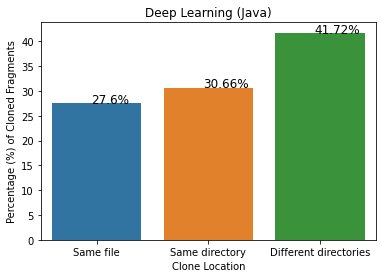

In [37]:
df = pd.DataFrame()
df['percentage'] = pd.Series([27.6, 30.66, 41.72 ])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title("Deep Learning (Java)")
ax.set(xlabel = 'Clone Location', ylabel = 'Percentage (%) of Cloned Fragments')
add_percentage(ax,df.percentage)

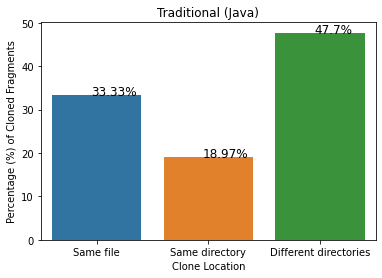

In [38]:
df = pd.DataFrame()
df['percentage'] = pd.Series([33.33,18.97, 47.7])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title('Traditional (Java)')
ax.set(xlabel = 'Clone Location', ylabel = 'Percentage (%) of Cloned Fragments')
add_percentage(ax,df.percentage)

## C#-Function-All-fragment

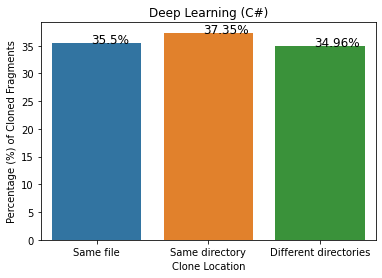

In [39]:
df = pd.DataFrame()
df['percentage'] = pd.Series([35.5, 37.35, 34.96])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title("Deep Learning (C#)")
ax.set(xlabel = 'Clone Location', ylabel = 'Percentage (%) of Cloned Fragments')
add_percentage(ax,df.percentage)

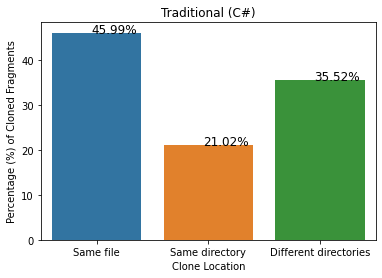

In [40]:
df = pd.DataFrame()
df['percentage'] = pd.Series([45.99,21.02, 35.52])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title('Traditional (C#)')
ax.set(xlabel = 'Clone Location', ylabel = 'Percentage (%) of Cloned Fragments')
add_percentage(ax,df.percentage)

## LOCC

In [108]:
clone_size_proj = all_clones_categorized_size_fct.groupby(['repoName','project_type','language']).agg({'locc':'sum'}).reset_index()

In [109]:
clone_size_proj=clone_size_proj.rename(columns={"locc": "total_locc"})

In [110]:
clone_size_proj.head()

,repoName,project_type,language,total_locc
0,AspectCore-Framework,Traditional,csharp,4484
1,Avalonia,Traditional,csharp,57418
2,CeNiN,Deep Learning,csharp,415
3,ConvNetSharp,Deep Learning,csharp,8705
4,Dapper,Traditional,csharp,1581


In [111]:
all_clones_categorized_size_fct = pd.merge(all_clones_categorized_size_fct,clone_size_proj[['repoName','total_locc']],how='left', on=['repoName'])

In [112]:
all_clones_categorized_size_fct

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128032,okhttp,218,/tmpstore/bimus/b-repositories/trad/java/okhtt...,31,39,NaN,71,Function,java,NaN,Type 3,Traditional,9,1,9,Same directory,10336,37217,12683
128033,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,145,162,NaN,78,Function,java,NaN,Type 3,Traditional,18,1,2,Same directory,10336,37217,12683
128034,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,27,42,NaN,78,Function,java,NaN,Type 3,Traditional,16,1,2,Same directory,10336,37217,12683
128035,okhttp,222,/tmpstore/bimus/b-repositories/trad/java/okhtt...,76,91,NaN,77,Function,java,NaN,Type 3,Traditional,16,0,2,Same file,10336,37217,12683


In [113]:
clone_size_proj_type = all_clones_categorized_size_fct.groupby(['repoName','project_type','clone_type','language']).agg({'locc':'sum'}).reset_index()

In [114]:
clone_size_proj_type=clone_size_proj_type.rename(columns={"locc": "total_locc_typed"})

In [115]:
all_clones_categorized_size_fct = pd.merge(all_clones_categorized_size_fct,clone_size_proj_type[['repoName','clone_type','total_locc_typed']],how='left', on=['repoName','clone_type'])

In [116]:
all_clones_categorized_size_fct

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502,4805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128032,okhttp,218,/tmpstore/bimus/b-repositories/trad/java/okhtt...,31,39,NaN,71,Function,java,NaN,Type 3,Traditional,9,1,9,Same directory,10336,37217,12683,10336
128033,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,145,162,NaN,78,Function,java,NaN,Type 3,Traditional,18,1,2,Same directory,10336,37217,12683,10336
128034,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,27,42,NaN,78,Function,java,NaN,Type 3,Traditional,16,1,2,Same directory,10336,37217,12683,10336
128035,okhttp,222,/tmpstore/bimus/b-repositories/trad/java/okhtt...,76,91,NaN,77,Function,java,NaN,Type 3,Traditional,16,0,2,Same file,10336,37217,12683,10336


In [148]:
all_clones_categorized_size_fct[all_clones_categorized_size_fct['repoName']=='CeNiN']

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
419,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,45,51,8.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438,415,28
420,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,12.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438,415,28
421,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,14.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438,415,28
422,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,42,48,10.0,100,Function,csharp,f,Type 1,Deep Learning,7,1,4,Same directory,28,1438,415,28
20318,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,111,119,NaN,85,Function,csharp,NaN,Type 3,Deep Learning,9,0,2,Same file,387,1438,415,387
20319,CeNiN,1,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,121,129,NaN,85,Function,csharp,NaN,Type 3,Deep Learning,9,0,2,Same file,387,1438,415,387
20320,CeNiN,3,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,53,203,NaN,75,Function,csharp,NaN,Type 3,Deep Learning,151,1,3,Same directory,387,1438,415,387
20321,CeNiN,3,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,50,154,NaN,75,Function,csharp,NaN,Type 3,Deep Learning,105,1,3,Same directory,387,1438,415,387
20322,CeNiN,3,/tmpstore/bimus/repositories/csharp/CeNiN/src/...,50,162,NaN,75,Function,csharp,NaN,Type 3,Deep Learning,113,1,3,Same directory,387,1438,415,387


In [ ]:
def get_category_name(row):
    if row['category']==0:
        return 'Same file'
    elif  row['category']==1:
        return 'Same directory'
    elif row['category']==2:
        return 'Different directories'

In [ ]:
# all_clones_categorized_size_fct['location']= all_clones_categorized_size_fct.apply(get_category_name, axis=1)

In [ ]:
# all_clones_categorized_size_fct.to_csv('data/all_clones_categorized_size_fct.csv', index=False)

In [ ]:
#all_clones_categorized_size.to_csv('data/all_clones_location_taxonomy.csv', index=False)

In [ ]:
# all_clones_categorized_size_fct = all_clones_categorized_size[all_clones_categorized_size['granularity']=='Function']

In [117]:
all_clones_categorized_size_fct.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502,4805


In [118]:
clones_by_loc_fct = all_clones_categorized_size_fct.groupby(['repoName','project_type','language','location','total_locc']).agg({'locc':'sum'}).reset_index()

In [119]:
clones_by_loc_fct['percentage']=(clones_by_loc_fct['locc']/clones_by_loc_fct['total_locc'])*100

In [120]:
clones_by_loc_fct[clones_by_loc_fct['repoName']=='CeNiN']

,repoName,project_type,language,location,total_locc,locc,percentage
6,CeNiN,Deep Learning,csharp,Same directory,415,397,95.662651
7,CeNiN,Deep Learning,csharp,Same file,415,18,4.337349


In [122]:
clones_by_loc_fct.to_csv('data/otherLanguages/cleanClones/clones_by_loc_fct_new.csv')

In [50]:
clones_by_loc_fct_java = clones_by_loc_fct[clones_by_loc_fct['language']=='java']
clones_by_loc_fct_java.head()

,repoName,project_type,language,location,total_locc,locc,percentage
14,DeepDriver,Deep Learning,java,Different directories,15307,6717,43.881884
15,DeepDriver,Deep Learning,java,Same directory,15307,6411,41.882799
16,DeepDriver,Deep Learning,java,Same file,15307,2179,14.235317
31,MPAndroidChart,Traditional,java,Different directories,8143,314,3.856073
32,MPAndroidChart,Traditional,java,Same directory,8143,6573,80.719636


In [51]:
clones_by_loc_fct_csharp = clones_by_loc_fct[clones_by_loc_fct['language']=='csharp']
clones_by_loc_fct_csharp.head()

,repoName,project_type,language,location,total_locc,locc,percentage
0,AspectCore-Framework,Traditional,csharp,Different directories,4484,1625,36.239964
1,AspectCore-Framework,Traditional,csharp,Same directory,4484,784,17.484389
2,AspectCore-Framework,Traditional,csharp,Same file,4484,2075,46.275647
3,Avalonia,Traditional,csharp,Different directories,57418,16768,29.203386
4,Avalonia,Traditional,csharp,Same directory,57418,8350,14.542478


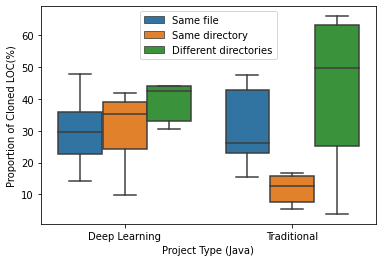

In [57]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=clones_by_loc_fct_java,
                              showfliers=False,hue="location",
                              hue_order= ['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
ml_trad_boxplot.set(xlabel='Project Type (Java)', ylabel='Proportion of Cloned LOC(%)')
#plt.title('Taxonomy by Location and Function granularity for DL and Traditional Code')
fig = plt.figure
plt.savefig('clone_all_types_location_loc_java.pdf')

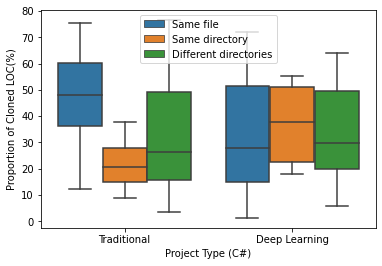

In [58]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=clones_by_loc_fct_csharp,
                              showfliers=False,hue="location",
                              hue_order= ['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
ml_trad_boxplot.set(xlabel='Project Type (C#)', ylabel='Proportion of Cloned LOC(%)')
#plt.title('Taxonomy by Location and Function granularity for DL and Traditional Code')
plt.savefig('clone_all_types_location_loc_csharp.pdf')

In [59]:
same_file_fct=clones_by_loc_fct[clones_by_loc_fct['location']=='Same file']
same_directory_fct = clones_by_loc_fct[clones_by_loc_fct['location']=='Same directory']
different_directories_fct = clones_by_loc_fct[clones_by_loc_fct['location']=='Different directories']

In [60]:
same_file_fct_dl = same_file_fct[same_file_fct['project_type'] == 'Deep Learning']
same_file_fct_trad = same_file_fct[same_file_fct['project_type'] == 'Traditional']

In [61]:
stats.mannwhitneyu(same_file_fct_dl.locc,same_file_fct_trad.locc)

MannwhitneyuResult(statistic=128.0, pvalue=0.026551562279886625)

In [63]:
cliffsDelta(same_file_fct_dl.locc,same_file_fct_trad.locc)

0.36

In [64]:
same_directory_fct_dl = same_directory_fct[same_directory_fct['project_type'] == 'Deep Learning']
same_directory_fct_trad = same_directory_fct[same_directory_fct['project_type'] == 'Traditional']

In [65]:
stats.mannwhitneyu(same_directory_fct_dl.locc,same_directory_fct_trad.locc)

MannwhitneyuResult(statistic=168.0, pvalue=0.3683579249137324)

In [66]:
cliffsDelta(same_directory_fct_dl.locc,same_directory_fct_trad.locc)

0.06666666666666667

In [67]:
different_directories_fct_dl = different_directories_fct[different_directories_fct['project_type'] == 'Deep Learning']
different_directories_fct_trad = different_directories_fct[different_directories_fct['project_type'] == 'Traditional']

In [68]:
stats.mannwhitneyu(different_directories_fct_dl.locc,different_directories_fct_trad.locc)

MannwhitneyuResult(statistic=141.0, pvalue=0.12743602829275824)

In [69]:
cliffsDelta(different_directories_fct_dl.locc,different_directories_fct_trad.locc)

0.2188365650969529

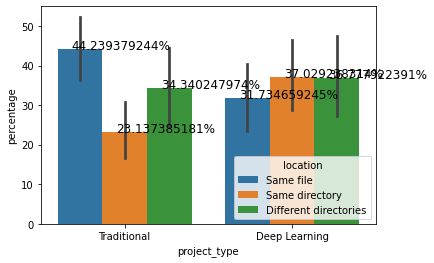

In [70]:
ax= sns.barplot(x='project_type',y='percentage',data=clones_by_loc_fct, hue='location',hue_order= ['Same file', 'Same directory', 'Different directories'])
add_percentage(ax,clones_by_loc_fct.percentage)

In [71]:
dl_clones_by_loc_fct=clones_by_loc_fct[clones_by_loc_fct['project_type']=='Deep Learning']
trad_clones_by_loc_fct=clones_by_loc_fct[clones_by_loc_fct['project_type']=='Traditional']

In [72]:
dl_clones_by_loc_fct.head()

,repoName,project_type,language,location,total_locc,locc,percentage
6,CeNiN,Deep Learning,csharp,Same directory,415,397,95.662651
7,CeNiN,Deep Learning,csharp,Same file,415,18,4.337349
8,ConvNetSharp,Deep Learning,csharp,Different directories,8705,5568,63.963240
9,ConvNetSharp,Deep Learning,csharp,Same directory,8705,1711,19.655370
10,ConvNetSharp,Deep Learning,csharp,Same file,8705,1426,16.381390


In [73]:
dl_sd=dl_clones_by_loc_fct[dl_clones_by_loc_fct['location']=='Same directory'].locc.sum()

In [74]:
dl_sf=dl_clones_by_loc_fct[dl_clones_by_loc_fct['location']=='Same file'].locc.sum()

In [75]:
dl_dd=dl_clones_by_loc_fct[dl_clones_by_loc_fct['location']=='Different directories'].locc.sum()

In [76]:
dl_total=dl_clones_by_loc_fct.locc.sum()

In [77]:
print('same file',dl_sf/dl_total,'same directory',dl_sd/dl_total, 'different directories',dl_dd/dl_total)

same file 0.2667515744311802 same directory 0.38669551807616426 different directories 0.34655290749265555


In [78]:
trad_sd=trad_clones_by_loc_fct[trad_clones_by_loc_fct['location']=='Same directory'].locc.sum()

In [79]:
trad_sf=trad_clones_by_loc_fct[trad_clones_by_loc_fct['location']=='Same file'].locc.sum()

In [80]:
trad_dd=trad_clones_by_loc_fct[trad_clones_by_loc_fct['location']=='Different directories'].locc.sum()

In [81]:
trad_total=trad_clones_by_loc_fct.locc.sum()

In [82]:
print('same file',trad_sf/trad_total,'same directory',trad_sd/dl_total, 'different directories',trad_dd/trad_total)

same file 0.42113567101085825 same directory 0.34679413361055195 different directories 0.34608415561985206


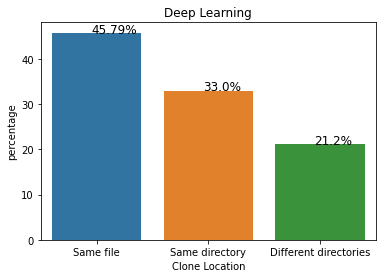

In [83]:
df = pd.DataFrame()
df['percentage'] = pd.Series([45.79, 33, 21.2 ])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title("Deep Learning")
add_percentage(ax,df.percentage)

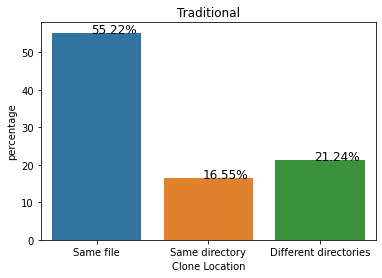

In [84]:
df = pd.DataFrame()
df['percentage'] = pd.Series([55.22, 16.55, 21.24 ])
df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title('Traditional')
add_percentage(ax,df.percentage)

## By Clone type

In [85]:
all_clones_categorized_size_fct

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502,4805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128032,okhttp,218,/tmpstore/bimus/b-repositories/trad/java/okhtt...,31,39,NaN,71,Function,java,NaN,Type 3,Traditional,9,1,9,Same directory,10336,37217,12683,10336
128033,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,145,162,NaN,78,Function,java,NaN,Type 3,Traditional,18,1,2,Same directory,10336,37217,12683,10336
128034,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,27,42,NaN,78,Function,java,NaN,Type 3,Traditional,16,1,2,Same directory,10336,37217,12683,10336
128035,okhttp,222,/tmpstore/bimus/b-repositories/trad/java/okhtt...,76,91,NaN,77,Function,java,NaN,Type 3,Traditional,16,0,2,Same file,10336,37217,12683,10336


In [86]:
clones_by_loc_fct_cloneType = all_clones_categorized_size_fct.groupby(['repoName','project_type','language','location','clone_type','total_locc']).agg({'locc':'sum'}).reset_index()

In [87]:
clones_by_loc_fct_cloneType

,repoName,project_type,language,location,clone_type,total_locc,locc
0,AspectCore-Framework,Traditional,csharp,Different directories,Type 1,4484,98
1,AspectCore-Framework,Traditional,csharp,Different directories,Type 2,4484,180
2,AspectCore-Framework,Traditional,csharp,Different directories,Type 3,4484,1347
3,AspectCore-Framework,Traditional,csharp,Same directory,Type 1,4484,36
4,AspectCore-Framework,Traditional,csharp,Same directory,Type 2,4484,134
...,...,...,...,...,...,...,...
298,spring-framework,Traditional,java,Same directory,Type 2,197660,4751
299,spring-framework,Traditional,java,Same directory,Type 3,197660,17058
300,spring-framework,Traditional,java,Same file,Type 1,197660,1081
301,spring-framework,Traditional,java,Same file,Type 2,197660,17251


In [88]:
clones_by_loc_fct_cloneType_test = clones_by_loc_fct_cloneType[clones_by_loc_fct_cloneType['repoName']=='CeNiN']

In [89]:
clones_by_loc_fct_cloneType_test.head()

,repoName,project_type,language,location,clone_type,total_locc,locc
17,CeNiN,Deep Learning,csharp,Same directory,Type 1,415,28
18,CeNiN,Deep Learning,csharp,Same directory,Type 3,415,369
19,CeNiN,Deep Learning,csharp,Same file,Type 3,415,18


In [90]:
clone_size_proj_per_location = clones_by_loc_fct_cloneType.groupby(['repoName','project_type','location']).agg({'locc':'sum'}).reset_index()

In [91]:
clone_size_proj_per_location=clone_size_proj_per_location.rename(columns={"locc": "total_locc_per_location"})

In [92]:
clone_size_proj_per_location

,repoName,project_type,location,total_locc_per_location
0,AspectCore-Framework,Traditional,Different directories,1625
1,AspectCore-Framework,Traditional,Same directory,784
2,AspectCore-Framework,Traditional,Same file,2075
3,Avalonia,Traditional,Different directories,16768
4,Avalonia,Traditional,Same directory,8350
...,...,...,...,...
111,shadowsocks-windows,Traditional,Same directory,185
112,shadowsocks-windows,Traditional,Same file,511
113,spring-framework,Traditional,Different directories,78898
114,spring-framework,Traditional,Same directory,24971


In [93]:
all_clones_by_loc_fct_cloneType = pd.merge(clones_by_loc_fct_cloneType,clone_size_proj_per_location[['repoName','location','project_type','total_locc_per_location']],how='left', on=['repoName','location','project_type'])

In [94]:
all_clones_by_loc_fct_cloneType['percentage']=(all_clones_by_loc_fct_cloneType['locc']/all_clones_by_loc_fct_cloneType['total_locc_per_location'])*100

In [95]:
all_clones_by_loc_fct_cloneType_test= all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['repoName']=='CeNiN']
all_clones_by_loc_fct_cloneType_test.head()

,repoName,project_type,language,location,clone_type,total_locc,locc,total_locc_per_location,percentage
17,CeNiN,Deep Learning,csharp,Same directory,Type 1,415,28,397,7.052897
18,CeNiN,Deep Learning,csharp,Same directory,Type 3,415,369,397,92.947103
19,CeNiN,Deep Learning,csharp,Same file,Type 3,415,18,18,100.000000


In [96]:
same_file=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['location']=='Same file']
same_directory=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['location']=='Same directory']
different_directories=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['location']=='Different directories']

Text(0.5, 1.0, ' (A) Same File ')

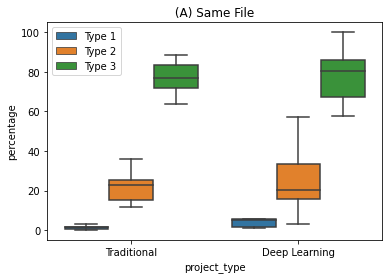

In [97]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=same_file, 
                              showfliers=False, hue='clone_type', hue_order=['Type 1', 'Type 2', 'Type 3'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best')
plt.title(' (A) Same File ')

Text(0.5, 1.0, ' (B) Same Directory ')

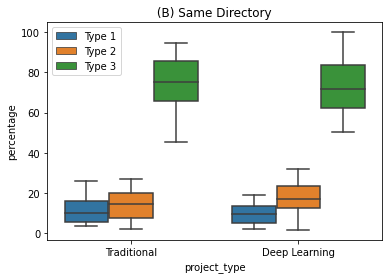

In [98]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", 
                              data=same_directory, showfliers=False, hue='clone_type', hue_order=['Type 1', 'Type 2', 'Type 3'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best')
plt.title(' (B) Same Directory ')

Text(0.5, 1.0, ' (C) Different Directories ')

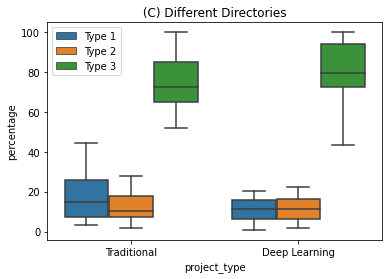

In [99]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=different_directories, 
                              showfliers=False, hue='clone_type', hue_order=['Type 1', 'Type 2', 'Type 3'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best')
plt.title(' (C) Different Directories ')

### By Clone Type 

In [100]:
Type1=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['clone_type']=='Type 1']
Type2=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['clone_type']=='Type 2']
Type3=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['clone_type']=='Type 3']

Text(0.5, 1.0, ' (A) Type 1 ')

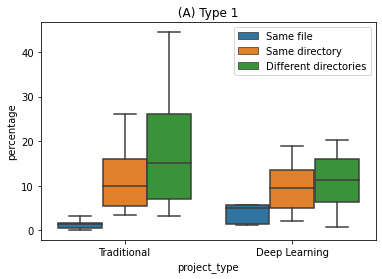

In [101]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type1, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best')
plt.title(' (A) Type 1 ')

Text(0.5, 1.0, ' (B) Type 2 ')

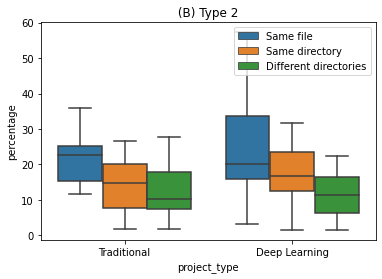

In [102]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type2, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper right')
plt.title(' (B) Type 2 ')

Text(0.5, 1.0, ' (C) Type 3 ')

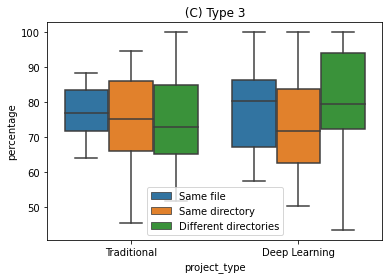

In [103]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type3, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='lower center')
plt.title(' (C) Type 3 ')

In [104]:
Type3

,repoName,project_type,language,location,clone_type,total_locc,locc,total_locc_per_location,percentage
2,AspectCore-Framework,Traditional,csharp,Different directories,Type 3,4484,1347,1625,82.892308
5,AspectCore-Framework,Traditional,csharp,Same directory,Type 3,4484,614,784,78.316327
7,AspectCore-Framework,Traditional,csharp,Same file,Type 3,4484,1450,2075,69.879518
10,Avalonia,Traditional,csharp,Different directories,Type 3,57418,14568,16768,86.879771
13,Avalonia,Traditional,csharp,Same directory,Type 3,57418,6097,8350,73.017964
...,...,...,...,...,...,...,...,...,...
291,shadowsocks-windows,Traditional,csharp,Same directory,Type 3,696,171,185,92.432432
293,shadowsocks-windows,Traditional,csharp,Same file,Type 3,696,399,511,78.082192
296,spring-framework,Traditional,java,Different directories,Type 3,197660,53262,78898,67.507415
299,spring-framework,Traditional,java,Same directory,Type 3,197660,17058,24971,68.311241


## Statistical Analysis

In [105]:
all_clones_by_loc_fct_cloneType_java=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['language']=='java']
all_clones_by_loc_fct_cloneType_csharp=all_clones_by_loc_fct_cloneType[all_clones_by_loc_fct_cloneType['language']=='csharp']

In [106]:
all_clones_by_loc_fct_cloneType_java.head()

,repoName,project_type,language,location,clone_type,total_locc,locc,total_locc_per_location,percentage
35,DeepDriver,Deep Learning,java,Different directories,Type 1,15307,1358,6717,20.217359
36,DeepDriver,Deep Learning,java,Different directories,Type 2,15307,739,6717,11.001935
37,DeepDriver,Deep Learning,java,Different directories,Type 3,15307,4620,6717,68.780706
38,DeepDriver,Deep Learning,java,Same directory,Type 1,15307,2152,6411,33.567306
39,DeepDriver,Deep Learning,java,Same directory,Type 2,15307,422,6411,6.582436


In [107]:
all_clones_by_loc_fct_cloneType_csharp.head()

,repoName,project_type,language,location,clone_type,total_locc,locc,total_locc_per_location,percentage
0,AspectCore-Framework,Traditional,csharp,Different directories,Type 1,4484,98,1625,6.030769
1,AspectCore-Framework,Traditional,csharp,Different directories,Type 2,4484,180,1625,11.076923
2,AspectCore-Framework,Traditional,csharp,Different directories,Type 3,4484,1347,1625,82.892308
3,AspectCore-Framework,Traditional,csharp,Same directory,Type 1,4484,36,784,4.591837
4,AspectCore-Framework,Traditional,csharp,Same directory,Type 2,4484,134,784,17.091837


## Java

In [108]:
# for Java
DL = all_clones_by_loc_fct_cloneType_java[all_clones_by_loc_fct_cloneType_java['project_type']=='Deep Learning']
Trad = all_clones_by_loc_fct_cloneType_java[all_clones_by_loc_fct_cloneType_java['project_type']=='Traditional']

In [109]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

In [110]:
stats.mannwhitneyu(DL_SF.percentage,DL_SD.percentage)

MannwhitneyuResult(statistic=118.0, pvalue=0.2754010062914416)

In [111]:
cliffsDelta(DL_SF.percentage,DL_SD.percentage)

0.1259259259259259

In [112]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_SD.percentage)

MannwhitneyuResult(statistic=135.0, pvalue=0.37828360064725575)

In [113]:
cliffsDelta(Trad_SF.percentage,Trad_SD.percentage)

0.0657439446366782

In [114]:
stats.mannwhitneyu(DL_SF.percentage,DL_DD.percentage)

MannwhitneyuResult(statistic=108.0, pvalue=0.16900376721653226)

In [115]:
cliffsDelta(DL_SF.percentage,DL_DD.percentage)

0.2

In [116]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_DD.percentage)

MannwhitneyuResult(statistic=119.0, pvalue=0.27613518262771486)

In [117]:
cliffsDelta(Trad_SF.percentage,Trad_DD.percentage)

0.125

In [118]:
stats.mannwhitneyu(DL_SD.percentage,DL_DD.percentage)

MannwhitneyuResult(statistic=143.0, pvalue=0.2791682687540892)

In [119]:
cliffsDelta(DL_SD.percentage,DL_DD.percentage)

0.11728395061728394

In [120]:
stats.mannwhitneyu(Trad_SD.percentage,Trad_DD.percentage)

MannwhitneyuResult(statistic=124.0, pvalue=0.33934480276090123)

In [121]:
cliffsDelta(Trad_SD.percentage,Trad_DD.percentage)

0.08823529411764706

## C#

In [122]:
DL = all_clones_by_loc_fct_cloneType_csharp[all_clones_by_loc_fct_cloneType_csharp['project_type']=='Deep Learning']
Trad = all_clones_by_loc_fct_cloneType_csharp[all_clones_by_loc_fct_cloneType_csharp['project_type']=='Traditional']

In [123]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

In [124]:
stats.mannwhitneyu(DL_SF.percentage,DL_SD.percentage)

MannwhitneyuResult(statistic=346.0, pvalue=0.06628442286528934)

In [125]:
cliffsDelta(DL_SF.percentage,DL_SD.percentage)

0.22767857142857142

In [126]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_SD.percentage)

MannwhitneyuResult(statistic=589.0, pvalue=0.12629276687875718)

In [127]:
cliffsDelta(Trad_SF.percentage,Trad_SD.percentage)

0.15494978479196556

In [128]:
stats.mannwhitneyu(DL_SF.percentage,DL_DD.percentage)

MannwhitneyuResult(statistic=369.0, pvalue=0.21595462430370332)

In [129]:
cliffsDelta(DL_SF.percentage,DL_DD.percentage)

0.12142857142857143

In [130]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_DD.percentage)

MannwhitneyuResult(statistic=543.0, pvalue=0.16252708127767995)

In [131]:
cliffsDelta(Trad_SF.percentage,Trad_DD.percentage)

0.13672496025437203

In [132]:
stats.mannwhitneyu(DL_SD.percentage,DL_DD.percentage)

MannwhitneyuResult(statistic=437.0, pvalue=0.2746927871282572)

In [133]:
cliffsDelta(DL_SD.percentage,DL_DD.percentage)

0.08958333333333333

In [134]:
stats.mannwhitneyu(Trad_SD.percentage,Trad_DD.percentage)

MannwhitneyuResult(statistic=737.0, pvalue=0.4167801751528721)

In [135]:
cliffsDelta(Trad_SD.percentage,Trad_DD.percentage)

0.028345418589321027

### By Clone Types

## Java

In [136]:
DL = all_clones_by_loc_fct_cloneType_java[all_clones_by_loc_fct_cloneType_java['project_type']=='Deep Learning']
Trad = all_clones_by_loc_fct_cloneType_java[all_clones_by_loc_fct_cloneType_java['project_type']=='Traditional']

In [137]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

In [138]:
DL_SF_1 = DL_SF[DL_SF['clone_type']=='Type 1']
DL_SF_2 = DL_SF[DL_SF['clone_type']=='Type 2']
DL_SF_3 = DL_SF[DL_SF['clone_type']=='Type 3']

DL_SD_1 = DL_SD[DL_SD['clone_type']=='Type 1']
DL_SD_2 = DL_SD[DL_SD['clone_type']=='Type 2']
DL_SD_3 = DL_SD[DL_SD['clone_type']=='Type 3']

DL_DD_1 = DL_DD[DL_DD['clone_type']=='Type 1']
DL_DD_2 = DL_DD[DL_DD['clone_type']=='Type 2']
DL_DD_3 = DL_DD[DL_DD['clone_type']=='Type 3']

Trad_SF_1 = Trad_SF[Trad_SF['clone_type']=='Type 1']
Trad_SF_2 = Trad_SF[Trad_SF['clone_type']=='Type 2']
Trad_SF_3 = Trad_SF[Trad_SF['clone_type']=='Type 3']

Trad_SD_1 = Trad_SD[Trad_SD['clone_type']=='Type 1']
Trad_SD_2 = Trad_SD[Trad_SD['clone_type']=='Type 2']
Trad_SD_3 = Trad_SD[Trad_SD['clone_type']=='Type 3']

Trad_DD_1 = Trad_DD[Trad_DD['clone_type']=='Type 1']
Trad_DD_2 = Trad_DD[Trad_DD['clone_type']=='Type 2']
Trad_DD_3 = Trad_DD[Trad_DD['clone_type']=='Type 3']

In [139]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_SD_1.percentage)

MannwhitneyuResult(statistic=3.0, pvalue=0.07779017389609892)

In [140]:
cliffsDelta(DL_SF_1.percentage,DL_SD_1.percentage)

0.6666666666666666

In [141]:
stats.mannwhitneyu(Trad_SF_1.percentage,Trad_SD_1.percentage)

MannwhitneyuResult(statistic=0.0, pvalue=0.00405655863278289)

In [142]:
cliffsDelta(Trad_SF_1.percentage,Trad_SD_1.percentage)

1.0

In [143]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_DD_1.percentage)

MannwhitneyuResult(statistic=5.0, pvalue=0.1830782800970302)

In [144]:
cliffsDelta(DL_SF_1.percentage,DL_DD_1.percentage)

0.4444444444444444

In [145]:
stats.mannwhitneyu(DL_SD_1.percentage,DL_DD_1.percentage)

MannwhitneyuResult(statistic=13.0, pvalue=0.23558499924502785)

In [146]:
cliffsDelta(DL_SD_1.percentage,DL_DD_1.percentage)

0.2777777777777778

In [147]:
stats.mannwhitneyu(Trad_SD_3.percentage,Trad_DD_3.percentage)

MannwhitneyuResult(statistic=12.0, pvalue=0.32403843406957306)

In [148]:
cliffsDelta(Trad_SD_3.percentage,Trad_DD_3.percentage)

0.2

In [149]:
stats.mannwhitneyu(DL_SF_3.percentage,DL_DD_3.percentage)

MannwhitneyuResult(statistic=16.0, pvalue=0.40509061820523684)

In [150]:
cliffsDelta(DL_SF_3.percentage,DL_DD_3.percentage)

0.1111111111111111

## C# 

In [151]:
DL = all_clones_by_loc_fct_cloneType_csharp[all_clones_by_loc_fct_cloneType_csharp['project_type']=='Deep Learning']
Trad = all_clones_by_loc_fct_cloneType_csharp[all_clones_by_loc_fct_cloneType_csharp['project_type']=='Traditional']

In [152]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

In [153]:
DL_SF_1 = DL_SF[DL_SF['clone_type']=='Type 1']
DL_SF_2 = DL_SF[DL_SF['clone_type']=='Type 2']
DL_SF_3 = DL_SF[DL_SF['clone_type']=='Type 3']

DL_SD_1 = DL_SD[DL_SD['clone_type']=='Type 1']
DL_SD_2 = DL_SD[DL_SD['clone_type']=='Type 2']
DL_SD_3 = DL_SD[DL_SD['clone_type']=='Type 3']

DL_DD_1 = DL_DD[DL_DD['clone_type']=='Type 1']
DL_DD_2 = DL_DD[DL_DD['clone_type']=='Type 2']
DL_DD_3 = DL_DD[DL_DD['clone_type']=='Type 3']

Trad_SF_1 = Trad_SF[Trad_SF['clone_type']=='Type 1']
Trad_SF_2 = Trad_SF[Trad_SF['clone_type']=='Type 2']
Trad_SF_3 = Trad_SF[Trad_SF['clone_type']=='Type 3']

Trad_SD_1 = Trad_SD[Trad_SD['clone_type']=='Type 1']
Trad_SD_2 = Trad_SD[Trad_SD['clone_type']=='Type 2']
Trad_SD_3 = Trad_SD[Trad_SD['clone_type']=='Type 3']

Trad_DD_1 = Trad_DD[Trad_DD['clone_type']=='Type 1']
Trad_DD_2 = Trad_DD[Trad_DD['clone_type']=='Type 2']
Trad_DD_3 = Trad_DD[Trad_DD['clone_type']=='Type 3']

In [154]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_SD_1.percentage)

MannwhitneyuResult(statistic=4.0, pvalue=0.11868430253878076)

In [155]:
cliffsDelta(DL_SF_1.percentage,DL_SD_1.percentage)

0.6

In [156]:
stats.mannwhitneyu(Trad_SF_1.percentage,Trad_SD_1.percentage)

MannwhitneyuResult(statistic=6.0, pvalue=0.002182949198472291)

In [157]:
cliffsDelta(Trad_SF_1.percentage,Trad_SD_1.percentage)

0.8461538461538461

In [158]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_DD_1.percentage)

MannwhitneyuResult(statistic=3.0, pvalue=0.09742532430443474)

In [159]:
cliffsDelta(DL_SF_1.percentage,DL_DD_1.percentage)

0.6666666666666666

In [160]:
stats.mannwhitneyu(DL_SD_1.percentage,DL_DD_1.percentage)

MannwhitneyuResult(statistic=31.0, pvalue=0.13517207032739004)

In [161]:
cliffsDelta(DL_SD_1.percentage,DL_DD_1.percentage)

0.3111111111111111

In [162]:
stats.mannwhitneyu(Trad_SD_3.percentage,Trad_DD_3.percentage)

MannwhitneyuResult(statistic=89.0, pvalue=0.4709869175716267)

In [163]:
cliffsDelta(Trad_SD_3.percentage,Trad_DD_3.percentage)

0.02197802197802198

In [164]:
stats.mannwhitneyu(DL_SF_3.percentage,DL_DD_3.percentage)

MannwhitneyuResult(statistic=81.0, pvalue=0.32214690103326116)

In [165]:
cliffsDelta(DL_SF_3.percentage,DL_DD_3.percentage)

0.10989010989010989

# The results starts here

### By Clone Type as a first filter

In [166]:
# clones = pd.read_csv('data/all_clones_categorized_size_fct.csv')

In [167]:
# clones = all_clones_by_loc_fct_cloneType_java.dropna()

## Java

In [123]:
clones = all_clones_categorized_size_fct[all_clones_categorized_size_fct['language']=='java']

In [124]:
Type1 = clones[clones['clone_type']=='Type 1']
Type2 = clones[clones['clone_type']=='Type 2']
Type3 = clones[clones['clone_type']=='Type 3']

In [125]:
Type1.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
4470,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,319,328,201.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4471,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,296,304,6292.0,100,Function,java,f,Type 1,Deep Learning,9,2,3,Different directories,7613,43902,80359,7613
4472,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,219,228,6331.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4473,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,330,339,202.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4474,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,231,240,6332.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613


In [126]:
Type1_size = Type1.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [127]:
Type1_size=Type1_size.rename(columns={"locc": "total_locc_Type1"})

In [128]:
Type1_size.head()

,repoName,project_type,clone_type,total_locc_Type1
0,DeepDriver,Deep Learning,Type 1,3510
1,MPAndroidChart,Traditional,Type 1,390
2,SANNet,Deep Learning,Type 1,319
3,deeplearning4j,Deep Learning,Type 1,14017
4,djl,Deep Learning,Type 1,1002


In [129]:
Type1_locc = pd.merge(Type1,Type1_size[['repoName','total_locc_Type1']],how='left', on=['repoName'])

In [130]:
Type1_percentage = Type1_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type1']).agg({'locc':'sum'}).reset_index()

In [131]:
Type1_percentage['percentage']=(Type1_percentage['locc']/Type1_percentage['total_locc_Type1'])*100

In [348]:
Type1_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type1,locc,percentage
0,DeepDriver,Deep Learning,Type 1,Different directories,3510,1358,38.689459
1,DeepDriver,Deep Learning,Type 1,Same directory,3510,2152,61.310541
2,MPAndroidChart,Traditional,Type 1,Same directory,390,390,100.000000
3,SANNet,Deep Learning,Type 1,Different directories,319,16,5.015674
4,SANNet,Deep Learning,Type 1,Same directory,319,303,94.984326


In [133]:
Type1_percentage.to_csv('data/otherLanguages/cleanClones/Type1_percentage_java.csv')

Text(0.5, 1.0, ' (A) Type 1 ')

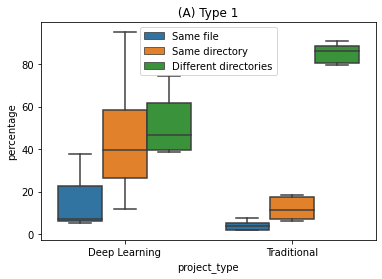

In [349]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type1_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
plt.title(' (A) Type 1 ')

##### Type2

In [135]:
Type2_size = Type2.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [136]:
Type2_size=Type2_size.rename(columns={"locc": "total_locc_Type2"})

In [137]:
Type2_locc = pd.merge(Type2,Type2_size[['repoName','total_locc_Type2']],how='left', on=['repoName'])

In [138]:
Type2_percentage = Type2_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type2']).agg({'locc':'sum'}).reset_index()

In [139]:
Type2_percentage['percentage']=(Type2_percentage['locc']/Type2_percentage['total_locc_Type2'])*100

In [140]:
Type2_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type2,locc,percentage
0,DeepDriver,Deep Learning,Type 2,Different directories,1630,739,45.337423
1,DeepDriver,Deep Learning,Type 2,Same directory,1630,422,25.889571
2,DeepDriver,Deep Learning,Type 2,Same file,1630,469,28.773006
3,MPAndroidChart,Traditional,Type 2,Same directory,818,502,61.369193
4,MPAndroidChart,Traditional,Type 2,Same file,818,316,38.630807


In [141]:
Type2_percentage.to_csv('data/otherLanguages/cleanClones/Type2_percentage_java.csv')

Text(0.5, 1.0, ' (B) Type 2 ')

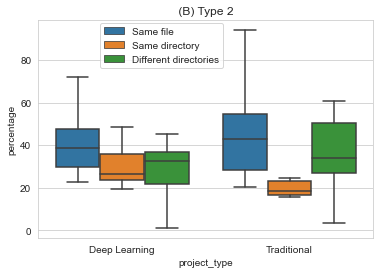

In [142]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type2_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.17, 0.51, 0.5, 0.5))
plt.title(' (B) Type 2 ')

##### Type 3

In [143]:
Type3_size = Type3.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [144]:
Type3_size=Type3_size.rename(columns={"locc": "total_locc_Type3"})

In [145]:
Type3_locc = pd.merge(Type3,Type3_size[['repoName','total_locc_Type3']],how='left', on=['repoName'])

In [146]:
Type3_percentage = Type3_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type3']).agg({'locc':'sum'}).reset_index()

In [147]:
Type3_percentage['percentage']=(Type3_percentage['locc']/Type3_percentage['total_locc_Type3'])*100

In [148]:
Type3_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type3,locc,percentage
0,DeepDriver,Deep Learning,Type 3,Different directories,10167,4620,45.441133
1,DeepDriver,Deep Learning,Type 3,Same directory,10167,3837,37.739746
2,DeepDriver,Deep Learning,Type 3,Same file,10167,1710,16.819121
3,MPAndroidChart,Traditional,Type 3,Different directories,6935,314,4.527758
4,MPAndroidChart,Traditional,Type 3,Same directory,6935,5681,81.917808


In [149]:
Type3_percentage.to_csv('data/otherLanguages/cleanClones/Type3_percentage_java.csv')

Text(0.5, 1.0, ' (C) Type 3 ')

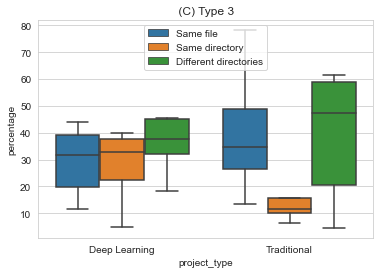

In [150]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type3_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
plt.title(' (C) Type 3 ')

### Statsistical significance

In [364]:
DL_1 = Type1_percentage[Type1_percentage['project_type']=='Deep Learning']
DL_2 = Type2_percentage[Type2_percentage['project_type']=='Deep Learning']
DL_3 = Type3_percentage[Type3_percentage['project_type']=='Deep Learning']

Trad_1 = Type1_percentage[Type1_percentage['project_type']=='Traditional']
Trad_2 = Type2_percentage[Type2_percentage['project_type']=='Traditional']
Trad_3 = Type3_percentage[Type3_percentage['project_type']=='Traditional']

In [365]:
DL_SF_1 = DL_1[DL_1['location']=='Same file']
DL_SD_1 = DL_1[DL_1['location']=='Same directory']
DL_DD_1 = DL_1[DL_1['location']=='Different directories']

DL_SF_2 = DL_2[DL_2['location']=='Same file']
DL_SD_2 = DL_2[DL_2['location']=='Same directory']
DL_DD_2 = DL_2[DL_2['location']=='Different directories']

DL_SF_3 = DL_3[DL_3['location']=='Same file']
DL_SD_3 = DL_3[DL_3['location']=='Same directory']
DL_DD_3 = DL_3[DL_3['location']=='Different directories']

Trad_SF_1 = Trad_1[Trad_1['location']=='Same file']
Trad_SD_1 = Trad_1[Trad_1['location']=='Same directory']
Trad_DD_1 = Trad_1[Trad_1['location']=='Different directories']

Trad_SF_2 = Trad_2[Trad_2['location']=='Same file']
Trad_SD_2 = Trad_2[Trad_2['location']=='Same directory']
Trad_DD_2 = Trad_2[Trad_2['location']=='Different directories']

Trad_SF_3 = Trad_3[Trad_3['location']=='Same file']
Trad_SD_3 = Trad_3[Trad_3['location']=='Same directory']
Trad_DD_3 = Trad_3[Trad_3['location']=='Different directories']

### Type 1

### DL

In [366]:
stats.mannwhitneyu(DL_SF_1.percentage, DL_SD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=3.0, pvalue=0.15558034779219784)

In [367]:
cliffsDelta(DL_SF_1.percentage, DL_SD_1.percentage)

0.6666666666666666

In [368]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_DD_1.percentage, alternative='two-sided' )

MannwhitneyuResult(statistic=3.0, pvalue=0.15558034779219784)

In [369]:
cliffsDelta(DL_SF_1.percentage,DL_DD_1.percentage)

0.6666666666666666

In [370]:
stats.mannwhitneyu(DL_SD_1.percentage,DL_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=16.0, pvalue=0.8101812364104737)

In [371]:
cliffsDelta(DL_SD_1.percentage,DL_DD_1.percentage)

0.1111111111111111

### TRAD

In [372]:
stats.mannwhitneyu(Trad_SF_1.percentage, Trad_SD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=2.0, pvalue=0.022478873366125265)

In [373]:
cliffsDelta(Trad_SF_1.percentage, Trad_SD_1.percentage)

0.8666666666666667

In [374]:
stats.mannwhitneyu(Trad_SF_1.percentage,Trad_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=0.012185780355344813)

In [375]:
cliffsDelta(Trad_SF_1.percentage,Trad_DD_1.percentage)

1.0

In [376]:
stats.mannwhitneyu(Trad_SD_1.percentage,Trad_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=5.0, pvalue=0.0828374251588063)

In [377]:
cliffsDelta(Trad_SD_1.percentage,Trad_DD_1.percentage)

0.6666666666666666

### Type 2

### DL

In [378]:
stats.mannwhitneyu(DL_SF_2.percentage, DL_SD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=26.0, pvalue=0.22976627046113807)

In [379]:
cliffsDelta(DL_SF_2.percentage, DL_SD_2.percentage)

0.4444444444444444

In [380]:
stats.mannwhitneyu(DL_SF_2.percentage,DL_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=24.0, pvalue=0.3784775932446789)

In [381]:
cliffsDelta(DL_SF_2.percentage,DL_DD_2.percentage)

0.3333333333333333

In [382]:
stats.mannwhitneyu(DL_SD_2.percentage,DL_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=19.0, pvalue=0.9361862934730594)

In [383]:
cliffsDelta(DL_SD_2.percentage,DL_DD_2.percentage)

0.05555555555555555

### TRAD

In [384]:
stats.mannwhitneyu(Trad_SF_2.percentage, Trad_SD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=30.0, pvalue=0.06555216116550257)

In [385]:
cliffsDelta(Trad_SF_2.percentage, Trad_SD_2.percentage)

0.6666666666666666

In [386]:
stats.mannwhitneyu(Trad_SF_2.percentage,Trad_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=17.0, pvalue=0.7841912294016191)

In [387]:
cliffsDelta(Trad_SF_2.percentage,Trad_DD_2.percentage)

0.13333333333333333

In [388]:
stats.mannwhitneyu(Trad_SD_2.percentage,Trad_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=9.0, pvalue=0.31530245208174557)

In [389]:
cliffsDelta(Trad_SD_2.percentage,Trad_DD_2.percentage)

0.4

### Type 3

### DL

In [390]:
stats.mannwhitneyu(DL_SF_3.percentage, DL_SD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=20.0, pvalue=0.8101812364104737)

In [391]:
cliffsDelta(DL_SF_3.percentage, DL_SD_3.percentage)

0.1111111111111111

In [392]:
stats.mannwhitneyu(DL_SF_3.percentage,DL_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=11.0, pvalue=0.2979530616081678)

In [393]:
cliffsDelta(DL_SF_3.percentage,DL_DD_3.percentage)

0.3888888888888889

In [394]:
stats.mannwhitneyu(DL_SD_3.percentage,DL_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=11.0, pvalue=0.2979530616081678)

In [395]:
cliffsDelta(DL_SD_3.percentage,DL_DD_3.percentage)

0.3888888888888889

### TRAD

In [396]:
stats.mannwhitneyu(Trad_SF_3.percentage, Trad_SD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=23.0, pvalue=0.17090352023079747)

In [397]:
cliffsDelta(Trad_SF_3.percentage, Trad_SD_3.percentage)

0.5333333333333333

In [398]:
stats.mannwhitneyu(Trad_SF_3.percentage,Trad_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=17.0, pvalue=0.9361862934730594)

In [399]:
cliffsDelta(Trad_SF_3.percentage,Trad_DD_3.percentage)

0.05555555555555555

In [400]:
stats.mannwhitneyu(Trad_SD_3.percentage,Trad_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=11.0, pvalue=0.5228166539190886)

In [401]:
cliffsDelta(Trad_SD_3.percentage,Trad_DD_3.percentage)

0.26666666666666666

## ALL -Types

In [402]:
clones

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
4470,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,319,328,201.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4471,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,296,304,6292.0,100,Function,java,f,Type 1,Deep Learning,9,2,3,Different directories,7613,43902,80359,7613
4472,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,219,228,6331.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4473,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,330,339,202.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
4474,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,231,240,6332.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359,7613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128032,okhttp,218,/tmpstore/bimus/b-repositories/trad/java/okhtt...,31,39,NaN,71,Function,java,NaN,Type 3,Traditional,9,1,9,Same directory,10336,37217,12683,10336
128033,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,145,162,NaN,78,Function,java,NaN,Type 3,Traditional,18,1,2,Same directory,10336,37217,12683,10336
128034,okhttp,219,/tmpstore/bimus/b-repositories/trad/java/okhtt...,27,42,NaN,78,Function,java,NaN,Type 3,Traditional,16,1,2,Same directory,10336,37217,12683,10336
128035,okhttp,222,/tmpstore/bimus/b-repositories/trad/java/okhtt...,76,91,NaN,77,Function,java,NaN,Type 3,Traditional,16,0,2,Same file,10336,37217,12683,10336


In [403]:
clones_by_proj_loc = clones.groupby(['repoName','project_type','location']).agg({'locc':'sum'}).reset_index()

In [404]:
clones_by_proj_loc_size=clones_by_proj_loc.groupby(['repoName','project_type']).agg({'locc':'sum'}).reset_index()

In [405]:
clones_by_proj_loc_size=clones_by_proj_loc_size.rename(columns={"locc": "total_locc"})

In [406]:
clones_location = pd.merge(clones_by_proj_loc,clones_by_proj_loc_size[['repoName','total_locc']],how='left', on=['repoName'])

In [407]:
clones_location['percentage']=(clones_location['locc']/clones_location['total_locc'])*100

In [424]:
clones_location.head()

,repoName,project_type,location,locc,total_locc,percentage
0,DeepDriver,Deep Learning,Different directories,6717,15307,43.881884
1,DeepDriver,Deep Learning,Same directory,6411,15307,41.882799
2,DeepDriver,Deep Learning,Same file,2179,15307,14.235317
3,MPAndroidChart,Traditional,Different directories,314,8143,3.856073
4,MPAndroidChart,Traditional,Same directory,6573,8143,80.719636


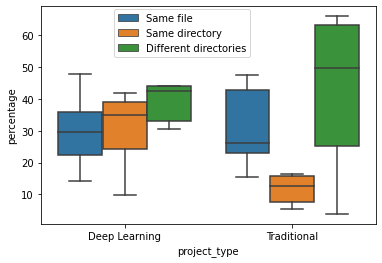

In [409]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=clones_location, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.14, 0.51, 0.5, 0.5))
#plt.title(' (C) Type 3 ')

In [410]:
DL = clones_location[clones_location['project_type']=='Deep Learning']
Trad = clones_location[clones_location['project_type']=='Traditional']

In [411]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

### DL

In [412]:
stats.mannwhitneyu(DL_SF.percentage,DL_SD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=17.0, pvalue=0.9361862934730594)

In [413]:
cliffsDelta(DL_SF.percentage,DL_SD.percentage)

0.05555555555555555

In [414]:
stats.mannwhitneyu(DL_SF.percentage,DL_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=12.0, pvalue=0.3784775932446789)

In [415]:
cliffsDelta(DL_SF.percentage,DL_DD.percentage)

0.3333333333333333

In [416]:
stats.mannwhitneyu(DL_SD.percentage,DL_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=10.0, pvalue=0.22976627046113807)

In [417]:
cliffsDelta(DL_SD.percentage,DL_DD.percentage)

0.4444444444444444

### TRAD

In [418]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_SD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=29.0, pvalue=0.09269580255781257)

In [419]:
cliffsDelta(Trad_SF.percentage,Trad_SD.percentage)

0.6111111111111112

In [420]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=16.0, pvalue=0.8101812364104737)

In [421]:
cliffsDelta(Trad_SF.percentage,Trad_DD.percentage)

0.1111111111111111

In [422]:
stats.mannwhitneyu(Trad_SD.percentage,Trad_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=11.0, pvalue=0.2979530616081678)

In [423]:
cliffsDelta(Trad_SD.percentage,Trad_DD.percentage)

0.3888888888888889

## Summary % of cloned loc in different locations (DL vs Trad)

In [425]:
trad_sf=Trad_SF.locc.sum()
trad_sd=Trad_SD.locc.sum()
trad_dd=Trad_DD.locc.sum()
trad_total=Trad.locc.sum()

dl_sf=DL_SF.locc.sum()
dl_sd=DL_SD.locc.sum()
dl_dd=DL_DD.locc.sum()
dl_total=DL.locc.sum()

In [427]:
print('same file',dl_sf/dl_total,'same directory',dl_sd/dl_total, 'different directories',dl_dd/dl_total)

same file 0.31506456241033 same directory 0.2716489610368675 different directories 0.41328647655280254


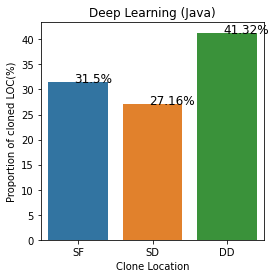

In [452]:
df = pd.DataFrame()
df['percentage'] = pd.Series([31.5, 27.16, 41.32 ])
df['Clone Location'] = pd.Series(['SF', 'SD', 'DD'])
# df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
plt.rcParams["figure.figsize"] = (4,4)
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title("Deep Learning (Java)")
ax.set(ylabel = 'Proportion of cloned LOC(%)')
add_percentage(ax,df.percentage)

In [426]:
print('same file',trad_sf/trad_total,'same directory',trad_sd/trad_total, 'different directories',trad_dd/trad_total)

same file 0.36051162044901575 same directory 0.14498778812927154 different directories 0.4945005914217127


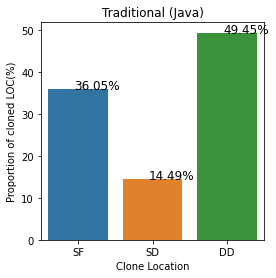

In [454]:
df = pd.DataFrame()
df['percentage'] = pd.Series([36.05, 14.49, 49.45 ])
df['Clone Location'] = pd.Series(['SF', 'SD', 'DD'])
# df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
plt.rcParams["figure.figsize"] = (4,4)
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title('Traditional (Java)')
ax.set(ylabel = 'Proportion of cloned LOC(%)')
add_percentage(ax,df.percentage)

## C#

In [151]:
clones = all_clones_categorized_size_fct[all_clones_categorized_size_fct['language']=='csharp']

In [152]:
Type1 = clones[clones['clone_type']=='Type 1']
Type2 = clones[clones['clone_type']=='Type 2']
Type3 = clones[clones['clone_type']=='Type 3']

In [153]:
Type1.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502,4805


In [154]:
Type1_size = Type1.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [155]:
Type1_size=Type1_size.rename(columns={"locc": "total_locc_Type1"})

In [156]:
Type1_size.head()

,repoName,project_type,clone_type,total_locc_Type1
0,AspectCore-Framework,Traditional,Type 1,134
1,Avalonia,Traditional,Type 1,1874
2,CeNiN,Deep Learning,Type 1,28
3,ConvNetSharp,Deep Learning,Type 1,874
4,Dapper,Traditional,Type 1,38


In [157]:
Type1_locc = pd.merge(Type1,Type1_size[['repoName','total_locc_Type1']],how='left', on=['repoName'])

In [158]:
Type1_percentage = Type1_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type1']).agg({'locc':'sum'}).reset_index()

In [159]:
Type1_percentage['percentage']=(Type1_percentage['locc']/Type1_percentage['total_locc_Type1'])*100

In [160]:
Type1_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type1,locc,percentage
0,AspectCore-Framework,Traditional,Type 1,Different directories,134,98,73.134328
1,AspectCore-Framework,Traditional,Type 1,Same directory,134,36,26.865672
2,Avalonia,Traditional,Type 1,Different directories,1874,977,52.134472
3,Avalonia,Traditional,Type 1,Same directory,1874,833,44.450374
4,Avalonia,Traditional,Type 1,Same file,1874,64,3.415155


In [161]:
Type1_percentage.to_csv('data/otherLanguages/cleanClones/Type1_percentage_csharp.csv')

Text(0.5, 1.0, ' (A) Type 1 ')

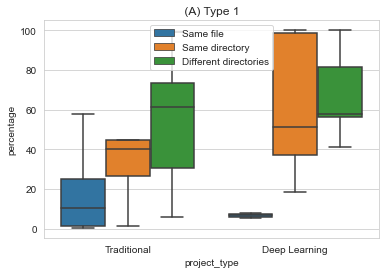

In [162]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type1_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
plt.title(' (A) Type 1 ')

##### Type2

In [163]:
Type2_size = Type2.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [164]:
Type2_size=Type2_size.rename(columns={"locc": "total_locc_Type2"})

In [165]:
Type2_locc = pd.merge(Type2,Type2_size[['repoName','total_locc_Type2']],how='left', on=['repoName'])

In [166]:
Type2_percentage = Type2_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type2']).agg({'locc':'sum'}).reset_index()

In [167]:
Type2_percentage['percentage']=(Type2_percentage['locc']/Type2_percentage['total_locc_Type2'])*100

In [168]:
Type2_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type2,locc,percentage
0,AspectCore-Framework,Traditional,Type 2,Different directories,939,180,19.169329
1,AspectCore-Framework,Traditional,Type 2,Same directory,939,134,14.270501
2,AspectCore-Framework,Traditional,Type 2,Same file,939,625,66.560170
3,Avalonia,Traditional,Type 2,Different directories,8725,1223,14.017192
4,Avalonia,Traditional,Type 2,Same directory,8725,1420,16.275072


In [169]:
Type2_percentage.to_csv('data/otherLanguages/cleanClones/Type2_percentage_csharp.csv')

Text(0.5, 1.0, ' (B) Type 2 ')

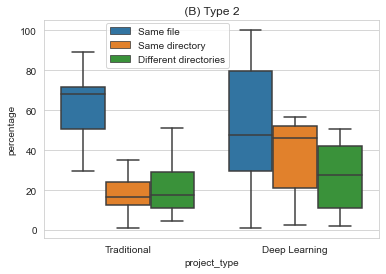

In [170]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type2_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.17, 0.51, 0.5, 0.5))
plt.title(' (B) Type 2 ')

##### Type 3

In [171]:
Type3_size = Type3.groupby(['repoName','project_type','clone_type']).agg({'locc':'sum'}).reset_index()

In [172]:
Type3_size=Type3_size.rename(columns={"locc": "total_locc_Type3"})

In [173]:
Type3_locc = pd.merge(Type3,Type3_size[['repoName','total_locc_Type3']],how='left', on=['repoName'])

In [174]:
Type3_percentage = Type3_locc.groupby(['repoName','project_type','clone_type','location','total_locc_Type3']).agg({'locc':'sum'}).reset_index()

In [175]:
Type3_percentage['percentage']=(Type3_percentage['locc']/Type3_percentage['total_locc_Type3'])*100

In [176]:
Type3_percentage.head()

,repoName,project_type,clone_type,location,total_locc_Type3,locc,percentage
0,AspectCore-Framework,Traditional,Type 3,Different directories,3411,1347,39.489886
1,AspectCore-Framework,Traditional,Type 3,Same directory,3411,614,18.000586
2,AspectCore-Framework,Traditional,Type 3,Same file,3411,1450,42.509528
3,Avalonia,Traditional,Type 3,Different directories,46819,14568,31.115573
4,Avalonia,Traditional,Type 3,Same directory,46819,6097,13.022491


In [177]:
Type3_percentage.to_csv('data/otherLanguages/cleanClones/Type3_percentage_csharp.csv')

Text(0.5, 1.0, ' (C) Type 3 ')

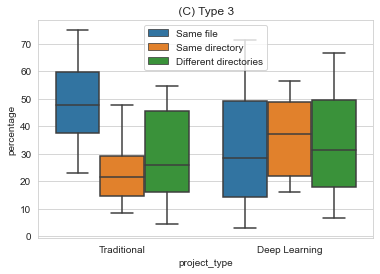

In [178]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=Type3_percentage, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='upper center')
plt.title(' (C) Type 3 ')

### Statsistical significance

In [278]:
DL_1 = Type1_percentage[Type1_percentage['project_type']=='Deep Learning']
DL_2 = Type2_percentage[Type2_percentage['project_type']=='Deep Learning']
DL_3 = Type3_percentage[Type3_percentage['project_type']=='Deep Learning']

Trad_1 = Type1_percentage[Type1_percentage['project_type']=='Traditional']
Trad_2 = Type2_percentage[Type2_percentage['project_type']=='Traditional']
Trad_3 = Type3_percentage[Type3_percentage['project_type']=='Traditional']

In [279]:
DL_SF_1 = DL_1[DL_1['location']=='Same file']
DL_SD_1 = DL_1[DL_1['location']=='Same directory']
DL_DD_1 = DL_1[DL_1['location']=='Different directories']

DL_SF_2 = DL_2[DL_2['location']=='Same file']
DL_SD_2 = DL_2[DL_2['location']=='Same directory']
DL_DD_2 = DL_2[DL_2['location']=='Different directories']

DL_SF_3 = DL_3[DL_3['location']=='Same file']
DL_SD_3 = DL_3[DL_3['location']=='Same directory']
DL_DD_3 = DL_3[DL_3['location']=='Different directories']

Trad_SF_1 = Trad_1[Trad_1['location']=='Same file']
Trad_SD_1 = Trad_1[Trad_1['location']=='Same directory']
Trad_DD_1 = Trad_1[Trad_1['location']=='Different directories']

Trad_SF_2 = Trad_2[Trad_2['location']=='Same file']
Trad_SD_2 = Trad_2[Trad_2['location']=='Same directory']
Trad_DD_2 = Trad_2[Trad_2['location']=='Different directories']

Trad_SF_3 = Trad_3[Trad_3['location']=='Same file']
Trad_SD_3 = Trad_3[Trad_3['location']=='Same directory']
Trad_DD_3 = Trad_3[Trad_3['location']=='Different directories']

### Type 1

### DL

In [280]:
stats.mannwhitneyu(DL_SF_1.percentage, DL_SD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=0.039845106390767826)

In [281]:
cliffsDelta(DL_SF_1.percentage, DL_SD_1.percentage)

1.0

In [282]:
stats.mannwhitneyu(DL_SF_1.percentage,DL_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=2.0, pvalue=0.12464668105735238)

In [283]:
cliffsDelta(DL_SF_1.percentage,DL_DD_1.percentage)

0.7777777777777778

In [284]:
stats.mannwhitneyu(DL_SD_1.percentage,DL_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=43.0, pvalue=0.9016611545114349)

In [285]:
cliffsDelta(DL_SD_1.percentage,DL_DD_1.percentage)

0.044444444444444446

### TRAD

In [286]:
stats.mannwhitneyu(Trad_SF_1.percentage, Trad_SD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=19.0, pvalue=0.08721722503647963)

In [287]:
cliffsDelta(Trad_SF_1.percentage, Trad_SD_1.percentage)

0.5128205128205128

In [288]:
stats.mannwhitneyu(Trad_SF_1.percentage,Trad_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=10.0, pvalue=0.016926803091936612)

In [289]:
cliffsDelta(Trad_SF_1.percentage,Trad_DD_1.percentage)

0.7222222222222222

In [290]:
stats.mannwhitneyu(Trad_SD_1.percentage,Trad_DD_1.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=55.0, pvalue=0.22101309719361817)

In [291]:
cliffsDelta(Trad_SD_1.percentage,Trad_DD_1.percentage)

0.2948717948717949

### Type 2

### DL

In [292]:
stats.mannwhitneyu(DL_SF_2.percentage, DL_SD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=71.0, pvalue=0.4887178731852695)

In [293]:
cliffsDelta(DL_SF_2.percentage, DL_SD_2.percentage)

0.18333333333333332

In [294]:
stats.mannwhitneyu(DL_SF_2.percentage,DL_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=69.0, pvalue=0.11373878115878519)

In [295]:
cliffsDelta(DL_SF_2.percentage,DL_DD_2.percentage)

0.4375

In [296]:
stats.mannwhitneyu(DL_SD_2.percentage,DL_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=54.0, pvalue=0.23033106759236854)

In [297]:
cliffsDelta(DL_SD_2.percentage,DL_DD_2.percentage)

0.35

### TRAD

In [298]:
stats.mannwhitneyu(Trad_SF_2.percentage, Trad_SD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=183.0, pvalue=0.00010335443679223984)

In [299]:
cliffsDelta(Trad_SF_2.percentage, Trad_SD_2.percentage)

0.8673469387755102

In [300]:
stats.mannwhitneyu(Trad_SF_2.percentage,Trad_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=140.0, pvalue=0.004308943895944759)

In [301]:
cliffsDelta(Trad_SF_2.percentage,Trad_DD_2.percentage)

0.6666666666666666

In [302]:
stats.mannwhitneyu(Trad_SD_2.percentage,Trad_DD_2.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=80.0, pvalue=0.8571364155923)

In [303]:
cliffsDelta(Trad_SD_2.percentage,Trad_DD_2.percentage)

0.047619047619047616

### Type 3

### DL

In [304]:
stats.mannwhitneyu(DL_SF_3.percentage, DL_SD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=65.0, pvalue=0.3413316805006916)

In [305]:
cliffsDelta(DL_SF_3.percentage, DL_SD_3.percentage)

0.2261904761904762

In [306]:
stats.mannwhitneyu(DL_SF_3.percentage,DL_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=81.0, pvalue=0.6447996764288364)

In [307]:
cliffsDelta(DL_SF_3.percentage,DL_DD_3.percentage)

0.10989010989010989

In [308]:
stats.mannwhitneyu(DL_SD_3.percentage,DL_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=82.0, pvalue=0.8490153628243157)

In [309]:
cliffsDelta(DL_SD_3.percentage,DL_DD_3.percentage)

0.05128205128205128

### TRAD

In [310]:
stats.mannwhitneyu(Trad_SF_3.percentage, Trad_SD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=177.0, pvalue=0.0003098855075425032)

In [311]:
cliffsDelta(Trad_SF_3.percentage, Trad_SD_3.percentage)

0.8061224489795918

In [312]:
stats.mannwhitneyu(Trad_SF_3.percentage,Trad_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=145.0, pvalue=0.009427503987756911)

In [313]:
cliffsDelta(Trad_SF_3.percentage,Trad_DD_3.percentage)

0.5934065934065934

In [314]:
stats.mannwhitneyu(Trad_SD_3.percentage,Trad_DD_3.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=79.0, pvalue=0.5768096792806785)

In [315]:
cliffsDelta(Trad_SD_3.percentage,Trad_DD_3.percentage)

0.13186813186813187

## ALL -Types

In [316]:
clones.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc,total_locc_typed
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678,34
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678,34
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502,4805


In [317]:
clones_by_proj_loc = clones.groupby(['repoName','project_type','location']).agg({'locc':'sum'}).reset_index()

In [318]:
clones_by_proj_loc_size=clones_by_proj_loc.groupby(['repoName','project_type']).agg({'locc':'sum'}).reset_index()

In [319]:
clones_by_proj_loc_size=clones_by_proj_loc_size.rename(columns={"locc": "total_locc"})

In [320]:
clones_location = pd.merge(clones_by_proj_loc,clones_by_proj_loc_size[['repoName','total_locc']],how='left', on=['repoName'])

In [321]:
clones_location['percentage']=(clones_location['locc']/clones_location['total_locc'])*100

In [322]:
clones_location.head()

,repoName,project_type,location,locc,total_locc,percentage
0,AspectCore-Framework,Traditional,Different directories,1625,4484,36.239964
1,AspectCore-Framework,Traditional,Same directory,784,4484,17.484389
2,AspectCore-Framework,Traditional,Same file,2075,4484,46.275647
3,Avalonia,Traditional,Different directories,16768,57418,29.203386
4,Avalonia,Traditional,Same directory,8350,57418,14.542478


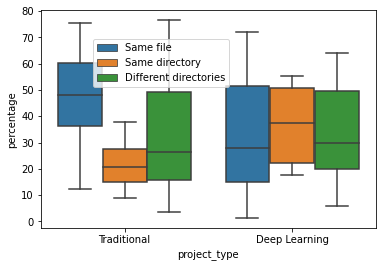

In [323]:
ml_trad_boxplot = sns.boxplot(x="project_type", y="percentage", data=clones_location, 
                              showfliers=False, hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.14, 0.51, 0.5, 0.5))
#plt.title(' (C) Type 3 ')

In [324]:
DL = clones_location[clones_location['project_type']=='Deep Learning']
Trad = clones_location[clones_location['project_type']=='Traditional']

In [325]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

Trad_SF = Trad[Trad['location']=='Same file']
Trad_SD = Trad[Trad['location']=='Same directory']
Trad_DD = Trad[Trad['location']=='Different directories']

### DL

In [326]:
stats.mannwhitneyu(DL_SF.percentage,DL_SD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=66.0, pvalue=0.3680655063054846)

In [327]:
cliffsDelta(DL_SF.percentage,DL_SD.percentage)

0.21428571428571427

In [328]:
stats.mannwhitneyu(DL_SF.percentage,DL_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=84.0, pvalue=0.7524427599988597)

In [329]:
cliffsDelta(DL_SF.percentage,DL_DD.percentage)

0.07692307692307693

In [330]:
stats.mannwhitneyu(DL_SD.percentage,DL_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=89.0, pvalue=0.5679151111448195)

In [331]:
cliffsDelta(DL_SD.percentage,DL_DD.percentage)

0.14102564102564102

### TRAD

In [332]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_SD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=168.0, pvalue=0.0014062567543281267)

In [333]:
cliffsDelta(Trad_SF.percentage,Trad_SD.percentage)

0.7142857142857143

In [334]:
stats.mannwhitneyu(Trad_SF.percentage,Trad_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=133.0, pvalue=0.04402679859151475)

In [335]:
cliffsDelta(Trad_SF.percentage,Trad_DD.percentage)

0.46153846153846156

In [336]:
stats.mannwhitneyu(Trad_SD.percentage,Trad_DD.percentage, alternative='two-sided')

MannwhitneyuResult(statistic=78.0, pvalue=0.5441316793449584)

In [337]:
cliffsDelta(Trad_SD.percentage,Trad_DD.percentage)

0.14285714285714285

## Summary % of cloned loc in different locations (DL vs Trad)

In [338]:
trad_sf=Trad_SF.locc.sum()
trad_sd=Trad_SD.locc.sum()
trad_dd=Trad_DD.locc.sum()
trad_total=Trad.locc.sum()

dl_sf=DL_SF.locc.sum()
dl_sd=DL_SD.locc.sum()
dl_dd=DL_DD.locc.sum()
dl_total=DL.locc.sum()

In [231]:
print('same file',dl_sf/dl_total,'same directory',dl_sd/dl_total, 'different directories',dl_dd/dl_total)

same file 0.22795817509196767 same directory 0.47907330749695165 different directories 0.29296851741108065


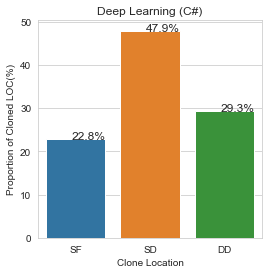

In [471]:
df = pd.DataFrame()
df['percentage'] = pd.Series([22.8, 47.90, 29.3 ])
df['Clone Location'] = pd.Series(['SF', 'SD', 'DD'])
# df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
# sns.set_style("whitegrid")
# plt.rcParams["figure.figsize"] = (4,4)
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title("Deep Learning (C#)")
ax.set(ylabel = 'Proportion of Cloned LOC(%)')
add_percentage(ax,df.percentage)

In [230]:
print('same file',trad_sf/trad_total,'same directory',trad_sd/trad_total, 'different directories',trad_dd/trad_total)

same file 0.4640970958525118 same directory 0.2949945243604206 different directories 0.2409083797870676


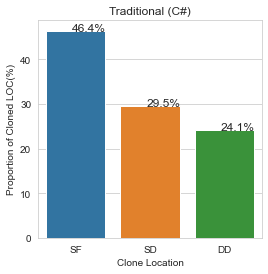

In [470]:
df = pd.DataFrame()
df['percentage'] = pd.Series([46.4, 29.5, 24.1 ])
# df['Clone Location'] = pd.Series(['Same file', 'Same directory', 'Different directories'])
df['Clone Location'] = pd.Series(['SF', 'SD', 'DD'])
plt.rcParams["figure.figsize"] = (4,4)
ax= sns.barplot(x='Clone Location',y='percentage',data=df)
ax.set_title('Traditional (C#)')
ax.set(ylabel = 'Proportion of Cloned LOC(%)')
add_percentage(ax,df.percentage)

## Mean percentages DL vs Trad

In [234]:
DL_DD.describe()

,locc,total_locc,percentage
count,13.000000,13.000000,13.000000
mean,8705.153846,29681.692308,35.463678
std,15032.135338,54615.669565,25.842919
min,200.000000,671.000000,5.818380
25%,366.000000,2461.000000,20.073141
50%,1331.000000,4163.000000,29.806259
75%,5568.000000,8705.000000,49.656226
max,41354.000000,180149.000000,98.678837


In [235]:
Trad_SF.describe()

,locc,total_locc,percentage
count,14.000000,14.000000,14.000000
mean,20129.714286,43373.928571,48.088718
std,38879.490358,77760.643556,17.850687
min,511.000000,696.000000,12.308967
25%,1521.500000,6078.500000,36.362986
50%,6676.000000,16096.500000,48.153277
75%,17376.250000,51254.750000,60.239351
max,149851.000000,301335.000000,75.395319


## End of stats for LOC based analysis

## Fragment Based Analysis

## Java

In [62]:
clones= all_clones_categorized_size_fct[all_clones_categorized_size_fct['language']=='java']

In [63]:
clones['nb_fragment'] = clones['nb_fragment'].astype(int)

In [64]:
clones.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc
4470,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,319,328,201.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359
4471,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,296,304,6292.0,100,Function,java,f,Type 1,Deep Learning,9,2,3,Different directories,7613,43902,80359
4472,neuralnetworks,1,/tmpstore/bimus/repositories/java/neuralnetwor...,219,228,6331.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359
4473,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,330,339,202.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359
4474,neuralnetworks,2,/tmpstore/bimus/repositories/java/neuralnetwor...,231,240,6332.0,100,Function,java,f,Type 1,Deep Learning,10,2,3,Different directories,7613,43902,80359


In [65]:
clones_by_proj_frag = clones.groupby(['repoName','project_type','location']).agg({'nb_fragment':'sum'}).reset_index()

In [66]:
clones_by_proj_frag_size=clones_by_proj_frag.groupby(['repoName','project_type']).agg({'nb_fragment':'sum'}).reset_index()

In [67]:
clones_by_proj_frag_size=clones_by_proj_frag_size.rename(columns={"nb_fragment": "total_fragments"})

In [68]:
clones_location_frag = pd.merge(clones_by_proj_frag,clones_by_proj_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])

In [69]:
clones_location_frag.head()

,repoName,project_type,location,nb_fragment,total_fragments
0,DeepDriver,Deep Learning,Different directories,3057,5588
1,DeepDriver,Deep Learning,Same directory,1837,5588
2,DeepDriver,Deep Learning,Same file,694,5588
3,MPAndroidChart,Traditional,Different directories,314,1633
4,MPAndroidChart,Traditional,Same directory,1090,1633


In [70]:
clones_location_frag['percentage']=(clones_location_frag['nb_fragment']/clones_location_frag['total_fragments'])*100

In [71]:
clones_location_frag

,repoName,project_type,location,nb_fragment,total_fragments,percentage
0,DeepDriver,Deep Learning,Different directories,3057,5588,54.706514
1,DeepDriver,Deep Learning,Same directory,1837,5588,32.874016
2,DeepDriver,Deep Learning,Same file,694,5588,12.419470
3,MPAndroidChart,Traditional,Different directories,314,1633,19.228414
4,MPAndroidChart,Traditional,Same directory,1090,1633,66.748316
5,MPAndroidChart,Traditional,Same file,229,1633,14.023270
6,SANNet,Deep Learning,Different directories,571,3473,16.441117
7,SANNet,Deep Learning,Same directory,747,3473,21.508782
8,SANNet,Deep Learning,Same file,2155,3473,62.050101
9,deeplearning4j,Deep Learning,Different directories,428597,506628,84.597969


[Text(0.5, 0, 'Location Category'),
 Text(0, 0.5, 'Percentage (%) of Cloned Fragments')]

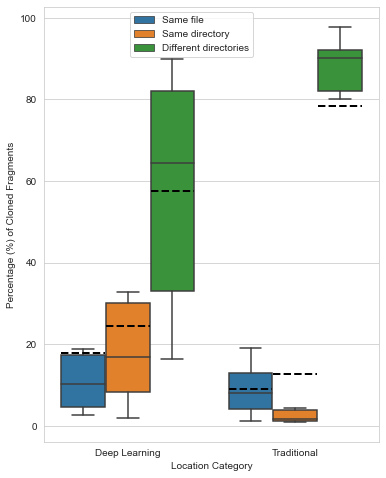

In [75]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
# meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style()
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=clones_location_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.14, 0.5, 0.5, 0.5))
#plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')

## C#

In [76]:
clones= all_clones_categorized_size_fct[all_clones_categorized_size_fct['language']=='csharp']

In [77]:
clones['nb_fragment'] = clones['nb_fragment'].astype(int)

In [78]:
clones.head()

,repoName,classid,file,startline,endline,pcid,similarity,granularity,language,g,clone_type,project_type,locc,category,nb_fragment,location,t_locc,total_sloc,total_locc
0,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,816,822,36.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678
1,SharpNet,1,/tmpstore/bimus/repositories/csharp/SharpNet/P...,1028,1034,556.0,100,Function,csharp,f,Type 1,Deep Learning,7,2,2,Different directories,34,27593,3678
2,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,64,73,1022.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678
3,SharpNet,2,/tmpstore/bimus/repositories/csharp/SharpNet/P...,50,59,1068.0,100,Function,csharp,f,Type 1,Deep Learning,10,1,2,Same directory,34,27593,3678
4,MyCaffe,1,/tmpstore/bimus/repositories/csharp/MyCaffe/My...,14,21,1.0,100,Function,csharp,f,Type 1,Deep Learning,8,2,23,Different directories,4805,180353,97502


In [79]:
clones_by_proj_frag = clones.groupby(['repoName','project_type','location']).agg({'nb_fragment':'sum'}).reset_index()

In [80]:
clones_by_proj_frag_size=clones_by_proj_frag.groupby(['repoName','project_type']).agg({'nb_fragment':'sum'}).reset_index()

In [81]:
clones_by_proj_frag_size=clones_by_proj_frag_size.rename(columns={"nb_fragment": "total_fragments"})

In [82]:
clones_location_frag = pd.merge(clones_by_proj_frag,clones_by_proj_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])

In [83]:
clones_location_frag.head()

,repoName,project_type,location,nb_fragment,total_fragments
0,AspectCore-Framework,Traditional,Different directories,3058,3938
1,AspectCore-Framework,Traditional,Same directory,230,3938
2,AspectCore-Framework,Traditional,Same file,650,3938
3,Avalonia,Traditional,Different directories,35270,45700
4,Avalonia,Traditional,Same directory,2830,45700


In [84]:
clones_location_frag['percentage']=(clones_location_frag['nb_fragment']/clones_location_frag['total_fragments'])*100

In [85]:
clones_location_frag

,repoName,project_type,location,nb_fragment,total_fragments,percentage
0,AspectCore-Framework,Traditional,Different directories,3058,3938,77.653631
1,AspectCore-Framework,Traditional,Same directory,230,3938,5.840528
2,AspectCore-Framework,Traditional,Same file,650,3938,16.505841
3,Avalonia,Traditional,Different directories,35270,45700,77.177243
4,Avalonia,Traditional,Same directory,2830,45700,6.192560
...,...,...,...,...,...,...
75,jellyfin,Traditional,Same file,2609,5672,45.997884
76,keras-sharp,Deep Learning,Different directories,89,277,32.129964
77,keras-sharp,Deep Learning,Same file,188,277,67.870036
78,shadowsocks-windows,Traditional,Same directory,36,147,24.489796


[Text(0.5, 0, 'Location Category'),
 Text(0, 0.5, 'Percentage (%) of Cloned Fragments')]

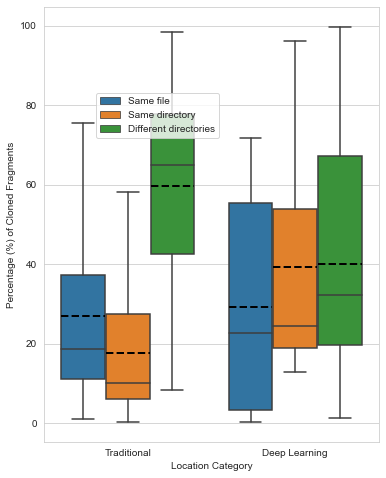

In [86]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
# meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style()
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=clones_location_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.14, 0.5, 0.5, 0.5))
#plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')

In [ ]:
def correct_fragment(row):
    frag=row['nb_fragment']
    if frag == 1:
        return 2
    else:
        return frag

In [ ]:
# clones['nb_fragment']=clones.apply(correct_fragment, axis=1)

In [246]:
DL = clones[clones['project_type']=='Deep Learning']

[Text(0.5, 0, 'Location Category'), Text(0, 0.5, 'Nb of Fragments')]

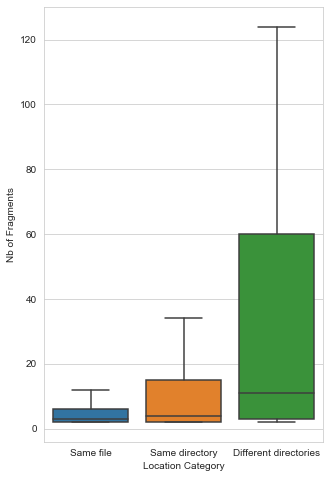

In [247]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style("whitegrid")
plt.figure(figsize=(5,8))
ml_trad_boxplot = sns.boxplot( x="location",y="nb_fragment", data=DL, order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
#plt.legend(loc='best', bbox_to_anchor=(0.14, 0.51, 0.5, 0.5))
#plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Nb of Fragments')

In [265]:
DL.describe()

,classid,startline,endline,pcid,similarity,locc,category,nb_fragment,t_locc,total_sloc,total_locc,total_locc_typed
count,23233.000000,23233.000000,23233.000000,2826.000000,23233.000000,23233.000000,23233.000000,23233.000000,23233.000000,23233.000000,23233.000000,23233.000000
mean,592.596006,5204.483622,5216.833814,12718.839703,85.715534,13.350192,1.177721,36.411268,65029.527784,329510.000258,124636.087117,65029.527784
std,714.675572,13170.023951,13169.867435,12716.705212,12.383435,14.446567,0.833794,93.774672,54062.416796,236112.556192,65561.804442,54062.416796
min,1.000000,5.000000,10.000000,9.000000,70.000000,1.000000,0.000000,2.000000,319.000000,16172.000000,4044.000000,319.000000
25%,51.000000,89.000000,101.000000,2470.000000,72.000000,6.000000,0.000000,2.000000,14017.000000,43902.000000,80359.000000,14017.000000
50%,230.000000,255.000000,270.000000,6707.000000,83.000000,9.000000,1.000000,5.000000,49314.000000,526195.000000,176450.000000,49314.000000
75%,964.000000,1910.000000,1920.000000,20525.500000,100.000000,14.000000,2.000000,21.000000,131823.000000,526195.000000,176450.000000,131823.000000
max,2667.000000,68495.000000,68509.000000,49339.000000,100.000000,202.000000,2.000000,557.000000,131823.000000,526195.000000,176450.000000,131823.000000


In [266]:
DL_SF = DL[DL['location']=='Same file']
DL_SD = DL[DL['location']=='Same directory']
DL_DD = DL[DL['location']=='Different directories']

In [267]:
DL_SF.describe()

,classid,startline,endline,pcid,similarity,locc,category,nb_fragment,t_locc,total_sloc,total_locc,total_locc_typed
count,6378.000000,6378.000000,6378.000000,363.000000,6378.000000,6378.000000,6378.0,6378.000000,6378.000000,6378.000000,6378.000000,6378.000000
mean,902.332549,6135.395735,6149.717466,9072.413223,87.094073,15.321731,0.0,7.277830,70213.054092,346966.151301,129533.252744,70213.054092
std,873.635932,14134.249301,14133.035878,10567.248687,11.863142,16.381841,0.0,12.353553,55710.232033,232272.024914,64050.626084,55710.232033
min,1.000000,7.000000,14.000000,309.000000,70.000000,1.000000,0.0,2.000000,1035.000000,16172.000000,4044.000000,1035.000000
25%,118.000000,167.000000,183.000000,2346.500000,75.000000,7.000000,0.0,2.000000,23432.000000,43902.000000,80359.000000,23432.000000
50%,520.000000,472.500000,489.000000,3973.000000,85.000000,10.000000,0.0,3.000000,30610.000000,526195.000000,176450.000000,30610.000000
75%,1766.000000,2709.500000,2717.500000,18460.500000,100.000000,17.000000,0.0,6.000000,131823.000000,526195.000000,176450.000000,131823.000000
max,2667.000000,68495.000000,68509.000000,49036.000000,100.000000,189.000000,0.0,84.000000,131823.000000,526195.000000,176450.000000,131823.000000


In [268]:
DL_SD.describe()

,classid,startline,endline,pcid,similarity,locc,category,nb_fragment,t_locc,total_sloc,total_locc,total_locc_typed
count,6348.000000,6348.000000,6348.000000,1172.000000,6348.000000,6348.000000,6348.0,6348.000000,6348.000000,6348.000000,6348.000000,6348.000000
mean,678.797101,1134.801512,1147.074354,15663.277304,89.131222,13.272842,1.0,14.285129,57284.653434,370091.996849,129344.856490,57284.653434
std,644.514399,2131.563155,2131.014942,14672.348732,12.080123,12.737236,0.0,23.692817,54588.873024,225710.461111,69909.795317,54588.873024
min,1.000000,6.000000,11.000000,9.000000,70.000000,3.000000,1.0,2.000000,319.000000,16172.000000,4044.000000,319.000000
25%,158.000000,78.000000,91.000000,2508.750000,77.000000,7.000000,1.0,2.000000,12828.000000,49445.000000,80359.000000,12828.000000
50%,517.000000,173.000000,186.000000,10624.500000,100.000000,10.000000,1.0,4.000000,30610.000000,526195.000000,176450.000000,30610.000000
75%,1090.250000,970.500000,984.000000,28069.000000,100.000000,14.000000,1.0,15.000000,131823.000000,526195.000000,176450.000000,131823.000000
max,2655.000000,14042.000000,14063.000000,49339.000000,100.000000,202.000000,1.0,117.000000,131823.000000,526195.000000,176450.000000,131823.000000


In [269]:
DL_DD.describe()

,classid,startline,endline,pcid,similarity,locc,category,nb_fragment,t_locc,total_sloc,total_locc,total_locc_typed
count,10507.000000,10507.000000,10507.000000,1291.000000,10507.000000,10507.000000,10507.0,10507.000000,10507.000000,10507.000000,10507.000000,10507.000000
mean,352.498525,7098.172076,7109.372228,11071.103021,82.815076,12.200152,2.0,67.463881,66562.213762,294395.329495,118818.499762,66562.213762
std,542.987283,15666.000848,15666.475076,10632.603704,12.202546,14.032637,0.0,131.294944,52192.392249,239458.938509,63248.736225,52192.392249
min,1.000000,5.000000,10.000000,84.000000,70.000000,1.000000,2.0,2.000000,319.000000,16172.000000,4044.000000,319.000000
25%,31.000000,73.000000,83.000000,2701.500000,71.000000,6.000000,2.0,3.000000,14017.000000,43902.000000,80359.000000,14017.000000
50%,84.000000,199.000000,210.000000,6688.000000,80.000000,8.000000,2.0,11.000000,49314.000000,526195.000000,176450.000000,49314.000000
75%,386.000000,3170.500000,3179.000000,19653.500000,100.000000,13.000000,2.0,60.000000,131823.000000,526195.000000,176450.000000,131823.000000
max,2638.000000,68495.000000,68509.000000,48544.000000,100.000000,196.000000,2.0,557.000000,131823.000000,526195.000000,176450.000000,131823.000000


In [270]:
clones[clones['location']=='Same directory'].nb_fragment.min()

2

In [271]:
sf.nb_fragment.max()

NameError: name 'sf' is not defined

In [ ]:
clones[clones['nb_fragment']==1]

In [272]:
stats.mannwhitneyu(DL_SF.nb_fragment,DL_SD.nb_fragment)

MannwhitneyuResult(statistic=16155860.0, pvalue=1.0965874003480728e-92)

In [273]:
cliffsDelta(DL_SF.nb_fragment,DL_SD.nb_fragment)

0.20193430354777755

In [274]:
stats.mannwhitneyu(DL_SF.nb_fragment,DL_DD.nb_fragment)

MannwhitneyuResult(statistic=17855094.5, pvalue=0.0)

In [275]:
cliffsDelta(DL_SF.nb_fragment,DL_DD.nb_fragment)

0.46712063689237265

In [276]:
stats.mannwhitneyu(DL_SD.nb_fragment,DL_DD.nb_fragment)

MannwhitneyuResult(statistic=23377592.0, pvalue=4.050568184840967e-237)

In [277]:
cliffsDelta(DL_SD.nb_fragment,DL_DD.nb_fragment)

0.2990062915418287

In [278]:
clones_location_frag_dl = clones_location_frag[clones_location_frag['project_type']=='Deep Learning']

[Text(0.5, 0, 'Location Category'),
 Text(0, 0.5, '(Nb of Fragments/ Total Fragments)x100')]

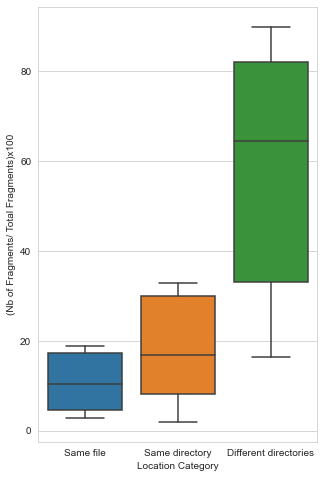

In [279]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style("whitegrid")
plt.figure(figsize=(5,8))
ml_trad_boxplot = sns.boxplot( x="location",y="percentage", data=clones_location_frag_dl, order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
#plt.legend(loc='best', bbox_to_anchor=(0.14, 0.51, 0.5, 0.5))
#plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='(Nb of Fragments/ Total Fragments)x100')

In [280]:
SF_SF_perc =clones_location_frag_dl[clones_location_frag_dl['location']=='Same file']
SF_SD_perc =clones_location_frag_dl[clones_location_frag_dl['location']=='Same directory']
SF_DD_perc =clones_location_frag_dl[clones_location_frag_dl['location']=='different directories']

In [281]:
stats.mannwhitneyu(SF_SF_perc.percentage,SF_SD_perc.percentage)

MannwhitneyuResult(statistic=15.0, pvalue=0.3444602779022303)

In [282]:
cliffsDelta(SF_SF_perc.percentage,SF_SD_perc.percentage)

0.16666666666666666

In [283]:
stats.mannwhitneyu(SF_SD_perc.percentage,SF_DD_perc.percentage)
cliffsDelta(SF_SD_perc.percentage,SF_DD_perc.percentage)

ZeroDivisionError: division by zero

## Percentage of fragment by count

In [ ]:
clones = pd.read_csv('data/all_clones_categorized_size_fct.csv')

In [ ]:
clones =clones.dropna()

In [284]:
dl_clones = clones[clones['project_type']=='Deep Learning']

In [ ]:
clones['count_fragment']=1

In [286]:
clones_by_proj_frag = dl_clones.groupby(['repoName','project_type','location']).agg({'nb_fragment':'count'}).reset_index()
clones_by_proj_frag_size=clones_by_proj_frag.groupby(['repoName','project_type']).agg({'nb_fragment':'sum'}).reset_index()
clones_by_proj_frag_size=clones_by_proj_frag_size.rename(columns={"nb_fragment": "total_fragments"})
clones_location_frag = pd.merge(clones_by_proj_frag,clones_by_proj_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])
clones_location_frag['percentage']=(clones_location_frag['nb_fragment']/clones_location_frag['total_fragments'])*100

In [288]:
clones_by_proj_frag = clones.groupby(['repoName','project_type','location']).agg({'nb_fragment':'count'}).reset_index()

In [289]:
clones_by_proj_frag

,repoName,project_type,location,nb_fragment
0,DeepDriver,Deep Learning,Different directories,403
1,DeepDriver,Deep Learning,Same directory,447
2,DeepDriver,Deep Learning,Same file,168
3,MPAndroidChart,Traditional,Different directories,36
4,MPAndroidChart,Traditional,Same directory,228
5,MPAndroidChart,Traditional,Same file,93
6,SANNet,Deep Learning,Different directories,69
7,SANNet,Deep Learning,Same directory,179
8,SANNet,Deep Learning,Same file,217
9,deeplearning4j,Deep Learning,Different directories,5421


In [290]:
clones_by_proj_frag_size=clones_by_proj_frag.groupby(['repoName','project_type']).agg({'nb_fragment':'sum'}).reset_index()

In [291]:
clones_by_proj_frag_size=clones_by_proj_frag_size.rename(columns={"nb_fragment": "total_fragments"})

In [292]:
clones_location_frag = pd.merge(clones_by_proj_frag,clones_by_proj_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])

In [294]:
clones_location_frag['percentage']=(clones_location_frag['nb_fragment']/clones_location_frag['total_fragments'])*100

In [295]:
clones_location_frag

,repoName,project_type,location,nb_fragment,total_fragments,percentage
0,DeepDriver,Deep Learning,Different directories,403,1018,39.587426
1,DeepDriver,Deep Learning,Same directory,447,1018,43.909627
2,DeepDriver,Deep Learning,Same file,168,1018,16.502947
3,MPAndroidChart,Traditional,Different directories,36,357,10.084034
4,MPAndroidChart,Traditional,Same directory,228,357,63.865546
5,MPAndroidChart,Traditional,Same file,93,357,26.050420
6,SANNet,Deep Learning,Different directories,69,465,14.838710
7,SANNet,Deep Learning,Same directory,179,465,38.494624
8,SANNet,Deep Learning,Same file,217,465,46.666667
9,deeplearning4j,Deep Learning,Different directories,5421,13708,39.546250


[Text(0.5, 0, 'Location Category'),
 Text(0, 0.5, 'Percentage (%) of Cloned Fragments')]

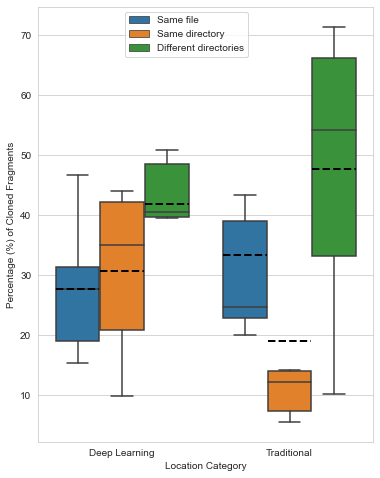

In [296]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style("whitegrid")
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=clones_location_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='best', bbox_to_anchor=(0.14, 0.5, 0.5, 0.5))
#plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')

In [297]:
clones_location_frag_DL=clones_location_frag[clones_location_frag['project_type']=='Deep Learning']
clones_location_frag_Trad=clones_location_frag[clones_location_frag['project_type']=='Traditional']

In [298]:
DL_SF_perc =clones_location_frag_DL[clones_location_frag_DL['location']=='Same file']
DL_SD_perc =clones_location_frag_DL[clones_location_frag_DL['location']=='Same directory']
DL_DD_perc =clones_location_frag_DL[clones_location_frag_DL['location']=='Different directories']

Trad_SF_perc =clones_location_frag_Trad[clones_location_frag_Trad['location']=='Same file']
Trad_SD_perc =clones_location_frag_Trad[clones_location_frag_Trad['location']=='Same directory']
Trad_DD_perc =clones_location_frag_Trad[clones_location_frag_Trad['location']=='Different directories']

In [299]:
DL_SF_perc

,repoName,project_type,location,nb_fragment,total_fragments,percentage
2,DeepDriver,Deep Learning,Same file,168,1018,16.502947
8,SANNet,Deep Learning,Same file,217,465,46.666667
11,deeplearning4j,Deep Learning,Same file,3995,13708,29.143566
14,djl,Deep Learning,Same file,422,1320,31.969697
23,knime-deeplearning,Deep Learning,Same file,250,1634,15.299878
26,neuralnetworks,Deep Learning,Same file,1326,5088,26.061321


In [300]:
stats.mannwhitneyu(SF_SD_perc.percentage,SF_DD_perc.percentage)
cliffsDelta(SF_SD_perc.percentage,SF_DD_perc.percentage)

ZeroDivisionError: division by zero

In [301]:
stats.mannwhitneyu(SF_perc.percentage,SD_perc.percentage)

NameError: name 'SF_perc' is not defined

In [302]:
cliffsDelta(SF_perc.percentage,SD_perc.percentage)

NameError: name 'SF_perc' is not defined

In [ ]:
stats.mannwhitneyu(SF_perc.percentage,DD_perc.percentage)

In [ ]:
cliffsDelta(SF_perc.percentage,DD_perc.percentage)

In [ ]:
stats.mannwhitneyu(SD_perc.percentage,DD_perc.percentage)

In [ ]:
cliffsDelta(SD_perc.percentage,DD_perc.percentage)

In [ ]:
DL_SF_perc.describe()

In [ ]:
DL_SD_perc.describe()

In [ ]:
DL_DD_perc.describe()

In [ ]:
Trad_SF_perc.describe()

In [ ]:
Trad_SD_perc.describe()

In [ ]:
Trad_DD_perc.describe()

In [ ]:
stats.mannwhitneyu(DL_SF_perc.percentage,Trad_SF_perc.percentage)

In [ ]:
cliffsDelta(DL_SF_perc.percentage,Trad_SF_perc.percentage)

### Fragment and Clone Type

In [ ]:
clones_by_proj_frag = dl_clones.groupby(['repoName','project_type','location']).agg({'count_fragment':'count'}).reset_index()
clones_by_proj_frag_size=clones_by_proj_frag.groupby(['repoName','project_type']).agg({'nb_fragment':'sum'}).reset_index()
clones_by_proj_frag_size=clones_by_proj_frag_size.rename(columns={"nb_fragment": "total_fragments"})
clones_location_frag = pd.merge(clones_by_proj_frag,clones_by_proj_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])
clones_location_frag['percentage']=(clones_location_frag['nb_fragment']/clones_location_frag['total_fragments'])*100

### Java

In [472]:
clones= all_clones_categorized_size_fct_java
clones.head()

NameError: name 'all_clones_categorized_size_fct_java' is not defined

In [ ]:
Type1_frag= clones[clones['clone_type']=='Type 1']
Type2_frag= clones[clones['clone_type']=='Type 2']
Type3_frag= clones[clones['clone_type']=='Type 3']

In [ ]:
Type1_group_frag = Type1_frag.groupby(['repoName','project_type','location']).agg({'count_fragment':'count'}).reset_index()

In [ ]:
Type1_group_frag

In [ ]:
Type1_group_frag_size=Type1_group_frag.groupby(['repoName','project_type']).agg({'count_fragment':'sum'}).reset_index()
Type1_group_frag_size=Type1_group_frag_size.rename(columns={"count_fragment": "total_fragments"})

In [ ]:
Type1_group_frag = pd.merge(Type1_group_frag,Type1_group_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])
Type1_group_frag['percentage']=(Type1_group_frag['count_fragment']/Type1_group_frag['total_fragments'])*100

In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style("whitegrid")
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=Type1_group_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='lower center')#, bbox_to_anchor=(0.14, 0.6, 0.5, 0.5))
plt.title(' (A) Type 1 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')

In [ ]:
Type2_group_frag = Type2_frag.groupby(['repoName','project_type','location']).agg({'count_fragment':'count'}).reset_index()
Type2_group_frag_size=Type2_group_frag.groupby(['repoName','project_type']).agg({'count_fragment':'sum'}).reset_index()
Type2_group_frag_size=Type2_group_frag_size.rename(columns={"count_fragment": "total_fragments"})
Type2_group_frag = pd.merge(Type2_group_frag,Type2_group_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])
Type2_group_frag['percentage']=(Type2_group_frag['count_fragment']/Type2_group_frag['total_fragments'])*100

In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style("whitegrid")
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=Type2_group_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='lower center')#, bbox_to_anchor=(0.14, 0.6, 0.5, 0.5))
plt.title(' (B) Type 2 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')

In [ ]:
Type3_group_frag = Type3_frag.groupby(['repoName','project_type','location']).agg({'count_fragment':'count'}).reset_index()
Type3_group_frag_size=Type3_group_frag.groupby(['repoName','project_type']).agg({'count_fragment':'sum'}).reset_index()
Type3_group_frag_size=Type3_group_frag_size.rename(columns={"count_fragment": "total_fragments"})
Type3_group_frag = pd.merge(Type3_group_frag,Type3_group_frag_size[['repoName','total_fragments']],how='left', on=['repoName'])
Type3_group_frag['percentage']=(Type3_group_frag['count_fragment']/Type3_group_frag['total_fragments'])*100

In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
meanlineprops = dict(linestyle='--', linewidth=2., color='black')
sns.set_style("whitegrid")
plt.figure(figsize=(6,8))
ml_trad_boxplot = sns.boxplot( x="project_type",y="percentage", meanprops=meanlineprops,showmeans=True,
                              meanline=True
                    ,data=Type3_group_frag,  hue="location", hue_order=['Same file', 'Same directory', 'Different directories']
                               ,showfliers=False)#,hue='location', hue_order=['Same file', 'Same directory', 'Different directories'])
#ml_trad_boxplot.set_yscale("log")
plt.legend(loc='lower center')#, bbox_to_anchor=(0.14, 0.6, 0.5, 0.5))
plt.title(' (C) Type 3 ')
ml_trad_boxplot.set(xlabel='Location Category', ylabel='Percentage (%) of Cloned Fragments')